In [ ]:
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras.callbacks import Callback
from keras_tqdm import TQDMNotebookCallback

physical_devices = tf.config.list_physical_devices('GPU') 
tf.config.experimental.set_memory_growth(physical_devices[0], True)

In [2]:
# scale data
def scale(X, X_min, X_max):
    return (X - X_min)/(X_max-X_min)

NUM_CLASSES = 3

epochs = 1000
batch_size = 32
num_neurons = 10
seed = 10

np.random.seed(seed)
tf.random.set_seed(seed)

histories = {}

#read train data
train_input = np.genfromtxt('ctg_data_cleaned.csv', delimiter= ',')
X, Y = train_input[1:, :21], train_input[1:,-1].astype(int)
X = scale(X, np.min(X, axis=0), np.max(X, axis=0))
Y = Y-1 #minus 1 from classes, so that classes are 0,1,2 and not 1,2,3

In [3]:
# create training and testing vars
X_train, X_test, Y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=seed)
print (X_train.shape, Y_train.shape)
print (X_test.shape, y_test.shape)

(1488, 21) (1488,)
(638, 21) (638,)


# Part A - Question 1 

In [4]:
# create the model
l2 = tf.keras.regularizers.l2(l2=1e-6)

model = Sequential([
    Dense(num_neurons, activation='relu', kernel_regularizer=l2),
    Dense(NUM_CLASSES, activation='softmax')
])

opt = tf.keras.optimizers.SGD(lr=0.01)

model.compile(optimizer=opt,
              loss= 'sparse_categorical_crossentropy',
              metrics=['accuracy'])

# train the model
histories['qn1'] =model.fit(X_train, Y_train,
                            epochs=epochs,
                            verbose = 2,
                            batch_size=batch_size,
                            validation_data=(X_test, y_test))


Epoch 1/1000
47/47 - 0s - loss: 0.8583 - accuracy: 0.6862 - val_loss: 0.7368 - val_accuracy: 0.7790
Epoch 2/1000
47/47 - 0s - loss: 0.7163 - accuracy: 0.7782 - val_loss: 0.6879 - val_accuracy: 0.7790
Epoch 3/1000
47/47 - 0s - loss: 0.6895 - accuracy: 0.7782 - val_loss: 0.6752 - val_accuracy: 0.7790
Epoch 4/1000
47/47 - 0s - loss: 0.6791 - accuracy: 0.7782 - val_loss: 0.6669 - val_accuracy: 0.7790
Epoch 5/1000
47/47 - 0s - loss: 0.6711 - accuracy: 0.7782 - val_loss: 0.6596 - val_accuracy: 0.7790
Epoch 6/1000
47/47 - 0s - loss: 0.6636 - accuracy: 0.7782 - val_loss: 0.6523 - val_accuracy: 0.7790
Epoch 7/1000
47/47 - 0s - loss: 0.6564 - accuracy: 0.7782 - val_loss: 0.6450 - val_accuracy: 0.7790
Epoch 8/1000
47/47 - 0s - loss: 0.6493 - accuracy: 0.7782 - val_loss: 0.6380 - val_accuracy: 0.7790
Epoch 9/1000
47/47 - 0s - loss: 0.6423 - accuracy: 0.7782 - val_loss: 0.6311 - val_accuracy: 0.7790
Epoch 10/1000
47/47 - 0s - loss: 0.6356 - accuracy: 0.7782 - val_loss: 0.6245 - val_accuracy: 0.7790

Epoch 83/1000
47/47 - 0s - loss: 0.3451 - accuracy: 0.8602 - val_loss: 0.3346 - val_accuracy: 0.8746
Epoch 84/1000
47/47 - 0s - loss: 0.3433 - accuracy: 0.8616 - val_loss: 0.3330 - val_accuracy: 0.8777
Epoch 85/1000
47/47 - 0s - loss: 0.3416 - accuracy: 0.8629 - val_loss: 0.3316 - val_accuracy: 0.8840
Epoch 86/1000
47/47 - 0s - loss: 0.3402 - accuracy: 0.8629 - val_loss: 0.3299 - val_accuracy: 0.8809
Epoch 87/1000
47/47 - 0s - loss: 0.3388 - accuracy: 0.8656 - val_loss: 0.3286 - val_accuracy: 0.8824
Epoch 88/1000
47/47 - 0s - loss: 0.3373 - accuracy: 0.8629 - val_loss: 0.3273 - val_accuracy: 0.8824
Epoch 89/1000
47/47 - 0s - loss: 0.3357 - accuracy: 0.8649 - val_loss: 0.3260 - val_accuracy: 0.8840
Epoch 90/1000
47/47 - 0s - loss: 0.3344 - accuracy: 0.8642 - val_loss: 0.3250 - val_accuracy: 0.8887
Epoch 91/1000
47/47 - 0s - loss: 0.3334 - accuracy: 0.8663 - val_loss: 0.3232 - val_accuracy: 0.8840
Epoch 92/1000
47/47 - 0s - loss: 0.3319 - accuracy: 0.8642 - val_loss: 0.3220 - val_accurac

Epoch 164/1000
47/47 - 0s - loss: 0.2762 - accuracy: 0.8858 - val_loss: 0.2734 - val_accuracy: 0.8981
Epoch 165/1000
47/47 - 0s - loss: 0.2758 - accuracy: 0.8858 - val_loss: 0.2734 - val_accuracy: 0.8966
Epoch 166/1000
47/47 - 0s - loss: 0.2755 - accuracy: 0.8858 - val_loss: 0.2726 - val_accuracy: 0.8966
Epoch 167/1000
47/47 - 0s - loss: 0.2750 - accuracy: 0.8844 - val_loss: 0.2725 - val_accuracy: 0.8981
Epoch 168/1000
47/47 - 0s - loss: 0.2744 - accuracy: 0.8871 - val_loss: 0.2729 - val_accuracy: 0.8981
Epoch 169/1000
47/47 - 0s - loss: 0.2742 - accuracy: 0.8851 - val_loss: 0.2720 - val_accuracy: 0.8966
Epoch 170/1000
47/47 - 0s - loss: 0.2738 - accuracy: 0.8884 - val_loss: 0.2716 - val_accuracy: 0.8981
Epoch 171/1000
47/47 - 0s - loss: 0.2736 - accuracy: 0.8884 - val_loss: 0.2714 - val_accuracy: 0.8966
Epoch 172/1000
47/47 - 0s - loss: 0.2729 - accuracy: 0.8864 - val_loss: 0.2708 - val_accuracy: 0.8966
Epoch 173/1000
47/47 - 0s - loss: 0.2728 - accuracy: 0.8858 - val_loss: 0.2706 - v

Epoch 245/1000
47/47 - 0s - loss: 0.2547 - accuracy: 0.8965 - val_loss: 0.2595 - val_accuracy: 0.8981
Epoch 246/1000
47/47 - 0s - loss: 0.2537 - accuracy: 0.8918 - val_loss: 0.2603 - val_accuracy: 0.8934
Epoch 247/1000
47/47 - 0s - loss: 0.2549 - accuracy: 0.8965 - val_loss: 0.2589 - val_accuracy: 0.9013
Epoch 248/1000
47/47 - 0s - loss: 0.2541 - accuracy: 0.8965 - val_loss: 0.2589 - val_accuracy: 0.9013
Epoch 249/1000
47/47 - 0s - loss: 0.2541 - accuracy: 0.8945 - val_loss: 0.2583 - val_accuracy: 0.8997
Epoch 250/1000
47/47 - 0s - loss: 0.2541 - accuracy: 0.8958 - val_loss: 0.2587 - val_accuracy: 0.8981
Epoch 251/1000
47/47 - 0s - loss: 0.2535 - accuracy: 0.8985 - val_loss: 0.2596 - val_accuracy: 0.8934
Epoch 252/1000
47/47 - 0s - loss: 0.2532 - accuracy: 0.8945 - val_loss: 0.2582 - val_accuracy: 0.9013
Epoch 253/1000
47/47 - 0s - loss: 0.2539 - accuracy: 0.8918 - val_loss: 0.2593 - val_accuracy: 0.8981
Epoch 254/1000
47/47 - 0s - loss: 0.2535 - accuracy: 0.8952 - val_loss: 0.2587 - v

Epoch 326/1000
47/47 - 0s - loss: 0.2445 - accuracy: 0.9019 - val_loss: 0.2539 - val_accuracy: 0.9028
Epoch 327/1000
47/47 - 0s - loss: 0.2447 - accuracy: 0.8972 - val_loss: 0.2538 - val_accuracy: 0.9028
Epoch 328/1000
47/47 - 0s - loss: 0.2443 - accuracy: 0.8952 - val_loss: 0.2545 - val_accuracy: 0.8997
Epoch 329/1000
47/47 - 0s - loss: 0.2449 - accuracy: 0.8999 - val_loss: 0.2536 - val_accuracy: 0.9013
Epoch 330/1000
47/47 - 0s - loss: 0.2444 - accuracy: 0.8985 - val_loss: 0.2540 - val_accuracy: 0.9013
Epoch 331/1000
47/47 - 0s - loss: 0.2442 - accuracy: 0.8965 - val_loss: 0.2541 - val_accuracy: 0.8997
Epoch 332/1000
47/47 - 0s - loss: 0.2443 - accuracy: 0.8965 - val_loss: 0.2529 - val_accuracy: 0.9028
Epoch 333/1000
47/47 - 0s - loss: 0.2438 - accuracy: 0.8992 - val_loss: 0.2548 - val_accuracy: 0.8981
Epoch 334/1000
47/47 - 0s - loss: 0.2445 - accuracy: 0.8985 - val_loss: 0.2527 - val_accuracy: 0.8997
Epoch 335/1000
47/47 - 0s - loss: 0.2442 - accuracy: 0.8965 - val_loss: 0.2534 - v

Epoch 407/1000
47/47 - 0s - loss: 0.2385 - accuracy: 0.8958 - val_loss: 0.2496 - val_accuracy: 0.9013
Epoch 408/1000
47/47 - 0s - loss: 0.2381 - accuracy: 0.8985 - val_loss: 0.2488 - val_accuracy: 0.9013
Epoch 409/1000
47/47 - 0s - loss: 0.2383 - accuracy: 0.8978 - val_loss: 0.2493 - val_accuracy: 0.9013
Epoch 410/1000
47/47 - 0s - loss: 0.2382 - accuracy: 0.8992 - val_loss: 0.2487 - val_accuracy: 0.9013
Epoch 411/1000
47/47 - 0s - loss: 0.2383 - accuracy: 0.8978 - val_loss: 0.2498 - val_accuracy: 0.9013
Epoch 412/1000
47/47 - 0s - loss: 0.2382 - accuracy: 0.8985 - val_loss: 0.2503 - val_accuracy: 0.9013
Epoch 413/1000
47/47 - 0s - loss: 0.2378 - accuracy: 0.8972 - val_loss: 0.2492 - val_accuracy: 0.9013
Epoch 414/1000
47/47 - 0s - loss: 0.2379 - accuracy: 0.8965 - val_loss: 0.2494 - val_accuracy: 0.9013
Epoch 415/1000
47/47 - 0s - loss: 0.2375 - accuracy: 0.8992 - val_loss: 0.2504 - val_accuracy: 0.9013
Epoch 416/1000
47/47 - 0s - loss: 0.2376 - accuracy: 0.8985 - val_loss: 0.2491 - v

Epoch 488/1000
47/47 - 0s - loss: 0.2342 - accuracy: 0.8992 - val_loss: 0.2471 - val_accuracy: 0.8997
Epoch 489/1000
47/47 - 0s - loss: 0.2334 - accuracy: 0.8972 - val_loss: 0.2466 - val_accuracy: 0.9013
Epoch 490/1000
47/47 - 0s - loss: 0.2339 - accuracy: 0.8972 - val_loss: 0.2463 - val_accuracy: 0.9013
Epoch 491/1000
47/47 - 0s - loss: 0.2334 - accuracy: 0.8965 - val_loss: 0.2464 - val_accuracy: 0.8997
Epoch 492/1000
47/47 - 0s - loss: 0.2337 - accuracy: 0.8965 - val_loss: 0.2466 - val_accuracy: 0.9013
Epoch 493/1000
47/47 - 0s - loss: 0.2335 - accuracy: 0.8985 - val_loss: 0.2479 - val_accuracy: 0.8997
Epoch 494/1000
47/47 - 0s - loss: 0.2337 - accuracy: 0.8985 - val_loss: 0.2476 - val_accuracy: 0.8997
Epoch 495/1000
47/47 - 0s - loss: 0.2333 - accuracy: 0.9005 - val_loss: 0.2459 - val_accuracy: 0.9013
Epoch 496/1000
47/47 - 0s - loss: 0.2335 - accuracy: 0.8965 - val_loss: 0.2461 - val_accuracy: 0.9028
Epoch 497/1000
47/47 - 0s - loss: 0.2337 - accuracy: 0.8958 - val_loss: 0.2456 - v

Epoch 569/1000
47/47 - 0s - loss: 0.2299 - accuracy: 0.8958 - val_loss: 0.2448 - val_accuracy: 0.9013
Epoch 570/1000
47/47 - 0s - loss: 0.2300 - accuracy: 0.8945 - val_loss: 0.2443 - val_accuracy: 0.9028
Epoch 571/1000
47/47 - 0s - loss: 0.2304 - accuracy: 0.8985 - val_loss: 0.2454 - val_accuracy: 0.8997
Epoch 572/1000
47/47 - 0s - loss: 0.2300 - accuracy: 0.9012 - val_loss: 0.2470 - val_accuracy: 0.8981
Epoch 573/1000
47/47 - 0s - loss: 0.2299 - accuracy: 0.9005 - val_loss: 0.2450 - val_accuracy: 0.9013
Epoch 574/1000
47/47 - 0s - loss: 0.2302 - accuracy: 0.8999 - val_loss: 0.2449 - val_accuracy: 0.9013
Epoch 575/1000
47/47 - 0s - loss: 0.2300 - accuracy: 0.8978 - val_loss: 0.2441 - val_accuracy: 0.9013
Epoch 576/1000
47/47 - 0s - loss: 0.2299 - accuracy: 0.8972 - val_loss: 0.2441 - val_accuracy: 0.9013
Epoch 577/1000
47/47 - 0s - loss: 0.2300 - accuracy: 0.8985 - val_loss: 0.2439 - val_accuracy: 0.9028
Epoch 578/1000
47/47 - 0s - loss: 0.2294 - accuracy: 0.8978 - val_loss: 0.2438 - v

Epoch 650/1000
47/47 - 0s - loss: 0.2278 - accuracy: 0.9005 - val_loss: 0.2440 - val_accuracy: 0.9060
Epoch 651/1000
47/47 - 0s - loss: 0.2272 - accuracy: 0.8999 - val_loss: 0.2426 - val_accuracy: 0.9060
Epoch 652/1000
47/47 - 0s - loss: 0.2264 - accuracy: 0.8992 - val_loss: 0.2425 - val_accuracy: 0.9044
Epoch 653/1000
47/47 - 0s - loss: 0.2266 - accuracy: 0.9012 - val_loss: 0.2456 - val_accuracy: 0.8981
Epoch 654/1000
47/47 - 0s - loss: 0.2267 - accuracy: 0.8978 - val_loss: 0.2438 - val_accuracy: 0.9044
Epoch 655/1000
47/47 - 0s - loss: 0.2264 - accuracy: 0.9026 - val_loss: 0.2430 - val_accuracy: 0.9044
Epoch 656/1000
47/47 - 0s - loss: 0.2270 - accuracy: 0.8992 - val_loss: 0.2447 - val_accuracy: 0.8981
Epoch 657/1000
47/47 - 0s - loss: 0.2256 - accuracy: 0.8992 - val_loss: 0.2419 - val_accuracy: 0.9044
Epoch 658/1000
47/47 - 0s - loss: 0.2264 - accuracy: 0.8999 - val_loss: 0.2423 - val_accuracy: 0.9028
Epoch 659/1000
47/47 - 0s - loss: 0.2259 - accuracy: 0.8985 - val_loss: 0.2461 - v

Epoch 731/1000
47/47 - 0s - loss: 0.2242 - accuracy: 0.8992 - val_loss: 0.2438 - val_accuracy: 0.9044
Epoch 732/1000
47/47 - 0s - loss: 0.2239 - accuracy: 0.9046 - val_loss: 0.2419 - val_accuracy: 0.9060
Epoch 733/1000
47/47 - 0s - loss: 0.2241 - accuracy: 0.9012 - val_loss: 0.2429 - val_accuracy: 0.9060
Epoch 734/1000
47/47 - 0s - loss: 0.2243 - accuracy: 0.8985 - val_loss: 0.2423 - val_accuracy: 0.9060
Epoch 735/1000
47/47 - 0s - loss: 0.2238 - accuracy: 0.9012 - val_loss: 0.2431 - val_accuracy: 0.9028
Epoch 736/1000
47/47 - 0s - loss: 0.2244 - accuracy: 0.8999 - val_loss: 0.2417 - val_accuracy: 0.9060
Epoch 737/1000
47/47 - 0s - loss: 0.2239 - accuracy: 0.9026 - val_loss: 0.2409 - val_accuracy: 0.9075
Epoch 738/1000
47/47 - 0s - loss: 0.2239 - accuracy: 0.8999 - val_loss: 0.2415 - val_accuracy: 0.9060
Epoch 739/1000
47/47 - 0s - loss: 0.2241 - accuracy: 0.9032 - val_loss: 0.2409 - val_accuracy: 0.9075
Epoch 740/1000
47/47 - 0s - loss: 0.2232 - accuracy: 0.9019 - val_loss: 0.2452 - v

Epoch 812/1000
47/47 - 0s - loss: 0.2214 - accuracy: 0.9032 - val_loss: 0.2399 - val_accuracy: 0.9091
Epoch 813/1000
47/47 - 0s - loss: 0.2221 - accuracy: 0.9012 - val_loss: 0.2407 - val_accuracy: 0.9075
Epoch 814/1000
47/47 - 0s - loss: 0.2224 - accuracy: 0.9005 - val_loss: 0.2410 - val_accuracy: 0.9075
Epoch 815/1000
47/47 - 0s - loss: 0.2212 - accuracy: 0.9032 - val_loss: 0.2409 - val_accuracy: 0.9075
Epoch 816/1000
47/47 - 0s - loss: 0.2213 - accuracy: 0.9039 - val_loss: 0.2425 - val_accuracy: 0.9060
Epoch 817/1000
47/47 - 0s - loss: 0.2217 - accuracy: 0.9026 - val_loss: 0.2429 - val_accuracy: 0.9013
Epoch 818/1000
47/47 - 0s - loss: 0.2217 - accuracy: 0.9046 - val_loss: 0.2430 - val_accuracy: 0.9060
Epoch 819/1000
47/47 - 0s - loss: 0.2212 - accuracy: 0.9046 - val_loss: 0.2424 - val_accuracy: 0.9060
Epoch 820/1000
47/47 - 0s - loss: 0.2212 - accuracy: 0.9012 - val_loss: 0.2427 - val_accuracy: 0.9044
Epoch 821/1000
47/47 - 0s - loss: 0.2217 - accuracy: 0.8999 - val_loss: 0.2421 - v

Epoch 893/1000
47/47 - 0s - loss: 0.2201 - accuracy: 0.9039 - val_loss: 0.2413 - val_accuracy: 0.9028
Epoch 894/1000
47/47 - 0s - loss: 0.2196 - accuracy: 0.9012 - val_loss: 0.2432 - val_accuracy: 0.9044
Epoch 895/1000
47/47 - 0s - loss: 0.2198 - accuracy: 0.9032 - val_loss: 0.2398 - val_accuracy: 0.9075
Epoch 896/1000
47/47 - 0s - loss: 0.2200 - accuracy: 0.9039 - val_loss: 0.2423 - val_accuracy: 0.9013
Epoch 897/1000
47/47 - 0s - loss: 0.2200 - accuracy: 0.9026 - val_loss: 0.2426 - val_accuracy: 0.9028
Epoch 898/1000
47/47 - 0s - loss: 0.2199 - accuracy: 0.9032 - val_loss: 0.2398 - val_accuracy: 0.9091
Epoch 899/1000
47/47 - 0s - loss: 0.2196 - accuracy: 0.9052 - val_loss: 0.2404 - val_accuracy: 0.9075
Epoch 900/1000
47/47 - 0s - loss: 0.2199 - accuracy: 0.9052 - val_loss: 0.2447 - val_accuracy: 0.8981
Epoch 901/1000
47/47 - 0s - loss: 0.2196 - accuracy: 0.8999 - val_loss: 0.2393 - val_accuracy: 0.9075
Epoch 902/1000
47/47 - 0s - loss: 0.2192 - accuracy: 0.8999 - val_loss: 0.2387 - v

Epoch 974/1000
47/47 - 0s - loss: 0.2157 - accuracy: 0.9039 - val_loss: 0.2373 - val_accuracy: 0.9075
Epoch 975/1000
47/47 - 0s - loss: 0.2160 - accuracy: 0.9052 - val_loss: 0.2377 - val_accuracy: 0.9075
Epoch 976/1000
47/47 - 0s - loss: 0.2152 - accuracy: 0.9026 - val_loss: 0.2377 - val_accuracy: 0.9044
Epoch 977/1000
47/47 - 0s - loss: 0.2158 - accuracy: 0.9039 - val_loss: 0.2392 - val_accuracy: 0.9044
Epoch 978/1000
47/47 - 0s - loss: 0.2145 - accuracy: 0.9066 - val_loss: 0.2369 - val_accuracy: 0.9060
Epoch 979/1000
47/47 - 0s - loss: 0.2155 - accuracy: 0.9019 - val_loss: 0.2389 - val_accuracy: 0.9075
Epoch 980/1000
47/47 - 0s - loss: 0.2156 - accuracy: 0.9026 - val_loss: 0.2391 - val_accuracy: 0.9060
Epoch 981/1000
47/47 - 0s - loss: 0.2151 - accuracy: 0.9039 - val_loss: 0.2393 - val_accuracy: 0.9013
Epoch 982/1000
47/47 - 0s - loss: 0.2153 - accuracy: 0.8999 - val_loss: 0.2379 - val_accuracy: 0.9044
Epoch 983/1000
47/47 - 0s - loss: 0.2155 - accuracy: 0.9019 - val_loss: 0.2378 - v

In [5]:
print(type(histories['qn1'].history['accuracy']))

<class 'list'>


In [6]:
print(histories['qn1'].history.keys())

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


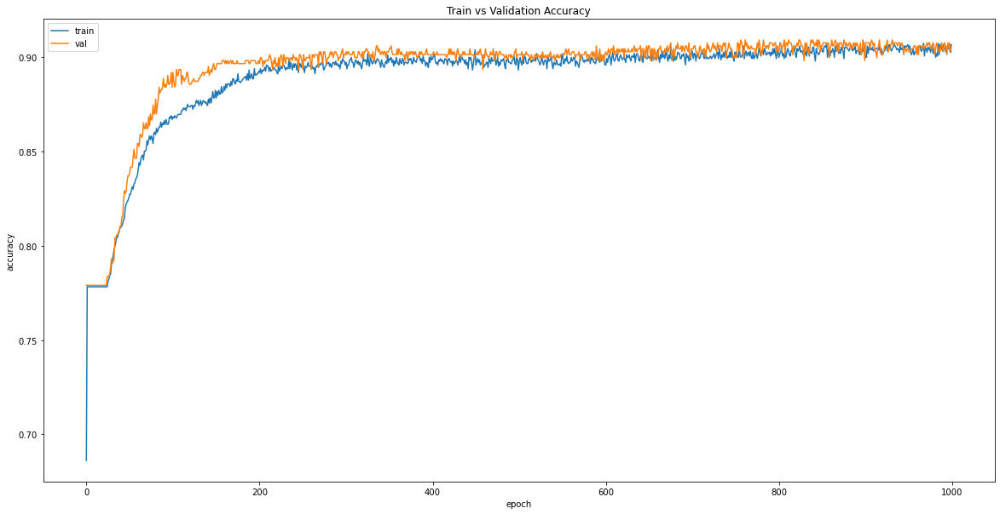

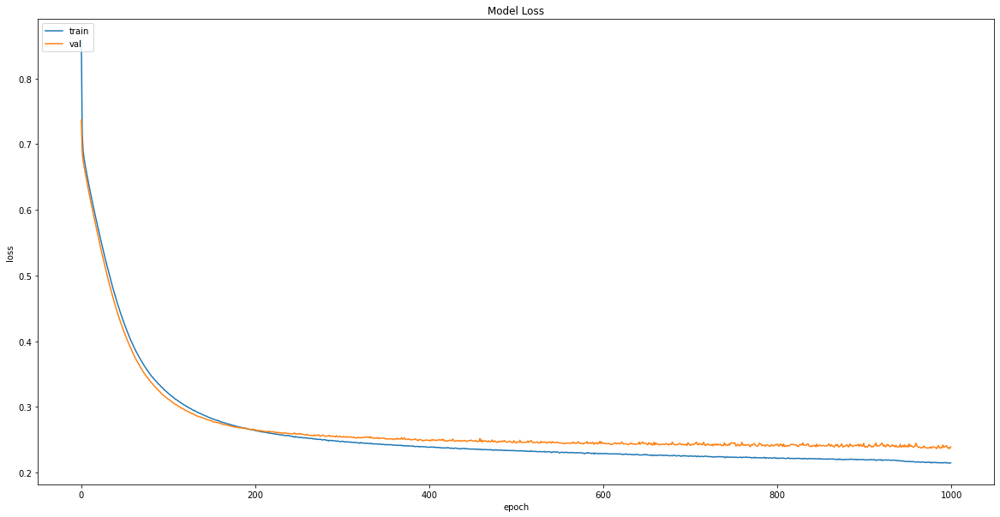

In [7]:
plt.figure(figsize=(20,10))
plt.plot(histories['qn1'].history['accuracy'])
plt.plot(histories['qn1'].history['val_accuracy'])
plt.title('Train vs Validation Accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

plt.figure(figsize=(20,10))
plt.plot(histories['qn1'].history['loss'])
plt.plot(histories['qn1'].history['val_loss'])
plt.title('Model Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

## Part A - Question 2

In [4]:
NUM_CLASSES = 3

epochs = 1000
num_neurons = 10
no_folds = 5

In [5]:
no_data = len(X_train)
idx = np.arange(no_data)
np.random.shuffle(idx)
X_train, Y_train = X_train[idx], Y_train[idx]
nf = no_data//no_folds

print(nf)

297


In [6]:
import time

class time_for_batch(Callback):
    def on_train_begin(self, logs={}):
        self.times=[]
    def on_train_batch_begin(self, batch, logs={}):
        self.starttime = time.time()
    def on_train_batch_end(self, batch, logs={}):
        self.times.append(time.time()-self.starttime)
        
class time_for_epoch(Callback):
    def on_train_begin(self, logs={}):
        self.times = []
    def on_epoch_begin(self, epoch, logs={}):
        self.epoch_time_start = time.time()
    def on_epoch_end(self, epoch, logs={}):
        self.times.append(time.time() - self.epoch_time_start)

In [7]:
models = []
mean_acc = []
batch_acc = []
batch_time = []
histories = {}
batch_sizes = [4,8,16]

for batch in batch_sizes:
    for fold in range(no_folds):
        print("Batch: " + str(batch) + "fold: " + str(fold))
        start, end = fold*nf, (fold+1)*nf
        x_val, y_val = X_train[start:end], Y_train[start:end]
        x_train  = np.append(X_train[:start], X_train[end:], axis=0)
        y_train = np.append(Y_train[:start], Y_train[end:], axis=0) 
        
        l2 = tf.keras.regularizers.l2(l2=1e-6)

        model = Sequential([
            Dense(num_neurons, activation='relu', kernel_regularizer=l2),
            Dense(NUM_CLASSES, activation='softmax')])
        
        opt = tf.keras.optimizers.SGD(lr=0.01)

        model.compile(optimizer= opt, 
                      loss='sparse_categorical_crossentropy',
                      metrics=['accuracy'])
        
        tb = time_for_batch()
        te = time_for_epoch()

        histories['batch-{}-fold-{}'.format(batch,fold)] = model.fit(x_train, y_train,
                        epochs=epochs,
                        verbose=2,
                        batch_size=batch,
                        callbacks = [te,tb],
                        validation_data=(x_val, y_val))
        

        batch_acc.append(histories['batch-{}-fold-{}'.format(batch,fold)].history['val_accuracy'][epochs-1])
        
        models.append(model)
        
        if fold == 4:
            batch_time.append(sum(te.times)/len(te.times))
            
        print('fold %d test accuracy %g'%(fold, batch_acc[fold]))

    for fold in range(no_folds):
        print('fold %d test accuracy %g'%(fold, batch_acc[fold]))
    print('* mean accuracy = %g *'% np.mean(batch_acc))
    mean_acc.append(np.mean(batch_acc))
    batch_acc = []

Batch: 4fold: 0
Epoch 1/1000
298/298 - 1s - loss: 0.7077 - accuracy: 0.7657 - val_loss: 0.6770 - val_accuracy: 0.7778
Epoch 2/1000
298/298 - 0s - loss: 0.6314 - accuracy: 0.7783 - val_loss: 0.6341 - val_accuracy: 0.7778
Epoch 3/1000
298/298 - 0s - loss: 0.5910 - accuracy: 0.7783 - val_loss: 0.5961 - val_accuracy: 0.7778
Epoch 4/1000
298/298 - 0s - loss: 0.5540 - accuracy: 0.7783 - val_loss: 0.5622 - val_accuracy: 0.7778
Epoch 5/1000
298/298 - 0s - loss: 0.5189 - accuracy: 0.7901 - val_loss: 0.5277 - val_accuracy: 0.7912
Epoch 6/1000
298/298 - 0s - loss: 0.4855 - accuracy: 0.8060 - val_loss: 0.4995 - val_accuracy: 0.7946
Epoch 7/1000
298/298 - 0s - loss: 0.4578 - accuracy: 0.8153 - val_loss: 0.4725 - val_accuracy: 0.7946
Epoch 8/1000
298/298 - 0s - loss: 0.4312 - accuracy: 0.8287 - val_loss: 0.4513 - val_accuracy: 0.8182
Epoch 9/1000
298/298 - 0s - loss: 0.4118 - accuracy: 0.8304 - val_loss: 0.4302 - val_accuracy: 0.8215
Epoch 10/1000
298/298 - 0s - loss: 0.3929 - accuracy: 0.8388 - val

Epoch 79/1000
298/298 - 0s - loss: 0.2343 - accuracy: 0.8984 - val_loss: 0.2547 - val_accuracy: 0.8822
Epoch 80/1000
298/298 - 0s - loss: 0.2340 - accuracy: 0.8959 - val_loss: 0.2577 - val_accuracy: 0.8990
Epoch 81/1000
298/298 - 0s - loss: 0.2359 - accuracy: 0.8984 - val_loss: 0.2570 - val_accuracy: 0.8956
Epoch 82/1000
298/298 - 0s - loss: 0.2325 - accuracy: 0.8934 - val_loss: 0.2648 - val_accuracy: 0.8754
Epoch 83/1000
298/298 - 0s - loss: 0.2338 - accuracy: 0.8992 - val_loss: 0.2577 - val_accuracy: 0.8889
Epoch 84/1000
298/298 - 0s - loss: 0.2357 - accuracy: 0.9009 - val_loss: 0.2760 - val_accuracy: 0.8788
Epoch 85/1000
298/298 - 0s - loss: 0.2334 - accuracy: 0.8950 - val_loss: 0.2594 - val_accuracy: 0.8889
Epoch 86/1000
298/298 - 0s - loss: 0.2289 - accuracy: 0.9043 - val_loss: 0.2743 - val_accuracy: 0.8788
Epoch 87/1000
298/298 - 0s - loss: 0.2363 - accuracy: 0.8858 - val_loss: 0.2565 - val_accuracy: 0.8990
Epoch 88/1000
298/298 - 0s - loss: 0.2336 - accuracy: 0.8950 - val_loss: 

Epoch 158/1000
298/298 - 0s - loss: 0.2177 - accuracy: 0.9093 - val_loss: 0.2499 - val_accuracy: 0.8990
Epoch 159/1000
298/298 - 0s - loss: 0.2166 - accuracy: 0.9018 - val_loss: 0.2663 - val_accuracy: 0.8822
Epoch 160/1000
298/298 - 0s - loss: 0.2194 - accuracy: 0.9060 - val_loss: 0.2474 - val_accuracy: 0.8923
Epoch 161/1000
298/298 - 0s - loss: 0.2169 - accuracy: 0.9102 - val_loss: 0.2445 - val_accuracy: 0.8923
Epoch 162/1000
298/298 - 0s - loss: 0.2176 - accuracy: 0.9093 - val_loss: 0.2504 - val_accuracy: 0.8754
Epoch 163/1000
298/298 - 0s - loss: 0.2152 - accuracy: 0.8976 - val_loss: 0.2777 - val_accuracy: 0.8754
Epoch 164/1000
298/298 - 0s - loss: 0.2154 - accuracy: 0.9118 - val_loss: 0.2508 - val_accuracy: 0.8754
Epoch 165/1000
298/298 - 0s - loss: 0.2128 - accuracy: 0.9076 - val_loss: 0.2469 - val_accuracy: 0.8889
Epoch 166/1000
298/298 - 0s - loss: 0.2139 - accuracy: 0.9093 - val_loss: 0.2440 - val_accuracy: 0.8923
Epoch 167/1000
298/298 - 0s - loss: 0.2138 - accuracy: 0.9093 - 

Epoch 237/1000
298/298 - 0s - loss: 0.2047 - accuracy: 0.9160 - val_loss: 0.2596 - val_accuracy: 0.8822
Epoch 238/1000
298/298 - 0s - loss: 0.2041 - accuracy: 0.9093 - val_loss: 0.2441 - val_accuracy: 0.8923
Epoch 239/1000
298/298 - 0s - loss: 0.2063 - accuracy: 0.9093 - val_loss: 0.2407 - val_accuracy: 0.8855
Epoch 240/1000
298/298 - 0s - loss: 0.2055 - accuracy: 0.9110 - val_loss: 0.2458 - val_accuracy: 0.8956
Epoch 241/1000
298/298 - 0s - loss: 0.2047 - accuracy: 0.9102 - val_loss: 0.2469 - val_accuracy: 0.9057
Epoch 242/1000
298/298 - 0s - loss: 0.2055 - accuracy: 0.9169 - val_loss: 0.2378 - val_accuracy: 0.8889
Epoch 243/1000
298/298 - 0s - loss: 0.2048 - accuracy: 0.9127 - val_loss: 0.2502 - val_accuracy: 0.8990
Epoch 244/1000
298/298 - 0s - loss: 0.2031 - accuracy: 0.9110 - val_loss: 0.2384 - val_accuracy: 0.8855
Epoch 245/1000
298/298 - 0s - loss: 0.2040 - accuracy: 0.9135 - val_loss: 0.2452 - val_accuracy: 0.8956
Epoch 246/1000
298/298 - 0s - loss: 0.2026 - accuracy: 0.9152 - 

Epoch 316/1000
298/298 - 0s - loss: 0.1966 - accuracy: 0.9160 - val_loss: 0.2440 - val_accuracy: 0.8956
Epoch 317/1000
298/298 - 0s - loss: 0.1968 - accuracy: 0.9194 - val_loss: 0.2477 - val_accuracy: 0.9024
Epoch 318/1000
298/298 - 0s - loss: 0.1999 - accuracy: 0.9144 - val_loss: 0.2472 - val_accuracy: 0.8822
Epoch 319/1000
298/298 - 0s - loss: 0.1951 - accuracy: 0.9194 - val_loss: 0.2445 - val_accuracy: 0.9024
Epoch 320/1000
298/298 - 0s - loss: 0.1986 - accuracy: 0.9144 - val_loss: 0.2429 - val_accuracy: 0.8923
Epoch 321/1000
298/298 - 0s - loss: 0.1983 - accuracy: 0.9110 - val_loss: 0.2431 - val_accuracy: 0.9024
Epoch 322/1000
298/298 - 0s - loss: 0.1943 - accuracy: 0.9152 - val_loss: 0.2516 - val_accuracy: 0.8990
Epoch 323/1000
298/298 - 0s - loss: 0.1971 - accuracy: 0.9169 - val_loss: 0.2421 - val_accuracy: 0.8990
Epoch 324/1000
298/298 - 0s - loss: 0.1977 - accuracy: 0.9152 - val_loss: 0.2504 - val_accuracy: 0.9024
Epoch 325/1000
298/298 - 0s - loss: 0.1974 - accuracy: 0.9160 - 

Epoch 395/1000
298/298 - 0s - loss: 0.1933 - accuracy: 0.9144 - val_loss: 0.2431 - val_accuracy: 0.8956
Epoch 396/1000
298/298 - 0s - loss: 0.1929 - accuracy: 0.9127 - val_loss: 0.2559 - val_accuracy: 0.9024
Epoch 397/1000
298/298 - 0s - loss: 0.1935 - accuracy: 0.9211 - val_loss: 0.2588 - val_accuracy: 0.9024
Epoch 398/1000
298/298 - 0s - loss: 0.1945 - accuracy: 0.9270 - val_loss: 0.2432 - val_accuracy: 0.8889
Epoch 399/1000
298/298 - 0s - loss: 0.1907 - accuracy: 0.9236 - val_loss: 0.2533 - val_accuracy: 0.9024
Epoch 400/1000
298/298 - 0s - loss: 0.1951 - accuracy: 0.9127 - val_loss: 0.2413 - val_accuracy: 0.8923
Epoch 401/1000
298/298 - 0s - loss: 0.1903 - accuracy: 0.9135 - val_loss: 0.2566 - val_accuracy: 0.8956
Epoch 402/1000
298/298 - 0s - loss: 0.1915 - accuracy: 0.9228 - val_loss: 0.2551 - val_accuracy: 0.9024
Epoch 403/1000
298/298 - 0s - loss: 0.1920 - accuracy: 0.9127 - val_loss: 0.2567 - val_accuracy: 0.8956
Epoch 404/1000
298/298 - 0s - loss: 0.1892 - accuracy: 0.9160 - 

Epoch 474/1000
298/298 - 0s - loss: 0.1900 - accuracy: 0.9228 - val_loss: 0.2544 - val_accuracy: 0.9091
Epoch 475/1000
298/298 - 0s - loss: 0.1900 - accuracy: 0.9219 - val_loss: 0.2541 - val_accuracy: 0.8990
Epoch 476/1000
298/298 - 0s - loss: 0.1855 - accuracy: 0.9236 - val_loss: 0.2722 - val_accuracy: 0.8956
Epoch 477/1000
298/298 - 0s - loss: 0.1896 - accuracy: 0.9211 - val_loss: 0.2405 - val_accuracy: 0.9057
Epoch 478/1000
298/298 - 0s - loss: 0.1889 - accuracy: 0.9186 - val_loss: 0.2411 - val_accuracy: 0.9057
Epoch 479/1000
298/298 - 0s - loss: 0.1879 - accuracy: 0.9177 - val_loss: 0.2432 - val_accuracy: 0.8956
Epoch 480/1000
298/298 - 0s - loss: 0.1873 - accuracy: 0.9160 - val_loss: 0.2508 - val_accuracy: 0.9091
Epoch 481/1000
298/298 - 0s - loss: 0.1867 - accuracy: 0.9228 - val_loss: 0.2475 - val_accuracy: 0.9125
Epoch 482/1000
298/298 - 0s - loss: 0.1885 - accuracy: 0.9261 - val_loss: 0.2430 - val_accuracy: 0.8956
Epoch 483/1000
298/298 - 0s - loss: 0.1871 - accuracy: 0.9228 - 

Epoch 553/1000
298/298 - 0s - loss: 0.1868 - accuracy: 0.9295 - val_loss: 0.2453 - val_accuracy: 0.9024
Epoch 554/1000
298/298 - 0s - loss: 0.1857 - accuracy: 0.9177 - val_loss: 0.2634 - val_accuracy: 0.8889
Epoch 555/1000
298/298 - 0s - loss: 0.1864 - accuracy: 0.9202 - val_loss: 0.2487 - val_accuracy: 0.9057
Epoch 556/1000
298/298 - 0s - loss: 0.1862 - accuracy: 0.9186 - val_loss: 0.2485 - val_accuracy: 0.9057
Epoch 557/1000
298/298 - 0s - loss: 0.1851 - accuracy: 0.9278 - val_loss: 0.2441 - val_accuracy: 0.9091
Epoch 558/1000
298/298 - 0s - loss: 0.1865 - accuracy: 0.9270 - val_loss: 0.2455 - val_accuracy: 0.9057
Epoch 559/1000
298/298 - 0s - loss: 0.1860 - accuracy: 0.9236 - val_loss: 0.2432 - val_accuracy: 0.8990
Epoch 560/1000
298/298 - 0s - loss: 0.1874 - accuracy: 0.9194 - val_loss: 0.2482 - val_accuracy: 0.9024
Epoch 561/1000
298/298 - 0s - loss: 0.1870 - accuracy: 0.9177 - val_loss: 0.2543 - val_accuracy: 0.8923
Epoch 562/1000
298/298 - 0s - loss: 0.1869 - accuracy: 0.9253 - 

Epoch 632/1000
298/298 - 0s - loss: 0.1813 - accuracy: 0.9278 - val_loss: 0.2452 - val_accuracy: 0.9091
Epoch 633/1000
298/298 - 0s - loss: 0.1818 - accuracy: 0.9253 - val_loss: 0.2666 - val_accuracy: 0.9125
Epoch 634/1000
298/298 - 0s - loss: 0.1846 - accuracy: 0.9228 - val_loss: 0.2507 - val_accuracy: 0.9158
Epoch 635/1000
298/298 - 0s - loss: 0.1770 - accuracy: 0.9270 - val_loss: 0.2558 - val_accuracy: 0.8956
Epoch 636/1000
298/298 - 0s - loss: 0.1841 - accuracy: 0.9202 - val_loss: 0.2491 - val_accuracy: 0.9091
Epoch 637/1000
298/298 - 0s - loss: 0.1826 - accuracy: 0.9261 - val_loss: 0.2558 - val_accuracy: 0.9024
Epoch 638/1000
298/298 - 1s - loss: 0.1808 - accuracy: 0.9253 - val_loss: 0.2483 - val_accuracy: 0.8990
Epoch 639/1000
298/298 - 0s - loss: 0.1824 - accuracy: 0.9236 - val_loss: 0.2604 - val_accuracy: 0.9091
Epoch 640/1000
298/298 - 0s - loss: 0.1827 - accuracy: 0.9253 - val_loss: 0.2528 - val_accuracy: 0.9024
Epoch 641/1000
298/298 - 0s - loss: 0.1842 - accuracy: 0.9270 - 

Epoch 711/1000
298/298 - 0s - loss: 0.1797 - accuracy: 0.9286 - val_loss: 0.2651 - val_accuracy: 0.9057
Epoch 712/1000
298/298 - 0s - loss: 0.1810 - accuracy: 0.9244 - val_loss: 0.2605 - val_accuracy: 0.8889
Epoch 713/1000
298/298 - 0s - loss: 0.1794 - accuracy: 0.9244 - val_loss: 0.2890 - val_accuracy: 0.8923
Epoch 714/1000
298/298 - 0s - loss: 0.1827 - accuracy: 0.9261 - val_loss: 0.2434 - val_accuracy: 0.9057
Epoch 715/1000
298/298 - 0s - loss: 0.1812 - accuracy: 0.9253 - val_loss: 0.2544 - val_accuracy: 0.9024
Epoch 716/1000
298/298 - 0s - loss: 0.1814 - accuracy: 0.9211 - val_loss: 0.2539 - val_accuracy: 0.9125
Epoch 717/1000
298/298 - 0s - loss: 0.1827 - accuracy: 0.9278 - val_loss: 0.2432 - val_accuracy: 0.9226
Epoch 718/1000
298/298 - 0s - loss: 0.1805 - accuracy: 0.9278 - val_loss: 0.2548 - val_accuracy: 0.9125
Epoch 719/1000
298/298 - 0s - loss: 0.1790 - accuracy: 0.9261 - val_loss: 0.2600 - val_accuracy: 0.8889
Epoch 720/1000
298/298 - 0s - loss: 0.1794 - accuracy: 0.9228 - 

Epoch 790/1000
298/298 - 0s - loss: 0.1802 - accuracy: 0.9244 - val_loss: 0.2509 - val_accuracy: 0.9125
Epoch 791/1000
298/298 - 0s - loss: 0.1809 - accuracy: 0.9244 - val_loss: 0.2575 - val_accuracy: 0.9057
Epoch 792/1000
298/298 - 0s - loss: 0.1773 - accuracy: 0.9253 - val_loss: 0.2609 - val_accuracy: 0.9125
Epoch 793/1000
298/298 - 0s - loss: 0.1810 - accuracy: 0.9219 - val_loss: 0.2469 - val_accuracy: 0.9057
Epoch 794/1000
298/298 - 0s - loss: 0.1774 - accuracy: 0.9270 - val_loss: 0.2573 - val_accuracy: 0.9091
Epoch 795/1000
298/298 - 0s - loss: 0.1820 - accuracy: 0.9244 - val_loss: 0.2566 - val_accuracy: 0.9091
Epoch 796/1000
298/298 - 0s - loss: 0.1836 - accuracy: 0.9278 - val_loss: 0.2488 - val_accuracy: 0.9091
Epoch 797/1000
298/298 - 0s - loss: 0.1831 - accuracy: 0.9177 - val_loss: 0.2795 - val_accuracy: 0.8822
Epoch 798/1000
298/298 - 0s - loss: 0.1807 - accuracy: 0.9320 - val_loss: 0.2436 - val_accuracy: 0.9125
Epoch 799/1000
298/298 - 0s - loss: 0.1788 - accuracy: 0.9228 - 

Epoch 869/1000
298/298 - 0s - loss: 0.1776 - accuracy: 0.9328 - val_loss: 0.2478 - val_accuracy: 0.9091
Epoch 870/1000
298/298 - 0s - loss: 0.1798 - accuracy: 0.9261 - val_loss: 0.2485 - val_accuracy: 0.9057
Epoch 871/1000
298/298 - 0s - loss: 0.1793 - accuracy: 0.9295 - val_loss: 0.2477 - val_accuracy: 0.9158
Epoch 872/1000
298/298 - 0s - loss: 0.1771 - accuracy: 0.9228 - val_loss: 0.2547 - val_accuracy: 0.9091
Epoch 873/1000
298/298 - 0s - loss: 0.1811 - accuracy: 0.9278 - val_loss: 0.2560 - val_accuracy: 0.9024
Epoch 874/1000
298/298 - 0s - loss: 0.1769 - accuracy: 0.9295 - val_loss: 0.2554 - val_accuracy: 0.9158
Epoch 875/1000
298/298 - 0s - loss: 0.1813 - accuracy: 0.9295 - val_loss: 0.2825 - val_accuracy: 0.8855
Epoch 876/1000
298/298 - 0s - loss: 0.1803 - accuracy: 0.9320 - val_loss: 0.2415 - val_accuracy: 0.9125
Epoch 877/1000
298/298 - 1s - loss: 0.1793 - accuracy: 0.9278 - val_loss: 0.2589 - val_accuracy: 0.9024
Epoch 878/1000
298/298 - 0s - loss: 0.1779 - accuracy: 0.9219 - 

Epoch 948/1000
298/298 - 1s - loss: 0.1773 - accuracy: 0.9253 - val_loss: 0.2615 - val_accuracy: 0.9024
Epoch 949/1000
298/298 - 1s - loss: 0.1764 - accuracy: 0.9270 - val_loss: 0.2532 - val_accuracy: 0.9192
Epoch 950/1000
298/298 - 1s - loss: 0.1808 - accuracy: 0.9295 - val_loss: 0.2503 - val_accuracy: 0.9091
Epoch 951/1000
298/298 - 0s - loss: 0.1776 - accuracy: 0.9253 - val_loss: 0.2458 - val_accuracy: 0.9158
Epoch 952/1000
298/298 - 0s - loss: 0.1755 - accuracy: 0.9303 - val_loss: 0.2541 - val_accuracy: 0.9057
Epoch 953/1000
298/298 - 0s - loss: 0.1774 - accuracy: 0.9286 - val_loss: 0.2545 - val_accuracy: 0.9091
Epoch 954/1000
298/298 - 0s - loss: 0.1778 - accuracy: 0.9328 - val_loss: 0.2512 - val_accuracy: 0.9091
Epoch 955/1000
298/298 - 1s - loss: 0.1773 - accuracy: 0.9228 - val_loss: 0.2440 - val_accuracy: 0.9226
Epoch 956/1000
298/298 - 1s - loss: 0.1789 - accuracy: 0.9270 - val_loss: 0.2480 - val_accuracy: 0.9125
Epoch 957/1000
298/298 - 1s - loss: 0.1788 - accuracy: 0.9253 - 

Epoch 27/1000
298/298 - 0s - loss: 0.2883 - accuracy: 0.8808 - val_loss: 0.2705 - val_accuracy: 0.8721
Epoch 28/1000
298/298 - 0s - loss: 0.2863 - accuracy: 0.8741 - val_loss: 0.2417 - val_accuracy: 0.8855
Epoch 29/1000
298/298 - 0s - loss: 0.2856 - accuracy: 0.8699 - val_loss: 0.2389 - val_accuracy: 0.8889
Epoch 30/1000
298/298 - 0s - loss: 0.2821 - accuracy: 0.8799 - val_loss: 0.2337 - val_accuracy: 0.8956
Epoch 31/1000
298/298 - 0s - loss: 0.2823 - accuracy: 0.8774 - val_loss: 0.2366 - val_accuracy: 0.8956
Epoch 32/1000
298/298 - 0s - loss: 0.2783 - accuracy: 0.8774 - val_loss: 0.2303 - val_accuracy: 0.8990
Epoch 33/1000
298/298 - 0s - loss: 0.2768 - accuracy: 0.8808 - val_loss: 0.2397 - val_accuracy: 0.8956
Epoch 34/1000
298/298 - 0s - loss: 0.2760 - accuracy: 0.8808 - val_loss: 0.2283 - val_accuracy: 0.8956
Epoch 35/1000
298/298 - 0s - loss: 0.2740 - accuracy: 0.8766 - val_loss: 0.2275 - val_accuracy: 0.8956
Epoch 36/1000
298/298 - 0s - loss: 0.2735 - accuracy: 0.8850 - val_loss: 

Epoch 107/1000
298/298 - 0s - loss: 0.2283 - accuracy: 0.9009 - val_loss: 0.1836 - val_accuracy: 0.9226
Epoch 108/1000
298/298 - 0s - loss: 0.2242 - accuracy: 0.9026 - val_loss: 0.1789 - val_accuracy: 0.9226
Epoch 109/1000
298/298 - 0s - loss: 0.2276 - accuracy: 0.8950 - val_loss: 0.1850 - val_accuracy: 0.9226
Epoch 110/1000
298/298 - 0s - loss: 0.2252 - accuracy: 0.9009 - val_loss: 0.1923 - val_accuracy: 0.9192
Epoch 111/1000
298/298 - 0s - loss: 0.2228 - accuracy: 0.8984 - val_loss: 0.1877 - val_accuracy: 0.9226
Epoch 112/1000
298/298 - 0s - loss: 0.2235 - accuracy: 0.8976 - val_loss: 0.1954 - val_accuracy: 0.9192
Epoch 113/1000
298/298 - 0s - loss: 0.2255 - accuracy: 0.8984 - val_loss: 0.1854 - val_accuracy: 0.9192
Epoch 114/1000
298/298 - 0s - loss: 0.2257 - accuracy: 0.8976 - val_loss: 0.1774 - val_accuracy: 0.9192
Epoch 115/1000
298/298 - 0s - loss: 0.2247 - accuracy: 0.8934 - val_loss: 0.1944 - val_accuracy: 0.9158
Epoch 116/1000
298/298 - 0s - loss: 0.2236 - accuracy: 0.9009 - 

Epoch 186/1000
298/298 - 0s - loss: 0.2052 - accuracy: 0.9051 - val_loss: 0.1719 - val_accuracy: 0.9158
Epoch 187/1000
298/298 - 0s - loss: 0.2035 - accuracy: 0.9102 - val_loss: 0.1825 - val_accuracy: 0.9192
Epoch 188/1000
298/298 - 0s - loss: 0.2028 - accuracy: 0.9127 - val_loss: 0.1688 - val_accuracy: 0.9259
Epoch 189/1000
298/298 - 0s - loss: 0.2035 - accuracy: 0.9085 - val_loss: 0.1748 - val_accuracy: 0.9226
Epoch 190/1000
298/298 - 0s - loss: 0.2024 - accuracy: 0.9102 - val_loss: 0.1858 - val_accuracy: 0.9158
Epoch 191/1000
298/298 - 0s - loss: 0.2015 - accuracy: 0.9135 - val_loss: 0.1771 - val_accuracy: 0.9192
Epoch 192/1000
298/298 - 0s - loss: 0.2023 - accuracy: 0.9118 - val_loss: 0.1720 - val_accuracy: 0.9158
Epoch 193/1000
298/298 - 0s - loss: 0.2003 - accuracy: 0.9118 - val_loss: 0.1840 - val_accuracy: 0.9158
Epoch 194/1000
298/298 - 0s - loss: 0.2013 - accuracy: 0.9152 - val_loss: 0.1614 - val_accuracy: 0.9226
Epoch 195/1000
298/298 - 0s - loss: 0.2037 - accuracy: 0.9127 - 

Epoch 265/1000
298/298 - 0s - loss: 0.1892 - accuracy: 0.9211 - val_loss: 0.1780 - val_accuracy: 0.9158
Epoch 266/1000
298/298 - 0s - loss: 0.1872 - accuracy: 0.9202 - val_loss: 0.1688 - val_accuracy: 0.9259
Epoch 267/1000
298/298 - 0s - loss: 0.1873 - accuracy: 0.9202 - val_loss: 0.1689 - val_accuracy: 0.9158
Epoch 268/1000
298/298 - 0s - loss: 0.1840 - accuracy: 0.9236 - val_loss: 0.1588 - val_accuracy: 0.9158
Epoch 269/1000
298/298 - 0s - loss: 0.1894 - accuracy: 0.9219 - val_loss: 0.1672 - val_accuracy: 0.9226
Epoch 270/1000
298/298 - 0s - loss: 0.1864 - accuracy: 0.9177 - val_loss: 0.1785 - val_accuracy: 0.9158
Epoch 271/1000
298/298 - 0s - loss: 0.1872 - accuracy: 0.9244 - val_loss: 0.1716 - val_accuracy: 0.9192
Epoch 272/1000
298/298 - 0s - loss: 0.1874 - accuracy: 0.9219 - val_loss: 0.1658 - val_accuracy: 0.9158
Epoch 273/1000
298/298 - 0s - loss: 0.1864 - accuracy: 0.9194 - val_loss: 0.1665 - val_accuracy: 0.9226
Epoch 274/1000
298/298 - 0s - loss: 0.1862 - accuracy: 0.9202 - 

Epoch 344/1000
298/298 - 0s - loss: 0.1780 - accuracy: 0.9244 - val_loss: 0.1737 - val_accuracy: 0.9091
Epoch 345/1000
298/298 - 0s - loss: 0.1784 - accuracy: 0.9236 - val_loss: 0.1796 - val_accuracy: 0.9158
Epoch 346/1000
298/298 - 0s - loss: 0.1774 - accuracy: 0.9312 - val_loss: 0.1861 - val_accuracy: 0.9192
Epoch 347/1000
298/298 - 0s - loss: 0.1772 - accuracy: 0.9244 - val_loss: 0.1597 - val_accuracy: 0.9192
Epoch 348/1000
298/298 - 0s - loss: 0.1754 - accuracy: 0.9228 - val_loss: 0.1580 - val_accuracy: 0.9192
Epoch 349/1000
298/298 - 0s - loss: 0.1797 - accuracy: 0.9253 - val_loss: 0.1627 - val_accuracy: 0.9158
Epoch 350/1000
298/298 - 0s - loss: 0.1783 - accuracy: 0.9270 - val_loss: 0.1701 - val_accuracy: 0.9158
Epoch 351/1000
298/298 - 0s - loss: 0.1764 - accuracy: 0.9295 - val_loss: 0.1723 - val_accuracy: 0.9226
Epoch 352/1000
298/298 - 0s - loss: 0.1773 - accuracy: 0.9286 - val_loss: 0.1836 - val_accuracy: 0.9192
Epoch 353/1000
298/298 - 0s - loss: 0.1775 - accuracy: 0.9261 - 

Epoch 423/1000
298/298 - 0s - loss: 0.1694 - accuracy: 0.9261 - val_loss: 0.1597 - val_accuracy: 0.9125
Epoch 424/1000
298/298 - 0s - loss: 0.1708 - accuracy: 0.9253 - val_loss: 0.1675 - val_accuracy: 0.9158
Epoch 425/1000
298/298 - 0s - loss: 0.1718 - accuracy: 0.9312 - val_loss: 0.1655 - val_accuracy: 0.9158
Epoch 426/1000
298/298 - 0s - loss: 0.1702 - accuracy: 0.9295 - val_loss: 0.1638 - val_accuracy: 0.9158
Epoch 427/1000
298/298 - 0s - loss: 0.1705 - accuracy: 0.9328 - val_loss: 0.1647 - val_accuracy: 0.9125
Epoch 428/1000
298/298 - 0s - loss: 0.1689 - accuracy: 0.9312 - val_loss: 0.1945 - val_accuracy: 0.9125
Epoch 429/1000
298/298 - 0s - loss: 0.1703 - accuracy: 0.9261 - val_loss: 0.1774 - val_accuracy: 0.9125
Epoch 430/1000
298/298 - 0s - loss: 0.1695 - accuracy: 0.9253 - val_loss: 0.1696 - val_accuracy: 0.9158
Epoch 431/1000
298/298 - 0s - loss: 0.1685 - accuracy: 0.9278 - val_loss: 0.1709 - val_accuracy: 0.9125
Epoch 432/1000
298/298 - 0s - loss: 0.1696 - accuracy: 0.9362 - 

Epoch 502/1000
298/298 - 0s - loss: 0.1632 - accuracy: 0.9345 - val_loss: 0.1553 - val_accuracy: 0.9192
Epoch 503/1000
298/298 - 0s - loss: 0.1633 - accuracy: 0.9312 - val_loss: 0.1511 - val_accuracy: 0.9293
Epoch 504/1000
298/298 - 0s - loss: 0.1637 - accuracy: 0.9345 - val_loss: 0.1519 - val_accuracy: 0.9259
Epoch 505/1000
298/298 - 0s - loss: 0.1636 - accuracy: 0.9345 - val_loss: 0.1671 - val_accuracy: 0.9125
Epoch 506/1000
298/298 - 0s - loss: 0.1610 - accuracy: 0.9353 - val_loss: 0.1477 - val_accuracy: 0.9327
Epoch 507/1000
298/298 - 0s - loss: 0.1623 - accuracy: 0.9370 - val_loss: 0.1551 - val_accuracy: 0.9293
Epoch 508/1000
298/298 - 0s - loss: 0.1621 - accuracy: 0.9312 - val_loss: 0.1549 - val_accuracy: 0.9226
Epoch 509/1000
298/298 - 0s - loss: 0.1631 - accuracy: 0.9328 - val_loss: 0.1507 - val_accuracy: 0.9226
Epoch 510/1000
298/298 - 0s - loss: 0.1604 - accuracy: 0.9353 - val_loss: 0.1578 - val_accuracy: 0.9158
Epoch 511/1000
298/298 - 0s - loss: 0.1643 - accuracy: 0.9337 - 

Epoch 581/1000
298/298 - 0s - loss: 0.1550 - accuracy: 0.9404 - val_loss: 0.1627 - val_accuracy: 0.9158
Epoch 582/1000
298/298 - 0s - loss: 0.1551 - accuracy: 0.9370 - val_loss: 0.1478 - val_accuracy: 0.9226
Epoch 583/1000
298/298 - 0s - loss: 0.1569 - accuracy: 0.9370 - val_loss: 0.1467 - val_accuracy: 0.9394
Epoch 584/1000
298/298 - 0s - loss: 0.1571 - accuracy: 0.9353 - val_loss: 0.1531 - val_accuracy: 0.9125
Epoch 585/1000
298/298 - 0s - loss: 0.1561 - accuracy: 0.9404 - val_loss: 0.1498 - val_accuracy: 0.9259
Epoch 586/1000
298/298 - 0s - loss: 0.1542 - accuracy: 0.9353 - val_loss: 0.1551 - val_accuracy: 0.9158
Epoch 587/1000
298/298 - 0s - loss: 0.1573 - accuracy: 0.9370 - val_loss: 0.1501 - val_accuracy: 0.9226
Epoch 588/1000
298/298 - 1s - loss: 0.1573 - accuracy: 0.9370 - val_loss: 0.1741 - val_accuracy: 0.9158
Epoch 589/1000
298/298 - 0s - loss: 0.1550 - accuracy: 0.9337 - val_loss: 0.1463 - val_accuracy: 0.9394
Epoch 590/1000
298/298 - 0s - loss: 0.1562 - accuracy: 0.9362 - 

Epoch 660/1000
298/298 - 0s - loss: 0.1512 - accuracy: 0.9362 - val_loss: 0.1589 - val_accuracy: 0.9259
Epoch 661/1000
298/298 - 0s - loss: 0.1529 - accuracy: 0.9362 - val_loss: 0.1864 - val_accuracy: 0.9057
Epoch 662/1000
298/298 - 0s - loss: 0.1465 - accuracy: 0.9412 - val_loss: 0.1608 - val_accuracy: 0.9091
Epoch 663/1000
298/298 - 0s - loss: 0.1516 - accuracy: 0.9353 - val_loss: 0.1505 - val_accuracy: 0.9259
Epoch 664/1000
298/298 - 0s - loss: 0.1482 - accuracy: 0.9387 - val_loss: 0.1578 - val_accuracy: 0.9226
Epoch 665/1000
298/298 - 0s - loss: 0.1490 - accuracy: 0.9421 - val_loss: 0.1504 - val_accuracy: 0.9259
Epoch 666/1000
298/298 - 0s - loss: 0.1505 - accuracy: 0.9437 - val_loss: 0.1567 - val_accuracy: 0.9226
Epoch 667/1000
298/298 - 0s - loss: 0.1505 - accuracy: 0.9404 - val_loss: 0.1695 - val_accuracy: 0.9192
Epoch 668/1000
298/298 - 0s - loss: 0.1500 - accuracy: 0.9404 - val_loss: 0.1664 - val_accuracy: 0.9158
Epoch 669/1000
298/298 - 0s - loss: 0.1497 - accuracy: 0.9362 - 

Epoch 739/1000
298/298 - 0s - loss: 0.1467 - accuracy: 0.9463 - val_loss: 0.1550 - val_accuracy: 0.9192
Epoch 740/1000
298/298 - 0s - loss: 0.1494 - accuracy: 0.9412 - val_loss: 0.1790 - val_accuracy: 0.9125
Epoch 741/1000
298/298 - 0s - loss: 0.1486 - accuracy: 0.9446 - val_loss: 0.1590 - val_accuracy: 0.9259
Epoch 742/1000
298/298 - 0s - loss: 0.1437 - accuracy: 0.9412 - val_loss: 0.1699 - val_accuracy: 0.9192
Epoch 743/1000
298/298 - 0s - loss: 0.1468 - accuracy: 0.9404 - val_loss: 0.1544 - val_accuracy: 0.9226
Epoch 744/1000
298/298 - 0s - loss: 0.1479 - accuracy: 0.9404 - val_loss: 0.1507 - val_accuracy: 0.9293
Epoch 745/1000
298/298 - 0s - loss: 0.1482 - accuracy: 0.9404 - val_loss: 0.1822 - val_accuracy: 0.9091
Epoch 746/1000
298/298 - 0s - loss: 0.1477 - accuracy: 0.9412 - val_loss: 0.1619 - val_accuracy: 0.9259
Epoch 747/1000
298/298 - 0s - loss: 0.1480 - accuracy: 0.9404 - val_loss: 0.1981 - val_accuracy: 0.9091
Epoch 748/1000
298/298 - 0s - loss: 0.1445 - accuracy: 0.9412 - 

Epoch 818/1000
298/298 - 0s - loss: 0.1451 - accuracy: 0.9404 - val_loss: 0.1521 - val_accuracy: 0.9327
Epoch 819/1000
298/298 - 0s - loss: 0.1441 - accuracy: 0.9395 - val_loss: 0.1617 - val_accuracy: 0.9226
Epoch 820/1000
298/298 - 0s - loss: 0.1437 - accuracy: 0.9446 - val_loss: 0.1546 - val_accuracy: 0.9259
Epoch 821/1000
298/298 - 0s - loss: 0.1411 - accuracy: 0.9446 - val_loss: 0.1925 - val_accuracy: 0.9125
Epoch 822/1000
298/298 - 0s - loss: 0.1457 - accuracy: 0.9387 - val_loss: 0.1545 - val_accuracy: 0.9293
Epoch 823/1000
298/298 - 0s - loss: 0.1448 - accuracy: 0.9446 - val_loss: 0.1595 - val_accuracy: 0.9192
Epoch 824/1000
298/298 - 0s - loss: 0.1449 - accuracy: 0.9421 - val_loss: 0.1569 - val_accuracy: 0.9192
Epoch 825/1000
298/298 - 0s - loss: 0.1433 - accuracy: 0.9463 - val_loss: 0.1534 - val_accuracy: 0.9360
Epoch 826/1000
298/298 - 0s - loss: 0.1462 - accuracy: 0.9454 - val_loss: 0.1601 - val_accuracy: 0.9192
Epoch 827/1000
298/298 - 0s - loss: 0.1425 - accuracy: 0.9437 - 

Epoch 897/1000
298/298 - 0s - loss: 0.1402 - accuracy: 0.9421 - val_loss: 0.1555 - val_accuracy: 0.9327
Epoch 898/1000
298/298 - 1s - loss: 0.1421 - accuracy: 0.9429 - val_loss: 0.1562 - val_accuracy: 0.9293
Epoch 899/1000
298/298 - 0s - loss: 0.1414 - accuracy: 0.9437 - val_loss: 0.1607 - val_accuracy: 0.9259
Epoch 900/1000
298/298 - 0s - loss: 0.1431 - accuracy: 0.9446 - val_loss: 0.1540 - val_accuracy: 0.9360
Epoch 901/1000
298/298 - 0s - loss: 0.1414 - accuracy: 0.9412 - val_loss: 0.1623 - val_accuracy: 0.9158
Epoch 902/1000
298/298 - 0s - loss: 0.1421 - accuracy: 0.9421 - val_loss: 0.1516 - val_accuracy: 0.9293
Epoch 903/1000
298/298 - 0s - loss: 0.1407 - accuracy: 0.9429 - val_loss: 0.1523 - val_accuracy: 0.9394
Epoch 904/1000
298/298 - 0s - loss: 0.1426 - accuracy: 0.9463 - val_loss: 0.1488 - val_accuracy: 0.9360
Epoch 905/1000
298/298 - 0s - loss: 0.1443 - accuracy: 0.9421 - val_loss: 0.1547 - val_accuracy: 0.9327
Epoch 906/1000
298/298 - 0s - loss: 0.1429 - accuracy: 0.9421 - 

Epoch 976/1000
298/298 - 0s - loss: 0.1378 - accuracy: 0.9437 - val_loss: 0.1477 - val_accuracy: 0.9259
Epoch 977/1000
298/298 - 0s - loss: 0.1370 - accuracy: 0.9488 - val_loss: 0.1514 - val_accuracy: 0.9360
Epoch 978/1000
298/298 - 0s - loss: 0.1397 - accuracy: 0.9463 - val_loss: 0.1599 - val_accuracy: 0.9226
Epoch 979/1000
298/298 - 0s - loss: 0.1353 - accuracy: 0.9471 - val_loss: 0.1557 - val_accuracy: 0.9360
Epoch 980/1000
298/298 - 0s - loss: 0.1372 - accuracy: 0.9463 - val_loss: 0.1552 - val_accuracy: 0.9327
Epoch 981/1000
298/298 - 0s - loss: 0.1384 - accuracy: 0.9479 - val_loss: 0.1481 - val_accuracy: 0.9327
Epoch 982/1000
298/298 - 0s - loss: 0.1371 - accuracy: 0.9454 - val_loss: 0.1477 - val_accuracy: 0.9360
Epoch 983/1000
298/298 - 0s - loss: 0.1351 - accuracy: 0.9513 - val_loss: 0.1475 - val_accuracy: 0.9394
Epoch 984/1000
298/298 - 1s - loss: 0.1379 - accuracy: 0.9496 - val_loss: 0.1635 - val_accuracy: 0.9192
Epoch 985/1000
298/298 - 0s - loss: 0.1353 - accuracy: 0.9454 - 

Epoch 55/1000
298/298 - 0s - loss: 0.2317 - accuracy: 0.9076 - val_loss: 0.2925 - val_accuracy: 0.8721
Epoch 56/1000
298/298 - 0s - loss: 0.2283 - accuracy: 0.9026 - val_loss: 0.2817 - val_accuracy: 0.8687
Epoch 57/1000
298/298 - 0s - loss: 0.2289 - accuracy: 0.9068 - val_loss: 0.3052 - val_accuracy: 0.8721
Epoch 58/1000
298/298 - 0s - loss: 0.2289 - accuracy: 0.9068 - val_loss: 0.2967 - val_accuracy: 0.8788
Epoch 59/1000
298/298 - 0s - loss: 0.2287 - accuracy: 0.9034 - val_loss: 0.2855 - val_accuracy: 0.8754
Epoch 60/1000
298/298 - 0s - loss: 0.2273 - accuracy: 0.9051 - val_loss: 0.2825 - val_accuracy: 0.8855
Epoch 61/1000
298/298 - 0s - loss: 0.2254 - accuracy: 0.9051 - val_loss: 0.3171 - val_accuracy: 0.8653
Epoch 62/1000
298/298 - 0s - loss: 0.2241 - accuracy: 0.9018 - val_loss: 0.2765 - val_accuracy: 0.8822
Epoch 63/1000
298/298 - 0s - loss: 0.2256 - accuracy: 0.9018 - val_loss: 0.2820 - val_accuracy: 0.8721
Epoch 64/1000
298/298 - 0s - loss: 0.2274 - accuracy: 0.9001 - val_loss: 

Epoch 135/1000
298/298 - 1s - loss: 0.2057 - accuracy: 0.9060 - val_loss: 0.2825 - val_accuracy: 0.8822
Epoch 136/1000
298/298 - 1s - loss: 0.2046 - accuracy: 0.9127 - val_loss: 0.2777 - val_accuracy: 0.8822
Epoch 137/1000
298/298 - 1s - loss: 0.2042 - accuracy: 0.9118 - val_loss: 0.2963 - val_accuracy: 0.8721
Epoch 138/1000
298/298 - 1s - loss: 0.2032 - accuracy: 0.9110 - val_loss: 0.2754 - val_accuracy: 0.8721
Epoch 139/1000
298/298 - 1s - loss: 0.2032 - accuracy: 0.9051 - val_loss: 0.2648 - val_accuracy: 0.8990
Epoch 140/1000
298/298 - 1s - loss: 0.2053 - accuracy: 0.9076 - val_loss: 0.2772 - val_accuracy: 0.8721
Epoch 141/1000
298/298 - 1s - loss: 0.2038 - accuracy: 0.9085 - val_loss: 0.2642 - val_accuracy: 0.8956
Epoch 142/1000
298/298 - 1s - loss: 0.2044 - accuracy: 0.9118 - val_loss: 0.2842 - val_accuracy: 0.8788
Epoch 143/1000
298/298 - 1s - loss: 0.2038 - accuracy: 0.9102 - val_loss: 0.2898 - val_accuracy: 0.8788
Epoch 144/1000
298/298 - 1s - loss: 0.2014 - accuracy: 0.9144 - 

Epoch 214/1000
298/298 - 1s - loss: 0.1944 - accuracy: 0.9085 - val_loss: 0.2677 - val_accuracy: 0.8822
Epoch 215/1000
298/298 - 1s - loss: 0.1944 - accuracy: 0.9093 - val_loss: 0.2810 - val_accuracy: 0.8788
Epoch 216/1000
298/298 - 1s - loss: 0.1944 - accuracy: 0.9110 - val_loss: 0.2946 - val_accuracy: 0.8721
Epoch 217/1000
298/298 - 1s - loss: 0.1944 - accuracy: 0.9144 - val_loss: 0.2589 - val_accuracy: 0.8923
Epoch 218/1000
298/298 - 1s - loss: 0.1926 - accuracy: 0.9127 - val_loss: 0.2645 - val_accuracy: 0.8889
Epoch 219/1000
298/298 - 1s - loss: 0.1931 - accuracy: 0.9085 - val_loss: 0.2604 - val_accuracy: 0.8956
Epoch 220/1000
298/298 - 1s - loss: 0.1944 - accuracy: 0.9110 - val_loss: 0.2593 - val_accuracy: 0.8923
Epoch 221/1000
298/298 - 1s - loss: 0.1943 - accuracy: 0.9160 - val_loss: 0.2778 - val_accuracy: 0.8754
Epoch 222/1000
298/298 - 1s - loss: 0.1955 - accuracy: 0.9160 - val_loss: 0.2686 - val_accuracy: 0.9024
Epoch 223/1000
298/298 - 1s - loss: 0.1938 - accuracy: 0.9152 - 

Epoch 293/1000
298/298 - 1s - loss: 0.1874 - accuracy: 0.9135 - val_loss: 0.2738 - val_accuracy: 0.8822
Epoch 294/1000
298/298 - 1s - loss: 0.1860 - accuracy: 0.9144 - val_loss: 0.2555 - val_accuracy: 0.8822
Epoch 295/1000
298/298 - 1s - loss: 0.1891 - accuracy: 0.9160 - val_loss: 0.2534 - val_accuracy: 0.8990
Epoch 296/1000
298/298 - 1s - loss: 0.1858 - accuracy: 0.9169 - val_loss: 0.2708 - val_accuracy: 0.8923
Epoch 297/1000
298/298 - 1s - loss: 0.1857 - accuracy: 0.9228 - val_loss: 0.2592 - val_accuracy: 0.9024
Epoch 298/1000
298/298 - 1s - loss: 0.1870 - accuracy: 0.9177 - val_loss: 0.2632 - val_accuracy: 0.9024
Epoch 299/1000
298/298 - 1s - loss: 0.1855 - accuracy: 0.9169 - val_loss: 0.2550 - val_accuracy: 0.8889
Epoch 300/1000
298/298 - 1s - loss: 0.1885 - accuracy: 0.9085 - val_loss: 0.2591 - val_accuracy: 0.8990
Epoch 301/1000
298/298 - 1s - loss: 0.1880 - accuracy: 0.9110 - val_loss: 0.2550 - val_accuracy: 0.8990
Epoch 302/1000
298/298 - 1s - loss: 0.1852 - accuracy: 0.9177 - 

Epoch 372/1000
298/298 - 1s - loss: 0.1815 - accuracy: 0.9186 - val_loss: 0.2519 - val_accuracy: 0.8855
Epoch 373/1000
298/298 - 1s - loss: 0.1806 - accuracy: 0.9160 - val_loss: 0.2734 - val_accuracy: 0.8822
Epoch 374/1000
298/298 - 1s - loss: 0.1801 - accuracy: 0.9169 - val_loss: 0.2974 - val_accuracy: 0.8687
Epoch 375/1000
298/298 - 1s - loss: 0.1814 - accuracy: 0.9169 - val_loss: 0.2533 - val_accuracy: 0.9024
Epoch 376/1000
298/298 - 1s - loss: 0.1795 - accuracy: 0.9236 - val_loss: 0.2522 - val_accuracy: 0.8956
Epoch 377/1000
298/298 - 1s - loss: 0.1785 - accuracy: 0.9219 - val_loss: 0.2444 - val_accuracy: 0.8956
Epoch 378/1000
298/298 - 1s - loss: 0.1838 - accuracy: 0.9160 - val_loss: 0.2466 - val_accuracy: 0.8889
Epoch 379/1000
298/298 - 1s - loss: 0.1804 - accuracy: 0.9219 - val_loss: 0.2734 - val_accuracy: 0.8855
Epoch 380/1000
298/298 - 1s - loss: 0.1782 - accuracy: 0.9186 - val_loss: 0.2557 - val_accuracy: 0.8788
Epoch 381/1000
298/298 - 1s - loss: 0.1792 - accuracy: 0.9152 - 

Epoch 451/1000
298/298 - 1s - loss: 0.1755 - accuracy: 0.9244 - val_loss: 0.2471 - val_accuracy: 0.8956
Epoch 452/1000
298/298 - 1s - loss: 0.1767 - accuracy: 0.9194 - val_loss: 0.2519 - val_accuracy: 0.8956
Epoch 453/1000
298/298 - 1s - loss: 0.1767 - accuracy: 0.9211 - val_loss: 0.2488 - val_accuracy: 0.8889
Epoch 454/1000
298/298 - 1s - loss: 0.1744 - accuracy: 0.9211 - val_loss: 0.2825 - val_accuracy: 0.8754
Epoch 455/1000
298/298 - 1s - loss: 0.1781 - accuracy: 0.9219 - val_loss: 0.2553 - val_accuracy: 0.8855
Epoch 456/1000
298/298 - 1s - loss: 0.1734 - accuracy: 0.9202 - val_loss: 0.2459 - val_accuracy: 0.8923
Epoch 457/1000
298/298 - 1s - loss: 0.1753 - accuracy: 0.9261 - val_loss: 0.2422 - val_accuracy: 0.8956
Epoch 458/1000
298/298 - 1s - loss: 0.1743 - accuracy: 0.9261 - val_loss: 0.2512 - val_accuracy: 0.9024
Epoch 459/1000
298/298 - 1s - loss: 0.1745 - accuracy: 0.9278 - val_loss: 0.2440 - val_accuracy: 0.8923
Epoch 460/1000
298/298 - 1s - loss: 0.1759 - accuracy: 0.9169 - 

Epoch 530/1000
298/298 - 1s - loss: 0.1741 - accuracy: 0.9211 - val_loss: 0.2462 - val_accuracy: 0.8990
Epoch 531/1000
298/298 - 1s - loss: 0.1742 - accuracy: 0.9211 - val_loss: 0.2398 - val_accuracy: 0.9024
Epoch 532/1000
298/298 - 1s - loss: 0.1700 - accuracy: 0.9211 - val_loss: 0.2414 - val_accuracy: 0.8990
Epoch 533/1000
298/298 - 1s - loss: 0.1705 - accuracy: 0.9278 - val_loss: 0.2648 - val_accuracy: 0.8653
Epoch 534/1000
298/298 - 1s - loss: 0.1737 - accuracy: 0.9219 - val_loss: 0.2437 - val_accuracy: 0.8923
Epoch 535/1000
298/298 - 1s - loss: 0.1720 - accuracy: 0.9219 - val_loss: 0.2687 - val_accuracy: 0.8889
Epoch 536/1000
298/298 - 1s - loss: 0.1734 - accuracy: 0.9244 - val_loss: 0.2502 - val_accuracy: 0.8990
Epoch 537/1000
298/298 - 1s - loss: 0.1712 - accuracy: 0.9328 - val_loss: 0.2427 - val_accuracy: 0.9024
Epoch 538/1000
298/298 - 1s - loss: 0.1695 - accuracy: 0.9244 - val_loss: 0.2607 - val_accuracy: 0.8956
Epoch 539/1000
298/298 - 1s - loss: 0.1716 - accuracy: 0.9253 - 

Epoch 609/1000
298/298 - 1s - loss: 0.1639 - accuracy: 0.9328 - val_loss: 0.2907 - val_accuracy: 0.8754
Epoch 610/1000
298/298 - 1s - loss: 0.1679 - accuracy: 0.9270 - val_loss: 0.2375 - val_accuracy: 0.9024
Epoch 611/1000
298/298 - 1s - loss: 0.1644 - accuracy: 0.9270 - val_loss: 0.2335 - val_accuracy: 0.8990
Epoch 612/1000
298/298 - 1s - loss: 0.1671 - accuracy: 0.9236 - val_loss: 0.2493 - val_accuracy: 0.8889
Epoch 613/1000
298/298 - 0s - loss: 0.1648 - accuracy: 0.9362 - val_loss: 0.2673 - val_accuracy: 0.8822
Epoch 614/1000
298/298 - 1s - loss: 0.1662 - accuracy: 0.9295 - val_loss: 0.2389 - val_accuracy: 0.9024
Epoch 615/1000
298/298 - 0s - loss: 0.1646 - accuracy: 0.9270 - val_loss: 0.2394 - val_accuracy: 0.9091
Epoch 616/1000
298/298 - 1s - loss: 0.1662 - accuracy: 0.9244 - val_loss: 0.2564 - val_accuracy: 0.8990
Epoch 617/1000
298/298 - 1s - loss: 0.1666 - accuracy: 0.9261 - val_loss: 0.2311 - val_accuracy: 0.9057
Epoch 618/1000
298/298 - 1s - loss: 0.1647 - accuracy: 0.9270 - 

Epoch 688/1000
298/298 - 1s - loss: 0.1622 - accuracy: 0.9353 - val_loss: 0.2584 - val_accuracy: 0.8990
Epoch 689/1000
298/298 - 1s - loss: 0.1615 - accuracy: 0.9253 - val_loss: 0.2617 - val_accuracy: 0.8923
Epoch 690/1000
298/298 - 0s - loss: 0.1634 - accuracy: 0.9286 - val_loss: 0.2471 - val_accuracy: 0.9091
Epoch 691/1000
298/298 - 0s - loss: 0.1642 - accuracy: 0.9261 - val_loss: 0.2507 - val_accuracy: 0.9024
Epoch 692/1000
298/298 - 1s - loss: 0.1630 - accuracy: 0.9320 - val_loss: 0.2597 - val_accuracy: 0.8956
Epoch 693/1000
298/298 - 0s - loss: 0.1632 - accuracy: 0.9312 - val_loss: 0.2689 - val_accuracy: 0.8788
Epoch 694/1000
298/298 - 0s - loss: 0.1638 - accuracy: 0.9228 - val_loss: 0.2503 - val_accuracy: 0.8990
Epoch 695/1000
298/298 - 0s - loss: 0.1620 - accuracy: 0.9328 - val_loss: 0.2644 - val_accuracy: 0.8923
Epoch 696/1000
298/298 - 1s - loss: 0.1616 - accuracy: 0.9261 - val_loss: 0.2311 - val_accuracy: 0.9024
Epoch 697/1000
298/298 - 1s - loss: 0.1616 - accuracy: 0.9328 - 

Epoch 767/1000
298/298 - 1s - loss: 0.1560 - accuracy: 0.9337 - val_loss: 0.2579 - val_accuracy: 0.8822
Epoch 768/1000
298/298 - 1s - loss: 0.1594 - accuracy: 0.9337 - val_loss: 0.2452 - val_accuracy: 0.9057
Epoch 769/1000
298/298 - 0s - loss: 0.1581 - accuracy: 0.9362 - val_loss: 0.2382 - val_accuracy: 0.9057
Epoch 770/1000
298/298 - 0s - loss: 0.1593 - accuracy: 0.9303 - val_loss: 0.2384 - val_accuracy: 0.9024
Epoch 771/1000
298/298 - 0s - loss: 0.1631 - accuracy: 0.9295 - val_loss: 0.2426 - val_accuracy: 0.9091
Epoch 772/1000
298/298 - 0s - loss: 0.1578 - accuracy: 0.9270 - val_loss: 0.2279 - val_accuracy: 0.9125
Epoch 773/1000
298/298 - 1s - loss: 0.1566 - accuracy: 0.9312 - val_loss: 0.2378 - val_accuracy: 0.9024
Epoch 774/1000
298/298 - 0s - loss: 0.1562 - accuracy: 0.9312 - val_loss: 0.2435 - val_accuracy: 0.9057
Epoch 775/1000
298/298 - 0s - loss: 0.1599 - accuracy: 0.9303 - val_loss: 0.2384 - val_accuracy: 0.9158
Epoch 776/1000
298/298 - 0s - loss: 0.1598 - accuracy: 0.9312 - 

Epoch 846/1000
298/298 - 1s - loss: 0.1543 - accuracy: 0.9303 - val_loss: 0.2683 - val_accuracy: 0.8889
Epoch 847/1000
298/298 - 1s - loss: 0.1572 - accuracy: 0.9278 - val_loss: 0.2583 - val_accuracy: 0.8956
Epoch 848/1000
298/298 - 0s - loss: 0.1585 - accuracy: 0.9328 - val_loss: 0.2499 - val_accuracy: 0.8990
Epoch 849/1000
298/298 - 1s - loss: 0.1521 - accuracy: 0.9278 - val_loss: 0.2779 - val_accuracy: 0.8788
Epoch 850/1000
298/298 - 0s - loss: 0.1587 - accuracy: 0.9337 - val_loss: 0.2359 - val_accuracy: 0.9057
Epoch 851/1000
298/298 - 0s - loss: 0.1565 - accuracy: 0.9295 - val_loss: 0.2490 - val_accuracy: 0.9057
Epoch 852/1000
298/298 - 0s - loss: 0.1563 - accuracy: 0.9312 - val_loss: 0.2322 - val_accuracy: 0.9125
Epoch 853/1000
298/298 - 0s - loss: 0.1562 - accuracy: 0.9379 - val_loss: 0.2330 - val_accuracy: 0.9125
Epoch 854/1000
298/298 - 0s - loss: 0.1551 - accuracy: 0.9312 - val_loss: 0.2367 - val_accuracy: 0.9091
Epoch 855/1000
298/298 - 0s - loss: 0.1567 - accuracy: 0.9345 - 

Epoch 925/1000
298/298 - 1s - loss: 0.1547 - accuracy: 0.9404 - val_loss: 0.2583 - val_accuracy: 0.8855
Epoch 926/1000
298/298 - 0s - loss: 0.1541 - accuracy: 0.9379 - val_loss: 0.2423 - val_accuracy: 0.8990
Epoch 927/1000
298/298 - 1s - loss: 0.1576 - accuracy: 0.9295 - val_loss: 0.2346 - val_accuracy: 0.9158
Epoch 928/1000
298/298 - 1s - loss: 0.1548 - accuracy: 0.9337 - val_loss: 0.2587 - val_accuracy: 0.8889
Epoch 929/1000
298/298 - 0s - loss: 0.1535 - accuracy: 0.9312 - val_loss: 0.2401 - val_accuracy: 0.9091
Epoch 930/1000
298/298 - 1s - loss: 0.1529 - accuracy: 0.9379 - val_loss: 0.2532 - val_accuracy: 0.9057
Epoch 931/1000
298/298 - 1s - loss: 0.1566 - accuracy: 0.9286 - val_loss: 0.2383 - val_accuracy: 0.9057
Epoch 932/1000
298/298 - 1s - loss: 0.1561 - accuracy: 0.9337 - val_loss: 0.2311 - val_accuracy: 0.9125
Epoch 933/1000
298/298 - 0s - loss: 0.1551 - accuracy: 0.9312 - val_loss: 0.2435 - val_accuracy: 0.9057
Epoch 934/1000
298/298 - 0s - loss: 0.1544 - accuracy: 0.9353 - 

Epoch 4/1000
298/298 - 1s - loss: 0.4574 - accuracy: 0.8086 - val_loss: 0.4273 - val_accuracy: 0.8215
Epoch 5/1000
298/298 - 0s - loss: 0.4262 - accuracy: 0.8153 - val_loss: 0.4023 - val_accuracy: 0.8350
Epoch 6/1000
298/298 - 1s - loss: 0.4045 - accuracy: 0.8262 - val_loss: 0.3803 - val_accuracy: 0.8653
Epoch 7/1000
298/298 - 1s - loss: 0.3876 - accuracy: 0.8405 - val_loss: 0.3639 - val_accuracy: 0.8687
Epoch 8/1000
298/298 - 1s - loss: 0.3710 - accuracy: 0.8472 - val_loss: 0.3528 - val_accuracy: 0.8788
Epoch 9/1000
298/298 - 0s - loss: 0.3588 - accuracy: 0.8589 - val_loss: 0.3449 - val_accuracy: 0.8788
Epoch 10/1000
298/298 - 0s - loss: 0.3481 - accuracy: 0.8547 - val_loss: 0.3543 - val_accuracy: 0.8788
Epoch 11/1000
298/298 - 0s - loss: 0.3416 - accuracy: 0.8556 - val_loss: 0.3250 - val_accuracy: 0.8754
Epoch 12/1000
298/298 - 0s - loss: 0.3320 - accuracy: 0.8606 - val_loss: 0.3185 - val_accuracy: 0.8855
Epoch 13/1000
298/298 - 0s - loss: 0.3250 - accuracy: 0.8623 - val_loss: 0.3151

Epoch 84/1000
298/298 - 1s - loss: 0.2286 - accuracy: 0.9060 - val_loss: 0.2563 - val_accuracy: 0.8923
Epoch 85/1000
298/298 - 0s - loss: 0.2283 - accuracy: 0.8959 - val_loss: 0.2606 - val_accuracy: 0.8923
Epoch 86/1000
298/298 - 0s - loss: 0.2266 - accuracy: 0.8959 - val_loss: 0.2589 - val_accuracy: 0.8990
Epoch 87/1000
298/298 - 0s - loss: 0.2287 - accuracy: 0.9009 - val_loss: 0.2560 - val_accuracy: 0.8923
Epoch 88/1000
298/298 - 0s - loss: 0.2264 - accuracy: 0.9001 - val_loss: 0.2686 - val_accuracy: 0.8754
Epoch 89/1000
298/298 - 0s - loss: 0.2280 - accuracy: 0.9001 - val_loss: 0.2574 - val_accuracy: 0.8889
Epoch 90/1000
298/298 - 0s - loss: 0.2262 - accuracy: 0.8992 - val_loss: 0.2554 - val_accuracy: 0.8923
Epoch 91/1000
298/298 - 0s - loss: 0.2249 - accuracy: 0.9085 - val_loss: 0.2686 - val_accuracy: 0.8923
Epoch 92/1000
298/298 - 0s - loss: 0.2264 - accuracy: 0.9001 - val_loss: 0.2600 - val_accuracy: 0.8855
Epoch 93/1000
298/298 - 0s - loss: 0.2236 - accuracy: 0.9034 - val_loss: 

Epoch 163/1000
298/298 - 0s - loss: 0.2115 - accuracy: 0.9060 - val_loss: 0.2601 - val_accuracy: 0.8923
Epoch 164/1000
298/298 - 0s - loss: 0.2061 - accuracy: 0.9127 - val_loss: 0.2591 - val_accuracy: 0.8923
Epoch 165/1000
298/298 - 0s - loss: 0.2095 - accuracy: 0.9102 - val_loss: 0.2601 - val_accuracy: 0.8956
Epoch 166/1000
298/298 - 0s - loss: 0.2091 - accuracy: 0.9026 - val_loss: 0.2624 - val_accuracy: 0.8923
Epoch 167/1000
298/298 - 0s - loss: 0.2071 - accuracy: 0.9085 - val_loss: 0.2792 - val_accuracy: 0.8889
Epoch 168/1000
298/298 - 0s - loss: 0.2082 - accuracy: 0.9127 - val_loss: 0.2637 - val_accuracy: 0.8889
Epoch 169/1000
298/298 - 0s - loss: 0.2089 - accuracy: 0.9102 - val_loss: 0.2594 - val_accuracy: 0.8956
Epoch 170/1000
298/298 - 0s - loss: 0.2097 - accuracy: 0.9093 - val_loss: 0.2601 - val_accuracy: 0.8956
Epoch 171/1000
298/298 - 0s - loss: 0.2080 - accuracy: 0.9110 - val_loss: 0.2578 - val_accuracy: 0.8990
Epoch 172/1000
298/298 - 0s - loss: 0.2072 - accuracy: 0.9076 - 

Epoch 242/1000
298/298 - 1s - loss: 0.1998 - accuracy: 0.9102 - val_loss: 0.2628 - val_accuracy: 0.8956
Epoch 243/1000
298/298 - 1s - loss: 0.1944 - accuracy: 0.9144 - val_loss: 0.2574 - val_accuracy: 0.9057
Epoch 244/1000
298/298 - 1s - loss: 0.1939 - accuracy: 0.9194 - val_loss: 0.2603 - val_accuracy: 0.8956
Epoch 245/1000
298/298 - 1s - loss: 0.1997 - accuracy: 0.9169 - val_loss: 0.2691 - val_accuracy: 0.8822
Epoch 246/1000
298/298 - 1s - loss: 0.1985 - accuracy: 0.9194 - val_loss: 0.2628 - val_accuracy: 0.8923
Epoch 247/1000
298/298 - 1s - loss: 0.1985 - accuracy: 0.9093 - val_loss: 0.2664 - val_accuracy: 0.8990
Epoch 248/1000
298/298 - 1s - loss: 0.1979 - accuracy: 0.9160 - val_loss: 0.2640 - val_accuracy: 0.8822
Epoch 249/1000
298/298 - 1s - loss: 0.2013 - accuracy: 0.9110 - val_loss: 0.2590 - val_accuracy: 0.8956
Epoch 250/1000
298/298 - 1s - loss: 0.1994 - accuracy: 0.9160 - val_loss: 0.2635 - val_accuracy: 0.8889
Epoch 251/1000
298/298 - 1s - loss: 0.1992 - accuracy: 0.9135 - 

Epoch 321/1000
298/298 - 1s - loss: 0.1918 - accuracy: 0.9135 - val_loss: 0.2650 - val_accuracy: 0.8956
Epoch 322/1000
298/298 - 1s - loss: 0.1935 - accuracy: 0.9102 - val_loss: 0.2624 - val_accuracy: 0.9024
Epoch 323/1000
298/298 - 1s - loss: 0.1930 - accuracy: 0.9177 - val_loss: 0.2698 - val_accuracy: 0.8855
Epoch 324/1000
298/298 - 0s - loss: 0.1927 - accuracy: 0.9169 - val_loss: 0.2611 - val_accuracy: 0.9125
Epoch 325/1000
298/298 - 0s - loss: 0.1921 - accuracy: 0.9144 - val_loss: 0.2621 - val_accuracy: 0.8855
Epoch 326/1000
298/298 - 0s - loss: 0.1937 - accuracy: 0.9219 - val_loss: 0.2714 - val_accuracy: 0.8855
Epoch 327/1000
298/298 - 0s - loss: 0.1876 - accuracy: 0.9202 - val_loss: 0.2800 - val_accuracy: 0.8788
Epoch 328/1000
298/298 - 0s - loss: 0.1920 - accuracy: 0.9169 - val_loss: 0.2627 - val_accuracy: 0.8956
Epoch 329/1000
298/298 - 0s - loss: 0.1917 - accuracy: 0.9186 - val_loss: 0.2658 - val_accuracy: 0.8990
Epoch 330/1000
298/298 - 0s - loss: 0.1921 - accuracy: 0.9211 - 

Epoch 400/1000
298/298 - 1s - loss: 0.1866 - accuracy: 0.9202 - val_loss: 0.2581 - val_accuracy: 0.8990
Epoch 401/1000
298/298 - 0s - loss: 0.1860 - accuracy: 0.9261 - val_loss: 0.2622 - val_accuracy: 0.8990
Epoch 402/1000
298/298 - 0s - loss: 0.1851 - accuracy: 0.9118 - val_loss: 0.2619 - val_accuracy: 0.9024
Epoch 403/1000
298/298 - 1s - loss: 0.1846 - accuracy: 0.9253 - val_loss: 0.2628 - val_accuracy: 0.8889
Epoch 404/1000
298/298 - 1s - loss: 0.1885 - accuracy: 0.9202 - val_loss: 0.2654 - val_accuracy: 0.8990
Epoch 405/1000
298/298 - 0s - loss: 0.1841 - accuracy: 0.9169 - val_loss: 0.2649 - val_accuracy: 0.8956
Epoch 406/1000
298/298 - 0s - loss: 0.1850 - accuracy: 0.9228 - val_loss: 0.2618 - val_accuracy: 0.9091
Epoch 407/1000
298/298 - 0s - loss: 0.1875 - accuracy: 0.9169 - val_loss: 0.2610 - val_accuracy: 0.9024
Epoch 408/1000
298/298 - 1s - loss: 0.1867 - accuracy: 0.9244 - val_loss: 0.2666 - val_accuracy: 0.8923
Epoch 409/1000
298/298 - 0s - loss: 0.1823 - accuracy: 0.9219 - 

Epoch 479/1000
298/298 - 0s - loss: 0.1807 - accuracy: 0.9236 - val_loss: 0.2733 - val_accuracy: 0.8956
Epoch 480/1000
298/298 - 0s - loss: 0.1811 - accuracy: 0.9211 - val_loss: 0.2744 - val_accuracy: 0.9024
Epoch 481/1000
298/298 - 0s - loss: 0.1844 - accuracy: 0.9194 - val_loss: 0.2616 - val_accuracy: 0.8990
Epoch 482/1000
298/298 - 0s - loss: 0.1843 - accuracy: 0.9186 - val_loss: 0.2691 - val_accuracy: 0.8923
Epoch 483/1000
298/298 - 0s - loss: 0.1841 - accuracy: 0.9202 - val_loss: 0.2622 - val_accuracy: 0.9192
Epoch 484/1000
298/298 - 0s - loss: 0.1812 - accuracy: 0.9211 - val_loss: 0.2622 - val_accuracy: 0.9158
Epoch 485/1000
298/298 - 0s - loss: 0.1831 - accuracy: 0.9219 - val_loss: 0.2677 - val_accuracy: 0.8990
Epoch 486/1000
298/298 - 0s - loss: 0.1829 - accuracy: 0.9228 - val_loss: 0.2607 - val_accuracy: 0.9057
Epoch 487/1000
298/298 - 1s - loss: 0.1812 - accuracy: 0.9236 - val_loss: 0.2643 - val_accuracy: 0.9024
Epoch 488/1000
298/298 - 0s - loss: 0.1844 - accuracy: 0.9211 - 

Epoch 558/1000
298/298 - 1s - loss: 0.1803 - accuracy: 0.9270 - val_loss: 0.2626 - val_accuracy: 0.8923
Epoch 559/1000
298/298 - 1s - loss: 0.1805 - accuracy: 0.9160 - val_loss: 0.2602 - val_accuracy: 0.9024
Epoch 560/1000
298/298 - 1s - loss: 0.1783 - accuracy: 0.9236 - val_loss: 0.2572 - val_accuracy: 0.9057
Epoch 561/1000
298/298 - 1s - loss: 0.1795 - accuracy: 0.9270 - val_loss: 0.2605 - val_accuracy: 0.9057
Epoch 562/1000
298/298 - 1s - loss: 0.1803 - accuracy: 0.9261 - val_loss: 0.2636 - val_accuracy: 0.9091
Epoch 563/1000
298/298 - 1s - loss: 0.1750 - accuracy: 0.9244 - val_loss: 0.2646 - val_accuracy: 0.8990
Epoch 564/1000
298/298 - 1s - loss: 0.1771 - accuracy: 0.9278 - val_loss: 0.2678 - val_accuracy: 0.8956
Epoch 565/1000
298/298 - 1s - loss: 0.1796 - accuracy: 0.9186 - val_loss: 0.2673 - val_accuracy: 0.8855
Epoch 566/1000
298/298 - 1s - loss: 0.1805 - accuracy: 0.9244 - val_loss: 0.2597 - val_accuracy: 0.9024
Epoch 567/1000
298/298 - 1s - loss: 0.1803 - accuracy: 0.9202 - 

Epoch 637/1000
298/298 - 1s - loss: 0.1747 - accuracy: 0.9202 - val_loss: 0.2617 - val_accuracy: 0.8923
Epoch 638/1000
298/298 - 1s - loss: 0.1770 - accuracy: 0.9219 - val_loss: 0.2560 - val_accuracy: 0.8990
Epoch 639/1000
298/298 - 1s - loss: 0.1738 - accuracy: 0.9219 - val_loss: 0.2661 - val_accuracy: 0.8990
Epoch 640/1000
298/298 - 1s - loss: 0.1717 - accuracy: 0.9253 - val_loss: 0.2616 - val_accuracy: 0.8990
Epoch 641/1000
298/298 - 1s - loss: 0.1760 - accuracy: 0.9219 - val_loss: 0.2574 - val_accuracy: 0.8990
Epoch 642/1000
298/298 - 1s - loss: 0.1774 - accuracy: 0.9219 - val_loss: 0.2660 - val_accuracy: 0.8788
Epoch 643/1000
298/298 - 1s - loss: 0.1766 - accuracy: 0.9211 - val_loss: 0.2656 - val_accuracy: 0.8990
Epoch 644/1000
298/298 - 1s - loss: 0.1742 - accuracy: 0.9312 - val_loss: 0.2638 - val_accuracy: 0.8990
Epoch 645/1000
298/298 - 1s - loss: 0.1769 - accuracy: 0.9286 - val_loss: 0.2601 - val_accuracy: 0.9024
Epoch 646/1000
298/298 - 1s - loss: 0.1738 - accuracy: 0.9270 - 

Epoch 716/1000
298/298 - 1s - loss: 0.1728 - accuracy: 0.9261 - val_loss: 0.2592 - val_accuracy: 0.8956
Epoch 717/1000
298/298 - 1s - loss: 0.1707 - accuracy: 0.9286 - val_loss: 0.2651 - val_accuracy: 0.9091
Epoch 718/1000
298/298 - 1s - loss: 0.1734 - accuracy: 0.9211 - val_loss: 0.2679 - val_accuracy: 0.8923
Epoch 719/1000
298/298 - 1s - loss: 0.1718 - accuracy: 0.9303 - val_loss: 0.2549 - val_accuracy: 0.8990
Epoch 720/1000
298/298 - 1s - loss: 0.1705 - accuracy: 0.9345 - val_loss: 0.2617 - val_accuracy: 0.8990
Epoch 721/1000
298/298 - 1s - loss: 0.1723 - accuracy: 0.9270 - val_loss: 0.2706 - val_accuracy: 0.8923
Epoch 722/1000
298/298 - 1s - loss: 0.1720 - accuracy: 0.9286 - val_loss: 0.2631 - val_accuracy: 0.8923
Epoch 723/1000
298/298 - 1s - loss: 0.1718 - accuracy: 0.9228 - val_loss: 0.2593 - val_accuracy: 0.8956
Epoch 724/1000
298/298 - 1s - loss: 0.1729 - accuracy: 0.9261 - val_loss: 0.2609 - val_accuracy: 0.9057
Epoch 725/1000
298/298 - 1s - loss: 0.1739 - accuracy: 0.9244 - 

Epoch 795/1000
298/298 - 1s - loss: 0.1728 - accuracy: 0.9244 - val_loss: 0.2500 - val_accuracy: 0.9057
Epoch 796/1000
298/298 - 1s - loss: 0.1686 - accuracy: 0.9353 - val_loss: 0.2508 - val_accuracy: 0.8990
Epoch 797/1000
298/298 - 1s - loss: 0.1672 - accuracy: 0.9312 - val_loss: 0.2520 - val_accuracy: 0.8956
Epoch 798/1000
298/298 - 1s - loss: 0.1692 - accuracy: 0.9236 - val_loss: 0.2534 - val_accuracy: 0.9057
Epoch 799/1000
298/298 - 1s - loss: 0.1681 - accuracy: 0.9337 - val_loss: 0.2736 - val_accuracy: 0.8956
Epoch 800/1000
298/298 - 1s - loss: 0.1710 - accuracy: 0.9236 - val_loss: 0.2612 - val_accuracy: 0.8990
Epoch 801/1000
298/298 - 1s - loss: 0.1678 - accuracy: 0.9244 - val_loss: 0.2536 - val_accuracy: 0.8956
Epoch 802/1000
298/298 - 1s - loss: 0.1711 - accuracy: 0.9312 - val_loss: 0.2516 - val_accuracy: 0.8956
Epoch 803/1000
298/298 - 1s - loss: 0.1735 - accuracy: 0.9278 - val_loss: 0.2465 - val_accuracy: 0.9057
Epoch 804/1000
298/298 - 1s - loss: 0.1691 - accuracy: 0.9270 - 

Epoch 874/1000
298/298 - 1s - loss: 0.1621 - accuracy: 0.9320 - val_loss: 0.2547 - val_accuracy: 0.8990
Epoch 875/1000
298/298 - 1s - loss: 0.1687 - accuracy: 0.9253 - val_loss: 0.2425 - val_accuracy: 0.9057
Epoch 876/1000
298/298 - 1s - loss: 0.1674 - accuracy: 0.9261 - val_loss: 0.2336 - val_accuracy: 0.9057
Epoch 877/1000
298/298 - 1s - loss: 0.1677 - accuracy: 0.9328 - val_loss: 0.2441 - val_accuracy: 0.9024
Epoch 878/1000
298/298 - 1s - loss: 0.1670 - accuracy: 0.9286 - val_loss: 0.2485 - val_accuracy: 0.9024
Epoch 879/1000
298/298 - 1s - loss: 0.1656 - accuracy: 0.9278 - val_loss: 0.2474 - val_accuracy: 0.9024
Epoch 880/1000
298/298 - 1s - loss: 0.1682 - accuracy: 0.9303 - val_loss: 0.2427 - val_accuracy: 0.8956
Epoch 881/1000
298/298 - 1s - loss: 0.1669 - accuracy: 0.9286 - val_loss: 0.2384 - val_accuracy: 0.8956
Epoch 882/1000
298/298 - 1s - loss: 0.1687 - accuracy: 0.9261 - val_loss: 0.2388 - val_accuracy: 0.8990
Epoch 883/1000
298/298 - 1s - loss: 0.1658 - accuracy: 0.9303 - 

Epoch 953/1000
298/298 - 1s - loss: 0.1643 - accuracy: 0.9320 - val_loss: 0.2420 - val_accuracy: 0.8923
Epoch 954/1000
298/298 - 1s - loss: 0.1618 - accuracy: 0.9370 - val_loss: 0.2329 - val_accuracy: 0.9057
Epoch 955/1000
298/298 - 1s - loss: 0.1629 - accuracy: 0.9320 - val_loss: 0.2356 - val_accuracy: 0.9024
Epoch 956/1000
298/298 - 1s - loss: 0.1632 - accuracy: 0.9320 - val_loss: 0.2344 - val_accuracy: 0.9024
Epoch 957/1000
298/298 - 1s - loss: 0.1609 - accuracy: 0.9320 - val_loss: 0.2287 - val_accuracy: 0.9057
Epoch 958/1000
298/298 - 1s - loss: 0.1606 - accuracy: 0.9312 - val_loss: 0.2337 - val_accuracy: 0.8990
Epoch 959/1000
298/298 - 1s - loss: 0.1617 - accuracy: 0.9362 - val_loss: 0.2445 - val_accuracy: 0.9024
Epoch 960/1000
298/298 - 1s - loss: 0.1617 - accuracy: 0.9312 - val_loss: 0.2330 - val_accuracy: 0.9057
Epoch 961/1000
298/298 - 1s - loss: 0.1649 - accuracy: 0.9328 - val_loss: 0.2360 - val_accuracy: 0.9057
Epoch 962/1000
298/298 - 1s - loss: 0.1619 - accuracy: 0.9337 - 

Epoch 32/1000
298/298 - 1s - loss: 0.2712 - accuracy: 0.8875 - val_loss: 0.2936 - val_accuracy: 0.8788
Epoch 33/1000
298/298 - 1s - loss: 0.2701 - accuracy: 0.8883 - val_loss: 0.2837 - val_accuracy: 0.8788
Epoch 34/1000
298/298 - 1s - loss: 0.2666 - accuracy: 0.8925 - val_loss: 0.2907 - val_accuracy: 0.8754
Epoch 35/1000
298/298 - 0s - loss: 0.2650 - accuracy: 0.8841 - val_loss: 0.2837 - val_accuracy: 0.8788
Epoch 36/1000
298/298 - 0s - loss: 0.2638 - accuracy: 0.8976 - val_loss: 0.2858 - val_accuracy: 0.8754
Epoch 37/1000
298/298 - 1s - loss: 0.2628 - accuracy: 0.8925 - val_loss: 0.2815 - val_accuracy: 0.8721
Epoch 38/1000
298/298 - 1s - loss: 0.2590 - accuracy: 0.8984 - val_loss: 0.2798 - val_accuracy: 0.8788
Epoch 39/1000
298/298 - 0s - loss: 0.2602 - accuracy: 0.8934 - val_loss: 0.2803 - val_accuracy: 0.8822
Epoch 40/1000
298/298 - 1s - loss: 0.2571 - accuracy: 0.8967 - val_loss: 0.2805 - val_accuracy: 0.8653
Epoch 41/1000
298/298 - 1s - loss: 0.2566 - accuracy: 0.8984 - val_loss: 

Epoch 112/1000
298/298 - 1s - loss: 0.2149 - accuracy: 0.9076 - val_loss: 0.2713 - val_accuracy: 0.8889
Epoch 113/1000
298/298 - 1s - loss: 0.2155 - accuracy: 0.9034 - val_loss: 0.2633 - val_accuracy: 0.8889
Epoch 114/1000
298/298 - 1s - loss: 0.2173 - accuracy: 0.9026 - val_loss: 0.2651 - val_accuracy: 0.8788
Epoch 115/1000
298/298 - 0s - loss: 0.2129 - accuracy: 0.9102 - val_loss: 0.2740 - val_accuracy: 0.8687
Epoch 116/1000
298/298 - 0s - loss: 0.2150 - accuracy: 0.9051 - val_loss: 0.2650 - val_accuracy: 0.8721
Epoch 117/1000
298/298 - 1s - loss: 0.2160 - accuracy: 0.9026 - val_loss: 0.2646 - val_accuracy: 0.8788
Epoch 118/1000
298/298 - 1s - loss: 0.2135 - accuracy: 0.9060 - val_loss: 0.2715 - val_accuracy: 0.8855
Epoch 119/1000
298/298 - 0s - loss: 0.2101 - accuracy: 0.9085 - val_loss: 0.2907 - val_accuracy: 0.8788
Epoch 120/1000
298/298 - 1s - loss: 0.2153 - accuracy: 0.9018 - val_loss: 0.2681 - val_accuracy: 0.8788
Epoch 121/1000
298/298 - 0s - loss: 0.2109 - accuracy: 0.9026 - 

Epoch 191/1000
298/298 - 1s - loss: 0.2008 - accuracy: 0.9118 - val_loss: 0.2689 - val_accuracy: 0.8822
Epoch 192/1000
298/298 - 1s - loss: 0.1987 - accuracy: 0.9102 - val_loss: 0.2555 - val_accuracy: 0.8889
Epoch 193/1000
298/298 - 1s - loss: 0.2006 - accuracy: 0.9093 - val_loss: 0.2569 - val_accuracy: 0.8855
Epoch 194/1000
298/298 - 1s - loss: 0.1989 - accuracy: 0.9118 - val_loss: 0.2623 - val_accuracy: 0.8822
Epoch 195/1000
298/298 - 0s - loss: 0.1997 - accuracy: 0.9043 - val_loss: 0.2549 - val_accuracy: 0.8855
Epoch 196/1000
298/298 - 1s - loss: 0.1986 - accuracy: 0.9102 - val_loss: 0.2569 - val_accuracy: 0.8788
Epoch 197/1000
298/298 - 1s - loss: 0.2000 - accuracy: 0.9076 - val_loss: 0.2546 - val_accuracy: 0.8822
Epoch 198/1000
298/298 - 0s - loss: 0.1981 - accuracy: 0.9110 - val_loss: 0.2644 - val_accuracy: 0.8788
Epoch 199/1000
298/298 - 0s - loss: 0.1999 - accuracy: 0.9144 - val_loss: 0.2659 - val_accuracy: 0.8822
Epoch 200/1000
298/298 - 0s - loss: 0.1991 - accuracy: 0.9127 - 

Epoch 270/1000
298/298 - 1s - loss: 0.1879 - accuracy: 0.9194 - val_loss: 0.2600 - val_accuracy: 0.8855
Epoch 271/1000
298/298 - 0s - loss: 0.1878 - accuracy: 0.9160 - val_loss: 0.3020 - val_accuracy: 0.8754
Epoch 272/1000
298/298 - 1s - loss: 0.1899 - accuracy: 0.9085 - val_loss: 0.2578 - val_accuracy: 0.8889
Epoch 273/1000
298/298 - 1s - loss: 0.1878 - accuracy: 0.9211 - val_loss: 0.2595 - val_accuracy: 0.8855
Epoch 274/1000
298/298 - 1s - loss: 0.1885 - accuracy: 0.9144 - val_loss: 0.2641 - val_accuracy: 0.8889
Epoch 275/1000
298/298 - 1s - loss: 0.1881 - accuracy: 0.9144 - val_loss: 0.2725 - val_accuracy: 0.8822
Epoch 276/1000
298/298 - 1s - loss: 0.1907 - accuracy: 0.9118 - val_loss: 0.2496 - val_accuracy: 0.8889
Epoch 277/1000
298/298 - 0s - loss: 0.1883 - accuracy: 0.9152 - val_loss: 0.2526 - val_accuracy: 0.8956
Epoch 278/1000
298/298 - 0s - loss: 0.1879 - accuracy: 0.9152 - val_loss: 0.2502 - val_accuracy: 0.8923
Epoch 279/1000
298/298 - 1s - loss: 0.1890 - accuracy: 0.9144 - 

Epoch 349/1000
298/298 - 1s - loss: 0.1803 - accuracy: 0.9211 - val_loss: 0.2558 - val_accuracy: 0.8990
Epoch 350/1000
298/298 - 0s - loss: 0.1783 - accuracy: 0.9186 - val_loss: 0.2587 - val_accuracy: 0.8956
Epoch 351/1000
298/298 - 0s - loss: 0.1838 - accuracy: 0.9177 - val_loss: 0.2506 - val_accuracy: 0.8990
Epoch 352/1000
298/298 - 1s - loss: 0.1816 - accuracy: 0.9194 - val_loss: 0.2495 - val_accuracy: 0.8990
Epoch 353/1000
298/298 - 1s - loss: 0.1832 - accuracy: 0.9202 - val_loss: 0.2590 - val_accuracy: 0.8855
Epoch 354/1000
298/298 - 1s - loss: 0.1799 - accuracy: 0.9219 - val_loss: 0.2538 - val_accuracy: 0.9024
Epoch 355/1000
298/298 - 1s - loss: 0.1807 - accuracy: 0.9194 - val_loss: 0.2495 - val_accuracy: 0.9024
Epoch 356/1000
298/298 - 0s - loss: 0.1826 - accuracy: 0.9169 - val_loss: 0.2577 - val_accuracy: 0.8889
Epoch 357/1000
298/298 - 0s - loss: 0.1818 - accuracy: 0.9186 - val_loss: 0.2493 - val_accuracy: 0.8956
Epoch 358/1000
298/298 - 0s - loss: 0.1832 - accuracy: 0.9169 - 

Epoch 428/1000
298/298 - 1s - loss: 0.1776 - accuracy: 0.9186 - val_loss: 0.2484 - val_accuracy: 0.8956
Epoch 429/1000
298/298 - 0s - loss: 0.1772 - accuracy: 0.9186 - val_loss: 0.2528 - val_accuracy: 0.9024
Epoch 430/1000
298/298 - 1s - loss: 0.1770 - accuracy: 0.9186 - val_loss: 0.2514 - val_accuracy: 0.8990
Epoch 431/1000
298/298 - 1s - loss: 0.1762 - accuracy: 0.9236 - val_loss: 0.2524 - val_accuracy: 0.9024
Epoch 432/1000
298/298 - 0s - loss: 0.1773 - accuracy: 0.9236 - val_loss: 0.2506 - val_accuracy: 0.9057
Epoch 433/1000
298/298 - 0s - loss: 0.1775 - accuracy: 0.9177 - val_loss: 0.2485 - val_accuracy: 0.8956
Epoch 434/1000
298/298 - 0s - loss: 0.1771 - accuracy: 0.9202 - val_loss: 0.2480 - val_accuracy: 0.8956
Epoch 435/1000
298/298 - 0s - loss: 0.1746 - accuracy: 0.9228 - val_loss: 0.2575 - val_accuracy: 0.8923
Epoch 436/1000
298/298 - 0s - loss: 0.1778 - accuracy: 0.9194 - val_loss: 0.2499 - val_accuracy: 0.8990
Epoch 437/1000
298/298 - 0s - loss: 0.1781 - accuracy: 0.9177 - 

Epoch 507/1000
298/298 - 1s - loss: 0.1722 - accuracy: 0.9244 - val_loss: 0.2448 - val_accuracy: 0.8990
Epoch 508/1000
298/298 - 1s - loss: 0.1747 - accuracy: 0.9177 - val_loss: 0.2449 - val_accuracy: 0.8990
Epoch 509/1000
298/298 - 1s - loss: 0.1739 - accuracy: 0.9219 - val_loss: 0.2480 - val_accuracy: 0.8956
Epoch 510/1000
298/298 - 0s - loss: 0.1724 - accuracy: 0.9236 - val_loss: 0.2556 - val_accuracy: 0.9024
Epoch 511/1000
298/298 - 0s - loss: 0.1735 - accuracy: 0.9169 - val_loss: 0.2477 - val_accuracy: 0.8990
Epoch 512/1000
298/298 - 1s - loss: 0.1728 - accuracy: 0.9236 - val_loss: 0.2459 - val_accuracy: 0.9024
Epoch 513/1000
298/298 - 0s - loss: 0.1722 - accuracy: 0.9261 - val_loss: 0.2463 - val_accuracy: 0.9091
Epoch 514/1000
298/298 - 0s - loss: 0.1720 - accuracy: 0.9186 - val_loss: 0.2451 - val_accuracy: 0.9057
Epoch 515/1000
298/298 - 0s - loss: 0.1718 - accuracy: 0.9244 - val_loss: 0.2517 - val_accuracy: 0.9091
Epoch 516/1000
298/298 - 1s - loss: 0.1737 - accuracy: 0.9202 - 

Epoch 586/1000
298/298 - 0s - loss: 0.1682 - accuracy: 0.9295 - val_loss: 0.2485 - val_accuracy: 0.8923
Epoch 587/1000
298/298 - 0s - loss: 0.1700 - accuracy: 0.9228 - val_loss: 0.2492 - val_accuracy: 0.9024
Epoch 588/1000
298/298 - 0s - loss: 0.1704 - accuracy: 0.9194 - val_loss: 0.2502 - val_accuracy: 0.9057
Epoch 589/1000
298/298 - 0s - loss: 0.1721 - accuracy: 0.9286 - val_loss: 0.2451 - val_accuracy: 0.9024
Epoch 590/1000
298/298 - 0s - loss: 0.1725 - accuracy: 0.9202 - val_loss: 0.2480 - val_accuracy: 0.8990
Epoch 591/1000
298/298 - 0s - loss: 0.1659 - accuracy: 0.9177 - val_loss: 0.2646 - val_accuracy: 0.8855
Epoch 592/1000
298/298 - 0s - loss: 0.1713 - accuracy: 0.9211 - val_loss: 0.2455 - val_accuracy: 0.9024
Epoch 593/1000
298/298 - 0s - loss: 0.1699 - accuracy: 0.9244 - val_loss: 0.2440 - val_accuracy: 0.9024
Epoch 594/1000
298/298 - 0s - loss: 0.1693 - accuracy: 0.9270 - val_loss: 0.2493 - val_accuracy: 0.9024
Epoch 595/1000
298/298 - 0s - loss: 0.1702 - accuracy: 0.9270 - 

Epoch 665/1000
298/298 - 0s - loss: 0.1685 - accuracy: 0.9211 - val_loss: 0.2413 - val_accuracy: 0.8990
Epoch 666/1000
298/298 - 1s - loss: 0.1676 - accuracy: 0.9270 - val_loss: 0.2433 - val_accuracy: 0.9057
Epoch 667/1000
298/298 - 1s - loss: 0.1664 - accuracy: 0.9228 - val_loss: 0.2435 - val_accuracy: 0.9024
Epoch 668/1000
298/298 - 1s - loss: 0.1677 - accuracy: 0.9219 - val_loss: 0.2448 - val_accuracy: 0.8990
Epoch 669/1000
298/298 - 0s - loss: 0.1675 - accuracy: 0.9295 - val_loss: 0.2452 - val_accuracy: 0.9024
Epoch 670/1000
298/298 - 0s - loss: 0.1667 - accuracy: 0.9261 - val_loss: 0.2451 - val_accuracy: 0.9024
Epoch 671/1000
298/298 - 0s - loss: 0.1696 - accuracy: 0.9253 - val_loss: 0.2434 - val_accuracy: 0.9024
Epoch 672/1000
298/298 - 0s - loss: 0.1678 - accuracy: 0.9295 - val_loss: 0.2438 - val_accuracy: 0.9057
Epoch 673/1000
298/298 - 1s - loss: 0.1661 - accuracy: 0.9261 - val_loss: 0.2521 - val_accuracy: 0.8889
Epoch 674/1000
298/298 - 1s - loss: 0.1682 - accuracy: 0.9253 - 

Epoch 744/1000
298/298 - 0s - loss: 0.1656 - accuracy: 0.9295 - val_loss: 0.2391 - val_accuracy: 0.9091
Epoch 745/1000
298/298 - 0s - loss: 0.1656 - accuracy: 0.9303 - val_loss: 0.2450 - val_accuracy: 0.9091
Epoch 746/1000
298/298 - 0s - loss: 0.1644 - accuracy: 0.9270 - val_loss: 0.2434 - val_accuracy: 0.8990
Epoch 747/1000
298/298 - 0s - loss: 0.1632 - accuracy: 0.9312 - val_loss: 0.2373 - val_accuracy: 0.9024
Epoch 748/1000
298/298 - 0s - loss: 0.1675 - accuracy: 0.9194 - val_loss: 0.2440 - val_accuracy: 0.8956
Epoch 749/1000
298/298 - 0s - loss: 0.1629 - accuracy: 0.9253 - val_loss: 0.2445 - val_accuracy: 0.9024
Epoch 750/1000
298/298 - 1s - loss: 0.1666 - accuracy: 0.9228 - val_loss: 0.2438 - val_accuracy: 0.9091
Epoch 751/1000
298/298 - 0s - loss: 0.1671 - accuracy: 0.9253 - val_loss: 0.2411 - val_accuracy: 0.8990
Epoch 752/1000
298/298 - 0s - loss: 0.1653 - accuracy: 0.9244 - val_loss: 0.2478 - val_accuracy: 0.8956
Epoch 753/1000
298/298 - 0s - loss: 0.1669 - accuracy: 0.9236 - 

Epoch 823/1000
298/298 - 0s - loss: 0.1639 - accuracy: 0.9286 - val_loss: 0.2397 - val_accuracy: 0.9057
Epoch 824/1000
298/298 - 0s - loss: 0.1653 - accuracy: 0.9320 - val_loss: 0.2430 - val_accuracy: 0.9091
Epoch 825/1000
298/298 - 0s - loss: 0.1641 - accuracy: 0.9278 - val_loss: 0.2511 - val_accuracy: 0.8889
Epoch 826/1000
298/298 - 0s - loss: 0.1645 - accuracy: 0.9286 - val_loss: 0.2442 - val_accuracy: 0.8990
Epoch 827/1000
298/298 - 0s - loss: 0.1640 - accuracy: 0.9295 - val_loss: 0.2423 - val_accuracy: 0.9125
Epoch 828/1000
298/298 - 0s - loss: 0.1631 - accuracy: 0.9270 - val_loss: 0.2511 - val_accuracy: 0.8956
Epoch 829/1000
298/298 - 0s - loss: 0.1612 - accuracy: 0.9328 - val_loss: 0.2674 - val_accuracy: 0.8822
Epoch 830/1000
298/298 - 0s - loss: 0.1635 - accuracy: 0.9270 - val_loss: 0.2459 - val_accuracy: 0.9125
Epoch 831/1000
298/298 - 0s - loss: 0.1619 - accuracy: 0.9270 - val_loss: 0.2445 - val_accuracy: 0.9057
Epoch 832/1000
298/298 - 0s - loss: 0.1628 - accuracy: 0.9295 - 

Epoch 902/1000
298/298 - 0s - loss: 0.1615 - accuracy: 0.9295 - val_loss: 0.2408 - val_accuracy: 0.9024
Epoch 903/1000
298/298 - 0s - loss: 0.1626 - accuracy: 0.9278 - val_loss: 0.2441 - val_accuracy: 0.9091
Epoch 904/1000
298/298 - 0s - loss: 0.1625 - accuracy: 0.9286 - val_loss: 0.2381 - val_accuracy: 0.8990
Epoch 905/1000
298/298 - 0s - loss: 0.1630 - accuracy: 0.9286 - val_loss: 0.2447 - val_accuracy: 0.8956
Epoch 906/1000
298/298 - 0s - loss: 0.1609 - accuracy: 0.9320 - val_loss: 0.2431 - val_accuracy: 0.8956
Epoch 907/1000
298/298 - 0s - loss: 0.1622 - accuracy: 0.9261 - val_loss: 0.2464 - val_accuracy: 0.8889
Epoch 908/1000
298/298 - 0s - loss: 0.1631 - accuracy: 0.9312 - val_loss: 0.2443 - val_accuracy: 0.9057
Epoch 909/1000
298/298 - 0s - loss: 0.1640 - accuracy: 0.9303 - val_loss: 0.2464 - val_accuracy: 0.9057
Epoch 910/1000
298/298 - 0s - loss: 0.1629 - accuracy: 0.9261 - val_loss: 0.2432 - val_accuracy: 0.9158
Epoch 911/1000
298/298 - 0s - loss: 0.1623 - accuracy: 0.9261 - 

Epoch 981/1000
298/298 - 0s - loss: 0.1633 - accuracy: 0.9328 - val_loss: 0.2474 - val_accuracy: 0.8889
Epoch 982/1000
298/298 - 0s - loss: 0.1617 - accuracy: 0.9337 - val_loss: 0.2466 - val_accuracy: 0.9125
Epoch 983/1000
298/298 - 0s - loss: 0.1614 - accuracy: 0.9337 - val_loss: 0.2479 - val_accuracy: 0.8990
Epoch 984/1000
298/298 - 0s - loss: 0.1605 - accuracy: 0.9295 - val_loss: 0.2444 - val_accuracy: 0.9125
Epoch 985/1000
298/298 - 0s - loss: 0.1602 - accuracy: 0.9345 - val_loss: 0.2396 - val_accuracy: 0.9057
Epoch 986/1000
298/298 - 0s - loss: 0.1610 - accuracy: 0.9328 - val_loss: 0.2433 - val_accuracy: 0.9125
Epoch 987/1000
298/298 - 0s - loss: 0.1596 - accuracy: 0.9312 - val_loss: 0.2520 - val_accuracy: 0.8889
Epoch 988/1000
298/298 - 0s - loss: 0.1615 - accuracy: 0.9295 - val_loss: 0.2444 - val_accuracy: 0.8990
Epoch 989/1000
298/298 - 0s - loss: 0.1598 - accuracy: 0.9295 - val_loss: 0.2422 - val_accuracy: 0.9057
Epoch 990/1000
298/298 - 0s - loss: 0.1627 - accuracy: 0.9286 - 

Epoch 59/1000
149/149 - 0s - loss: 0.2785 - accuracy: 0.8816 - val_loss: 0.3075 - val_accuracy: 0.8754
Epoch 60/1000
149/149 - 0s - loss: 0.2771 - accuracy: 0.8858 - val_loss: 0.3080 - val_accuracy: 0.8653
Epoch 61/1000
149/149 - 0s - loss: 0.2758 - accuracy: 0.8892 - val_loss: 0.3041 - val_accuracy: 0.8788
Epoch 62/1000
149/149 - 0s - loss: 0.2742 - accuracy: 0.8883 - val_loss: 0.3129 - val_accuracy: 0.8620
Epoch 63/1000
149/149 - 0s - loss: 0.2733 - accuracy: 0.8900 - val_loss: 0.3109 - val_accuracy: 0.8620
Epoch 64/1000
149/149 - 0s - loss: 0.2730 - accuracy: 0.8825 - val_loss: 0.3000 - val_accuracy: 0.8721
Epoch 65/1000
149/149 - 0s - loss: 0.2718 - accuracy: 0.8850 - val_loss: 0.3007 - val_accuracy: 0.8754
Epoch 66/1000
149/149 - 0s - loss: 0.2707 - accuracy: 0.8892 - val_loss: 0.2987 - val_accuracy: 0.8923
Epoch 67/1000
149/149 - 0s - loss: 0.2692 - accuracy: 0.8858 - val_loss: 0.3031 - val_accuracy: 0.8653
Epoch 68/1000
149/149 - 0s - loss: 0.2702 - accuracy: 0.8875 - val_loss: 

Epoch 139/1000
149/149 - 0s - loss: 0.2352 - accuracy: 0.9068 - val_loss: 0.2662 - val_accuracy: 0.8788
Epoch 140/1000
149/149 - 0s - loss: 0.2352 - accuracy: 0.9018 - val_loss: 0.2636 - val_accuracy: 0.8822
Epoch 141/1000
149/149 - 0s - loss: 0.2354 - accuracy: 0.8984 - val_loss: 0.2635 - val_accuracy: 0.8889
Epoch 142/1000
149/149 - 0s - loss: 0.2353 - accuracy: 0.9076 - val_loss: 0.2624 - val_accuracy: 0.8855
Epoch 143/1000
149/149 - 0s - loss: 0.2338 - accuracy: 0.9001 - val_loss: 0.2642 - val_accuracy: 0.8889
Epoch 144/1000
149/149 - 0s - loss: 0.2335 - accuracy: 0.9110 - val_loss: 0.2659 - val_accuracy: 0.8822
Epoch 145/1000
149/149 - 0s - loss: 0.2334 - accuracy: 0.8992 - val_loss: 0.2662 - val_accuracy: 0.8889
Epoch 146/1000
149/149 - 0s - loss: 0.2339 - accuracy: 0.9051 - val_loss: 0.2600 - val_accuracy: 0.8855
Epoch 147/1000
149/149 - 0s - loss: 0.2335 - accuracy: 0.9026 - val_loss: 0.2610 - val_accuracy: 0.8855
Epoch 148/1000
149/149 - 0s - loss: 0.2334 - accuracy: 0.9034 - 

Epoch 218/1000
149/149 - 0s - loss: 0.2202 - accuracy: 0.9051 - val_loss: 0.2545 - val_accuracy: 0.8855
Epoch 219/1000
149/149 - 0s - loss: 0.2185 - accuracy: 0.9160 - val_loss: 0.2490 - val_accuracy: 0.8956
Epoch 220/1000
149/149 - 0s - loss: 0.2203 - accuracy: 0.9085 - val_loss: 0.2484 - val_accuracy: 0.8990
Epoch 221/1000
149/149 - 0s - loss: 0.2203 - accuracy: 0.9169 - val_loss: 0.2483 - val_accuracy: 0.8923
Epoch 222/1000
149/149 - 0s - loss: 0.2197 - accuracy: 0.9102 - val_loss: 0.2488 - val_accuracy: 0.8990
Epoch 223/1000
149/149 - 0s - loss: 0.2198 - accuracy: 0.9076 - val_loss: 0.2496 - val_accuracy: 0.8990
Epoch 224/1000
149/149 - 0s - loss: 0.2194 - accuracy: 0.9085 - val_loss: 0.2498 - val_accuracy: 0.8923
Epoch 225/1000
149/149 - 0s - loss: 0.2186 - accuracy: 0.9093 - val_loss: 0.2479 - val_accuracy: 0.8990
Epoch 226/1000
149/149 - 0s - loss: 0.2186 - accuracy: 0.9160 - val_loss: 0.2557 - val_accuracy: 0.8754
Epoch 227/1000
149/149 - 0s - loss: 0.2194 - accuracy: 0.9051 - 

Epoch 297/1000
149/149 - 0s - loss: 0.2098 - accuracy: 0.9169 - val_loss: 0.2466 - val_accuracy: 0.9024
Epoch 298/1000
149/149 - 0s - loss: 0.2091 - accuracy: 0.9118 - val_loss: 0.2445 - val_accuracy: 0.8923
Epoch 299/1000
149/149 - 0s - loss: 0.2101 - accuracy: 0.9144 - val_loss: 0.2480 - val_accuracy: 0.9024
Epoch 300/1000
149/149 - 0s - loss: 0.2116 - accuracy: 0.9127 - val_loss: 0.2464 - val_accuracy: 0.8990
Epoch 301/1000
149/149 - 0s - loss: 0.2106 - accuracy: 0.9093 - val_loss: 0.2441 - val_accuracy: 0.8990
Epoch 302/1000
149/149 - 0s - loss: 0.2116 - accuracy: 0.9152 - val_loss: 0.2485 - val_accuracy: 0.8889
Epoch 303/1000
149/149 - 0s - loss: 0.2120 - accuracy: 0.9127 - val_loss: 0.2474 - val_accuracy: 0.8923
Epoch 304/1000
149/149 - 0s - loss: 0.2106 - accuracy: 0.9110 - val_loss: 0.2425 - val_accuracy: 0.8990
Epoch 305/1000
149/149 - 0s - loss: 0.2109 - accuracy: 0.9152 - val_loss: 0.2468 - val_accuracy: 0.8855
Epoch 306/1000
149/149 - 0s - loss: 0.2108 - accuracy: 0.9135 - 

Epoch 376/1000
149/149 - 0s - loss: 0.2054 - accuracy: 0.9160 - val_loss: 0.2418 - val_accuracy: 0.8990
Epoch 377/1000
149/149 - 0s - loss: 0.2040 - accuracy: 0.9169 - val_loss: 0.2457 - val_accuracy: 0.8990
Epoch 378/1000
149/149 - 0s - loss: 0.2036 - accuracy: 0.9110 - val_loss: 0.2497 - val_accuracy: 0.9024
Epoch 379/1000
149/149 - 0s - loss: 0.2062 - accuracy: 0.9144 - val_loss: 0.2447 - val_accuracy: 0.9024
Epoch 380/1000
149/149 - 0s - loss: 0.2040 - accuracy: 0.9194 - val_loss: 0.2440 - val_accuracy: 0.9024
Epoch 381/1000
149/149 - 0s - loss: 0.2042 - accuracy: 0.9186 - val_loss: 0.2428 - val_accuracy: 0.8889
Epoch 382/1000
149/149 - 0s - loss: 0.2033 - accuracy: 0.9110 - val_loss: 0.2479 - val_accuracy: 0.8822
Epoch 383/1000
149/149 - 0s - loss: 0.2056 - accuracy: 0.9160 - val_loss: 0.2439 - val_accuracy: 0.8990
Epoch 384/1000
149/149 - 0s - loss: 0.2042 - accuracy: 0.9202 - val_loss: 0.2426 - val_accuracy: 0.8923
Epoch 385/1000
149/149 - 0s - loss: 0.2042 - accuracy: 0.9135 - 

Epoch 455/1000
149/149 - 0s - loss: 0.1993 - accuracy: 0.9202 - val_loss: 0.2457 - val_accuracy: 0.9024
Epoch 456/1000
149/149 - 0s - loss: 0.1994 - accuracy: 0.9177 - val_loss: 0.2455 - val_accuracy: 0.9024
Epoch 457/1000
149/149 - 0s - loss: 0.1992 - accuracy: 0.9169 - val_loss: 0.2445 - val_accuracy: 0.9024
Epoch 458/1000
149/149 - 0s - loss: 0.1980 - accuracy: 0.9236 - val_loss: 0.2470 - val_accuracy: 0.8855
Epoch 459/1000
149/149 - 0s - loss: 0.1994 - accuracy: 0.9169 - val_loss: 0.2470 - val_accuracy: 0.9024
Epoch 460/1000
149/149 - 0s - loss: 0.1980 - accuracy: 0.9194 - val_loss: 0.2453 - val_accuracy: 0.8990
Epoch 461/1000
149/149 - 0s - loss: 0.1990 - accuracy: 0.9236 - val_loss: 0.2431 - val_accuracy: 0.8990
Epoch 462/1000
149/149 - 0s - loss: 0.1995 - accuracy: 0.9186 - val_loss: 0.2409 - val_accuracy: 0.8956
Epoch 463/1000
149/149 - 0s - loss: 0.2000 - accuracy: 0.9202 - val_loss: 0.2400 - val_accuracy: 0.8956
Epoch 464/1000
149/149 - 0s - loss: 0.1985 - accuracy: 0.9219 - 

Epoch 534/1000
149/149 - 0s - loss: 0.1959 - accuracy: 0.9236 - val_loss: 0.2397 - val_accuracy: 0.8889
Epoch 535/1000
149/149 - 0s - loss: 0.1929 - accuracy: 0.9194 - val_loss: 0.2611 - val_accuracy: 0.8889
Epoch 536/1000
149/149 - 0s - loss: 0.1958 - accuracy: 0.9211 - val_loss: 0.2485 - val_accuracy: 0.9091
Epoch 537/1000
149/149 - 0s - loss: 0.1954 - accuracy: 0.9211 - val_loss: 0.2462 - val_accuracy: 0.9057
Epoch 538/1000
149/149 - 0s - loss: 0.1931 - accuracy: 0.9219 - val_loss: 0.2426 - val_accuracy: 0.9057
Epoch 539/1000
149/149 - 0s - loss: 0.1946 - accuracy: 0.9236 - val_loss: 0.2456 - val_accuracy: 0.8855
Epoch 540/1000
149/149 - 0s - loss: 0.1953 - accuracy: 0.9160 - val_loss: 0.2436 - val_accuracy: 0.9091
Epoch 541/1000
149/149 - 0s - loss: 0.1945 - accuracy: 0.9211 - val_loss: 0.2406 - val_accuracy: 0.9057
Epoch 542/1000
149/149 - 0s - loss: 0.1958 - accuracy: 0.9186 - val_loss: 0.2417 - val_accuracy: 0.9057
Epoch 543/1000
149/149 - 0s - loss: 0.1948 - accuracy: 0.9194 - 

Epoch 613/1000
149/149 - 0s - loss: 0.1907 - accuracy: 0.9194 - val_loss: 0.2427 - val_accuracy: 0.9057
Epoch 614/1000
149/149 - 0s - loss: 0.1898 - accuracy: 0.9236 - val_loss: 0.2443 - val_accuracy: 0.9091
Epoch 615/1000
149/149 - 0s - loss: 0.1914 - accuracy: 0.9194 - val_loss: 0.2480 - val_accuracy: 0.9091
Epoch 616/1000
149/149 - 0s - loss: 0.1906 - accuracy: 0.9228 - val_loss: 0.2429 - val_accuracy: 0.8990
Epoch 617/1000
149/149 - 0s - loss: 0.1923 - accuracy: 0.9278 - val_loss: 0.2412 - val_accuracy: 0.9091
Epoch 618/1000
149/149 - 0s - loss: 0.1920 - accuracy: 0.9219 - val_loss: 0.2407 - val_accuracy: 0.9024
Epoch 619/1000
149/149 - 0s - loss: 0.1898 - accuracy: 0.9261 - val_loss: 0.2435 - val_accuracy: 0.9125
Epoch 620/1000
149/149 - 0s - loss: 0.1912 - accuracy: 0.9228 - val_loss: 0.2445 - val_accuracy: 0.8923
Epoch 621/1000
149/149 - 0s - loss: 0.1912 - accuracy: 0.9211 - val_loss: 0.2424 - val_accuracy: 0.9057
Epoch 622/1000
149/149 - 0s - loss: 0.1911 - accuracy: 0.9228 - 

Epoch 692/1000
149/149 - 0s - loss: 0.1866 - accuracy: 0.9244 - val_loss: 0.2439 - val_accuracy: 0.9057
Epoch 693/1000
149/149 - 0s - loss: 0.1866 - accuracy: 0.9261 - val_loss: 0.2546 - val_accuracy: 0.9125
Epoch 694/1000
149/149 - 0s - loss: 0.1889 - accuracy: 0.9202 - val_loss: 0.2433 - val_accuracy: 0.9091
Epoch 695/1000
149/149 - 0s - loss: 0.1871 - accuracy: 0.9177 - val_loss: 0.2480 - val_accuracy: 0.9125
Epoch 696/1000
149/149 - 0s - loss: 0.1887 - accuracy: 0.9236 - val_loss: 0.2471 - val_accuracy: 0.9125
Epoch 697/1000
149/149 - 0s - loss: 0.1868 - accuracy: 0.9261 - val_loss: 0.2446 - val_accuracy: 0.8990
Epoch 698/1000
149/149 - 0s - loss: 0.1877 - accuracy: 0.9211 - val_loss: 0.2442 - val_accuracy: 0.9024
Epoch 699/1000
149/149 - 0s - loss: 0.1875 - accuracy: 0.9253 - val_loss: 0.2559 - val_accuracy: 0.9057
Epoch 700/1000
149/149 - 0s - loss: 0.1874 - accuracy: 0.9236 - val_loss: 0.2456 - val_accuracy: 0.9125
Epoch 701/1000
149/149 - 0s - loss: 0.1866 - accuracy: 0.9261 - 

Epoch 771/1000
149/149 - 0s - loss: 0.1867 - accuracy: 0.9253 - val_loss: 0.2502 - val_accuracy: 0.9125
Epoch 772/1000
149/149 - 0s - loss: 0.1844 - accuracy: 0.9219 - val_loss: 0.2484 - val_accuracy: 0.9024
Epoch 773/1000
149/149 - 0s - loss: 0.1841 - accuracy: 0.9261 - val_loss: 0.2478 - val_accuracy: 0.9024
Epoch 774/1000
149/149 - 0s - loss: 0.1847 - accuracy: 0.9303 - val_loss: 0.2489 - val_accuracy: 0.9091
Epoch 775/1000
149/149 - 0s - loss: 0.1851 - accuracy: 0.9244 - val_loss: 0.2492 - val_accuracy: 0.9125
Epoch 776/1000
149/149 - 0s - loss: 0.1837 - accuracy: 0.9286 - val_loss: 0.2511 - val_accuracy: 0.8956
Epoch 777/1000
149/149 - 0s - loss: 0.1852 - accuracy: 0.9295 - val_loss: 0.2446 - val_accuracy: 0.9091
Epoch 778/1000
149/149 - 0s - loss: 0.1838 - accuracy: 0.9236 - val_loss: 0.2522 - val_accuracy: 0.9125
Epoch 779/1000
149/149 - 0s - loss: 0.1849 - accuracy: 0.9253 - val_loss: 0.2474 - val_accuracy: 0.9125
Epoch 780/1000
149/149 - 0s - loss: 0.1845 - accuracy: 0.9211 - 

Epoch 850/1000
149/149 - 0s - loss: 0.1801 - accuracy: 0.9303 - val_loss: 0.2486 - val_accuracy: 0.9091
Epoch 851/1000
149/149 - 0s - loss: 0.1832 - accuracy: 0.9211 - val_loss: 0.2496 - val_accuracy: 0.9125
Epoch 852/1000
149/149 - 0s - loss: 0.1817 - accuracy: 0.9270 - val_loss: 0.2486 - val_accuracy: 0.8956
Epoch 853/1000
149/149 - 0s - loss: 0.1832 - accuracy: 0.9236 - val_loss: 0.2507 - val_accuracy: 0.9125
Epoch 854/1000
149/149 - 0s - loss: 0.1826 - accuracy: 0.9261 - val_loss: 0.2478 - val_accuracy: 0.9091
Epoch 855/1000
149/149 - 0s - loss: 0.1828 - accuracy: 0.9253 - val_loss: 0.2496 - val_accuracy: 0.8889
Epoch 856/1000
149/149 - 0s - loss: 0.1847 - accuracy: 0.9261 - val_loss: 0.2462 - val_accuracy: 0.8923
Epoch 857/1000
149/149 - 0s - loss: 0.1834 - accuracy: 0.9219 - val_loss: 0.2469 - val_accuracy: 0.8956
Epoch 858/1000
149/149 - 0s - loss: 0.1808 - accuracy: 0.9261 - val_loss: 0.2529 - val_accuracy: 0.9091
Epoch 859/1000
149/149 - 0s - loss: 0.1824 - accuracy: 0.9253 - 

Epoch 929/1000
149/149 - 0s - loss: 0.1812 - accuracy: 0.9270 - val_loss: 0.2595 - val_accuracy: 0.9091
Epoch 930/1000
149/149 - 0s - loss: 0.1786 - accuracy: 0.9270 - val_loss: 0.2480 - val_accuracy: 0.9125
Epoch 931/1000
149/149 - 0s - loss: 0.1825 - accuracy: 0.9261 - val_loss: 0.2459 - val_accuracy: 0.9057
Epoch 932/1000
149/149 - 0s - loss: 0.1800 - accuracy: 0.9244 - val_loss: 0.2463 - val_accuracy: 0.9057
Epoch 933/1000
149/149 - 0s - loss: 0.1794 - accuracy: 0.9278 - val_loss: 0.2472 - val_accuracy: 0.9057
Epoch 934/1000
149/149 - 0s - loss: 0.1800 - accuracy: 0.9303 - val_loss: 0.2580 - val_accuracy: 0.9091
Epoch 935/1000
149/149 - 0s - loss: 0.1812 - accuracy: 0.9253 - val_loss: 0.2494 - val_accuracy: 0.9125
Epoch 936/1000
149/149 - 0s - loss: 0.1800 - accuracy: 0.9295 - val_loss: 0.2503 - val_accuracy: 0.9024
Epoch 937/1000
149/149 - 0s - loss: 0.1799 - accuracy: 0.9320 - val_loss: 0.2473 - val_accuracy: 0.9057
Epoch 938/1000
149/149 - 0s - loss: 0.1805 - accuracy: 0.9270 - 

Epoch 8/1000
149/149 - 0s - loss: 0.5381 - accuracy: 0.7876 - val_loss: 0.4921 - val_accuracy: 0.8182
Epoch 9/1000
149/149 - 0s - loss: 0.5239 - accuracy: 0.7909 - val_loss: 0.4799 - val_accuracy: 0.8215
Epoch 10/1000
149/149 - 0s - loss: 0.5094 - accuracy: 0.7993 - val_loss: 0.4691 - val_accuracy: 0.8249
Epoch 11/1000
149/149 - 0s - loss: 0.4966 - accuracy: 0.8044 - val_loss: 0.4538 - val_accuracy: 0.8249
Epoch 12/1000
149/149 - 0s - loss: 0.4841 - accuracy: 0.8077 - val_loss: 0.4470 - val_accuracy: 0.8316
Epoch 13/1000
149/149 - 0s - loss: 0.4732 - accuracy: 0.8119 - val_loss: 0.4340 - val_accuracy: 0.8249
Epoch 14/1000
149/149 - 0s - loss: 0.4628 - accuracy: 0.8161 - val_loss: 0.4266 - val_accuracy: 0.8316
Epoch 15/1000
149/149 - 0s - loss: 0.4523 - accuracy: 0.8136 - val_loss: 0.4238 - val_accuracy: 0.8384
Epoch 16/1000
149/149 - 0s - loss: 0.4434 - accuracy: 0.8153 - val_loss: 0.4065 - val_accuracy: 0.8316
Epoch 17/1000
149/149 - 0s - loss: 0.4352 - accuracy: 0.8170 - val_loss: 0.

Epoch 88/1000
149/149 - 0s - loss: 0.2634 - accuracy: 0.8866 - val_loss: 0.2186 - val_accuracy: 0.9158
Epoch 89/1000
149/149 - 0s - loss: 0.2618 - accuracy: 0.8900 - val_loss: 0.2199 - val_accuracy: 0.9091
Epoch 90/1000
149/149 - 0s - loss: 0.2624 - accuracy: 0.8816 - val_loss: 0.2129 - val_accuracy: 0.9158
Epoch 91/1000
149/149 - 0s - loss: 0.2616 - accuracy: 0.8883 - val_loss: 0.2108 - val_accuracy: 0.9125
Epoch 92/1000
149/149 - 0s - loss: 0.2614 - accuracy: 0.8841 - val_loss: 0.2156 - val_accuracy: 0.9158
Epoch 93/1000
149/149 - 0s - loss: 0.2603 - accuracy: 0.8875 - val_loss: 0.2129 - val_accuracy: 0.9125
Epoch 94/1000
149/149 - 0s - loss: 0.2599 - accuracy: 0.8875 - val_loss: 0.2133 - val_accuracy: 0.9057
Epoch 95/1000
149/149 - 0s - loss: 0.2593 - accuracy: 0.8883 - val_loss: 0.2107 - val_accuracy: 0.9192
Epoch 96/1000
149/149 - 0s - loss: 0.2589 - accuracy: 0.8883 - val_loss: 0.2111 - val_accuracy: 0.9091
Epoch 97/1000
149/149 - 0s - loss: 0.2589 - accuracy: 0.8841 - val_loss: 

Epoch 167/1000
149/149 - 0s - loss: 0.2324 - accuracy: 0.9026 - val_loss: 0.1898 - val_accuracy: 0.9226
Epoch 168/1000
149/149 - 0s - loss: 0.2348 - accuracy: 0.8967 - val_loss: 0.1912 - val_accuracy: 0.9360
Epoch 169/1000
149/149 - 0s - loss: 0.2340 - accuracy: 0.8950 - val_loss: 0.1870 - val_accuracy: 0.9259
Epoch 170/1000
149/149 - 0s - loss: 0.2343 - accuracy: 0.8984 - val_loss: 0.1906 - val_accuracy: 0.9394
Epoch 171/1000
149/149 - 0s - loss: 0.2321 - accuracy: 0.8934 - val_loss: 0.1917 - val_accuracy: 0.9360
Epoch 172/1000
149/149 - 0s - loss: 0.2314 - accuracy: 0.8984 - val_loss: 0.2000 - val_accuracy: 0.9192
Epoch 173/1000
149/149 - 0s - loss: 0.2339 - accuracy: 0.8934 - val_loss: 0.1912 - val_accuracy: 0.9360
Epoch 174/1000
149/149 - 0s - loss: 0.2330 - accuracy: 0.8976 - val_loss: 0.1912 - val_accuracy: 0.9293
Epoch 175/1000
149/149 - 0s - loss: 0.2319 - accuracy: 0.8976 - val_loss: 0.1876 - val_accuracy: 0.9259
Epoch 176/1000
149/149 - 0s - loss: 0.2332 - accuracy: 0.8934 - 

Epoch 246/1000
149/149 - 0s - loss: 0.2211 - accuracy: 0.8959 - val_loss: 0.1794 - val_accuracy: 0.9293
Epoch 247/1000
149/149 - 0s - loss: 0.2220 - accuracy: 0.8959 - val_loss: 0.1844 - val_accuracy: 0.9327
Epoch 248/1000
149/149 - 0s - loss: 0.2203 - accuracy: 0.8967 - val_loss: 0.1840 - val_accuracy: 0.9327
Epoch 249/1000
149/149 - 0s - loss: 0.2202 - accuracy: 0.8976 - val_loss: 0.1828 - val_accuracy: 0.9192
Epoch 250/1000
149/149 - 0s - loss: 0.2212 - accuracy: 0.9009 - val_loss: 0.1810 - val_accuracy: 0.9327
Epoch 251/1000
149/149 - 0s - loss: 0.2205 - accuracy: 0.9051 - val_loss: 0.1829 - val_accuracy: 0.9327
Epoch 252/1000
149/149 - 0s - loss: 0.2198 - accuracy: 0.9026 - val_loss: 0.1789 - val_accuracy: 0.9293
Epoch 253/1000
149/149 - 0s - loss: 0.2203 - accuracy: 0.9001 - val_loss: 0.1795 - val_accuracy: 0.9327
Epoch 254/1000
149/149 - 0s - loss: 0.2196 - accuracy: 0.8984 - val_loss: 0.1835 - val_accuracy: 0.9327
Epoch 255/1000
149/149 - 0s - loss: 0.2206 - accuracy: 0.8942 - 

Epoch 325/1000
149/149 - 0s - loss: 0.2119 - accuracy: 0.9060 - val_loss: 0.1809 - val_accuracy: 0.9327
Epoch 326/1000
149/149 - 0s - loss: 0.2125 - accuracy: 0.9009 - val_loss: 0.1770 - val_accuracy: 0.9360
Epoch 327/1000
149/149 - 0s - loss: 0.2118 - accuracy: 0.9051 - val_loss: 0.1830 - val_accuracy: 0.9327
Epoch 328/1000
149/149 - 0s - loss: 0.2115 - accuracy: 0.9051 - val_loss: 0.1764 - val_accuracy: 0.9360
Epoch 329/1000
149/149 - 0s - loss: 0.2114 - accuracy: 0.9034 - val_loss: 0.1749 - val_accuracy: 0.9293
Epoch 330/1000
149/149 - 0s - loss: 0.2117 - accuracy: 0.9051 - val_loss: 0.1792 - val_accuracy: 0.9327
Epoch 331/1000
149/149 - 0s - loss: 0.2092 - accuracy: 0.9102 - val_loss: 0.2019 - val_accuracy: 0.9024
Epoch 332/1000
149/149 - 0s - loss: 0.2120 - accuracy: 0.9034 - val_loss: 0.1782 - val_accuracy: 0.9360
Epoch 333/1000
149/149 - 0s - loss: 0.2125 - accuracy: 0.9009 - val_loss: 0.1738 - val_accuracy: 0.9259
Epoch 334/1000
149/149 - 0s - loss: 0.2112 - accuracy: 0.9076 - 

Epoch 404/1000
149/149 - 0s - loss: 0.2034 - accuracy: 0.8976 - val_loss: 0.1713 - val_accuracy: 0.9192
Epoch 405/1000
149/149 - 0s - loss: 0.2033 - accuracy: 0.9060 - val_loss: 0.1785 - val_accuracy: 0.9360
Epoch 406/1000
149/149 - 0s - loss: 0.2044 - accuracy: 0.9093 - val_loss: 0.1814 - val_accuracy: 0.9259
Epoch 407/1000
149/149 - 0s - loss: 0.2048 - accuracy: 0.9102 - val_loss: 0.1770 - val_accuracy: 0.9360
Epoch 408/1000
149/149 - 0s - loss: 0.2046 - accuracy: 0.9076 - val_loss: 0.1820 - val_accuracy: 0.9259
Epoch 409/1000
149/149 - 0s - loss: 0.2046 - accuracy: 0.9085 - val_loss: 0.1714 - val_accuracy: 0.9293
Epoch 410/1000
149/149 - 0s - loss: 0.2054 - accuracy: 0.9051 - val_loss: 0.1807 - val_accuracy: 0.9259
Epoch 411/1000
149/149 - 0s - loss: 0.2058 - accuracy: 0.9060 - val_loss: 0.1754 - val_accuracy: 0.9327
Epoch 412/1000
149/149 - 0s - loss: 0.2032 - accuracy: 0.9085 - val_loss: 0.1785 - val_accuracy: 0.9360
Epoch 413/1000
149/149 - 0s - loss: 0.2039 - accuracy: 0.9068 - 

Epoch 483/1000
149/149 - 0s - loss: 0.1978 - accuracy: 0.9076 - val_loss: 0.1737 - val_accuracy: 0.9259
Epoch 484/1000
149/149 - 0s - loss: 0.1993 - accuracy: 0.9102 - val_loss: 0.1724 - val_accuracy: 0.9293
Epoch 485/1000
149/149 - 0s - loss: 0.1991 - accuracy: 0.9102 - val_loss: 0.1883 - val_accuracy: 0.9259
Epoch 486/1000
149/149 - 0s - loss: 0.1984 - accuracy: 0.9135 - val_loss: 0.1805 - val_accuracy: 0.9259
Epoch 487/1000
149/149 - 0s - loss: 0.1967 - accuracy: 0.9110 - val_loss: 0.1754 - val_accuracy: 0.9226
Epoch 488/1000
149/149 - 0s - loss: 0.1973 - accuracy: 0.9110 - val_loss: 0.1849 - val_accuracy: 0.9293
Epoch 489/1000
149/149 - 0s - loss: 0.1995 - accuracy: 0.9085 - val_loss: 0.1770 - val_accuracy: 0.9327
Epoch 490/1000
149/149 - 0s - loss: 0.1989 - accuracy: 0.9144 - val_loss: 0.1722 - val_accuracy: 0.9259
Epoch 491/1000
149/149 - 0s - loss: 0.1965 - accuracy: 0.9118 - val_loss: 0.1856 - val_accuracy: 0.9293
Epoch 492/1000
149/149 - 0s - loss: 0.1995 - accuracy: 0.9085 - 

Epoch 562/1000
149/149 - 0s - loss: 0.1947 - accuracy: 0.9152 - val_loss: 0.1760 - val_accuracy: 0.9259
Epoch 563/1000
149/149 - 0s - loss: 0.1935 - accuracy: 0.9169 - val_loss: 0.1759 - val_accuracy: 0.9293
Epoch 564/1000
149/149 - 0s - loss: 0.1905 - accuracy: 0.9186 - val_loss: 0.1860 - val_accuracy: 0.9293
Epoch 565/1000
149/149 - 0s - loss: 0.1955 - accuracy: 0.9118 - val_loss: 0.1736 - val_accuracy: 0.9293
Epoch 566/1000
149/149 - 0s - loss: 0.1943 - accuracy: 0.9110 - val_loss: 0.1736 - val_accuracy: 0.9293
Epoch 567/1000
149/149 - 0s - loss: 0.1939 - accuracy: 0.9186 - val_loss: 0.1808 - val_accuracy: 0.9259
Epoch 568/1000
149/149 - 0s - loss: 0.1950 - accuracy: 0.9076 - val_loss: 0.1794 - val_accuracy: 0.9293
Epoch 569/1000
149/149 - 0s - loss: 0.1942 - accuracy: 0.9085 - val_loss: 0.1809 - val_accuracy: 0.9327
Epoch 570/1000
149/149 - 0s - loss: 0.1943 - accuracy: 0.9110 - val_loss: 0.1814 - val_accuracy: 0.9259
Epoch 571/1000
149/149 - 0s - loss: 0.1943 - accuracy: 0.9085 - 

Epoch 641/1000
149/149 - 0s - loss: 0.1889 - accuracy: 0.9169 - val_loss: 0.1789 - val_accuracy: 0.9259
Epoch 642/1000
149/149 - 0s - loss: 0.1871 - accuracy: 0.9177 - val_loss: 0.1883 - val_accuracy: 0.9192
Epoch 643/1000
149/149 - 0s - loss: 0.1879 - accuracy: 0.9127 - val_loss: 0.1784 - val_accuracy: 0.9226
Epoch 644/1000
149/149 - 0s - loss: 0.1869 - accuracy: 0.9219 - val_loss: 0.1768 - val_accuracy: 0.9226
Epoch 645/1000
149/149 - 0s - loss: 0.1863 - accuracy: 0.9144 - val_loss: 0.1827 - val_accuracy: 0.9259
Epoch 646/1000
149/149 - 0s - loss: 0.1885 - accuracy: 0.9160 - val_loss: 0.1875 - val_accuracy: 0.9259
Epoch 647/1000
149/149 - 0s - loss: 0.1870 - accuracy: 0.9144 - val_loss: 0.1788 - val_accuracy: 0.9327
Epoch 648/1000
149/149 - 0s - loss: 0.1875 - accuracy: 0.9169 - val_loss: 0.1755 - val_accuracy: 0.9259
Epoch 649/1000
149/149 - 0s - loss: 0.1871 - accuracy: 0.9236 - val_loss: 0.1992 - val_accuracy: 0.9057
Epoch 650/1000
149/149 - 0s - loss: 0.1896 - accuracy: 0.9152 - 

Epoch 720/1000
149/149 - 0s - loss: 0.1794 - accuracy: 0.9228 - val_loss: 0.2079 - val_accuracy: 0.9125
Epoch 721/1000
149/149 - 0s - loss: 0.1838 - accuracy: 0.9202 - val_loss: 0.1829 - val_accuracy: 0.9327
Epoch 722/1000
149/149 - 0s - loss: 0.1814 - accuracy: 0.9186 - val_loss: 0.1925 - val_accuracy: 0.9192
Epoch 723/1000
149/149 - 0s - loss: 0.1829 - accuracy: 0.9160 - val_loss: 0.1837 - val_accuracy: 0.9293
Epoch 724/1000
149/149 - 0s - loss: 0.1833 - accuracy: 0.9202 - val_loss: 0.1875 - val_accuracy: 0.9259
Epoch 725/1000
149/149 - 0s - loss: 0.1821 - accuracy: 0.9202 - val_loss: 0.1830 - val_accuracy: 0.9293
Epoch 726/1000
149/149 - 0s - loss: 0.1833 - accuracy: 0.9160 - val_loss: 0.1832 - val_accuracy: 0.9360
Epoch 727/1000
149/149 - 0s - loss: 0.1831 - accuracy: 0.9261 - val_loss: 0.1803 - val_accuracy: 0.9293
Epoch 728/1000
149/149 - 0s - loss: 0.1805 - accuracy: 0.9236 - val_loss: 0.1785 - val_accuracy: 0.9327
Epoch 729/1000
149/149 - 0s - loss: 0.1844 - accuracy: 0.9152 - 

Epoch 799/1000
149/149 - 0s - loss: 0.1781 - accuracy: 0.9286 - val_loss: 0.1793 - val_accuracy: 0.9259
Epoch 800/1000
149/149 - 0s - loss: 0.1779 - accuracy: 0.9160 - val_loss: 0.1884 - val_accuracy: 0.9327
Epoch 801/1000
149/149 - 0s - loss: 0.1792 - accuracy: 0.9169 - val_loss: 0.1845 - val_accuracy: 0.9293
Epoch 802/1000
149/149 - 0s - loss: 0.1764 - accuracy: 0.9236 - val_loss: 0.1775 - val_accuracy: 0.9327
Epoch 803/1000
149/149 - 0s - loss: 0.1790 - accuracy: 0.9194 - val_loss: 0.1898 - val_accuracy: 0.9293
Epoch 804/1000
149/149 - 0s - loss: 0.1779 - accuracy: 0.9194 - val_loss: 0.1818 - val_accuracy: 0.9293
Epoch 805/1000
149/149 - 0s - loss: 0.1805 - accuracy: 0.9177 - val_loss: 0.1804 - val_accuracy: 0.9293
Epoch 806/1000
149/149 - 0s - loss: 0.1777 - accuracy: 0.9244 - val_loss: 0.1899 - val_accuracy: 0.9293
Epoch 807/1000
149/149 - 0s - loss: 0.1767 - accuracy: 0.9177 - val_loss: 0.1803 - val_accuracy: 0.9327
Epoch 808/1000
149/149 - 0s - loss: 0.1782 - accuracy: 0.9244 - 

Epoch 878/1000
149/149 - 0s - loss: 0.1736 - accuracy: 0.9286 - val_loss: 0.1789 - val_accuracy: 0.9226
Epoch 879/1000
149/149 - 0s - loss: 0.1686 - accuracy: 0.9253 - val_loss: 0.1900 - val_accuracy: 0.9158
Epoch 880/1000
149/149 - 0s - loss: 0.1754 - accuracy: 0.9270 - val_loss: 0.1929 - val_accuracy: 0.9226
Epoch 881/1000
149/149 - 0s - loss: 0.1744 - accuracy: 0.9278 - val_loss: 0.1812 - val_accuracy: 0.9293
Epoch 882/1000
149/149 - 0s - loss: 0.1746 - accuracy: 0.9186 - val_loss: 0.1889 - val_accuracy: 0.9125
Epoch 883/1000
149/149 - 0s - loss: 0.1724 - accuracy: 0.9228 - val_loss: 0.1788 - val_accuracy: 0.9226
Epoch 884/1000
149/149 - 0s - loss: 0.1744 - accuracy: 0.9253 - val_loss: 0.1795 - val_accuracy: 0.9293
Epoch 885/1000
149/149 - 0s - loss: 0.1745 - accuracy: 0.9211 - val_loss: 0.1863 - val_accuracy: 0.9293
Epoch 886/1000
149/149 - 0s - loss: 0.1745 - accuracy: 0.9219 - val_loss: 0.1855 - val_accuracy: 0.9327
Epoch 887/1000
149/149 - 0s - loss: 0.1734 - accuracy: 0.9278 - 

Epoch 957/1000
149/149 - 0s - loss: 0.1710 - accuracy: 0.9345 - val_loss: 0.1829 - val_accuracy: 0.9226
Epoch 958/1000
149/149 - 0s - loss: 0.1670 - accuracy: 0.9253 - val_loss: 0.1816 - val_accuracy: 0.9226
Epoch 959/1000
149/149 - 0s - loss: 0.1689 - accuracy: 0.9312 - val_loss: 0.1827 - val_accuracy: 0.9259
Epoch 960/1000
149/149 - 0s - loss: 0.1686 - accuracy: 0.9253 - val_loss: 0.1797 - val_accuracy: 0.9226
Epoch 961/1000
149/149 - 0s - loss: 0.1704 - accuracy: 0.9270 - val_loss: 0.1808 - val_accuracy: 0.9327
Epoch 962/1000
149/149 - 0s - loss: 0.1680 - accuracy: 0.9286 - val_loss: 0.1905 - val_accuracy: 0.9091
Epoch 963/1000
149/149 - 0s - loss: 0.1698 - accuracy: 0.9261 - val_loss: 0.1840 - val_accuracy: 0.9327
Epoch 964/1000
149/149 - 0s - loss: 0.1700 - accuracy: 0.9303 - val_loss: 0.1801 - val_accuracy: 0.9259
Epoch 965/1000
149/149 - 0s - loss: 0.1706 - accuracy: 0.9286 - val_loss: 0.1814 - val_accuracy: 0.9226
Epoch 966/1000
149/149 - 0s - loss: 0.1679 - accuracy: 0.9270 - 

Epoch 36/1000
149/149 - 0s - loss: 0.2877 - accuracy: 0.8841 - val_loss: 0.3279 - val_accuracy: 0.8552
Epoch 37/1000
149/149 - 0s - loss: 0.2863 - accuracy: 0.8858 - val_loss: 0.3236 - val_accuracy: 0.8586
Epoch 38/1000
149/149 - 0s - loss: 0.2842 - accuracy: 0.8816 - val_loss: 0.3188 - val_accuracy: 0.8586
Epoch 39/1000
149/149 - 0s - loss: 0.2822 - accuracy: 0.8850 - val_loss: 0.3236 - val_accuracy: 0.8552
Epoch 40/1000
149/149 - 0s - loss: 0.2800 - accuracy: 0.8866 - val_loss: 0.3171 - val_accuracy: 0.8620
Epoch 41/1000
149/149 - 0s - loss: 0.2784 - accuracy: 0.8858 - val_loss: 0.3166 - val_accuracy: 0.8586
Epoch 42/1000
149/149 - 0s - loss: 0.2768 - accuracy: 0.8866 - val_loss: 0.3232 - val_accuracy: 0.8552
Epoch 43/1000
149/149 - 0s - loss: 0.2760 - accuracy: 0.8875 - val_loss: 0.3141 - val_accuracy: 0.8586
Epoch 44/1000
149/149 - 0s - loss: 0.2745 - accuracy: 0.8858 - val_loss: 0.3069 - val_accuracy: 0.8721
Epoch 45/1000
149/149 - 0s - loss: 0.2724 - accuracy: 0.8917 - val_loss: 

Epoch 116/1000
149/149 - 0s - loss: 0.2281 - accuracy: 0.9051 - val_loss: 0.2880 - val_accuracy: 0.8788
Epoch 117/1000
149/149 - 0s - loss: 0.2269 - accuracy: 0.8984 - val_loss: 0.2766 - val_accuracy: 0.8754
Epoch 118/1000
149/149 - 0s - loss: 0.2285 - accuracy: 0.9009 - val_loss: 0.2796 - val_accuracy: 0.8754
Epoch 119/1000
149/149 - 0s - loss: 0.2263 - accuracy: 0.8992 - val_loss: 0.2928 - val_accuracy: 0.8788
Epoch 120/1000
149/149 - 0s - loss: 0.2275 - accuracy: 0.9026 - val_loss: 0.2961 - val_accuracy: 0.8788
Epoch 121/1000
149/149 - 0s - loss: 0.2257 - accuracy: 0.8984 - val_loss: 0.2798 - val_accuracy: 0.8788
Epoch 122/1000
149/149 - 0s - loss: 0.2263 - accuracy: 0.9051 - val_loss: 0.2837 - val_accuracy: 0.8788
Epoch 123/1000
149/149 - 0s - loss: 0.2267 - accuracy: 0.9018 - val_loss: 0.2900 - val_accuracy: 0.8822
Epoch 124/1000
149/149 - 0s - loss: 0.2260 - accuracy: 0.8992 - val_loss: 0.2797 - val_accuracy: 0.8687
Epoch 125/1000
149/149 - 0s - loss: 0.2260 - accuracy: 0.9026 - 

Epoch 195/1000
149/149 - 0s - loss: 0.2119 - accuracy: 0.9009 - val_loss: 0.2825 - val_accuracy: 0.8822
Epoch 196/1000
149/149 - 0s - loss: 0.2114 - accuracy: 0.9051 - val_loss: 0.2699 - val_accuracy: 0.8788
Epoch 197/1000
149/149 - 0s - loss: 0.2105 - accuracy: 0.9034 - val_loss: 0.2815 - val_accuracy: 0.8822
Epoch 198/1000
149/149 - 0s - loss: 0.2101 - accuracy: 0.9060 - val_loss: 0.2677 - val_accuracy: 0.8956
Epoch 199/1000
149/149 - 0s - loss: 0.2111 - accuracy: 0.9093 - val_loss: 0.2771 - val_accuracy: 0.8822
Epoch 200/1000
149/149 - 0s - loss: 0.2110 - accuracy: 0.9068 - val_loss: 0.2722 - val_accuracy: 0.8788
Epoch 201/1000
149/149 - 0s - loss: 0.2111 - accuracy: 0.9060 - val_loss: 0.2751 - val_accuracy: 0.8822
Epoch 202/1000
149/149 - 0s - loss: 0.2093 - accuracy: 0.9034 - val_loss: 0.2853 - val_accuracy: 0.8822
Epoch 203/1000
149/149 - 0s - loss: 0.2095 - accuracy: 0.9001 - val_loss: 0.2842 - val_accuracy: 0.8822
Epoch 204/1000
149/149 - 0s - loss: 0.2093 - accuracy: 0.9018 - 

Epoch 274/1000
149/149 - 0s - loss: 0.2022 - accuracy: 0.9093 - val_loss: 0.2631 - val_accuracy: 0.8923
Epoch 275/1000
149/149 - 0s - loss: 0.2011 - accuracy: 0.9034 - val_loss: 0.2683 - val_accuracy: 0.8855
Epoch 276/1000
149/149 - 0s - loss: 0.2016 - accuracy: 0.9068 - val_loss: 0.2702 - val_accuracy: 0.8855
Epoch 277/1000
149/149 - 0s - loss: 0.2008 - accuracy: 0.9060 - val_loss: 0.2819 - val_accuracy: 0.8822
Epoch 278/1000
149/149 - 0s - loss: 0.2019 - accuracy: 0.9135 - val_loss: 0.2645 - val_accuracy: 0.8855
Epoch 279/1000
149/149 - 0s - loss: 0.2006 - accuracy: 0.9068 - val_loss: 0.2825 - val_accuracy: 0.8788
Epoch 280/1000
149/149 - 0s - loss: 0.2002 - accuracy: 0.9118 - val_loss: 0.2631 - val_accuracy: 0.8990
Epoch 281/1000
149/149 - 0s - loss: 0.2007 - accuracy: 0.9076 - val_loss: 0.2738 - val_accuracy: 0.8855
Epoch 282/1000
149/149 - 0s - loss: 0.2003 - accuracy: 0.9060 - val_loss: 0.2615 - val_accuracy: 0.8855
Epoch 283/1000
149/149 - 0s - loss: 0.2007 - accuracy: 0.9060 - 

Epoch 353/1000
149/149 - 0s - loss: 0.1953 - accuracy: 0.9118 - val_loss: 0.2604 - val_accuracy: 0.9057
Epoch 354/1000
149/149 - 0s - loss: 0.1933 - accuracy: 0.9144 - val_loss: 0.2627 - val_accuracy: 0.9024
Epoch 355/1000
149/149 - 0s - loss: 0.1944 - accuracy: 0.9110 - val_loss: 0.2656 - val_accuracy: 0.8889
Epoch 356/1000
149/149 - 0s - loss: 0.1933 - accuracy: 0.9127 - val_loss: 0.2608 - val_accuracy: 0.9057
Epoch 357/1000
149/149 - 0s - loss: 0.1946 - accuracy: 0.9144 - val_loss: 0.2699 - val_accuracy: 0.8822
Epoch 358/1000
149/149 - 0s - loss: 0.1943 - accuracy: 0.9110 - val_loss: 0.2645 - val_accuracy: 0.8923
Epoch 359/1000
149/149 - 0s - loss: 0.1931 - accuracy: 0.9127 - val_loss: 0.2563 - val_accuracy: 0.8990
Epoch 360/1000
149/149 - 0s - loss: 0.1938 - accuracy: 0.9135 - val_loss: 0.2576 - val_accuracy: 0.8990
Epoch 361/1000
149/149 - 0s - loss: 0.1939 - accuracy: 0.9093 - val_loss: 0.2622 - val_accuracy: 0.8956
Epoch 362/1000
149/149 - 0s - loss: 0.1946 - accuracy: 0.9135 - 

Epoch 432/1000
149/149 - 0s - loss: 0.1873 - accuracy: 0.9177 - val_loss: 0.2563 - val_accuracy: 0.8990
Epoch 433/1000
149/149 - 0s - loss: 0.1881 - accuracy: 0.9144 - val_loss: 0.2611 - val_accuracy: 0.8923
Epoch 434/1000
149/149 - 0s - loss: 0.1881 - accuracy: 0.9135 - val_loss: 0.2577 - val_accuracy: 0.9125
Epoch 435/1000
149/149 - 0s - loss: 0.1858 - accuracy: 0.9127 - val_loss: 0.2570 - val_accuracy: 0.9057
Epoch 436/1000
149/149 - 0s - loss: 0.1874 - accuracy: 0.9144 - val_loss: 0.2568 - val_accuracy: 0.9125
Epoch 437/1000
149/149 - 0s - loss: 0.1887 - accuracy: 0.9135 - val_loss: 0.2639 - val_accuracy: 0.8855
Epoch 438/1000
149/149 - 0s - loss: 0.1875 - accuracy: 0.9152 - val_loss: 0.2578 - val_accuracy: 0.9024
Epoch 439/1000
149/149 - 0s - loss: 0.1903 - accuracy: 0.9118 - val_loss: 0.2620 - val_accuracy: 0.8855
Epoch 440/1000
149/149 - 0s - loss: 0.1870 - accuracy: 0.9152 - val_loss: 0.2749 - val_accuracy: 0.8788
Epoch 441/1000
149/149 - 0s - loss: 0.1871 - accuracy: 0.9152 - 

Epoch 511/1000
149/149 - 0s - loss: 0.1845 - accuracy: 0.9144 - val_loss: 0.2516 - val_accuracy: 0.9091
Epoch 512/1000
149/149 - 0s - loss: 0.1846 - accuracy: 0.9186 - val_loss: 0.2502 - val_accuracy: 0.9125
Epoch 513/1000
149/149 - 0s - loss: 0.1848 - accuracy: 0.9118 - val_loss: 0.2553 - val_accuracy: 0.9091
Epoch 514/1000
149/149 - 0s - loss: 0.1843 - accuracy: 0.9186 - val_loss: 0.2518 - val_accuracy: 0.9091
Epoch 515/1000
149/149 - 0s - loss: 0.1828 - accuracy: 0.9211 - val_loss: 0.2548 - val_accuracy: 0.9057
Epoch 516/1000
149/149 - 0s - loss: 0.1843 - accuracy: 0.9144 - val_loss: 0.2511 - val_accuracy: 0.9158
Epoch 517/1000
149/149 - 0s - loss: 0.1829 - accuracy: 0.9127 - val_loss: 0.2546 - val_accuracy: 0.9158
Epoch 518/1000
149/149 - 0s - loss: 0.1840 - accuracy: 0.9144 - val_loss: 0.2463 - val_accuracy: 0.8990
Epoch 519/1000
149/149 - 0s - loss: 0.1828 - accuracy: 0.9152 - val_loss: 0.2565 - val_accuracy: 0.9158
Epoch 520/1000
149/149 - 0s - loss: 0.1842 - accuracy: 0.9152 - 

Epoch 590/1000
149/149 - 0s - loss: 0.1807 - accuracy: 0.9194 - val_loss: 0.2609 - val_accuracy: 0.8889
Epoch 591/1000
149/149 - 0s - loss: 0.1791 - accuracy: 0.9236 - val_loss: 0.2667 - val_accuracy: 0.8855
Epoch 592/1000
149/149 - 0s - loss: 0.1800 - accuracy: 0.9177 - val_loss: 0.2430 - val_accuracy: 0.9057
Epoch 593/1000
149/149 - 0s - loss: 0.1801 - accuracy: 0.9261 - val_loss: 0.2501 - val_accuracy: 0.9192
Epoch 594/1000
149/149 - 0s - loss: 0.1761 - accuracy: 0.9177 - val_loss: 0.2458 - val_accuracy: 0.9024
Epoch 595/1000
149/149 - 0s - loss: 0.1809 - accuracy: 0.9202 - val_loss: 0.2591 - val_accuracy: 0.8956
Epoch 596/1000
149/149 - 0s - loss: 0.1796 - accuracy: 0.9194 - val_loss: 0.2611 - val_accuracy: 0.8990
Epoch 597/1000
149/149 - 0s - loss: 0.1781 - accuracy: 0.9194 - val_loss: 0.2524 - val_accuracy: 0.9057
Epoch 598/1000
149/149 - 0s - loss: 0.1798 - accuracy: 0.9186 - val_loss: 0.2474 - val_accuracy: 0.9057
Epoch 599/1000
149/149 - 0s - loss: 0.1796 - accuracy: 0.9152 - 

Epoch 669/1000
149/149 - 0s - loss: 0.1741 - accuracy: 0.9219 - val_loss: 0.2400 - val_accuracy: 0.9024
Epoch 670/1000
149/149 - 0s - loss: 0.1733 - accuracy: 0.9219 - val_loss: 0.2497 - val_accuracy: 0.9091
Epoch 671/1000
149/149 - 0s - loss: 0.1748 - accuracy: 0.9236 - val_loss: 0.2483 - val_accuracy: 0.9158
Epoch 672/1000
149/149 - 0s - loss: 0.1751 - accuracy: 0.9194 - val_loss: 0.2470 - val_accuracy: 0.9158
Epoch 673/1000
149/149 - 0s - loss: 0.1743 - accuracy: 0.9278 - val_loss: 0.2532 - val_accuracy: 0.9125
Epoch 674/1000
149/149 - 0s - loss: 0.1759 - accuracy: 0.9236 - val_loss: 0.2535 - val_accuracy: 0.9024
Epoch 675/1000
149/149 - 0s - loss: 0.1762 - accuracy: 0.9194 - val_loss: 0.2426 - val_accuracy: 0.9158
Epoch 676/1000
149/149 - 0s - loss: 0.1758 - accuracy: 0.9202 - val_loss: 0.2473 - val_accuracy: 0.9125
Epoch 677/1000
149/149 - 0s - loss: 0.1753 - accuracy: 0.9219 - val_loss: 0.2429 - val_accuracy: 0.9091
Epoch 678/1000
149/149 - 0s - loss: 0.1767 - accuracy: 0.9228 - 

Epoch 748/1000
149/149 - 0s - loss: 0.1722 - accuracy: 0.9186 - val_loss: 0.2426 - val_accuracy: 0.9192
Epoch 749/1000
149/149 - 0s - loss: 0.1710 - accuracy: 0.9228 - val_loss: 0.2682 - val_accuracy: 0.8923
Epoch 750/1000
149/149 - 0s - loss: 0.1727 - accuracy: 0.9236 - val_loss: 0.2470 - val_accuracy: 0.9091
Epoch 751/1000
149/149 - 0s - loss: 0.1742 - accuracy: 0.9194 - val_loss: 0.2403 - val_accuracy: 0.9091
Epoch 752/1000
149/149 - 0s - loss: 0.1731 - accuracy: 0.9261 - val_loss: 0.2421 - val_accuracy: 0.9158
Epoch 753/1000
149/149 - 0s - loss: 0.1730 - accuracy: 0.9236 - val_loss: 0.2422 - val_accuracy: 0.9158
Epoch 754/1000
149/149 - 0s - loss: 0.1725 - accuracy: 0.9202 - val_loss: 0.2591 - val_accuracy: 0.8956
Epoch 755/1000
149/149 - 0s - loss: 0.1725 - accuracy: 0.9202 - val_loss: 0.2440 - val_accuracy: 0.9125
Epoch 756/1000
149/149 - 0s - loss: 0.1714 - accuracy: 0.9236 - val_loss: 0.2657 - val_accuracy: 0.8956
Epoch 757/1000
149/149 - 0s - loss: 0.1732 - accuracy: 0.9236 - 

Epoch 827/1000
149/149 - 0s - loss: 0.1683 - accuracy: 0.9286 - val_loss: 0.2406 - val_accuracy: 0.9125
Epoch 828/1000
149/149 - 0s - loss: 0.1691 - accuracy: 0.9270 - val_loss: 0.2348 - val_accuracy: 0.8990
Epoch 829/1000
149/149 - 0s - loss: 0.1680 - accuracy: 0.9278 - val_loss: 0.2561 - val_accuracy: 0.8990
Epoch 830/1000
149/149 - 0s - loss: 0.1695 - accuracy: 0.9236 - val_loss: 0.2374 - val_accuracy: 0.9158
Epoch 831/1000
149/149 - 0s - loss: 0.1679 - accuracy: 0.9219 - val_loss: 0.2357 - val_accuracy: 0.9158
Epoch 832/1000
149/149 - 0s - loss: 0.1674 - accuracy: 0.9295 - val_loss: 0.2328 - val_accuracy: 0.9057
Epoch 833/1000
149/149 - 0s - loss: 0.1689 - accuracy: 0.9244 - val_loss: 0.2505 - val_accuracy: 0.9024
Epoch 834/1000
149/149 - 0s - loss: 0.1683 - accuracy: 0.9261 - val_loss: 0.2373 - val_accuracy: 0.9125
Epoch 835/1000
149/149 - 0s - loss: 0.1660 - accuracy: 0.9278 - val_loss: 0.2332 - val_accuracy: 0.9125
Epoch 836/1000
149/149 - 0s - loss: 0.1654 - accuracy: 0.9186 - 

Epoch 906/1000
149/149 - 0s - loss: 0.1643 - accuracy: 0.9295 - val_loss: 0.2503 - val_accuracy: 0.9024
Epoch 907/1000
149/149 - 0s - loss: 0.1653 - accuracy: 0.9219 - val_loss: 0.2359 - val_accuracy: 0.9192
Epoch 908/1000
149/149 - 0s - loss: 0.1649 - accuracy: 0.9286 - val_loss: 0.2349 - val_accuracy: 0.9125
Epoch 909/1000
149/149 - 0s - loss: 0.1656 - accuracy: 0.9244 - val_loss: 0.2438 - val_accuracy: 0.9057
Epoch 910/1000
149/149 - 0s - loss: 0.1646 - accuracy: 0.9253 - val_loss: 0.2330 - val_accuracy: 0.8990
Epoch 911/1000
149/149 - 0s - loss: 0.1661 - accuracy: 0.9270 - val_loss: 0.2382 - val_accuracy: 0.9091
Epoch 912/1000
149/149 - 0s - loss: 0.1657 - accuracy: 0.9253 - val_loss: 0.2375 - val_accuracy: 0.8956
Epoch 913/1000
149/149 - 0s - loss: 0.1658 - accuracy: 0.9270 - val_loss: 0.2444 - val_accuracy: 0.9057
Epoch 914/1000
149/149 - 0s - loss: 0.1637 - accuracy: 0.9270 - val_loss: 0.2660 - val_accuracy: 0.8956
Epoch 915/1000
149/149 - 0s - loss: 0.1652 - accuracy: 0.9278 - 

Epoch 985/1000
149/149 - 0s - loss: 0.1637 - accuracy: 0.9295 - val_loss: 0.2357 - val_accuracy: 0.9125
Epoch 986/1000
149/149 - 0s - loss: 0.1624 - accuracy: 0.9278 - val_loss: 0.2318 - val_accuracy: 0.9158
Epoch 987/1000
149/149 - 0s - loss: 0.1631 - accuracy: 0.9261 - val_loss: 0.2321 - val_accuracy: 0.9158
Epoch 988/1000
149/149 - 0s - loss: 0.1613 - accuracy: 0.9328 - val_loss: 0.2383 - val_accuracy: 0.9125
Epoch 989/1000
149/149 - 0s - loss: 0.1605 - accuracy: 0.9303 - val_loss: 0.2362 - val_accuracy: 0.9125
Epoch 990/1000
149/149 - 0s - loss: 0.1619 - accuracy: 0.9337 - val_loss: 0.2377 - val_accuracy: 0.8889
Epoch 991/1000
149/149 - 0s - loss: 0.1608 - accuracy: 0.9312 - val_loss: 0.2316 - val_accuracy: 0.9192
Epoch 992/1000
149/149 - 0s - loss: 0.1598 - accuracy: 0.9295 - val_loss: 0.2350 - val_accuracy: 0.9024
Epoch 993/1000
149/149 - 0s - loss: 0.1632 - accuracy: 0.9261 - val_loss: 0.2403 - val_accuracy: 0.9057
Epoch 994/1000
149/149 - 0s - loss: 0.1626 - accuracy: 0.9303 - 

149/149 - 0s - loss: 0.2761 - accuracy: 0.8808 - val_loss: 0.2874 - val_accuracy: 0.8956
Epoch 65/1000
149/149 - 0s - loss: 0.2728 - accuracy: 0.8858 - val_loss: 0.2906 - val_accuracy: 0.8822
Epoch 66/1000
149/149 - 0s - loss: 0.2742 - accuracy: 0.8799 - val_loss: 0.2858 - val_accuracy: 0.8855
Epoch 67/1000
149/149 - 0s - loss: 0.2732 - accuracy: 0.8917 - val_loss: 0.2868 - val_accuracy: 0.8855
Epoch 68/1000
149/149 - 0s - loss: 0.2723 - accuracy: 0.8850 - val_loss: 0.2838 - val_accuracy: 0.8923
Epoch 69/1000
149/149 - 0s - loss: 0.2702 - accuracy: 0.8858 - val_loss: 0.2871 - val_accuracy: 0.8855
Epoch 70/1000
149/149 - 0s - loss: 0.2697 - accuracy: 0.8883 - val_loss: 0.2851 - val_accuracy: 0.8855
Epoch 71/1000
149/149 - 0s - loss: 0.2687 - accuracy: 0.8841 - val_loss: 0.2824 - val_accuracy: 0.8889
Epoch 72/1000
149/149 - 0s - loss: 0.2670 - accuracy: 0.8925 - val_loss: 0.2846 - val_accuracy: 0.8822
Epoch 73/1000
149/149 - 0s - loss: 0.2675 - accuracy: 0.8883 - val_loss: 0.2815 - val_a

Epoch 144/1000
149/149 - 0s - loss: 0.2340 - accuracy: 0.8976 - val_loss: 0.2633 - val_accuracy: 0.8889
Epoch 145/1000
149/149 - 0s - loss: 0.2350 - accuracy: 0.8967 - val_loss: 0.2638 - val_accuracy: 0.8956
Epoch 146/1000
149/149 - 0s - loss: 0.2336 - accuracy: 0.8925 - val_loss: 0.2618 - val_accuracy: 0.8923
Epoch 147/1000
149/149 - 0s - loss: 0.2337 - accuracy: 0.8934 - val_loss: 0.2620 - val_accuracy: 0.8990
Epoch 148/1000
149/149 - 0s - loss: 0.2331 - accuracy: 0.8984 - val_loss: 0.2620 - val_accuracy: 0.8923
Epoch 149/1000
149/149 - 0s - loss: 0.2345 - accuracy: 0.8967 - val_loss: 0.2637 - val_accuracy: 0.8855
Epoch 150/1000
149/149 - 0s - loss: 0.2319 - accuracy: 0.8992 - val_loss: 0.2775 - val_accuracy: 0.8721
Epoch 151/1000
149/149 - 0s - loss: 0.2333 - accuracy: 0.9018 - val_loss: 0.2718 - val_accuracy: 0.8721
Epoch 152/1000
149/149 - 0s - loss: 0.2330 - accuracy: 0.8976 - val_loss: 0.2612 - val_accuracy: 0.8923
Epoch 153/1000
149/149 - 0s - loss: 0.2326 - accuracy: 0.9009 - 

Epoch 223/1000
149/149 - 0s - loss: 0.2205 - accuracy: 0.9001 - val_loss: 0.2580 - val_accuracy: 0.8956
Epoch 224/1000
149/149 - 0s - loss: 0.2178 - accuracy: 0.9043 - val_loss: 0.2584 - val_accuracy: 0.8956
Epoch 225/1000
149/149 - 0s - loss: 0.2195 - accuracy: 0.9018 - val_loss: 0.2565 - val_accuracy: 0.8923
Epoch 226/1000
149/149 - 0s - loss: 0.2187 - accuracy: 0.9018 - val_loss: 0.2572 - val_accuracy: 0.8923
Epoch 227/1000
149/149 - 0s - loss: 0.2196 - accuracy: 0.9001 - val_loss: 0.2560 - val_accuracy: 0.8956
Epoch 228/1000
149/149 - 0s - loss: 0.2184 - accuracy: 0.9043 - val_loss: 0.2568 - val_accuracy: 0.8889
Epoch 229/1000
149/149 - 0s - loss: 0.2186 - accuracy: 0.9001 - val_loss: 0.2562 - val_accuracy: 0.8923
Epoch 230/1000
149/149 - 0s - loss: 0.2181 - accuracy: 0.8992 - val_loss: 0.2567 - val_accuracy: 0.8923
Epoch 231/1000
149/149 - 0s - loss: 0.2180 - accuracy: 0.8984 - val_loss: 0.2560 - val_accuracy: 0.8956
Epoch 232/1000
149/149 - 0s - loss: 0.2171 - accuracy: 0.8992 - 

Epoch 302/1000
149/149 - 0s - loss: 0.2089 - accuracy: 0.9009 - val_loss: 0.2596 - val_accuracy: 0.8889
Epoch 303/1000
149/149 - 0s - loss: 0.2094 - accuracy: 0.9051 - val_loss: 0.2620 - val_accuracy: 0.8956
Epoch 304/1000
149/149 - 0s - loss: 0.2044 - accuracy: 0.9060 - val_loss: 0.2604 - val_accuracy: 0.8788
Epoch 305/1000
149/149 - 0s - loss: 0.2083 - accuracy: 0.9060 - val_loss: 0.2559 - val_accuracy: 0.9024
Epoch 306/1000
149/149 - 0s - loss: 0.2084 - accuracy: 0.9051 - val_loss: 0.2569 - val_accuracy: 0.8889
Epoch 307/1000
149/149 - 0s - loss: 0.2074 - accuracy: 0.9051 - val_loss: 0.2617 - val_accuracy: 0.8889
Epoch 308/1000
149/149 - 0s - loss: 0.2078 - accuracy: 0.9093 - val_loss: 0.2559 - val_accuracy: 0.8889
Epoch 309/1000
149/149 - 0s - loss: 0.2074 - accuracy: 0.9043 - val_loss: 0.2557 - val_accuracy: 0.8923
Epoch 310/1000
149/149 - 0s - loss: 0.2061 - accuracy: 0.9026 - val_loss: 0.2557 - val_accuracy: 0.8889
Epoch 311/1000
149/149 - 0s - loss: 0.2053 - accuracy: 0.9043 - 

Epoch 381/1000
149/149 - 0s - loss: 0.2002 - accuracy: 0.9076 - val_loss: 0.2567 - val_accuracy: 0.8923
Epoch 382/1000
149/149 - 0s - loss: 0.2014 - accuracy: 0.9118 - val_loss: 0.2557 - val_accuracy: 0.8923
Epoch 383/1000
149/149 - 0s - loss: 0.1991 - accuracy: 0.9102 - val_loss: 0.2561 - val_accuracy: 0.8956
Epoch 384/1000
149/149 - 0s - loss: 0.2018 - accuracy: 0.9051 - val_loss: 0.2567 - val_accuracy: 0.8855
Epoch 385/1000
149/149 - 0s - loss: 0.2004 - accuracy: 0.9093 - val_loss: 0.2567 - val_accuracy: 0.8923
Epoch 386/1000
149/149 - 0s - loss: 0.2015 - accuracy: 0.9068 - val_loss: 0.2580 - val_accuracy: 0.8855
Epoch 387/1000
149/149 - 0s - loss: 0.1996 - accuracy: 0.9043 - val_loss: 0.2615 - val_accuracy: 0.8889
Epoch 388/1000
149/149 - 0s - loss: 0.1981 - accuracy: 0.9068 - val_loss: 0.2765 - val_accuracy: 0.8855
Epoch 389/1000
149/149 - 0s - loss: 0.2002 - accuracy: 0.9034 - val_loss: 0.2560 - val_accuracy: 0.8956
Epoch 390/1000
149/149 - 0s - loss: 0.1994 - accuracy: 0.9060 - 

Epoch 460/1000
149/149 - 0s - loss: 0.1963 - accuracy: 0.9076 - val_loss: 0.2570 - val_accuracy: 0.8956
Epoch 461/1000
149/149 - 0s - loss: 0.1938 - accuracy: 0.9118 - val_loss: 0.2573 - val_accuracy: 0.8956
Epoch 462/1000
149/149 - 0s - loss: 0.1932 - accuracy: 0.9127 - val_loss: 0.2662 - val_accuracy: 0.8822
Epoch 463/1000
149/149 - 0s - loss: 0.1968 - accuracy: 0.9127 - val_loss: 0.2580 - val_accuracy: 0.8822
Epoch 464/1000
149/149 - 0s - loss: 0.1942 - accuracy: 0.9085 - val_loss: 0.2567 - val_accuracy: 0.8956
Epoch 465/1000
149/149 - 0s - loss: 0.1931 - accuracy: 0.9135 - val_loss: 0.2574 - val_accuracy: 0.8956
Epoch 466/1000
149/149 - 0s - loss: 0.1923 - accuracy: 0.9127 - val_loss: 0.2677 - val_accuracy: 0.8889
Epoch 467/1000
149/149 - 0s - loss: 0.1951 - accuracy: 0.9135 - val_loss: 0.2578 - val_accuracy: 0.8923
Epoch 468/1000
149/149 - 0s - loss: 0.1949 - accuracy: 0.9102 - val_loss: 0.2603 - val_accuracy: 0.8889
Epoch 469/1000
149/149 - 0s - loss: 0.1937 - accuracy: 0.9085 - 

Epoch 539/1000
149/149 - 0s - loss: 0.1877 - accuracy: 0.9118 - val_loss: 0.2610 - val_accuracy: 0.8855
Epoch 540/1000
149/149 - 0s - loss: 0.1872 - accuracy: 0.9135 - val_loss: 0.2607 - val_accuracy: 0.8889
Epoch 541/1000
149/149 - 0s - loss: 0.1884 - accuracy: 0.9127 - val_loss: 0.2597 - val_accuracy: 0.8788
Epoch 542/1000
149/149 - 0s - loss: 0.1867 - accuracy: 0.9144 - val_loss: 0.2609 - val_accuracy: 0.8990
Epoch 543/1000
149/149 - 0s - loss: 0.1876 - accuracy: 0.9127 - val_loss: 0.2622 - val_accuracy: 0.8822
Epoch 544/1000
149/149 - 0s - loss: 0.1870 - accuracy: 0.9118 - val_loss: 0.2608 - val_accuracy: 0.8923
Epoch 545/1000
149/149 - 0s - loss: 0.1865 - accuracy: 0.9127 - val_loss: 0.2605 - val_accuracy: 0.8822
Epoch 546/1000
149/149 - 0s - loss: 0.1874 - accuracy: 0.9186 - val_loss: 0.2606 - val_accuracy: 0.8822
Epoch 547/1000
149/149 - 0s - loss: 0.1878 - accuracy: 0.9144 - val_loss: 0.2606 - val_accuracy: 0.8956
Epoch 548/1000
149/149 - 0s - loss: 0.1879 - accuracy: 0.9127 - 

Epoch 618/1000
149/149 - 0s - loss: 0.1826 - accuracy: 0.9144 - val_loss: 0.2628 - val_accuracy: 0.8855
Epoch 619/1000
149/149 - 0s - loss: 0.1817 - accuracy: 0.9144 - val_loss: 0.2657 - val_accuracy: 0.8822
Epoch 620/1000
149/149 - 0s - loss: 0.1807 - accuracy: 0.9177 - val_loss: 0.2631 - val_accuracy: 0.8855
Epoch 621/1000
149/149 - 0s - loss: 0.1811 - accuracy: 0.9160 - val_loss: 0.2644 - val_accuracy: 0.8855
Epoch 622/1000
149/149 - 0s - loss: 0.1802 - accuracy: 0.9186 - val_loss: 0.2622 - val_accuracy: 0.8788
Epoch 623/1000
149/149 - 0s - loss: 0.1821 - accuracy: 0.9160 - val_loss: 0.2618 - val_accuracy: 0.8822
Epoch 624/1000
149/149 - 0s - loss: 0.1799 - accuracy: 0.9144 - val_loss: 0.2637 - val_accuracy: 0.8855
Epoch 625/1000
149/149 - 0s - loss: 0.1801 - accuracy: 0.9110 - val_loss: 0.2665 - val_accuracy: 0.8889
Epoch 626/1000
149/149 - 0s - loss: 0.1817 - accuracy: 0.9135 - val_loss: 0.2623 - val_accuracy: 0.8788
Epoch 627/1000
149/149 - 0s - loss: 0.1807 - accuracy: 0.9152 - 

Epoch 697/1000
149/149 - 0s - loss: 0.1766 - accuracy: 0.9127 - val_loss: 0.2650 - val_accuracy: 0.9024
Epoch 698/1000
149/149 - 0s - loss: 0.1774 - accuracy: 0.9186 - val_loss: 0.2638 - val_accuracy: 0.8855
Epoch 699/1000
149/149 - 0s - loss: 0.1757 - accuracy: 0.9211 - val_loss: 0.2623 - val_accuracy: 0.8923
Epoch 700/1000
149/149 - 0s - loss: 0.1761 - accuracy: 0.9169 - val_loss: 0.2641 - val_accuracy: 0.8855
Epoch 701/1000
149/149 - 0s - loss: 0.1746 - accuracy: 0.9169 - val_loss: 0.2740 - val_accuracy: 0.8754
Epoch 702/1000
149/149 - 0s - loss: 0.1766 - accuracy: 0.9160 - val_loss: 0.2623 - val_accuracy: 0.8956
Epoch 703/1000
149/149 - 0s - loss: 0.1771 - accuracy: 0.9211 - val_loss: 0.2628 - val_accuracy: 0.8822
Epoch 704/1000
149/149 - 0s - loss: 0.1769 - accuracy: 0.9186 - val_loss: 0.2680 - val_accuracy: 0.8822
Epoch 705/1000
149/149 - 0s - loss: 0.1765 - accuracy: 0.9194 - val_loss: 0.2697 - val_accuracy: 0.8855
Epoch 706/1000
149/149 - 0s - loss: 0.1750 - accuracy: 0.9144 - 

Epoch 776/1000
149/149 - 0s - loss: 0.1716 - accuracy: 0.9194 - val_loss: 0.2635 - val_accuracy: 0.8889
Epoch 777/1000
149/149 - 0s - loss: 0.1729 - accuracy: 0.9228 - val_loss: 0.2655 - val_accuracy: 0.8855
Epoch 778/1000
149/149 - 0s - loss: 0.1716 - accuracy: 0.9202 - val_loss: 0.2662 - val_accuracy: 0.9091
Epoch 779/1000
149/149 - 0s - loss: 0.1734 - accuracy: 0.9202 - val_loss: 0.2631 - val_accuracy: 0.8855
Epoch 780/1000
149/149 - 0s - loss: 0.1723 - accuracy: 0.9144 - val_loss: 0.2671 - val_accuracy: 0.9057
Epoch 781/1000
149/149 - 0s - loss: 0.1714 - accuracy: 0.9202 - val_loss: 0.2698 - val_accuracy: 0.8990
Epoch 782/1000
149/149 - 0s - loss: 0.1739 - accuracy: 0.9152 - val_loss: 0.2636 - val_accuracy: 0.8889
Epoch 783/1000
149/149 - 0s - loss: 0.1731 - accuracy: 0.9194 - val_loss: 0.2637 - val_accuracy: 0.8956
Epoch 784/1000
149/149 - 0s - loss: 0.1727 - accuracy: 0.9211 - val_loss: 0.2662 - val_accuracy: 0.8956
Epoch 785/1000
149/149 - 0s - loss: 0.1716 - accuracy: 0.9211 - 

Epoch 855/1000
149/149 - 0s - loss: 0.1683 - accuracy: 0.9194 - val_loss: 0.2625 - val_accuracy: 0.8990
Epoch 856/1000
149/149 - 0s - loss: 0.1667 - accuracy: 0.9286 - val_loss: 0.2634 - val_accuracy: 0.9091
Epoch 857/1000
149/149 - 0s - loss: 0.1674 - accuracy: 0.9244 - val_loss: 0.2643 - val_accuracy: 0.8990
Epoch 858/1000
149/149 - 0s - loss: 0.1683 - accuracy: 0.9253 - val_loss: 0.2637 - val_accuracy: 0.8923
Epoch 859/1000
149/149 - 0s - loss: 0.1689 - accuracy: 0.9202 - val_loss: 0.2660 - val_accuracy: 0.8990
Epoch 860/1000
149/149 - 0s - loss: 0.1686 - accuracy: 0.9211 - val_loss: 0.2668 - val_accuracy: 0.8889
Epoch 861/1000
149/149 - 0s - loss: 0.1680 - accuracy: 0.9278 - val_loss: 0.2623 - val_accuracy: 0.9024
Epoch 862/1000
149/149 - 0s - loss: 0.1653 - accuracy: 0.9236 - val_loss: 0.2624 - val_accuracy: 0.8956
Epoch 863/1000
149/149 - 0s - loss: 0.1701 - accuracy: 0.9270 - val_loss: 0.2621 - val_accuracy: 0.9024
Epoch 864/1000
149/149 - 0s - loss: 0.1671 - accuracy: 0.9244 - 

Epoch 934/1000
149/149 - 0s - loss: 0.1645 - accuracy: 0.9270 - val_loss: 0.2624 - val_accuracy: 0.9057
Epoch 935/1000
149/149 - 0s - loss: 0.1637 - accuracy: 0.9286 - val_loss: 0.2625 - val_accuracy: 0.8956
Epoch 936/1000
149/149 - 0s - loss: 0.1654 - accuracy: 0.9253 - val_loss: 0.2628 - val_accuracy: 0.8990
Epoch 937/1000
149/149 - 0s - loss: 0.1654 - accuracy: 0.9286 - val_loss: 0.2628 - val_accuracy: 0.8956
Epoch 938/1000
149/149 - 0s - loss: 0.1649 - accuracy: 0.9228 - val_loss: 0.2695 - val_accuracy: 0.8923
Epoch 939/1000
149/149 - 0s - loss: 0.1644 - accuracy: 0.9261 - val_loss: 0.2629 - val_accuracy: 0.8990
Epoch 940/1000
149/149 - 0s - loss: 0.1639 - accuracy: 0.9253 - val_loss: 0.2641 - val_accuracy: 0.8990
Epoch 941/1000
149/149 - 0s - loss: 0.1659 - accuracy: 0.9278 - val_loss: 0.2624 - val_accuracy: 0.9024
Epoch 942/1000
149/149 - 0s - loss: 0.1667 - accuracy: 0.9236 - val_loss: 0.2658 - val_accuracy: 0.8956
Epoch 943/1000
149/149 - 0s - loss: 0.1626 - accuracy: 0.9278 - 

Epoch 13/1000
149/149 - 0s - loss: 0.4470 - accuracy: 0.8170 - val_loss: 0.4318 - val_accuracy: 0.8249
Epoch 14/1000
149/149 - 0s - loss: 0.4359 - accuracy: 0.8254 - val_loss: 0.4208 - val_accuracy: 0.8249
Epoch 15/1000
149/149 - 0s - loss: 0.4252 - accuracy: 0.8270 - val_loss: 0.4106 - val_accuracy: 0.8283
Epoch 16/1000
149/149 - 0s - loss: 0.4144 - accuracy: 0.8338 - val_loss: 0.4011 - val_accuracy: 0.8384
Epoch 17/1000
149/149 - 0s - loss: 0.4050 - accuracy: 0.8354 - val_loss: 0.3943 - val_accuracy: 0.8384
Epoch 18/1000
149/149 - 0s - loss: 0.3960 - accuracy: 0.8388 - val_loss: 0.3851 - val_accuracy: 0.8586
Epoch 19/1000
149/149 - 0s - loss: 0.3879 - accuracy: 0.8472 - val_loss: 0.3779 - val_accuracy: 0.8552
Epoch 20/1000
149/149 - 0s - loss: 0.3799 - accuracy: 0.8489 - val_loss: 0.3720 - val_accuracy: 0.8519
Epoch 21/1000
149/149 - 0s - loss: 0.3723 - accuracy: 0.8531 - val_loss: 0.3646 - val_accuracy: 0.8519
Epoch 22/1000
149/149 - 0s - loss: 0.3661 - accuracy: 0.8615 - val_loss: 

Epoch 93/1000
149/149 - 0s - loss: 0.2438 - accuracy: 0.8925 - val_loss: 0.2756 - val_accuracy: 0.8788
Epoch 94/1000
149/149 - 0s - loss: 0.2446 - accuracy: 0.8934 - val_loss: 0.2772 - val_accuracy: 0.8788
Epoch 95/1000
149/149 - 0s - loss: 0.2442 - accuracy: 0.9001 - val_loss: 0.2730 - val_accuracy: 0.8822
Epoch 96/1000
149/149 - 0s - loss: 0.2428 - accuracy: 0.8950 - val_loss: 0.2735 - val_accuracy: 0.8822
Epoch 97/1000
149/149 - 0s - loss: 0.2419 - accuracy: 0.8950 - val_loss: 0.2699 - val_accuracy: 0.8721
Epoch 98/1000
149/149 - 0s - loss: 0.2415 - accuracy: 0.8950 - val_loss: 0.2724 - val_accuracy: 0.8822
Epoch 99/1000
149/149 - 0s - loss: 0.2427 - accuracy: 0.8959 - val_loss: 0.2702 - val_accuracy: 0.8822
Epoch 100/1000
149/149 - 0s - loss: 0.2401 - accuracy: 0.9001 - val_loss: 0.2826 - val_accuracy: 0.8754
Epoch 101/1000
149/149 - 0s - loss: 0.2416 - accuracy: 0.8934 - val_loss: 0.2749 - val_accuracy: 0.8788
Epoch 102/1000
149/149 - 0s - loss: 0.2408 - accuracy: 0.8892 - val_los

Epoch 172/1000
149/149 - 0s - loss: 0.2253 - accuracy: 0.9018 - val_loss: 0.2625 - val_accuracy: 0.8822
Epoch 173/1000
149/149 - 0s - loss: 0.2227 - accuracy: 0.9068 - val_loss: 0.2683 - val_accuracy: 0.8721
Epoch 174/1000
149/149 - 0s - loss: 0.2230 - accuracy: 0.8984 - val_loss: 0.2629 - val_accuracy: 0.8822
Epoch 175/1000
149/149 - 0s - loss: 0.2232 - accuracy: 0.9051 - val_loss: 0.2642 - val_accuracy: 0.8788
Epoch 176/1000
149/149 - 0s - loss: 0.2231 - accuracy: 0.9009 - val_loss: 0.2641 - val_accuracy: 0.8721
Epoch 177/1000
149/149 - 0s - loss: 0.2234 - accuracy: 0.9060 - val_loss: 0.2660 - val_accuracy: 0.8721
Epoch 178/1000
149/149 - 0s - loss: 0.2213 - accuracy: 0.9018 - val_loss: 0.2667 - val_accuracy: 0.8754
Epoch 179/1000
149/149 - 0s - loss: 0.2225 - accuracy: 0.9051 - val_loss: 0.2635 - val_accuracy: 0.8788
Epoch 180/1000
149/149 - 0s - loss: 0.2226 - accuracy: 0.9018 - val_loss: 0.2619 - val_accuracy: 0.8788
Epoch 181/1000
149/149 - 0s - loss: 0.2225 - accuracy: 0.8984 - 

Epoch 251/1000
149/149 - 0s - loss: 0.2135 - accuracy: 0.9110 - val_loss: 0.2540 - val_accuracy: 0.8855
Epoch 252/1000
149/149 - 0s - loss: 0.2114 - accuracy: 0.9093 - val_loss: 0.2579 - val_accuracy: 0.8788
Epoch 253/1000
149/149 - 0s - loss: 0.2128 - accuracy: 0.9051 - val_loss: 0.2556 - val_accuracy: 0.8788
Epoch 254/1000
149/149 - 0s - loss: 0.2111 - accuracy: 0.9102 - val_loss: 0.2631 - val_accuracy: 0.8822
Epoch 255/1000
149/149 - 0s - loss: 0.2131 - accuracy: 0.9068 - val_loss: 0.2516 - val_accuracy: 0.8923
Epoch 256/1000
149/149 - 0s - loss: 0.2124 - accuracy: 0.9060 - val_loss: 0.2532 - val_accuracy: 0.8889
Epoch 257/1000
149/149 - 0s - loss: 0.2113 - accuracy: 0.9060 - val_loss: 0.2551 - val_accuracy: 0.8822
Epoch 258/1000
149/149 - 0s - loss: 0.2122 - accuracy: 0.9043 - val_loss: 0.2571 - val_accuracy: 0.8754
Epoch 259/1000
149/149 - 0s - loss: 0.2134 - accuracy: 0.9026 - val_loss: 0.2563 - val_accuracy: 0.8855
Epoch 260/1000
149/149 - 0s - loss: 0.2110 - accuracy: 0.9085 - 

Epoch 330/1000
149/149 - 0s - loss: 0.2022 - accuracy: 0.9144 - val_loss: 0.2474 - val_accuracy: 0.8855
Epoch 331/1000
149/149 - 0s - loss: 0.2023 - accuracy: 0.9118 - val_loss: 0.2505 - val_accuracy: 0.8855
Epoch 332/1000
149/149 - 0s - loss: 0.2027 - accuracy: 0.9085 - val_loss: 0.2486 - val_accuracy: 0.8889
Epoch 333/1000
149/149 - 0s - loss: 0.2017 - accuracy: 0.9135 - val_loss: 0.2552 - val_accuracy: 0.8855
Epoch 334/1000
149/149 - 0s - loss: 0.2027 - accuracy: 0.9085 - val_loss: 0.2462 - val_accuracy: 0.8889
Epoch 335/1000
149/149 - 0s - loss: 0.2024 - accuracy: 0.9135 - val_loss: 0.2510 - val_accuracy: 0.8855
Epoch 336/1000
149/149 - 0s - loss: 0.2001 - accuracy: 0.9118 - val_loss: 0.2528 - val_accuracy: 0.8889
Epoch 337/1000
149/149 - 0s - loss: 0.2024 - accuracy: 0.9177 - val_loss: 0.2471 - val_accuracy: 0.8822
Epoch 338/1000
149/149 - 0s - loss: 0.2020 - accuracy: 0.9085 - val_loss: 0.2530 - val_accuracy: 0.8822
Epoch 339/1000
149/149 - 0s - loss: 0.2016 - accuracy: 0.9102 - 

Epoch 409/1000
149/149 - 0s - loss: 0.1933 - accuracy: 0.9194 - val_loss: 0.2455 - val_accuracy: 0.8990
Epoch 410/1000
149/149 - 0s - loss: 0.1912 - accuracy: 0.9177 - val_loss: 0.2515 - val_accuracy: 0.8923
Epoch 411/1000
149/149 - 0s - loss: 0.1935 - accuracy: 0.9160 - val_loss: 0.2425 - val_accuracy: 0.8822
Epoch 412/1000
149/149 - 0s - loss: 0.1918 - accuracy: 0.9152 - val_loss: 0.2418 - val_accuracy: 0.8990
Epoch 413/1000
149/149 - 0s - loss: 0.1926 - accuracy: 0.9194 - val_loss: 0.2393 - val_accuracy: 0.8889
Epoch 414/1000
149/149 - 0s - loss: 0.1940 - accuracy: 0.9169 - val_loss: 0.2393 - val_accuracy: 0.8956
Epoch 415/1000
149/149 - 0s - loss: 0.1934 - accuracy: 0.9152 - val_loss: 0.2410 - val_accuracy: 0.8855
Epoch 416/1000
149/149 - 0s - loss: 0.1927 - accuracy: 0.9202 - val_loss: 0.2465 - val_accuracy: 0.8855
Epoch 417/1000
149/149 - 0s - loss: 0.1926 - accuracy: 0.9169 - val_loss: 0.2440 - val_accuracy: 0.8956
Epoch 418/1000
149/149 - 0s - loss: 0.1917 - accuracy: 0.9152 - 

Epoch 488/1000
149/149 - 0s - loss: 0.1846 - accuracy: 0.9228 - val_loss: 0.2353 - val_accuracy: 0.8923
Epoch 489/1000
149/149 - 0s - loss: 0.1826 - accuracy: 0.9211 - val_loss: 0.2401 - val_accuracy: 0.8855
Epoch 490/1000
149/149 - 0s - loss: 0.1847 - accuracy: 0.9211 - val_loss: 0.2375 - val_accuracy: 0.9091
Epoch 491/1000
149/149 - 0s - loss: 0.1805 - accuracy: 0.9236 - val_loss: 0.2418 - val_accuracy: 0.8855
Epoch 492/1000
149/149 - 0s - loss: 0.1836 - accuracy: 0.9244 - val_loss: 0.2364 - val_accuracy: 0.8956
Epoch 493/1000
149/149 - 0s - loss: 0.1848 - accuracy: 0.9236 - val_loss: 0.2365 - val_accuracy: 0.8855
Epoch 494/1000
149/149 - 0s - loss: 0.1825 - accuracy: 0.9211 - val_loss: 0.2350 - val_accuracy: 0.8889
Epoch 495/1000
149/149 - 0s - loss: 0.1842 - accuracy: 0.9244 - val_loss: 0.2355 - val_accuracy: 0.8990
Epoch 496/1000
149/149 - 0s - loss: 0.1839 - accuracy: 0.9177 - val_loss: 0.2348 - val_accuracy: 0.8923
Epoch 497/1000
149/149 - 0s - loss: 0.1830 - accuracy: 0.9228 - 

Epoch 567/1000
149/149 - 0s - loss: 0.1768 - accuracy: 0.9244 - val_loss: 0.2370 - val_accuracy: 0.9057
Epoch 568/1000
149/149 - 0s - loss: 0.1766 - accuracy: 0.9270 - val_loss: 0.2316 - val_accuracy: 0.8990
Epoch 569/1000
149/149 - 0s - loss: 0.1759 - accuracy: 0.9303 - val_loss: 0.2359 - val_accuracy: 0.9057
Epoch 570/1000
149/149 - 0s - loss: 0.1754 - accuracy: 0.9270 - val_loss: 0.2406 - val_accuracy: 0.8923
Epoch 571/1000
149/149 - 0s - loss: 0.1771 - accuracy: 0.9278 - val_loss: 0.2300 - val_accuracy: 0.9057
Epoch 572/1000
149/149 - 0s - loss: 0.1761 - accuracy: 0.9244 - val_loss: 0.2327 - val_accuracy: 0.9125
Epoch 573/1000
149/149 - 0s - loss: 0.1780 - accuracy: 0.9211 - val_loss: 0.2301 - val_accuracy: 0.9158
Epoch 574/1000
149/149 - 0s - loss: 0.1768 - accuracy: 0.9253 - val_loss: 0.2334 - val_accuracy: 0.9024
Epoch 575/1000
149/149 - 0s - loss: 0.1759 - accuracy: 0.9278 - val_loss: 0.2309 - val_accuracy: 0.8956
Epoch 576/1000
149/149 - 0s - loss: 0.1783 - accuracy: 0.9270 - 

Epoch 646/1000
149/149 - 0s - loss: 0.1675 - accuracy: 0.9353 - val_loss: 0.2338 - val_accuracy: 0.8855
Epoch 647/1000
149/149 - 0s - loss: 0.1702 - accuracy: 0.9286 - val_loss: 0.2264 - val_accuracy: 0.9125
Epoch 648/1000
149/149 - 0s - loss: 0.1714 - accuracy: 0.9328 - val_loss: 0.2356 - val_accuracy: 0.8889
Epoch 649/1000
149/149 - 0s - loss: 0.1676 - accuracy: 0.9370 - val_loss: 0.2270 - val_accuracy: 0.9125
Epoch 650/1000
149/149 - 0s - loss: 0.1687 - accuracy: 0.9320 - val_loss: 0.2292 - val_accuracy: 0.8990
Epoch 651/1000
149/149 - 0s - loss: 0.1682 - accuracy: 0.9303 - val_loss: 0.2453 - val_accuracy: 0.8889
Epoch 652/1000
149/149 - 0s - loss: 0.1710 - accuracy: 0.9303 - val_loss: 0.2322 - val_accuracy: 0.9057
Epoch 653/1000
149/149 - 0s - loss: 0.1713 - accuracy: 0.9278 - val_loss: 0.2290 - val_accuracy: 0.9091
Epoch 654/1000
149/149 - 0s - loss: 0.1711 - accuracy: 0.9312 - val_loss: 0.2292 - val_accuracy: 0.9057
Epoch 655/1000
149/149 - 0s - loss: 0.1713 - accuracy: 0.9270 - 

Epoch 725/1000
149/149 - 0s - loss: 0.1666 - accuracy: 0.9328 - val_loss: 0.2254 - val_accuracy: 0.9091
Epoch 726/1000
149/149 - 0s - loss: 0.1663 - accuracy: 0.9295 - val_loss: 0.2266 - val_accuracy: 0.9125
Epoch 727/1000
149/149 - 0s - loss: 0.1670 - accuracy: 0.9362 - val_loss: 0.2269 - val_accuracy: 0.9125
Epoch 728/1000
149/149 - 0s - loss: 0.1681 - accuracy: 0.9328 - val_loss: 0.2263 - val_accuracy: 0.9091
Epoch 729/1000
149/149 - 0s - loss: 0.1660 - accuracy: 0.9362 - val_loss: 0.2277 - val_accuracy: 0.9158
Epoch 730/1000
149/149 - 0s - loss: 0.1651 - accuracy: 0.9370 - val_loss: 0.2376 - val_accuracy: 0.8923
Epoch 731/1000
149/149 - 0s - loss: 0.1664 - accuracy: 0.9320 - val_loss: 0.2275 - val_accuracy: 0.8990
Epoch 732/1000
149/149 - 0s - loss: 0.1664 - accuracy: 0.9320 - val_loss: 0.2235 - val_accuracy: 0.9192
Epoch 733/1000
149/149 - 0s - loss: 0.1637 - accuracy: 0.9370 - val_loss: 0.2303 - val_accuracy: 0.9024
Epoch 734/1000
149/149 - 0s - loss: 0.1658 - accuracy: 0.9320 - 

Epoch 804/1000
149/149 - 0s - loss: 0.1637 - accuracy: 0.9370 - val_loss: 0.2292 - val_accuracy: 0.9024
Epoch 805/1000
149/149 - 0s - loss: 0.1630 - accuracy: 0.9353 - val_loss: 0.2239 - val_accuracy: 0.9192
Epoch 806/1000
149/149 - 0s - loss: 0.1624 - accuracy: 0.9395 - val_loss: 0.2238 - val_accuracy: 0.9125
Epoch 807/1000
149/149 - 0s - loss: 0.1622 - accuracy: 0.9353 - val_loss: 0.2250 - val_accuracy: 0.9057
Epoch 808/1000
149/149 - 0s - loss: 0.1640 - accuracy: 0.9379 - val_loss: 0.2255 - val_accuracy: 0.9125
Epoch 809/1000
149/149 - 0s - loss: 0.1627 - accuracy: 0.9379 - val_loss: 0.2258 - val_accuracy: 0.9192
Epoch 810/1000
149/149 - 0s - loss: 0.1625 - accuracy: 0.9404 - val_loss: 0.2226 - val_accuracy: 0.9024
Epoch 811/1000
149/149 - 0s - loss: 0.1622 - accuracy: 0.9345 - val_loss: 0.2310 - val_accuracy: 0.8990
Epoch 812/1000
149/149 - 0s - loss: 0.1617 - accuracy: 0.9328 - val_loss: 0.2248 - val_accuracy: 0.9024
Epoch 813/1000
149/149 - 0s - loss: 0.1616 - accuracy: 0.9278 - 

Epoch 883/1000
149/149 - 0s - loss: 0.1588 - accuracy: 0.9370 - val_loss: 0.2268 - val_accuracy: 0.8990
Epoch 884/1000
149/149 - 0s - loss: 0.1588 - accuracy: 0.9370 - val_loss: 0.2204 - val_accuracy: 0.9091
Epoch 885/1000
149/149 - 0s - loss: 0.1581 - accuracy: 0.9370 - val_loss: 0.2215 - val_accuracy: 0.9057
Epoch 886/1000
149/149 - 0s - loss: 0.1604 - accuracy: 0.9345 - val_loss: 0.2200 - val_accuracy: 0.9192
Epoch 887/1000
149/149 - 0s - loss: 0.1594 - accuracy: 0.9295 - val_loss: 0.2250 - val_accuracy: 0.8990
Epoch 888/1000
149/149 - 0s - loss: 0.1584 - accuracy: 0.9387 - val_loss: 0.2232 - val_accuracy: 0.9091
Epoch 889/1000
149/149 - 0s - loss: 0.1587 - accuracy: 0.9387 - val_loss: 0.2282 - val_accuracy: 0.8956
Epoch 890/1000
149/149 - 0s - loss: 0.1595 - accuracy: 0.9337 - val_loss: 0.2313 - val_accuracy: 0.8956
Epoch 891/1000
149/149 - 0s - loss: 0.1596 - accuracy: 0.9362 - val_loss: 0.2226 - val_accuracy: 0.9158
Epoch 892/1000
149/149 - 0s - loss: 0.1597 - accuracy: 0.9353 - 

Epoch 962/1000
149/149 - 0s - loss: 0.1570 - accuracy: 0.9412 - val_loss: 0.2255 - val_accuracy: 0.8990
Epoch 963/1000
149/149 - 0s - loss: 0.1564 - accuracy: 0.9387 - val_loss: 0.2226 - val_accuracy: 0.9125
Epoch 964/1000
149/149 - 0s - loss: 0.1590 - accuracy: 0.9370 - val_loss: 0.2264 - val_accuracy: 0.9091
Epoch 965/1000
149/149 - 0s - loss: 0.1559 - accuracy: 0.9362 - val_loss: 0.2263 - val_accuracy: 0.9057
Epoch 966/1000
149/149 - 0s - loss: 0.1554 - accuracy: 0.9404 - val_loss: 0.2217 - val_accuracy: 0.9192
Epoch 967/1000
149/149 - 0s - loss: 0.1551 - accuracy: 0.9353 - val_loss: 0.2271 - val_accuracy: 0.8990
Epoch 968/1000
149/149 - 0s - loss: 0.1557 - accuracy: 0.9328 - val_loss: 0.2241 - val_accuracy: 0.9226
Epoch 969/1000
149/149 - 0s - loss: 0.1575 - accuracy: 0.9379 - val_loss: 0.2252 - val_accuracy: 0.9125
Epoch 970/1000
149/149 - 0s - loss: 0.1551 - accuracy: 0.9412 - val_loss: 0.2211 - val_accuracy: 0.9091
Epoch 971/1000
149/149 - 0s - loss: 0.1559 - accuracy: 0.9379 - 

Epoch 40/1000
75/75 - 0s - loss: 0.3880 - accuracy: 0.8388 - val_loss: 0.4225 - val_accuracy: 0.8249
Epoch 41/1000
75/75 - 0s - loss: 0.3856 - accuracy: 0.8405 - val_loss: 0.4213 - val_accuracy: 0.8283
Epoch 42/1000
75/75 - 0s - loss: 0.3831 - accuracy: 0.8463 - val_loss: 0.4174 - val_accuracy: 0.8283
Epoch 43/1000
75/75 - 0s - loss: 0.3814 - accuracy: 0.8396 - val_loss: 0.4158 - val_accuracy: 0.8283
Epoch 44/1000
75/75 - 0s - loss: 0.3789 - accuracy: 0.8455 - val_loss: 0.4143 - val_accuracy: 0.8283
Epoch 45/1000
75/75 - 0s - loss: 0.3765 - accuracy: 0.8505 - val_loss: 0.4112 - val_accuracy: 0.8249
Epoch 46/1000
75/75 - 0s - loss: 0.3750 - accuracy: 0.8455 - val_loss: 0.4117 - val_accuracy: 0.8316
Epoch 47/1000
75/75 - 0s - loss: 0.3726 - accuracy: 0.8531 - val_loss: 0.4077 - val_accuracy: 0.8316
Epoch 48/1000
75/75 - 0s - loss: 0.3707 - accuracy: 0.8514 - val_loss: 0.4053 - val_accuracy: 0.8316
Epoch 49/1000
75/75 - 0s - loss: 0.3686 - accuracy: 0.8531 - val_loss: 0.4048 - val_accurac

Epoch 121/1000
75/75 - 0s - loss: 0.2896 - accuracy: 0.8833 - val_loss: 0.3268 - val_accuracy: 0.8552
Epoch 122/1000
75/75 - 0s - loss: 0.2878 - accuracy: 0.8858 - val_loss: 0.3212 - val_accuracy: 0.8788
Epoch 123/1000
75/75 - 0s - loss: 0.2883 - accuracy: 0.8799 - val_loss: 0.3223 - val_accuracy: 0.8687
Epoch 124/1000
75/75 - 0s - loss: 0.2875 - accuracy: 0.8841 - val_loss: 0.3217 - val_accuracy: 0.8653
Epoch 125/1000
75/75 - 0s - loss: 0.2872 - accuracy: 0.8866 - val_loss: 0.3194 - val_accuracy: 0.8721
Epoch 126/1000
75/75 - 0s - loss: 0.2866 - accuracy: 0.8841 - val_loss: 0.3197 - val_accuracy: 0.8653
Epoch 127/1000
75/75 - 0s - loss: 0.2856 - accuracy: 0.8816 - val_loss: 0.3202 - val_accuracy: 0.8620
Epoch 128/1000
75/75 - 0s - loss: 0.2856 - accuracy: 0.8841 - val_loss: 0.3195 - val_accuracy: 0.8620
Epoch 129/1000
75/75 - 0s - loss: 0.2841 - accuracy: 0.8858 - val_loss: 0.3164 - val_accuracy: 0.8721
Epoch 130/1000
75/75 - 0s - loss: 0.2847 - accuracy: 0.8841 - val_loss: 0.3170 - v

Epoch 202/1000
75/75 - 0s - loss: 0.2566 - accuracy: 0.8942 - val_loss: 0.2892 - val_accuracy: 0.8822
Epoch 203/1000
75/75 - 0s - loss: 0.2567 - accuracy: 0.8934 - val_loss: 0.2887 - val_accuracy: 0.8822
Epoch 204/1000
75/75 - 0s - loss: 0.2556 - accuracy: 0.8950 - val_loss: 0.2907 - val_accuracy: 0.8822
Epoch 205/1000
75/75 - 0s - loss: 0.2566 - accuracy: 0.8967 - val_loss: 0.2902 - val_accuracy: 0.8822
Epoch 206/1000
75/75 - 0s - loss: 0.2568 - accuracy: 0.8967 - val_loss: 0.2887 - val_accuracy: 0.8822
Epoch 207/1000
75/75 - 0s - loss: 0.2560 - accuracy: 0.9001 - val_loss: 0.2927 - val_accuracy: 0.8721
Epoch 208/1000
75/75 - 0s - loss: 0.2555 - accuracy: 0.8942 - val_loss: 0.2886 - val_accuracy: 0.8855
Epoch 209/1000
75/75 - 0s - loss: 0.2553 - accuracy: 0.8950 - val_loss: 0.2883 - val_accuracy: 0.8822
Epoch 210/1000
75/75 - 0s - loss: 0.2545 - accuracy: 0.8959 - val_loss: 0.2897 - val_accuracy: 0.8788
Epoch 211/1000
75/75 - 0s - loss: 0.2543 - accuracy: 0.8992 - val_loss: 0.2950 - v

Epoch 283/1000
75/75 - 0s - loss: 0.2415 - accuracy: 0.8992 - val_loss: 0.2736 - val_accuracy: 0.8855
Epoch 284/1000
75/75 - 0s - loss: 0.2414 - accuracy: 0.9018 - val_loss: 0.2798 - val_accuracy: 0.8754
Epoch 285/1000
75/75 - 0s - loss: 0.2415 - accuracy: 0.9001 - val_loss: 0.2752 - val_accuracy: 0.8855
Epoch 286/1000
75/75 - 0s - loss: 0.2405 - accuracy: 0.9026 - val_loss: 0.2810 - val_accuracy: 0.8721
Epoch 287/1000
75/75 - 0s - loss: 0.2413 - accuracy: 0.9026 - val_loss: 0.2727 - val_accuracy: 0.8855
Epoch 288/1000
75/75 - 0s - loss: 0.2404 - accuracy: 0.9060 - val_loss: 0.2787 - val_accuracy: 0.8754
Epoch 289/1000
75/75 - 0s - loss: 0.2409 - accuracy: 0.9026 - val_loss: 0.2724 - val_accuracy: 0.8855
Epoch 290/1000
75/75 - 0s - loss: 0.2395 - accuracy: 0.8984 - val_loss: 0.2709 - val_accuracy: 0.8822
Epoch 291/1000
75/75 - 0s - loss: 0.2398 - accuracy: 0.9026 - val_loss: 0.2722 - val_accuracy: 0.8889
Epoch 292/1000
75/75 - 0s - loss: 0.2403 - accuracy: 0.9043 - val_loss: 0.2708 - v

Epoch 364/1000
75/75 - 0s - loss: 0.2303 - accuracy: 0.9060 - val_loss: 0.2625 - val_accuracy: 0.8788
Epoch 365/1000
75/75 - 0s - loss: 0.2310 - accuracy: 0.9043 - val_loss: 0.2611 - val_accuracy: 0.8822
Epoch 366/1000
75/75 - 0s - loss: 0.2311 - accuracy: 0.9051 - val_loss: 0.2618 - val_accuracy: 0.8822
Epoch 367/1000
75/75 - 0s - loss: 0.2305 - accuracy: 0.9085 - val_loss: 0.2659 - val_accuracy: 0.8788
Epoch 368/1000
75/75 - 0s - loss: 0.2311 - accuracy: 0.9076 - val_loss: 0.2616 - val_accuracy: 0.8855
Epoch 369/1000
75/75 - 0s - loss: 0.2303 - accuracy: 0.9093 - val_loss: 0.2625 - val_accuracy: 0.8822
Epoch 370/1000
75/75 - 0s - loss: 0.2301 - accuracy: 0.9051 - val_loss: 0.2629 - val_accuracy: 0.8822
Epoch 371/1000
75/75 - 0s - loss: 0.2303 - accuracy: 0.9076 - val_loss: 0.2605 - val_accuracy: 0.8822
Epoch 372/1000
75/75 - 0s - loss: 0.2301 - accuracy: 0.9076 - val_loss: 0.2630 - val_accuracy: 0.8822
Epoch 373/1000
75/75 - 0s - loss: 0.2295 - accuracy: 0.9034 - val_loss: 0.2608 - v

Epoch 445/1000
75/75 - 0s - loss: 0.2222 - accuracy: 0.9043 - val_loss: 0.2631 - val_accuracy: 0.8754
Epoch 446/1000
75/75 - 0s - loss: 0.2242 - accuracy: 0.9118 - val_loss: 0.2534 - val_accuracy: 0.8889
Epoch 447/1000
75/75 - 0s - loss: 0.2228 - accuracy: 0.9118 - val_loss: 0.2552 - val_accuracy: 0.8855
Epoch 448/1000
75/75 - 0s - loss: 0.2222 - accuracy: 0.9110 - val_loss: 0.2556 - val_accuracy: 0.8855
Epoch 449/1000
75/75 - 0s - loss: 0.2230 - accuracy: 0.9085 - val_loss: 0.2564 - val_accuracy: 0.8822
Epoch 450/1000
75/75 - 0s - loss: 0.2224 - accuracy: 0.9068 - val_loss: 0.2559 - val_accuracy: 0.8855
Epoch 451/1000
75/75 - 0s - loss: 0.2226 - accuracy: 0.9051 - val_loss: 0.2558 - val_accuracy: 0.8822
Epoch 452/1000
75/75 - 0s - loss: 0.2226 - accuracy: 0.9144 - val_loss: 0.2559 - val_accuracy: 0.8855
Epoch 453/1000
75/75 - 0s - loss: 0.2226 - accuracy: 0.9102 - val_loss: 0.2551 - val_accuracy: 0.8855
Epoch 454/1000
75/75 - 0s - loss: 0.2221 - accuracy: 0.9110 - val_loss: 0.2537 - v

Epoch 526/1000
75/75 - 0s - loss: 0.2182 - accuracy: 0.9118 - val_loss: 0.2498 - val_accuracy: 0.8889
Epoch 527/1000
75/75 - 0s - loss: 0.2162 - accuracy: 0.9102 - val_loss: 0.2522 - val_accuracy: 0.8855
Epoch 528/1000
75/75 - 0s - loss: 0.2165 - accuracy: 0.9160 - val_loss: 0.2525 - val_accuracy: 0.8788
Epoch 529/1000
75/75 - 0s - loss: 0.2165 - accuracy: 0.9144 - val_loss: 0.2515 - val_accuracy: 0.8889
Epoch 530/1000
75/75 - 0s - loss: 0.2172 - accuracy: 0.9144 - val_loss: 0.2530 - val_accuracy: 0.8855
Epoch 531/1000
75/75 - 0s - loss: 0.2168 - accuracy: 0.9110 - val_loss: 0.2516 - val_accuracy: 0.8855
Epoch 532/1000
75/75 - 0s - loss: 0.2172 - accuracy: 0.9118 - val_loss: 0.2518 - val_accuracy: 0.8855
Epoch 533/1000
75/75 - 0s - loss: 0.2161 - accuracy: 0.9118 - val_loss: 0.2514 - val_accuracy: 0.8855
Epoch 534/1000
75/75 - 0s - loss: 0.2167 - accuracy: 0.9127 - val_loss: 0.2489 - val_accuracy: 0.8855
Epoch 535/1000
75/75 - 0s - loss: 0.2149 - accuracy: 0.9110 - val_loss: 0.2552 - v

Epoch 607/1000
75/75 - 0s - loss: 0.2122 - accuracy: 0.9144 - val_loss: 0.2484 - val_accuracy: 0.8956
Epoch 608/1000
75/75 - 0s - loss: 0.2107 - accuracy: 0.9152 - val_loss: 0.2510 - val_accuracy: 0.8923
Epoch 609/1000
75/75 - 0s - loss: 0.2122 - accuracy: 0.9152 - val_loss: 0.2463 - val_accuracy: 0.8889
Epoch 610/1000
75/75 - 0s - loss: 0.2125 - accuracy: 0.9110 - val_loss: 0.2470 - val_accuracy: 0.8923
Epoch 611/1000
75/75 - 0s - loss: 0.2120 - accuracy: 0.9160 - val_loss: 0.2500 - val_accuracy: 0.8822
Epoch 612/1000
75/75 - 0s - loss: 0.2114 - accuracy: 0.9160 - val_loss: 0.2479 - val_accuracy: 0.8855
Epoch 613/1000
75/75 - 0s - loss: 0.2117 - accuracy: 0.9152 - val_loss: 0.2470 - val_accuracy: 0.8889
Epoch 614/1000
75/75 - 0s - loss: 0.2111 - accuracy: 0.9177 - val_loss: 0.2468 - val_accuracy: 0.8889
Epoch 615/1000
75/75 - 0s - loss: 0.2123 - accuracy: 0.9135 - val_loss: 0.2475 - val_accuracy: 0.8889
Epoch 616/1000
75/75 - 0s - loss: 0.2108 - accuracy: 0.9152 - val_loss: 0.2484 - v

Epoch 688/1000
75/75 - 0s - loss: 0.2082 - accuracy: 0.9118 - val_loss: 0.2445 - val_accuracy: 0.8956
Epoch 689/1000
75/75 - 0s - loss: 0.2072 - accuracy: 0.9177 - val_loss: 0.2454 - val_accuracy: 0.8956
Epoch 690/1000
75/75 - 0s - loss: 0.2084 - accuracy: 0.9118 - val_loss: 0.2462 - val_accuracy: 0.8822
Epoch 691/1000
75/75 - 0s - loss: 0.2071 - accuracy: 0.9144 - val_loss: 0.2463 - val_accuracy: 0.8923
Epoch 692/1000
75/75 - 0s - loss: 0.2068 - accuracy: 0.9144 - val_loss: 0.2446 - val_accuracy: 0.8822
Epoch 693/1000
75/75 - 0s - loss: 0.2066 - accuracy: 0.9135 - val_loss: 0.2492 - val_accuracy: 0.8923
Epoch 694/1000
75/75 - 0s - loss: 0.2077 - accuracy: 0.9135 - val_loss: 0.2438 - val_accuracy: 0.8956
Epoch 695/1000
75/75 - 0s - loss: 0.2068 - accuracy: 0.9144 - val_loss: 0.2453 - val_accuracy: 0.8956
Epoch 696/1000
75/75 - 0s - loss: 0.2076 - accuracy: 0.9093 - val_loss: 0.2456 - val_accuracy: 0.8923
Epoch 697/1000
75/75 - 0s - loss: 0.2072 - accuracy: 0.9127 - val_loss: 0.2456 - v

Epoch 769/1000
75/75 - 0s - loss: 0.2040 - accuracy: 0.9177 - val_loss: 0.2436 - val_accuracy: 0.8956
Epoch 770/1000
75/75 - 0s - loss: 0.2035 - accuracy: 0.9169 - val_loss: 0.2477 - val_accuracy: 0.8788
Epoch 771/1000
75/75 - 0s - loss: 0.2040 - accuracy: 0.9152 - val_loss: 0.2435 - val_accuracy: 0.8956
Epoch 772/1000
75/75 - 0s - loss: 0.2034 - accuracy: 0.9127 - val_loss: 0.2447 - val_accuracy: 0.8923
Epoch 773/1000
75/75 - 0s - loss: 0.2027 - accuracy: 0.9160 - val_loss: 0.2454 - val_accuracy: 0.8956
Epoch 774/1000
75/75 - 0s - loss: 0.2020 - accuracy: 0.9202 - val_loss: 0.2445 - val_accuracy: 0.8956
Epoch 775/1000
75/75 - 0s - loss: 0.2037 - accuracy: 0.9152 - val_loss: 0.2457 - val_accuracy: 0.8990
Epoch 776/1000
75/75 - 0s - loss: 0.2011 - accuracy: 0.9194 - val_loss: 0.2515 - val_accuracy: 0.8822
Epoch 777/1000
75/75 - 0s - loss: 0.2031 - accuracy: 0.9186 - val_loss: 0.2449 - val_accuracy: 0.8990
Epoch 778/1000
75/75 - 0s - loss: 0.2027 - accuracy: 0.9144 - val_loss: 0.2473 - v

Epoch 850/1000
75/75 - 0s - loss: 0.1978 - accuracy: 0.9202 - val_loss: 0.2436 - val_accuracy: 0.8956
Epoch 851/1000
75/75 - 0s - loss: 0.2004 - accuracy: 0.9127 - val_loss: 0.2437 - val_accuracy: 0.8923
Epoch 852/1000
75/75 - 0s - loss: 0.1994 - accuracy: 0.9144 - val_loss: 0.2479 - val_accuracy: 0.8822
Epoch 853/1000
75/75 - 0s - loss: 0.2000 - accuracy: 0.9127 - val_loss: 0.2449 - val_accuracy: 0.8956
Epoch 854/1000
75/75 - 0s - loss: 0.2003 - accuracy: 0.9135 - val_loss: 0.2451 - val_accuracy: 0.8822
Epoch 855/1000
75/75 - 0s - loss: 0.1991 - accuracy: 0.9202 - val_loss: 0.2471 - val_accuracy: 0.8822
Epoch 856/1000
75/75 - 0s - loss: 0.2007 - accuracy: 0.9144 - val_loss: 0.2448 - val_accuracy: 0.8822
Epoch 857/1000
75/75 - 0s - loss: 0.2005 - accuracy: 0.9144 - val_loss: 0.2454 - val_accuracy: 0.8822
Epoch 858/1000
75/75 - 0s - loss: 0.1988 - accuracy: 0.9152 - val_loss: 0.2468 - val_accuracy: 0.8923
Epoch 859/1000
75/75 - 0s - loss: 0.1996 - accuracy: 0.9152 - val_loss: 0.2463 - v

Epoch 931/1000
75/75 - 0s - loss: 0.1978 - accuracy: 0.9177 - val_loss: 0.2446 - val_accuracy: 0.8855
Epoch 932/1000
75/75 - 0s - loss: 0.1968 - accuracy: 0.9135 - val_loss: 0.2440 - val_accuracy: 0.8822
Epoch 933/1000
75/75 - 0s - loss: 0.1967 - accuracy: 0.9152 - val_loss: 0.2451 - val_accuracy: 0.8822
Epoch 934/1000
75/75 - 0s - loss: 0.1968 - accuracy: 0.9219 - val_loss: 0.2469 - val_accuracy: 0.8923
Epoch 935/1000
75/75 - 0s - loss: 0.1965 - accuracy: 0.9152 - val_loss: 0.2463 - val_accuracy: 0.8990
Epoch 936/1000
75/75 - 0s - loss: 0.1966 - accuracy: 0.9177 - val_loss: 0.2468 - val_accuracy: 0.8822
Epoch 937/1000
75/75 - 0s - loss: 0.1971 - accuracy: 0.9211 - val_loss: 0.2444 - val_accuracy: 0.8956
Epoch 938/1000
75/75 - 0s - loss: 0.1973 - accuracy: 0.9169 - val_loss: 0.2457 - val_accuracy: 0.8822
Epoch 939/1000
75/75 - 0s - loss: 0.1978 - accuracy: 0.9186 - val_loss: 0.2447 - val_accuracy: 0.8956
Epoch 940/1000
75/75 - 0s - loss: 0.1973 - accuracy: 0.9160 - val_loss: 0.2455 - v

75/75 - 0s - loss: 0.5575 - accuracy: 0.7733 - val_loss: 0.5286 - val_accuracy: 0.8013
Epoch 12/1000
75/75 - 0s - loss: 0.5468 - accuracy: 0.7750 - val_loss: 0.5213 - val_accuracy: 0.8081
Epoch 13/1000
75/75 - 0s - loss: 0.5369 - accuracy: 0.7758 - val_loss: 0.5105 - val_accuracy: 0.8081
Epoch 14/1000
75/75 - 0s - loss: 0.5275 - accuracy: 0.7775 - val_loss: 0.5031 - val_accuracy: 0.8148
Epoch 15/1000
75/75 - 0s - loss: 0.5187 - accuracy: 0.7867 - val_loss: 0.4984 - val_accuracy: 0.8114
Epoch 16/1000
75/75 - 0s - loss: 0.5104 - accuracy: 0.7884 - val_loss: 0.4868 - val_accuracy: 0.8148
Epoch 17/1000
75/75 - 0s - loss: 0.5030 - accuracy: 0.7876 - val_loss: 0.4817 - val_accuracy: 0.8182
Epoch 18/1000
75/75 - 0s - loss: 0.4955 - accuracy: 0.7909 - val_loss: 0.4734 - val_accuracy: 0.8182
Epoch 19/1000
75/75 - 0s - loss: 0.4885 - accuracy: 0.7943 - val_loss: 0.4692 - val_accuracy: 0.8215
Epoch 20/1000
75/75 - 0s - loss: 0.4818 - accuracy: 0.8002 - val_loss: 0.4596 - val_accuracy: 0.8182
Epoc

Epoch 93/1000
75/75 - 0s - loss: 0.3020 - accuracy: 0.8741 - val_loss: 0.2559 - val_accuracy: 0.8889
Epoch 94/1000
75/75 - 0s - loss: 0.3013 - accuracy: 0.8732 - val_loss: 0.2540 - val_accuracy: 0.8923
Epoch 95/1000
75/75 - 0s - loss: 0.3004 - accuracy: 0.8749 - val_loss: 0.2538 - val_accuracy: 0.8923
Epoch 96/1000
75/75 - 0s - loss: 0.2994 - accuracy: 0.8766 - val_loss: 0.2519 - val_accuracy: 0.8956
Epoch 97/1000
75/75 - 0s - loss: 0.2995 - accuracy: 0.8724 - val_loss: 0.2540 - val_accuracy: 0.8990
Epoch 98/1000
75/75 - 0s - loss: 0.2980 - accuracy: 0.8791 - val_loss: 0.2511 - val_accuracy: 0.8956
Epoch 99/1000
75/75 - 0s - loss: 0.2969 - accuracy: 0.8816 - val_loss: 0.2507 - val_accuracy: 0.8956
Epoch 100/1000
75/75 - 0s - loss: 0.2966 - accuracy: 0.8766 - val_loss: 0.2484 - val_accuracy: 0.8956
Epoch 101/1000
75/75 - 0s - loss: 0.2956 - accuracy: 0.8774 - val_loss: 0.2490 - val_accuracy: 0.9024
Epoch 102/1000
75/75 - 0s - loss: 0.2952 - accuracy: 0.8766 - val_loss: 0.2457 - val_accu

Epoch 174/1000
75/75 - 0s - loss: 0.2663 - accuracy: 0.8850 - val_loss: 0.2126 - val_accuracy: 0.9125
Epoch 175/1000
75/75 - 0s - loss: 0.2646 - accuracy: 0.8883 - val_loss: 0.2126 - val_accuracy: 0.9125
Epoch 176/1000
75/75 - 0s - loss: 0.2660 - accuracy: 0.8850 - val_loss: 0.2105 - val_accuracy: 0.9125
Epoch 177/1000
75/75 - 0s - loss: 0.2651 - accuracy: 0.8892 - val_loss: 0.2099 - val_accuracy: 0.9091
Epoch 178/1000
75/75 - 0s - loss: 0.2652 - accuracy: 0.8858 - val_loss: 0.2119 - val_accuracy: 0.9091
Epoch 179/1000
75/75 - 0s - loss: 0.2645 - accuracy: 0.8866 - val_loss: 0.2108 - val_accuracy: 0.9091
Epoch 180/1000
75/75 - 0s - loss: 0.2646 - accuracy: 0.8858 - val_loss: 0.2093 - val_accuracy: 0.9158
Epoch 181/1000
75/75 - 0s - loss: 0.2635 - accuracy: 0.8850 - val_loss: 0.2078 - val_accuracy: 0.9158
Epoch 182/1000
75/75 - 0s - loss: 0.2636 - accuracy: 0.8866 - val_loss: 0.2079 - val_accuracy: 0.9158
Epoch 183/1000
75/75 - 0s - loss: 0.2631 - accuracy: 0.8883 - val_loss: 0.2073 - v

Epoch 255/1000
75/75 - 0s - loss: 0.2512 - accuracy: 0.8841 - val_loss: 0.1989 - val_accuracy: 0.9259
Epoch 256/1000
75/75 - 0s - loss: 0.2513 - accuracy: 0.8875 - val_loss: 0.1964 - val_accuracy: 0.9226
Epoch 257/1000
75/75 - 0s - loss: 0.2497 - accuracy: 0.8892 - val_loss: 0.2007 - val_accuracy: 0.9192
Epoch 258/1000
75/75 - 0s - loss: 0.2509 - accuracy: 0.8875 - val_loss: 0.1983 - val_accuracy: 0.9293
Epoch 259/1000
75/75 - 0s - loss: 0.2505 - accuracy: 0.8858 - val_loss: 0.2070 - val_accuracy: 0.9192
Epoch 260/1000
75/75 - 0s - loss: 0.2509 - accuracy: 0.8883 - val_loss: 0.2055 - val_accuracy: 0.9226
Epoch 261/1000
75/75 - 0s - loss: 0.2495 - accuracy: 0.8917 - val_loss: 0.1975 - val_accuracy: 0.9293
Epoch 262/1000
75/75 - 0s - loss: 0.2500 - accuracy: 0.8883 - val_loss: 0.1979 - val_accuracy: 0.9293
Epoch 263/1000
75/75 - 0s - loss: 0.2512 - accuracy: 0.8908 - val_loss: 0.1978 - val_accuracy: 0.9293
Epoch 264/1000
75/75 - 0s - loss: 0.2508 - accuracy: 0.8917 - val_loss: 0.1967 - v

Epoch 336/1000
75/75 - 0s - loss: 0.2419 - accuracy: 0.8976 - val_loss: 0.1921 - val_accuracy: 0.9293
Epoch 337/1000
75/75 - 0s - loss: 0.2422 - accuracy: 0.8900 - val_loss: 0.2018 - val_accuracy: 0.9192
Epoch 338/1000
75/75 - 0s - loss: 0.2434 - accuracy: 0.8917 - val_loss: 0.1940 - val_accuracy: 0.9259
Epoch 339/1000
75/75 - 0s - loss: 0.2425 - accuracy: 0.8917 - val_loss: 0.1896 - val_accuracy: 0.9226
Epoch 340/1000
75/75 - 0s - loss: 0.2424 - accuracy: 0.8925 - val_loss: 0.1911 - val_accuracy: 0.9259
Epoch 341/1000
75/75 - 0s - loss: 0.2422 - accuracy: 0.8883 - val_loss: 0.1923 - val_accuracy: 0.9259
Epoch 342/1000
75/75 - 0s - loss: 0.2417 - accuracy: 0.8925 - val_loss: 0.1928 - val_accuracy: 0.9259
Epoch 343/1000
75/75 - 0s - loss: 0.2417 - accuracy: 0.8900 - val_loss: 0.1913 - val_accuracy: 0.9259
Epoch 344/1000
75/75 - 0s - loss: 0.2424 - accuracy: 0.8908 - val_loss: 0.1912 - val_accuracy: 0.9293
Epoch 345/1000
75/75 - 0s - loss: 0.2416 - accuracy: 0.8976 - val_loss: 0.1955 - v

Epoch 417/1000
75/75 - 0s - loss: 0.2359 - accuracy: 0.8900 - val_loss: 0.1973 - val_accuracy: 0.9192
Epoch 418/1000
75/75 - 0s - loss: 0.2357 - accuracy: 0.8925 - val_loss: 0.1995 - val_accuracy: 0.9158
Epoch 419/1000
75/75 - 0s - loss: 0.2365 - accuracy: 0.8950 - val_loss: 0.1841 - val_accuracy: 0.9226
Epoch 420/1000
75/75 - 0s - loss: 0.2358 - accuracy: 0.8976 - val_loss: 0.1883 - val_accuracy: 0.9327
Epoch 421/1000
75/75 - 0s - loss: 0.2364 - accuracy: 0.8967 - val_loss: 0.1952 - val_accuracy: 0.9192
Epoch 422/1000
75/75 - 0s - loss: 0.2365 - accuracy: 0.8900 - val_loss: 0.1941 - val_accuracy: 0.9226
Epoch 423/1000
75/75 - 0s - loss: 0.2354 - accuracy: 0.8967 - val_loss: 0.1892 - val_accuracy: 0.9293
Epoch 424/1000
75/75 - 0s - loss: 0.2364 - accuracy: 0.8892 - val_loss: 0.1871 - val_accuracy: 0.9360
Epoch 425/1000
75/75 - 0s - loss: 0.2365 - accuracy: 0.8950 - val_loss: 0.1871 - val_accuracy: 0.9360
Epoch 426/1000
75/75 - 0s - loss: 0.2357 - accuracy: 0.8950 - val_loss: 0.1869 - v

Epoch 498/1000
75/75 - 0s - loss: 0.2307 - accuracy: 0.8942 - val_loss: 0.1923 - val_accuracy: 0.9192
Epoch 499/1000
75/75 - 0s - loss: 0.2324 - accuracy: 0.8950 - val_loss: 0.1911 - val_accuracy: 0.9226
Epoch 500/1000
75/75 - 0s - loss: 0.2317 - accuracy: 0.8917 - val_loss: 0.1889 - val_accuracy: 0.9226
Epoch 501/1000
75/75 - 0s - loss: 0.2310 - accuracy: 0.8976 - val_loss: 0.1851 - val_accuracy: 0.9293
Epoch 502/1000
75/75 - 0s - loss: 0.2309 - accuracy: 0.8942 - val_loss: 0.1830 - val_accuracy: 0.9327
Epoch 503/1000
75/75 - 0s - loss: 0.2309 - accuracy: 0.8976 - val_loss: 0.1843 - val_accuracy: 0.9360
Epoch 504/1000
75/75 - 0s - loss: 0.2307 - accuracy: 0.8925 - val_loss: 0.1880 - val_accuracy: 0.9226
Epoch 505/1000
75/75 - 0s - loss: 0.2314 - accuracy: 0.8959 - val_loss: 0.1854 - val_accuracy: 0.9293
Epoch 506/1000
75/75 - 0s - loss: 0.2306 - accuracy: 0.8967 - val_loss: 0.1811 - val_accuracy: 0.9226
Epoch 507/1000
75/75 - 0s - loss: 0.2309 - accuracy: 0.8925 - val_loss: 0.1828 - v

Epoch 579/1000
75/75 - 0s - loss: 0.2241 - accuracy: 0.9001 - val_loss: 0.1972 - val_accuracy: 0.9125
Epoch 580/1000
75/75 - 0s - loss: 0.2267 - accuracy: 0.8992 - val_loss: 0.1828 - val_accuracy: 0.9327
Epoch 581/1000
75/75 - 0s - loss: 0.2273 - accuracy: 0.8984 - val_loss: 0.1844 - val_accuracy: 0.9259
Epoch 582/1000
75/75 - 0s - loss: 0.2274 - accuracy: 0.8950 - val_loss: 0.1812 - val_accuracy: 0.9293
Epoch 583/1000
75/75 - 0s - loss: 0.2268 - accuracy: 0.8992 - val_loss: 0.1822 - val_accuracy: 0.9293
Epoch 584/1000
75/75 - 0s - loss: 0.2271 - accuracy: 0.8967 - val_loss: 0.1810 - val_accuracy: 0.9192
Epoch 585/1000
75/75 - 0s - loss: 0.2275 - accuracy: 0.8984 - val_loss: 0.1805 - val_accuracy: 0.9327
Epoch 586/1000
75/75 - 0s - loss: 0.2259 - accuracy: 0.9009 - val_loss: 0.1838 - val_accuracy: 0.9293
Epoch 587/1000
75/75 - 0s - loss: 0.2272 - accuracy: 0.8992 - val_loss: 0.1800 - val_accuracy: 0.9226
Epoch 588/1000
75/75 - 0s - loss: 0.2268 - accuracy: 0.8959 - val_loss: 0.1870 - v

Epoch 660/1000
75/75 - 0s - loss: 0.2233 - accuracy: 0.8959 - val_loss: 0.1788 - val_accuracy: 0.9226
Epoch 661/1000
75/75 - 0s - loss: 0.2239 - accuracy: 0.8984 - val_loss: 0.1850 - val_accuracy: 0.9192
Epoch 662/1000
75/75 - 0s - loss: 0.2202 - accuracy: 0.8992 - val_loss: 0.1803 - val_accuracy: 0.9158
Epoch 663/1000
75/75 - 0s - loss: 0.2236 - accuracy: 0.8959 - val_loss: 0.1832 - val_accuracy: 0.9259
Epoch 664/1000
75/75 - 0s - loss: 0.2228 - accuracy: 0.8934 - val_loss: 0.1890 - val_accuracy: 0.9192
Epoch 665/1000
75/75 - 0s - loss: 0.2227 - accuracy: 0.8892 - val_loss: 0.1795 - val_accuracy: 0.9226
Epoch 666/1000
75/75 - 0s - loss: 0.2239 - accuracy: 0.8992 - val_loss: 0.1808 - val_accuracy: 0.9259
Epoch 667/1000
75/75 - 0s - loss: 0.2229 - accuracy: 0.8942 - val_loss: 0.1892 - val_accuracy: 0.9158
Epoch 668/1000
75/75 - 0s - loss: 0.2231 - accuracy: 0.9018 - val_loss: 0.1872 - val_accuracy: 0.9226
Epoch 669/1000
75/75 - 0s - loss: 0.2212 - accuracy: 0.8967 - val_loss: 0.1983 - v

Epoch 741/1000
75/75 - 0s - loss: 0.2209 - accuracy: 0.8992 - val_loss: 0.1800 - val_accuracy: 0.9158
Epoch 742/1000
75/75 - 0s - loss: 0.2188 - accuracy: 0.9018 - val_loss: 0.1879 - val_accuracy: 0.9158
Epoch 743/1000
75/75 - 0s - loss: 0.2197 - accuracy: 0.9001 - val_loss: 0.1795 - val_accuracy: 0.9158
Epoch 744/1000
75/75 - 0s - loss: 0.2203 - accuracy: 0.8992 - val_loss: 0.1798 - val_accuracy: 0.9158
Epoch 745/1000
75/75 - 0s - loss: 0.2201 - accuracy: 0.9018 - val_loss: 0.1856 - val_accuracy: 0.9192
Epoch 746/1000
75/75 - 0s - loss: 0.2199 - accuracy: 0.9018 - val_loss: 0.1838 - val_accuracy: 0.9226
Epoch 747/1000
75/75 - 0s - loss: 0.2199 - accuracy: 0.8950 - val_loss: 0.1930 - val_accuracy: 0.9125
Epoch 748/1000
75/75 - 0s - loss: 0.2177 - accuracy: 0.8984 - val_loss: 0.1774 - val_accuracy: 0.9125
Epoch 749/1000
75/75 - 0s - loss: 0.2193 - accuracy: 0.9034 - val_loss: 0.1771 - val_accuracy: 0.9293
Epoch 750/1000
75/75 - 0s - loss: 0.2202 - accuracy: 0.9009 - val_loss: 0.1812 - v

Epoch 822/1000
75/75 - 0s - loss: 0.2180 - accuracy: 0.9018 - val_loss: 0.1796 - val_accuracy: 0.9226
Epoch 823/1000
75/75 - 0s - loss: 0.2177 - accuracy: 0.9018 - val_loss: 0.1832 - val_accuracy: 0.9259
Epoch 824/1000
75/75 - 0s - loss: 0.2180 - accuracy: 0.8976 - val_loss: 0.1804 - val_accuracy: 0.9226
Epoch 825/1000
75/75 - 0s - loss: 0.2171 - accuracy: 0.9018 - val_loss: 0.1802 - val_accuracy: 0.9158
Epoch 826/1000
75/75 - 0s - loss: 0.2181 - accuracy: 0.9034 - val_loss: 0.1840 - val_accuracy: 0.9226
Epoch 827/1000
75/75 - 0s - loss: 0.2162 - accuracy: 0.9068 - val_loss: 0.1817 - val_accuracy: 0.9192
Epoch 828/1000
75/75 - 0s - loss: 0.2177 - accuracy: 0.9034 - val_loss: 0.1881 - val_accuracy: 0.9125
Epoch 829/1000
75/75 - 0s - loss: 0.2183 - accuracy: 0.9001 - val_loss: 0.1786 - val_accuracy: 0.9226
Epoch 830/1000
75/75 - 0s - loss: 0.2176 - accuracy: 0.9001 - val_loss: 0.1917 - val_accuracy: 0.9091
Epoch 831/1000
75/75 - 0s - loss: 0.2169 - accuracy: 0.9001 - val_loss: 0.1833 - v

Epoch 903/1000
75/75 - 0s - loss: 0.2143 - accuracy: 0.9034 - val_loss: 0.1814 - val_accuracy: 0.9259
Epoch 904/1000
75/75 - 0s - loss: 0.2155 - accuracy: 0.9085 - val_loss: 0.1821 - val_accuracy: 0.9259
Epoch 905/1000
75/75 - 0s - loss: 0.2148 - accuracy: 0.9085 - val_loss: 0.1771 - val_accuracy: 0.9158
Epoch 906/1000
75/75 - 0s - loss: 0.2151 - accuracy: 0.9018 - val_loss: 0.1762 - val_accuracy: 0.9158
Epoch 907/1000
75/75 - 0s - loss: 0.2139 - accuracy: 0.9051 - val_loss: 0.1784 - val_accuracy: 0.9158
Epoch 908/1000
75/75 - 0s - loss: 0.2141 - accuracy: 0.9043 - val_loss: 0.1765 - val_accuracy: 0.9158
Epoch 909/1000
75/75 - 0s - loss: 0.2148 - accuracy: 0.9043 - val_loss: 0.1785 - val_accuracy: 0.9192
Epoch 910/1000
75/75 - 0s - loss: 0.2149 - accuracy: 0.9060 - val_loss: 0.1795 - val_accuracy: 0.9192
Epoch 911/1000
75/75 - 0s - loss: 0.2154 - accuracy: 0.9043 - val_loss: 0.1783 - val_accuracy: 0.9158
Epoch 912/1000
75/75 - 0s - loss: 0.2150 - accuracy: 0.9068 - val_loss: 0.1845 - v

Epoch 984/1000
75/75 - 0s - loss: 0.2133 - accuracy: 0.9068 - val_loss: 0.1842 - val_accuracy: 0.9125
Epoch 985/1000
75/75 - 0s - loss: 0.2139 - accuracy: 0.9085 - val_loss: 0.1776 - val_accuracy: 0.9158
Epoch 986/1000
75/75 - 0s - loss: 0.2132 - accuracy: 0.9060 - val_loss: 0.1777 - val_accuracy: 0.9158
Epoch 987/1000
75/75 - 0s - loss: 0.2123 - accuracy: 0.9093 - val_loss: 0.1815 - val_accuracy: 0.9192
Epoch 988/1000
75/75 - 0s - loss: 0.2122 - accuracy: 0.9085 - val_loss: 0.1772 - val_accuracy: 0.9125
Epoch 989/1000
75/75 - 0s - loss: 0.2107 - accuracy: 0.9085 - val_loss: 0.1781 - val_accuracy: 0.9158
Epoch 990/1000
75/75 - 0s - loss: 0.2121 - accuracy: 0.9085 - val_loss: 0.1780 - val_accuracy: 0.9226
Epoch 991/1000
75/75 - 0s - loss: 0.2113 - accuracy: 0.9102 - val_loss: 0.1807 - val_accuracy: 0.9192
Epoch 992/1000
75/75 - 0s - loss: 0.2118 - accuracy: 0.9060 - val_loss: 0.1759 - val_accuracy: 0.9158
Epoch 993/1000
75/75 - 0s - loss: 0.2115 - accuracy: 0.9034 - val_loss: 0.1779 - v

Epoch 65/1000
75/75 - 0s - loss: 0.3260 - accuracy: 0.8615 - val_loss: 0.3696 - val_accuracy: 0.8451
Epoch 66/1000
75/75 - 0s - loss: 0.3243 - accuracy: 0.8640 - val_loss: 0.3702 - val_accuracy: 0.8418
Epoch 67/1000
75/75 - 0s - loss: 0.3222 - accuracy: 0.8615 - val_loss: 0.3663 - val_accuracy: 0.8519
Epoch 68/1000
75/75 - 0s - loss: 0.3202 - accuracy: 0.8657 - val_loss: 0.3678 - val_accuracy: 0.8418
Epoch 69/1000
75/75 - 0s - loss: 0.3188 - accuracy: 0.8631 - val_loss: 0.3609 - val_accuracy: 0.8485
Epoch 70/1000
75/75 - 0s - loss: 0.3166 - accuracy: 0.8682 - val_loss: 0.3591 - val_accuracy: 0.8519
Epoch 71/1000
75/75 - 0s - loss: 0.3153 - accuracy: 0.8707 - val_loss: 0.3637 - val_accuracy: 0.8418
Epoch 72/1000
75/75 - 0s - loss: 0.3119 - accuracy: 0.8640 - val_loss: 0.3556 - val_accuracy: 0.8552
Epoch 73/1000
75/75 - 0s - loss: 0.3121 - accuracy: 0.8707 - val_loss: 0.3600 - val_accuracy: 0.8485
Epoch 74/1000
75/75 - 0s - loss: 0.3101 - accuracy: 0.8657 - val_loss: 0.3536 - val_accurac

Epoch 146/1000
75/75 - 0s - loss: 0.2569 - accuracy: 0.8892 - val_loss: 0.3166 - val_accuracy: 0.8552
Epoch 147/1000
75/75 - 0s - loss: 0.2568 - accuracy: 0.8925 - val_loss: 0.3171 - val_accuracy: 0.8586
Epoch 148/1000
75/75 - 0s - loss: 0.2561 - accuracy: 0.8925 - val_loss: 0.3158 - val_accuracy: 0.8586
Epoch 149/1000
75/75 - 0s - loss: 0.2566 - accuracy: 0.8917 - val_loss: 0.3117 - val_accuracy: 0.8653
Epoch 150/1000
75/75 - 0s - loss: 0.2560 - accuracy: 0.8934 - val_loss: 0.3109 - val_accuracy: 0.8687
Epoch 151/1000
75/75 - 0s - loss: 0.2550 - accuracy: 0.8917 - val_loss: 0.3127 - val_accuracy: 0.8653
Epoch 152/1000
75/75 - 0s - loss: 0.2544 - accuracy: 0.8917 - val_loss: 0.3137 - val_accuracy: 0.8620
Epoch 153/1000
75/75 - 0s - loss: 0.2547 - accuracy: 0.8934 - val_loss: 0.3110 - val_accuracy: 0.8620
Epoch 154/1000
75/75 - 0s - loss: 0.2546 - accuracy: 0.8925 - val_loss: 0.3149 - val_accuracy: 0.8552
Epoch 155/1000
75/75 - 0s - loss: 0.2530 - accuracy: 0.8934 - val_loss: 0.3077 - v

Epoch 227/1000
75/75 - 0s - loss: 0.2365 - accuracy: 0.8984 - val_loss: 0.2988 - val_accuracy: 0.8721
Epoch 228/1000
75/75 - 0s - loss: 0.2359 - accuracy: 0.8908 - val_loss: 0.2912 - val_accuracy: 0.8754
Epoch 229/1000
75/75 - 0s - loss: 0.2356 - accuracy: 0.8984 - val_loss: 0.3004 - val_accuracy: 0.8687
Epoch 230/1000
75/75 - 0s - loss: 0.2360 - accuracy: 0.8976 - val_loss: 0.2919 - val_accuracy: 0.8754
Epoch 231/1000
75/75 - 0s - loss: 0.2362 - accuracy: 0.8967 - val_loss: 0.2940 - val_accuracy: 0.8721
Epoch 232/1000
75/75 - 0s - loss: 0.2353 - accuracy: 0.8950 - val_loss: 0.2954 - val_accuracy: 0.8788
Epoch 233/1000
75/75 - 0s - loss: 0.2360 - accuracy: 0.8959 - val_loss: 0.2955 - val_accuracy: 0.8788
Epoch 234/1000
75/75 - 0s - loss: 0.2357 - accuracy: 0.9026 - val_loss: 0.2925 - val_accuracy: 0.8754
Epoch 235/1000
75/75 - 0s - loss: 0.2346 - accuracy: 0.9001 - val_loss: 0.2881 - val_accuracy: 0.8754
Epoch 236/1000
75/75 - 0s - loss: 0.2340 - accuracy: 0.8934 - val_loss: 0.2967 - v

Epoch 308/1000
75/75 - 0s - loss: 0.2256 - accuracy: 0.9009 - val_loss: 0.2824 - val_accuracy: 0.8788
Epoch 309/1000
75/75 - 0s - loss: 0.2254 - accuracy: 0.9009 - val_loss: 0.2837 - val_accuracy: 0.8754
Epoch 310/1000
75/75 - 0s - loss: 0.2247 - accuracy: 0.9009 - val_loss: 0.2911 - val_accuracy: 0.8721
Epoch 311/1000
75/75 - 0s - loss: 0.2241 - accuracy: 0.8950 - val_loss: 0.2789 - val_accuracy: 0.8754
Epoch 312/1000
75/75 - 0s - loss: 0.2249 - accuracy: 0.9009 - val_loss: 0.2945 - val_accuracy: 0.8754
Epoch 313/1000
75/75 - 0s - loss: 0.2257 - accuracy: 0.9018 - val_loss: 0.2880 - val_accuracy: 0.8754
Epoch 314/1000
75/75 - 0s - loss: 0.2248 - accuracy: 0.9001 - val_loss: 0.2899 - val_accuracy: 0.8754
Epoch 315/1000
75/75 - 0s - loss: 0.2255 - accuracy: 0.9034 - val_loss: 0.2853 - val_accuracy: 0.8754
Epoch 316/1000
75/75 - 0s - loss: 0.2250 - accuracy: 0.8984 - val_loss: 0.2895 - val_accuracy: 0.8754
Epoch 317/1000
75/75 - 0s - loss: 0.2246 - accuracy: 0.8992 - val_loss: 0.2853 - v

Epoch 389/1000
75/75 - 0s - loss: 0.2180 - accuracy: 0.9051 - val_loss: 0.2769 - val_accuracy: 0.8788
Epoch 390/1000
75/75 - 0s - loss: 0.2186 - accuracy: 0.8984 - val_loss: 0.2759 - val_accuracy: 0.8788
Epoch 391/1000
75/75 - 0s - loss: 0.2184 - accuracy: 0.9043 - val_loss: 0.2771 - val_accuracy: 0.8788
Epoch 392/1000
75/75 - 0s - loss: 0.2174 - accuracy: 0.9034 - val_loss: 0.2896 - val_accuracy: 0.8754
Epoch 393/1000
75/75 - 0s - loss: 0.2187 - accuracy: 0.9018 - val_loss: 0.2816 - val_accuracy: 0.8754
Epoch 394/1000
75/75 - 0s - loss: 0.2175 - accuracy: 0.9051 - val_loss: 0.2738 - val_accuracy: 0.8754
Epoch 395/1000
75/75 - 0s - loss: 0.2179 - accuracy: 0.9009 - val_loss: 0.2749 - val_accuracy: 0.8754
Epoch 396/1000
75/75 - 0s - loss: 0.2174 - accuracy: 0.9068 - val_loss: 0.2831 - val_accuracy: 0.8754
Epoch 397/1000
75/75 - 0s - loss: 0.2179 - accuracy: 0.9026 - val_loss: 0.2787 - val_accuracy: 0.8788
Epoch 398/1000
75/75 - 0s - loss: 0.2173 - accuracy: 0.9060 - val_loss: 0.2772 - v

Epoch 470/1000
75/75 - 0s - loss: 0.2127 - accuracy: 0.9068 - val_loss: 0.2719 - val_accuracy: 0.8788
Epoch 471/1000
75/75 - 0s - loss: 0.2126 - accuracy: 0.9034 - val_loss: 0.2710 - val_accuracy: 0.8788
Epoch 472/1000
75/75 - 0s - loss: 0.2132 - accuracy: 0.9085 - val_loss: 0.2734 - val_accuracy: 0.8788
Epoch 473/1000
75/75 - 0s - loss: 0.2124 - accuracy: 0.9068 - val_loss: 0.2726 - val_accuracy: 0.8788
Epoch 474/1000
75/75 - 0s - loss: 0.2129 - accuracy: 0.9060 - val_loss: 0.2734 - val_accuracy: 0.8788
Epoch 475/1000
75/75 - 0s - loss: 0.2125 - accuracy: 0.9085 - val_loss: 0.2764 - val_accuracy: 0.8788
Epoch 476/1000
75/75 - 0s - loss: 0.2123 - accuracy: 0.9034 - val_loss: 0.2787 - val_accuracy: 0.8855
Epoch 477/1000
75/75 - 0s - loss: 0.2130 - accuracy: 0.9068 - val_loss: 0.2739 - val_accuracy: 0.8788
Epoch 478/1000
75/75 - 0s - loss: 0.2123 - accuracy: 0.9060 - val_loss: 0.2728 - val_accuracy: 0.8788
Epoch 479/1000
75/75 - 0s - loss: 0.2116 - accuracy: 0.9051 - val_loss: 0.2708 - v

Epoch 551/1000
75/75 - 0s - loss: 0.2083 - accuracy: 0.9085 - val_loss: 0.2715 - val_accuracy: 0.8754
Epoch 552/1000
75/75 - 0s - loss: 0.2075 - accuracy: 0.9068 - val_loss: 0.2784 - val_accuracy: 0.8788
Epoch 553/1000
75/75 - 0s - loss: 0.2088 - accuracy: 0.9076 - val_loss: 0.2736 - val_accuracy: 0.8788
Epoch 554/1000
75/75 - 0s - loss: 0.2076 - accuracy: 0.9085 - val_loss: 0.2752 - val_accuracy: 0.8788
Epoch 555/1000
75/75 - 0s - loss: 0.2083 - accuracy: 0.9043 - val_loss: 0.2742 - val_accuracy: 0.8788
Epoch 556/1000
75/75 - 0s - loss: 0.2078 - accuracy: 0.9051 - val_loss: 0.2727 - val_accuracy: 0.8788
Epoch 557/1000
75/75 - 0s - loss: 0.2086 - accuracy: 0.9110 - val_loss: 0.2725 - val_accuracy: 0.8788
Epoch 558/1000
75/75 - 0s - loss: 0.2077 - accuracy: 0.9068 - val_loss: 0.2780 - val_accuracy: 0.8788
Epoch 559/1000
75/75 - 0s - loss: 0.2078 - accuracy: 0.9102 - val_loss: 0.2744 - val_accuracy: 0.8788
Epoch 560/1000
75/75 - 0s - loss: 0.2073 - accuracy: 0.9076 - val_loss: 0.2763 - v

Epoch 632/1000
75/75 - 0s - loss: 0.2042 - accuracy: 0.9076 - val_loss: 0.2714 - val_accuracy: 0.8822
Epoch 633/1000
75/75 - 0s - loss: 0.2042 - accuracy: 0.9102 - val_loss: 0.2777 - val_accuracy: 0.8788
Epoch 634/1000
75/75 - 0s - loss: 0.2034 - accuracy: 0.9093 - val_loss: 0.2806 - val_accuracy: 0.8822
Epoch 635/1000
75/75 - 0s - loss: 0.2028 - accuracy: 0.9110 - val_loss: 0.2713 - val_accuracy: 0.8822
Epoch 636/1000
75/75 - 0s - loss: 0.2044 - accuracy: 0.9127 - val_loss: 0.2691 - val_accuracy: 0.8822
Epoch 637/1000
75/75 - 0s - loss: 0.2041 - accuracy: 0.9076 - val_loss: 0.2753 - val_accuracy: 0.8788
Epoch 638/1000
75/75 - 0s - loss: 0.2042 - accuracy: 0.9118 - val_loss: 0.2737 - val_accuracy: 0.8855
Epoch 639/1000
75/75 - 0s - loss: 0.2038 - accuracy: 0.9102 - val_loss: 0.2686 - val_accuracy: 0.8822
Epoch 640/1000
75/75 - 0s - loss: 0.2038 - accuracy: 0.9102 - val_loss: 0.2810 - val_accuracy: 0.8822
Epoch 641/1000
75/75 - 0s - loss: 0.2048 - accuracy: 0.9102 - val_loss: 0.2748 - v

Epoch 713/1000
75/75 - 0s - loss: 0.2007 - accuracy: 0.9127 - val_loss: 0.2726 - val_accuracy: 0.8855
Epoch 714/1000
75/75 - 0s - loss: 0.2004 - accuracy: 0.9068 - val_loss: 0.2695 - val_accuracy: 0.8822
Epoch 715/1000
75/75 - 0s - loss: 0.2010 - accuracy: 0.9102 - val_loss: 0.2719 - val_accuracy: 0.8855
Epoch 716/1000
75/75 - 0s - loss: 0.2010 - accuracy: 0.9093 - val_loss: 0.2702 - val_accuracy: 0.8855
Epoch 717/1000
75/75 - 0s - loss: 0.1999 - accuracy: 0.9118 - val_loss: 0.2672 - val_accuracy: 0.8822
Epoch 718/1000
75/75 - 0s - loss: 0.2006 - accuracy: 0.9093 - val_loss: 0.2697 - val_accuracy: 0.8822
Epoch 719/1000
75/75 - 0s - loss: 0.2007 - accuracy: 0.9102 - val_loss: 0.2742 - val_accuracy: 0.8822
Epoch 720/1000
75/75 - 0s - loss: 0.1985 - accuracy: 0.9135 - val_loss: 0.2641 - val_accuracy: 0.8923
Epoch 721/1000
75/75 - 0s - loss: 0.2003 - accuracy: 0.9068 - val_loss: 0.2711 - val_accuracy: 0.8822
Epoch 722/1000
75/75 - 0s - loss: 0.2006 - accuracy: 0.9102 - val_loss: 0.2689 - v

Epoch 794/1000
75/75 - 0s - loss: 0.1972 - accuracy: 0.9169 - val_loss: 0.2752 - val_accuracy: 0.8822
Epoch 795/1000
75/75 - 0s - loss: 0.1973 - accuracy: 0.9110 - val_loss: 0.2666 - val_accuracy: 0.8855
Epoch 796/1000
75/75 - 0s - loss: 0.1980 - accuracy: 0.9118 - val_loss: 0.2704 - val_accuracy: 0.8822
Epoch 797/1000
75/75 - 0s - loss: 0.1970 - accuracy: 0.9118 - val_loss: 0.2649 - val_accuracy: 0.8855
Epoch 798/1000
75/75 - 0s - loss: 0.1974 - accuracy: 0.9144 - val_loss: 0.2699 - val_accuracy: 0.8822
Epoch 799/1000
75/75 - 0s - loss: 0.1976 - accuracy: 0.9102 - val_loss: 0.2732 - val_accuracy: 0.8788
Epoch 800/1000
75/75 - 0s - loss: 0.1974 - accuracy: 0.9102 - val_loss: 0.2707 - val_accuracy: 0.8822
Epoch 801/1000
75/75 - 0s - loss: 0.1974 - accuracy: 0.9160 - val_loss: 0.2707 - val_accuracy: 0.8822
Epoch 802/1000
75/75 - 0s - loss: 0.1963 - accuracy: 0.9127 - val_loss: 0.2681 - val_accuracy: 0.8855
Epoch 803/1000
75/75 - 0s - loss: 0.1973 - accuracy: 0.9110 - val_loss: 0.2694 - v

Epoch 875/1000
75/75 - 0s - loss: 0.1946 - accuracy: 0.9118 - val_loss: 0.2676 - val_accuracy: 0.8855
Epoch 876/1000
75/75 - 0s - loss: 0.1954 - accuracy: 0.9127 - val_loss: 0.2671 - val_accuracy: 0.8889
Epoch 877/1000
75/75 - 0s - loss: 0.1946 - accuracy: 0.9135 - val_loss: 0.2770 - val_accuracy: 0.8788
Epoch 878/1000
75/75 - 0s - loss: 0.1951 - accuracy: 0.9135 - val_loss: 0.2702 - val_accuracy: 0.8788
Epoch 879/1000
75/75 - 0s - loss: 0.1932 - accuracy: 0.9169 - val_loss: 0.2797 - val_accuracy: 0.8788
Epoch 880/1000
75/75 - 0s - loss: 0.1951 - accuracy: 0.9127 - val_loss: 0.2662 - val_accuracy: 0.8889
Epoch 881/1000
75/75 - 0s - loss: 0.1950 - accuracy: 0.9144 - val_loss: 0.2677 - val_accuracy: 0.8889
Epoch 882/1000
75/75 - 0s - loss: 0.1952 - accuracy: 0.9144 - val_loss: 0.2652 - val_accuracy: 0.8855
Epoch 883/1000
75/75 - 0s - loss: 0.1949 - accuracy: 0.9152 - val_loss: 0.2688 - val_accuracy: 0.8889
Epoch 884/1000
75/75 - 0s - loss: 0.1949 - accuracy: 0.9144 - val_loss: 0.2688 - v

Epoch 956/1000
75/75 - 0s - loss: 0.1915 - accuracy: 0.9160 - val_loss: 0.2646 - val_accuracy: 0.8889
Epoch 957/1000
75/75 - 0s - loss: 0.1923 - accuracy: 0.9135 - val_loss: 0.2648 - val_accuracy: 0.8889
Epoch 958/1000
75/75 - 0s - loss: 0.1914 - accuracy: 0.9135 - val_loss: 0.2630 - val_accuracy: 0.8889
Epoch 959/1000
75/75 - 0s - loss: 0.1925 - accuracy: 0.9160 - val_loss: 0.2674 - val_accuracy: 0.8822
Epoch 960/1000
75/75 - 0s - loss: 0.1918 - accuracy: 0.9152 - val_loss: 0.2695 - val_accuracy: 0.8788
Epoch 961/1000
75/75 - 0s - loss: 0.1923 - accuracy: 0.9144 - val_loss: 0.2674 - val_accuracy: 0.8822
Epoch 962/1000
75/75 - 0s - loss: 0.1918 - accuracy: 0.9177 - val_loss: 0.2633 - val_accuracy: 0.8923
Epoch 963/1000
75/75 - 0s - loss: 0.1914 - accuracy: 0.9169 - val_loss: 0.2770 - val_accuracy: 0.8788
Epoch 964/1000
75/75 - 0s - loss: 0.1923 - accuracy: 0.9160 - val_loss: 0.2642 - val_accuracy: 0.8923
Epoch 965/1000
75/75 - 0s - loss: 0.1921 - accuracy: 0.9169 - val_loss: 0.2634 - v

Epoch 35/1000
75/75 - 0s - loss: 0.4217 - accuracy: 0.8220 - val_loss: 0.4233 - val_accuracy: 0.8485
Epoch 36/1000
75/75 - 0s - loss: 0.4167 - accuracy: 0.8245 - val_loss: 0.4185 - val_accuracy: 0.8418
Epoch 37/1000
75/75 - 0s - loss: 0.4118 - accuracy: 0.8262 - val_loss: 0.4131 - val_accuracy: 0.8519
Epoch 38/1000
75/75 - 0s - loss: 0.4067 - accuracy: 0.8270 - val_loss: 0.4088 - val_accuracy: 0.8586
Epoch 39/1000
75/75 - 0s - loss: 0.4025 - accuracy: 0.8329 - val_loss: 0.4039 - val_accuracy: 0.8586
Epoch 40/1000
75/75 - 0s - loss: 0.3976 - accuracy: 0.8354 - val_loss: 0.3995 - val_accuracy: 0.8620
Epoch 41/1000
75/75 - 0s - loss: 0.3931 - accuracy: 0.8363 - val_loss: 0.3956 - val_accuracy: 0.8653
Epoch 42/1000
75/75 - 0s - loss: 0.3891 - accuracy: 0.8413 - val_loss: 0.3910 - val_accuracy: 0.8653
Epoch 43/1000
75/75 - 0s - loss: 0.3849 - accuracy: 0.8421 - val_loss: 0.3872 - val_accuracy: 0.8687
Epoch 44/1000
75/75 - 0s - loss: 0.3810 - accuracy: 0.8430 - val_loss: 0.3836 - val_accurac

Epoch 116/1000
75/75 - 0s - loss: 0.2705 - accuracy: 0.8908 - val_loss: 0.2952 - val_accuracy: 0.8822
Epoch 117/1000
75/75 - 0s - loss: 0.2698 - accuracy: 0.8908 - val_loss: 0.2947 - val_accuracy: 0.8788
Epoch 118/1000
75/75 - 0s - loss: 0.2696 - accuracy: 0.8917 - val_loss: 0.2941 - val_accuracy: 0.8788
Epoch 119/1000
75/75 - 0s - loss: 0.2676 - accuracy: 0.8908 - val_loss: 0.2949 - val_accuracy: 0.8923
Epoch 120/1000
75/75 - 0s - loss: 0.2685 - accuracy: 0.8883 - val_loss: 0.2931 - val_accuracy: 0.8855
Epoch 121/1000
75/75 - 0s - loss: 0.2677 - accuracy: 0.8908 - val_loss: 0.2924 - val_accuracy: 0.8855
Epoch 122/1000
75/75 - 0s - loss: 0.2663 - accuracy: 0.8917 - val_loss: 0.2941 - val_accuracy: 0.8822
Epoch 123/1000
75/75 - 0s - loss: 0.2671 - accuracy: 0.8908 - val_loss: 0.2923 - val_accuracy: 0.8855
Epoch 124/1000
75/75 - 0s - loss: 0.2658 - accuracy: 0.8883 - val_loss: 0.2922 - val_accuracy: 0.8855
Epoch 125/1000
75/75 - 0s - loss: 0.2657 - accuracy: 0.8917 - val_loss: 0.2931 - v

Epoch 197/1000
75/75 - 0s - loss: 0.2437 - accuracy: 0.8900 - val_loss: 0.2773 - val_accuracy: 0.8923
Epoch 198/1000
75/75 - 0s - loss: 0.2431 - accuracy: 0.8942 - val_loss: 0.2792 - val_accuracy: 0.8923
Epoch 199/1000
75/75 - 0s - loss: 0.2430 - accuracy: 0.8892 - val_loss: 0.2768 - val_accuracy: 0.8956
Epoch 200/1000
75/75 - 0s - loss: 0.2429 - accuracy: 0.8976 - val_loss: 0.2786 - val_accuracy: 0.8923
Epoch 201/1000
75/75 - 0s - loss: 0.2430 - accuracy: 0.8892 - val_loss: 0.2762 - val_accuracy: 0.8923
Epoch 202/1000
75/75 - 0s - loss: 0.2426 - accuracy: 0.8908 - val_loss: 0.2764 - val_accuracy: 0.8956
Epoch 203/1000
75/75 - 0s - loss: 0.2419 - accuracy: 0.8942 - val_loss: 0.2761 - val_accuracy: 0.8956
Epoch 204/1000
75/75 - 0s - loss: 0.2423 - accuracy: 0.8908 - val_loss: 0.2768 - val_accuracy: 0.8923
Epoch 205/1000
75/75 - 0s - loss: 0.2416 - accuracy: 0.8934 - val_loss: 0.2775 - val_accuracy: 0.8923
Epoch 206/1000
75/75 - 0s - loss: 0.2413 - accuracy: 0.8934 - val_loss: 0.2758 - v

Epoch 278/1000
75/75 - 0s - loss: 0.2298 - accuracy: 0.8950 - val_loss: 0.2727 - val_accuracy: 0.8822
Epoch 279/1000
75/75 - 0s - loss: 0.2307 - accuracy: 0.8950 - val_loss: 0.2699 - val_accuracy: 0.8990
Epoch 280/1000
75/75 - 0s - loss: 0.2303 - accuracy: 0.8967 - val_loss: 0.2712 - val_accuracy: 0.8956
Epoch 281/1000
75/75 - 0s - loss: 0.2302 - accuracy: 0.8967 - val_loss: 0.2699 - val_accuracy: 0.8990
Epoch 282/1000
75/75 - 0s - loss: 0.2301 - accuracy: 0.8959 - val_loss: 0.2700 - val_accuracy: 0.8956
Epoch 283/1000
75/75 - 0s - loss: 0.2295 - accuracy: 0.8942 - val_loss: 0.2698 - val_accuracy: 0.8956
Epoch 284/1000
75/75 - 0s - loss: 0.2295 - accuracy: 0.8984 - val_loss: 0.2684 - val_accuracy: 0.9024
Epoch 285/1000
75/75 - 0s - loss: 0.2294 - accuracy: 0.8959 - val_loss: 0.2693 - val_accuracy: 0.8990
Epoch 286/1000
75/75 - 0s - loss: 0.2292 - accuracy: 0.8917 - val_loss: 0.2699 - val_accuracy: 0.8990
Epoch 287/1000
75/75 - 0s - loss: 0.2299 - accuracy: 0.8950 - val_loss: 0.2710 - v

Epoch 359/1000
75/75 - 0s - loss: 0.2214 - accuracy: 0.9026 - val_loss: 0.2707 - val_accuracy: 0.8822
Epoch 360/1000
75/75 - 0s - loss: 0.2219 - accuracy: 0.8984 - val_loss: 0.2672 - val_accuracy: 0.8822
Epoch 361/1000
75/75 - 0s - loss: 0.2213 - accuracy: 0.8984 - val_loss: 0.2658 - val_accuracy: 0.8990
Epoch 362/1000
75/75 - 0s - loss: 0.2212 - accuracy: 0.8967 - val_loss: 0.2664 - val_accuracy: 0.8822
Epoch 363/1000
75/75 - 0s - loss: 0.2206 - accuracy: 0.8967 - val_loss: 0.2664 - val_accuracy: 0.8990
Epoch 364/1000
75/75 - 0s - loss: 0.2210 - accuracy: 0.8992 - val_loss: 0.2654 - val_accuracy: 0.8990
Epoch 365/1000
75/75 - 0s - loss: 0.2201 - accuracy: 0.9060 - val_loss: 0.2653 - val_accuracy: 0.8889
Epoch 366/1000
75/75 - 0s - loss: 0.2214 - accuracy: 0.9001 - val_loss: 0.2654 - val_accuracy: 0.8889
Epoch 367/1000
75/75 - 0s - loss: 0.2208 - accuracy: 0.9001 - val_loss: 0.2657 - val_accuracy: 0.8956
Epoch 368/1000
75/75 - 0s - loss: 0.2208 - accuracy: 0.9009 - val_loss: 0.2658 - v

Epoch 440/1000
75/75 - 0s - loss: 0.2121 - accuracy: 0.9076 - val_loss: 0.2653 - val_accuracy: 0.8889
Epoch 441/1000
75/75 - 0s - loss: 0.2131 - accuracy: 0.9043 - val_loss: 0.2628 - val_accuracy: 0.8990
Epoch 442/1000
75/75 - 0s - loss: 0.2135 - accuracy: 0.9043 - val_loss: 0.2626 - val_accuracy: 0.8990
Epoch 443/1000
75/75 - 0s - loss: 0.2138 - accuracy: 0.9068 - val_loss: 0.2639 - val_accuracy: 0.8822
Epoch 444/1000
75/75 - 0s - loss: 0.2137 - accuracy: 0.9018 - val_loss: 0.2626 - val_accuracy: 0.8923
Epoch 445/1000
75/75 - 0s - loss: 0.2136 - accuracy: 0.9076 - val_loss: 0.2630 - val_accuracy: 0.8855
Epoch 446/1000
75/75 - 0s - loss: 0.2132 - accuracy: 0.9043 - val_loss: 0.2636 - val_accuracy: 0.8923
Epoch 447/1000
75/75 - 0s - loss: 0.2134 - accuracy: 0.9043 - val_loss: 0.2634 - val_accuracy: 0.8990
Epoch 448/1000
75/75 - 0s - loss: 0.2135 - accuracy: 0.9068 - val_loss: 0.2638 - val_accuracy: 0.8855
Epoch 449/1000
75/75 - 0s - loss: 0.2134 - accuracy: 0.9018 - val_loss: 0.2628 - v

Epoch 521/1000
75/75 - 0s - loss: 0.2080 - accuracy: 0.9068 - val_loss: 0.2617 - val_accuracy: 0.8990
Epoch 522/1000
75/75 - 0s - loss: 0.2080 - accuracy: 0.9076 - val_loss: 0.2617 - val_accuracy: 0.8956
Epoch 523/1000
75/75 - 0s - loss: 0.2080 - accuracy: 0.9076 - val_loss: 0.2614 - val_accuracy: 0.8889
Epoch 524/1000
75/75 - 0s - loss: 0.2077 - accuracy: 0.9068 - val_loss: 0.2612 - val_accuracy: 0.8956
Epoch 525/1000
75/75 - 0s - loss: 0.2077 - accuracy: 0.9026 - val_loss: 0.2613 - val_accuracy: 0.8990
Epoch 526/1000
75/75 - 0s - loss: 0.2074 - accuracy: 0.9068 - val_loss: 0.2610 - val_accuracy: 0.8956
Epoch 527/1000
75/75 - 0s - loss: 0.2078 - accuracy: 0.9093 - val_loss: 0.2627 - val_accuracy: 0.8889
Epoch 528/1000
75/75 - 0s - loss: 0.2080 - accuracy: 0.9085 - val_loss: 0.2618 - val_accuracy: 0.8923
Epoch 529/1000
75/75 - 0s - loss: 0.2077 - accuracy: 0.9068 - val_loss: 0.2613 - val_accuracy: 0.8956
Epoch 530/1000
75/75 - 0s - loss: 0.2071 - accuracy: 0.9060 - val_loss: 0.2613 - v

Epoch 602/1000
75/75 - 0s - loss: 0.2037 - accuracy: 0.9068 - val_loss: 0.2610 - val_accuracy: 0.8923
Epoch 603/1000
75/75 - 0s - loss: 0.2027 - accuracy: 0.9102 - val_loss: 0.2611 - val_accuracy: 0.8923
Epoch 604/1000
75/75 - 0s - loss: 0.2025 - accuracy: 0.9076 - val_loss: 0.2612 - val_accuracy: 0.8990
Epoch 605/1000
75/75 - 0s - loss: 0.2023 - accuracy: 0.9093 - val_loss: 0.2613 - val_accuracy: 0.8956
Epoch 606/1000
75/75 - 0s - loss: 0.2016 - accuracy: 0.9110 - val_loss: 0.2676 - val_accuracy: 0.8923
Epoch 607/1000
75/75 - 0s - loss: 0.2028 - accuracy: 0.9068 - val_loss: 0.2606 - val_accuracy: 0.8990
Epoch 608/1000
75/75 - 0s - loss: 0.2013 - accuracy: 0.9127 - val_loss: 0.2619 - val_accuracy: 0.8956
Epoch 609/1000
75/75 - 0s - loss: 0.2022 - accuracy: 0.9093 - val_loss: 0.2643 - val_accuracy: 0.8923
Epoch 610/1000
75/75 - 0s - loss: 0.2030 - accuracy: 0.9085 - val_loss: 0.2634 - val_accuracy: 0.8923
Epoch 611/1000
75/75 - 0s - loss: 0.2025 - accuracy: 0.9127 - val_loss: 0.2606 - v

Epoch 683/1000
75/75 - 0s - loss: 0.1995 - accuracy: 0.9110 - val_loss: 0.2612 - val_accuracy: 0.9024
Epoch 684/1000
75/75 - 0s - loss: 0.1981 - accuracy: 0.9118 - val_loss: 0.2608 - val_accuracy: 0.8990
Epoch 685/1000
75/75 - 0s - loss: 0.1968 - accuracy: 0.9144 - val_loss: 0.2619 - val_accuracy: 0.8923
Epoch 686/1000
75/75 - 0s - loss: 0.1981 - accuracy: 0.9127 - val_loss: 0.2611 - val_accuracy: 0.8923
Epoch 687/1000
75/75 - 0s - loss: 0.1988 - accuracy: 0.9160 - val_loss: 0.2606 - val_accuracy: 0.8956
Epoch 688/1000
75/75 - 0s - loss: 0.1986 - accuracy: 0.9135 - val_loss: 0.2605 - val_accuracy: 0.8990
Epoch 689/1000
75/75 - 0s - loss: 0.1982 - accuracy: 0.9110 - val_loss: 0.2610 - val_accuracy: 0.8956
Epoch 690/1000
75/75 - 0s - loss: 0.1977 - accuracy: 0.9144 - val_loss: 0.2614 - val_accuracy: 0.8990
Epoch 691/1000
75/75 - 0s - loss: 0.1978 - accuracy: 0.9152 - val_loss: 0.2636 - val_accuracy: 0.8956
Epoch 692/1000
75/75 - 0s - loss: 0.1982 - accuracy: 0.9127 - val_loss: 0.2622 - v

Epoch 764/1000
75/75 - 0s - loss: 0.1950 - accuracy: 0.9144 - val_loss: 0.2629 - val_accuracy: 0.8990
Epoch 765/1000
75/75 - 0s - loss: 0.1941 - accuracy: 0.9177 - val_loss: 0.2622 - val_accuracy: 0.9057
Epoch 766/1000
75/75 - 0s - loss: 0.1944 - accuracy: 0.9186 - val_loss: 0.2623 - val_accuracy: 0.8990
Epoch 767/1000
75/75 - 0s - loss: 0.1951 - accuracy: 0.9144 - val_loss: 0.2644 - val_accuracy: 0.8956
Epoch 768/1000
75/75 - 0s - loss: 0.1948 - accuracy: 0.9144 - val_loss: 0.2631 - val_accuracy: 0.8990
Epoch 769/1000
75/75 - 0s - loss: 0.1936 - accuracy: 0.9160 - val_loss: 0.2647 - val_accuracy: 0.8889
Epoch 770/1000
75/75 - 0s - loss: 0.1942 - accuracy: 0.9177 - val_loss: 0.2645 - val_accuracy: 0.8990
Epoch 771/1000
75/75 - 0s - loss: 0.1941 - accuracy: 0.9152 - val_loss: 0.2623 - val_accuracy: 0.9057
Epoch 772/1000
75/75 - 0s - loss: 0.1938 - accuracy: 0.9169 - val_loss: 0.2626 - val_accuracy: 0.9057
Epoch 773/1000
75/75 - 0s - loss: 0.1948 - accuracy: 0.9160 - val_loss: 0.2625 - v

Epoch 845/1000
75/75 - 0s - loss: 0.1912 - accuracy: 0.9186 - val_loss: 0.2638 - val_accuracy: 0.9057
Epoch 846/1000
75/75 - 0s - loss: 0.1909 - accuracy: 0.9177 - val_loss: 0.2642 - val_accuracy: 0.9057
Epoch 847/1000
75/75 - 0s - loss: 0.1914 - accuracy: 0.9194 - val_loss: 0.2642 - val_accuracy: 0.9024
Epoch 848/1000
75/75 - 0s - loss: 0.1909 - accuracy: 0.9202 - val_loss: 0.2650 - val_accuracy: 0.8990
Epoch 849/1000
75/75 - 0s - loss: 0.1913 - accuracy: 0.9211 - val_loss: 0.2636 - val_accuracy: 0.9057
Epoch 850/1000
75/75 - 0s - loss: 0.1910 - accuracy: 0.9211 - val_loss: 0.2640 - val_accuracy: 0.9024
Epoch 851/1000
75/75 - 0s - loss: 0.1910 - accuracy: 0.9186 - val_loss: 0.2633 - val_accuracy: 0.8990
Epoch 852/1000
75/75 - 0s - loss: 0.1911 - accuracy: 0.9186 - val_loss: 0.2646 - val_accuracy: 0.9024
Epoch 853/1000
75/75 - 0s - loss: 0.1908 - accuracy: 0.9186 - val_loss: 0.2637 - val_accuracy: 0.8990
Epoch 854/1000
75/75 - 0s - loss: 0.1914 - accuracy: 0.9194 - val_loss: 0.2659 - v

Epoch 926/1000
75/75 - 0s - loss: 0.1888 - accuracy: 0.9228 - val_loss: 0.2640 - val_accuracy: 0.9024
Epoch 927/1000
75/75 - 0s - loss: 0.1883 - accuracy: 0.9228 - val_loss: 0.2640 - val_accuracy: 0.9024
Epoch 928/1000
75/75 - 0s - loss: 0.1872 - accuracy: 0.9202 - val_loss: 0.2683 - val_accuracy: 0.8855
Epoch 929/1000
75/75 - 0s - loss: 0.1890 - accuracy: 0.9194 - val_loss: 0.2647 - val_accuracy: 0.8990
Epoch 930/1000
75/75 - 0s - loss: 0.1883 - accuracy: 0.9253 - val_loss: 0.2652 - val_accuracy: 0.8990
Epoch 931/1000
75/75 - 0s - loss: 0.1881 - accuracy: 0.9253 - val_loss: 0.2644 - val_accuracy: 0.9024
Epoch 932/1000
75/75 - 0s - loss: 0.1857 - accuracy: 0.9253 - val_loss: 0.2742 - val_accuracy: 0.8923
Epoch 933/1000
75/75 - 0s - loss: 0.1894 - accuracy: 0.9177 - val_loss: 0.2645 - val_accuracy: 0.9024
Epoch 934/1000
75/75 - 0s - loss: 0.1884 - accuracy: 0.9211 - val_loss: 0.2635 - val_accuracy: 0.8990
Epoch 935/1000
75/75 - 0s - loss: 0.1875 - accuracy: 0.9244 - val_loss: 0.2645 - v

Epoch 6/1000
75/75 - 0s - loss: 0.6721 - accuracy: 0.7783 - val_loss: 0.6585 - val_accuracy: 0.7778
Epoch 7/1000
75/75 - 0s - loss: 0.6609 - accuracy: 0.7783 - val_loss: 0.6474 - val_accuracy: 0.7778
Epoch 8/1000
75/75 - 0s - loss: 0.6505 - accuracy: 0.7783 - val_loss: 0.6366 - val_accuracy: 0.7778
Epoch 9/1000
75/75 - 0s - loss: 0.6405 - accuracy: 0.7783 - val_loss: 0.6264 - val_accuracy: 0.7778
Epoch 10/1000
75/75 - 0s - loss: 0.6307 - accuracy: 0.7783 - val_loss: 0.6165 - val_accuracy: 0.7778
Epoch 11/1000
75/75 - 0s - loss: 0.6211 - accuracy: 0.7783 - val_loss: 0.6065 - val_accuracy: 0.7778
Epoch 12/1000
75/75 - 0s - loss: 0.6115 - accuracy: 0.7783 - val_loss: 0.5968 - val_accuracy: 0.7778
Epoch 13/1000
75/75 - 0s - loss: 0.6019 - accuracy: 0.7783 - val_loss: 0.5868 - val_accuracy: 0.7778
Epoch 14/1000
75/75 - 0s - loss: 0.5923 - accuracy: 0.7783 - val_loss: 0.5771 - val_accuracy: 0.7778
Epoch 15/1000
75/75 - 0s - loss: 0.5827 - accuracy: 0.7783 - val_loss: 0.5670 - val_accuracy: 0

Epoch 88/1000
75/75 - 0s - loss: 0.3256 - accuracy: 0.8673 - val_loss: 0.3353 - val_accuracy: 0.8519
Epoch 89/1000
75/75 - 0s - loss: 0.3256 - accuracy: 0.8640 - val_loss: 0.3328 - val_accuracy: 0.8586
Epoch 90/1000
75/75 - 0s - loss: 0.3236 - accuracy: 0.8699 - val_loss: 0.3323 - val_accuracy: 0.8552
Epoch 91/1000
75/75 - 0s - loss: 0.3227 - accuracy: 0.8690 - val_loss: 0.3324 - val_accuracy: 0.8586
Epoch 92/1000
75/75 - 0s - loss: 0.3218 - accuracy: 0.8673 - val_loss: 0.3306 - val_accuracy: 0.8552
Epoch 93/1000
75/75 - 0s - loss: 0.3214 - accuracy: 0.8648 - val_loss: 0.3305 - val_accuracy: 0.8586
Epoch 94/1000
75/75 - 0s - loss: 0.3202 - accuracy: 0.8657 - val_loss: 0.3299 - val_accuracy: 0.8552
Epoch 95/1000
75/75 - 0s - loss: 0.3194 - accuracy: 0.8682 - val_loss: 0.3287 - val_accuracy: 0.8620
Epoch 96/1000
75/75 - 0s - loss: 0.3183 - accuracy: 0.8673 - val_loss: 0.3283 - val_accuracy: 0.8620
Epoch 97/1000
75/75 - 0s - loss: 0.3170 - accuracy: 0.8699 - val_loss: 0.3274 - val_accurac

Epoch 169/1000
75/75 - 0s - loss: 0.2729 - accuracy: 0.8850 - val_loss: 0.2942 - val_accuracy: 0.8687
Epoch 170/1000
75/75 - 0s - loss: 0.2723 - accuracy: 0.8858 - val_loss: 0.2940 - val_accuracy: 0.8620
Epoch 171/1000
75/75 - 0s - loss: 0.2722 - accuracy: 0.8833 - val_loss: 0.2956 - val_accuracy: 0.8687
Epoch 172/1000
75/75 - 0s - loss: 0.2713 - accuracy: 0.8850 - val_loss: 0.2952 - val_accuracy: 0.8586
Epoch 173/1000
75/75 - 0s - loss: 0.2700 - accuracy: 0.8892 - val_loss: 0.2949 - val_accuracy: 0.8721
Epoch 174/1000
75/75 - 0s - loss: 0.2707 - accuracy: 0.8900 - val_loss: 0.2943 - val_accuracy: 0.8687
Epoch 175/1000
75/75 - 0s - loss: 0.2701 - accuracy: 0.8841 - val_loss: 0.2928 - val_accuracy: 0.8687
Epoch 176/1000
75/75 - 0s - loss: 0.2698 - accuracy: 0.8892 - val_loss: 0.2931 - val_accuracy: 0.8721
Epoch 177/1000
75/75 - 0s - loss: 0.2692 - accuracy: 0.8875 - val_loss: 0.2931 - val_accuracy: 0.8721
Epoch 178/1000
75/75 - 0s - loss: 0.2687 - accuracy: 0.8816 - val_loss: 0.2932 - v

Epoch 250/1000
75/75 - 0s - loss: 0.2474 - accuracy: 0.8959 - val_loss: 0.2811 - val_accuracy: 0.8721
Epoch 251/1000
75/75 - 0s - loss: 0.2475 - accuracy: 0.8967 - val_loss: 0.2806 - val_accuracy: 0.8754
Epoch 252/1000
75/75 - 0s - loss: 0.2464 - accuracy: 0.8950 - val_loss: 0.2818 - val_accuracy: 0.8754
Epoch 253/1000
75/75 - 0s - loss: 0.2469 - accuracy: 0.8908 - val_loss: 0.2807 - val_accuracy: 0.8754
Epoch 254/1000
75/75 - 0s - loss: 0.2459 - accuracy: 0.8942 - val_loss: 0.2836 - val_accuracy: 0.8788
Epoch 255/1000
75/75 - 0s - loss: 0.2465 - accuracy: 0.8976 - val_loss: 0.2798 - val_accuracy: 0.8721
Epoch 256/1000
75/75 - 0s - loss: 0.2460 - accuracy: 0.8942 - val_loss: 0.2796 - val_accuracy: 0.8754
Epoch 257/1000
75/75 - 0s - loss: 0.2452 - accuracy: 0.8959 - val_loss: 0.2799 - val_accuracy: 0.8721
Epoch 258/1000
75/75 - 0s - loss: 0.2457 - accuracy: 0.8917 - val_loss: 0.2809 - val_accuracy: 0.8754
Epoch 259/1000
75/75 - 0s - loss: 0.2463 - accuracy: 0.8934 - val_loss: 0.2811 - v

Epoch 331/1000
75/75 - 0s - loss: 0.2343 - accuracy: 0.8959 - val_loss: 0.2778 - val_accuracy: 0.8721
Epoch 332/1000
75/75 - 0s - loss: 0.2343 - accuracy: 0.8992 - val_loss: 0.2769 - val_accuracy: 0.8721
Epoch 333/1000
75/75 - 0s - loss: 0.2336 - accuracy: 0.9009 - val_loss: 0.2825 - val_accuracy: 0.8754
Epoch 334/1000
75/75 - 0s - loss: 0.2348 - accuracy: 0.8984 - val_loss: 0.2755 - val_accuracy: 0.8754
Epoch 335/1000
75/75 - 0s - loss: 0.2337 - accuracy: 0.8984 - val_loss: 0.2776 - val_accuracy: 0.8721
Epoch 336/1000
75/75 - 0s - loss: 0.2333 - accuracy: 0.9043 - val_loss: 0.2768 - val_accuracy: 0.8721
Epoch 337/1000
75/75 - 0s - loss: 0.2339 - accuracy: 0.8992 - val_loss: 0.2759 - val_accuracy: 0.8822
Epoch 338/1000
75/75 - 0s - loss: 0.2329 - accuracy: 0.8992 - val_loss: 0.2787 - val_accuracy: 0.8721
Epoch 339/1000
75/75 - 0s - loss: 0.2338 - accuracy: 0.8976 - val_loss: 0.2766 - val_accuracy: 0.8721
Epoch 340/1000
75/75 - 0s - loss: 0.2338 - accuracy: 0.8984 - val_loss: 0.2777 - v

Epoch 412/1000
75/75 - 0s - loss: 0.2271 - accuracy: 0.9043 - val_loss: 0.2728 - val_accuracy: 0.8721
Epoch 413/1000
75/75 - 0s - loss: 0.2258 - accuracy: 0.9051 - val_loss: 0.2780 - val_accuracy: 0.8788
Epoch 414/1000
75/75 - 0s - loss: 0.2271 - accuracy: 0.9018 - val_loss: 0.2725 - val_accuracy: 0.8754
Epoch 415/1000
75/75 - 0s - loss: 0.2271 - accuracy: 0.9026 - val_loss: 0.2726 - val_accuracy: 0.8822
Epoch 416/1000
75/75 - 0s - loss: 0.2268 - accuracy: 0.9009 - val_loss: 0.2770 - val_accuracy: 0.8754
Epoch 417/1000
75/75 - 0s - loss: 0.2268 - accuracy: 0.9060 - val_loss: 0.2732 - val_accuracy: 0.8822
Epoch 418/1000
75/75 - 0s - loss: 0.2264 - accuracy: 0.9009 - val_loss: 0.2732 - val_accuracy: 0.8721
Epoch 419/1000
75/75 - 0s - loss: 0.2258 - accuracy: 0.9018 - val_loss: 0.2784 - val_accuracy: 0.8788
Epoch 420/1000
75/75 - 0s - loss: 0.2256 - accuracy: 0.9043 - val_loss: 0.2734 - val_accuracy: 0.8822
Epoch 421/1000
75/75 - 0s - loss: 0.2262 - accuracy: 0.9018 - val_loss: 0.2738 - v

Epoch 493/1000
75/75 - 0s - loss: 0.2222 - accuracy: 0.9060 - val_loss: 0.2693 - val_accuracy: 0.8855
Epoch 494/1000
75/75 - 0s - loss: 0.2206 - accuracy: 0.9085 - val_loss: 0.2693 - val_accuracy: 0.8822
Epoch 495/1000
75/75 - 0s - loss: 0.2217 - accuracy: 0.9043 - val_loss: 0.2692 - val_accuracy: 0.8889
Epoch 496/1000
75/75 - 0s - loss: 0.2218 - accuracy: 0.9076 - val_loss: 0.2692 - val_accuracy: 0.8822
Epoch 497/1000
75/75 - 0s - loss: 0.2210 - accuracy: 0.9068 - val_loss: 0.2728 - val_accuracy: 0.8721
Epoch 498/1000
75/75 - 0s - loss: 0.2212 - accuracy: 0.9034 - val_loss: 0.2713 - val_accuracy: 0.8754
Epoch 499/1000
75/75 - 0s - loss: 0.2221 - accuracy: 0.9060 - val_loss: 0.2701 - val_accuracy: 0.8788
Epoch 500/1000
75/75 - 0s - loss: 0.2207 - accuracy: 0.9009 - val_loss: 0.2712 - val_accuracy: 0.8754
Epoch 501/1000
75/75 - 0s - loss: 0.2224 - accuracy: 0.9018 - val_loss: 0.2692 - val_accuracy: 0.8855
Epoch 502/1000
75/75 - 0s - loss: 0.2213 - accuracy: 0.9051 - val_loss: 0.2699 - v

Epoch 574/1000
75/75 - 0s - loss: 0.2178 - accuracy: 0.9009 - val_loss: 0.2660 - val_accuracy: 0.8855
Epoch 575/1000
75/75 - 0s - loss: 0.2180 - accuracy: 0.9051 - val_loss: 0.2653 - val_accuracy: 0.8855
Epoch 576/1000
75/75 - 0s - loss: 0.2185 - accuracy: 0.9034 - val_loss: 0.2653 - val_accuracy: 0.8822
Epoch 577/1000
75/75 - 0s - loss: 0.2175 - accuracy: 0.9034 - val_loss: 0.2664 - val_accuracy: 0.8788
Epoch 578/1000
75/75 - 0s - loss: 0.2174 - accuracy: 0.8984 - val_loss: 0.2652 - val_accuracy: 0.8855
Epoch 579/1000
75/75 - 0s - loss: 0.2175 - accuracy: 0.9034 - val_loss: 0.2645 - val_accuracy: 0.8855
Epoch 580/1000
75/75 - 0s - loss: 0.2177 - accuracy: 0.9018 - val_loss: 0.2645 - val_accuracy: 0.8855
Epoch 581/1000
75/75 - 0s - loss: 0.2179 - accuracy: 0.9060 - val_loss: 0.2659 - val_accuracy: 0.8855
Epoch 582/1000
75/75 - 0s - loss: 0.2174 - accuracy: 0.9026 - val_loss: 0.2646 - val_accuracy: 0.8855
Epoch 583/1000
75/75 - 0s - loss: 0.2166 - accuracy: 0.9085 - val_loss: 0.2650 - v

Epoch 655/1000
75/75 - 0s - loss: 0.2141 - accuracy: 0.9043 - val_loss: 0.2641 - val_accuracy: 0.8754
Epoch 656/1000
75/75 - 0s - loss: 0.2133 - accuracy: 0.9085 - val_loss: 0.2617 - val_accuracy: 0.8855
Epoch 657/1000
75/75 - 0s - loss: 0.2145 - accuracy: 0.9068 - val_loss: 0.2618 - val_accuracy: 0.8855
Epoch 658/1000
75/75 - 0s - loss: 0.2133 - accuracy: 0.9060 - val_loss: 0.2620 - val_accuracy: 0.8855
Epoch 659/1000
75/75 - 0s - loss: 0.2130 - accuracy: 0.9085 - val_loss: 0.2734 - val_accuracy: 0.8788
Epoch 660/1000
75/75 - 0s - loss: 0.2146 - accuracy: 0.9085 - val_loss: 0.2655 - val_accuracy: 0.8754
Epoch 661/1000
75/75 - 0s - loss: 0.2133 - accuracy: 0.9051 - val_loss: 0.2615 - val_accuracy: 0.8855
Epoch 662/1000
75/75 - 0s - loss: 0.2126 - accuracy: 0.9102 - val_loss: 0.2652 - val_accuracy: 0.8721
Epoch 663/1000
75/75 - 0s - loss: 0.2122 - accuracy: 0.9076 - val_loss: 0.2618 - val_accuracy: 0.8822
Epoch 664/1000
75/75 - 0s - loss: 0.2135 - accuracy: 0.9043 - val_loss: 0.2624 - v

Epoch 736/1000
75/75 - 0s - loss: 0.2104 - accuracy: 0.9076 - val_loss: 0.2592 - val_accuracy: 0.8822
Epoch 737/1000
75/75 - 0s - loss: 0.2111 - accuracy: 0.9060 - val_loss: 0.2578 - val_accuracy: 0.8855
Epoch 738/1000
75/75 - 0s - loss: 0.2112 - accuracy: 0.9051 - val_loss: 0.2621 - val_accuracy: 0.8721
Epoch 739/1000
75/75 - 0s - loss: 0.2108 - accuracy: 0.9060 - val_loss: 0.2582 - val_accuracy: 0.8889
Epoch 740/1000
75/75 - 0s - loss: 0.2110 - accuracy: 0.9102 - val_loss: 0.2589 - val_accuracy: 0.8855
Epoch 741/1000
75/75 - 0s - loss: 0.2111 - accuracy: 0.9076 - val_loss: 0.2582 - val_accuracy: 0.8889
Epoch 742/1000
75/75 - 0s - loss: 0.2105 - accuracy: 0.9085 - val_loss: 0.2606 - val_accuracy: 0.8754
Epoch 743/1000
75/75 - 0s - loss: 0.2108 - accuracy: 0.9093 - val_loss: 0.2630 - val_accuracy: 0.8754
Epoch 744/1000
75/75 - 0s - loss: 0.2108 - accuracy: 0.9068 - val_loss: 0.2577 - val_accuracy: 0.8855
Epoch 745/1000
75/75 - 0s - loss: 0.2101 - accuracy: 0.9076 - val_loss: 0.2583 - v

Epoch 817/1000
75/75 - 0s - loss: 0.2090 - accuracy: 0.9060 - val_loss: 0.2556 - val_accuracy: 0.8855
Epoch 818/1000
75/75 - 0s - loss: 0.2080 - accuracy: 0.9076 - val_loss: 0.2552 - val_accuracy: 0.8855
Epoch 819/1000
75/75 - 0s - loss: 0.2074 - accuracy: 0.9060 - val_loss: 0.2588 - val_accuracy: 0.8788
Epoch 820/1000
75/75 - 0s - loss: 0.2094 - accuracy: 0.9110 - val_loss: 0.2554 - val_accuracy: 0.8855
Epoch 821/1000
75/75 - 0s - loss: 0.2069 - accuracy: 0.9068 - val_loss: 0.2593 - val_accuracy: 0.8788
Epoch 822/1000
75/75 - 0s - loss: 0.2079 - accuracy: 0.9085 - val_loss: 0.2551 - val_accuracy: 0.8855
Epoch 823/1000
75/75 - 0s - loss: 0.2082 - accuracy: 0.9110 - val_loss: 0.2545 - val_accuracy: 0.8855
Epoch 824/1000
75/75 - 0s - loss: 0.2082 - accuracy: 0.9093 - val_loss: 0.2550 - val_accuracy: 0.8855
Epoch 825/1000
75/75 - 0s - loss: 0.2080 - accuracy: 0.9110 - val_loss: 0.2567 - val_accuracy: 0.8788
Epoch 826/1000
75/75 - 0s - loss: 0.2077 - accuracy: 0.9093 - val_loss: 0.2608 - v

Epoch 898/1000
75/75 - 0s - loss: 0.2053 - accuracy: 0.9060 - val_loss: 0.2544 - val_accuracy: 0.8788
Epoch 899/1000
75/75 - 0s - loss: 0.2066 - accuracy: 0.9060 - val_loss: 0.2522 - val_accuracy: 0.8889
Epoch 900/1000
75/75 - 0s - loss: 0.2059 - accuracy: 0.9093 - val_loss: 0.2544 - val_accuracy: 0.8822
Epoch 901/1000
75/75 - 0s - loss: 0.2063 - accuracy: 0.9102 - val_loss: 0.2522 - val_accuracy: 0.8889
Epoch 902/1000
75/75 - 0s - loss: 0.2052 - accuracy: 0.9085 - val_loss: 0.2541 - val_accuracy: 0.8822
Epoch 903/1000
75/75 - 0s - loss: 0.2063 - accuracy: 0.9085 - val_loss: 0.2538 - val_accuracy: 0.8822
Epoch 904/1000
75/75 - 0s - loss: 0.2061 - accuracy: 0.9076 - val_loss: 0.2525 - val_accuracy: 0.8855
Epoch 905/1000
75/75 - 0s - loss: 0.2059 - accuracy: 0.9110 - val_loss: 0.2523 - val_accuracy: 0.8855
Epoch 906/1000
75/75 - 0s - loss: 0.2052 - accuracy: 0.9102 - val_loss: 0.2588 - val_accuracy: 0.8788
Epoch 907/1000
75/75 - 0s - loss: 0.2057 - accuracy: 0.9102 - val_loss: 0.2569 - v

Epoch 979/1000
75/75 - 0s - loss: 0.2039 - accuracy: 0.9085 - val_loss: 0.2537 - val_accuracy: 0.8822
Epoch 980/1000
75/75 - 0s - loss: 0.2038 - accuracy: 0.9110 - val_loss: 0.2506 - val_accuracy: 0.8855
Epoch 981/1000
75/75 - 0s - loss: 0.2037 - accuracy: 0.9118 - val_loss: 0.2540 - val_accuracy: 0.8754
Epoch 982/1000
75/75 - 0s - loss: 0.2032 - accuracy: 0.9135 - val_loss: 0.2521 - val_accuracy: 0.8855
Epoch 983/1000
75/75 - 0s - loss: 0.2044 - accuracy: 0.9068 - val_loss: 0.2531 - val_accuracy: 0.8754
Epoch 984/1000
75/75 - 0s - loss: 0.2033 - accuracy: 0.9118 - val_loss: 0.2522 - val_accuracy: 0.8822
Epoch 985/1000
75/75 - 0s - loss: 0.2034 - accuracy: 0.9060 - val_loss: 0.2507 - val_accuracy: 0.8889
Epoch 986/1000
75/75 - 0s - loss: 0.2040 - accuracy: 0.9110 - val_loss: 0.2514 - val_accuracy: 0.8855
Epoch 987/1000
75/75 - 0s - loss: 0.2031 - accuracy: 0.9110 - val_loss: 0.2557 - val_accuracy: 0.8822
Epoch 988/1000
75/75 - 0s - loss: 0.2046 - accuracy: 0.9034 - val_loss: 0.2551 - v

In [19]:
batch_sizes = [32]

for batch in batch_sizes:
    for fold in range(no_folds):
        print("Batch: " + str(batch) + "fold: " + str(fold))
        start, end = fold*nf, (fold+1)*nf
        x_val, y_val = X_train[start:end], Y_train[start:end]
        x_train  = np.append(X_train[:start], X_train[end:], axis=0)
        y_train = np.append(Y_train[:start], Y_train[end:], axis=0) 
        
        l2 = tf.keras.regularizers.l2(l2=1e-6)

        model = Sequential([
            Dense(num_neurons, activation='relu', kernel_regularizer=l2),
            Dense(NUM_CLASSES, activation='softmax')])
        
        opt = tf.keras.optimizers.SGD(lr=0.01)

        model.compile(optimizer= opt, 
                      loss='sparse_categorical_crossentropy',
                      metrics=['accuracy'])
        
        tb = time_for_batch()
        te = time_for_epoch()

        histories['batch-{}-fold-{}'.format(batch,fold)] = model.fit(x_train, y_train,
                        epochs=epochs,
                        verbose=2,
                        batch_size=batch,
                        callbacks = [te,tb],
                        validation_data=(x_val, y_val))
        

        batch_acc.append(histories['batch-{}-fold-{}'.format(batch,fold)].history['val_accuracy'][epochs-1])
        
        models.append(model)
        
        if fold == 4:
            batch_time.append(sum(te.times)/len(te.times))
            
        print('fold %d test accuracy %g'%(fold, batch_acc[fold]))

    for fold in range(no_folds):
        print('fold %d test accuracy %g'%(fold, batch_acc[fold]))
    print('* mean accuracy = %g *'% np.mean(batch_acc))
    mean_acc.append(np.mean(batch_acc))
    batch_acc = []

Batch: 32fold: 0
Epoch 1/1000
38/38 - 0s - loss: 1.0759 - accuracy: 0.3426 - val_loss: 0.9172 - val_accuracy: 0.7778
Epoch 2/1000
38/38 - 0s - loss: 0.8384 - accuracy: 0.7775 - val_loss: 0.7699 - val_accuracy: 0.7778
Epoch 3/1000
38/38 - 0s - loss: 0.7313 - accuracy: 0.7783 - val_loss: 0.7033 - val_accuracy: 0.7778
Epoch 4/1000
38/38 - 0s - loss: 0.6830 - accuracy: 0.7783 - val_loss: 0.6730 - val_accuracy: 0.7778
Epoch 5/1000
38/38 - 0s - loss: 0.6600 - accuracy: 0.7783 - val_loss: 0.6589 - val_accuracy: 0.7778
Epoch 6/1000
38/38 - 0s - loss: 0.6478 - accuracy: 0.7783 - val_loss: 0.6510 - val_accuracy: 0.7778
Epoch 7/1000
38/38 - 0s - loss: 0.6400 - accuracy: 0.7783 - val_loss: 0.6461 - val_accuracy: 0.7778
Epoch 8/1000
38/38 - 0s - loss: 0.6343 - accuracy: 0.7783 - val_loss: 0.6423 - val_accuracy: 0.7778
Epoch 9/1000
38/38 - 0s - loss: 0.6294 - accuracy: 0.7783 - val_loss: 0.6390 - val_accuracy: 0.7778
Epoch 10/1000
38/38 - 0s - loss: 0.6249 - accuracy: 0.7783 - val_loss: 0.6359 - val

38/38 - 0s - loss: 0.3860 - accuracy: 0.8430 - val_loss: 0.4219 - val_accuracy: 0.8350
Epoch 83/1000
38/38 - 0s - loss: 0.3840 - accuracy: 0.8489 - val_loss: 0.4191 - val_accuracy: 0.8384
Epoch 84/1000
38/38 - 0s - loss: 0.3820 - accuracy: 0.8447 - val_loss: 0.4175 - val_accuracy: 0.8384
Epoch 85/1000
38/38 - 0s - loss: 0.3801 - accuracy: 0.8455 - val_loss: 0.4150 - val_accuracy: 0.8384
Epoch 86/1000
38/38 - 0s - loss: 0.3785 - accuracy: 0.8472 - val_loss: 0.4135 - val_accuracy: 0.8384
Epoch 87/1000
38/38 - 0s - loss: 0.3765 - accuracy: 0.8514 - val_loss: 0.4111 - val_accuracy: 0.8384
Epoch 88/1000
38/38 - 0s - loss: 0.3747 - accuracy: 0.8489 - val_loss: 0.4103 - val_accuracy: 0.8451
Epoch 89/1000
38/38 - 0s - loss: 0.3729 - accuracy: 0.8547 - val_loss: 0.4085 - val_accuracy: 0.8418
Epoch 90/1000
38/38 - 0s - loss: 0.3710 - accuracy: 0.8539 - val_loss: 0.4063 - val_accuracy: 0.8384
Epoch 91/1000
38/38 - 0s - loss: 0.3695 - accuracy: 0.8522 - val_loss: 0.4043 - val_accuracy: 0.8384
Epoc

Epoch 163/1000
38/38 - 0s - loss: 0.2996 - accuracy: 0.8732 - val_loss: 0.3367 - val_accuracy: 0.8552
Epoch 164/1000
38/38 - 0s - loss: 0.2995 - accuracy: 0.8707 - val_loss: 0.3345 - val_accuracy: 0.8620
Epoch 165/1000
38/38 - 0s - loss: 0.2985 - accuracy: 0.8715 - val_loss: 0.3331 - val_accuracy: 0.8653
Epoch 166/1000
38/38 - 0s - loss: 0.2976 - accuracy: 0.8741 - val_loss: 0.3318 - val_accuracy: 0.8687
Epoch 167/1000
38/38 - 0s - loss: 0.2972 - accuracy: 0.8715 - val_loss: 0.3307 - val_accuracy: 0.8721
Epoch 168/1000
38/38 - 0s - loss: 0.2970 - accuracy: 0.8707 - val_loss: 0.3314 - val_accuracy: 0.8620
Epoch 169/1000
38/38 - 0s - loss: 0.2962 - accuracy: 0.8732 - val_loss: 0.3307 - val_accuracy: 0.8620
Epoch 170/1000
38/38 - 0s - loss: 0.2956 - accuracy: 0.8732 - val_loss: 0.3289 - val_accuracy: 0.8721
Epoch 171/1000
38/38 - 0s - loss: 0.2951 - accuracy: 0.8673 - val_loss: 0.3298 - val_accuracy: 0.8653
Epoch 172/1000
38/38 - 0s - loss: 0.2944 - accuracy: 0.8715 - val_loss: 0.3304 - v

Epoch 244/1000
38/38 - 0s - loss: 0.2682 - accuracy: 0.8883 - val_loss: 0.3037 - val_accuracy: 0.8653
Epoch 245/1000
38/38 - 0s - loss: 0.2677 - accuracy: 0.8850 - val_loss: 0.3044 - val_accuracy: 0.8687
Epoch 246/1000
38/38 - 0s - loss: 0.2673 - accuracy: 0.8825 - val_loss: 0.3018 - val_accuracy: 0.8754
Epoch 247/1000
38/38 - 0s - loss: 0.2672 - accuracy: 0.8858 - val_loss: 0.3006 - val_accuracy: 0.8788
Epoch 248/1000
38/38 - 0s - loss: 0.2669 - accuracy: 0.8841 - val_loss: 0.3023 - val_accuracy: 0.8687
Epoch 249/1000
38/38 - 0s - loss: 0.2660 - accuracy: 0.8841 - val_loss: 0.2988 - val_accuracy: 0.8855
Epoch 250/1000
38/38 - 0s - loss: 0.2665 - accuracy: 0.8866 - val_loss: 0.2991 - val_accuracy: 0.8788
Epoch 251/1000
38/38 - 0s - loss: 0.2664 - accuracy: 0.8883 - val_loss: 0.2991 - val_accuracy: 0.8788
Epoch 252/1000
38/38 - 0s - loss: 0.2660 - accuracy: 0.8858 - val_loss: 0.2990 - val_accuracy: 0.8788
Epoch 253/1000
38/38 - 0s - loss: 0.2657 - accuracy: 0.8875 - val_loss: 0.2984 - v

Epoch 325/1000
38/38 - 0s - loss: 0.2519 - accuracy: 0.8950 - val_loss: 0.2882 - val_accuracy: 0.8754
Epoch 326/1000
38/38 - 0s - loss: 0.2518 - accuracy: 0.8917 - val_loss: 0.2880 - val_accuracy: 0.8754
Epoch 327/1000
38/38 - 0s - loss: 0.2516 - accuracy: 0.8950 - val_loss: 0.2884 - val_accuracy: 0.8754
Epoch 328/1000
38/38 - 0s - loss: 0.2511 - accuracy: 0.8934 - val_loss: 0.2872 - val_accuracy: 0.8754
Epoch 329/1000
38/38 - 0s - loss: 0.2510 - accuracy: 0.8950 - val_loss: 0.2860 - val_accuracy: 0.8754
Epoch 330/1000
38/38 - 0s - loss: 0.2508 - accuracy: 0.8908 - val_loss: 0.2857 - val_accuracy: 0.8754
Epoch 331/1000
38/38 - 0s - loss: 0.2507 - accuracy: 0.8959 - val_loss: 0.2880 - val_accuracy: 0.8754
Epoch 332/1000
38/38 - 0s - loss: 0.2508 - accuracy: 0.8967 - val_loss: 0.2901 - val_accuracy: 0.8788
Epoch 333/1000
38/38 - 0s - loss: 0.2509 - accuracy: 0.8942 - val_loss: 0.2851 - val_accuracy: 0.8754
Epoch 334/1000
38/38 - 0s - loss: 0.2504 - accuracy: 0.8967 - val_loss: 0.2867 - v

Epoch 406/1000
38/38 - 0s - loss: 0.2423 - accuracy: 0.8984 - val_loss: 0.2789 - val_accuracy: 0.8822
Epoch 407/1000
38/38 - 0s - loss: 0.2420 - accuracy: 0.8984 - val_loss: 0.2781 - val_accuracy: 0.8788
Epoch 408/1000
38/38 - 0s - loss: 0.2414 - accuracy: 0.8984 - val_loss: 0.2794 - val_accuracy: 0.8788
Epoch 409/1000
38/38 - 0s - loss: 0.2419 - accuracy: 0.8976 - val_loss: 0.2765 - val_accuracy: 0.8822
Epoch 410/1000
38/38 - 0s - loss: 0.2417 - accuracy: 0.9018 - val_loss: 0.2771 - val_accuracy: 0.8788
Epoch 411/1000
38/38 - 0s - loss: 0.2414 - accuracy: 0.9001 - val_loss: 0.2767 - val_accuracy: 0.8788
Epoch 412/1000
38/38 - 0s - loss: 0.2417 - accuracy: 0.9034 - val_loss: 0.2770 - val_accuracy: 0.8788
Epoch 413/1000
38/38 - 0s - loss: 0.2409 - accuracy: 0.9018 - val_loss: 0.2804 - val_accuracy: 0.8788
Epoch 414/1000
38/38 - 0s - loss: 0.2415 - accuracy: 0.9018 - val_loss: 0.2791 - val_accuracy: 0.8788
Epoch 415/1000
38/38 - 0s - loss: 0.2413 - accuracy: 0.8976 - val_loss: 0.2788 - v

Epoch 487/1000
38/38 - 0s - loss: 0.2353 - accuracy: 0.9043 - val_loss: 0.2708 - val_accuracy: 0.8889
Epoch 488/1000
38/38 - 0s - loss: 0.2350 - accuracy: 0.9026 - val_loss: 0.2725 - val_accuracy: 0.8788
Epoch 489/1000
38/38 - 0s - loss: 0.2351 - accuracy: 0.9001 - val_loss: 0.2722 - val_accuracy: 0.8889
Epoch 490/1000
38/38 - 0s - loss: 0.2352 - accuracy: 0.9018 - val_loss: 0.2714 - val_accuracy: 0.8855
Epoch 491/1000
38/38 - 0s - loss: 0.2347 - accuracy: 0.9009 - val_loss: 0.2724 - val_accuracy: 0.8822
Epoch 492/1000
38/38 - 0s - loss: 0.2341 - accuracy: 0.9034 - val_loss: 0.2803 - val_accuracy: 0.8788
Epoch 493/1000
38/38 - 0s - loss: 0.2355 - accuracy: 0.8992 - val_loss: 0.2724 - val_accuracy: 0.8855
Epoch 494/1000
38/38 - 0s - loss: 0.2349 - accuracy: 0.9009 - val_loss: 0.2727 - val_accuracy: 0.8822
Epoch 495/1000
38/38 - 0s - loss: 0.2343 - accuracy: 0.9009 - val_loss: 0.2727 - val_accuracy: 0.8788
Epoch 496/1000
38/38 - 0s - loss: 0.2343 - accuracy: 0.9018 - val_loss: 0.2734 - v

Epoch 568/1000
38/38 - 0s - loss: 0.2297 - accuracy: 0.9060 - val_loss: 0.2693 - val_accuracy: 0.8788
Epoch 569/1000
38/38 - 0s - loss: 0.2297 - accuracy: 0.9034 - val_loss: 0.2698 - val_accuracy: 0.8822
Epoch 570/1000
38/38 - 0s - loss: 0.2296 - accuracy: 0.9018 - val_loss: 0.2678 - val_accuracy: 0.8855
Epoch 571/1000
38/38 - 0s - loss: 0.2295 - accuracy: 0.9043 - val_loss: 0.2678 - val_accuracy: 0.8889
Epoch 572/1000
38/38 - 0s - loss: 0.2297 - accuracy: 0.9034 - val_loss: 0.2689 - val_accuracy: 0.8822
Epoch 573/1000
38/38 - 0s - loss: 0.2295 - accuracy: 0.9051 - val_loss: 0.2670 - val_accuracy: 0.8855
Epoch 574/1000
38/38 - 0s - loss: 0.2301 - accuracy: 0.9034 - val_loss: 0.2687 - val_accuracy: 0.8788
Epoch 575/1000
38/38 - 0s - loss: 0.2293 - accuracy: 0.9068 - val_loss: 0.2690 - val_accuracy: 0.8788
Epoch 576/1000
38/38 - 0s - loss: 0.2295 - accuracy: 0.9060 - val_loss: 0.2678 - val_accuracy: 0.8923
Epoch 577/1000
38/38 - 0s - loss: 0.2292 - accuracy: 0.9018 - val_loss: 0.2677 - v

Epoch 649/1000
38/38 - 0s - loss: 0.2254 - accuracy: 0.9051 - val_loss: 0.2652 - val_accuracy: 0.8855
Epoch 650/1000
38/38 - 0s - loss: 0.2254 - accuracy: 0.9060 - val_loss: 0.2637 - val_accuracy: 0.8923
Epoch 651/1000
38/38 - 0s - loss: 0.2253 - accuracy: 0.9068 - val_loss: 0.2638 - val_accuracy: 0.8923
Epoch 652/1000
38/38 - 0s - loss: 0.2254 - accuracy: 0.9076 - val_loss: 0.2652 - val_accuracy: 0.8923
Epoch 653/1000
38/38 - 0s - loss: 0.2252 - accuracy: 0.9060 - val_loss: 0.2648 - val_accuracy: 0.8923
Epoch 654/1000
38/38 - 0s - loss: 0.2252 - accuracy: 0.9060 - val_loss: 0.2646 - val_accuracy: 0.8923
Epoch 655/1000
38/38 - 0s - loss: 0.2258 - accuracy: 0.9051 - val_loss: 0.2646 - val_accuracy: 0.8822
Epoch 656/1000
38/38 - 0s - loss: 0.2260 - accuracy: 0.9060 - val_loss: 0.2632 - val_accuracy: 0.8923
Epoch 657/1000
38/38 - 0s - loss: 0.2243 - accuracy: 0.9076 - val_loss: 0.2646 - val_accuracy: 0.8855
Epoch 658/1000
38/38 - 0s - loss: 0.2251 - accuracy: 0.9093 - val_loss: 0.2665 - v

Epoch 730/1000
38/38 - 0s - loss: 0.2219 - accuracy: 0.9102 - val_loss: 0.2611 - val_accuracy: 0.8923
Epoch 731/1000
38/38 - 0s - loss: 0.2220 - accuracy: 0.9102 - val_loss: 0.2624 - val_accuracy: 0.8889
Epoch 732/1000
38/38 - 0s - loss: 0.2223 - accuracy: 0.9076 - val_loss: 0.2625 - val_accuracy: 0.8923
Epoch 733/1000
38/38 - 0s - loss: 0.2222 - accuracy: 0.9102 - val_loss: 0.2623 - val_accuracy: 0.8923
Epoch 734/1000
38/38 - 0s - loss: 0.2218 - accuracy: 0.9102 - val_loss: 0.2621 - val_accuracy: 0.8889
Epoch 735/1000
38/38 - 0s - loss: 0.2211 - accuracy: 0.9102 - val_loss: 0.2642 - val_accuracy: 0.8855
Epoch 736/1000
38/38 - 0s - loss: 0.2220 - accuracy: 0.9076 - val_loss: 0.2621 - val_accuracy: 0.8889
Epoch 737/1000
38/38 - 0s - loss: 0.2218 - accuracy: 0.9068 - val_loss: 0.2606 - val_accuracy: 0.8923
Epoch 738/1000
38/38 - 0s - loss: 0.2217 - accuracy: 0.9076 - val_loss: 0.2607 - val_accuracy: 0.8923
Epoch 739/1000
38/38 - 0s - loss: 0.2216 - accuracy: 0.9102 - val_loss: 0.2615 - v

Epoch 811/1000
38/38 - 0s - loss: 0.2191 - accuracy: 0.9118 - val_loss: 0.2603 - val_accuracy: 0.8889
Epoch 812/1000
38/38 - 0s - loss: 0.2179 - accuracy: 0.9118 - val_loss: 0.2635 - val_accuracy: 0.8822
Epoch 813/1000
38/38 - 0s - loss: 0.2192 - accuracy: 0.9085 - val_loss: 0.2605 - val_accuracy: 0.8889
Epoch 814/1000
38/38 - 0s - loss: 0.2187 - accuracy: 0.9135 - val_loss: 0.2602 - val_accuracy: 0.8889
Epoch 815/1000
38/38 - 0s - loss: 0.2184 - accuracy: 0.9102 - val_loss: 0.2590 - val_accuracy: 0.8923
Epoch 816/1000
38/38 - 0s - loss: 0.2185 - accuracy: 0.9110 - val_loss: 0.2592 - val_accuracy: 0.8889
Epoch 817/1000
38/38 - 0s - loss: 0.2190 - accuracy: 0.9093 - val_loss: 0.2591 - val_accuracy: 0.8889
Epoch 818/1000
38/38 - 0s - loss: 0.2190 - accuracy: 0.9118 - val_loss: 0.2602 - val_accuracy: 0.8889
Epoch 819/1000
38/38 - 0s - loss: 0.2186 - accuracy: 0.9085 - val_loss: 0.2640 - val_accuracy: 0.8788
Epoch 820/1000
38/38 - 0s - loss: 0.2186 - accuracy: 0.9085 - val_loss: 0.2587 - v

Epoch 892/1000
38/38 - 0s - loss: 0.2161 - accuracy: 0.9093 - val_loss: 0.2579 - val_accuracy: 0.8889
Epoch 893/1000
38/38 - 0s - loss: 0.2155 - accuracy: 0.9118 - val_loss: 0.2609 - val_accuracy: 0.8923
Epoch 894/1000
38/38 - 0s - loss: 0.2165 - accuracy: 0.9118 - val_loss: 0.2582 - val_accuracy: 0.8923
Epoch 895/1000
38/38 - 0s - loss: 0.2159 - accuracy: 0.9135 - val_loss: 0.2574 - val_accuracy: 0.8923
Epoch 896/1000
38/38 - 0s - loss: 0.2159 - accuracy: 0.9127 - val_loss: 0.2602 - val_accuracy: 0.8855
Epoch 897/1000
38/38 - 0s - loss: 0.2174 - accuracy: 0.9127 - val_loss: 0.2568 - val_accuracy: 0.8923
Epoch 898/1000
38/38 - 0s - loss: 0.2159 - accuracy: 0.9093 - val_loss: 0.2571 - val_accuracy: 0.8923
Epoch 899/1000
38/38 - 0s - loss: 0.2158 - accuracy: 0.9110 - val_loss: 0.2570 - val_accuracy: 0.8923
Epoch 900/1000
38/38 - 0s - loss: 0.2159 - accuracy: 0.9102 - val_loss: 0.2579 - val_accuracy: 0.8889
Epoch 901/1000
38/38 - 0s - loss: 0.2152 - accuracy: 0.9152 - val_loss: 0.2592 - v

Epoch 973/1000
38/38 - 0s - loss: 0.2130 - accuracy: 0.9152 - val_loss: 0.2570 - val_accuracy: 0.8956
Epoch 974/1000
38/38 - 0s - loss: 0.2134 - accuracy: 0.9135 - val_loss: 0.2564 - val_accuracy: 0.8923
Epoch 975/1000
38/38 - 0s - loss: 0.2132 - accuracy: 0.9144 - val_loss: 0.2583 - val_accuracy: 0.8956
Epoch 976/1000
38/38 - 0s - loss: 0.2137 - accuracy: 0.9118 - val_loss: 0.2570 - val_accuracy: 0.8956
Epoch 977/1000
38/38 - 0s - loss: 0.2137 - accuracy: 0.9093 - val_loss: 0.2563 - val_accuracy: 0.8923
Epoch 978/1000
38/38 - 0s - loss: 0.2134 - accuracy: 0.9085 - val_loss: 0.2561 - val_accuracy: 0.8923
Epoch 979/1000
38/38 - 0s - loss: 0.2133 - accuracy: 0.9127 - val_loss: 0.2566 - val_accuracy: 0.8990
Epoch 980/1000
38/38 - 0s - loss: 0.2132 - accuracy: 0.9110 - val_loss: 0.2565 - val_accuracy: 0.8956
Epoch 981/1000
38/38 - 0s - loss: 0.2132 - accuracy: 0.9144 - val_loss: 0.2563 - val_accuracy: 0.8956
Epoch 982/1000
38/38 - 0s - loss: 0.2135 - accuracy: 0.9102 - val_loss: 0.2563 - v

Epoch 54/1000
38/38 - 0s - loss: 0.4650 - accuracy: 0.8186 - val_loss: 0.4404 - val_accuracy: 0.8249
Epoch 55/1000
38/38 - 0s - loss: 0.4621 - accuracy: 0.8195 - val_loss: 0.4360 - val_accuracy: 0.8249
Epoch 56/1000
38/38 - 0s - loss: 0.4592 - accuracy: 0.8170 - val_loss: 0.4347 - val_accuracy: 0.8249
Epoch 57/1000
38/38 - 0s - loss: 0.4563 - accuracy: 0.8203 - val_loss: 0.4299 - val_accuracy: 0.8249
Epoch 58/1000
38/38 - 0s - loss: 0.4537 - accuracy: 0.8170 - val_loss: 0.4286 - val_accuracy: 0.8249
Epoch 59/1000
38/38 - 0s - loss: 0.4510 - accuracy: 0.8212 - val_loss: 0.4261 - val_accuracy: 0.8249
Epoch 60/1000
38/38 - 0s - loss: 0.4482 - accuracy: 0.8212 - val_loss: 0.4242 - val_accuracy: 0.8283
Epoch 61/1000
38/38 - 0s - loss: 0.4459 - accuracy: 0.8212 - val_loss: 0.4219 - val_accuracy: 0.8316
Epoch 62/1000
38/38 - 0s - loss: 0.4431 - accuracy: 0.8237 - val_loss: 0.4203 - val_accuracy: 0.8350
Epoch 63/1000
38/38 - 0s - loss: 0.4406 - accuracy: 0.8195 - val_loss: 0.4157 - val_accurac

Epoch 135/1000
38/38 - 0s - loss: 0.3294 - accuracy: 0.8699 - val_loss: 0.2989 - val_accuracy: 0.8687
Epoch 136/1000
38/38 - 0s - loss: 0.3283 - accuracy: 0.8707 - val_loss: 0.2973 - val_accuracy: 0.8653
Epoch 137/1000
38/38 - 0s - loss: 0.3276 - accuracy: 0.8699 - val_loss: 0.2971 - val_accuracy: 0.8721
Epoch 138/1000
38/38 - 0s - loss: 0.3270 - accuracy: 0.8657 - val_loss: 0.2967 - val_accuracy: 0.8754
Epoch 139/1000
38/38 - 0s - loss: 0.3258 - accuracy: 0.8732 - val_loss: 0.2992 - val_accuracy: 0.8788
Epoch 140/1000
38/38 - 0s - loss: 0.3256 - accuracy: 0.8657 - val_loss: 0.2944 - val_accuracy: 0.8754
Epoch 141/1000
38/38 - 0s - loss: 0.3244 - accuracy: 0.8699 - val_loss: 0.2941 - val_accuracy: 0.8721
Epoch 142/1000
38/38 - 0s - loss: 0.3238 - accuracy: 0.8715 - val_loss: 0.2916 - val_accuracy: 0.8721
Epoch 143/1000
38/38 - 0s - loss: 0.3231 - accuracy: 0.8715 - val_loss: 0.2901 - val_accuracy: 0.8721
Epoch 144/1000
38/38 - 0s - loss: 0.3228 - accuracy: 0.8724 - val_loss: 0.2905 - v

Epoch 216/1000
38/38 - 0s - loss: 0.2878 - accuracy: 0.8757 - val_loss: 0.2436 - val_accuracy: 0.8923
Epoch 217/1000
38/38 - 0s - loss: 0.2874 - accuracy: 0.8766 - val_loss: 0.2470 - val_accuracy: 0.8923
Epoch 218/1000
38/38 - 0s - loss: 0.2871 - accuracy: 0.8741 - val_loss: 0.2442 - val_accuracy: 0.8923
Epoch 219/1000
38/38 - 0s - loss: 0.2871 - accuracy: 0.8783 - val_loss: 0.2440 - val_accuracy: 0.8956
Epoch 220/1000
38/38 - 0s - loss: 0.2870 - accuracy: 0.8749 - val_loss: 0.2429 - val_accuracy: 0.8956
Epoch 221/1000
38/38 - 0s - loss: 0.2863 - accuracy: 0.8749 - val_loss: 0.2413 - val_accuracy: 0.8956
Epoch 222/1000
38/38 - 0s - loss: 0.2858 - accuracy: 0.8766 - val_loss: 0.2400 - val_accuracy: 0.8956
Epoch 223/1000
38/38 - 0s - loss: 0.2862 - accuracy: 0.8774 - val_loss: 0.2406 - val_accuracy: 0.8956
Epoch 224/1000
38/38 - 0s - loss: 0.2856 - accuracy: 0.8791 - val_loss: 0.2406 - val_accuracy: 0.8956
Epoch 225/1000
38/38 - 0s - loss: 0.2852 - accuracy: 0.8766 - val_loss: 0.2408 - v

Epoch 297/1000
38/38 - 0s - loss: 0.2705 - accuracy: 0.8799 - val_loss: 0.2201 - val_accuracy: 0.9091
Epoch 298/1000
38/38 - 0s - loss: 0.2702 - accuracy: 0.8774 - val_loss: 0.2198 - val_accuracy: 0.9091
Epoch 299/1000
38/38 - 0s - loss: 0.2703 - accuracy: 0.8791 - val_loss: 0.2200 - val_accuracy: 0.9125
Epoch 300/1000
38/38 - 0s - loss: 0.2698 - accuracy: 0.8783 - val_loss: 0.2203 - val_accuracy: 0.9158
Epoch 301/1000
38/38 - 0s - loss: 0.2695 - accuracy: 0.8799 - val_loss: 0.2189 - val_accuracy: 0.9091
Epoch 302/1000
38/38 - 0s - loss: 0.2691 - accuracy: 0.8875 - val_loss: 0.2226 - val_accuracy: 0.9158
Epoch 303/1000
38/38 - 0s - loss: 0.2694 - accuracy: 0.8799 - val_loss: 0.2194 - val_accuracy: 0.9158
Epoch 304/1000
38/38 - 0s - loss: 0.2689 - accuracy: 0.8825 - val_loss: 0.2180 - val_accuracy: 0.9057
Epoch 305/1000
38/38 - 0s - loss: 0.2688 - accuracy: 0.8816 - val_loss: 0.2229 - val_accuracy: 0.9125
Epoch 306/1000
38/38 - 0s - loss: 0.2689 - accuracy: 0.8766 - val_loss: 0.2194 - v

Epoch 378/1000
38/38 - 0s - loss: 0.2599 - accuracy: 0.8816 - val_loss: 0.2077 - val_accuracy: 0.9259
Epoch 379/1000
38/38 - 0s - loss: 0.2598 - accuracy: 0.8841 - val_loss: 0.2065 - val_accuracy: 0.9125
Epoch 380/1000
38/38 - 0s - loss: 0.2596 - accuracy: 0.8875 - val_loss: 0.2072 - val_accuracy: 0.9259
Epoch 381/1000
38/38 - 0s - loss: 0.2592 - accuracy: 0.8825 - val_loss: 0.2072 - val_accuracy: 0.9259
Epoch 382/1000
38/38 - 0s - loss: 0.2594 - accuracy: 0.8816 - val_loss: 0.2119 - val_accuracy: 0.9226
Epoch 383/1000
38/38 - 0s - loss: 0.2588 - accuracy: 0.8833 - val_loss: 0.2064 - val_accuracy: 0.9259
Epoch 384/1000
38/38 - 0s - loss: 0.2591 - accuracy: 0.8850 - val_loss: 0.2082 - val_accuracy: 0.9226
Epoch 385/1000
38/38 - 0s - loss: 0.2590 - accuracy: 0.8833 - val_loss: 0.2085 - val_accuracy: 0.9226
Epoch 386/1000
38/38 - 0s - loss: 0.2590 - accuracy: 0.8825 - val_loss: 0.2086 - val_accuracy: 0.9226
Epoch 387/1000
38/38 - 0s - loss: 0.2589 - accuracy: 0.8808 - val_loss: 0.2065 - v

Epoch 192/1000
38/38 - 0s - loss: 0.2745 - accuracy: 0.8866 - val_loss: 0.2859 - val_accuracy: 0.8923
Epoch 193/1000
38/38 - 0s - loss: 0.2745 - accuracy: 0.8816 - val_loss: 0.2850 - val_accuracy: 0.8956
Epoch 194/1000
38/38 - 0s - loss: 0.2743 - accuracy: 0.8858 - val_loss: 0.2855 - val_accuracy: 0.8889
Epoch 195/1000
38/38 - 0s - loss: 0.2735 - accuracy: 0.8850 - val_loss: 0.2853 - val_accuracy: 0.8822
Epoch 196/1000
38/38 - 0s - loss: 0.2732 - accuracy: 0.8875 - val_loss: 0.2846 - val_accuracy: 0.8889
Epoch 197/1000
38/38 - 0s - loss: 0.2727 - accuracy: 0.8858 - val_loss: 0.2844 - val_accuracy: 0.8855
Epoch 198/1000
38/38 - 0s - loss: 0.2724 - accuracy: 0.8841 - val_loss: 0.2847 - val_accuracy: 0.8855
Epoch 199/1000
38/38 - 0s - loss: 0.2720 - accuracy: 0.8875 - val_loss: 0.2841 - val_accuracy: 0.8956
Epoch 200/1000
38/38 - 0s - loss: 0.2717 - accuracy: 0.8866 - val_loss: 0.2852 - val_accuracy: 0.8855
Epoch 201/1000
38/38 - 0s - loss: 0.2717 - accuracy: 0.8850 - val_loss: 0.2834 - v

Epoch 273/1000
38/38 - 0s - loss: 0.2525 - accuracy: 0.8942 - val_loss: 0.2725 - val_accuracy: 0.8956
Epoch 274/1000
38/38 - 0s - loss: 0.2526 - accuracy: 0.8917 - val_loss: 0.2722 - val_accuracy: 0.8990
Epoch 275/1000
38/38 - 0s - loss: 0.2522 - accuracy: 0.8925 - val_loss: 0.2719 - val_accuracy: 0.8956
Epoch 276/1000
38/38 - 0s - loss: 0.2523 - accuracy: 0.8942 - val_loss: 0.2718 - val_accuracy: 0.8990
Epoch 277/1000
38/38 - 0s - loss: 0.2522 - accuracy: 0.8934 - val_loss: 0.2721 - val_accuracy: 0.8956
Epoch 278/1000
38/38 - 0s - loss: 0.2513 - accuracy: 0.8950 - val_loss: 0.2735 - val_accuracy: 0.8956
Epoch 279/1000
38/38 - 0s - loss: 0.2518 - accuracy: 0.8917 - val_loss: 0.2718 - val_accuracy: 0.8956
Epoch 280/1000
38/38 - 0s - loss: 0.2512 - accuracy: 0.8934 - val_loss: 0.2720 - val_accuracy: 0.8956
Epoch 281/1000
38/38 - 0s - loss: 0.2512 - accuracy: 0.8934 - val_loss: 0.2714 - val_accuracy: 0.8956
Epoch 282/1000
38/38 - 0s - loss: 0.2510 - accuracy: 0.8950 - val_loss: 0.2715 - v

Epoch 354/1000
38/38 - 0s - loss: 0.2401 - accuracy: 0.8925 - val_loss: 0.2666 - val_accuracy: 0.8956
Epoch 355/1000
38/38 - 0s - loss: 0.2403 - accuracy: 0.8950 - val_loss: 0.2665 - val_accuracy: 0.8956
Epoch 356/1000
38/38 - 0s - loss: 0.2400 - accuracy: 0.8917 - val_loss: 0.2665 - val_accuracy: 0.8956
Epoch 357/1000
38/38 - 0s - loss: 0.2401 - accuracy: 0.8925 - val_loss: 0.2660 - val_accuracy: 0.8990
Epoch 358/1000
38/38 - 0s - loss: 0.2399 - accuracy: 0.8976 - val_loss: 0.2658 - val_accuracy: 0.8990
Epoch 359/1000
38/38 - 0s - loss: 0.2395 - accuracy: 0.8959 - val_loss: 0.2676 - val_accuracy: 0.8956
Epoch 360/1000
38/38 - 0s - loss: 0.2401 - accuracy: 0.8959 - val_loss: 0.2669 - val_accuracy: 0.8990
Epoch 361/1000
38/38 - 0s - loss: 0.2395 - accuracy: 0.8917 - val_loss: 0.2655 - val_accuracy: 0.9024
Epoch 362/1000
38/38 - 0s - loss: 0.2394 - accuracy: 0.8917 - val_loss: 0.2655 - val_accuracy: 0.8990
Epoch 363/1000
38/38 - 0s - loss: 0.2392 - accuracy: 0.8925 - val_loss: 0.2656 - v

Epoch 435/1000
38/38 - 0s - loss: 0.2317 - accuracy: 0.9001 - val_loss: 0.2628 - val_accuracy: 0.8956
Epoch 436/1000
38/38 - 0s - loss: 0.2321 - accuracy: 0.8984 - val_loss: 0.2619 - val_accuracy: 0.8990
Epoch 437/1000
38/38 - 0s - loss: 0.2315 - accuracy: 0.8976 - val_loss: 0.2612 - val_accuracy: 0.8956
Epoch 438/1000
38/38 - 0s - loss: 0.2318 - accuracy: 0.8942 - val_loss: 0.2646 - val_accuracy: 0.8956
Epoch 439/1000
38/38 - 0s - loss: 0.2322 - accuracy: 0.8984 - val_loss: 0.2614 - val_accuracy: 0.8956
Epoch 440/1000
38/38 - 0s - loss: 0.2308 - accuracy: 0.8959 - val_loss: 0.2614 - val_accuracy: 0.8990
Epoch 441/1000
38/38 - 0s - loss: 0.2312 - accuracy: 0.8925 - val_loss: 0.2611 - val_accuracy: 0.8990
Epoch 442/1000
38/38 - 0s - loss: 0.2312 - accuracy: 0.8976 - val_loss: 0.2611 - val_accuracy: 0.8956
Epoch 443/1000
38/38 - 0s - loss: 0.2309 - accuracy: 0.8959 - val_loss: 0.2615 - val_accuracy: 0.8956
Epoch 444/1000
38/38 - 0s - loss: 0.2313 - accuracy: 0.8967 - val_loss: 0.2611 - v

Epoch 516/1000
38/38 - 0s - loss: 0.2258 - accuracy: 0.9043 - val_loss: 0.2592 - val_accuracy: 0.8990
Epoch 517/1000
38/38 - 0s - loss: 0.2244 - accuracy: 0.9051 - val_loss: 0.2588 - val_accuracy: 0.9024
Epoch 518/1000
38/38 - 0s - loss: 0.2257 - accuracy: 0.9026 - val_loss: 0.2588 - val_accuracy: 0.8990
Epoch 519/1000
38/38 - 0s - loss: 0.2254 - accuracy: 0.9009 - val_loss: 0.2594 - val_accuracy: 0.8956
Epoch 520/1000
38/38 - 0s - loss: 0.2254 - accuracy: 0.9043 - val_loss: 0.2594 - val_accuracy: 0.8956
Epoch 521/1000
38/38 - 0s - loss: 0.2249 - accuracy: 0.9051 - val_loss: 0.2589 - val_accuracy: 0.9024
Epoch 522/1000
38/38 - 0s - loss: 0.2252 - accuracy: 0.9026 - val_loss: 0.2592 - val_accuracy: 0.9024
Epoch 523/1000
38/38 - 0s - loss: 0.2252 - accuracy: 0.9026 - val_loss: 0.2584 - val_accuracy: 0.8990
Epoch 524/1000
38/38 - 0s - loss: 0.2249 - accuracy: 0.9034 - val_loss: 0.2590 - val_accuracy: 0.8990
Epoch 525/1000
38/38 - 0s - loss: 0.2252 - accuracy: 0.8984 - val_loss: 0.2584 - v

Epoch 597/1000
38/38 - 0s - loss: 0.2200 - accuracy: 0.9018 - val_loss: 0.2579 - val_accuracy: 0.9024
Epoch 598/1000
38/38 - 0s - loss: 0.2204 - accuracy: 0.9068 - val_loss: 0.2563 - val_accuracy: 0.9024
Epoch 599/1000
38/38 - 0s - loss: 0.2200 - accuracy: 0.9043 - val_loss: 0.2562 - val_accuracy: 0.9024
Epoch 600/1000
38/38 - 0s - loss: 0.2199 - accuracy: 0.9034 - val_loss: 0.2561 - val_accuracy: 0.9024
Epoch 601/1000
38/38 - 0s - loss: 0.2195 - accuracy: 0.9076 - val_loss: 0.2559 - val_accuracy: 0.8990
Epoch 602/1000
38/38 - 0s - loss: 0.2198 - accuracy: 0.9068 - val_loss: 0.2562 - val_accuracy: 0.8990
Epoch 603/1000
38/38 - 0s - loss: 0.2195 - accuracy: 0.9051 - val_loss: 0.2563 - val_accuracy: 0.9024
Epoch 604/1000
38/38 - 0s - loss: 0.2196 - accuracy: 0.9026 - val_loss: 0.2562 - val_accuracy: 0.9024
Epoch 605/1000
38/38 - 0s - loss: 0.2197 - accuracy: 0.9034 - val_loss: 0.2562 - val_accuracy: 0.9024
Epoch 606/1000
38/38 - 0s - loss: 0.2192 - accuracy: 0.9060 - val_loss: 0.2596 - v

Epoch 678/1000
38/38 - 0s - loss: 0.2156 - accuracy: 0.9060 - val_loss: 0.2544 - val_accuracy: 0.9024
Epoch 679/1000
38/38 - 0s - loss: 0.2152 - accuracy: 0.9076 - val_loss: 0.2554 - val_accuracy: 0.9024
Epoch 680/1000
38/38 - 0s - loss: 0.2157 - accuracy: 0.9068 - val_loss: 0.2573 - val_accuracy: 0.8990
Epoch 681/1000
38/38 - 0s - loss: 0.2158 - accuracy: 0.9068 - val_loss: 0.2543 - val_accuracy: 0.9024
Epoch 682/1000
38/38 - 0s - loss: 0.2151 - accuracy: 0.9068 - val_loss: 0.2552 - val_accuracy: 0.8990
Epoch 683/1000
38/38 - 0s - loss: 0.2157 - accuracy: 0.9076 - val_loss: 0.2544 - val_accuracy: 0.9057
Epoch 684/1000
38/38 - 0s - loss: 0.2149 - accuracy: 0.9085 - val_loss: 0.2543 - val_accuracy: 0.9057
Epoch 685/1000
38/38 - 0s - loss: 0.2148 - accuracy: 0.9085 - val_loss: 0.2557 - val_accuracy: 0.9024
Epoch 686/1000
38/38 - 0s - loss: 0.2156 - accuracy: 0.9051 - val_loss: 0.2547 - val_accuracy: 0.9024
Epoch 687/1000
38/38 - 0s - loss: 0.2150 - accuracy: 0.9076 - val_loss: 0.2543 - v

Epoch 759/1000
38/38 - 0s - loss: 0.2115 - accuracy: 0.9110 - val_loss: 0.2551 - val_accuracy: 0.8990
Epoch 760/1000
38/38 - 0s - loss: 0.2117 - accuracy: 0.9034 - val_loss: 0.2548 - val_accuracy: 0.8990
Epoch 761/1000
38/38 - 0s - loss: 0.2120 - accuracy: 0.9076 - val_loss: 0.2540 - val_accuracy: 0.9024
Epoch 762/1000
38/38 - 0s - loss: 0.2105 - accuracy: 0.9060 - val_loss: 0.2565 - val_accuracy: 0.8923
Epoch 763/1000
38/38 - 0s - loss: 0.2122 - accuracy: 0.9068 - val_loss: 0.2541 - val_accuracy: 0.8990
Epoch 764/1000
38/38 - 0s - loss: 0.2114 - accuracy: 0.9076 - val_loss: 0.2540 - val_accuracy: 0.9024
Epoch 765/1000
38/38 - 0s - loss: 0.2108 - accuracy: 0.9051 - val_loss: 0.2539 - val_accuracy: 0.9024
Epoch 766/1000
38/38 - 0s - loss: 0.2114 - accuracy: 0.9076 - val_loss: 0.2537 - val_accuracy: 0.9057
Epoch 767/1000
38/38 - 0s - loss: 0.2119 - accuracy: 0.9076 - val_loss: 0.2541 - val_accuracy: 0.9024
Epoch 768/1000
38/38 - 0s - loss: 0.2113 - accuracy: 0.9102 - val_loss: 0.2541 - v

Epoch 840/1000
38/38 - 0s - loss: 0.2084 - accuracy: 0.9076 - val_loss: 0.2533 - val_accuracy: 0.9024
Epoch 841/1000
38/38 - 0s - loss: 0.2081 - accuracy: 0.9068 - val_loss: 0.2534 - val_accuracy: 0.9024
Epoch 842/1000
38/38 - 0s - loss: 0.2079 - accuracy: 0.9085 - val_loss: 0.2533 - val_accuracy: 0.9024
Epoch 843/1000
38/38 - 0s - loss: 0.2086 - accuracy: 0.9093 - val_loss: 0.2533 - val_accuracy: 0.9024
Epoch 844/1000
38/38 - 0s - loss: 0.2076 - accuracy: 0.9085 - val_loss: 0.2539 - val_accuracy: 0.8990
Epoch 845/1000
38/38 - 0s - loss: 0.2081 - accuracy: 0.9118 - val_loss: 0.2532 - val_accuracy: 0.9024
Epoch 846/1000
38/38 - 0s - loss: 0.2081 - accuracy: 0.9068 - val_loss: 0.2533 - val_accuracy: 0.9024
Epoch 847/1000
38/38 - 0s - loss: 0.2084 - accuracy: 0.9102 - val_loss: 0.2534 - val_accuracy: 0.9024
Epoch 848/1000
38/38 - 0s - loss: 0.2075 - accuracy: 0.9068 - val_loss: 0.2546 - val_accuracy: 0.8923
Epoch 849/1000
38/38 - 0s - loss: 0.2081 - accuracy: 0.9060 - val_loss: 0.2533 - v

Epoch 921/1000
38/38 - 0s - loss: 0.2035 - accuracy: 0.9085 - val_loss: 0.2552 - val_accuracy: 0.8923
Epoch 922/1000
38/38 - 0s - loss: 0.2052 - accuracy: 0.9085 - val_loss: 0.2536 - val_accuracy: 0.9024
Epoch 923/1000
38/38 - 0s - loss: 0.2047 - accuracy: 0.9110 - val_loss: 0.2540 - val_accuracy: 0.8990
Epoch 924/1000
38/38 - 0s - loss: 0.2047 - accuracy: 0.9085 - val_loss: 0.2553 - val_accuracy: 0.8923
Epoch 925/1000
38/38 - 0s - loss: 0.2058 - accuracy: 0.9085 - val_loss: 0.2537 - val_accuracy: 0.9024
Epoch 926/1000
38/38 - 0s - loss: 0.2056 - accuracy: 0.9085 - val_loss: 0.2536 - val_accuracy: 0.9024
Epoch 927/1000
38/38 - 0s - loss: 0.2044 - accuracy: 0.9076 - val_loss: 0.2539 - val_accuracy: 0.8990
Epoch 928/1000
38/38 - 0s - loss: 0.2045 - accuracy: 0.9085 - val_loss: 0.2546 - val_accuracy: 0.8956
Epoch 929/1000
38/38 - 0s - loss: 0.2050 - accuracy: 0.9068 - val_loss: 0.2537 - val_accuracy: 0.9024
Epoch 930/1000
38/38 - 0s - loss: 0.2049 - accuracy: 0.9093 - val_loss: 0.2542 - v

Epoch 1/1000
38/38 - 0s - loss: 0.9875 - accuracy: 0.6549 - val_loss: 0.9032 - val_accuracy: 0.7778
Epoch 2/1000
38/38 - 0s - loss: 0.8473 - accuracy: 0.7783 - val_loss: 0.8069 - val_accuracy: 0.7778
Epoch 3/1000
38/38 - 0s - loss: 0.7792 - accuracy: 0.7783 - val_loss: 0.7589 - val_accuracy: 0.7778
Epoch 4/1000
38/38 - 0s - loss: 0.7456 - accuracy: 0.7783 - val_loss: 0.7343 - val_accuracy: 0.7778
Epoch 5/1000
38/38 - 0s - loss: 0.7281 - accuracy: 0.7783 - val_loss: 0.7190 - val_accuracy: 0.7778
Epoch 6/1000
38/38 - 0s - loss: 0.7166 - accuracy: 0.7783 - val_loss: 0.7093 - val_accuracy: 0.7778
Epoch 7/1000
38/38 - 0s - loss: 0.7089 - accuracy: 0.7783 - val_loss: 0.7013 - val_accuracy: 0.7778
Epoch 8/1000
38/38 - 0s - loss: 0.7025 - accuracy: 0.7783 - val_loss: 0.6945 - val_accuracy: 0.7778
Epoch 9/1000
38/38 - 0s - loss: 0.6971 - accuracy: 0.7783 - val_loss: 0.6885 - val_accuracy: 0.7778
Epoch 10/1000
38/38 - 0s - loss: 0.6921 - accuracy: 0.7783 - val_loss: 0.6831 - val_accuracy: 0.7778

Epoch 83/1000
38/38 - 0s - loss: 0.3941 - accuracy: 0.8421 - val_loss: 0.3846 - val_accuracy: 0.8485
Epoch 84/1000
38/38 - 0s - loss: 0.3918 - accuracy: 0.8455 - val_loss: 0.3828 - val_accuracy: 0.8519
Epoch 85/1000
38/38 - 0s - loss: 0.3892 - accuracy: 0.8463 - val_loss: 0.3808 - val_accuracy: 0.8586
Epoch 86/1000
38/38 - 0s - loss: 0.3873 - accuracy: 0.8455 - val_loss: 0.3789 - val_accuracy: 0.8552
Epoch 87/1000
38/38 - 0s - loss: 0.3848 - accuracy: 0.8497 - val_loss: 0.3770 - val_accuracy: 0.8552
Epoch 88/1000
38/38 - 0s - loss: 0.3825 - accuracy: 0.8505 - val_loss: 0.3751 - val_accuracy: 0.8552
Epoch 89/1000
38/38 - 0s - loss: 0.3802 - accuracy: 0.8514 - val_loss: 0.3736 - val_accuracy: 0.8552
Epoch 90/1000
38/38 - 0s - loss: 0.3782 - accuracy: 0.8522 - val_loss: 0.3718 - val_accuracy: 0.8620
Epoch 91/1000
38/38 - 0s - loss: 0.3757 - accuracy: 0.8531 - val_loss: 0.3700 - val_accuracy: 0.8653
Epoch 92/1000
38/38 - 0s - loss: 0.3738 - accuracy: 0.8547 - val_loss: 0.3682 - val_accurac

Epoch 164/1000
38/38 - 0s - loss: 0.2900 - accuracy: 0.8858 - val_loss: 0.3051 - val_accuracy: 0.8653
Epoch 165/1000
38/38 - 0s - loss: 0.2892 - accuracy: 0.8850 - val_loss: 0.3049 - val_accuracy: 0.8687
Epoch 166/1000
38/38 - 0s - loss: 0.2883 - accuracy: 0.8875 - val_loss: 0.3044 - val_accuracy: 0.8687
Epoch 167/1000
38/38 - 0s - loss: 0.2881 - accuracy: 0.8883 - val_loss: 0.3049 - val_accuracy: 0.8687
Epoch 168/1000
38/38 - 0s - loss: 0.2877 - accuracy: 0.8841 - val_loss: 0.3036 - val_accuracy: 0.8687
Epoch 169/1000
38/38 - 0s - loss: 0.2871 - accuracy: 0.8866 - val_loss: 0.3030 - val_accuracy: 0.8687
Epoch 170/1000
38/38 - 0s - loss: 0.2866 - accuracy: 0.8858 - val_loss: 0.3023 - val_accuracy: 0.8721
Epoch 171/1000
38/38 - 0s - loss: 0.2862 - accuracy: 0.8833 - val_loss: 0.3032 - val_accuracy: 0.8687
Epoch 172/1000
38/38 - 0s - loss: 0.2853 - accuracy: 0.8866 - val_loss: 0.3026 - val_accuracy: 0.8721
Epoch 173/1000
38/38 - 0s - loss: 0.2846 - accuracy: 0.8883 - val_loss: 0.3021 - v

Epoch 245/1000
38/38 - 0s - loss: 0.2612 - accuracy: 0.8934 - val_loss: 0.2883 - val_accuracy: 0.8653
Epoch 246/1000
38/38 - 0s - loss: 0.2607 - accuracy: 0.8942 - val_loss: 0.2890 - val_accuracy: 0.8653
Epoch 247/1000
38/38 - 0s - loss: 0.2607 - accuracy: 0.8967 - val_loss: 0.2904 - val_accuracy: 0.8754
Epoch 248/1000
38/38 - 0s - loss: 0.2608 - accuracy: 0.8917 - val_loss: 0.2887 - val_accuracy: 0.8721
Epoch 249/1000
38/38 - 0s - loss: 0.2602 - accuracy: 0.8959 - val_loss: 0.2879 - val_accuracy: 0.8653
Epoch 250/1000
38/38 - 0s - loss: 0.2604 - accuracy: 0.8959 - val_loss: 0.2874 - val_accuracy: 0.8653
Epoch 251/1000
38/38 - 0s - loss: 0.2602 - accuracy: 0.8942 - val_loss: 0.2875 - val_accuracy: 0.8687
Epoch 252/1000
38/38 - 0s - loss: 0.2597 - accuracy: 0.8959 - val_loss: 0.2886 - val_accuracy: 0.8721
Epoch 253/1000
38/38 - 0s - loss: 0.2596 - accuracy: 0.8934 - val_loss: 0.2870 - val_accuracy: 0.8687
Epoch 254/1000
38/38 - 0s - loss: 0.2593 - accuracy: 0.8934 - val_loss: 0.2894 - v

Epoch 326/1000
38/38 - 0s - loss: 0.2473 - accuracy: 0.8967 - val_loss: 0.2828 - val_accuracy: 0.8653
Epoch 327/1000
38/38 - 0s - loss: 0.2473 - accuracy: 0.8992 - val_loss: 0.2826 - val_accuracy: 0.8721
Epoch 328/1000
38/38 - 0s - loss: 0.2472 - accuracy: 0.9018 - val_loss: 0.2874 - val_accuracy: 0.8754
Epoch 329/1000
38/38 - 0s - loss: 0.2472 - accuracy: 0.8984 - val_loss: 0.2846 - val_accuracy: 0.8754
Epoch 330/1000
38/38 - 0s - loss: 0.2465 - accuracy: 0.9001 - val_loss: 0.2823 - val_accuracy: 0.8721
Epoch 331/1000
38/38 - 0s - loss: 0.2465 - accuracy: 0.8976 - val_loss: 0.2832 - val_accuracy: 0.8687
Epoch 332/1000
38/38 - 0s - loss: 0.2464 - accuracy: 0.8967 - val_loss: 0.2827 - val_accuracy: 0.8721
Epoch 333/1000
38/38 - 0s - loss: 0.2460 - accuracy: 0.8959 - val_loss: 0.2861 - val_accuracy: 0.8687
Epoch 334/1000
38/38 - 0s - loss: 0.2468 - accuracy: 0.8992 - val_loss: 0.2818 - val_accuracy: 0.8721
Epoch 335/1000
38/38 - 0s - loss: 0.2459 - accuracy: 0.8976 - val_loss: 0.2837 - v

Epoch 407/1000
38/38 - 0s - loss: 0.2381 - accuracy: 0.8992 - val_loss: 0.2813 - val_accuracy: 0.8721
Epoch 408/1000
38/38 - 0s - loss: 0.2382 - accuracy: 0.8976 - val_loss: 0.2793 - val_accuracy: 0.8721
Epoch 409/1000
38/38 - 0s - loss: 0.2382 - accuracy: 0.8984 - val_loss: 0.2790 - val_accuracy: 0.8721
Epoch 410/1000
38/38 - 0s - loss: 0.2379 - accuracy: 0.9018 - val_loss: 0.2803 - val_accuracy: 0.8721
Epoch 411/1000
38/38 - 0s - loss: 0.2383 - accuracy: 0.8984 - val_loss: 0.2788 - val_accuracy: 0.8754
Epoch 412/1000
38/38 - 0s - loss: 0.2379 - accuracy: 0.9001 - val_loss: 0.2791 - val_accuracy: 0.8721
Epoch 413/1000
38/38 - 0s - loss: 0.2378 - accuracy: 0.8992 - val_loss: 0.2829 - val_accuracy: 0.8754
Epoch 414/1000
38/38 - 0s - loss: 0.2377 - accuracy: 0.9018 - val_loss: 0.2788 - val_accuracy: 0.8687
Epoch 415/1000
38/38 - 0s - loss: 0.2376 - accuracy: 0.8967 - val_loss: 0.2790 - val_accuracy: 0.8687
Epoch 416/1000
38/38 - 0s - loss: 0.2375 - accuracy: 0.9001 - val_loss: 0.2828 - v

Epoch 488/1000
38/38 - 0s - loss: 0.2313 - accuracy: 0.8992 - val_loss: 0.2756 - val_accuracy: 0.8754
Epoch 489/1000
38/38 - 0s - loss: 0.2308 - accuracy: 0.8992 - val_loss: 0.2752 - val_accuracy: 0.8754
Epoch 490/1000
38/38 - 0s - loss: 0.2316 - accuracy: 0.8984 - val_loss: 0.2758 - val_accuracy: 0.8754
Epoch 491/1000
38/38 - 0s - loss: 0.2309 - accuracy: 0.8967 - val_loss: 0.2754 - val_accuracy: 0.8754
Epoch 492/1000
38/38 - 0s - loss: 0.2311 - accuracy: 0.8984 - val_loss: 0.2758 - val_accuracy: 0.8687
Epoch 493/1000
38/38 - 0s - loss: 0.2313 - accuracy: 0.8984 - val_loss: 0.2757 - val_accuracy: 0.8754
Epoch 494/1000
38/38 - 0s - loss: 0.2303 - accuracy: 0.8992 - val_loss: 0.2754 - val_accuracy: 0.8754
Epoch 495/1000
38/38 - 0s - loss: 0.2308 - accuracy: 0.8984 - val_loss: 0.2761 - val_accuracy: 0.8788
Epoch 496/1000
38/38 - 0s - loss: 0.2309 - accuracy: 0.8959 - val_loss: 0.2760 - val_accuracy: 0.8754
Epoch 497/1000
38/38 - 0s - loss: 0.2304 - accuracy: 0.9009 - val_loss: 0.2778 - v

Epoch 569/1000
38/38 - 0s - loss: 0.2256 - accuracy: 0.9018 - val_loss: 0.2766 - val_accuracy: 0.8822
Epoch 570/1000
38/38 - 0s - loss: 0.2255 - accuracy: 0.8992 - val_loss: 0.2728 - val_accuracy: 0.8687
Epoch 571/1000
38/38 - 0s - loss: 0.2265 - accuracy: 0.9001 - val_loss: 0.2733 - val_accuracy: 0.8754
Epoch 572/1000
38/38 - 0s - loss: 0.2254 - accuracy: 0.9001 - val_loss: 0.2763 - val_accuracy: 0.8822
Epoch 573/1000
38/38 - 0s - loss: 0.2265 - accuracy: 0.9009 - val_loss: 0.2747 - val_accuracy: 0.8822
Epoch 574/1000
38/38 - 0s - loss: 0.2256 - accuracy: 0.9001 - val_loss: 0.2748 - val_accuracy: 0.8788
Epoch 575/1000
38/38 - 0s - loss: 0.2258 - accuracy: 0.9009 - val_loss: 0.2734 - val_accuracy: 0.8754
Epoch 576/1000
38/38 - 0s - loss: 0.2255 - accuracy: 0.9026 - val_loss: 0.2743 - val_accuracy: 0.8788
Epoch 577/1000
38/38 - 0s - loss: 0.2259 - accuracy: 0.9018 - val_loss: 0.2750 - val_accuracy: 0.8788
Epoch 578/1000
38/38 - 0s - loss: 0.2255 - accuracy: 0.8992 - val_loss: 0.2737 - v

Epoch 650/1000
38/38 - 0s - loss: 0.2212 - accuracy: 0.9026 - val_loss: 0.2735 - val_accuracy: 0.8754
Epoch 651/1000
38/38 - 0s - loss: 0.2213 - accuracy: 0.9043 - val_loss: 0.2766 - val_accuracy: 0.8788
Epoch 652/1000
38/38 - 0s - loss: 0.2216 - accuracy: 0.9043 - val_loss: 0.2745 - val_accuracy: 0.8788
Epoch 653/1000
38/38 - 0s - loss: 0.2213 - accuracy: 0.9026 - val_loss: 0.2743 - val_accuracy: 0.8754
Epoch 654/1000
38/38 - 0s - loss: 0.2215 - accuracy: 0.9001 - val_loss: 0.2748 - val_accuracy: 0.8822
Epoch 655/1000
38/38 - 0s - loss: 0.2214 - accuracy: 0.9034 - val_loss: 0.2740 - val_accuracy: 0.8822
Epoch 656/1000
38/38 - 0s - loss: 0.2211 - accuracy: 0.9043 - val_loss: 0.2725 - val_accuracy: 0.8754
Epoch 657/1000
38/38 - 0s - loss: 0.2211 - accuracy: 0.9026 - val_loss: 0.2718 - val_accuracy: 0.8788
Epoch 658/1000
38/38 - 0s - loss: 0.2210 - accuracy: 0.9043 - val_loss: 0.2727 - val_accuracy: 0.8754
Epoch 659/1000
38/38 - 0s - loss: 0.2207 - accuracy: 0.9034 - val_loss: 0.2795 - v

Epoch 731/1000
38/38 - 0s - loss: 0.2182 - accuracy: 0.9009 - val_loss: 0.2719 - val_accuracy: 0.8788
Epoch 732/1000
38/38 - 0s - loss: 0.2174 - accuracy: 0.9051 - val_loss: 0.2733 - val_accuracy: 0.8822
Epoch 733/1000
38/38 - 0s - loss: 0.2177 - accuracy: 0.9043 - val_loss: 0.2723 - val_accuracy: 0.8822
Epoch 734/1000
38/38 - 0s - loss: 0.2166 - accuracy: 0.9034 - val_loss: 0.2700 - val_accuracy: 0.8721
Epoch 735/1000
38/38 - 0s - loss: 0.2178 - accuracy: 0.9026 - val_loss: 0.2723 - val_accuracy: 0.8822
Epoch 736/1000
38/38 - 0s - loss: 0.2172 - accuracy: 0.9051 - val_loss: 0.2696 - val_accuracy: 0.8721
Epoch 737/1000
38/38 - 0s - loss: 0.2177 - accuracy: 0.9060 - val_loss: 0.2700 - val_accuracy: 0.8788
Epoch 738/1000
38/38 - 0s - loss: 0.2175 - accuracy: 0.9009 - val_loss: 0.2723 - val_accuracy: 0.8822
Epoch 739/1000
38/38 - 0s - loss: 0.2172 - accuracy: 0.9060 - val_loss: 0.2700 - val_accuracy: 0.8822
Epoch 740/1000
38/38 - 0s - loss: 0.2171 - accuracy: 0.9051 - val_loss: 0.2708 - v

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
batch_sizes = [64]

for batch in batch_sizes:
    for fold in range(no_folds):
        print("Batch: " + str(batch) + "fold: " + str(fold))
        start, end = fold*nf, (fold+1)*nf
        x_val, y_val = X_train[start:end], Y_train[start:end]
        x_train  = np.append(X_train[:start], X_train[end:], axis=0)
        y_train = np.append(Y_train[:start], Y_train[end:], axis=0) 
        
        l2 = tf.keras.regularizers.l2(l2=1e-6)

        model = Sequential([
            Dense(num_neurons, activation='relu', kernel_regularizer=l2),
            Dense(NUM_CLASSES, activation='softmax')])
        
        opt = tf.keras.optimizers.SGD(lr=0.01)

        model.compile(optimizer= opt, 
                      loss='sparse_categorical_crossentropy',
                      metrics=['accuracy'])
        
        tb = time_for_batch()
        te = time_for_epoch()

        histories['batch-{}-fold-{}'.format(batch,fold)] = model.fit(x_train, y_train,
                        epochs=epochs,
                        verbose=2,
                        batch_size=batch,
                        callbacks = [te,tb],
                        validation_data=(x_val, y_val))
        

        batch_acc.append(histories['batch-{}-fold-{}'.format(batch,fold)].history['val_accuracy'][epochs-1])
        
        models.append(model)
        
        if fold == 4:
            batch_time.append(sum(te.times)/len(te.times))
            
        print('fold %d test accuracy %g'%(fold, batch_acc[fold]))

    for fold in range(no_folds):
        print('fold %d test accuracy %g'%(fold, batch_acc[fold]))
    print('* mean accuracy = %g *'% np.mean(batch_acc))
    mean_acc.append(np.mean(batch_acc))
    batch_acc = []

Batch: 64fold: 0
Epoch 1/1000
19/19 - 0s - loss: 0.9104 - accuracy: 0.7725 - val_loss: 0.8640 - val_accuracy: 0.7778
Epoch 2/1000
19/19 - 0s - loss: 0.8306 - accuracy: 0.7783 - val_loss: 0.8062 - val_accuracy: 0.7778
Epoch 3/1000
19/19 - 0s - loss: 0.7829 - accuracy: 0.7783 - val_loss: 0.7712 - val_accuracy: 0.7778
Epoch 4/1000
19/19 - 0s - loss: 0.7540 - accuracy: 0.7783 - val_loss: 0.7494 - val_accuracy: 0.7778
Epoch 5/1000
19/19 - 0s - loss: 0.7356 - accuracy: 0.7783 - val_loss: 0.7360 - val_accuracy: 0.7778
Epoch 6/1000
19/19 - 0s - loss: 0.7240 - accuracy: 0.7783 - val_loss: 0.7273 - val_accuracy: 0.7778
Epoch 7/1000
19/19 - 0s - loss: 0.7160 - accuracy: 0.7783 - val_loss: 0.7213 - val_accuracy: 0.7778
Epoch 8/1000
19/19 - 0s - loss: 0.7102 - accuracy: 0.7783 - val_loss: 0.7167 - val_accuracy: 0.7778
Epoch 9/1000
19/19 - 0s - loss: 0.7055 - accuracy: 0.7783 - val_loss: 0.7132 - val_accuracy: 0.7778
Epoch 10/1000
19/19 - 0s - loss: 0.7017 - accuracy: 0.7783 - val_loss: 0.7101 - val

Epoch 81/1000
19/19 - 0s - loss: 0.5463 - accuracy: 0.7783 - val_loss: 0.5640 - val_accuracy: 0.7778
Epoch 82/1000
19/19 - 0s - loss: 0.5441 - accuracy: 0.7783 - val_loss: 0.5619 - val_accuracy: 0.7778
Epoch 83/1000
19/19 - 0s - loss: 0.5419 - accuracy: 0.7783 - val_loss: 0.5598 - val_accuracy: 0.7778
Epoch 84/1000
19/19 - 0s - loss: 0.5396 - accuracy: 0.7783 - val_loss: 0.5578 - val_accuracy: 0.7778
Epoch 85/1000
19/19 - 0s - loss: 0.5374 - accuracy: 0.7783 - val_loss: 0.5557 - val_accuracy: 0.7778
Epoch 86/1000
19/19 - 0s - loss: 0.5353 - accuracy: 0.7783 - val_loss: 0.5538 - val_accuracy: 0.7778
Epoch 87/1000
19/19 - 0s - loss: 0.5331 - accuracy: 0.7783 - val_loss: 0.5518 - val_accuracy: 0.7778
Epoch 88/1000
19/19 - 0s - loss: 0.5309 - accuracy: 0.7783 - val_loss: 0.5499 - val_accuracy: 0.7778
Epoch 89/1000
19/19 - 0s - loss: 0.5288 - accuracy: 0.7783 - val_loss: 0.5480 - val_accuracy: 0.7778
Epoch 90/1000
19/19 - 0s - loss: 0.5267 - accuracy: 0.7783 - val_loss: 0.5461 - val_accurac

Epoch 162/1000
19/19 - 0s - loss: 0.4208 - accuracy: 0.8052 - val_loss: 0.4531 - val_accuracy: 0.7811
Epoch 163/1000
19/19 - 0s - loss: 0.4199 - accuracy: 0.8069 - val_loss: 0.4524 - val_accuracy: 0.7811
Epoch 164/1000
19/19 - 0s - loss: 0.4190 - accuracy: 0.8060 - val_loss: 0.4516 - val_accuracy: 0.7811
Epoch 165/1000
19/19 - 0s - loss: 0.4181 - accuracy: 0.8060 - val_loss: 0.4508 - val_accuracy: 0.7811
Epoch 166/1000
19/19 - 0s - loss: 0.4169 - accuracy: 0.8077 - val_loss: 0.4498 - val_accuracy: 0.7811
Epoch 167/1000
19/19 - 0s - loss: 0.4162 - accuracy: 0.8069 - val_loss: 0.4490 - val_accuracy: 0.7811
Epoch 168/1000
19/19 - 0s - loss: 0.4152 - accuracy: 0.8086 - val_loss: 0.4482 - val_accuracy: 0.7811
Epoch 169/1000
19/19 - 0s - loss: 0.4143 - accuracy: 0.8086 - val_loss: 0.4474 - val_accuracy: 0.7811
Epoch 170/1000
19/19 - 0s - loss: 0.4135 - accuracy: 0.8086 - val_loss: 0.4466 - val_accuracy: 0.7811
Epoch 171/1000
19/19 - 0s - loss: 0.4124 - accuracy: 0.8086 - val_loss: 0.4459 - v

Epoch 243/1000
19/19 - 0s - loss: 0.3654 - accuracy: 0.8522 - val_loss: 0.4039 - val_accuracy: 0.8485
Epoch 244/1000
19/19 - 0s - loss: 0.3649 - accuracy: 0.8531 - val_loss: 0.4034 - val_accuracy: 0.8485
Epoch 245/1000
19/19 - 0s - loss: 0.3643 - accuracy: 0.8522 - val_loss: 0.4032 - val_accuracy: 0.8485
Epoch 246/1000
19/19 - 0s - loss: 0.3638 - accuracy: 0.8539 - val_loss: 0.4026 - val_accuracy: 0.8485
Epoch 247/1000
19/19 - 0s - loss: 0.3634 - accuracy: 0.8539 - val_loss: 0.4021 - val_accuracy: 0.8485
Epoch 248/1000
19/19 - 0s - loss: 0.3630 - accuracy: 0.8539 - val_loss: 0.4018 - val_accuracy: 0.8485
Epoch 249/1000
19/19 - 0s - loss: 0.3624 - accuracy: 0.8564 - val_loss: 0.4010 - val_accuracy: 0.8485
Epoch 250/1000
19/19 - 0s - loss: 0.3620 - accuracy: 0.8556 - val_loss: 0.4006 - val_accuracy: 0.8485
Epoch 251/1000
19/19 - 0s - loss: 0.3615 - accuracy: 0.8539 - val_loss: 0.4001 - val_accuracy: 0.8485
Epoch 252/1000
19/19 - 0s - loss: 0.3610 - accuracy: 0.8556 - val_loss: 0.3996 - v

Epoch 324/1000
19/19 - 0s - loss: 0.3331 - accuracy: 0.8682 - val_loss: 0.3720 - val_accuracy: 0.8586
Epoch 325/1000
19/19 - 0s - loss: 0.3327 - accuracy: 0.8665 - val_loss: 0.3718 - val_accuracy: 0.8586
Epoch 326/1000
19/19 - 0s - loss: 0.3325 - accuracy: 0.8682 - val_loss: 0.3713 - val_accuracy: 0.8586
Epoch 327/1000
19/19 - 0s - loss: 0.3323 - accuracy: 0.8682 - val_loss: 0.3711 - val_accuracy: 0.8586
Epoch 328/1000
19/19 - 0s - loss: 0.3318 - accuracy: 0.8665 - val_loss: 0.3708 - val_accuracy: 0.8586
Epoch 329/1000
19/19 - 0s - loss: 0.3315 - accuracy: 0.8665 - val_loss: 0.3705 - val_accuracy: 0.8586
Epoch 330/1000
19/19 - 0s - loss: 0.3310 - accuracy: 0.8682 - val_loss: 0.3702 - val_accuracy: 0.8586
Epoch 331/1000
19/19 - 0s - loss: 0.3308 - accuracy: 0.8673 - val_loss: 0.3701 - val_accuracy: 0.8586
Epoch 332/1000
19/19 - 0s - loss: 0.3305 - accuracy: 0.8673 - val_loss: 0.3698 - val_accuracy: 0.8586
Epoch 333/1000
19/19 - 0s - loss: 0.3302 - accuracy: 0.8673 - val_loss: 0.3695 - v

Epoch 405/1000
19/19 - 0s - loss: 0.3109 - accuracy: 0.8699 - val_loss: 0.3492 - val_accuracy: 0.8653
Epoch 406/1000
19/19 - 0s - loss: 0.3105 - accuracy: 0.8707 - val_loss: 0.3491 - val_accuracy: 0.8653
Epoch 407/1000
19/19 - 0s - loss: 0.3102 - accuracy: 0.8724 - val_loss: 0.3487 - val_accuracy: 0.8653
Epoch 408/1000
19/19 - 0s - loss: 0.3099 - accuracy: 0.8741 - val_loss: 0.3483 - val_accuracy: 0.8653
Epoch 409/1000
19/19 - 0s - loss: 0.3098 - accuracy: 0.8715 - val_loss: 0.3481 - val_accuracy: 0.8653
Epoch 410/1000
19/19 - 0s - loss: 0.3096 - accuracy: 0.8715 - val_loss: 0.3480 - val_accuracy: 0.8653
Epoch 411/1000
19/19 - 0s - loss: 0.3092 - accuracy: 0.8715 - val_loss: 0.3476 - val_accuracy: 0.8653
Epoch 412/1000
19/19 - 0s - loss: 0.3092 - accuracy: 0.8724 - val_loss: 0.3474 - val_accuracy: 0.8653
Epoch 413/1000
19/19 - 0s - loss: 0.3088 - accuracy: 0.8707 - val_loss: 0.3475 - val_accuracy: 0.8653
Epoch 414/1000
19/19 - 0s - loss: 0.3086 - accuracy: 0.8715 - val_loss: 0.3474 - v

Epoch 486/1000
19/19 - 0s - loss: 0.2938 - accuracy: 0.8783 - val_loss: 0.3310 - val_accuracy: 0.8788
Epoch 487/1000
19/19 - 0s - loss: 0.2936 - accuracy: 0.8816 - val_loss: 0.3308 - val_accuracy: 0.8754
Epoch 488/1000
19/19 - 0s - loss: 0.2933 - accuracy: 0.8808 - val_loss: 0.3307 - val_accuracy: 0.8822
Epoch 489/1000
19/19 - 0s - loss: 0.2932 - accuracy: 0.8783 - val_loss: 0.3306 - val_accuracy: 0.8721
Epoch 490/1000
19/19 - 0s - loss: 0.2930 - accuracy: 0.8799 - val_loss: 0.3305 - val_accuracy: 0.8721
Epoch 491/1000
19/19 - 0s - loss: 0.2927 - accuracy: 0.8808 - val_loss: 0.3300 - val_accuracy: 0.8822
Epoch 492/1000
19/19 - 0s - loss: 0.2926 - accuracy: 0.8833 - val_loss: 0.3305 - val_accuracy: 0.8687
Epoch 493/1000
19/19 - 0s - loss: 0.2926 - accuracy: 0.8816 - val_loss: 0.3301 - val_accuracy: 0.8754
Epoch 494/1000
19/19 - 0s - loss: 0.2923 - accuracy: 0.8791 - val_loss: 0.3297 - val_accuracy: 0.8788
Epoch 495/1000
19/19 - 0s - loss: 0.2920 - accuracy: 0.8808 - val_loss: 0.3294 - v

Epoch 567/1000
19/19 - 0s - loss: 0.2804 - accuracy: 0.8850 - val_loss: 0.3171 - val_accuracy: 0.8788
Epoch 568/1000
19/19 - 0s - loss: 0.2804 - accuracy: 0.8892 - val_loss: 0.3168 - val_accuracy: 0.8822
Epoch 569/1000
19/19 - 0s - loss: 0.2802 - accuracy: 0.8866 - val_loss: 0.3170 - val_accuracy: 0.8788
Epoch 570/1000
19/19 - 0s - loss: 0.2801 - accuracy: 0.8833 - val_loss: 0.3168 - val_accuracy: 0.8788
Epoch 571/1000
19/19 - 0s - loss: 0.2800 - accuracy: 0.8858 - val_loss: 0.3164 - val_accuracy: 0.8788
Epoch 572/1000
19/19 - 0s - loss: 0.2800 - accuracy: 0.8841 - val_loss: 0.3166 - val_accuracy: 0.8788
Epoch 573/1000
19/19 - 0s - loss: 0.2799 - accuracy: 0.8850 - val_loss: 0.3158 - val_accuracy: 0.8822
Epoch 574/1000
19/19 - 0s - loss: 0.2797 - accuracy: 0.8866 - val_loss: 0.3159 - val_accuracy: 0.8788
Epoch 575/1000
19/19 - 0s - loss: 0.2794 - accuracy: 0.8850 - val_loss: 0.3161 - val_accuracy: 0.8788
Epoch 576/1000
19/19 - 0s - loss: 0.2795 - accuracy: 0.8858 - val_loss: 0.3156 - v

Epoch 648/1000
19/19 - 0s - loss: 0.2703 - accuracy: 0.8917 - val_loss: 0.3063 - val_accuracy: 0.8788
Epoch 649/1000
19/19 - 0s - loss: 0.2702 - accuracy: 0.8900 - val_loss: 0.3067 - val_accuracy: 0.8721
Epoch 650/1000
19/19 - 0s - loss: 0.2701 - accuracy: 0.8875 - val_loss: 0.3062 - val_accuracy: 0.8754
Epoch 651/1000
19/19 - 0s - loss: 0.2699 - accuracy: 0.8908 - val_loss: 0.3060 - val_accuracy: 0.8788
Epoch 652/1000
19/19 - 0s - loss: 0.2699 - accuracy: 0.8908 - val_loss: 0.3060 - val_accuracy: 0.8721
Epoch 653/1000
19/19 - 0s - loss: 0.2697 - accuracy: 0.8908 - val_loss: 0.3058 - val_accuracy: 0.8754
Epoch 654/1000
19/19 - 0s - loss: 0.2697 - accuracy: 0.8900 - val_loss: 0.3056 - val_accuracy: 0.8788
Epoch 655/1000
19/19 - 0s - loss: 0.2697 - accuracy: 0.8900 - val_loss: 0.3053 - val_accuracy: 0.8788
Epoch 656/1000
19/19 - 0s - loss: 0.2695 - accuracy: 0.8908 - val_loss: 0.3050 - val_accuracy: 0.8788
Epoch 657/1000
19/19 - 0s - loss: 0.2692 - accuracy: 0.8917 - val_loss: 0.3058 - v

Epoch 729/1000
19/19 - 0s - loss: 0.2623 - accuracy: 0.8942 - val_loss: 0.2987 - val_accuracy: 0.8822
Epoch 730/1000
19/19 - 0s - loss: 0.2620 - accuracy: 0.8934 - val_loss: 0.2983 - val_accuracy: 0.8822
Epoch 731/1000
19/19 - 0s - loss: 0.2621 - accuracy: 0.8934 - val_loss: 0.2988 - val_accuracy: 0.8822
Epoch 732/1000
19/19 - 0s - loss: 0.2622 - accuracy: 0.8917 - val_loss: 0.2986 - val_accuracy: 0.8822
Epoch 733/1000
19/19 - 0s - loss: 0.2620 - accuracy: 0.8934 - val_loss: 0.2982 - val_accuracy: 0.8788
Epoch 734/1000
19/19 - 0s - loss: 0.2618 - accuracy: 0.8925 - val_loss: 0.2981 - val_accuracy: 0.8822
Epoch 735/1000
19/19 - 0s - loss: 0.2617 - accuracy: 0.8950 - val_loss: 0.2984 - val_accuracy: 0.8788
Epoch 736/1000
19/19 - 0s - loss: 0.2615 - accuracy: 0.8900 - val_loss: 0.2977 - val_accuracy: 0.8822
Epoch 737/1000
19/19 - 0s - loss: 0.2615 - accuracy: 0.8883 - val_loss: 0.2974 - val_accuracy: 0.8822
Epoch 738/1000
19/19 - 0s - loss: 0.2614 - accuracy: 0.8942 - val_loss: 0.2973 - v

Epoch 810/1000
19/19 - 0s - loss: 0.2557 - accuracy: 0.8959 - val_loss: 0.2920 - val_accuracy: 0.8855
Epoch 811/1000
19/19 - 0s - loss: 0.2557 - accuracy: 0.8925 - val_loss: 0.2921 - val_accuracy: 0.8855
Epoch 812/1000
19/19 - 0s - loss: 0.2553 - accuracy: 0.8992 - val_loss: 0.2931 - val_accuracy: 0.8788
Epoch 813/1000
19/19 - 0s - loss: 0.2558 - accuracy: 0.8925 - val_loss: 0.2926 - val_accuracy: 0.8822
Epoch 814/1000
19/19 - 0s - loss: 0.2556 - accuracy: 0.8950 - val_loss: 0.2922 - val_accuracy: 0.8822
Epoch 815/1000
19/19 - 0s - loss: 0.2554 - accuracy: 0.8959 - val_loss: 0.2917 - val_accuracy: 0.8855
Epoch 816/1000
19/19 - 0s - loss: 0.2552 - accuracy: 0.8959 - val_loss: 0.2917 - val_accuracy: 0.8855
Epoch 817/1000
19/19 - 0s - loss: 0.2555 - accuracy: 0.8950 - val_loss: 0.2914 - val_accuracy: 0.8855
Epoch 818/1000
19/19 - 0s - loss: 0.2552 - accuracy: 0.8942 - val_loss: 0.2917 - val_accuracy: 0.8855
Epoch 819/1000
19/19 - 0s - loss: 0.2551 - accuracy: 0.8984 - val_loss: 0.2924 - v

Epoch 891/1000
19/19 - 0s - loss: 0.2504 - accuracy: 0.8950 - val_loss: 0.2873 - val_accuracy: 0.8889
Epoch 892/1000
19/19 - 0s - loss: 0.2505 - accuracy: 0.8959 - val_loss: 0.2876 - val_accuracy: 0.8889
Epoch 893/1000
19/19 - 0s - loss: 0.2502 - accuracy: 0.8959 - val_loss: 0.2880 - val_accuracy: 0.8855
Epoch 894/1000
19/19 - 0s - loss: 0.2504 - accuracy: 0.8967 - val_loss: 0.2877 - val_accuracy: 0.8855
Epoch 895/1000
19/19 - 0s - loss: 0.2503 - accuracy: 0.8934 - val_loss: 0.2868 - val_accuracy: 0.8889
Epoch 896/1000
19/19 - 0s - loss: 0.2502 - accuracy: 0.8959 - val_loss: 0.2866 - val_accuracy: 0.8855
Epoch 897/1000
19/19 - 0s - loss: 0.2504 - accuracy: 0.8959 - val_loss: 0.2867 - val_accuracy: 0.8889
Epoch 898/1000
19/19 - 0s - loss: 0.2503 - accuracy: 0.8967 - val_loss: 0.2869 - val_accuracy: 0.8889
Epoch 899/1000
19/19 - 0s - loss: 0.2500 - accuracy: 0.8967 - val_loss: 0.2872 - val_accuracy: 0.8855
Epoch 900/1000
19/19 - 0s - loss: 0.2499 - accuracy: 0.8959 - val_loss: 0.2865 - v

Epoch 972/1000
19/19 - 0s - loss: 0.2462 - accuracy: 0.8984 - val_loss: 0.2841 - val_accuracy: 0.8889
Epoch 973/1000
19/19 - 0s - loss: 0.2463 - accuracy: 0.8976 - val_loss: 0.2842 - val_accuracy: 0.8889
Epoch 974/1000
19/19 - 0s - loss: 0.2461 - accuracy: 0.8959 - val_loss: 0.2835 - val_accuracy: 0.8889
Epoch 975/1000
19/19 - 0s - loss: 0.2461 - accuracy: 0.9009 - val_loss: 0.2839 - val_accuracy: 0.8889
Epoch 976/1000
19/19 - 0s - loss: 0.2460 - accuracy: 0.8992 - val_loss: 0.2839 - val_accuracy: 0.8889
Epoch 977/1000
19/19 - 0s - loss: 0.2461 - accuracy: 0.8992 - val_loss: 0.2835 - val_accuracy: 0.8889
Epoch 978/1000
19/19 - 0s - loss: 0.2460 - accuracy: 0.8984 - val_loss: 0.2837 - val_accuracy: 0.8889
Epoch 979/1000
19/19 - 0s - loss: 0.2459 - accuracy: 0.9009 - val_loss: 0.2837 - val_accuracy: 0.8889
Epoch 980/1000
19/19 - 0s - loss: 0.2457 - accuracy: 0.8959 - val_loss: 0.2831 - val_accuracy: 0.8889
Epoch 981/1000
19/19 - 0s - loss: 0.2458 - accuracy: 0.8967 - val_loss: 0.2827 - v

Epoch 38/1000
19/19 - 0s - loss: 0.6273 - accuracy: 0.7758 - val_loss: 0.6133 - val_accuracy: 0.7879
Epoch 39/1000
19/19 - 0s - loss: 0.6255 - accuracy: 0.7758 - val_loss: 0.6118 - val_accuracy: 0.7879
Epoch 40/1000
19/19 - 0s - loss: 0.6237 - accuracy: 0.7758 - val_loss: 0.6104 - val_accuracy: 0.7879
Epoch 41/1000
19/19 - 0s - loss: 0.6218 - accuracy: 0.7758 - val_loss: 0.6088 - val_accuracy: 0.7879
Epoch 42/1000
19/19 - 0s - loss: 0.6200 - accuracy: 0.7758 - val_loss: 0.6072 - val_accuracy: 0.7879
Epoch 43/1000
19/19 - 0s - loss: 0.6181 - accuracy: 0.7758 - val_loss: 0.6057 - val_accuracy: 0.7879
Epoch 44/1000
19/19 - 0s - loss: 0.6163 - accuracy: 0.7758 - val_loss: 0.6042 - val_accuracy: 0.7879
Epoch 45/1000
19/19 - 0s - loss: 0.6144 - accuracy: 0.7758 - val_loss: 0.6025 - val_accuracy: 0.7879
Epoch 46/1000
19/19 - 0s - loss: 0.6126 - accuracy: 0.7758 - val_loss: 0.6009 - val_accuracy: 0.7879
Epoch 47/1000
19/19 - 0s - loss: 0.6107 - accuracy: 0.7758 - val_loss: 0.5993 - val_accurac

Epoch 119/1000
19/19 - 0s - loss: 0.4907 - accuracy: 0.8027 - val_loss: 0.4810 - val_accuracy: 0.8114
Epoch 120/1000
19/19 - 0s - loss: 0.4891 - accuracy: 0.8027 - val_loss: 0.4794 - val_accuracy: 0.8114
Epoch 121/1000
19/19 - 0s - loss: 0.4875 - accuracy: 0.8035 - val_loss: 0.4777 - val_accuracy: 0.8114
Epoch 122/1000
19/19 - 0s - loss: 0.4859 - accuracy: 0.8044 - val_loss: 0.4761 - val_accuracy: 0.8114
Epoch 123/1000
19/19 - 0s - loss: 0.4844 - accuracy: 0.8069 - val_loss: 0.4745 - val_accuracy: 0.8114
Epoch 124/1000
19/19 - 0s - loss: 0.4829 - accuracy: 0.8077 - val_loss: 0.4728 - val_accuracy: 0.8114
Epoch 125/1000
19/19 - 0s - loss: 0.4812 - accuracy: 0.8069 - val_loss: 0.4713 - val_accuracy: 0.8114
Epoch 126/1000
19/19 - 0s - loss: 0.4798 - accuracy: 0.8069 - val_loss: 0.4696 - val_accuracy: 0.8114
Epoch 127/1000
19/19 - 0s - loss: 0.4782 - accuracy: 0.8077 - val_loss: 0.4680 - val_accuracy: 0.8114
Epoch 128/1000
19/19 - 0s - loss: 0.4769 - accuracy: 0.8069 - val_loss: 0.4664 - v

Epoch 200/1000
19/19 - 0s - loss: 0.3909 - accuracy: 0.8354 - val_loss: 0.3780 - val_accuracy: 0.8586
Epoch 201/1000
19/19 - 0s - loss: 0.3900 - accuracy: 0.8371 - val_loss: 0.3771 - val_accuracy: 0.8586
Epoch 202/1000
19/19 - 0s - loss: 0.3891 - accuracy: 0.8371 - val_loss: 0.3763 - val_accuracy: 0.8586
Epoch 203/1000
19/19 - 0s - loss: 0.3883 - accuracy: 0.8363 - val_loss: 0.3755 - val_accuracy: 0.8620
Epoch 204/1000
19/19 - 0s - loss: 0.3874 - accuracy: 0.8363 - val_loss: 0.3746 - val_accuracy: 0.8620
Epoch 205/1000
19/19 - 0s - loss: 0.3867 - accuracy: 0.8371 - val_loss: 0.3739 - val_accuracy: 0.8620
Epoch 206/1000
19/19 - 0s - loss: 0.3858 - accuracy: 0.8380 - val_loss: 0.3730 - val_accuracy: 0.8620
Epoch 207/1000
19/19 - 0s - loss: 0.3849 - accuracy: 0.8371 - val_loss: 0.3722 - val_accuracy: 0.8620
Epoch 208/1000
19/19 - 0s - loss: 0.3843 - accuracy: 0.8405 - val_loss: 0.3715 - val_accuracy: 0.8620
Epoch 209/1000
19/19 - 0s - loss: 0.3834 - accuracy: 0.8405 - val_loss: 0.3707 - v

Epoch 281/1000
19/19 - 0s - loss: 0.3377 - accuracy: 0.8589 - val_loss: 0.3297 - val_accuracy: 0.8687
Epoch 282/1000
19/19 - 0s - loss: 0.3373 - accuracy: 0.8573 - val_loss: 0.3294 - val_accuracy: 0.8754
Epoch 283/1000
19/19 - 0s - loss: 0.3368 - accuracy: 0.8581 - val_loss: 0.3290 - val_accuracy: 0.8754
Epoch 284/1000
19/19 - 0s - loss: 0.3363 - accuracy: 0.8598 - val_loss: 0.3285 - val_accuracy: 0.8754
Epoch 285/1000
19/19 - 0s - loss: 0.3357 - accuracy: 0.8598 - val_loss: 0.3281 - val_accuracy: 0.8788
Epoch 286/1000
19/19 - 0s - loss: 0.3353 - accuracy: 0.8581 - val_loss: 0.3278 - val_accuracy: 0.8788
Epoch 287/1000
19/19 - 0s - loss: 0.3348 - accuracy: 0.8581 - val_loss: 0.3275 - val_accuracy: 0.8788
Epoch 288/1000
19/19 - 0s - loss: 0.3343 - accuracy: 0.8589 - val_loss: 0.3271 - val_accuracy: 0.8788
Epoch 289/1000
19/19 - 0s - loss: 0.3338 - accuracy: 0.8589 - val_loss: 0.3267 - val_accuracy: 0.8788
Epoch 290/1000
19/19 - 0s - loss: 0.3337 - accuracy: 0.8598 - val_loss: 0.3264 - v

Epoch 362/1000
19/19 - 0s - loss: 0.3062 - accuracy: 0.8673 - val_loss: 0.3062 - val_accuracy: 0.8754
Epoch 363/1000
19/19 - 0s - loss: 0.3058 - accuracy: 0.8707 - val_loss: 0.3059 - val_accuracy: 0.8754
Epoch 364/1000
19/19 - 0s - loss: 0.3053 - accuracy: 0.8699 - val_loss: 0.3056 - val_accuracy: 0.8754
Epoch 365/1000
19/19 - 0s - loss: 0.3051 - accuracy: 0.8732 - val_loss: 0.3055 - val_accuracy: 0.8754
Epoch 366/1000
19/19 - 0s - loss: 0.3049 - accuracy: 0.8690 - val_loss: 0.3053 - val_accuracy: 0.8754
Epoch 367/1000
19/19 - 0s - loss: 0.3046 - accuracy: 0.8707 - val_loss: 0.3051 - val_accuracy: 0.8754
Epoch 368/1000
19/19 - 0s - loss: 0.3044 - accuracy: 0.8673 - val_loss: 0.3050 - val_accuracy: 0.8721
Epoch 369/1000
19/19 - 0s - loss: 0.3040 - accuracy: 0.8690 - val_loss: 0.3046 - val_accuracy: 0.8721
Epoch 370/1000
19/19 - 0s - loss: 0.3037 - accuracy: 0.8690 - val_loss: 0.3046 - val_accuracy: 0.8721
Epoch 371/1000
19/19 - 0s - loss: 0.3035 - accuracy: 0.8699 - val_loss: 0.3043 - v

Epoch 443/1000
19/19 - 0s - loss: 0.2859 - accuracy: 0.8825 - val_loss: 0.2929 - val_accuracy: 0.8788
Epoch 444/1000
19/19 - 0s - loss: 0.2857 - accuracy: 0.8808 - val_loss: 0.2926 - val_accuracy: 0.8788
Epoch 445/1000
19/19 - 0s - loss: 0.2856 - accuracy: 0.8808 - val_loss: 0.2925 - val_accuracy: 0.8788
Epoch 446/1000
19/19 - 0s - loss: 0.2853 - accuracy: 0.8825 - val_loss: 0.2924 - val_accuracy: 0.8788
Epoch 447/1000
19/19 - 0s - loss: 0.2852 - accuracy: 0.8825 - val_loss: 0.2924 - val_accuracy: 0.8788
Epoch 448/1000
19/19 - 0s - loss: 0.2850 - accuracy: 0.8808 - val_loss: 0.2922 - val_accuracy: 0.8788
Epoch 449/1000
19/19 - 0s - loss: 0.2848 - accuracy: 0.8816 - val_loss: 0.2919 - val_accuracy: 0.8788
Epoch 450/1000
19/19 - 0s - loss: 0.2846 - accuracy: 0.8816 - val_loss: 0.2918 - val_accuracy: 0.8788
Epoch 451/1000
19/19 - 0s - loss: 0.2843 - accuracy: 0.8816 - val_loss: 0.2918 - val_accuracy: 0.8788
Epoch 452/1000
19/19 - 0s - loss: 0.2841 - accuracy: 0.8833 - val_loss: 0.2917 - v

Epoch 524/1000
19/19 - 0s - loss: 0.2722 - accuracy: 0.8866 - val_loss: 0.2842 - val_accuracy: 0.8788
Epoch 525/1000
19/19 - 0s - loss: 0.2721 - accuracy: 0.8866 - val_loss: 0.2842 - val_accuracy: 0.8788
Epoch 526/1000
19/19 - 0s - loss: 0.2720 - accuracy: 0.8858 - val_loss: 0.2840 - val_accuracy: 0.8822
Epoch 527/1000
19/19 - 0s - loss: 0.2717 - accuracy: 0.8875 - val_loss: 0.2841 - val_accuracy: 0.8754
Epoch 528/1000
19/19 - 0s - loss: 0.2716 - accuracy: 0.8875 - val_loss: 0.2841 - val_accuracy: 0.8721
Epoch 529/1000
19/19 - 0s - loss: 0.2716 - accuracy: 0.8850 - val_loss: 0.2841 - val_accuracy: 0.8721
Epoch 530/1000
19/19 - 0s - loss: 0.2713 - accuracy: 0.8858 - val_loss: 0.2838 - val_accuracy: 0.8754
Epoch 531/1000
19/19 - 0s - loss: 0.2712 - accuracy: 0.8858 - val_loss: 0.2837 - val_accuracy: 0.8788
Epoch 532/1000
19/19 - 0s - loss: 0.2712 - accuracy: 0.8858 - val_loss: 0.2838 - val_accuracy: 0.8721
Epoch 533/1000
19/19 - 0s - loss: 0.2711 - accuracy: 0.8875 - val_loss: 0.2840 - v

Epoch 605/1000
19/19 - 0s - loss: 0.2623 - accuracy: 0.8900 - val_loss: 0.2778 - val_accuracy: 0.8822
Epoch 606/1000
19/19 - 0s - loss: 0.2621 - accuracy: 0.8925 - val_loss: 0.2781 - val_accuracy: 0.8822
Epoch 607/1000
19/19 - 0s - loss: 0.2620 - accuracy: 0.8917 - val_loss: 0.2780 - val_accuracy: 0.8822
Epoch 608/1000
19/19 - 0s - loss: 0.2618 - accuracy: 0.8908 - val_loss: 0.2776 - val_accuracy: 0.8822
Epoch 609/1000
19/19 - 0s - loss: 0.2617 - accuracy: 0.8900 - val_loss: 0.2775 - val_accuracy: 0.8822
Epoch 610/1000
19/19 - 0s - loss: 0.2617 - accuracy: 0.8917 - val_loss: 0.2778 - val_accuracy: 0.8822
Epoch 611/1000
19/19 - 0s - loss: 0.2614 - accuracy: 0.8917 - val_loss: 0.2775 - val_accuracy: 0.8855
Epoch 612/1000
19/19 - 0s - loss: 0.2612 - accuracy: 0.8917 - val_loss: 0.2778 - val_accuracy: 0.8822
Epoch 613/1000
19/19 - 0s - loss: 0.2616 - accuracy: 0.8892 - val_loss: 0.2773 - val_accuracy: 0.8822
Epoch 614/1000
19/19 - 0s - loss: 0.2613 - accuracy: 0.8925 - val_loss: 0.2775 - v

Epoch 686/1000
19/19 - 0s - loss: 0.2543 - accuracy: 0.8942 - val_loss: 0.2733 - val_accuracy: 0.8889
Epoch 687/1000
19/19 - 0s - loss: 0.2539 - accuracy: 0.8917 - val_loss: 0.2731 - val_accuracy: 0.8889
Epoch 688/1000
19/19 - 0s - loss: 0.2538 - accuracy: 0.8934 - val_loss: 0.2731 - val_accuracy: 0.8889
Epoch 689/1000
19/19 - 0s - loss: 0.2539 - accuracy: 0.8934 - val_loss: 0.2730 - val_accuracy: 0.8889
Epoch 690/1000
19/19 - 0s - loss: 0.2539 - accuracy: 0.8934 - val_loss: 0.2727 - val_accuracy: 0.8889
Epoch 691/1000
19/19 - 0s - loss: 0.2536 - accuracy: 0.8967 - val_loss: 0.2730 - val_accuracy: 0.8923
Epoch 692/1000
19/19 - 0s - loss: 0.2535 - accuracy: 0.8950 - val_loss: 0.2730 - val_accuracy: 0.8923
Epoch 693/1000
19/19 - 0s - loss: 0.2535 - accuracy: 0.8934 - val_loss: 0.2728 - val_accuracy: 0.8923
Epoch 694/1000
19/19 - 0s - loss: 0.2537 - accuracy: 0.8942 - val_loss: 0.2725 - val_accuracy: 0.8923
Epoch 695/1000
19/19 - 0s - loss: 0.2531 - accuracy: 0.8950 - val_loss: 0.2724 - v

Epoch 767/1000
19/19 - 0s - loss: 0.2470 - accuracy: 0.8976 - val_loss: 0.2690 - val_accuracy: 0.8889
Epoch 768/1000
19/19 - 0s - loss: 0.2469 - accuracy: 0.8976 - val_loss: 0.2690 - val_accuracy: 0.8889
Epoch 769/1000
19/19 - 0s - loss: 0.2466 - accuracy: 0.8950 - val_loss: 0.2685 - val_accuracy: 0.8923
Epoch 770/1000
19/19 - 0s - loss: 0.2467 - accuracy: 0.8967 - val_loss: 0.2691 - val_accuracy: 0.8889
Epoch 771/1000
19/19 - 0s - loss: 0.2466 - accuracy: 0.8967 - val_loss: 0.2687 - val_accuracy: 0.8889
Epoch 772/1000
19/19 - 0s - loss: 0.2467 - accuracy: 0.8950 - val_loss: 0.2684 - val_accuracy: 0.8923
Epoch 773/1000
19/19 - 0s - loss: 0.2464 - accuracy: 0.8992 - val_loss: 0.2685 - val_accuracy: 0.8923
Epoch 774/1000
19/19 - 0s - loss: 0.2467 - accuracy: 0.8976 - val_loss: 0.2688 - val_accuracy: 0.8923
Epoch 775/1000
19/19 - 0s - loss: 0.2462 - accuracy: 0.8976 - val_loss: 0.2685 - val_accuracy: 0.8889
Epoch 776/1000
19/19 - 0s - loss: 0.2464 - accuracy: 0.8984 - val_loss: 0.2685 - v

Epoch 848/1000
19/19 - 0s - loss: 0.2410 - accuracy: 0.8959 - val_loss: 0.2665 - val_accuracy: 0.8889
Epoch 849/1000
19/19 - 0s - loss: 0.2412 - accuracy: 0.8976 - val_loss: 0.2666 - val_accuracy: 0.8889
Epoch 850/1000
19/19 - 0s - loss: 0.2413 - accuracy: 0.8967 - val_loss: 0.2665 - val_accuracy: 0.8889
Epoch 851/1000
19/19 - 0s - loss: 0.2410 - accuracy: 0.8967 - val_loss: 0.2664 - val_accuracy: 0.8889
Epoch 852/1000
19/19 - 0s - loss: 0.2408 - accuracy: 0.8976 - val_loss: 0.2667 - val_accuracy: 0.8889
Epoch 853/1000
19/19 - 0s - loss: 0.2410 - accuracy: 0.8950 - val_loss: 0.2666 - val_accuracy: 0.8889
Epoch 854/1000
19/19 - 0s - loss: 0.2407 - accuracy: 0.8967 - val_loss: 0.2667 - val_accuracy: 0.8889
Epoch 855/1000
19/19 - 0s - loss: 0.2410 - accuracy: 0.8959 - val_loss: 0.2666 - val_accuracy: 0.8889
Epoch 856/1000
19/19 - 0s - loss: 0.2406 - accuracy: 0.8984 - val_loss: 0.2661 - val_accuracy: 0.8889
Epoch 857/1000
19/19 - 0s - loss: 0.2407 - accuracy: 0.8984 - val_loss: 0.2665 - v

Epoch 929/1000
19/19 - 0s - loss: 0.2365 - accuracy: 0.8950 - val_loss: 0.2646 - val_accuracy: 0.8889
Epoch 930/1000
19/19 - 0s - loss: 0.2366 - accuracy: 0.8967 - val_loss: 0.2646 - val_accuracy: 0.8889
Epoch 931/1000
19/19 - 0s - loss: 0.2362 - accuracy: 0.8976 - val_loss: 0.2648 - val_accuracy: 0.8923
Epoch 932/1000
19/19 - 0s - loss: 0.2360 - accuracy: 0.8959 - val_loss: 0.2655 - val_accuracy: 0.8889
Epoch 933/1000
19/19 - 0s - loss: 0.2362 - accuracy: 0.9001 - val_loss: 0.2650 - val_accuracy: 0.8889
Epoch 934/1000
19/19 - 0s - loss: 0.2363 - accuracy: 0.8967 - val_loss: 0.2644 - val_accuracy: 0.8889
Epoch 935/1000
19/19 - 0s - loss: 0.2361 - accuracy: 0.8950 - val_loss: 0.2645 - val_accuracy: 0.8889
Epoch 936/1000
19/19 - 0s - loss: 0.2360 - accuracy: 0.8984 - val_loss: 0.2647 - val_accuracy: 0.8889
Epoch 937/1000
19/19 - 0s - loss: 0.2359 - accuracy: 0.8976 - val_loss: 0.2648 - val_accuracy: 0.8889
Epoch 938/1000
19/19 - 0s - loss: 0.2360 - accuracy: 0.8950 - val_loss: 0.2650 - v

19/19 - 0s - loss: 0.7137 - accuracy: 0.7783 - val_loss: 0.7054 - val_accuracy: 0.7778
Epoch 10/1000
19/19 - 0s - loss: 0.7046 - accuracy: 0.7783 - val_loss: 0.6964 - val_accuracy: 0.7778
Epoch 11/1000
19/19 - 0s - loss: 0.6967 - accuracy: 0.7783 - val_loss: 0.6884 - val_accuracy: 0.7778
Epoch 12/1000
19/19 - 0s - loss: 0.6900 - accuracy: 0.7783 - val_loss: 0.6811 - val_accuracy: 0.7778
Epoch 13/1000
19/19 - 0s - loss: 0.6838 - accuracy: 0.7783 - val_loss: 0.6744 - val_accuracy: 0.7778
Epoch 14/1000
19/19 - 0s - loss: 0.6781 - accuracy: 0.7783 - val_loss: 0.6684 - val_accuracy: 0.7778
Epoch 15/1000
19/19 - 0s - loss: 0.6730 - accuracy: 0.7783 - val_loss: 0.6628 - val_accuracy: 0.7778
Epoch 16/1000
19/19 - 0s - loss: 0.6682 - accuracy: 0.7783 - val_loss: 0.6575 - val_accuracy: 0.7778
Epoch 17/1000
19/19 - 0s - loss: 0.6639 - accuracy: 0.7783 - val_loss: 0.6526 - val_accuracy: 0.7778
Epoch 18/1000
19/19 - 0s - loss: 0.6597 - accuracy: 0.7783 - val_loss: 0.6480 - val_accuracy: 0.7778
Epoc

Epoch 91/1000
19/19 - 0s - loss: 0.4903 - accuracy: 0.8027 - val_loss: 0.4738 - val_accuracy: 0.8148
Epoch 92/1000
19/19 - 0s - loss: 0.4886 - accuracy: 0.8044 - val_loss: 0.4723 - val_accuracy: 0.8148
Epoch 93/1000
19/19 - 0s - loss: 0.4871 - accuracy: 0.8035 - val_loss: 0.4707 - val_accuracy: 0.8148
Epoch 94/1000
19/19 - 0s - loss: 0.4853 - accuracy: 0.8035 - val_loss: 0.4692 - val_accuracy: 0.8148
Epoch 95/1000
19/19 - 0s - loss: 0.4837 - accuracy: 0.8027 - val_loss: 0.4677 - val_accuracy: 0.8148
Epoch 96/1000
19/19 - 0s - loss: 0.4820 - accuracy: 0.8035 - val_loss: 0.4662 - val_accuracy: 0.8148
Epoch 97/1000
19/19 - 0s - loss: 0.4806 - accuracy: 0.8044 - val_loss: 0.4648 - val_accuracy: 0.8182
Epoch 98/1000
19/19 - 0s - loss: 0.4789 - accuracy: 0.8027 - val_loss: 0.4633 - val_accuracy: 0.8182
Epoch 99/1000
19/19 - 0s - loss: 0.4772 - accuracy: 0.8035 - val_loss: 0.4619 - val_accuracy: 0.8182
Epoch 100/1000
19/19 - 0s - loss: 0.4757 - accuracy: 0.8035 - val_loss: 0.4604 - val_accura

Epoch 172/1000
19/19 - 0s - loss: 0.3877 - accuracy: 0.8413 - val_loss: 0.3824 - val_accuracy: 0.8384
Epoch 173/1000
19/19 - 0s - loss: 0.3867 - accuracy: 0.8447 - val_loss: 0.3815 - val_accuracy: 0.8451
Epoch 174/1000
19/19 - 0s - loss: 0.3859 - accuracy: 0.8421 - val_loss: 0.3807 - val_accuracy: 0.8451
Epoch 175/1000
19/19 - 0s - loss: 0.3849 - accuracy: 0.8396 - val_loss: 0.3798 - val_accuracy: 0.8418
Epoch 176/1000


In [21]:
mean_acc 

[0.909764289855957,
 0.9057239174842835,
 0.8956228971481324,
 0.8956228971481324,
 0.8902356863021851]

In [22]:
batch_sizes = [4,8,16,32,64]
for i in range(0,len(mean_acc)):
    print("For batch {} mean validation accuracy is: ".format(batch_sizes[i]) + str(mean_acc[i]))

For batch 4 mean validation accuracy is: 0.909764289855957
For batch 8 mean validation accuracy is: 0.9057239174842835
For batch 16 mean validation accuracy is: 0.8956228971481324
For batch 32 mean validation accuracy is: 0.8956228971481324
For batch 64 mean validation accuracy is: 0.8902356863021851


In [23]:
histories

{'batch-4-fold-0': <tensorflow.python.keras.callbacks.History at 0x1ebb04978e0>,
 'batch-4-fold-1': <tensorflow.python.keras.callbacks.History at 0x1ebdbb15100>,
 'batch-4-fold-2': <tensorflow.python.keras.callbacks.History at 0x1ebdbabbc40>,
 'batch-4-fold-3': <tensorflow.python.keras.callbacks.History at 0x1ebe1c50ee0>,
 'batch-4-fold-4': <tensorflow.python.keras.callbacks.History at 0x1ebe62e34f0>,
 'batch-8-fold-0': <tensorflow.python.keras.callbacks.History at 0x1ebe8a01730>,
 'batch-8-fold-1': <tensorflow.python.keras.callbacks.History at 0x1ebe8e89700>,
 'batch-8-fold-2': <tensorflow.python.keras.callbacks.History at 0x1ebea0fd670>,
 'batch-8-fold-3': <tensorflow.python.keras.callbacks.History at 0x1ebe7878c10>,
 'batch-8-fold-4': <tensorflow.python.keras.callbacks.History at 0x1ebeb5dd3a0>,
 'batch-16-fold-0': <tensorflow.python.keras.callbacks.History at 0x1ebeb8e4b20>,
 'batch-16-fold-1': <tensorflow.python.keras.callbacks.History at 0x1ebebbf4310>,
 'batch-16-fold-2': <tenso

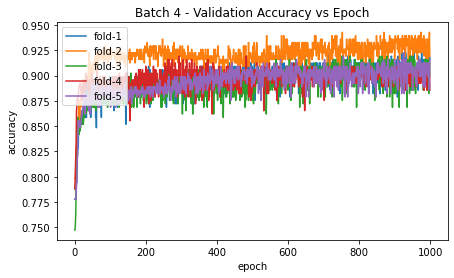

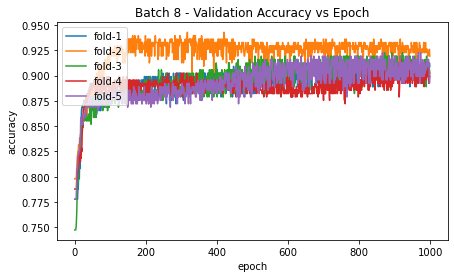

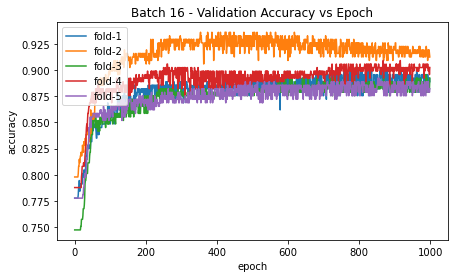

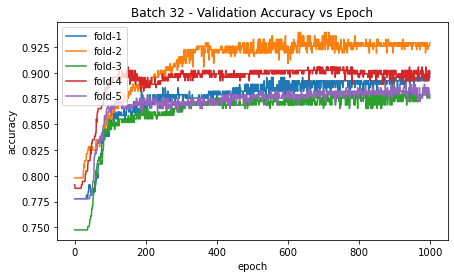

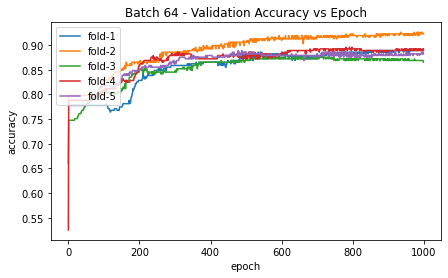

In [24]:
plt.figure(figsize=(7,4))
plt.plot(histories['batch-4-fold-0'].history['val_accuracy'])
plt.plot(histories['batch-4-fold-1'].history['val_accuracy'])
plt.plot(histories['batch-4-fold-2'].history['val_accuracy'])
plt.plot(histories['batch-4-fold-3'].history['val_accuracy'])
plt.plot(histories['batch-4-fold-4'].history['val_accuracy'])
plt.title('Batch 4 - Validation Accuracy vs Epoch')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['fold-1','fold-2','fold-3','fold-4','fold-5'], loc='upper left')
plt.show()

plt.figure(figsize=(7,4))
plt.plot(histories['batch-8-fold-0'].history['val_accuracy'])
plt.plot(histories['batch-8-fold-1'].history['val_accuracy'])
plt.plot(histories['batch-8-fold-2'].history['val_accuracy'])
plt.plot(histories['batch-8-fold-3'].history['val_accuracy'])
plt.plot(histories['batch-8-fold-4'].history['val_accuracy'])
plt.title('Batch 8 - Validation Accuracy vs Epoch')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['fold-1','fold-2','fold-3','fold-4','fold-5'], loc='upper left')
plt.show()

plt.figure(figsize=(7,4))
plt.plot(histories['batch-16-fold-0'].history['val_accuracy'])
plt.plot(histories['batch-16-fold-1'].history['val_accuracy'])
plt.plot(histories['batch-16-fold-2'].history['val_accuracy'])
plt.plot(histories['batch-16-fold-3'].history['val_accuracy'])
plt.plot(histories['batch-16-fold-4'].history['val_accuracy'])
plt.title('Batch 16 - Validation Accuracy vs Epoch')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['fold-1','fold-2','fold-3','fold-4','fold-5'], loc='upper left')
plt.show()

plt.figure(figsize=(7,4))
plt.plot(histories['batch-32-fold-0'].history['val_accuracy'])
plt.plot(histories['batch-32-fold-1'].history['val_accuracy'])
plt.plot(histories['batch-32-fold-2'].history['val_accuracy'])
plt.plot(histories['batch-32-fold-3'].history['val_accuracy'])
plt.plot(histories['batch-32-fold-4'].history['val_accuracy'])
plt.title('Batch 32 - Validation Accuracy vs Epoch')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['fold-1','fold-2','fold-3','fold-4','fold-5'], loc='upper left')
plt.show()

plt.figure(figsize=(7,4))
plt.plot(histories['batch-64-fold-0'].history['val_accuracy'])
plt.plot(histories['batch-64-fold-1'].history['val_accuracy'])
plt.plot(histories['batch-64-fold-2'].history['val_accuracy'])
plt.plot(histories['batch-64-fold-3'].history['val_accuracy'])
plt.plot(histories['batch-64-fold-4'].history['val_accuracy'])
plt.title('Batch 64 - Validation Accuracy vs Epoch')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['fold-1','fold-2','fold-3','fold-4','fold-5'], loc='upper left')
plt.show()

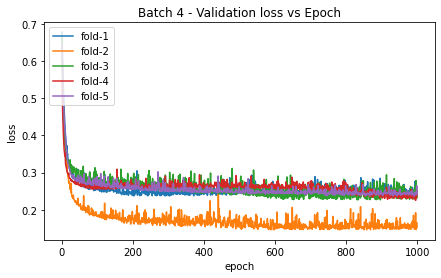

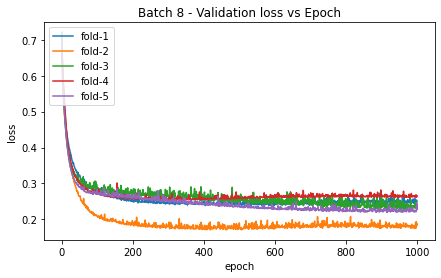

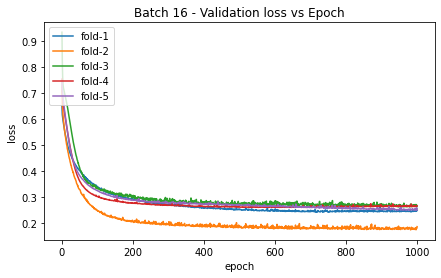

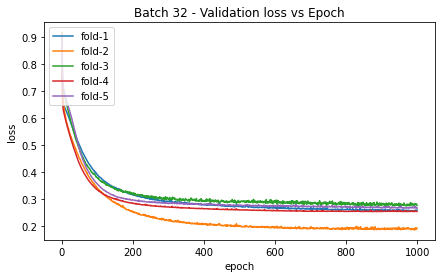

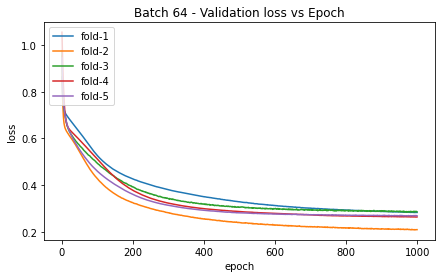

In [25]:
plt.figure(figsize=(7,4))
plt.plot(histories['batch-4-fold-0'].history['val_loss'])
plt.plot(histories['batch-4-fold-1'].history['val_loss'])
plt.plot(histories['batch-4-fold-2'].history['val_loss'])
plt.plot(histories['batch-4-fold-3'].history['val_loss'])
plt.plot(histories['batch-4-fold-4'].history['val_loss'])
plt.title('Batch 4 - Validation loss vs Epoch')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['fold-1','fold-2','fold-3','fold-4','fold-5'], loc='upper left')
plt.show()

plt.figure(figsize=(7,4))
plt.plot(histories['batch-8-fold-0'].history['val_loss'])
plt.plot(histories['batch-8-fold-1'].history['val_loss'])
plt.plot(histories['batch-8-fold-2'].history['val_loss'])
plt.plot(histories['batch-8-fold-3'].history['val_loss'])
plt.plot(histories['batch-8-fold-4'].history['val_loss'])
plt.title('Batch 8 - Validation loss vs Epoch')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['fold-1','fold-2','fold-3','fold-4','fold-5'], loc='upper left')
plt.show()

plt.figure(figsize=(7,4))
plt.plot(histories['batch-16-fold-0'].history['val_loss'])
plt.plot(histories['batch-16-fold-1'].history['val_loss'])
plt.plot(histories['batch-16-fold-2'].history['val_loss'])
plt.plot(histories['batch-16-fold-3'].history['val_loss'])
plt.plot(histories['batch-16-fold-4'].history['val_loss'])
plt.title('Batch 16 - Validation loss vs Epoch')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['fold-1','fold-2','fold-3','fold-4','fold-5'], loc='upper left')
plt.show()

plt.figure(figsize=(7,4))
plt.plot(histories['batch-32-fold-0'].history['val_loss'])
plt.plot(histories['batch-32-fold-1'].history['val_loss'])
plt.plot(histories['batch-32-fold-2'].history['val_loss'])
plt.plot(histories['batch-32-fold-3'].history['val_loss'])
plt.plot(histories['batch-32-fold-4'].history['val_loss'])
plt.title('Batch 32 - Validation loss vs Epoch')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['fold-1','fold-2','fold-3','fold-4','fold-5'], loc='upper left')
plt.show()

plt.figure(figsize=(7,4))
plt.plot(histories['batch-64-fold-0'].history['val_loss'])
plt.plot(histories['batch-64-fold-1'].history['val_loss'])
plt.plot(histories['batch-64-fold-2'].history['val_loss'])
plt.plot(histories['batch-64-fold-3'].history['val_loss'])
plt.plot(histories['batch-64-fold-4'].history['val_loss'])
plt.title('Batch 64 - Validation loss vs Epoch')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['fold-1','fold-2','fold-3','fold-4','fold-5'], loc='upper left')
plt.show()

Text(0.5, 1.0, 'mean validation accuracy vs. batch size')

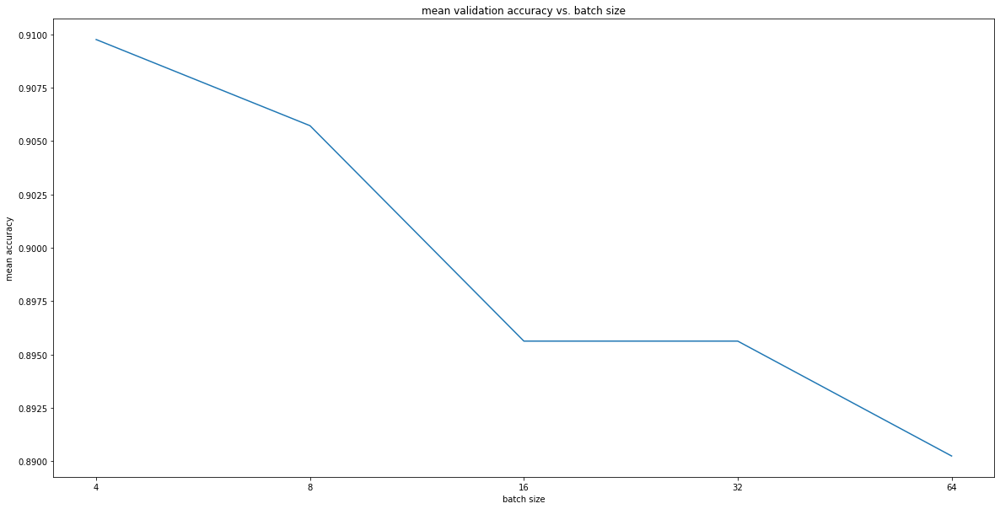

In [26]:
plt.figure(figsize=(20,10))
plt.plot(range(len(batch_sizes)), mean_acc)
plt.xticks(range(len(batch_sizes)), batch_sizes)
plt.xlabel('batch size')
plt.ylabel('mean accuracy')
plt.title('mean validation accuracy vs. batch size')

In [31]:
batch_time 

[0.4964824769496918,
 0.2783592202663422,
 0.12441875505447388,
 0.08339900827407837,
 0.04124730443954468]

Text(0.5, 1.0, 'time for an epoch vs. batch size')

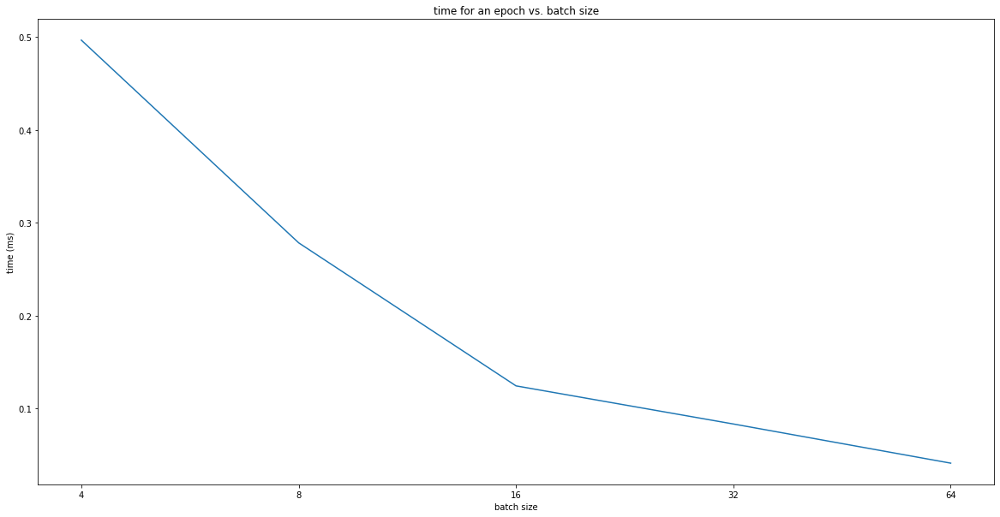

In [32]:
plt.figure(figsize=(20,10))
plt.plot(range(len(batch_sizes)), batch_time)
plt.xticks(range(len(batch_sizes)), batch_sizes)
plt.xlabel('batch size')
plt.ylabel('time (ms)')
plt.title('time for an epoch vs. batch size')

In [29]:
best_acc = mean_acc[0]
index = 0
for i in range(0,len(mean_acc)):
    print("For batch {} mean validation accuracy is: ".format(batch_sizes[i]) + str(mean_acc[i]))
    if(mean_acc[i] > best_acc):
        best_acc = mean_acc[i]
        index = i
print("Best mean validation accuracy: " + str(best_acc) + " from batch size {}".format(batch_sizes[index]))

optimal_batch_size = batch_sizes[index]

For batch 4 mean validation accuracy is: 0.909764289855957
For batch 8 mean validation accuracy is: 0.9057239174842835
For batch 16 mean validation accuracy is: 0.8956228971481324
For batch 32 mean validation accuracy is: 0.8956228971481324
For batch 64 mean validation accuracy is: 0.8902356863021851
Best mean validation accuracy: 0.909764289855957 from batch size 4


In [33]:
l2 = tf.keras.regularizers.l2(l2=1e-6)
# create the model
model = Sequential([
    Dense(num_neurons, activation='relu', kernel_regularizer=l2),
    Dense(NUM_CLASSES, activation='softmax')
])

opt = tf.keras.optimizers.SGD(lr=0.01)

model.compile(optimizer=opt,
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# train the model
histories['qn2'] =model.fit(X_train, Y_train,
                            epochs=epochs,
                            verbose = 2,
                            batch_size = optimal_batch_size,
                            validation_data = (X_test, y_test))

Epoch 1/1000
372/372 - 1s - loss: 0.6763 - accuracy: 0.7782 - val_loss: 0.6230 - val_accuracy: 0.7790
Epoch 2/1000
372/372 - 0s - loss: 0.5888 - accuracy: 0.7782 - val_loss: 0.5545 - val_accuracy: 0.7806
Epoch 3/1000
372/372 - 0s - loss: 0.5293 - accuracy: 0.7836 - val_loss: 0.4974 - val_accuracy: 0.7821
Epoch 4/1000
372/372 - 0s - loss: 0.4799 - accuracy: 0.7903 - val_loss: 0.4533 - val_accuracy: 0.7994
Epoch 5/1000
372/372 - 0s - loss: 0.4425 - accuracy: 0.8172 - val_loss: 0.4191 - val_accuracy: 0.8417
Epoch 6/1000
372/372 - 0s - loss: 0.4117 - accuracy: 0.8367 - val_loss: 0.3912 - val_accuracy: 0.8417
Epoch 7/1000
372/372 - 0s - loss: 0.3884 - accuracy: 0.8481 - val_loss: 0.3692 - val_accuracy: 0.8668
Epoch 8/1000
372/372 - 0s - loss: 0.3708 - accuracy: 0.8501 - val_loss: 0.3520 - val_accuracy: 0.8699
Epoch 9/1000
372/372 - 0s - loss: 0.3553 - accuracy: 0.8602 - val_loss: 0.3360 - val_accuracy: 0.8699
Epoch 10/1000
372/372 - 0s - loss: 0.3429 - accuracy: 0.8649 - val_loss: 0.3274 - 

Epoch 81/1000
372/372 - 0s - loss: 0.2228 - accuracy: 0.9046 - val_loss: 0.2510 - val_accuracy: 0.8934
Epoch 82/1000
372/372 - 0s - loss: 0.2250 - accuracy: 0.9019 - val_loss: 0.2436 - val_accuracy: 0.9013
Epoch 83/1000
372/372 - 0s - loss: 0.2247 - accuracy: 0.8985 - val_loss: 0.2461 - val_accuracy: 0.8966
Epoch 84/1000
372/372 - 0s - loss: 0.2244 - accuracy: 0.9026 - val_loss: 0.2401 - val_accuracy: 0.9044
Epoch 85/1000
372/372 - 0s - loss: 0.2229 - accuracy: 0.8999 - val_loss: 0.2426 - val_accuracy: 0.8997
Epoch 86/1000
372/372 - 0s - loss: 0.2248 - accuracy: 0.9039 - val_loss: 0.2384 - val_accuracy: 0.9075
Epoch 87/1000
372/372 - 0s - loss: 0.2223 - accuracy: 0.9026 - val_loss: 0.2412 - val_accuracy: 0.8997
Epoch 88/1000
372/372 - 0s - loss: 0.2237 - accuracy: 0.9019 - val_loss: 0.2361 - val_accuracy: 0.9138
Epoch 89/1000
372/372 - 0s - loss: 0.2228 - accuracy: 0.9052 - val_loss: 0.2355 - val_accuracy: 0.9091
Epoch 90/1000
372/372 - 0s - loss: 0.2199 - accuracy: 0.9039 - val_loss: 

Epoch 160/1000
372/372 - 0s - loss: 0.2052 - accuracy: 0.9086 - val_loss: 0.2295 - val_accuracy: 0.9122
Epoch 161/1000
372/372 - 0s - loss: 0.2047 - accuracy: 0.9093 - val_loss: 0.2425 - val_accuracy: 0.8966
Epoch 162/1000
372/372 - 0s - loss: 0.2024 - accuracy: 0.9113 - val_loss: 0.2305 - val_accuracy: 0.9138
Epoch 163/1000
372/372 - 1s - loss: 0.2033 - accuracy: 0.9093 - val_loss: 0.2255 - val_accuracy: 0.9154
Epoch 164/1000
372/372 - 1s - loss: 0.2009 - accuracy: 0.9099 - val_loss: 0.2607 - val_accuracy: 0.8856
Epoch 165/1000
372/372 - 0s - loss: 0.2052 - accuracy: 0.9093 - val_loss: 0.2310 - val_accuracy: 0.9091
Epoch 166/1000
372/372 - 0s - loss: 0.2041 - accuracy: 0.9046 - val_loss: 0.2358 - val_accuracy: 0.9060
Epoch 167/1000
372/372 - 0s - loss: 0.2037 - accuracy: 0.9073 - val_loss: 0.2392 - val_accuracy: 0.9075
Epoch 168/1000
372/372 - 0s - loss: 0.2029 - accuracy: 0.9133 - val_loss: 0.2271 - val_accuracy: 0.9154
Epoch 169/1000
372/372 - 1s - loss: 0.2009 - accuracy: 0.9120 - 

Epoch 239/1000
372/372 - 1s - loss: 0.1928 - accuracy: 0.9120 - val_loss: 0.2398 - val_accuracy: 0.9044
Epoch 240/1000
372/372 - 1s - loss: 0.1927 - accuracy: 0.9066 - val_loss: 0.2276 - val_accuracy: 0.8981
Epoch 241/1000
372/372 - 1s - loss: 0.1935 - accuracy: 0.9180 - val_loss: 0.2386 - val_accuracy: 0.9044
Epoch 242/1000
372/372 - 1s - loss: 0.1918 - accuracy: 0.9120 - val_loss: 0.2416 - val_accuracy: 0.8934
Epoch 243/1000
372/372 - 1s - loss: 0.1930 - accuracy: 0.9106 - val_loss: 0.2316 - val_accuracy: 0.9028
Epoch 244/1000
372/372 - 1s - loss: 0.1928 - accuracy: 0.9147 - val_loss: 0.2285 - val_accuracy: 0.8997
Epoch 245/1000
372/372 - 1s - loss: 0.1906 - accuracy: 0.9147 - val_loss: 0.2300 - val_accuracy: 0.9028
Epoch 246/1000
372/372 - 1s - loss: 0.1920 - accuracy: 0.9086 - val_loss: 0.2251 - val_accuracy: 0.9169
Epoch 247/1000
372/372 - 1s - loss: 0.1933 - accuracy: 0.9173 - val_loss: 0.2280 - val_accuracy: 0.9075
Epoch 248/1000
372/372 - 1s - loss: 0.1874 - accuracy: 0.9133 - 

Epoch 318/1000
372/372 - 1s - loss: 0.1852 - accuracy: 0.9214 - val_loss: 0.2205 - val_accuracy: 0.9185
Epoch 319/1000
372/372 - 1s - loss: 0.1863 - accuracy: 0.9153 - val_loss: 0.2191 - val_accuracy: 0.9122
Epoch 320/1000
372/372 - 1s - loss: 0.1858 - accuracy: 0.9194 - val_loss: 0.2475 - val_accuracy: 0.9013
Epoch 321/1000
372/372 - 1s - loss: 0.1869 - accuracy: 0.9140 - val_loss: 0.2358 - val_accuracy: 0.8981
Epoch 322/1000
372/372 - 1s - loss: 0.1836 - accuracy: 0.9167 - val_loss: 0.2450 - val_accuracy: 0.8918
Epoch 323/1000
372/372 - 1s - loss: 0.1870 - accuracy: 0.9187 - val_loss: 0.2357 - val_accuracy: 0.9013
Epoch 324/1000
372/372 - 1s - loss: 0.1832 - accuracy: 0.9220 - val_loss: 0.2245 - val_accuracy: 0.9075
Epoch 325/1000
372/372 - 1s - loss: 0.1844 - accuracy: 0.9234 - val_loss: 0.2325 - val_accuracy: 0.9013
Epoch 326/1000
372/372 - 1s - loss: 0.1848 - accuracy: 0.9120 - val_loss: 0.2445 - val_accuracy: 0.8950
Epoch 327/1000
372/372 - 1s - loss: 0.1846 - accuracy: 0.9194 - 

Epoch 397/1000
372/372 - 1s - loss: 0.1790 - accuracy: 0.9247 - val_loss: 0.2258 - val_accuracy: 0.9138
Epoch 398/1000
372/372 - 1s - loss: 0.1800 - accuracy: 0.9234 - val_loss: 0.2258 - val_accuracy: 0.9091
Epoch 399/1000
372/372 - 1s - loss: 0.1794 - accuracy: 0.9267 - val_loss: 0.2254 - val_accuracy: 0.9091
Epoch 400/1000
372/372 - 1s - loss: 0.1804 - accuracy: 0.9173 - val_loss: 0.2250 - val_accuracy: 0.9122
Epoch 401/1000
372/372 - 1s - loss: 0.1794 - accuracy: 0.9187 - val_loss: 0.2290 - val_accuracy: 0.9075
Epoch 402/1000
372/372 - 1s - loss: 0.1810 - accuracy: 0.9200 - val_loss: 0.2234 - val_accuracy: 0.9138
Epoch 403/1000
372/372 - 1s - loss: 0.1807 - accuracy: 0.9200 - val_loss: 0.2285 - val_accuracy: 0.9138
Epoch 404/1000
372/372 - 1s - loss: 0.1784 - accuracy: 0.9247 - val_loss: 0.2250 - val_accuracy: 0.9185
Epoch 405/1000
372/372 - 1s - loss: 0.1760 - accuracy: 0.9227 - val_loss: 0.2650 - val_accuracy: 0.8950
Epoch 406/1000
372/372 - 1s - loss: 0.1794 - accuracy: 0.9234 - 

Epoch 476/1000
372/372 - 1s - loss: 0.1734 - accuracy: 0.9207 - val_loss: 0.2522 - val_accuracy: 0.8966
Epoch 477/1000
372/372 - 1s - loss: 0.1746 - accuracy: 0.9227 - val_loss: 0.2217 - val_accuracy: 0.9169
Epoch 478/1000
372/372 - 1s - loss: 0.1739 - accuracy: 0.9261 - val_loss: 0.2224 - val_accuracy: 0.9107
Epoch 479/1000
372/372 - 1s - loss: 0.1747 - accuracy: 0.9281 - val_loss: 0.2305 - val_accuracy: 0.9122
Epoch 480/1000
372/372 - 1s - loss: 0.1752 - accuracy: 0.9180 - val_loss: 0.2259 - val_accuracy: 0.9107
Epoch 481/1000
372/372 - 1s - loss: 0.1756 - accuracy: 0.9254 - val_loss: 0.2334 - val_accuracy: 0.9044
Epoch 482/1000
372/372 - 1s - loss: 0.1741 - accuracy: 0.9254 - val_loss: 0.2227 - val_accuracy: 0.9060
Epoch 483/1000
372/372 - 1s - loss: 0.1732 - accuracy: 0.9261 - val_loss: 0.2267 - val_accuracy: 0.9075
Epoch 484/1000
372/372 - 1s - loss: 0.1746 - accuracy: 0.9220 - val_loss: 0.2286 - val_accuracy: 0.9060
Epoch 485/1000
372/372 - 1s - loss: 0.1764 - accuracy: 0.9247 - 

Epoch 555/1000
372/372 - 1s - loss: 0.1705 - accuracy: 0.9241 - val_loss: 0.2416 - val_accuracy: 0.9044
Epoch 556/1000
372/372 - 1s - loss: 0.1703 - accuracy: 0.9281 - val_loss: 0.2346 - val_accuracy: 0.9185
Epoch 557/1000
372/372 - 1s - loss: 0.1714 - accuracy: 0.9274 - val_loss: 0.2281 - val_accuracy: 0.9091
Epoch 558/1000
372/372 - 1s - loss: 0.1700 - accuracy: 0.9227 - val_loss: 0.2359 - val_accuracy: 0.9028
Epoch 559/1000
372/372 - 1s - loss: 0.1673 - accuracy: 0.9308 - val_loss: 0.2262 - val_accuracy: 0.9107
Epoch 560/1000
372/372 - 1s - loss: 0.1711 - accuracy: 0.9308 - val_loss: 0.2265 - val_accuracy: 0.9138
Epoch 561/1000
372/372 - 1s - loss: 0.1693 - accuracy: 0.9274 - val_loss: 0.2410 - val_accuracy: 0.9013
Epoch 562/1000
372/372 - 1s - loss: 0.1694 - accuracy: 0.9274 - val_loss: 0.2267 - val_accuracy: 0.9122
Epoch 563/1000
372/372 - 1s - loss: 0.1697 - accuracy: 0.9294 - val_loss: 0.2299 - val_accuracy: 0.9107
Epoch 564/1000
372/372 - 1s - loss: 0.1699 - accuracy: 0.9267 - 

Epoch 634/1000
372/372 - 1s - loss: 0.1663 - accuracy: 0.9315 - val_loss: 0.2308 - val_accuracy: 0.9107
Epoch 635/1000
372/372 - 1s - loss: 0.1658 - accuracy: 0.9301 - val_loss: 0.2272 - val_accuracy: 0.9138
Epoch 636/1000
372/372 - 1s - loss: 0.1663 - accuracy: 0.9281 - val_loss: 0.2387 - val_accuracy: 0.9185
Epoch 637/1000
372/372 - 1s - loss: 0.1678 - accuracy: 0.9294 - val_loss: 0.2341 - val_accuracy: 0.9060
Epoch 638/1000
372/372 - 1s - loss: 0.1657 - accuracy: 0.9301 - val_loss: 0.2326 - val_accuracy: 0.9091
Epoch 639/1000
372/372 - 1s - loss: 0.1636 - accuracy: 0.9375 - val_loss: 0.2357 - val_accuracy: 0.9201
Epoch 640/1000
372/372 - 1s - loss: 0.1672 - accuracy: 0.9321 - val_loss: 0.2421 - val_accuracy: 0.9060
Epoch 641/1000
372/372 - 1s - loss: 0.1681 - accuracy: 0.9315 - val_loss: 0.2312 - val_accuracy: 0.9122
Epoch 642/1000
372/372 - 1s - loss: 0.1657 - accuracy: 0.9294 - val_loss: 0.2443 - val_accuracy: 0.9013
Epoch 643/1000
372/372 - 1s - loss: 0.1661 - accuracy: 0.9308 - 

Epoch 713/1000
372/372 - 1s - loss: 0.1623 - accuracy: 0.9328 - val_loss: 0.2606 - val_accuracy: 0.8997
Epoch 714/1000
372/372 - 1s - loss: 0.1596 - accuracy: 0.9348 - val_loss: 0.2436 - val_accuracy: 0.8997
Epoch 715/1000
372/372 - 1s - loss: 0.1630 - accuracy: 0.9348 - val_loss: 0.2450 - val_accuracy: 0.9028
Epoch 716/1000
372/372 - 1s - loss: 0.1634 - accuracy: 0.9315 - val_loss: 0.2275 - val_accuracy: 0.9091
Epoch 717/1000
372/372 - 1s - loss: 0.1654 - accuracy: 0.9288 - val_loss: 0.2326 - val_accuracy: 0.9075
Epoch 718/1000
372/372 - 1s - loss: 0.1654 - accuracy: 0.9328 - val_loss: 0.2390 - val_accuracy: 0.9044
Epoch 719/1000
372/372 - 1s - loss: 0.1654 - accuracy: 0.9281 - val_loss: 0.2284 - val_accuracy: 0.9138
Epoch 720/1000
372/372 - 1s - loss: 0.1654 - accuracy: 0.9281 - val_loss: 0.2261 - val_accuracy: 0.9107
Epoch 721/1000
372/372 - 1s - loss: 0.1632 - accuracy: 0.9335 - val_loss: 0.2308 - val_accuracy: 0.9122
Epoch 722/1000
372/372 - 1s - loss: 0.1606 - accuracy: 0.9348 - 

Epoch 792/1000
372/372 - 1s - loss: 0.1615 - accuracy: 0.9267 - val_loss: 0.2292 - val_accuracy: 0.9138
Epoch 793/1000
372/372 - 1s - loss: 0.1598 - accuracy: 0.9362 - val_loss: 0.2369 - val_accuracy: 0.9107
Epoch 794/1000
372/372 - 1s - loss: 0.1595 - accuracy: 0.9375 - val_loss: 0.2494 - val_accuracy: 0.9044
Epoch 795/1000
372/372 - 1s - loss: 0.1626 - accuracy: 0.9382 - val_loss: 0.2459 - val_accuracy: 0.9060
Epoch 796/1000
372/372 - 1s - loss: 0.1597 - accuracy: 0.9362 - val_loss: 0.2293 - val_accuracy: 0.9169
Epoch 797/1000
372/372 - 1s - loss: 0.1622 - accuracy: 0.9328 - val_loss: 0.2269 - val_accuracy: 0.9201
Epoch 798/1000
372/372 - 1s - loss: 0.1623 - accuracy: 0.9348 - val_loss: 0.2510 - val_accuracy: 0.8997
Epoch 799/1000
372/372 - 1s - loss: 0.1634 - accuracy: 0.9315 - val_loss: 0.2326 - val_accuracy: 0.9107
Epoch 800/1000
372/372 - 1s - loss: 0.1600 - accuracy: 0.9348 - val_loss: 0.2336 - val_accuracy: 0.9169
Epoch 801/1000
372/372 - 1s - loss: 0.1600 - accuracy: 0.9301 - 

Epoch 871/1000
372/372 - 1s - loss: 0.1562 - accuracy: 0.9328 - val_loss: 0.2349 - val_accuracy: 0.9107
Epoch 872/1000
372/372 - 1s - loss: 0.1586 - accuracy: 0.9328 - val_loss: 0.2321 - val_accuracy: 0.9138
Epoch 873/1000
372/372 - 1s - loss: 0.1595 - accuracy: 0.9335 - val_loss: 0.2559 - val_accuracy: 0.9044
Epoch 874/1000
372/372 - 1s - loss: 0.1606 - accuracy: 0.9375 - val_loss: 0.2349 - val_accuracy: 0.9154
Epoch 875/1000
372/372 - 1s - loss: 0.1569 - accuracy: 0.9362 - val_loss: 0.2423 - val_accuracy: 0.9091
Epoch 876/1000
372/372 - 1s - loss: 0.1595 - accuracy: 0.9368 - val_loss: 0.2343 - val_accuracy: 0.9107
Epoch 877/1000
372/372 - 1s - loss: 0.1593 - accuracy: 0.9355 - val_loss: 0.2520 - val_accuracy: 0.9091
Epoch 878/1000
372/372 - 1s - loss: 0.1605 - accuracy: 0.9341 - val_loss: 0.2314 - val_accuracy: 0.9169
Epoch 879/1000
372/372 - 1s - loss: 0.1589 - accuracy: 0.9382 - val_loss: 0.2475 - val_accuracy: 0.9060
Epoch 880/1000
372/372 - 1s - loss: 0.1585 - accuracy: 0.9335 - 

Epoch 950/1000
372/372 - 1s - loss: 0.1599 - accuracy: 0.9362 - val_loss: 0.2410 - val_accuracy: 0.9091
Epoch 951/1000
372/372 - 1s - loss: 0.1564 - accuracy: 0.9341 - val_loss: 0.2304 - val_accuracy: 0.9201
Epoch 952/1000
372/372 - 1s - loss: 0.1571 - accuracy: 0.9409 - val_loss: 0.2428 - val_accuracy: 0.9107
Epoch 953/1000
372/372 - 1s - loss: 0.1561 - accuracy: 0.9341 - val_loss: 0.2572 - val_accuracy: 0.9060
Epoch 954/1000
372/372 - 1s - loss: 0.1563 - accuracy: 0.9355 - val_loss: 0.2327 - val_accuracy: 0.9169
Epoch 955/1000
372/372 - 1s - loss: 0.1577 - accuracy: 0.9341 - val_loss: 0.2402 - val_accuracy: 0.9013
Epoch 956/1000
372/372 - 1s - loss: 0.1543 - accuracy: 0.9355 - val_loss: 0.2406 - val_accuracy: 0.9138
Epoch 957/1000
372/372 - 1s - loss: 0.1582 - accuracy: 0.9328 - val_loss: 0.2471 - val_accuracy: 0.9138
Epoch 958/1000
372/372 - 1s - loss: 0.1583 - accuracy: 0.9348 - val_loss: 0.2304 - val_accuracy: 0.9185
Epoch 959/1000
372/372 - 1s - loss: 0.1597 - accuracy: 0.9362 - 

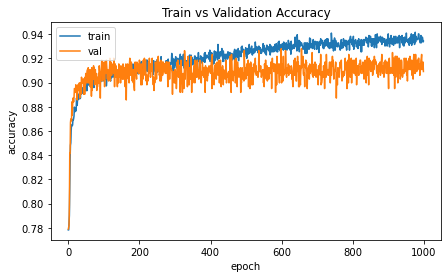

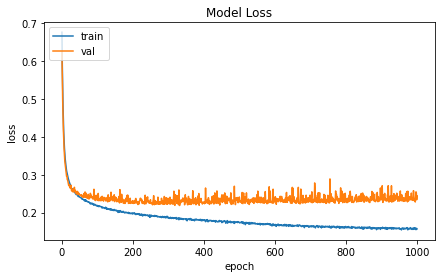

In [34]:
plt.figure(figsize=(7,4))
plt.plot(histories['qn2'].history['accuracy'])
plt.plot(histories['qn2'].history['val_accuracy'])
plt.title('Train vs Validation Accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

plt.figure(figsize=(7,4))
plt.plot(histories['qn2'].history['loss'])
plt.plot(histories['qn2'].history['val_loss'])
plt.title('Model Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

## Part A - Question 3

In [35]:
NUM_CLASSES = 3

epochs = 1000
batch_size = 4
no_folds = 5

In [55]:
no_data = len(X_train)
idx = np.arange(no_data)
np.random.shuffle(idx)
X_train, Y_train = X_train[idx], Y_train[idx]
nf = no_data//no_folds

print(nf)

297


In [36]:
models = []
mean_acc = []
neuron_acc = []
histories = {}
neurons = [5,10,15,20,25]

for neuron in neurons:
    for fold in range(no_folds):
        start, end = fold*nf, (fold+1)*nf
        x_val, y_val = X_train[start:end], Y_train[start:end]
        x_train  = np.append(X_train[:start], X_train[end:], axis=0)
        y_train = np.append(Y_train[:start], Y_train[end:], axis=0) 
        
        print("{} neurons and fold {}".format(neuron,fold))
        
        l2 = tf.keras.regularizers.l2(l2=1e-6)

        model = Sequential([
            Dense(neuron, activation='relu', kernel_regularizer=l2),
            Dense(NUM_CLASSES, activation='softmax')])
        
        opt = tf.keras.optimizers.SGD(lr=0.01)

        model.compile(optimizer= opt, 
                      loss='sparse_categorical_crossentropy',
                      metrics=['accuracy'])

        histories['neurons-{}-fold-{}'.format(neuron,fold)] = model.fit(x_train, y_train,
                        epochs=epochs,
                        verbose=2,
                        batch_size=batch_size,
                        validation_data=(x_val, y_val))

        neuron_acc.append(histories['neurons-{}-fold-{}'.format(neuron,fold)].history['val_accuracy'][epochs-1])
        
        models.append(model)
            
        print('fold %d test accuracy %g'%(fold, neuron_acc[fold]))

    for fold in range(no_folds):
        print('fold %d test accuracy %g'%(fold, neuron_acc[fold]))
    print('* mean accuracy = %g *'% np.mean(neuron_acc))
    mean_acc.append(np.mean(neuron_acc))
    neuron_acc = []

5 neurons and fold 0
Epoch 1/1000
298/298 - 1s - loss: 0.7594 - accuracy: 0.7683 - val_loss: 0.6621 - val_accuracy: 0.7778
Epoch 2/1000
298/298 - 0s - loss: 0.6548 - accuracy: 0.7783 - val_loss: 0.6403 - val_accuracy: 0.7778
Epoch 3/1000
298/298 - 0s - loss: 0.6305 - accuracy: 0.7783 - val_loss: 0.6164 - val_accuracy: 0.7778
Epoch 4/1000
298/298 - 0s - loss: 0.6040 - accuracy: 0.7783 - val_loss: 0.5894 - val_accuracy: 0.7778
Epoch 5/1000
298/298 - 0s - loss: 0.5733 - accuracy: 0.7783 - val_loss: 0.5549 - val_accuracy: 0.7778
Epoch 6/1000
298/298 - 0s - loss: 0.5389 - accuracy: 0.7817 - val_loss: 0.5228 - val_accuracy: 0.7811
Epoch 7/1000
298/298 - 0s - loss: 0.5076 - accuracy: 0.7851 - val_loss: 0.4928 - val_accuracy: 0.7946
Epoch 8/1000
298/298 - 0s - loss: 0.4771 - accuracy: 0.7926 - val_loss: 0.4677 - val_accuracy: 0.8013
Epoch 9/1000
298/298 - 0s - loss: 0.4532 - accuracy: 0.8010 - val_loss: 0.4464 - val_accuracy: 0.8081
Epoch 10/1000
298/298 - 0s - loss: 0.4316 - accuracy: 0.8102 

Epoch 81/1000
298/298 - 0s - loss: 0.2400 - accuracy: 0.8984 - val_loss: 0.2716 - val_accuracy: 0.8822
Epoch 82/1000
298/298 - 0s - loss: 0.2372 - accuracy: 0.8925 - val_loss: 0.2728 - val_accuracy: 0.8754
Epoch 83/1000
298/298 - 0s - loss: 0.2373 - accuracy: 0.9009 - val_loss: 0.2708 - val_accuracy: 0.8822
Epoch 84/1000
298/298 - 0s - loss: 0.2389 - accuracy: 0.8984 - val_loss: 0.2835 - val_accuracy: 0.8687
Epoch 85/1000
298/298 - 0s - loss: 0.2375 - accuracy: 0.8976 - val_loss: 0.2708 - val_accuracy: 0.8855
Epoch 86/1000
298/298 - 0s - loss: 0.2339 - accuracy: 0.9034 - val_loss: 0.2773 - val_accuracy: 0.8687
Epoch 87/1000
298/298 - 0s - loss: 0.2384 - accuracy: 0.8942 - val_loss: 0.2702 - val_accuracy: 0.8855
Epoch 88/1000
298/298 - 0s - loss: 0.2368 - accuracy: 0.8992 - val_loss: 0.2756 - val_accuracy: 0.8687
Epoch 89/1000
298/298 - 0s - loss: 0.2346 - accuracy: 0.8967 - val_loss: 0.2733 - val_accuracy: 0.8721
Epoch 90/1000
298/298 - 0s - loss: 0.2342 - accuracy: 0.9009 - val_loss: 

Epoch 160/1000
298/298 - 0s - loss: 0.2202 - accuracy: 0.9093 - val_loss: 0.2551 - val_accuracy: 0.8855
Epoch 161/1000
298/298 - 0s - loss: 0.2184 - accuracy: 0.9026 - val_loss: 0.2531 - val_accuracy: 0.8855
Epoch 162/1000
298/298 - 0s - loss: 0.2187 - accuracy: 0.9102 - val_loss: 0.2618 - val_accuracy: 0.8788
Epoch 163/1000
298/298 - 0s - loss: 0.2174 - accuracy: 0.9068 - val_loss: 0.2741 - val_accuracy: 0.8721
Epoch 164/1000
298/298 - 0s - loss: 0.2171 - accuracy: 0.9085 - val_loss: 0.2578 - val_accuracy: 0.8855
Epoch 165/1000
298/298 - 0s - loss: 0.2157 - accuracy: 0.9076 - val_loss: 0.2574 - val_accuracy: 0.8788
Epoch 166/1000
298/298 - 0s - loss: 0.2170 - accuracy: 0.9110 - val_loss: 0.2533 - val_accuracy: 0.8889
Epoch 167/1000
298/298 - 0s - loss: 0.2164 - accuracy: 0.9018 - val_loss: 0.2519 - val_accuracy: 0.8889
Epoch 168/1000
298/298 - 0s - loss: 0.2175 - accuracy: 0.9026 - val_loss: 0.2605 - val_accuracy: 0.8822
Epoch 169/1000
298/298 - 0s - loss: 0.2172 - accuracy: 0.9110 - 

Epoch 239/1000
298/298 - 1s - loss: 0.2068 - accuracy: 0.9110 - val_loss: 0.2487 - val_accuracy: 0.8923
Epoch 240/1000
298/298 - 1s - loss: 0.2059 - accuracy: 0.9160 - val_loss: 0.2543 - val_accuracy: 0.8923
Epoch 241/1000
298/298 - 1s - loss: 0.2046 - accuracy: 0.9118 - val_loss: 0.2535 - val_accuracy: 0.8956
Epoch 242/1000
298/298 - 1s - loss: 0.2062 - accuracy: 0.9102 - val_loss: 0.2456 - val_accuracy: 0.8889
Epoch 243/1000
298/298 - 1s - loss: 0.2051 - accuracy: 0.9135 - val_loss: 0.2561 - val_accuracy: 0.8956
Epoch 244/1000
298/298 - 1s - loss: 0.2039 - accuracy: 0.9102 - val_loss: 0.2465 - val_accuracy: 0.8923
Epoch 245/1000
298/298 - 1s - loss: 0.2043 - accuracy: 0.9127 - val_loss: 0.2572 - val_accuracy: 0.8855
Epoch 246/1000
298/298 - 1s - loss: 0.2028 - accuracy: 0.9135 - val_loss: 0.2514 - val_accuracy: 0.8956
Epoch 247/1000
298/298 - 1s - loss: 0.2059 - accuracy: 0.9144 - val_loss: 0.2509 - val_accuracy: 0.8990
Epoch 248/1000
298/298 - 1s - loss: 0.2024 - accuracy: 0.9127 - 

Epoch 318/1000
298/298 - 1s - loss: 0.1973 - accuracy: 0.9144 - val_loss: 0.2520 - val_accuracy: 0.8822
Epoch 319/1000
298/298 - 1s - loss: 0.1960 - accuracy: 0.9194 - val_loss: 0.2370 - val_accuracy: 0.8923
Epoch 320/1000
298/298 - 1s - loss: 0.1963 - accuracy: 0.9135 - val_loss: 0.2456 - val_accuracy: 0.8855
Epoch 321/1000
298/298 - 1s - loss: 0.1962 - accuracy: 0.9152 - val_loss: 0.2408 - val_accuracy: 0.8889
Epoch 322/1000
298/298 - 1s - loss: 0.1952 - accuracy: 0.9169 - val_loss: 0.2503 - val_accuracy: 0.8889
Epoch 323/1000
298/298 - 1s - loss: 0.1959 - accuracy: 0.9219 - val_loss: 0.2403 - val_accuracy: 0.8956
Epoch 324/1000
298/298 - 1s - loss: 0.1947 - accuracy: 0.9169 - val_loss: 0.2460 - val_accuracy: 0.8990
Epoch 325/1000
298/298 - 1s - loss: 0.1951 - accuracy: 0.9160 - val_loss: 0.2405 - val_accuracy: 0.8889
Epoch 326/1000
298/298 - 1s - loss: 0.1945 - accuracy: 0.9152 - val_loss: 0.2393 - val_accuracy: 0.8956
Epoch 327/1000
298/298 - 1s - loss: 0.1928 - accuracy: 0.9219 - 

Epoch 397/1000
298/298 - 1s - loss: 0.1886 - accuracy: 0.9211 - val_loss: 0.2402 - val_accuracy: 0.8990
Epoch 398/1000
298/298 - 1s - loss: 0.1891 - accuracy: 0.9228 - val_loss: 0.2294 - val_accuracy: 0.8923
Epoch 399/1000
298/298 - 1s - loss: 0.1855 - accuracy: 0.9278 - val_loss: 0.2477 - val_accuracy: 0.9024
Epoch 400/1000
298/298 - 1s - loss: 0.1885 - accuracy: 0.9177 - val_loss: 0.2317 - val_accuracy: 0.8889
Epoch 401/1000
298/298 - 1s - loss: 0.1855 - accuracy: 0.9186 - val_loss: 0.2405 - val_accuracy: 0.8923
Epoch 402/1000
298/298 - 1s - loss: 0.1860 - accuracy: 0.9219 - val_loss: 0.2461 - val_accuracy: 0.8990
Epoch 403/1000
298/298 - 1s - loss: 0.1862 - accuracy: 0.9194 - val_loss: 0.2402 - val_accuracy: 0.8956
Epoch 404/1000
298/298 - 1s - loss: 0.1845 - accuracy: 0.9194 - val_loss: 0.2270 - val_accuracy: 0.8956
Epoch 405/1000
298/298 - 1s - loss: 0.1855 - accuracy: 0.9202 - val_loss: 0.2409 - val_accuracy: 0.8990
Epoch 406/1000
298/298 - 1s - loss: 0.1860 - accuracy: 0.9244 - 

Epoch 476/1000
298/298 - 0s - loss: 0.1772 - accuracy: 0.9286 - val_loss: 0.2480 - val_accuracy: 0.8956
Epoch 477/1000
298/298 - 0s - loss: 0.1807 - accuracy: 0.9261 - val_loss: 0.2317 - val_accuracy: 0.8956
Epoch 478/1000
298/298 - 0s - loss: 0.1812 - accuracy: 0.9219 - val_loss: 0.2380 - val_accuracy: 0.8956
Epoch 479/1000
298/298 - 0s - loss: 0.1791 - accuracy: 0.9236 - val_loss: 0.2323 - val_accuracy: 0.8889
Epoch 480/1000
298/298 - 0s - loss: 0.1791 - accuracy: 0.9253 - val_loss: 0.2417 - val_accuracy: 0.8990
Epoch 481/1000
298/298 - 0s - loss: 0.1798 - accuracy: 0.9270 - val_loss: 0.2392 - val_accuracy: 0.8990
Epoch 482/1000
298/298 - 0s - loss: 0.1800 - accuracy: 0.9295 - val_loss: 0.2411 - val_accuracy: 0.8889
Epoch 483/1000
298/298 - 0s - loss: 0.1804 - accuracy: 0.9219 - val_loss: 0.2339 - val_accuracy: 0.9024
Epoch 484/1000
298/298 - 0s - loss: 0.1801 - accuracy: 0.9278 - val_loss: 0.2337 - val_accuracy: 0.8990
Epoch 485/1000
298/298 - 0s - loss: 0.1807 - accuracy: 0.9278 - 

Epoch 555/1000
298/298 - 0s - loss: 0.1759 - accuracy: 0.9270 - val_loss: 0.2308 - val_accuracy: 0.8956
Epoch 556/1000
298/298 - 0s - loss: 0.1760 - accuracy: 0.9270 - val_loss: 0.2440 - val_accuracy: 0.8956
Epoch 557/1000
298/298 - 0s - loss: 0.1759 - accuracy: 0.9303 - val_loss: 0.2385 - val_accuracy: 0.9024
Epoch 558/1000
298/298 - 0s - loss: 0.1770 - accuracy: 0.9295 - val_loss: 0.2374 - val_accuracy: 0.9024
Epoch 559/1000
298/298 - 0s - loss: 0.1755 - accuracy: 0.9270 - val_loss: 0.2341 - val_accuracy: 0.8956
Epoch 560/1000
298/298 - 0s - loss: 0.1772 - accuracy: 0.9219 - val_loss: 0.2361 - val_accuracy: 0.8956
Epoch 561/1000
298/298 - 0s - loss: 0.1765 - accuracy: 0.9202 - val_loss: 0.2412 - val_accuracy: 0.8923
Epoch 562/1000
298/298 - 0s - loss: 0.1776 - accuracy: 0.9295 - val_loss: 0.2372 - val_accuracy: 0.8990
Epoch 563/1000
298/298 - 0s - loss: 0.1757 - accuracy: 0.9236 - val_loss: 0.2340 - val_accuracy: 0.8990
Epoch 564/1000
298/298 - 0s - loss: 0.1748 - accuracy: 0.9303 - 

Epoch 634/1000
298/298 - 0s - loss: 0.1725 - accuracy: 0.9295 - val_loss: 0.2473 - val_accuracy: 0.9057
Epoch 635/1000
298/298 - 0s - loss: 0.1673 - accuracy: 0.9286 - val_loss: 0.2465 - val_accuracy: 0.9024
Epoch 636/1000
298/298 - 0s - loss: 0.1726 - accuracy: 0.9228 - val_loss: 0.2398 - val_accuracy: 0.8990
Epoch 637/1000
298/298 - 0s - loss: 0.1716 - accuracy: 0.9345 - val_loss: 0.2393 - val_accuracy: 0.8956
Epoch 638/1000
298/298 - 0s - loss: 0.1710 - accuracy: 0.9286 - val_loss: 0.2354 - val_accuracy: 0.8956
Epoch 639/1000
298/298 - 0s - loss: 0.1694 - accuracy: 0.9253 - val_loss: 0.2489 - val_accuracy: 0.8889
Epoch 640/1000
298/298 - 0s - loss: 0.1706 - accuracy: 0.9295 - val_loss: 0.2406 - val_accuracy: 0.9057
Epoch 641/1000
298/298 - 0s - loss: 0.1710 - accuracy: 0.9261 - val_loss: 0.2477 - val_accuracy: 0.9057
Epoch 642/1000
298/298 - 0s - loss: 0.1723 - accuracy: 0.9353 - val_loss: 0.2415 - val_accuracy: 0.8956
Epoch 643/1000
298/298 - 0s - loss: 0.1735 - accuracy: 0.9211 - 

Epoch 713/1000
298/298 - 0s - loss: 0.1688 - accuracy: 0.9303 - val_loss: 0.2687 - val_accuracy: 0.9057
Epoch 714/1000
298/298 - 0s - loss: 0.1705 - accuracy: 0.9320 - val_loss: 0.2410 - val_accuracy: 0.9024
Epoch 715/1000
298/298 - 0s - loss: 0.1709 - accuracy: 0.9261 - val_loss: 0.2445 - val_accuracy: 0.9024
Epoch 716/1000
298/298 - 0s - loss: 0.1695 - accuracy: 0.9320 - val_loss: 0.2464 - val_accuracy: 0.9024
Epoch 717/1000
298/298 - 0s - loss: 0.1706 - accuracy: 0.9270 - val_loss: 0.2421 - val_accuracy: 0.8889
Epoch 718/1000
298/298 - 0s - loss: 0.1700 - accuracy: 0.9312 - val_loss: 0.2496 - val_accuracy: 0.9024
Epoch 719/1000
298/298 - 0s - loss: 0.1670 - accuracy: 0.9328 - val_loss: 0.2359 - val_accuracy: 0.8956
Epoch 720/1000
298/298 - 0s - loss: 0.1689 - accuracy: 0.9295 - val_loss: 0.2491 - val_accuracy: 0.8956
Epoch 721/1000
298/298 - 0s - loss: 0.1695 - accuracy: 0.9328 - val_loss: 0.2484 - val_accuracy: 0.8855
Epoch 722/1000
298/298 - 0s - loss: 0.1682 - accuracy: 0.9320 - 

Epoch 792/1000
298/298 - 0s - loss: 0.1673 - accuracy: 0.9312 - val_loss: 0.2462 - val_accuracy: 0.8923
Epoch 793/1000
298/298 - 0s - loss: 0.1676 - accuracy: 0.9270 - val_loss: 0.2516 - val_accuracy: 0.9024
Epoch 794/1000
298/298 - 0s - loss: 0.1677 - accuracy: 0.9303 - val_loss: 0.2529 - val_accuracy: 0.9024
Epoch 795/1000
298/298 - 0s - loss: 0.1692 - accuracy: 0.9303 - val_loss: 0.2568 - val_accuracy: 0.9024
Epoch 796/1000
298/298 - 0s - loss: 0.1692 - accuracy: 0.9303 - val_loss: 0.2486 - val_accuracy: 0.8990
Epoch 797/1000
298/298 - 0s - loss: 0.1682 - accuracy: 0.9295 - val_loss: 0.2597 - val_accuracy: 0.8855
Epoch 798/1000
298/298 - 0s - loss: 0.1657 - accuracy: 0.9387 - val_loss: 0.2442 - val_accuracy: 0.8990
Epoch 799/1000
298/298 - 0s - loss: 0.1647 - accuracy: 0.9286 - val_loss: 0.2542 - val_accuracy: 0.9057
Epoch 800/1000
298/298 - 0s - loss: 0.1676 - accuracy: 0.9295 - val_loss: 0.2516 - val_accuracy: 0.9024
Epoch 801/1000
298/298 - 0s - loss: 0.1682 - accuracy: 0.9328 - 

Epoch 871/1000
298/298 - 0s - loss: 0.1662 - accuracy: 0.9337 - val_loss: 0.2582 - val_accuracy: 0.8956
Epoch 872/1000
298/298 - 0s - loss: 0.1631 - accuracy: 0.9345 - val_loss: 0.2671 - val_accuracy: 0.8889
Epoch 873/1000
298/298 - 0s - loss: 0.1650 - accuracy: 0.9353 - val_loss: 0.2556 - val_accuracy: 0.8889
Epoch 874/1000
298/298 - 0s - loss: 0.1647 - accuracy: 0.9320 - val_loss: 0.2678 - val_accuracy: 0.9024
Epoch 875/1000
298/298 - 0s - loss: 0.1650 - accuracy: 0.9362 - val_loss: 0.2636 - val_accuracy: 0.8956
Epoch 876/1000
298/298 - 0s - loss: 0.1649 - accuracy: 0.9362 - val_loss: 0.2515 - val_accuracy: 0.8990
Epoch 877/1000
298/298 - 0s - loss: 0.1645 - accuracy: 0.9328 - val_loss: 0.2661 - val_accuracy: 0.9024
Epoch 878/1000
298/298 - 0s - loss: 0.1639 - accuracy: 0.9337 - val_loss: 0.2537 - val_accuracy: 0.8956
Epoch 879/1000
298/298 - 0s - loss: 0.1633 - accuracy: 0.9353 - val_loss: 0.2821 - val_accuracy: 0.8990
Epoch 880/1000
298/298 - 0s - loss: 0.1664 - accuracy: 0.9278 - 

Epoch 950/1000
298/298 - 0s - loss: 0.1636 - accuracy: 0.9370 - val_loss: 0.2577 - val_accuracy: 0.8990
Epoch 951/1000
298/298 - 0s - loss: 0.1639 - accuracy: 0.9337 - val_loss: 0.2598 - val_accuracy: 0.8990
Epoch 952/1000
298/298 - 0s - loss: 0.1619 - accuracy: 0.9337 - val_loss: 0.2593 - val_accuracy: 0.8956
Epoch 953/1000
298/298 - 0s - loss: 0.1647 - accuracy: 0.9337 - val_loss: 0.2608 - val_accuracy: 0.8956
Epoch 954/1000
298/298 - 0s - loss: 0.1628 - accuracy: 0.9345 - val_loss: 0.2551 - val_accuracy: 0.8956
Epoch 955/1000
298/298 - 0s - loss: 0.1634 - accuracy: 0.9337 - val_loss: 0.2585 - val_accuracy: 0.8990
Epoch 956/1000
298/298 - 0s - loss: 0.1637 - accuracy: 0.9328 - val_loss: 0.2613 - val_accuracy: 0.9024
Epoch 957/1000
298/298 - 0s - loss: 0.1612 - accuracy: 0.9303 - val_loss: 0.2619 - val_accuracy: 0.8956
Epoch 958/1000
298/298 - 0s - loss: 0.1606 - accuracy: 0.9337 - val_loss: 0.2593 - val_accuracy: 0.8956
Epoch 959/1000
298/298 - 0s - loss: 0.1609 - accuracy: 0.9295 - 

Epoch 29/1000
298/298 - 0s - loss: 0.3131 - accuracy: 0.8707 - val_loss: 0.2792 - val_accuracy: 0.8822
Epoch 30/1000
298/298 - 0s - loss: 0.3084 - accuracy: 0.8749 - val_loss: 0.2696 - val_accuracy: 0.8990
Epoch 31/1000
298/298 - 0s - loss: 0.3083 - accuracy: 0.8690 - val_loss: 0.2763 - val_accuracy: 0.8754
Epoch 32/1000
298/298 - 0s - loss: 0.3044 - accuracy: 0.8774 - val_loss: 0.2649 - val_accuracy: 0.8855
Epoch 33/1000
298/298 - 0s - loss: 0.3018 - accuracy: 0.8707 - val_loss: 0.2793 - val_accuracy: 0.8855
Epoch 34/1000
298/298 - 0s - loss: 0.3007 - accuracy: 0.8783 - val_loss: 0.2636 - val_accuracy: 0.8822
Epoch 35/1000
298/298 - 0s - loss: 0.2980 - accuracy: 0.8757 - val_loss: 0.2594 - val_accuracy: 0.8855
Epoch 36/1000
298/298 - 0s - loss: 0.2965 - accuracy: 0.8749 - val_loss: 0.2619 - val_accuracy: 0.8855
Epoch 37/1000
298/298 - 0s - loss: 0.2948 - accuracy: 0.8749 - val_loss: 0.2533 - val_accuracy: 0.9024
Epoch 38/1000
298/298 - 0s - loss: 0.2926 - accuracy: 0.8833 - val_loss: 

Epoch 109/1000
298/298 - 0s - loss: 0.2443 - accuracy: 0.8976 - val_loss: 0.2071 - val_accuracy: 0.9057
Epoch 110/1000
298/298 - 0s - loss: 0.2416 - accuracy: 0.8984 - val_loss: 0.2073 - val_accuracy: 0.9057
Epoch 111/1000
298/298 - 0s - loss: 0.2399 - accuracy: 0.8942 - val_loss: 0.2047 - val_accuracy: 0.9125
Epoch 112/1000
298/298 - 0s - loss: 0.2398 - accuracy: 0.9001 - val_loss: 0.2147 - val_accuracy: 0.8990
Epoch 113/1000
298/298 - 0s - loss: 0.2415 - accuracy: 0.8959 - val_loss: 0.2024 - val_accuracy: 0.9091
Epoch 114/1000
298/298 - 0s - loss: 0.2418 - accuracy: 0.8992 - val_loss: 0.1977 - val_accuracy: 0.9091
Epoch 115/1000
298/298 - 0s - loss: 0.2408 - accuracy: 0.9018 - val_loss: 0.2092 - val_accuracy: 0.9091
Epoch 116/1000
298/298 - 0s - loss: 0.2406 - accuracy: 0.8967 - val_loss: 0.2012 - val_accuracy: 0.9091
Epoch 117/1000
298/298 - 0s - loss: 0.2401 - accuracy: 0.9026 - val_loss: 0.2072 - val_accuracy: 0.9024
Epoch 118/1000
298/298 - 0s - loss: 0.2406 - accuracy: 0.9026 - 

Epoch 188/1000
298/298 - 0s - loss: 0.2271 - accuracy: 0.9034 - val_loss: 0.1869 - val_accuracy: 0.9057
Epoch 189/1000
298/298 - 0s - loss: 0.2276 - accuracy: 0.8959 - val_loss: 0.1941 - val_accuracy: 0.9024
Epoch 190/1000
298/298 - 0s - loss: 0.2269 - accuracy: 0.8950 - val_loss: 0.2049 - val_accuracy: 0.9057
Epoch 191/1000
298/298 - 0s - loss: 0.2266 - accuracy: 0.9018 - val_loss: 0.1946 - val_accuracy: 0.8990
Epoch 192/1000
298/298 - 0s - loss: 0.2267 - accuracy: 0.8984 - val_loss: 0.1960 - val_accuracy: 0.8990
Epoch 193/1000
298/298 - 0s - loss: 0.2264 - accuracy: 0.8967 - val_loss: 0.2009 - val_accuracy: 0.8990
Epoch 194/1000
298/298 - 0s - loss: 0.2271 - accuracy: 0.9026 - val_loss: 0.1835 - val_accuracy: 0.9192
Epoch 195/1000
298/298 - 0s - loss: 0.2271 - accuracy: 0.8976 - val_loss: 0.1838 - val_accuracy: 0.9125
Epoch 196/1000
298/298 - 0s - loss: 0.2258 - accuracy: 0.9051 - val_loss: 0.2027 - val_accuracy: 0.9158
Epoch 197/1000
298/298 - 0s - loss: 0.2245 - accuracy: 0.9009 - 

Epoch 267/1000
298/298 - 0s - loss: 0.2171 - accuracy: 0.9051 - val_loss: 0.1875 - val_accuracy: 0.9024
Epoch 268/1000
298/298 - 0s - loss: 0.2161 - accuracy: 0.9051 - val_loss: 0.1813 - val_accuracy: 0.9192
Epoch 269/1000
298/298 - 0s - loss: 0.2203 - accuracy: 0.9051 - val_loss: 0.1843 - val_accuracy: 0.9091
Epoch 270/1000
298/298 - 0s - loss: 0.2171 - accuracy: 0.9076 - val_loss: 0.1910 - val_accuracy: 0.9125
Epoch 271/1000
298/298 - 0s - loss: 0.2185 - accuracy: 0.9051 - val_loss: 0.1845 - val_accuracy: 0.9091
Epoch 272/1000
298/298 - 0s - loss: 0.2199 - accuracy: 0.9051 - val_loss: 0.1818 - val_accuracy: 0.9091
Epoch 273/1000
298/298 - 0s - loss: 0.2168 - accuracy: 0.9051 - val_loss: 0.1864 - val_accuracy: 0.9091
Epoch 274/1000
298/298 - 0s - loss: 0.2182 - accuracy: 0.9018 - val_loss: 0.1913 - val_accuracy: 0.9091
Epoch 275/1000
298/298 - 0s - loss: 0.2178 - accuracy: 0.9034 - val_loss: 0.1901 - val_accuracy: 0.9057
Epoch 276/1000
298/298 - 0s - loss: 0.2187 - accuracy: 0.9051 - 

Epoch 346/1000
298/298 - 0s - loss: 0.2104 - accuracy: 0.9110 - val_loss: 0.1899 - val_accuracy: 0.9057
Epoch 347/1000
298/298 - 0s - loss: 0.2097 - accuracy: 0.9085 - val_loss: 0.1772 - val_accuracy: 0.9158
Epoch 348/1000
298/298 - 0s - loss: 0.2104 - accuracy: 0.9110 - val_loss: 0.1758 - val_accuracy: 0.9125
Epoch 349/1000
298/298 - 0s - loss: 0.2150 - accuracy: 0.9043 - val_loss: 0.1779 - val_accuracy: 0.9125
Epoch 350/1000
298/298 - 0s - loss: 0.2136 - accuracy: 0.9102 - val_loss: 0.1814 - val_accuracy: 0.9091
Epoch 351/1000
298/298 - 0s - loss: 0.2116 - accuracy: 0.9085 - val_loss: 0.1852 - val_accuracy: 0.9024
Epoch 352/1000
298/298 - 0s - loss: 0.2120 - accuracy: 0.9160 - val_loss: 0.1884 - val_accuracy: 0.9057
Epoch 353/1000
298/298 - 0s - loss: 0.2118 - accuracy: 0.9127 - val_loss: 0.1879 - val_accuracy: 0.9024
Epoch 354/1000
298/298 - 0s - loss: 0.2115 - accuracy: 0.9076 - val_loss: 0.1771 - val_accuracy: 0.9125
Epoch 355/1000
298/298 - 0s - loss: 0.2127 - accuracy: 0.9110 - 

Epoch 425/1000
298/298 - 0s - loss: 0.2095 - accuracy: 0.9102 - val_loss: 0.1853 - val_accuracy: 0.8990
Epoch 426/1000
298/298 - 0s - loss: 0.2079 - accuracy: 0.9110 - val_loss: 0.1854 - val_accuracy: 0.8990
Epoch 427/1000
298/298 - 0s - loss: 0.2098 - accuracy: 0.9127 - val_loss: 0.1799 - val_accuracy: 0.9091
Epoch 428/1000
298/298 - 0s - loss: 0.2078 - accuracy: 0.9144 - val_loss: 0.1997 - val_accuracy: 0.8990
Epoch 429/1000
298/298 - 0s - loss: 0.2070 - accuracy: 0.9076 - val_loss: 0.1920 - val_accuracy: 0.9024
Epoch 430/1000
298/298 - 0s - loss: 0.2094 - accuracy: 0.9085 - val_loss: 0.1826 - val_accuracy: 0.9057
Epoch 431/1000
298/298 - 0s - loss: 0.2063 - accuracy: 0.9102 - val_loss: 0.1894 - val_accuracy: 0.9024
Epoch 432/1000
298/298 - 0s - loss: 0.2061 - accuracy: 0.9135 - val_loss: 0.1948 - val_accuracy: 0.8990
Epoch 433/1000
298/298 - 0s - loss: 0.2070 - accuracy: 0.9093 - val_loss: 0.1919 - val_accuracy: 0.9091
Epoch 434/1000
298/298 - 0s - loss: 0.2066 - accuracy: 0.9110 - 

Epoch 504/1000
298/298 - 0s - loss: 0.2044 - accuracy: 0.9135 - val_loss: 0.1814 - val_accuracy: 0.9158
Epoch 505/1000
298/298 - 0s - loss: 0.2059 - accuracy: 0.9160 - val_loss: 0.1918 - val_accuracy: 0.8923
Epoch 506/1000
298/298 - 0s - loss: 0.2015 - accuracy: 0.9177 - val_loss: 0.1786 - val_accuracy: 0.9158
Epoch 507/1000
298/298 - 0s - loss: 0.2029 - accuracy: 0.9118 - val_loss: 0.1819 - val_accuracy: 0.9057
Epoch 508/1000
298/298 - 0s - loss: 0.2038 - accuracy: 0.9144 - val_loss: 0.1807 - val_accuracy: 0.9125
Epoch 509/1000
298/298 - 0s - loss: 0.2040 - accuracy: 0.9127 - val_loss: 0.1767 - val_accuracy: 0.9158
Epoch 510/1000
298/298 - 0s - loss: 0.2035 - accuracy: 0.9211 - val_loss: 0.1763 - val_accuracy: 0.9125
Epoch 511/1000
298/298 - 0s - loss: 0.2027 - accuracy: 0.9169 - val_loss: 0.1882 - val_accuracy: 0.9024
Epoch 512/1000
298/298 - 0s - loss: 0.2024 - accuracy: 0.9144 - val_loss: 0.1933 - val_accuracy: 0.9024
Epoch 513/1000
298/298 - 0s - loss: 0.2036 - accuracy: 0.9110 - 

Epoch 583/1000
298/298 - 0s - loss: 0.1968 - accuracy: 0.9194 - val_loss: 0.1860 - val_accuracy: 0.9125
Epoch 584/1000
298/298 - 0s - loss: 0.2007 - accuracy: 0.9169 - val_loss: 0.1838 - val_accuracy: 0.9024
Epoch 585/1000
298/298 - 0s - loss: 0.1993 - accuracy: 0.9194 - val_loss: 0.1794 - val_accuracy: 0.9024
Epoch 586/1000
298/298 - 0s - loss: 0.1985 - accuracy: 0.9194 - val_loss: 0.1849 - val_accuracy: 0.9024
Epoch 587/1000
298/298 - 0s - loss: 0.1989 - accuracy: 0.9194 - val_loss: 0.1828 - val_accuracy: 0.9024
Epoch 588/1000
298/298 - 0s - loss: 0.2008 - accuracy: 0.9202 - val_loss: 0.2045 - val_accuracy: 0.8956
Epoch 589/1000
298/298 - 0s - loss: 0.1998 - accuracy: 0.9144 - val_loss: 0.1866 - val_accuracy: 0.8923
Epoch 590/1000
298/298 - 0s - loss: 0.2009 - accuracy: 0.9152 - val_loss: 0.1835 - val_accuracy: 0.9057
Epoch 591/1000
298/298 - 0s - loss: 0.2001 - accuracy: 0.9194 - val_loss: 0.1913 - val_accuracy: 0.8889
Epoch 592/1000
298/298 - 0s - loss: 0.2007 - accuracy: 0.9144 - 

Epoch 662/1000
298/298 - 0s - loss: 0.1914 - accuracy: 0.9194 - val_loss: 0.1710 - val_accuracy: 0.9125
Epoch 663/1000
298/298 - 0s - loss: 0.1949 - accuracy: 0.9135 - val_loss: 0.1741 - val_accuracy: 0.9091
Epoch 664/1000
298/298 - 0s - loss: 0.1917 - accuracy: 0.9144 - val_loss: 0.1765 - val_accuracy: 0.9024
Epoch 665/1000
298/298 - 0s - loss: 0.1935 - accuracy: 0.9160 - val_loss: 0.1712 - val_accuracy: 0.9057
Epoch 666/1000
298/298 - 0s - loss: 0.1934 - accuracy: 0.9169 - val_loss: 0.1767 - val_accuracy: 0.9024
Epoch 667/1000
298/298 - 0s - loss: 0.1932 - accuracy: 0.9110 - val_loss: 0.1930 - val_accuracy: 0.9024
Epoch 668/1000
298/298 - 0s - loss: 0.1920 - accuracy: 0.9177 - val_loss: 0.1914 - val_accuracy: 0.8990
Epoch 669/1000
298/298 - 0s - loss: 0.1924 - accuracy: 0.9110 - val_loss: 0.1932 - val_accuracy: 0.8990
Epoch 670/1000
298/298 - 0s - loss: 0.1924 - accuracy: 0.9160 - val_loss: 0.1675 - val_accuracy: 0.9125
Epoch 671/1000
298/298 - 0s - loss: 0.1942 - accuracy: 0.9160 - 

Epoch 741/1000
298/298 - 0s - loss: 0.1905 - accuracy: 0.9152 - val_loss: 0.1770 - val_accuracy: 0.8990
Epoch 742/1000
298/298 - 0s - loss: 0.1867 - accuracy: 0.9228 - val_loss: 0.1904 - val_accuracy: 0.9125
Epoch 743/1000
298/298 - 0s - loss: 0.1867 - accuracy: 0.9186 - val_loss: 0.1747 - val_accuracy: 0.9158
Epoch 744/1000
298/298 - 0s - loss: 0.1912 - accuracy: 0.9152 - val_loss: 0.1655 - val_accuracy: 0.9259
Epoch 745/1000
298/298 - 0s - loss: 0.1893 - accuracy: 0.9219 - val_loss: 0.1883 - val_accuracy: 0.9024
Epoch 746/1000
298/298 - 0s - loss: 0.1874 - accuracy: 0.9211 - val_loss: 0.2046 - val_accuracy: 0.8990
Epoch 747/1000
298/298 - 0s - loss: 0.1857 - accuracy: 0.9236 - val_loss: 0.2027 - val_accuracy: 0.9024
Epoch 748/1000
298/298 - 0s - loss: 0.1866 - accuracy: 0.9160 - val_loss: 0.1720 - val_accuracy: 0.9125
Epoch 749/1000
298/298 - 0s - loss: 0.1894 - accuracy: 0.9152 - val_loss: 0.1629 - val_accuracy: 0.9192
Epoch 750/1000
298/298 - 0s - loss: 0.1875 - accuracy: 0.9219 - 

Epoch 820/1000
298/298 - 0s - loss: 0.1869 - accuracy: 0.9228 - val_loss: 0.1665 - val_accuracy: 0.9091
Epoch 821/1000
298/298 - 0s - loss: 0.1871 - accuracy: 0.9211 - val_loss: 0.1845 - val_accuracy: 0.8990
Epoch 822/1000
298/298 - 0s - loss: 0.1857 - accuracy: 0.9202 - val_loss: 0.1788 - val_accuracy: 0.9057
Epoch 823/1000
298/298 - 0s - loss: 0.1876 - accuracy: 0.9194 - val_loss: 0.1792 - val_accuracy: 0.8956
Epoch 824/1000
298/298 - 0s - loss: 0.1843 - accuracy: 0.9152 - val_loss: 0.1660 - val_accuracy: 0.9125
Epoch 825/1000
298/298 - 0s - loss: 0.1848 - accuracy: 0.9253 - val_loss: 0.1699 - val_accuracy: 0.9024
Epoch 826/1000
298/298 - 0s - loss: 0.1875 - accuracy: 0.9219 - val_loss: 0.1734 - val_accuracy: 0.8956
Epoch 827/1000
298/298 - 0s - loss: 0.1836 - accuracy: 0.9194 - val_loss: 0.1689 - val_accuracy: 0.9158
Epoch 828/1000
298/298 - 0s - loss: 0.1865 - accuracy: 0.9194 - val_loss: 0.1768 - val_accuracy: 0.9091
Epoch 829/1000
298/298 - 0s - loss: 0.1839 - accuracy: 0.9244 - 

Epoch 899/1000
298/298 - 0s - loss: 0.1839 - accuracy: 0.9202 - val_loss: 0.1696 - val_accuracy: 0.9024
Epoch 900/1000
298/298 - 0s - loss: 0.1822 - accuracy: 0.9186 - val_loss: 0.1740 - val_accuracy: 0.9192
Epoch 901/1000
298/298 - 0s - loss: 0.1824 - accuracy: 0.9202 - val_loss: 0.1656 - val_accuracy: 0.9192
Epoch 902/1000
298/298 - 0s - loss: 0.1825 - accuracy: 0.9228 - val_loss: 0.1700 - val_accuracy: 0.9057
Epoch 903/1000
298/298 - 0s - loss: 0.1803 - accuracy: 0.9244 - val_loss: 0.1631 - val_accuracy: 0.9192
Epoch 904/1000
298/298 - 0s - loss: 0.1846 - accuracy: 0.9228 - val_loss: 0.1701 - val_accuracy: 0.8990
Epoch 905/1000
298/298 - 0s - loss: 0.1853 - accuracy: 0.9152 - val_loss: 0.1659 - val_accuracy: 0.9091
Epoch 906/1000
298/298 - 0s - loss: 0.1827 - accuracy: 0.9160 - val_loss: 0.1601 - val_accuracy: 0.9192
Epoch 907/1000
298/298 - 0s - loss: 0.1801 - accuracy: 0.9211 - val_loss: 0.1694 - val_accuracy: 0.9091
Epoch 908/1000
298/298 - 0s - loss: 0.1843 - accuracy: 0.9211 - 

Epoch 978/1000
298/298 - 0s - loss: 0.1826 - accuracy: 0.9202 - val_loss: 0.1643 - val_accuracy: 0.9192
Epoch 979/1000
298/298 - 0s - loss: 0.1798 - accuracy: 0.9244 - val_loss: 0.1751 - val_accuracy: 0.9091
Epoch 980/1000
298/298 - 0s - loss: 0.1810 - accuracy: 0.9286 - val_loss: 0.1635 - val_accuracy: 0.9091
Epoch 981/1000
298/298 - 0s - loss: 0.1808 - accuracy: 0.9228 - val_loss: 0.1619 - val_accuracy: 0.9125
Epoch 982/1000
298/298 - 0s - loss: 0.1792 - accuracy: 0.9295 - val_loss: 0.1646 - val_accuracy: 0.9259
Epoch 983/1000
298/298 - 0s - loss: 0.1756 - accuracy: 0.9286 - val_loss: 0.1625 - val_accuracy: 0.9259
Epoch 984/1000
298/298 - 0s - loss: 0.1801 - accuracy: 0.9244 - val_loss: 0.1637 - val_accuracy: 0.9226
Epoch 985/1000
298/298 - 0s - loss: 0.1777 - accuracy: 0.9270 - val_loss: 0.1566 - val_accuracy: 0.9125
Epoch 986/1000
298/298 - 0s - loss: 0.1784 - accuracy: 0.9270 - val_loss: 0.1611 - val_accuracy: 0.9158
Epoch 987/1000
298/298 - 0s - loss: 0.1789 - accuracy: 0.9253 - 

Epoch 57/1000
298/298 - 0s - loss: 0.2403 - accuracy: 0.8942 - val_loss: 0.3115 - val_accuracy: 0.8687
Epoch 58/1000
298/298 - 0s - loss: 0.2406 - accuracy: 0.9026 - val_loss: 0.3006 - val_accuracy: 0.8788
Epoch 59/1000
298/298 - 0s - loss: 0.2404 - accuracy: 0.8942 - val_loss: 0.2908 - val_accuracy: 0.8653
Epoch 60/1000
298/298 - 0s - loss: 0.2384 - accuracy: 0.8984 - val_loss: 0.2849 - val_accuracy: 0.8788
Epoch 61/1000
298/298 - 0s - loss: 0.2366 - accuracy: 0.8959 - val_loss: 0.3217 - val_accuracy: 0.8586
Epoch 62/1000
298/298 - 0s - loss: 0.2363 - accuracy: 0.9001 - val_loss: 0.2796 - val_accuracy: 0.8956
Epoch 63/1000
298/298 - 0s - loss: 0.2371 - accuracy: 0.8942 - val_loss: 0.2841 - val_accuracy: 0.8721
Epoch 64/1000
298/298 - 0s - loss: 0.2387 - accuracy: 0.8942 - val_loss: 0.2867 - val_accuracy: 0.8788
Epoch 65/1000
298/298 - 0s - loss: 0.2373 - accuracy: 0.8925 - val_loss: 0.2791 - val_accuracy: 0.8855
Epoch 66/1000
298/298 - 0s - loss: 0.2367 - accuracy: 0.9018 - val_loss: 

Epoch 137/1000
298/298 - 0s - loss: 0.2129 - accuracy: 0.9093 - val_loss: 0.2985 - val_accuracy: 0.8687
Epoch 138/1000
298/298 - 0s - loss: 0.2116 - accuracy: 0.9093 - val_loss: 0.2822 - val_accuracy: 0.8754
Epoch 139/1000
298/298 - 0s - loss: 0.2117 - accuracy: 0.9093 - val_loss: 0.2707 - val_accuracy: 0.8855
Epoch 140/1000
298/298 - 0s - loss: 0.2134 - accuracy: 0.9034 - val_loss: 0.2834 - val_accuracy: 0.8754
Epoch 141/1000
298/298 - 0s - loss: 0.2115 - accuracy: 0.9085 - val_loss: 0.2690 - val_accuracy: 0.8855
Epoch 142/1000
298/298 - 0s - loss: 0.2134 - accuracy: 0.9009 - val_loss: 0.2886 - val_accuracy: 0.8855
Epoch 143/1000
298/298 - 0s - loss: 0.2122 - accuracy: 0.9085 - val_loss: 0.3002 - val_accuracy: 0.8620
Epoch 144/1000
298/298 - 0s - loss: 0.2098 - accuracy: 0.9102 - val_loss: 0.2699 - val_accuracy: 0.8889
Epoch 145/1000
298/298 - 0s - loss: 0.2133 - accuracy: 0.9110 - val_loss: 0.2734 - val_accuracy: 0.8855
Epoch 146/1000
298/298 - 0s - loss: 0.2110 - accuracy: 0.9051 - 

Epoch 216/1000
298/298 - 0s - loss: 0.2023 - accuracy: 0.9152 - val_loss: 0.3071 - val_accuracy: 0.8653
Epoch 217/1000
298/298 - 0s - loss: 0.2021 - accuracy: 0.9085 - val_loss: 0.2708 - val_accuracy: 0.8923
Epoch 218/1000
298/298 - 0s - loss: 0.2010 - accuracy: 0.9127 - val_loss: 0.2795 - val_accuracy: 0.8822
Epoch 219/1000
298/298 - 0s - loss: 0.2012 - accuracy: 0.9118 - val_loss: 0.2734 - val_accuracy: 0.8855
Epoch 220/1000
298/298 - 0s - loss: 0.2031 - accuracy: 0.9110 - val_loss: 0.2749 - val_accuracy: 0.8855
Epoch 221/1000
298/298 - 0s - loss: 0.2028 - accuracy: 0.9102 - val_loss: 0.2956 - val_accuracy: 0.8754
Epoch 222/1000
298/298 - 0s - loss: 0.2038 - accuracy: 0.9093 - val_loss: 0.2840 - val_accuracy: 0.8822
Epoch 223/1000
298/298 - 0s - loss: 0.2018 - accuracy: 0.9127 - val_loss: 0.2789 - val_accuracy: 0.8956
Epoch 224/1000
298/298 - 0s - loss: 0.2009 - accuracy: 0.9051 - val_loss: 0.2724 - val_accuracy: 0.8923
Epoch 225/1000
298/298 - 0s - loss: 0.2003 - accuracy: 0.9118 - 

Epoch 295/1000
298/298 - 0s - loss: 0.1982 - accuracy: 0.9127 - val_loss: 0.2727 - val_accuracy: 0.8923
Epoch 296/1000
298/298 - 0s - loss: 0.1955 - accuracy: 0.9177 - val_loss: 0.2902 - val_accuracy: 0.8855
Epoch 297/1000
298/298 - 0s - loss: 0.1935 - accuracy: 0.9169 - val_loss: 0.2778 - val_accuracy: 0.8923
Epoch 298/1000
298/298 - 0s - loss: 0.1964 - accuracy: 0.9093 - val_loss: 0.2877 - val_accuracy: 0.8855
Epoch 299/1000
298/298 - 0s - loss: 0.1940 - accuracy: 0.9127 - val_loss: 0.2776 - val_accuracy: 0.8889
Epoch 300/1000
298/298 - 0s - loss: 0.1973 - accuracy: 0.9144 - val_loss: 0.2735 - val_accuracy: 0.8990
Epoch 301/1000
298/298 - 0s - loss: 0.1969 - accuracy: 0.9177 - val_loss: 0.2747 - val_accuracy: 0.8956
Epoch 302/1000
298/298 - 0s - loss: 0.1942 - accuracy: 0.9135 - val_loss: 0.2758 - val_accuracy: 0.8923
Epoch 303/1000
298/298 - 0s - loss: 0.1967 - accuracy: 0.9211 - val_loss: 0.2728 - val_accuracy: 0.8923
Epoch 304/1000
298/298 - 0s - loss: 0.1938 - accuracy: 0.9135 - 

Epoch 374/1000
298/298 - 0s - loss: 0.1919 - accuracy: 0.9127 - val_loss: 0.3517 - val_accuracy: 0.8620
Epoch 375/1000
298/298 - 0s - loss: 0.1945 - accuracy: 0.9144 - val_loss: 0.2937 - val_accuracy: 0.8822
Epoch 376/1000
298/298 - 0s - loss: 0.1920 - accuracy: 0.9186 - val_loss: 0.2994 - val_accuracy: 0.8788
Epoch 377/1000
298/298 - 0s - loss: 0.1920 - accuracy: 0.9152 - val_loss: 0.2769 - val_accuracy: 0.8956
Epoch 378/1000
298/298 - 0s - loss: 0.1960 - accuracy: 0.9160 - val_loss: 0.2784 - val_accuracy: 0.8990
Epoch 379/1000
298/298 - 0s - loss: 0.1911 - accuracy: 0.9211 - val_loss: 0.3120 - val_accuracy: 0.8653
Epoch 380/1000
298/298 - 0s - loss: 0.1894 - accuracy: 0.9211 - val_loss: 0.2897 - val_accuracy: 0.8788
Epoch 381/1000
298/298 - 0s - loss: 0.1897 - accuracy: 0.9152 - val_loss: 0.2855 - val_accuracy: 0.8889
Epoch 382/1000
298/298 - 0s - loss: 0.1947 - accuracy: 0.9236 - val_loss: 0.2959 - val_accuracy: 0.8788
Epoch 383/1000
298/298 - 0s - loss: 0.1901 - accuracy: 0.9110 - 

Epoch 453/1000
298/298 - 0s - loss: 0.1904 - accuracy: 0.9202 - val_loss: 0.2804 - val_accuracy: 0.8923
Epoch 454/1000
298/298 - 0s - loss: 0.1893 - accuracy: 0.9177 - val_loss: 0.3362 - val_accuracy: 0.8653
Epoch 455/1000
298/298 - 0s - loss: 0.1919 - accuracy: 0.9160 - val_loss: 0.2859 - val_accuracy: 0.8788
Epoch 456/1000
298/298 - 0s - loss: 0.1888 - accuracy: 0.9194 - val_loss: 0.2857 - val_accuracy: 0.8956
Epoch 457/1000
298/298 - 0s - loss: 0.1907 - accuracy: 0.9211 - val_loss: 0.2848 - val_accuracy: 0.8956
Epoch 458/1000
298/298 - 0s - loss: 0.1914 - accuracy: 0.9194 - val_loss: 0.2862 - val_accuracy: 0.8956
Epoch 459/1000
298/298 - 0s - loss: 0.1902 - accuracy: 0.9202 - val_loss: 0.2800 - val_accuracy: 0.8956
Epoch 460/1000
298/298 - 0s - loss: 0.1917 - accuracy: 0.9186 - val_loss: 0.2823 - val_accuracy: 0.8956
Epoch 461/1000
298/298 - 0s - loss: 0.1898 - accuracy: 0.9110 - val_loss: 0.3009 - val_accuracy: 0.8687
Epoch 462/1000
298/298 - 0s - loss: 0.1906 - accuracy: 0.9127 - 

Epoch 532/1000
298/298 - 0s - loss: 0.1865 - accuracy: 0.9177 - val_loss: 0.2841 - val_accuracy: 0.8956
Epoch 533/1000
298/298 - 0s - loss: 0.1885 - accuracy: 0.9244 - val_loss: 0.3023 - val_accuracy: 0.8687
Epoch 534/1000
298/298 - 0s - loss: 0.1900 - accuracy: 0.9219 - val_loss: 0.2899 - val_accuracy: 0.8923
Epoch 535/1000
298/298 - 0s - loss: 0.1885 - accuracy: 0.9194 - val_loss: 0.3157 - val_accuracy: 0.8721
Epoch 536/1000
298/298 - 0s - loss: 0.1905 - accuracy: 0.9202 - val_loss: 0.2956 - val_accuracy: 0.8822
Epoch 537/1000
298/298 - 0s - loss: 0.1873 - accuracy: 0.9244 - val_loss: 0.2805 - val_accuracy: 0.8956
Epoch 538/1000
298/298 - 0s - loss: 0.1866 - accuracy: 0.9194 - val_loss: 0.3312 - val_accuracy: 0.8653
Epoch 539/1000
298/298 - 0s - loss: 0.1877 - accuracy: 0.9236 - val_loss: 0.2793 - val_accuracy: 0.8956
Epoch 540/1000
298/298 - 0s - loss: 0.1908 - accuracy: 0.9202 - val_loss: 0.3202 - val_accuracy: 0.8687
Epoch 541/1000
298/298 - 0s - loss: 0.1910 - accuracy: 0.9236 - 

Epoch 611/1000
298/298 - 0s - loss: 0.1874 - accuracy: 0.9219 - val_loss: 0.3023 - val_accuracy: 0.8788
Epoch 612/1000
298/298 - 0s - loss: 0.1877 - accuracy: 0.9236 - val_loss: 0.2913 - val_accuracy: 0.8855
Epoch 613/1000
298/298 - 0s - loss: 0.1853 - accuracy: 0.9194 - val_loss: 0.3021 - val_accuracy: 0.8889
Epoch 614/1000
298/298 - 0s - loss: 0.1873 - accuracy: 0.9186 - val_loss: 0.2900 - val_accuracy: 0.8956
Epoch 615/1000
298/298 - 0s - loss: 0.1858 - accuracy: 0.9219 - val_loss: 0.3039 - val_accuracy: 0.8788
Epoch 616/1000
298/298 - 0s - loss: 0.1883 - accuracy: 0.9160 - val_loss: 0.2974 - val_accuracy: 0.8855
Epoch 617/1000
298/298 - 0s - loss: 0.1868 - accuracy: 0.9202 - val_loss: 0.2811 - val_accuracy: 0.8956
Epoch 618/1000
298/298 - 0s - loss: 0.1876 - accuracy: 0.9219 - val_loss: 0.2998 - val_accuracy: 0.8889
Epoch 619/1000
298/298 - 0s - loss: 0.1859 - accuracy: 0.9202 - val_loss: 0.3052 - val_accuracy: 0.8721
Epoch 620/1000
298/298 - 0s - loss: 0.1877 - accuracy: 0.9219 - 

Epoch 690/1000
298/298 - 1s - loss: 0.1881 - accuracy: 0.9211 - val_loss: 0.2900 - val_accuracy: 0.8923
Epoch 691/1000
298/298 - 1s - loss: 0.1865 - accuracy: 0.9186 - val_loss: 0.3055 - val_accuracy: 0.8788
Epoch 692/1000
298/298 - 1s - loss: 0.1857 - accuracy: 0.9261 - val_loss: 0.3045 - val_accuracy: 0.8822
Epoch 693/1000
298/298 - 1s - loss: 0.1876 - accuracy: 0.9236 - val_loss: 0.2999 - val_accuracy: 0.8855
Epoch 694/1000
298/298 - 1s - loss: 0.1871 - accuracy: 0.9194 - val_loss: 0.3015 - val_accuracy: 0.8721
Epoch 695/1000
298/298 - 1s - loss: 0.1868 - accuracy: 0.9219 - val_loss: 0.2965 - val_accuracy: 0.8822
Epoch 696/1000
298/298 - 1s - loss: 0.1851 - accuracy: 0.9219 - val_loss: 0.2952 - val_accuracy: 0.8822
Epoch 697/1000
298/298 - 1s - loss: 0.1853 - accuracy: 0.9286 - val_loss: 0.3203 - val_accuracy: 0.8754
Epoch 698/1000
298/298 - 1s - loss: 0.1862 - accuracy: 0.9253 - val_loss: 0.2856 - val_accuracy: 0.8956
Epoch 699/1000
298/298 - 0s - loss: 0.1845 - accuracy: 0.9228 - 

Epoch 769/1000
298/298 - 1s - loss: 0.1843 - accuracy: 0.9286 - val_loss: 0.2922 - val_accuracy: 0.8923
Epoch 770/1000
298/298 - 1s - loss: 0.1832 - accuracy: 0.9211 - val_loss: 0.2870 - val_accuracy: 0.8889
Epoch 771/1000
298/298 - 1s - loss: 0.1873 - accuracy: 0.9261 - val_loss: 0.3128 - val_accuracy: 0.8754
Epoch 772/1000
298/298 - 1s - loss: 0.1837 - accuracy: 0.9211 - val_loss: 0.2817 - val_accuracy: 0.8990
Epoch 773/1000
298/298 - 1s - loss: 0.1842 - accuracy: 0.9219 - val_loss: 0.2910 - val_accuracy: 0.8956
Epoch 774/1000
298/298 - 1s - loss: 0.1828 - accuracy: 0.9194 - val_loss: 0.2871 - val_accuracy: 0.8889
Epoch 775/1000
298/298 - 1s - loss: 0.1866 - accuracy: 0.9211 - val_loss: 0.2869 - val_accuracy: 0.8956
Epoch 776/1000
298/298 - 1s - loss: 0.1864 - accuracy: 0.9202 - val_loss: 0.2917 - val_accuracy: 0.8956
Epoch 777/1000
298/298 - 1s - loss: 0.1847 - accuracy: 0.9278 - val_loss: 0.2931 - val_accuracy: 0.8855
Epoch 778/1000
298/298 - 1s - loss: 0.1834 - accuracy: 0.9236 - 

Epoch 848/1000
298/298 - 0s - loss: 0.1861 - accuracy: 0.9228 - val_loss: 0.2897 - val_accuracy: 0.8923
Epoch 849/1000
298/298 - 0s - loss: 0.1817 - accuracy: 0.9211 - val_loss: 0.3017 - val_accuracy: 0.8855
Epoch 850/1000
298/298 - 0s - loss: 0.1861 - accuracy: 0.9236 - val_loss: 0.2924 - val_accuracy: 0.8923
Epoch 851/1000
298/298 - 0s - loss: 0.1829 - accuracy: 0.9219 - val_loss: 0.2914 - val_accuracy: 0.8822
Epoch 852/1000
298/298 - 0s - loss: 0.1834 - accuracy: 0.9228 - val_loss: 0.2839 - val_accuracy: 0.8889
Epoch 853/1000
298/298 - 0s - loss: 0.1845 - accuracy: 0.9236 - val_loss: 0.2919 - val_accuracy: 0.8855
Epoch 854/1000
298/298 - 0s - loss: 0.1830 - accuracy: 0.9244 - val_loss: 0.2833 - val_accuracy: 0.8956
Epoch 855/1000
298/298 - 0s - loss: 0.1849 - accuracy: 0.9270 - val_loss: 0.2836 - val_accuracy: 0.8956
Epoch 856/1000
298/298 - 0s - loss: 0.1836 - accuracy: 0.9261 - val_loss: 0.2960 - val_accuracy: 0.8754
Epoch 857/1000
298/298 - 0s - loss: 0.1835 - accuracy: 0.9236 - 

Epoch 927/1000
298/298 - 0s - loss: 0.1835 - accuracy: 0.9211 - val_loss: 0.2824 - val_accuracy: 0.8990
Epoch 928/1000
298/298 - 0s - loss: 0.1840 - accuracy: 0.9177 - val_loss: 0.3149 - val_accuracy: 0.8788
Epoch 929/1000
298/298 - 0s - loss: 0.1829 - accuracy: 0.9244 - val_loss: 0.2843 - val_accuracy: 0.8889
Epoch 930/1000
298/298 - 0s - loss: 0.1808 - accuracy: 0.9211 - val_loss: 0.3025 - val_accuracy: 0.8855
Epoch 931/1000
298/298 - 0s - loss: 0.1850 - accuracy: 0.9211 - val_loss: 0.2908 - val_accuracy: 0.8956
Epoch 932/1000
298/298 - 0s - loss: 0.1846 - accuracy: 0.9253 - val_loss: 0.2838 - val_accuracy: 0.8956
Epoch 933/1000
298/298 - 0s - loss: 0.1830 - accuracy: 0.9270 - val_loss: 0.2881 - val_accuracy: 0.8889
Epoch 934/1000
298/298 - 0s - loss: 0.1838 - accuracy: 0.9253 - val_loss: 0.3190 - val_accuracy: 0.8721
Epoch 935/1000
298/298 - 0s - loss: 0.1840 - accuracy: 0.9228 - val_loss: 0.2847 - val_accuracy: 0.8923
Epoch 936/1000
298/298 - 0s - loss: 0.1818 - accuracy: 0.9236 - 

Epoch 6/1000
298/298 - 0s - loss: 0.5416 - accuracy: 0.7800 - val_loss: 0.5205 - val_accuracy: 0.7879
Epoch 7/1000
298/298 - 0s - loss: 0.5107 - accuracy: 0.7926 - val_loss: 0.4883 - val_accuracy: 0.8081
Epoch 8/1000
298/298 - 0s - loss: 0.4815 - accuracy: 0.7985 - val_loss: 0.4595 - val_accuracy: 0.8114
Epoch 9/1000
298/298 - 0s - loss: 0.4576 - accuracy: 0.8086 - val_loss: 0.4355 - val_accuracy: 0.8148
Epoch 10/1000
298/298 - 0s - loss: 0.4379 - accuracy: 0.8128 - val_loss: 0.4233 - val_accuracy: 0.8283
Epoch 11/1000
298/298 - 0s - loss: 0.4234 - accuracy: 0.8119 - val_loss: 0.3956 - val_accuracy: 0.8215
Epoch 12/1000
298/298 - 0s - loss: 0.4077 - accuracy: 0.8203 - val_loss: 0.3821 - val_accuracy: 0.8316
Epoch 13/1000
298/298 - 0s - loss: 0.3954 - accuracy: 0.8287 - val_loss: 0.3725 - val_accuracy: 0.8552
Epoch 14/1000
298/298 - 0s - loss: 0.3842 - accuracy: 0.8388 - val_loss: 0.3606 - val_accuracy: 0.8620
Epoch 15/1000
298/298 - 0s - loss: 0.3747 - accuracy: 0.8447 - val_loss: 0.35

Epoch 86/1000
298/298 - 0s - loss: 0.2300 - accuracy: 0.8967 - val_loss: 0.2533 - val_accuracy: 0.8923
Epoch 87/1000
298/298 - 0s - loss: 0.2314 - accuracy: 0.9026 - val_loss: 0.2528 - val_accuracy: 0.8889
Epoch 88/1000
298/298 - 0s - loss: 0.2287 - accuracy: 0.9034 - val_loss: 0.2647 - val_accuracy: 0.8822
Epoch 89/1000
298/298 - 0s - loss: 0.2313 - accuracy: 0.9026 - val_loss: 0.2514 - val_accuracy: 0.8923
Epoch 90/1000
298/298 - 0s - loss: 0.2288 - accuracy: 0.9026 - val_loss: 0.2522 - val_accuracy: 0.8956
Epoch 91/1000
298/298 - 0s - loss: 0.2286 - accuracy: 0.9085 - val_loss: 0.2569 - val_accuracy: 0.8889
Epoch 92/1000
298/298 - 0s - loss: 0.2296 - accuracy: 0.8967 - val_loss: 0.2558 - val_accuracy: 0.8822
Epoch 93/1000
298/298 - 0s - loss: 0.2269 - accuracy: 0.9060 - val_loss: 0.2574 - val_accuracy: 0.8889
Epoch 94/1000
298/298 - 0s - loss: 0.2277 - accuracy: 0.8967 - val_loss: 0.2657 - val_accuracy: 0.8923
Epoch 95/1000
298/298 - 0s - loss: 0.2299 - accuracy: 0.9051 - val_loss: 

Epoch 165/1000
298/298 - 0s - loss: 0.2105 - accuracy: 0.9051 - val_loss: 0.2556 - val_accuracy: 0.8889
Epoch 166/1000
298/298 - 0s - loss: 0.2110 - accuracy: 0.9026 - val_loss: 0.2562 - val_accuracy: 0.8889
Epoch 167/1000
298/298 - 0s - loss: 0.2078 - accuracy: 0.9160 - val_loss: 0.2702 - val_accuracy: 0.8923
Epoch 168/1000
298/298 - 0s - loss: 0.2101 - accuracy: 0.9068 - val_loss: 0.2569 - val_accuracy: 0.8889
Epoch 169/1000
298/298 - 0s - loss: 0.2109 - accuracy: 0.9034 - val_loss: 0.2506 - val_accuracy: 0.8923
Epoch 170/1000
298/298 - 0s - loss: 0.2107 - accuracy: 0.9034 - val_loss: 0.2522 - val_accuracy: 0.8923
Epoch 171/1000
298/298 - 0s - loss: 0.2093 - accuracy: 0.9085 - val_loss: 0.2509 - val_accuracy: 0.8956
Epoch 172/1000
298/298 - 0s - loss: 0.2083 - accuracy: 0.9060 - val_loss: 0.2619 - val_accuracy: 0.8889
Epoch 173/1000
298/298 - 0s - loss: 0.2104 - accuracy: 0.9076 - val_loss: 0.2587 - val_accuracy: 0.8855
Epoch 174/1000
298/298 - 0s - loss: 0.2087 - accuracy: 0.9102 - 

Epoch 244/1000
298/298 - 0s - loss: 0.1946 - accuracy: 0.9144 - val_loss: 0.2521 - val_accuracy: 0.8855
Epoch 245/1000
298/298 - 0s - loss: 0.1999 - accuracy: 0.9135 - val_loss: 0.2623 - val_accuracy: 0.8889
Epoch 246/1000
298/298 - 0s - loss: 0.1985 - accuracy: 0.9110 - val_loss: 0.2543 - val_accuracy: 0.8956
Epoch 247/1000
298/298 - 0s - loss: 0.1988 - accuracy: 0.9144 - val_loss: 0.2553 - val_accuracy: 0.8956
Epoch 248/1000
298/298 - 0s - loss: 0.1981 - accuracy: 0.9160 - val_loss: 0.2556 - val_accuracy: 0.8923
Epoch 249/1000
298/298 - 0s - loss: 0.2006 - accuracy: 0.9102 - val_loss: 0.2520 - val_accuracy: 0.8990
Epoch 250/1000
298/298 - 0s - loss: 0.1993 - accuracy: 0.9127 - val_loss: 0.2592 - val_accuracy: 0.8889
Epoch 251/1000
298/298 - 0s - loss: 0.2008 - accuracy: 0.9051 - val_loss: 0.2514 - val_accuracy: 0.8990
Epoch 252/1000
298/298 - 0s - loss: 0.1968 - accuracy: 0.9127 - val_loss: 0.2540 - val_accuracy: 0.8889
Epoch 253/1000
298/298 - 0s - loss: 0.1973 - accuracy: 0.9085 - 

Epoch 323/1000
298/298 - 0s - loss: 0.1926 - accuracy: 0.9110 - val_loss: 0.2634 - val_accuracy: 0.8923
Epoch 324/1000
298/298 - 0s - loss: 0.1918 - accuracy: 0.9152 - val_loss: 0.2514 - val_accuracy: 0.8923
Epoch 325/1000
298/298 - 0s - loss: 0.1919 - accuracy: 0.9152 - val_loss: 0.2573 - val_accuracy: 0.8754
Epoch 326/1000
298/298 - 0s - loss: 0.1938 - accuracy: 0.9085 - val_loss: 0.2612 - val_accuracy: 0.8822
Epoch 327/1000
298/298 - 0s - loss: 0.1888 - accuracy: 0.9152 - val_loss: 0.2717 - val_accuracy: 0.8822
Epoch 328/1000
298/298 - 0s - loss: 0.1927 - accuracy: 0.9093 - val_loss: 0.2512 - val_accuracy: 0.8990
Epoch 329/1000
298/298 - 0s - loss: 0.1918 - accuracy: 0.9160 - val_loss: 0.2554 - val_accuracy: 0.8990
Epoch 330/1000
298/298 - 0s - loss: 0.1925 - accuracy: 0.9194 - val_loss: 0.2499 - val_accuracy: 0.8990
Epoch 331/1000
298/298 - 0s - loss: 0.1920 - accuracy: 0.9085 - val_loss: 0.2530 - val_accuracy: 0.8956
Epoch 332/1000
298/298 - 0s - loss: 0.1889 - accuracy: 0.9160 - 

Epoch 402/1000
298/298 - 0s - loss: 0.1855 - accuracy: 0.9127 - val_loss: 0.2500 - val_accuracy: 0.8956
Epoch 403/1000
298/298 - 0s - loss: 0.1830 - accuracy: 0.9194 - val_loss: 0.2514 - val_accuracy: 0.8855
Epoch 404/1000
298/298 - 0s - loss: 0.1882 - accuracy: 0.9127 - val_loss: 0.2501 - val_accuracy: 0.8956
Epoch 405/1000
298/298 - 0s - loss: 0.1836 - accuracy: 0.9177 - val_loss: 0.2544 - val_accuracy: 0.8956
Epoch 406/1000
298/298 - 0s - loss: 0.1846 - accuracy: 0.9194 - val_loss: 0.2487 - val_accuracy: 0.8990
Epoch 407/1000
298/298 - 0s - loss: 0.1872 - accuracy: 0.9169 - val_loss: 0.2487 - val_accuracy: 0.8990
Epoch 408/1000
298/298 - 0s - loss: 0.1867 - accuracy: 0.9194 - val_loss: 0.2525 - val_accuracy: 0.8889
Epoch 409/1000
298/298 - 0s - loss: 0.1840 - accuracy: 0.9177 - val_loss: 0.2630 - val_accuracy: 0.9024
Epoch 410/1000
298/298 - 0s - loss: 0.1867 - accuracy: 0.9202 - val_loss: 0.2563 - val_accuracy: 0.8822
Epoch 411/1000
298/298 - 0s - loss: 0.1850 - accuracy: 0.9127 - 

Epoch 481/1000
298/298 - 0s - loss: 0.1833 - accuracy: 0.9202 - val_loss: 0.2484 - val_accuracy: 0.8956
Epoch 482/1000
298/298 - 0s - loss: 0.1826 - accuracy: 0.9186 - val_loss: 0.2582 - val_accuracy: 0.8754
Epoch 483/1000
298/298 - 0s - loss: 0.1822 - accuracy: 0.9160 - val_loss: 0.2447 - val_accuracy: 0.8990
Epoch 484/1000
298/298 - 0s - loss: 0.1792 - accuracy: 0.9270 - val_loss: 0.2440 - val_accuracy: 0.9024
Epoch 485/1000
298/298 - 0s - loss: 0.1818 - accuracy: 0.9219 - val_loss: 0.2470 - val_accuracy: 0.8956
Epoch 486/1000
298/298 - 0s - loss: 0.1808 - accuracy: 0.9270 - val_loss: 0.2469 - val_accuracy: 0.8956
Epoch 487/1000
298/298 - 0s - loss: 0.1801 - accuracy: 0.9228 - val_loss: 0.2459 - val_accuracy: 0.8923
Epoch 488/1000
298/298 - 0s - loss: 0.1825 - accuracy: 0.9169 - val_loss: 0.2450 - val_accuracy: 0.8990
Epoch 489/1000
298/298 - 0s - loss: 0.1790 - accuracy: 0.9194 - val_loss: 0.2466 - val_accuracy: 0.8889
Epoch 490/1000
298/298 - 0s - loss: 0.1791 - accuracy: 0.9211 - 

Epoch 560/1000
298/298 - 0s - loss: 0.1768 - accuracy: 0.9270 - val_loss: 0.2363 - val_accuracy: 0.9024
Epoch 561/1000
298/298 - 0s - loss: 0.1771 - accuracy: 0.9211 - val_loss: 0.2405 - val_accuracy: 0.8990
Epoch 562/1000
298/298 - 0s - loss: 0.1779 - accuracy: 0.9211 - val_loss: 0.2414 - val_accuracy: 0.8956
Epoch 563/1000
298/298 - 0s - loss: 0.1742 - accuracy: 0.9194 - val_loss: 0.2430 - val_accuracy: 0.8822
Epoch 564/1000
298/298 - 0s - loss: 0.1748 - accuracy: 0.9253 - val_loss: 0.2464 - val_accuracy: 0.8956
Epoch 565/1000
298/298 - 0s - loss: 0.1772 - accuracy: 0.9177 - val_loss: 0.2492 - val_accuracy: 0.8754
Epoch 566/1000
298/298 - 0s - loss: 0.1769 - accuracy: 0.9261 - val_loss: 0.2388 - val_accuracy: 0.8990
Epoch 567/1000
298/298 - 0s - loss: 0.1790 - accuracy: 0.9194 - val_loss: 0.2429 - val_accuracy: 0.8855
Epoch 568/1000
298/298 - 0s - loss: 0.1774 - accuracy: 0.9211 - val_loss: 0.2388 - val_accuracy: 0.8990
Epoch 569/1000
298/298 - 0s - loss: 0.1764 - accuracy: 0.9228 - 

Epoch 639/1000
298/298 - 0s - loss: 0.1733 - accuracy: 0.9228 - val_loss: 0.2403 - val_accuracy: 0.8889
Epoch 640/1000
298/298 - 0s - loss: 0.1715 - accuracy: 0.9244 - val_loss: 0.2355 - val_accuracy: 0.8990
Epoch 641/1000
298/298 - 0s - loss: 0.1744 - accuracy: 0.9211 - val_loss: 0.2358 - val_accuracy: 0.8923
Epoch 642/1000
298/298 - 0s - loss: 0.1750 - accuracy: 0.9236 - val_loss: 0.2463 - val_accuracy: 0.8788
Epoch 643/1000
298/298 - 0s - loss: 0.1741 - accuracy: 0.9186 - val_loss: 0.2442 - val_accuracy: 0.9024
Epoch 644/1000
298/298 - 0s - loss: 0.1716 - accuracy: 0.9270 - val_loss: 0.2367 - val_accuracy: 0.8923
Epoch 645/1000
298/298 - 0s - loss: 0.1738 - accuracy: 0.9202 - val_loss: 0.2429 - val_accuracy: 0.8788
Epoch 646/1000
298/298 - 0s - loss: 0.1717 - accuracy: 0.9228 - val_loss: 0.2528 - val_accuracy: 0.8822
Epoch 647/1000
298/298 - 0s - loss: 0.1724 - accuracy: 0.9253 - val_loss: 0.2363 - val_accuracy: 0.8990
Epoch 648/1000
298/298 - 0s - loss: 0.1724 - accuracy: 0.9244 - 

Epoch 718/1000
298/298 - 0s - loss: 0.1712 - accuracy: 0.9211 - val_loss: 0.2577 - val_accuracy: 0.8721
Epoch 719/1000
298/298 - 0s - loss: 0.1715 - accuracy: 0.9270 - val_loss: 0.2331 - val_accuracy: 0.9024
Epoch 720/1000
298/298 - 0s - loss: 0.1684 - accuracy: 0.9261 - val_loss: 0.2425 - val_accuracy: 0.8889
Epoch 721/1000
298/298 - 0s - loss: 0.1696 - accuracy: 0.9228 - val_loss: 0.2403 - val_accuracy: 0.8855
Epoch 722/1000
298/298 - 0s - loss: 0.1706 - accuracy: 0.9228 - val_loss: 0.2370 - val_accuracy: 0.8889
Epoch 723/1000
298/298 - 0s - loss: 0.1699 - accuracy: 0.9261 - val_loss: 0.2377 - val_accuracy: 0.8889
Epoch 724/1000
298/298 - 0s - loss: 0.1709 - accuracy: 0.9253 - val_loss: 0.2362 - val_accuracy: 0.8923
Epoch 725/1000
298/298 - 0s - loss: 0.1723 - accuracy: 0.9270 - val_loss: 0.2414 - val_accuracy: 0.8855
Epoch 726/1000
298/298 - 0s - loss: 0.1698 - accuracy: 0.9244 - val_loss: 0.2442 - val_accuracy: 0.8990
Epoch 727/1000
298/298 - 0s - loss: 0.1731 - accuracy: 0.9219 - 

Epoch 797/1000
298/298 - 0s - loss: 0.1676 - accuracy: 0.9312 - val_loss: 0.2367 - val_accuracy: 0.8923
Epoch 798/1000
298/298 - 0s - loss: 0.1681 - accuracy: 0.9228 - val_loss: 0.2413 - val_accuracy: 0.8923
Epoch 799/1000
298/298 - 0s - loss: 0.1683 - accuracy: 0.9219 - val_loss: 0.2449 - val_accuracy: 0.8923
Epoch 800/1000
298/298 - 0s - loss: 0.1703 - accuracy: 0.9219 - val_loss: 0.2371 - val_accuracy: 0.8956
Epoch 801/1000
298/298 - 0s - loss: 0.1678 - accuracy: 0.9253 - val_loss: 0.2439 - val_accuracy: 0.8822
Epoch 802/1000
298/298 - 0s - loss: 0.1699 - accuracy: 0.9236 - val_loss: 0.2401 - val_accuracy: 0.8923
Epoch 803/1000
298/298 - 0s - loss: 0.1718 - accuracy: 0.9253 - val_loss: 0.2328 - val_accuracy: 0.9024
Epoch 804/1000
298/298 - 0s - loss: 0.1687 - accuracy: 0.9270 - val_loss: 0.2396 - val_accuracy: 0.8956
Epoch 805/1000
298/298 - 0s - loss: 0.1693 - accuracy: 0.9270 - val_loss: 0.2342 - val_accuracy: 0.8990
Epoch 806/1000
298/298 - 0s - loss: 0.1694 - accuracy: 0.9236 - 

Epoch 876/1000
298/298 - 0s - loss: 0.1676 - accuracy: 0.9270 - val_loss: 0.2347 - val_accuracy: 0.8889
Epoch 877/1000
298/298 - 0s - loss: 0.1685 - accuracy: 0.9194 - val_loss: 0.2435 - val_accuracy: 0.8923
Epoch 878/1000
298/298 - 0s - loss: 0.1695 - accuracy: 0.9211 - val_loss: 0.2380 - val_accuracy: 0.8923
Epoch 879/1000
298/298 - 0s - loss: 0.1659 - accuracy: 0.9253 - val_loss: 0.2408 - val_accuracy: 0.8990
Epoch 880/1000
298/298 - 0s - loss: 0.1681 - accuracy: 0.9236 - val_loss: 0.2366 - val_accuracy: 0.8889
Epoch 881/1000
298/298 - 0s - loss: 0.1658 - accuracy: 0.9337 - val_loss: 0.2340 - val_accuracy: 0.8923
Epoch 882/1000
298/298 - 0s - loss: 0.1702 - accuracy: 0.9186 - val_loss: 0.2407 - val_accuracy: 0.8889
Epoch 883/1000
298/298 - 0s - loss: 0.1669 - accuracy: 0.9270 - val_loss: 0.2468 - val_accuracy: 0.8822
Epoch 884/1000
298/298 - 0s - loss: 0.1662 - accuracy: 0.9253 - val_loss: 0.2348 - val_accuracy: 0.8956
Epoch 885/1000
298/298 - 0s - loss: 0.1664 - accuracy: 0.9236 - 

Epoch 955/1000
298/298 - 0s - loss: 0.1647 - accuracy: 0.9253 - val_loss: 0.2317 - val_accuracy: 0.8990
Epoch 956/1000
298/298 - 0s - loss: 0.1658 - accuracy: 0.9228 - val_loss: 0.2311 - val_accuracy: 0.8956
Epoch 957/1000
298/298 - 1s - loss: 0.1654 - accuracy: 0.9320 - val_loss: 0.2300 - val_accuracy: 0.8956
Epoch 958/1000
298/298 - 0s - loss: 0.1651 - accuracy: 0.9202 - val_loss: 0.2302 - val_accuracy: 0.9024
Epoch 959/1000
298/298 - 0s - loss: 0.1651 - accuracy: 0.9270 - val_loss: 0.2393 - val_accuracy: 0.8956
Epoch 960/1000
298/298 - 0s - loss: 0.1645 - accuracy: 0.9320 - val_loss: 0.2316 - val_accuracy: 0.9024
Epoch 961/1000
298/298 - 0s - loss: 0.1669 - accuracy: 0.9219 - val_loss: 0.2334 - val_accuracy: 0.8990
Epoch 962/1000
298/298 - 0s - loss: 0.1658 - accuracy: 0.9295 - val_loss: 0.2581 - val_accuracy: 0.8754
Epoch 963/1000
298/298 - 1s - loss: 0.1653 - accuracy: 0.9286 - val_loss: 0.2346 - val_accuracy: 0.8889
Epoch 964/1000
298/298 - 0s - loss: 0.1677 - accuracy: 0.9236 - 

Epoch 34/1000
298/298 - 1s - loss: 0.2720 - accuracy: 0.8875 - val_loss: 0.2861 - val_accuracy: 0.8687
Epoch 35/1000
298/298 - 1s - loss: 0.2705 - accuracy: 0.8883 - val_loss: 0.2808 - val_accuracy: 0.8754
Epoch 36/1000
298/298 - 1s - loss: 0.2682 - accuracy: 0.8917 - val_loss: 0.2823 - val_accuracy: 0.8754
Epoch 37/1000
298/298 - 0s - loss: 0.2672 - accuracy: 0.8900 - val_loss: 0.2789 - val_accuracy: 0.8788
Epoch 38/1000
298/298 - 1s - loss: 0.2627 - accuracy: 0.8942 - val_loss: 0.2760 - val_accuracy: 0.8721
Epoch 39/1000
298/298 - 1s - loss: 0.2641 - accuracy: 0.8866 - val_loss: 0.2761 - val_accuracy: 0.8721
Epoch 40/1000
298/298 - 0s - loss: 0.2610 - accuracy: 0.8959 - val_loss: 0.2775 - val_accuracy: 0.8687
Epoch 41/1000
298/298 - 1s - loss: 0.2604 - accuracy: 0.8934 - val_loss: 0.2753 - val_accuracy: 0.8687
Epoch 42/1000
298/298 - 1s - loss: 0.2582 - accuracy: 0.8917 - val_loss: 0.2788 - val_accuracy: 0.8855
Epoch 43/1000
298/298 - 1s - loss: 0.2572 - accuracy: 0.8984 - val_loss: 

Epoch 114/1000
298/298 - 1s - loss: 0.2266 - accuracy: 0.8992 - val_loss: 0.2650 - val_accuracy: 0.8788
Epoch 115/1000
298/298 - 1s - loss: 0.2218 - accuracy: 0.9068 - val_loss: 0.2798 - val_accuracy: 0.8620
Epoch 116/1000
298/298 - 1s - loss: 0.2243 - accuracy: 0.9085 - val_loss: 0.2668 - val_accuracy: 0.8754
Epoch 117/1000
298/298 - 1s - loss: 0.2257 - accuracy: 0.9001 - val_loss: 0.2651 - val_accuracy: 0.8788
Epoch 118/1000
298/298 - 1s - loss: 0.2229 - accuracy: 0.9068 - val_loss: 0.2700 - val_accuracy: 0.8822
Epoch 119/1000
298/298 - 1s - loss: 0.2192 - accuracy: 0.9076 - val_loss: 0.2870 - val_accuracy: 0.8788
Epoch 120/1000
298/298 - 1s - loss: 0.2252 - accuracy: 0.8976 - val_loss: 0.2661 - val_accuracy: 0.8754
Epoch 121/1000
298/298 - 1s - loss: 0.2208 - accuracy: 0.8984 - val_loss: 0.2629 - val_accuracy: 0.8889
Epoch 122/1000
298/298 - 1s - loss: 0.2183 - accuracy: 0.9026 - val_loss: 0.2635 - val_accuracy: 0.8855
Epoch 123/1000
298/298 - 1s - loss: 0.2212 - accuracy: 0.9068 - 

Epoch 193/1000
298/298 - 1s - loss: 0.2168 - accuracy: 0.9060 - val_loss: 0.2577 - val_accuracy: 0.8889
Epoch 194/1000
298/298 - 1s - loss: 0.2155 - accuracy: 0.9034 - val_loss: 0.2648 - val_accuracy: 0.8754
Epoch 195/1000
298/298 - 1s - loss: 0.2161 - accuracy: 0.8984 - val_loss: 0.2571 - val_accuracy: 0.8855
Epoch 196/1000
298/298 - 1s - loss: 0.2142 - accuracy: 0.9060 - val_loss: 0.2605 - val_accuracy: 0.8788
Epoch 197/1000
298/298 - 1s - loss: 0.2170 - accuracy: 0.9043 - val_loss: 0.2596 - val_accuracy: 0.8822
Epoch 198/1000
298/298 - 1s - loss: 0.2151 - accuracy: 0.9085 - val_loss: 0.2733 - val_accuracy: 0.8721
Epoch 199/1000
298/298 - 1s - loss: 0.2167 - accuracy: 0.9093 - val_loss: 0.2658 - val_accuracy: 0.8754
Epoch 200/1000
298/298 - 1s - loss: 0.2161 - accuracy: 0.9076 - val_loss: 0.2624 - val_accuracy: 0.8721
Epoch 201/1000
298/298 - 1s - loss: 0.2145 - accuracy: 0.9068 - val_loss: 0.2574 - val_accuracy: 0.8822
Epoch 202/1000
298/298 - 1s - loss: 0.2148 - accuracy: 0.9018 - 

Epoch 272/1000
298/298 - 1s - loss: 0.2132 - accuracy: 0.9068 - val_loss: 0.2594 - val_accuracy: 0.8889
Epoch 273/1000
298/298 - 1s - loss: 0.2109 - accuracy: 0.9110 - val_loss: 0.2589 - val_accuracy: 0.8855
Epoch 274/1000
298/298 - 1s - loss: 0.2117 - accuracy: 0.9051 - val_loss: 0.2657 - val_accuracy: 0.8889
Epoch 275/1000
298/298 - 1s - loss: 0.2106 - accuracy: 0.9093 - val_loss: 0.2767 - val_accuracy: 0.8822
Epoch 276/1000
298/298 - 1s - loss: 0.2139 - accuracy: 0.9051 - val_loss: 0.2538 - val_accuracy: 0.8788
Epoch 277/1000
298/298 - 1s - loss: 0.2111 - accuracy: 0.9068 - val_loss: 0.2548 - val_accuracy: 0.8889
Epoch 278/1000
298/298 - 1s - loss: 0.2123 - accuracy: 0.9068 - val_loss: 0.2540 - val_accuracy: 0.8855
Epoch 279/1000
298/298 - 1s - loss: 0.2120 - accuracy: 0.9001 - val_loss: 0.2530 - val_accuracy: 0.8855
Epoch 280/1000
298/298 - 1s - loss: 0.2124 - accuracy: 0.9068 - val_loss: 0.2545 - val_accuracy: 0.8855
Epoch 281/1000
298/298 - 1s - loss: 0.2127 - accuracy: 0.9068 - 

Epoch 351/1000
298/298 - 0s - loss: 0.2114 - accuracy: 0.9051 - val_loss: 0.2532 - val_accuracy: 0.8822
Epoch 352/1000
298/298 - 0s - loss: 0.2089 - accuracy: 0.9068 - val_loss: 0.2521 - val_accuracy: 0.8923
Epoch 353/1000
298/298 - 0s - loss: 0.2107 - accuracy: 0.9034 - val_loss: 0.2571 - val_accuracy: 0.8788
Epoch 354/1000
298/298 - 0s - loss: 0.2067 - accuracy: 0.9110 - val_loss: 0.2632 - val_accuracy: 0.8855
Epoch 355/1000
298/298 - 0s - loss: 0.2068 - accuracy: 0.9093 - val_loss: 0.2518 - val_accuracy: 0.8923
Epoch 356/1000
298/298 - 0s - loss: 0.2102 - accuracy: 0.9093 - val_loss: 0.2580 - val_accuracy: 0.8788
Epoch 357/1000
298/298 - 0s - loss: 0.2082 - accuracy: 0.9093 - val_loss: 0.2525 - val_accuracy: 0.8889
Epoch 358/1000
298/298 - 0s - loss: 0.2094 - accuracy: 0.9034 - val_loss: 0.2521 - val_accuracy: 0.8822
Epoch 359/1000
298/298 - 0s - loss: 0.2069 - accuracy: 0.9034 - val_loss: 0.2673 - val_accuracy: 0.8754
Epoch 360/1000
298/298 - 0s - loss: 0.2088 - accuracy: 0.9076 - 

Epoch 430/1000
298/298 - 0s - loss: 0.2077 - accuracy: 0.9118 - val_loss: 0.2548 - val_accuracy: 0.8754
Epoch 431/1000
298/298 - 0s - loss: 0.2063 - accuracy: 0.9051 - val_loss: 0.2539 - val_accuracy: 0.8822
Epoch 432/1000
298/298 - 0s - loss: 0.2073 - accuracy: 0.9127 - val_loss: 0.2604 - val_accuracy: 0.8687
Epoch 433/1000
298/298 - 0s - loss: 0.2065 - accuracy: 0.9026 - val_loss: 0.2498 - val_accuracy: 0.8855
Epoch 434/1000
298/298 - 0s - loss: 0.2079 - accuracy: 0.9026 - val_loss: 0.2492 - val_accuracy: 0.8822
Epoch 435/1000
298/298 - 0s - loss: 0.2064 - accuracy: 0.9177 - val_loss: 0.2601 - val_accuracy: 0.8721
Epoch 436/1000
298/298 - 0s - loss: 0.2077 - accuracy: 0.9102 - val_loss: 0.2606 - val_accuracy: 0.8822
Epoch 437/1000
298/298 - 0s - loss: 0.2097 - accuracy: 0.9060 - val_loss: 0.2487 - val_accuracy: 0.8822
Epoch 438/1000
298/298 - 0s - loss: 0.2067 - accuracy: 0.9085 - val_loss: 0.2502 - val_accuracy: 0.8822
Epoch 439/1000
298/298 - 0s - loss: 0.2098 - accuracy: 0.9043 - 

Epoch 509/1000
298/298 - 0s - loss: 0.2065 - accuracy: 0.9102 - val_loss: 0.2530 - val_accuracy: 0.8788
Epoch 510/1000
298/298 - 0s - loss: 0.2068 - accuracy: 0.9051 - val_loss: 0.2524 - val_accuracy: 0.8822
Epoch 511/1000
298/298 - 0s - loss: 0.2062 - accuracy: 0.9051 - val_loss: 0.2473 - val_accuracy: 0.8855
Epoch 512/1000
298/298 - 0s - loss: 0.2061 - accuracy: 0.9051 - val_loss: 0.2486 - val_accuracy: 0.8822
Epoch 513/1000
298/298 - 0s - loss: 0.2042 - accuracy: 0.9034 - val_loss: 0.2465 - val_accuracy: 0.8822
Epoch 514/1000
298/298 - 0s - loss: 0.2054 - accuracy: 0.9009 - val_loss: 0.2478 - val_accuracy: 0.8721
Epoch 515/1000
298/298 - 0s - loss: 0.2042 - accuracy: 0.9085 - val_loss: 0.2479 - val_accuracy: 0.8889
Epoch 516/1000
298/298 - 0s - loss: 0.2059 - accuracy: 0.9085 - val_loss: 0.2622 - val_accuracy: 0.8721
Epoch 517/1000
298/298 - 0s - loss: 0.2059 - accuracy: 0.9093 - val_loss: 0.2482 - val_accuracy: 0.8822
Epoch 518/1000
298/298 - 0s - loss: 0.2058 - accuracy: 0.9060 - 

Epoch 588/1000
298/298 - 0s - loss: 0.2057 - accuracy: 0.9135 - val_loss: 0.2468 - val_accuracy: 0.8889
Epoch 589/1000
298/298 - 0s - loss: 0.2065 - accuracy: 0.9076 - val_loss: 0.2473 - val_accuracy: 0.8788
Epoch 590/1000
298/298 - 0s - loss: 0.2056 - accuracy: 0.9093 - val_loss: 0.2487 - val_accuracy: 0.8754
Epoch 591/1000
298/298 - 0s - loss: 0.2030 - accuracy: 0.9093 - val_loss: 0.2550 - val_accuracy: 0.8788
Epoch 592/1000
298/298 - 0s - loss: 0.2037 - accuracy: 0.9060 - val_loss: 0.2473 - val_accuracy: 0.8889
Epoch 593/1000
298/298 - 0s - loss: 0.2045 - accuracy: 0.9093 - val_loss: 0.2498 - val_accuracy: 0.8855
Epoch 594/1000
298/298 - 0s - loss: 0.2053 - accuracy: 0.9110 - val_loss: 0.2506 - val_accuracy: 0.8822
Epoch 595/1000
298/298 - 0s - loss: 0.2065 - accuracy: 0.9110 - val_loss: 0.2459 - val_accuracy: 0.8822
Epoch 596/1000
298/298 - 0s - loss: 0.2029 - accuracy: 0.9118 - val_loss: 0.2591 - val_accuracy: 0.8788
Epoch 597/1000
298/298 - 0s - loss: 0.2015 - accuracy: 0.9144 - 

Epoch 667/1000
298/298 - 0s - loss: 0.2014 - accuracy: 0.9093 - val_loss: 0.2486 - val_accuracy: 0.8822
Epoch 668/1000
298/298 - 0s - loss: 0.2030 - accuracy: 0.9001 - val_loss: 0.2467 - val_accuracy: 0.8788
Epoch 669/1000
298/298 - 0s - loss: 0.2030 - accuracy: 0.9102 - val_loss: 0.2537 - val_accuracy: 0.8855
Epoch 670/1000
298/298 - 0s - loss: 0.2042 - accuracy: 0.9068 - val_loss: 0.2486 - val_accuracy: 0.8822
Epoch 671/1000
298/298 - 0s - loss: 0.2064 - accuracy: 0.9085 - val_loss: 0.2481 - val_accuracy: 0.8822
Epoch 672/1000
298/298 - 0s - loss: 0.2044 - accuracy: 0.9068 - val_loss: 0.2480 - val_accuracy: 0.8754
Epoch 673/1000
298/298 - 0s - loss: 0.2009 - accuracy: 0.9144 - val_loss: 0.2532 - val_accuracy: 0.8822
Epoch 674/1000
298/298 - 0s - loss: 0.2036 - accuracy: 0.9152 - val_loss: 0.2465 - val_accuracy: 0.8889
Epoch 675/1000
298/298 - 0s - loss: 0.2023 - accuracy: 0.9085 - val_loss: 0.2499 - val_accuracy: 0.8855
Epoch 676/1000
298/298 - 0s - loss: 0.2054 - accuracy: 0.9093 - 

Epoch 746/1000
298/298 - 0s - loss: 0.2036 - accuracy: 0.9102 - val_loss: 0.2506 - val_accuracy: 0.8788
Epoch 747/1000
298/298 - 0s - loss: 0.2032 - accuracy: 0.9102 - val_loss: 0.2445 - val_accuracy: 0.8855
Epoch 748/1000
298/298 - 0s - loss: 0.2026 - accuracy: 0.9068 - val_loss: 0.2686 - val_accuracy: 0.8788
Epoch 749/1000
298/298 - 0s - loss: 0.2016 - accuracy: 0.9051 - val_loss: 0.2481 - val_accuracy: 0.8754
Epoch 750/1000
298/298 - 0s - loss: 0.2044 - accuracy: 0.9102 - val_loss: 0.2468 - val_accuracy: 0.8754
Epoch 751/1000
298/298 - 0s - loss: 0.2036 - accuracy: 0.9102 - val_loss: 0.2455 - val_accuracy: 0.8788
Epoch 752/1000
298/298 - 1s - loss: 0.2016 - accuracy: 0.9068 - val_loss: 0.2557 - val_accuracy: 0.8822
Epoch 753/1000
298/298 - 0s - loss: 0.2040 - accuracy: 0.9085 - val_loss: 0.2486 - val_accuracy: 0.8889
Epoch 754/1000
298/298 - 1s - loss: 0.2037 - accuracy: 0.9026 - val_loss: 0.2453 - val_accuracy: 0.8889
Epoch 755/1000
298/298 - 1s - loss: 0.2003 - accuracy: 0.9043 - 

Epoch 825/1000
298/298 - 1s - loss: 0.2029 - accuracy: 0.9043 - val_loss: 0.2562 - val_accuracy: 0.8855
Epoch 826/1000
298/298 - 1s - loss: 0.2015 - accuracy: 0.9076 - val_loss: 0.2485 - val_accuracy: 0.8788
Epoch 827/1000
298/298 - 1s - loss: 0.2009 - accuracy: 0.9051 - val_loss: 0.2485 - val_accuracy: 0.8889
Epoch 828/1000
298/298 - 1s - loss: 0.2003 - accuracy: 0.9118 - val_loss: 0.2509 - val_accuracy: 0.8788
Epoch 829/1000
298/298 - 1s - loss: 0.1987 - accuracy: 0.9127 - val_loss: 0.2711 - val_accuracy: 0.8687
Epoch 830/1000
298/298 - 1s - loss: 0.2004 - accuracy: 0.9144 - val_loss: 0.2454 - val_accuracy: 0.8855
Epoch 831/1000
298/298 - 1s - loss: 0.1993 - accuracy: 0.9068 - val_loss: 0.2435 - val_accuracy: 0.8822
Epoch 832/1000
298/298 - 1s - loss: 0.2015 - accuracy: 0.9076 - val_loss: 0.2493 - val_accuracy: 0.8855
Epoch 833/1000
298/298 - 1s - loss: 0.2016 - accuracy: 0.9076 - val_loss: 0.2504 - val_accuracy: 0.8822
Epoch 834/1000
298/298 - 1s - loss: 0.2021 - accuracy: 0.9051 - 

Epoch 904/1000
298/298 - 1s - loss: 0.1972 - accuracy: 0.9144 - val_loss: 0.2375 - val_accuracy: 0.8855
Epoch 905/1000
298/298 - 1s - loss: 0.1987 - accuracy: 0.9102 - val_loss: 0.2408 - val_accuracy: 0.8855
Epoch 906/1000
298/298 - 1s - loss: 0.1958 - accuracy: 0.9110 - val_loss: 0.2575 - val_accuracy: 0.8721
Epoch 907/1000
298/298 - 1s - loss: 0.1972 - accuracy: 0.9102 - val_loss: 0.2481 - val_accuracy: 0.8788
Epoch 908/1000
298/298 - 1s - loss: 0.1970 - accuracy: 0.9118 - val_loss: 0.2407 - val_accuracy: 0.8923
Epoch 909/1000
298/298 - 1s - loss: 0.1984 - accuracy: 0.9110 - val_loss: 0.2409 - val_accuracy: 0.8855
Epoch 910/1000
298/298 - 1s - loss: 0.1967 - accuracy: 0.9118 - val_loss: 0.2424 - val_accuracy: 0.8855
Epoch 911/1000
298/298 - 1s - loss: 0.1973 - accuracy: 0.9118 - val_loss: 0.2485 - val_accuracy: 0.8822
Epoch 912/1000
298/298 - 1s - loss: 0.1945 - accuracy: 0.9118 - val_loss: 0.2443 - val_accuracy: 0.8923
Epoch 913/1000
298/298 - 1s - loss: 0.1982 - accuracy: 0.9118 - 

Epoch 983/1000
298/298 - 1s - loss: 0.1904 - accuracy: 0.9152 - val_loss: 0.2395 - val_accuracy: 0.8923
Epoch 984/1000
298/298 - 1s - loss: 0.1908 - accuracy: 0.9186 - val_loss: 0.2360 - val_accuracy: 0.8956
Epoch 985/1000
298/298 - 1s - loss: 0.1879 - accuracy: 0.9177 - val_loss: 0.2344 - val_accuracy: 0.8956
Epoch 986/1000
298/298 - 1s - loss: 0.1892 - accuracy: 0.9160 - val_loss: 0.2358 - val_accuracy: 0.8990
Epoch 987/1000
298/298 - 1s - loss: 0.1888 - accuracy: 0.9160 - val_loss: 0.2515 - val_accuracy: 0.8721
Epoch 988/1000
298/298 - 1s - loss: 0.1901 - accuracy: 0.9186 - val_loss: 0.2445 - val_accuracy: 0.8889
Epoch 989/1000
298/298 - 1s - loss: 0.1882 - accuracy: 0.9152 - val_loss: 0.2355 - val_accuracy: 0.8956
Epoch 990/1000
298/298 - 1s - loss: 0.1901 - accuracy: 0.9102 - val_loss: 0.2356 - val_accuracy: 0.8956
Epoch 991/1000
298/298 - 1s - loss: 0.1891 - accuracy: 0.9160 - val_loss: 0.2347 - val_accuracy: 0.8990
Epoch 992/1000
298/298 - 1s - loss: 0.1877 - accuracy: 0.9202 - 

Epoch 61/1000
298/298 - 1s - loss: 0.2371 - accuracy: 0.9001 - val_loss: 0.2634 - val_accuracy: 0.8822
Epoch 62/1000
298/298 - 1s - loss: 0.2359 - accuracy: 0.8984 - val_loss: 0.2884 - val_accuracy: 0.8721
Epoch 63/1000
298/298 - 1s - loss: 0.2351 - accuracy: 0.9001 - val_loss: 0.2809 - val_accuracy: 0.8687
Epoch 64/1000
298/298 - 1s - loss: 0.2348 - accuracy: 0.8950 - val_loss: 0.2527 - val_accuracy: 0.8889
Epoch 65/1000
298/298 - 1s - loss: 0.2350 - accuracy: 0.9009 - val_loss: 0.2572 - val_accuracy: 0.8889
Epoch 66/1000
298/298 - 1s - loss: 0.2333 - accuracy: 0.9068 - val_loss: 0.2546 - val_accuracy: 0.8889
Epoch 67/1000
298/298 - 1s - loss: 0.2328 - accuracy: 0.9034 - val_loss: 0.2641 - val_accuracy: 0.8754
Epoch 68/1000
298/298 - 1s - loss: 0.2330 - accuracy: 0.9043 - val_loss: 0.2528 - val_accuracy: 0.8889
Epoch 69/1000
298/298 - 1s - loss: 0.2316 - accuracy: 0.9018 - val_loss: 0.2528 - val_accuracy: 0.8923
Epoch 70/1000
298/298 - 1s - loss: 0.2326 - accuracy: 0.9001 - val_loss: 

Epoch 141/1000
298/298 - 1s - loss: 0.2091 - accuracy: 0.9110 - val_loss: 0.2417 - val_accuracy: 0.9024
Epoch 142/1000
298/298 - 1s - loss: 0.2094 - accuracy: 0.9160 - val_loss: 0.2358 - val_accuracy: 0.8923
Epoch 143/1000
298/298 - 1s - loss: 0.2055 - accuracy: 0.9177 - val_loss: 0.2426 - val_accuracy: 0.8990
Epoch 144/1000
298/298 - 1s - loss: 0.2053 - accuracy: 0.9169 - val_loss: 0.2474 - val_accuracy: 0.8889
Epoch 145/1000
298/298 - 1s - loss: 0.2038 - accuracy: 0.9093 - val_loss: 0.2548 - val_accuracy: 0.8822
Epoch 146/1000
298/298 - 1s - loss: 0.2067 - accuracy: 0.9152 - val_loss: 0.2326 - val_accuracy: 0.8923
Epoch 147/1000
298/298 - 1s - loss: 0.2063 - accuracy: 0.9144 - val_loss: 0.2328 - val_accuracy: 0.8923
Epoch 148/1000
298/298 - 1s - loss: 0.2068 - accuracy: 0.9068 - val_loss: 0.2357 - val_accuracy: 0.8889
Epoch 149/1000
298/298 - 1s - loss: 0.2059 - accuracy: 0.9160 - val_loss: 0.2329 - val_accuracy: 0.8923
Epoch 150/1000
298/298 - 1s - loss: 0.2080 - accuracy: 0.9144 - 

Epoch 220/1000
298/298 - 0s - loss: 0.1949 - accuracy: 0.9219 - val_loss: 0.2268 - val_accuracy: 0.9024
Epoch 221/1000
298/298 - 0s - loss: 0.1943 - accuracy: 0.9211 - val_loss: 0.2299 - val_accuracy: 0.8923
Epoch 222/1000
298/298 - 0s - loss: 0.1931 - accuracy: 0.9219 - val_loss: 0.2315 - val_accuracy: 0.9024
Epoch 223/1000
298/298 - 0s - loss: 0.1930 - accuracy: 0.9144 - val_loss: 0.2341 - val_accuracy: 0.8990
Epoch 224/1000
298/298 - 0s - loss: 0.1944 - accuracy: 0.9219 - val_loss: 0.2283 - val_accuracy: 0.8956
Epoch 225/1000
298/298 - 0s - loss: 0.1929 - accuracy: 0.9194 - val_loss: 0.2301 - val_accuracy: 0.8990
Epoch 226/1000
298/298 - 0s - loss: 0.1898 - accuracy: 0.9236 - val_loss: 0.2336 - val_accuracy: 0.8923
Epoch 227/1000
298/298 - 0s - loss: 0.1937 - accuracy: 0.9152 - val_loss: 0.2381 - val_accuracy: 0.8956
Epoch 228/1000
298/298 - 0s - loss: 0.1900 - accuracy: 0.9152 - val_loss: 0.2384 - val_accuracy: 0.8956
Epoch 229/1000
298/298 - 0s - loss: 0.1933 - accuracy: 0.9219 - 

Epoch 299/1000
298/298 - 0s - loss: 0.1801 - accuracy: 0.9236 - val_loss: 0.2446 - val_accuracy: 0.8956
Epoch 300/1000
298/298 - 0s - loss: 0.1861 - accuracy: 0.9244 - val_loss: 0.2353 - val_accuracy: 0.8990
Epoch 301/1000
298/298 - 0s - loss: 0.1835 - accuracy: 0.9219 - val_loss: 0.2282 - val_accuracy: 0.8990
Epoch 302/1000
298/298 - 0s - loss: 0.1860 - accuracy: 0.9228 - val_loss: 0.2358 - val_accuracy: 0.8923
Epoch 303/1000
298/298 - 0s - loss: 0.1837 - accuracy: 0.9244 - val_loss: 0.2366 - val_accuracy: 0.8923
Epoch 304/1000
298/298 - 0s - loss: 0.1828 - accuracy: 0.9253 - val_loss: 0.2269 - val_accuracy: 0.9057
Epoch 305/1000
298/298 - 0s - loss: 0.1837 - accuracy: 0.9236 - val_loss: 0.2364 - val_accuracy: 0.8822
Epoch 306/1000
298/298 - 0s - loss: 0.1828 - accuracy: 0.9286 - val_loss: 0.2464 - val_accuracy: 0.8788
Epoch 307/1000
298/298 - 0s - loss: 0.1820 - accuracy: 0.9270 - val_loss: 0.2545 - val_accuracy: 0.8721
Epoch 308/1000
298/298 - 0s - loss: 0.1814 - accuracy: 0.9253 - 

Epoch 378/1000
298/298 - 0s - loss: 0.1779 - accuracy: 0.9236 - val_loss: 0.2349 - val_accuracy: 0.9024
Epoch 379/1000
298/298 - 0s - loss: 0.1816 - accuracy: 0.9211 - val_loss: 0.2349 - val_accuracy: 0.9024
Epoch 380/1000
298/298 - 0s - loss: 0.1769 - accuracy: 0.9278 - val_loss: 0.2339 - val_accuracy: 0.8990
Epoch 381/1000
298/298 - 0s - loss: 0.1782 - accuracy: 0.9261 - val_loss: 0.2318 - val_accuracy: 0.8990
Epoch 382/1000
298/298 - 0s - loss: 0.1765 - accuracy: 0.9236 - val_loss: 0.2446 - val_accuracy: 0.8889
Epoch 383/1000
298/298 - 0s - loss: 0.1814 - accuracy: 0.9219 - val_loss: 0.2351 - val_accuracy: 0.9024
Epoch 384/1000
298/298 - 0s - loss: 0.1783 - accuracy: 0.9253 - val_loss: 0.2346 - val_accuracy: 0.9024
Epoch 385/1000
298/298 - 0s - loss: 0.1784 - accuracy: 0.9236 - val_loss: 0.2366 - val_accuracy: 0.8956
Epoch 386/1000
298/298 - 0s - loss: 0.1806 - accuracy: 0.9253 - val_loss: 0.2304 - val_accuracy: 0.9057
Epoch 387/1000
298/298 - 0s - loss: 0.1764 - accuracy: 0.9236 - 

Epoch 457/1000
298/298 - 1s - loss: 0.1751 - accuracy: 0.9219 - val_loss: 0.2369 - val_accuracy: 0.8990
Epoch 458/1000
298/298 - 1s - loss: 0.1735 - accuracy: 0.9186 - val_loss: 0.2402 - val_accuracy: 0.9024
Epoch 459/1000
298/298 - 1s - loss: 0.1745 - accuracy: 0.9261 - val_loss: 0.2471 - val_accuracy: 0.9057
Epoch 460/1000
298/298 - 1s - loss: 0.1704 - accuracy: 0.9278 - val_loss: 0.2393 - val_accuracy: 0.9024
Epoch 461/1000
298/298 - 1s - loss: 0.1733 - accuracy: 0.9303 - val_loss: 0.2399 - val_accuracy: 0.8956
Epoch 462/1000
298/298 - 1s - loss: 0.1744 - accuracy: 0.9345 - val_loss: 0.2380 - val_accuracy: 0.8990
Epoch 463/1000
298/298 - 1s - loss: 0.1734 - accuracy: 0.9236 - val_loss: 0.2298 - val_accuracy: 0.9057
Epoch 464/1000
298/298 - 1s - loss: 0.1747 - accuracy: 0.9261 - val_loss: 0.2337 - val_accuracy: 0.9024
Epoch 465/1000
298/298 - 1s - loss: 0.1732 - accuracy: 0.9278 - val_loss: 0.2316 - val_accuracy: 0.9091
Epoch 466/1000
298/298 - 1s - loss: 0.1735 - accuracy: 0.9202 - 

Epoch 536/1000
298/298 - 1s - loss: 0.1710 - accuracy: 0.9312 - val_loss: 0.2525 - val_accuracy: 0.8990
Epoch 537/1000
298/298 - 1s - loss: 0.1729 - accuracy: 0.9261 - val_loss: 0.2418 - val_accuracy: 0.9024
Epoch 538/1000
298/298 - 1s - loss: 0.1674 - accuracy: 0.9261 - val_loss: 0.2476 - val_accuracy: 0.9057
Epoch 539/1000
298/298 - 1s - loss: 0.1704 - accuracy: 0.9244 - val_loss: 0.2474 - val_accuracy: 0.8889
Epoch 540/1000
298/298 - 1s - loss: 0.1722 - accuracy: 0.9270 - val_loss: 0.2430 - val_accuracy: 0.8956
Epoch 541/1000
298/298 - 1s - loss: 0.1694 - accuracy: 0.9295 - val_loss: 0.2400 - val_accuracy: 0.8990
Epoch 542/1000
298/298 - 1s - loss: 0.1742 - accuracy: 0.9261 - val_loss: 0.2357 - val_accuracy: 0.9024
Epoch 543/1000
298/298 - 1s - loss: 0.1702 - accuracy: 0.9219 - val_loss: 0.2408 - val_accuracy: 0.9024
Epoch 544/1000
298/298 - 1s - loss: 0.1706 - accuracy: 0.9303 - val_loss: 0.2377 - val_accuracy: 0.8990
Epoch 545/1000
298/298 - 1s - loss: 0.1680 - accuracy: 0.9295 - 

Epoch 615/1000
298/298 - 0s - loss: 0.1651 - accuracy: 0.9295 - val_loss: 0.2422 - val_accuracy: 0.9024
Epoch 616/1000
298/298 - 0s - loss: 0.1656 - accuracy: 0.9278 - val_loss: 0.2386 - val_accuracy: 0.9024
Epoch 617/1000
298/298 - 0s - loss: 0.1697 - accuracy: 0.9286 - val_loss: 0.2409 - val_accuracy: 0.8990
Epoch 618/1000
298/298 - 0s - loss: 0.1658 - accuracy: 0.9337 - val_loss: 0.2327 - val_accuracy: 0.9057
Epoch 619/1000
298/298 - 0s - loss: 0.1649 - accuracy: 0.9320 - val_loss: 0.2410 - val_accuracy: 0.9024
Epoch 620/1000
298/298 - 0s - loss: 0.1676 - accuracy: 0.9362 - val_loss: 0.2459 - val_accuracy: 0.8956
Epoch 621/1000
298/298 - 0s - loss: 0.1676 - accuracy: 0.9270 - val_loss: 0.2355 - val_accuracy: 0.8990
Epoch 622/1000
298/298 - 0s - loss: 0.1695 - accuracy: 0.9295 - val_loss: 0.2351 - val_accuracy: 0.9057
Epoch 623/1000
298/298 - 0s - loss: 0.1684 - accuracy: 0.9253 - val_loss: 0.2393 - val_accuracy: 0.9057
Epoch 624/1000
298/298 - 0s - loss: 0.1683 - accuracy: 0.9261 - 

Epoch 694/1000
298/298 - 0s - loss: 0.1656 - accuracy: 0.9295 - val_loss: 0.2366 - val_accuracy: 0.9057
Epoch 695/1000
298/298 - 0s - loss: 0.1630 - accuracy: 0.9353 - val_loss: 0.2375 - val_accuracy: 0.9024
Epoch 696/1000
298/298 - 0s - loss: 0.1651 - accuracy: 0.9312 - val_loss: 0.2464 - val_accuracy: 0.9024
Epoch 697/1000
298/298 - 0s - loss: 0.1621 - accuracy: 0.9295 - val_loss: 0.2428 - val_accuracy: 0.9091
Epoch 698/1000
298/298 - 0s - loss: 0.1648 - accuracy: 0.9278 - val_loss: 0.2348 - val_accuracy: 0.9057
Epoch 699/1000
298/298 - 0s - loss: 0.1640 - accuracy: 0.9286 - val_loss: 0.2530 - val_accuracy: 0.8990
Epoch 700/1000
298/298 - 0s - loss: 0.1641 - accuracy: 0.9278 - val_loss: 0.2335 - val_accuracy: 0.9091
Epoch 701/1000
298/298 - 0s - loss: 0.1632 - accuracy: 0.9286 - val_loss: 0.2394 - val_accuracy: 0.9057
Epoch 702/1000
298/298 - 0s - loss: 0.1625 - accuracy: 0.9278 - val_loss: 0.2644 - val_accuracy: 0.8923
Epoch 703/1000
298/298 - 0s - loss: 0.1668 - accuracy: 0.9303 - 

Epoch 773/1000
298/298 - 0s - loss: 0.1575 - accuracy: 0.9362 - val_loss: 0.2412 - val_accuracy: 0.9158
Epoch 774/1000
298/298 - 0s - loss: 0.1576 - accuracy: 0.9353 - val_loss: 0.2415 - val_accuracy: 0.8990
Epoch 775/1000
298/298 - 0s - loss: 0.1607 - accuracy: 0.9286 - val_loss: 0.2415 - val_accuracy: 0.9125
Epoch 776/1000
298/298 - 0s - loss: 0.1605 - accuracy: 0.9303 - val_loss: 0.2448 - val_accuracy: 0.9057
Epoch 777/1000
298/298 - 0s - loss: 0.1606 - accuracy: 0.9362 - val_loss: 0.2303 - val_accuracy: 0.9091
Epoch 778/1000
298/298 - 0s - loss: 0.1572 - accuracy: 0.9362 - val_loss: 0.2436 - val_accuracy: 0.9125
Epoch 779/1000
298/298 - 0s - loss: 0.1596 - accuracy: 0.9337 - val_loss: 0.2353 - val_accuracy: 0.9057
Epoch 780/1000
298/298 - 0s - loss: 0.1602 - accuracy: 0.9328 - val_loss: 0.2427 - val_accuracy: 0.9091
Epoch 781/1000
298/298 - 0s - loss: 0.1593 - accuracy: 0.9337 - val_loss: 0.2665 - val_accuracy: 0.8956
Epoch 782/1000
298/298 - 0s - loss: 0.1594 - accuracy: 0.9303 - 

Epoch 852/1000
298/298 - 0s - loss: 0.1544 - accuracy: 0.9353 - val_loss: 0.2338 - val_accuracy: 0.9057
Epoch 853/1000
298/298 - 0s - loss: 0.1566 - accuracy: 0.9328 - val_loss: 0.2457 - val_accuracy: 0.9125
Epoch 854/1000
298/298 - 0s - loss: 0.1566 - accuracy: 0.9345 - val_loss: 0.2389 - val_accuracy: 0.9125
Epoch 855/1000
298/298 - 0s - loss: 0.1551 - accuracy: 0.9379 - val_loss: 0.2407 - val_accuracy: 0.9024
Epoch 856/1000
298/298 - 0s - loss: 0.1586 - accuracy: 0.9337 - val_loss: 0.2342 - val_accuracy: 0.9057
Epoch 857/1000
298/298 - 0s - loss: 0.1569 - accuracy: 0.9328 - val_loss: 0.2412 - val_accuracy: 0.9057
Epoch 858/1000
298/298 - 0s - loss: 0.1519 - accuracy: 0.9404 - val_loss: 0.2521 - val_accuracy: 0.8990
Epoch 859/1000
298/298 - 0s - loss: 0.1559 - accuracy: 0.9412 - val_loss: 0.2416 - val_accuracy: 0.9125
Epoch 860/1000
298/298 - 0s - loss: 0.1552 - accuracy: 0.9312 - val_loss: 0.2387 - val_accuracy: 0.8990
Epoch 861/1000
298/298 - 0s - loss: 0.1576 - accuracy: 0.9370 - 

Epoch 931/1000
298/298 - 0s - loss: 0.1556 - accuracy: 0.9395 - val_loss: 0.2335 - val_accuracy: 0.9158
Epoch 932/1000
298/298 - 0s - loss: 0.1549 - accuracy: 0.9312 - val_loss: 0.2411 - val_accuracy: 0.9125
Epoch 933/1000
298/298 - 0s - loss: 0.1519 - accuracy: 0.9337 - val_loss: 0.2367 - val_accuracy: 0.9091
Epoch 934/1000
298/298 - 0s - loss: 0.1531 - accuracy: 0.9328 - val_loss: 0.2585 - val_accuracy: 0.9125
Epoch 935/1000
298/298 - 0s - loss: 0.1551 - accuracy: 0.9362 - val_loss: 0.2373 - val_accuracy: 0.9158
Epoch 936/1000
298/298 - 0s - loss: 0.1527 - accuracy: 0.9395 - val_loss: 0.2320 - val_accuracy: 0.9125
Epoch 937/1000
298/298 - 0s - loss: 0.1532 - accuracy: 0.9412 - val_loss: 0.2311 - val_accuracy: 0.9125
Epoch 938/1000
298/298 - 0s - loss: 0.1538 - accuracy: 0.9387 - val_loss: 0.2421 - val_accuracy: 0.9158
Epoch 939/1000
298/298 - 0s - loss: 0.1530 - accuracy: 0.9320 - val_loss: 0.2359 - val_accuracy: 0.9192
Epoch 940/1000
298/298 - 0s - loss: 0.1547 - accuracy: 0.9370 - 

Epoch 10/1000
298/298 - 0s - loss: 0.3776 - accuracy: 0.8589 - val_loss: 0.3721 - val_accuracy: 0.8586
Epoch 11/1000
298/298 - 0s - loss: 0.3640 - accuracy: 0.8631 - val_loss: 0.3410 - val_accuracy: 0.8586
Epoch 12/1000
298/298 - 0s - loss: 0.3539 - accuracy: 0.8640 - val_loss: 0.3369 - val_accuracy: 0.8653
Epoch 13/1000
298/298 - 0s - loss: 0.3447 - accuracy: 0.8606 - val_loss: 0.3253 - val_accuracy: 0.8653
Epoch 14/1000
298/298 - 0s - loss: 0.3369 - accuracy: 0.8715 - val_loss: 0.3137 - val_accuracy: 0.8687
Epoch 15/1000
298/298 - 0s - loss: 0.3270 - accuracy: 0.8774 - val_loss: 0.3391 - val_accuracy: 0.8485
Epoch 16/1000
298/298 - 0s - loss: 0.3233 - accuracy: 0.8699 - val_loss: 0.2984 - val_accuracy: 0.8754
Epoch 17/1000
298/298 - 0s - loss: 0.3165 - accuracy: 0.8690 - val_loss: 0.2953 - val_accuracy: 0.8754
Epoch 18/1000
298/298 - 0s - loss: 0.3128 - accuracy: 0.8757 - val_loss: 0.2817 - val_accuracy: 0.8788
Epoch 19/1000
298/298 - 0s - loss: 0.3094 - accuracy: 0.8724 - val_loss: 

Epoch 90/1000
298/298 - 0s - loss: 0.2449 - accuracy: 0.8892 - val_loss: 0.1929 - val_accuracy: 0.9125
Epoch 91/1000
298/298 - 0s - loss: 0.2424 - accuracy: 0.8883 - val_loss: 0.1934 - val_accuracy: 0.9091
Epoch 92/1000
298/298 - 0s - loss: 0.2429 - accuracy: 0.8917 - val_loss: 0.1968 - val_accuracy: 0.9293
Epoch 93/1000
298/298 - 0s - loss: 0.2434 - accuracy: 0.8917 - val_loss: 0.2031 - val_accuracy: 0.9158
Epoch 94/1000
298/298 - 0s - loss: 0.2427 - accuracy: 0.8950 - val_loss: 0.2052 - val_accuracy: 0.9091
Epoch 95/1000
298/298 - 0s - loss: 0.2427 - accuracy: 0.8934 - val_loss: 0.1936 - val_accuracy: 0.9158
Epoch 96/1000
298/298 - 0s - loss: 0.2433 - accuracy: 0.8866 - val_loss: 0.1986 - val_accuracy: 0.9091
Epoch 97/1000
298/298 - 0s - loss: 0.2442 - accuracy: 0.8841 - val_loss: 0.2098 - val_accuracy: 0.9057
Epoch 98/1000
298/298 - 0s - loss: 0.2391 - accuracy: 0.8967 - val_loss: 0.2057 - val_accuracy: 0.9125
Epoch 99/1000
298/298 - 0s - loss: 0.2391 - accuracy: 0.8875 - val_loss: 

Epoch 169/1000
298/298 - 0s - loss: 0.2286 - accuracy: 0.8992 - val_loss: 0.1845 - val_accuracy: 0.9192
Epoch 170/1000
298/298 - 0s - loss: 0.2295 - accuracy: 0.8976 - val_loss: 0.1894 - val_accuracy: 0.9293
Epoch 171/1000
298/298 - 0s - loss: 0.2264 - accuracy: 0.8992 - val_loss: 0.1964 - val_accuracy: 0.9192
Epoch 172/1000
298/298 - 0s - loss: 0.2270 - accuracy: 0.8992 - val_loss: 0.2131 - val_accuracy: 0.9057
Epoch 173/1000
298/298 - 0s - loss: 0.2284 - accuracy: 0.8917 - val_loss: 0.2029 - val_accuracy: 0.9125
Epoch 174/1000
298/298 - 0s - loss: 0.2271 - accuracy: 0.9043 - val_loss: 0.1949 - val_accuracy: 0.9125
Epoch 175/1000
298/298 - 0s - loss: 0.2269 - accuracy: 0.8934 - val_loss: 0.1836 - val_accuracy: 0.9259
Epoch 176/1000
298/298 - 0s - loss: 0.2299 - accuracy: 0.8967 - val_loss: 0.1813 - val_accuracy: 0.9259
Epoch 177/1000
298/298 - 0s - loss: 0.2281 - accuracy: 0.9018 - val_loss: 0.1854 - val_accuracy: 0.9327
Epoch 178/1000
298/298 - 0s - loss: 0.2274 - accuracy: 0.8959 - 

Epoch 248/1000
298/298 - 0s - loss: 0.2153 - accuracy: 0.9093 - val_loss: 0.1856 - val_accuracy: 0.9327
Epoch 249/1000
298/298 - 0s - loss: 0.2186 - accuracy: 0.9001 - val_loss: 0.1835 - val_accuracy: 0.9192
Epoch 250/1000
298/298 - 0s - loss: 0.2176 - accuracy: 0.9034 - val_loss: 0.1832 - val_accuracy: 0.9327
Epoch 251/1000
298/298 - 0s - loss: 0.2142 - accuracy: 0.9043 - val_loss: 0.1935 - val_accuracy: 0.9091
Epoch 252/1000
298/298 - 0s - loss: 0.2182 - accuracy: 0.9093 - val_loss: 0.1788 - val_accuracy: 0.9226
Epoch 253/1000
298/298 - 0s - loss: 0.2154 - accuracy: 0.9085 - val_loss: 0.1875 - val_accuracy: 0.9226
Epoch 254/1000
298/298 - 0s - loss: 0.2149 - accuracy: 0.9060 - val_loss: 0.1784 - val_accuracy: 0.9360
Epoch 255/1000
298/298 - 0s - loss: 0.2166 - accuracy: 0.9051 - val_loss: 0.1862 - val_accuracy: 0.9226
Epoch 256/1000
298/298 - 0s - loss: 0.2177 - accuracy: 0.9043 - val_loss: 0.1761 - val_accuracy: 0.9259
Epoch 257/1000
298/298 - 0s - loss: 0.2120 - accuracy: 0.9110 - 

Epoch 327/1000
298/298 - 0s - loss: 0.2057 - accuracy: 0.9085 - val_loss: 0.1948 - val_accuracy: 0.9091
Epoch 328/1000
298/298 - 0s - loss: 0.2074 - accuracy: 0.9051 - val_loss: 0.1729 - val_accuracy: 0.9360
Epoch 329/1000
298/298 - 0s - loss: 0.2076 - accuracy: 0.9102 - val_loss: 0.1704 - val_accuracy: 0.9293
Epoch 330/1000
298/298 - 0s - loss: 0.2073 - accuracy: 0.9043 - val_loss: 0.1836 - val_accuracy: 0.9327
Epoch 331/1000
298/298 - 0s - loss: 0.2048 - accuracy: 0.9135 - val_loss: 0.2149 - val_accuracy: 0.8956
Epoch 332/1000
298/298 - 0s - loss: 0.2066 - accuracy: 0.9068 - val_loss: 0.1810 - val_accuracy: 0.9327
Epoch 333/1000
298/298 - 0s - loss: 0.2094 - accuracy: 0.9018 - val_loss: 0.1707 - val_accuracy: 0.9293
Epoch 334/1000
298/298 - 0s - loss: 0.2070 - accuracy: 0.9110 - val_loss: 0.1745 - val_accuracy: 0.9394
Epoch 335/1000
298/298 - 0s - loss: 0.2062 - accuracy: 0.9085 - val_loss: 0.1954 - val_accuracy: 0.9192
Epoch 336/1000
298/298 - 0s - loss: 0.2057 - accuracy: 0.9102 - 

Epoch 406/1000
298/298 - 0s - loss: 0.1963 - accuracy: 0.9169 - val_loss: 0.1828 - val_accuracy: 0.9293
Epoch 407/1000
298/298 - 0s - loss: 0.1984 - accuracy: 0.9177 - val_loss: 0.1799 - val_accuracy: 0.9259
Epoch 408/1000
298/298 - 0s - loss: 0.1988 - accuracy: 0.9169 - val_loss: 0.1985 - val_accuracy: 0.9158
Epoch 409/1000
298/298 - 0s - loss: 0.1973 - accuracy: 0.9160 - val_loss: 0.1638 - val_accuracy: 0.9327
Epoch 410/1000
298/298 - 0s - loss: 0.1989 - accuracy: 0.9186 - val_loss: 0.1825 - val_accuracy: 0.9192
Epoch 411/1000
298/298 - 0s - loss: 0.2004 - accuracy: 0.9118 - val_loss: 0.1667 - val_accuracy: 0.9360
Epoch 412/1000
298/298 - 0s - loss: 0.1970 - accuracy: 0.9160 - val_loss: 0.1767 - val_accuracy: 0.9360
Epoch 413/1000
298/298 - 0s - loss: 0.1967 - accuracy: 0.9186 - val_loss: 0.1746 - val_accuracy: 0.9360
Epoch 414/1000
298/298 - 0s - loss: 0.1992 - accuracy: 0.9144 - val_loss: 0.1983 - val_accuracy: 0.9125
Epoch 415/1000
298/298 - 0s - loss: 0.2002 - accuracy: 0.9093 - 

Epoch 485/1000
298/298 - 0s - loss: 0.1924 - accuracy: 0.9118 - val_loss: 0.2012 - val_accuracy: 0.9024
Epoch 486/1000
298/298 - 0s - loss: 0.1913 - accuracy: 0.9219 - val_loss: 0.1738 - val_accuracy: 0.9428
Epoch 487/1000
298/298 - 0s - loss: 0.1930 - accuracy: 0.9177 - val_loss: 0.1647 - val_accuracy: 0.9394
Epoch 488/1000
298/298 - 0s - loss: 0.1926 - accuracy: 0.9169 - val_loss: 0.1839 - val_accuracy: 0.9293
Epoch 489/1000
298/298 - 0s - loss: 0.1910 - accuracy: 0.9244 - val_loss: 0.1640 - val_accuracy: 0.9293
Epoch 490/1000
298/298 - 0s - loss: 0.1932 - accuracy: 0.9160 - val_loss: 0.1594 - val_accuracy: 0.9327
Epoch 491/1000
298/298 - 0s - loss: 0.1882 - accuracy: 0.9194 - val_loss: 0.1962 - val_accuracy: 0.9158
Epoch 492/1000
298/298 - 0s - loss: 0.1941 - accuracy: 0.9160 - val_loss: 0.1881 - val_accuracy: 0.9192
Epoch 493/1000
298/298 - 0s - loss: 0.1917 - accuracy: 0.9110 - val_loss: 0.1684 - val_accuracy: 0.9327
Epoch 494/1000
298/298 - 0s - loss: 0.1893 - accuracy: 0.9144 - 

Epoch 564/1000
298/298 - 0s - loss: 0.1826 - accuracy: 0.9211 - val_loss: 0.1674 - val_accuracy: 0.9293
Epoch 565/1000
298/298 - 0s - loss: 0.1873 - accuracy: 0.9110 - val_loss: 0.1703 - val_accuracy: 0.9360
Epoch 566/1000
298/298 - 0s - loss: 0.1872 - accuracy: 0.9202 - val_loss: 0.1577 - val_accuracy: 0.9327
Epoch 567/1000
298/298 - 0s - loss: 0.1859 - accuracy: 0.9152 - val_loss: 0.1604 - val_accuracy: 0.9461
Epoch 568/1000
298/298 - 0s - loss: 0.1876 - accuracy: 0.9219 - val_loss: 0.1696 - val_accuracy: 0.9327
Epoch 569/1000
298/298 - 0s - loss: 0.1853 - accuracy: 0.9270 - val_loss: 0.1754 - val_accuracy: 0.9360
Epoch 570/1000
298/298 - 0s - loss: 0.1870 - accuracy: 0.9219 - val_loss: 0.1852 - val_accuracy: 0.9259
Epoch 571/1000
298/298 - 0s - loss: 0.1866 - accuracy: 0.9219 - val_loss: 0.1609 - val_accuracy: 0.9394
Epoch 572/1000
298/298 - 0s - loss: 0.1859 - accuracy: 0.9177 - val_loss: 0.1604 - val_accuracy: 0.9293
Epoch 573/1000
298/298 - 0s - loss: 0.1845 - accuracy: 0.9244 - 

Epoch 643/1000
298/298 - 0s - loss: 0.1803 - accuracy: 0.9261 - val_loss: 0.1584 - val_accuracy: 0.9259
Epoch 644/1000
298/298 - 0s - loss: 0.1774 - accuracy: 0.9278 - val_loss: 0.1590 - val_accuracy: 0.9394
Epoch 645/1000
298/298 - 0s - loss: 0.1786 - accuracy: 0.9219 - val_loss: 0.1573 - val_accuracy: 0.9461
Epoch 646/1000
298/298 - 0s - loss: 0.1823 - accuracy: 0.9278 - val_loss: 0.1603 - val_accuracy: 0.9428
Epoch 647/1000
298/298 - 0s - loss: 0.1730 - accuracy: 0.9286 - val_loss: 0.1558 - val_accuracy: 0.9360
Epoch 648/1000
298/298 - 0s - loss: 0.1771 - accuracy: 0.9219 - val_loss: 0.1649 - val_accuracy: 0.9293
Epoch 649/1000
298/298 - 0s - loss: 0.1769 - accuracy: 0.9270 - val_loss: 0.2161 - val_accuracy: 0.9057
Epoch 650/1000
298/298 - 0s - loss: 0.1820 - accuracy: 0.9219 - val_loss: 0.1607 - val_accuracy: 0.9293
Epoch 651/1000
298/298 - 0s - loss: 0.1785 - accuracy: 0.9211 - val_loss: 0.1603 - val_accuracy: 0.9327
Epoch 652/1000
298/298 - 0s - loss: 0.1776 - accuracy: 0.9244 - 

Epoch 722/1000
298/298 - 0s - loss: 0.1737 - accuracy: 0.9286 - val_loss: 0.1742 - val_accuracy: 0.9327
Epoch 723/1000
298/298 - 0s - loss: 0.1717 - accuracy: 0.9278 - val_loss: 0.1561 - val_accuracy: 0.9327
Epoch 724/1000
298/298 - 0s - loss: 0.1738 - accuracy: 0.9278 - val_loss: 0.1710 - val_accuracy: 0.9293
Epoch 725/1000
298/298 - 0s - loss: 0.1737 - accuracy: 0.9312 - val_loss: 0.1596 - val_accuracy: 0.9293
Epoch 726/1000
298/298 - 1s - loss: 0.1753 - accuracy: 0.9286 - val_loss: 0.1667 - val_accuracy: 0.9394
Epoch 727/1000
298/298 - 0s - loss: 0.1755 - accuracy: 0.9303 - val_loss: 0.1521 - val_accuracy: 0.9293
Epoch 728/1000
298/298 - 0s - loss: 0.1724 - accuracy: 0.9312 - val_loss: 0.1522 - val_accuracy: 0.9360
Epoch 729/1000
298/298 - 0s - loss: 0.1760 - accuracy: 0.9211 - val_loss: 0.1520 - val_accuracy: 0.9394
Epoch 730/1000
298/298 - 0s - loss: 0.1730 - accuracy: 0.9286 - val_loss: 0.1740 - val_accuracy: 0.9192
Epoch 731/1000
298/298 - 0s - loss: 0.1743 - accuracy: 0.9286 - 

Epoch 801/1000
298/298 - 0s - loss: 0.1671 - accuracy: 0.9261 - val_loss: 0.1607 - val_accuracy: 0.9293
Epoch 802/1000
298/298 - 0s - loss: 0.1654 - accuracy: 0.9278 - val_loss: 0.1507 - val_accuracy: 0.9327
Epoch 803/1000
298/298 - 0s - loss: 0.1695 - accuracy: 0.9337 - val_loss: 0.1630 - val_accuracy: 0.9259
Epoch 804/1000
298/298 - 0s - loss: 0.1673 - accuracy: 0.9303 - val_loss: 0.1602 - val_accuracy: 0.9226
Epoch 805/1000
298/298 - 0s - loss: 0.1698 - accuracy: 0.9270 - val_loss: 0.1542 - val_accuracy: 0.9259
Epoch 806/1000
298/298 - 0s - loss: 0.1639 - accuracy: 0.9337 - val_loss: 0.1641 - val_accuracy: 0.9226
Epoch 807/1000
298/298 - 0s - loss: 0.1655 - accuracy: 0.9337 - val_loss: 0.1690 - val_accuracy: 0.9327
Epoch 808/1000
298/298 - 0s - loss: 0.1652 - accuracy: 0.9337 - val_loss: 0.1576 - val_accuracy: 0.9293
Epoch 809/1000
298/298 - 0s - loss: 0.1673 - accuracy: 0.9261 - val_loss: 0.1866 - val_accuracy: 0.9158
Epoch 810/1000
298/298 - 1s - loss: 0.1653 - accuracy: 0.9303 - 

Epoch 880/1000
298/298 - 0s - loss: 0.1631 - accuracy: 0.9286 - val_loss: 0.1849 - val_accuracy: 0.9158
Epoch 881/1000
298/298 - 0s - loss: 0.1622 - accuracy: 0.9328 - val_loss: 0.1674 - val_accuracy: 0.9259
Epoch 882/1000
298/298 - 0s - loss: 0.1603 - accuracy: 0.9295 - val_loss: 0.1833 - val_accuracy: 0.9125
Epoch 883/1000
298/298 - 0s - loss: 0.1619 - accuracy: 0.9312 - val_loss: 0.1634 - val_accuracy: 0.9293
Epoch 884/1000
298/298 - 0s - loss: 0.1641 - accuracy: 0.9253 - val_loss: 0.1523 - val_accuracy: 0.9293
Epoch 885/1000
298/298 - 0s - loss: 0.1617 - accuracy: 0.9345 - val_loss: 0.1685 - val_accuracy: 0.9226
Epoch 886/1000
298/298 - 0s - loss: 0.1624 - accuracy: 0.9353 - val_loss: 0.1637 - val_accuracy: 0.9327
Epoch 887/1000
298/298 - 0s - loss: 0.1604 - accuracy: 0.9353 - val_loss: 0.1561 - val_accuracy: 0.9226
Epoch 888/1000
298/298 - 0s - loss: 0.1605 - accuracy: 0.9337 - val_loss: 0.1519 - val_accuracy: 0.9327
Epoch 889/1000
298/298 - 0s - loss: 0.1613 - accuracy: 0.9295 - 

Epoch 959/1000
298/298 - 0s - loss: 0.1571 - accuracy: 0.9379 - val_loss: 0.1592 - val_accuracy: 0.9259
Epoch 960/1000
298/298 - 0s - loss: 0.1542 - accuracy: 0.9312 - val_loss: 0.1599 - val_accuracy: 0.9226
Epoch 961/1000
298/298 - 0s - loss: 0.1581 - accuracy: 0.9362 - val_loss: 0.1539 - val_accuracy: 0.9293
Epoch 962/1000
298/298 - 0s - loss: 0.1536 - accuracy: 0.9387 - val_loss: 0.1633 - val_accuracy: 0.9226
Epoch 963/1000
298/298 - 0s - loss: 0.1563 - accuracy: 0.9379 - val_loss: 0.1658 - val_accuracy: 0.9226
Epoch 964/1000
298/298 - 0s - loss: 0.1538 - accuracy: 0.9421 - val_loss: 0.1624 - val_accuracy: 0.9226
Epoch 965/1000
298/298 - 0s - loss: 0.1582 - accuracy: 0.9345 - val_loss: 0.1623 - val_accuracy: 0.9226
Epoch 966/1000
298/298 - 0s - loss: 0.1551 - accuracy: 0.9362 - val_loss: 0.1572 - val_accuracy: 0.9259
Epoch 967/1000
298/298 - 0s - loss: 0.1557 - accuracy: 0.9379 - val_loss: 0.1563 - val_accuracy: 0.9327
Epoch 968/1000
298/298 - 0s - loss: 0.1557 - accuracy: 0.9404 - 

Epoch 38/1000
298/298 - 0s - loss: 0.2543 - accuracy: 0.8942 - val_loss: 0.3083 - val_accuracy: 0.8620
Epoch 39/1000
298/298 - 0s - loss: 0.2519 - accuracy: 0.8934 - val_loss: 0.3155 - val_accuracy: 0.8620
Epoch 40/1000
298/298 - 0s - loss: 0.2508 - accuracy: 0.8950 - val_loss: 0.2972 - val_accuracy: 0.8721
Epoch 41/1000
298/298 - 0s - loss: 0.2520 - accuracy: 0.8925 - val_loss: 0.3006 - val_accuracy: 0.8687
Epoch 42/1000
298/298 - 0s - loss: 0.2496 - accuracy: 0.8976 - val_loss: 0.3166 - val_accuracy: 0.8653
Epoch 43/1000
298/298 - 0s - loss: 0.2493 - accuracy: 0.8976 - val_loss: 0.2983 - val_accuracy: 0.8721
Epoch 44/1000
298/298 - 0s - loss: 0.2484 - accuracy: 0.8950 - val_loss: 0.2922 - val_accuracy: 0.8754
Epoch 45/1000
298/298 - 0s - loss: 0.2467 - accuracy: 0.8992 - val_loss: 0.2990 - val_accuracy: 0.8687
Epoch 46/1000
298/298 - 0s - loss: 0.2458 - accuracy: 0.8992 - val_loss: 0.2925 - val_accuracy: 0.8788
Epoch 47/1000
298/298 - 0s - loss: 0.2441 - accuracy: 0.9018 - val_loss: 

Epoch 118/1000
298/298 - 0s - loss: 0.2162 - accuracy: 0.9043 - val_loss: 0.2738 - val_accuracy: 0.8721
Epoch 119/1000
298/298 - 0s - loss: 0.2141 - accuracy: 0.9085 - val_loss: 0.2926 - val_accuracy: 0.8754
Epoch 120/1000
298/298 - 0s - loss: 0.2163 - accuracy: 0.9034 - val_loss: 0.2990 - val_accuracy: 0.8721
Epoch 121/1000
298/298 - 0s - loss: 0.2129 - accuracy: 0.9076 - val_loss: 0.2704 - val_accuracy: 0.8721
Epoch 122/1000
298/298 - 0s - loss: 0.2148 - accuracy: 0.9060 - val_loss: 0.2796 - val_accuracy: 0.8687
Epoch 123/1000
298/298 - 0s - loss: 0.2157 - accuracy: 0.9034 - val_loss: 0.2874 - val_accuracy: 0.8754
Epoch 124/1000
298/298 - 0s - loss: 0.2129 - accuracy: 0.9060 - val_loss: 0.2704 - val_accuracy: 0.8754
Epoch 125/1000
298/298 - 0s - loss: 0.2138 - accuracy: 0.9068 - val_loss: 0.2726 - val_accuracy: 0.8721
Epoch 126/1000
298/298 - 0s - loss: 0.2137 - accuracy: 0.9051 - val_loss: 0.2767 - val_accuracy: 0.8687
Epoch 127/1000
298/298 - 0s - loss: 0.2135 - accuracy: 0.9068 - 

Epoch 197/1000
298/298 - 0s - loss: 0.1973 - accuracy: 0.9127 - val_loss: 0.2749 - val_accuracy: 0.8822
Epoch 198/1000
298/298 - 0s - loss: 0.1946 - accuracy: 0.9118 - val_loss: 0.2701 - val_accuracy: 0.8889
Epoch 199/1000
298/298 - 0s - loss: 0.1949 - accuracy: 0.9135 - val_loss: 0.2697 - val_accuracy: 0.8788
Epoch 200/1000
298/298 - 0s - loss: 0.1958 - accuracy: 0.9160 - val_loss: 0.2689 - val_accuracy: 0.8788
Epoch 201/1000
298/298 - 0s - loss: 0.1952 - accuracy: 0.9118 - val_loss: 0.2649 - val_accuracy: 0.8788
Epoch 202/1000
298/298 - 0s - loss: 0.1934 - accuracy: 0.9085 - val_loss: 0.2891 - val_accuracy: 0.8788
Epoch 203/1000
298/298 - 0s - loss: 0.1937 - accuracy: 0.9169 - val_loss: 0.2984 - val_accuracy: 0.8653
Epoch 204/1000
298/298 - 0s - loss: 0.1928 - accuracy: 0.9093 - val_loss: 0.2716 - val_accuracy: 0.8855
Epoch 205/1000
298/298 - 0s - loss: 0.1941 - accuracy: 0.9169 - val_loss: 0.2612 - val_accuracy: 0.8889
Epoch 206/1000
298/298 - 0s - loss: 0.1930 - accuracy: 0.9177 - 

Epoch 276/1000
298/298 - 0s - loss: 0.1795 - accuracy: 0.9228 - val_loss: 0.2781 - val_accuracy: 0.8889
Epoch 277/1000
298/298 - 0s - loss: 0.1784 - accuracy: 0.9219 - val_loss: 0.2857 - val_accuracy: 0.8889
Epoch 278/1000
298/298 - 0s - loss: 0.1795 - accuracy: 0.9202 - val_loss: 0.2634 - val_accuracy: 0.8923
Epoch 279/1000
298/298 - 0s - loss: 0.1787 - accuracy: 0.9219 - val_loss: 0.2915 - val_accuracy: 0.8788
Epoch 280/1000
298/298 - 0s - loss: 0.1782 - accuracy: 0.9202 - val_loss: 0.2668 - val_accuracy: 0.8855
Epoch 281/1000
298/298 - 0s - loss: 0.1770 - accuracy: 0.9219 - val_loss: 0.2703 - val_accuracy: 0.8956
Epoch 282/1000
298/298 - 0s - loss: 0.1775 - accuracy: 0.9219 - val_loss: 0.2570 - val_accuracy: 0.8889
Epoch 283/1000
298/298 - 0s - loss: 0.1779 - accuracy: 0.9202 - val_loss: 0.2595 - val_accuracy: 0.8889
Epoch 284/1000
298/298 - 0s - loss: 0.1760 - accuracy: 0.9236 - val_loss: 0.2637 - val_accuracy: 0.8855
Epoch 285/1000
298/298 - 0s - loss: 0.1768 - accuracy: 0.9228 - 

Epoch 355/1000
298/298 - 0s - loss: 0.1664 - accuracy: 0.9278 - val_loss: 0.2819 - val_accuracy: 0.8889
Epoch 356/1000
298/298 - 0s - loss: 0.1667 - accuracy: 0.9253 - val_loss: 0.2730 - val_accuracy: 0.8923
Epoch 357/1000
298/298 - 0s - loss: 0.1665 - accuracy: 0.9270 - val_loss: 0.2784 - val_accuracy: 0.8923
Epoch 358/1000
298/298 - 0s - loss: 0.1678 - accuracy: 0.9278 - val_loss: 0.2684 - val_accuracy: 0.8923
Epoch 359/1000
298/298 - 0s - loss: 0.1665 - accuracy: 0.9303 - val_loss: 0.2609 - val_accuracy: 0.8822
Epoch 360/1000
298/298 - 0s - loss: 0.1652 - accuracy: 0.9278 - val_loss: 0.2628 - val_accuracy: 0.8855
Epoch 361/1000
298/298 - 0s - loss: 0.1674 - accuracy: 0.9261 - val_loss: 0.2744 - val_accuracy: 0.8923
Epoch 362/1000
298/298 - 0s - loss: 0.1673 - accuracy: 0.9244 - val_loss: 0.2705 - val_accuracy: 0.8956
Epoch 363/1000
298/298 - 0s - loss: 0.1654 - accuracy: 0.9278 - val_loss: 0.2790 - val_accuracy: 0.8889
Epoch 364/1000
298/298 - 0s - loss: 0.1637 - accuracy: 0.9270 - 

Epoch 434/1000
298/298 - 0s - loss: 0.1592 - accuracy: 0.9328 - val_loss: 0.2647 - val_accuracy: 0.8923
Epoch 435/1000
298/298 - 0s - loss: 0.1555 - accuracy: 0.9312 - val_loss: 0.2675 - val_accuracy: 0.8822
Epoch 436/1000
298/298 - 0s - loss: 0.1577 - accuracy: 0.9320 - val_loss: 0.2641 - val_accuracy: 0.8956
Epoch 437/1000
298/298 - 0s - loss: 0.1600 - accuracy: 0.9320 - val_loss: 0.2730 - val_accuracy: 0.8956
Epoch 438/1000
298/298 - 0s - loss: 0.1566 - accuracy: 0.9303 - val_loss: 0.2787 - val_accuracy: 0.8889
Epoch 439/1000
298/298 - 0s - loss: 0.1598 - accuracy: 0.9370 - val_loss: 0.2763 - val_accuracy: 0.8990
Epoch 440/1000
298/298 - 0s - loss: 0.1567 - accuracy: 0.9395 - val_loss: 0.2881 - val_accuracy: 0.8822
Epoch 441/1000
298/298 - 0s - loss: 0.1554 - accuracy: 0.9379 - val_loss: 0.2614 - val_accuracy: 0.8923
Epoch 442/1000
298/298 - 0s - loss: 0.1615 - accuracy: 0.9337 - val_loss: 0.2659 - val_accuracy: 0.8822
Epoch 443/1000
298/298 - 0s - loss: 0.1582 - accuracy: 0.9362 - 

Epoch 513/1000
298/298 - 0s - loss: 0.1560 - accuracy: 0.9303 - val_loss: 0.2705 - val_accuracy: 0.8889
Epoch 514/1000
298/298 - 0s - loss: 0.1543 - accuracy: 0.9337 - val_loss: 0.2717 - val_accuracy: 0.8956
Epoch 515/1000
298/298 - 0s - loss: 0.1520 - accuracy: 0.9437 - val_loss: 0.2660 - val_accuracy: 0.8990
Epoch 516/1000
298/298 - 0s - loss: 0.1551 - accuracy: 0.9395 - val_loss: 0.2663 - val_accuracy: 0.8956
Epoch 517/1000
298/298 - 0s - loss: 0.1517 - accuracy: 0.9370 - val_loss: 0.2732 - val_accuracy: 0.8923
Epoch 518/1000
298/298 - 0s - loss: 0.1527 - accuracy: 0.9395 - val_loss: 0.2595 - val_accuracy: 0.8923
Epoch 519/1000
298/298 - 0s - loss: 0.1531 - accuracy: 0.9395 - val_loss: 0.2721 - val_accuracy: 0.8889
Epoch 520/1000
298/298 - 0s - loss: 0.1546 - accuracy: 0.9320 - val_loss: 0.2740 - val_accuracy: 0.8956
Epoch 521/1000
298/298 - 0s - loss: 0.1539 - accuracy: 0.9337 - val_loss: 0.2750 - val_accuracy: 0.8923
Epoch 522/1000
298/298 - 0s - loss: 0.1522 - accuracy: 0.9370 - 

Epoch 592/1000
298/298 - 0s - loss: 0.1510 - accuracy: 0.9387 - val_loss: 0.2708 - val_accuracy: 0.8923
Epoch 593/1000
298/298 - 0s - loss: 0.1511 - accuracy: 0.9404 - val_loss: 0.2743 - val_accuracy: 0.8889
Epoch 594/1000
298/298 - 0s - loss: 0.1474 - accuracy: 0.9370 - val_loss: 0.2698 - val_accuracy: 0.8855
Epoch 595/1000
298/298 - 0s - loss: 0.1504 - accuracy: 0.9379 - val_loss: 0.2833 - val_accuracy: 0.8822
Epoch 596/1000
298/298 - 0s - loss: 0.1479 - accuracy: 0.9395 - val_loss: 0.2833 - val_accuracy: 0.8923
Epoch 597/1000
298/298 - 0s - loss: 0.1465 - accuracy: 0.9412 - val_loss: 0.2884 - val_accuracy: 0.8788
Epoch 598/1000
298/298 - 0s - loss: 0.1503 - accuracy: 0.9395 - val_loss: 0.2683 - val_accuracy: 0.8956
Epoch 599/1000
298/298 - 0s - loss: 0.1498 - accuracy: 0.9387 - val_loss: 0.2781 - val_accuracy: 0.8889
Epoch 600/1000
298/298 - 0s - loss: 0.1469 - accuracy: 0.9387 - val_loss: 0.2747 - val_accuracy: 0.8889
Epoch 601/1000
298/298 - 0s - loss: 0.1485 - accuracy: 0.9454 - 

Epoch 671/1000
298/298 - 0s - loss: 0.1474 - accuracy: 0.9404 - val_loss: 0.2807 - val_accuracy: 0.8855
Epoch 672/1000
298/298 - 0s - loss: 0.1482 - accuracy: 0.9421 - val_loss: 0.2706 - val_accuracy: 0.8923
Epoch 673/1000
298/298 - 0s - loss: 0.1474 - accuracy: 0.9437 - val_loss: 0.2871 - val_accuracy: 0.8923
Epoch 674/1000
298/298 - 0s - loss: 0.1475 - accuracy: 0.9421 - val_loss: 0.2875 - val_accuracy: 0.8822
Epoch 675/1000
298/298 - 0s - loss: 0.1465 - accuracy: 0.9404 - val_loss: 0.2806 - val_accuracy: 0.8956
Epoch 676/1000
298/298 - 0s - loss: 0.1481 - accuracy: 0.9404 - val_loss: 0.2875 - val_accuracy: 0.8855
Epoch 677/1000
298/298 - 0s - loss: 0.1445 - accuracy: 0.9362 - val_loss: 0.2729 - val_accuracy: 0.9024
Epoch 678/1000
298/298 - 0s - loss: 0.1458 - accuracy: 0.9345 - val_loss: 0.2755 - val_accuracy: 0.8956
Epoch 679/1000
298/298 - 0s - loss: 0.1465 - accuracy: 0.9412 - val_loss: 0.2886 - val_accuracy: 0.8822
Epoch 680/1000
298/298 - 0s - loss: 0.1435 - accuracy: 0.9379 - 

Epoch 750/1000
298/298 - 0s - loss: 0.1455 - accuracy: 0.9353 - val_loss: 0.2856 - val_accuracy: 0.8990
Epoch 751/1000
298/298 - 0s - loss: 0.1462 - accuracy: 0.9345 - val_loss: 0.2750 - val_accuracy: 0.8956
Epoch 752/1000
298/298 - 0s - loss: 0.1457 - accuracy: 0.9412 - val_loss: 0.2771 - val_accuracy: 0.8990
Epoch 753/1000
298/298 - 0s - loss: 0.1445 - accuracy: 0.9421 - val_loss: 0.2740 - val_accuracy: 0.9024
Epoch 754/1000
298/298 - 0s - loss: 0.1452 - accuracy: 0.9387 - val_loss: 0.3089 - val_accuracy: 0.8721
Epoch 755/1000
298/298 - 0s - loss: 0.1465 - accuracy: 0.9404 - val_loss: 0.2801 - val_accuracy: 0.8889
Epoch 756/1000
298/298 - 0s - loss: 0.1426 - accuracy: 0.9379 - val_loss: 0.3038 - val_accuracy: 0.8721
Epoch 757/1000
298/298 - 0s - loss: 0.1450 - accuracy: 0.9421 - val_loss: 0.2690 - val_accuracy: 0.8956
Epoch 758/1000
298/298 - 0s - loss: 0.1442 - accuracy: 0.9454 - val_loss: 0.2804 - val_accuracy: 0.8956
Epoch 759/1000
298/298 - 0s - loss: 0.1423 - accuracy: 0.9404 - 

Epoch 829/1000
298/298 - 0s - loss: 0.1431 - accuracy: 0.9429 - val_loss: 0.3119 - val_accuracy: 0.8754
Epoch 830/1000
298/298 - 0s - loss: 0.1435 - accuracy: 0.9429 - val_loss: 0.2696 - val_accuracy: 0.8923
Epoch 831/1000
298/298 - 0s - loss: 0.1416 - accuracy: 0.9463 - val_loss: 0.2695 - val_accuracy: 0.8956
Epoch 832/1000
298/298 - 0s - loss: 0.1426 - accuracy: 0.9404 - val_loss: 0.2669 - val_accuracy: 0.8956
Epoch 833/1000
298/298 - 0s - loss: 0.1447 - accuracy: 0.9421 - val_loss: 0.2789 - val_accuracy: 0.9024
Epoch 834/1000
298/298 - 0s - loss: 0.1431 - accuracy: 0.9437 - val_loss: 0.2799 - val_accuracy: 0.8956
Epoch 835/1000
298/298 - 0s - loss: 0.1397 - accuracy: 0.9437 - val_loss: 0.2701 - val_accuracy: 0.8990
Epoch 836/1000
298/298 - 0s - loss: 0.1401 - accuracy: 0.9395 - val_loss: 0.2831 - val_accuracy: 0.8990
Epoch 837/1000
298/298 - 0s - loss: 0.1412 - accuracy: 0.9370 - val_loss: 0.2839 - val_accuracy: 0.8889
Epoch 838/1000
298/298 - 0s - loss: 0.1435 - accuracy: 0.9429 - 

Epoch 908/1000
298/298 - 0s - loss: 0.1418 - accuracy: 0.9404 - val_loss: 0.2774 - val_accuracy: 0.9024
Epoch 909/1000
298/298 - 0s - loss: 0.1418 - accuracy: 0.9437 - val_loss: 0.2744 - val_accuracy: 0.8956
Epoch 910/1000
298/298 - 0s - loss: 0.1388 - accuracy: 0.9429 - val_loss: 0.2782 - val_accuracy: 0.8990
Epoch 911/1000
298/298 - 0s - loss: 0.1405 - accuracy: 0.9412 - val_loss: 0.2891 - val_accuracy: 0.8855
Epoch 912/1000
298/298 - 0s - loss: 0.1412 - accuracy: 0.9387 - val_loss: 0.2891 - val_accuracy: 0.8956
Epoch 913/1000
298/298 - 0s - loss: 0.1401 - accuracy: 0.9437 - val_loss: 0.2876 - val_accuracy: 0.8923
Epoch 914/1000
298/298 - 0s - loss: 0.1384 - accuracy: 0.9404 - val_loss: 0.3486 - val_accuracy: 0.8552
Epoch 915/1000
298/298 - 0s - loss: 0.1410 - accuracy: 0.9463 - val_loss: 0.2762 - val_accuracy: 0.9057
Epoch 916/1000
298/298 - 0s - loss: 0.1408 - accuracy: 0.9379 - val_loss: 0.2784 - val_accuracy: 0.8990
Epoch 917/1000
298/298 - 0s - loss: 0.1425 - accuracy: 0.9379 - 

Epoch 987/1000
298/298 - 0s - loss: 0.1376 - accuracy: 0.9454 - val_loss: 0.2721 - val_accuracy: 0.9024
Epoch 988/1000
298/298 - 0s - loss: 0.1391 - accuracy: 0.9446 - val_loss: 0.2970 - val_accuracy: 0.8923
Epoch 989/1000
298/298 - 0s - loss: 0.1369 - accuracy: 0.9446 - val_loss: 0.2814 - val_accuracy: 0.8990
Epoch 990/1000
298/298 - 0s - loss: 0.1381 - accuracy: 0.9463 - val_loss: 0.2855 - val_accuracy: 0.8889
Epoch 991/1000
298/298 - 0s - loss: 0.1380 - accuracy: 0.9421 - val_loss: 0.2762 - val_accuracy: 0.8956
Epoch 992/1000
298/298 - 0s - loss: 0.1382 - accuracy: 0.9437 - val_loss: 0.2822 - val_accuracy: 0.8956
Epoch 993/1000
298/298 - 0s - loss: 0.1398 - accuracy: 0.9429 - val_loss: 0.2903 - val_accuracy: 0.8923
Epoch 994/1000
298/298 - 0s - loss: 0.1371 - accuracy: 0.9437 - val_loss: 0.3205 - val_accuracy: 0.8721
Epoch 995/1000
298/298 - 0s - loss: 0.1390 - accuracy: 0.9421 - val_loss: 0.2822 - val_accuracy: 0.8923
Epoch 996/1000
298/298 - 0s - loss: 0.1363 - accuracy: 0.9446 - 

Epoch 66/1000
298/298 - 0s - loss: 0.2334 - accuracy: 0.8984 - val_loss: 0.2604 - val_accuracy: 0.8889
Epoch 67/1000
298/298 - 0s - loss: 0.2327 - accuracy: 0.9001 - val_loss: 0.2605 - val_accuracy: 0.8889
Epoch 68/1000
298/298 - 0s - loss: 0.2313 - accuracy: 0.9018 - val_loss: 0.2577 - val_accuracy: 0.8889
Epoch 69/1000
298/298 - 0s - loss: 0.2301 - accuracy: 0.9043 - val_loss: 0.2682 - val_accuracy: 0.8822
Epoch 70/1000
298/298 - 0s - loss: 0.2291 - accuracy: 0.9034 - val_loss: 0.2604 - val_accuracy: 0.8923
Epoch 71/1000
298/298 - 0s - loss: 0.2293 - accuracy: 0.9018 - val_loss: 0.2588 - val_accuracy: 0.8923
Epoch 72/1000
298/298 - 0s - loss: 0.2280 - accuracy: 0.9026 - val_loss: 0.2607 - val_accuracy: 0.8855
Epoch 73/1000
298/298 - 0s - loss: 0.2277 - accuracy: 0.8925 - val_loss: 0.2614 - val_accuracy: 0.8855
Epoch 74/1000
298/298 - 0s - loss: 0.2287 - accuracy: 0.8942 - val_loss: 0.2617 - val_accuracy: 0.8822
Epoch 75/1000
298/298 - 0s - loss: 0.2278 - accuracy: 0.8992 - val_loss: 

298/298 - 0s - loss: 0.2068 - accuracy: 0.9034 - val_loss: 0.2526 - val_accuracy: 0.8855
Epoch 146/1000
298/298 - 0s - loss: 0.2057 - accuracy: 0.9026 - val_loss: 0.2538 - val_accuracy: 0.8923
Epoch 147/1000
298/298 - 0s - loss: 0.2066 - accuracy: 0.9076 - val_loss: 0.2521 - val_accuracy: 0.8923
Epoch 148/1000
298/298 - 0s - loss: 0.2058 - accuracy: 0.9068 - val_loss: 0.2513 - val_accuracy: 0.8923
Epoch 149/1000
298/298 - 0s - loss: 0.2064 - accuracy: 0.9076 - val_loss: 0.2538 - val_accuracy: 0.8855
Epoch 150/1000
298/298 - 0s - loss: 0.2037 - accuracy: 0.9102 - val_loss: 0.2704 - val_accuracy: 0.8990
Epoch 151/1000
298/298 - 0s - loss: 0.2071 - accuracy: 0.9026 - val_loss: 0.2641 - val_accuracy: 0.8822
Epoch 152/1000
298/298 - 0s - loss: 0.2062 - accuracy: 0.9051 - val_loss: 0.2519 - val_accuracy: 0.8788
Epoch 153/1000
298/298 - 0s - loss: 0.2062 - accuracy: 0.9068 - val_loss: 0.2505 - val_accuracy: 0.8822
Epoch 154/1000
298/298 - 0s - loss: 0.2059 - accuracy: 0.9068 - val_loss: 0.254

Epoch 224/1000
298/298 - 0s - loss: 0.1935 - accuracy: 0.9144 - val_loss: 0.2494 - val_accuracy: 0.8889
Epoch 225/1000
298/298 - 0s - loss: 0.1957 - accuracy: 0.9127 - val_loss: 0.2469 - val_accuracy: 0.8855
Epoch 226/1000
298/298 - 0s - loss: 0.1948 - accuracy: 0.9085 - val_loss: 0.2481 - val_accuracy: 0.8923
Epoch 227/1000
298/298 - 0s - loss: 0.1979 - accuracy: 0.9018 - val_loss: 0.2458 - val_accuracy: 0.8889
Epoch 228/1000
298/298 - 0s - loss: 0.1957 - accuracy: 0.9102 - val_loss: 0.2457 - val_accuracy: 0.8956
Epoch 229/1000
298/298 - 0s - loss: 0.1962 - accuracy: 0.9051 - val_loss: 0.2467 - val_accuracy: 0.8855
Epoch 230/1000
298/298 - 0s - loss: 0.1963 - accuracy: 0.9060 - val_loss: 0.2465 - val_accuracy: 0.8889
Epoch 231/1000
298/298 - 0s - loss: 0.1945 - accuracy: 0.9093 - val_loss: 0.2458 - val_accuracy: 0.8855
Epoch 232/1000
298/298 - 0s - loss: 0.1935 - accuracy: 0.9068 - val_loss: 0.2503 - val_accuracy: 0.8923
Epoch 233/1000
298/298 - 0s - loss: 0.1951 - accuracy: 0.9068 - 

Epoch 303/1000
298/298 - 0s - loss: 0.1871 - accuracy: 0.9152 - val_loss: 0.2551 - val_accuracy: 0.8990
Epoch 304/1000
298/298 - 0s - loss: 0.1834 - accuracy: 0.9152 - val_loss: 0.2489 - val_accuracy: 0.8855
Epoch 305/1000
298/298 - 0s - loss: 0.1872 - accuracy: 0.9160 - val_loss: 0.2397 - val_accuracy: 0.8889
Epoch 306/1000
298/298 - 0s - loss: 0.1886 - accuracy: 0.9110 - val_loss: 0.2416 - val_accuracy: 0.8923
Epoch 307/1000
298/298 - 0s - loss: 0.1858 - accuracy: 0.9152 - val_loss: 0.2567 - val_accuracy: 0.8990
Epoch 308/1000
298/298 - 0s - loss: 0.1869 - accuracy: 0.9135 - val_loss: 0.2397 - val_accuracy: 0.9057
Epoch 309/1000
298/298 - 0s - loss: 0.1864 - accuracy: 0.9160 - val_loss: 0.2390 - val_accuracy: 0.8923
Epoch 310/1000
298/298 - 0s - loss: 0.1847 - accuracy: 0.9110 - val_loss: 0.2442 - val_accuracy: 0.8923
Epoch 311/1000
298/298 - 0s - loss: 0.1855 - accuracy: 0.9118 - val_loss: 0.2576 - val_accuracy: 0.8990
Epoch 312/1000
298/298 - 0s - loss: 0.1880 - accuracy: 0.9127 - 

Epoch 382/1000
298/298 - 0s - loss: 0.1822 - accuracy: 0.9169 - val_loss: 0.2331 - val_accuracy: 0.9091
Epoch 383/1000
298/298 - 0s - loss: 0.1793 - accuracy: 0.9186 - val_loss: 0.2337 - val_accuracy: 0.8990
Epoch 384/1000
298/298 - 0s - loss: 0.1837 - accuracy: 0.9194 - val_loss: 0.2345 - val_accuracy: 0.9091
Epoch 385/1000
298/298 - 0s - loss: 0.1822 - accuracy: 0.9160 - val_loss: 0.2433 - val_accuracy: 0.9024
Epoch 386/1000
298/298 - 0s - loss: 0.1833 - accuracy: 0.9177 - val_loss: 0.2385 - val_accuracy: 0.9024
Epoch 387/1000
298/298 - 0s - loss: 0.1793 - accuracy: 0.9169 - val_loss: 0.2375 - val_accuracy: 0.8990
Epoch 388/1000
298/298 - 0s - loss: 0.1772 - accuracy: 0.9169 - val_loss: 0.2820 - val_accuracy: 0.8754
Epoch 389/1000
298/298 - 0s - loss: 0.1817 - accuracy: 0.9177 - val_loss: 0.2341 - val_accuracy: 0.9125
Epoch 390/1000
298/298 - 0s - loss: 0.1803 - accuracy: 0.9127 - val_loss: 0.2331 - val_accuracy: 0.9057
Epoch 391/1000
298/298 - 0s - loss: 0.1804 - accuracy: 0.9228 - 

Epoch 461/1000
298/298 - 0s - loss: 0.1765 - accuracy: 0.9177 - val_loss: 0.2292 - val_accuracy: 0.9091
Epoch 462/1000
298/298 - 0s - loss: 0.1735 - accuracy: 0.9202 - val_loss: 0.2494 - val_accuracy: 0.8956
Epoch 463/1000
298/298 - 0s - loss: 0.1801 - accuracy: 0.9160 - val_loss: 0.2293 - val_accuracy: 0.9024
Epoch 464/1000
298/298 - 0s - loss: 0.1770 - accuracy: 0.9219 - val_loss: 0.2286 - val_accuracy: 0.9091
Epoch 465/1000
298/298 - 0s - loss: 0.1764 - accuracy: 0.9194 - val_loss: 0.2290 - val_accuracy: 0.9057
Epoch 466/1000
298/298 - 0s - loss: 0.1736 - accuracy: 0.9127 - val_loss: 0.2468 - val_accuracy: 0.9057
Epoch 467/1000
298/298 - 0s - loss: 0.1755 - accuracy: 0.9244 - val_loss: 0.2316 - val_accuracy: 0.8990
Epoch 468/1000
298/298 - 0s - loss: 0.1764 - accuracy: 0.9202 - val_loss: 0.2342 - val_accuracy: 0.9125
Epoch 469/1000
298/298 - 0s - loss: 0.1771 - accuracy: 0.9160 - val_loss: 0.2315 - val_accuracy: 0.9091
Epoch 470/1000
298/298 - 0s - loss: 0.1778 - accuracy: 0.9160 - 

Epoch 540/1000
298/298 - 0s - loss: 0.1737 - accuracy: 0.9253 - val_loss: 0.2291 - val_accuracy: 0.9192
Epoch 541/1000
298/298 - 0s - loss: 0.1748 - accuracy: 0.9186 - val_loss: 0.2261 - val_accuracy: 0.9091
Epoch 542/1000
298/298 - 0s - loss: 0.1724 - accuracy: 0.9253 - val_loss: 0.2261 - val_accuracy: 0.9091
Epoch 543/1000
298/298 - 0s - loss: 0.1743 - accuracy: 0.9202 - val_loss: 0.2308 - val_accuracy: 0.8923
Epoch 544/1000
298/298 - 0s - loss: 0.1729 - accuracy: 0.9169 - val_loss: 0.2266 - val_accuracy: 0.9024
Epoch 545/1000
298/298 - 0s - loss: 0.1710 - accuracy: 0.9261 - val_loss: 0.2252 - val_accuracy: 0.9125
Epoch 546/1000
298/298 - 0s - loss: 0.1726 - accuracy: 0.9236 - val_loss: 0.2274 - val_accuracy: 0.8990
Epoch 547/1000
298/298 - 0s - loss: 0.1742 - accuracy: 0.9177 - val_loss: 0.2260 - val_accuracy: 0.9057
Epoch 548/1000
298/298 - 0s - loss: 0.1740 - accuracy: 0.9169 - val_loss: 0.2248 - val_accuracy: 0.9125
Epoch 549/1000
298/298 - 0s - loss: 0.1747 - accuracy: 0.9261 - 

Epoch 619/1000
298/298 - 0s - loss: 0.1707 - accuracy: 0.9219 - val_loss: 0.2333 - val_accuracy: 0.9158
Epoch 620/1000
298/298 - 0s - loss: 0.1687 - accuracy: 0.9261 - val_loss: 0.2278 - val_accuracy: 0.8889
Epoch 621/1000
298/298 - 0s - loss: 0.1709 - accuracy: 0.9219 - val_loss: 0.2443 - val_accuracy: 0.9057
Epoch 622/1000
298/298 - 0s - loss: 0.1706 - accuracy: 0.9202 - val_loss: 0.2283 - val_accuracy: 0.9125
Epoch 623/1000
298/298 - 0s - loss: 0.1727 - accuracy: 0.9253 - val_loss: 0.2277 - val_accuracy: 0.8923
Epoch 624/1000
298/298 - 0s - loss: 0.1686 - accuracy: 0.9236 - val_loss: 0.2283 - val_accuracy: 0.8990
Epoch 625/1000
298/298 - 0s - loss: 0.1685 - accuracy: 0.9244 - val_loss: 0.2363 - val_accuracy: 0.9024
Epoch 626/1000
298/298 - 0s - loss: 0.1708 - accuracy: 0.9202 - val_loss: 0.2282 - val_accuracy: 0.8889
Epoch 627/1000
298/298 - 0s - loss: 0.1695 - accuracy: 0.9236 - val_loss: 0.2366 - val_accuracy: 0.8956
Epoch 628/1000
298/298 - 0s - loss: 0.1688 - accuracy: 0.9219 - 

Epoch 698/1000
298/298 - 0s - loss: 0.1693 - accuracy: 0.9278 - val_loss: 0.2280 - val_accuracy: 0.9091
Epoch 699/1000
298/298 - 0s - loss: 0.1643 - accuracy: 0.9253 - val_loss: 0.2301 - val_accuracy: 0.9192
Epoch 700/1000
298/298 - 0s - loss: 0.1674 - accuracy: 0.9236 - val_loss: 0.2329 - val_accuracy: 0.9192
Epoch 701/1000
298/298 - 0s - loss: 0.1683 - accuracy: 0.9236 - val_loss: 0.2333 - val_accuracy: 0.8956
Epoch 702/1000
298/298 - 0s - loss: 0.1689 - accuracy: 0.9270 - val_loss: 0.2302 - val_accuracy: 0.8923
Epoch 703/1000
298/298 - 0s - loss: 0.1673 - accuracy: 0.9261 - val_loss: 0.2302 - val_accuracy: 0.8923
Epoch 704/1000
298/298 - 0s - loss: 0.1682 - accuracy: 0.9278 - val_loss: 0.2470 - val_accuracy: 0.9024
Epoch 705/1000
298/298 - 0s - loss: 0.1694 - accuracy: 0.9236 - val_loss: 0.2341 - val_accuracy: 0.8855
Epoch 706/1000
298/298 - 0s - loss: 0.1660 - accuracy: 0.9211 - val_loss: 0.2295 - val_accuracy: 0.8923
Epoch 707/1000
298/298 - 0s - loss: 0.1670 - accuracy: 0.9261 - 

Epoch 777/1000
298/298 - 0s - loss: 0.1647 - accuracy: 0.9244 - val_loss: 0.2316 - val_accuracy: 0.8889
Epoch 778/1000
298/298 - 0s - loss: 0.1662 - accuracy: 0.9244 - val_loss: 0.2310 - val_accuracy: 0.9057
Epoch 779/1000
298/298 - 0s - loss: 0.1672 - accuracy: 0.9236 - val_loss: 0.2302 - val_accuracy: 0.8923
Epoch 780/1000
298/298 - 0s - loss: 0.1642 - accuracy: 0.9261 - val_loss: 0.2357 - val_accuracy: 0.9158
Epoch 781/1000
298/298 - 0s - loss: 0.1652 - accuracy: 0.9261 - val_loss: 0.2362 - val_accuracy: 0.9192
Epoch 782/1000
298/298 - 0s - loss: 0.1663 - accuracy: 0.9211 - val_loss: 0.2309 - val_accuracy: 0.9024
Epoch 783/1000
298/298 - 0s - loss: 0.1668 - accuracy: 0.9244 - val_loss: 0.2347 - val_accuracy: 0.9024
Epoch 784/1000
298/298 - 0s - loss: 0.1668 - accuracy: 0.9219 - val_loss: 0.2312 - val_accuracy: 0.9125
Epoch 785/1000
298/298 - 0s - loss: 0.1654 - accuracy: 0.9244 - val_loss: 0.2352 - val_accuracy: 0.9226
Epoch 786/1000
298/298 - 0s - loss: 0.1632 - accuracy: 0.9286 - 

Epoch 856/1000
298/298 - 0s - loss: 0.1624 - accuracy: 0.9261 - val_loss: 0.2308 - val_accuracy: 0.9057
Epoch 857/1000
298/298 - 0s - loss: 0.1616 - accuracy: 0.9219 - val_loss: 0.2338 - val_accuracy: 0.8956
Epoch 858/1000
298/298 - 0s - loss: 0.1635 - accuracy: 0.9303 - val_loss: 0.2310 - val_accuracy: 0.9057
Epoch 859/1000
298/298 - 0s - loss: 0.1632 - accuracy: 0.9270 - val_loss: 0.2391 - val_accuracy: 0.8990
Epoch 860/1000
298/298 - 0s - loss: 0.1640 - accuracy: 0.9236 - val_loss: 0.2404 - val_accuracy: 0.8923
Epoch 861/1000
298/298 - 0s - loss: 0.1641 - accuracy: 0.9253 - val_loss: 0.2315 - val_accuracy: 0.9057
Epoch 862/1000
298/298 - 0s - loss: 0.1613 - accuracy: 0.9270 - val_loss: 0.2334 - val_accuracy: 0.9024
Epoch 863/1000
298/298 - 0s - loss: 0.1644 - accuracy: 0.9278 - val_loss: 0.2324 - val_accuracy: 0.9057
Epoch 864/1000
298/298 - 0s - loss: 0.1638 - accuracy: 0.9253 - val_loss: 0.2307 - val_accuracy: 0.9057
Epoch 865/1000
298/298 - 0s - loss: 0.1650 - accuracy: 0.9261 - 

Epoch 935/1000
298/298 - 0s - loss: 0.1611 - accuracy: 0.9337 - val_loss: 0.2368 - val_accuracy: 0.8956
Epoch 936/1000
298/298 - 0s - loss: 0.1631 - accuracy: 0.9286 - val_loss: 0.2353 - val_accuracy: 0.9057
Epoch 937/1000
298/298 - 0s - loss: 0.1623 - accuracy: 0.9270 - val_loss: 0.2338 - val_accuracy: 0.8990
Epoch 938/1000
298/298 - 0s - loss: 0.1620 - accuracy: 0.9278 - val_loss: 0.2345 - val_accuracy: 0.9024
Epoch 939/1000
298/298 - 0s - loss: 0.1608 - accuracy: 0.9286 - val_loss: 0.2326 - val_accuracy: 0.9057
Epoch 940/1000
298/298 - 0s - loss: 0.1623 - accuracy: 0.9303 - val_loss: 0.2336 - val_accuracy: 0.8956
Epoch 941/1000
298/298 - 0s - loss: 0.1638 - accuracy: 0.9278 - val_loss: 0.2319 - val_accuracy: 0.9024
Epoch 942/1000
298/298 - 0s - loss: 0.1627 - accuracy: 0.9278 - val_loss: 0.2407 - val_accuracy: 0.8990
Epoch 943/1000
298/298 - 0s - loss: 0.1598 - accuracy: 0.9244 - val_loss: 0.2343 - val_accuracy: 0.9125
Epoch 944/1000
298/298 - 0s - loss: 0.1609 - accuracy: 0.9270 - 

Epoch 14/1000
298/298 - 0s - loss: 0.3650 - accuracy: 0.8447 - val_loss: 0.3666 - val_accuracy: 0.8451
Epoch 15/1000
298/298 - 0s - loss: 0.3560 - accuracy: 0.8531 - val_loss: 0.3588 - val_accuracy: 0.8485
Epoch 16/1000
298/298 - 0s - loss: 0.3468 - accuracy: 0.8573 - val_loss: 0.3504 - val_accuracy: 0.8485
Epoch 17/1000
298/298 - 0s - loss: 0.3400 - accuracy: 0.8581 - val_loss: 0.3466 - val_accuracy: 0.8485
Epoch 18/1000
298/298 - 0s - loss: 0.3320 - accuracy: 0.8615 - val_loss: 0.3383 - val_accuracy: 0.8586
Epoch 19/1000
298/298 - 0s - loss: 0.3264 - accuracy: 0.8682 - val_loss: 0.3336 - val_accuracy: 0.8485
Epoch 20/1000
298/298 - 0s - loss: 0.3202 - accuracy: 0.8640 - val_loss: 0.3330 - val_accuracy: 0.8552
Epoch 21/1000
298/298 - 0s - loss: 0.3157 - accuracy: 0.8657 - val_loss: 0.3254 - val_accuracy: 0.8552
Epoch 22/1000
298/298 - 0s - loss: 0.3114 - accuracy: 0.8690 - val_loss: 0.3245 - val_accuracy: 0.8451
Epoch 23/1000
298/298 - 0s - loss: 0.3062 - accuracy: 0.8749 - val_loss: 

Epoch 94/1000
298/298 - 0s - loss: 0.2281 - accuracy: 0.9043 - val_loss: 0.2789 - val_accuracy: 0.8956
Epoch 95/1000
298/298 - 0s - loss: 0.2275 - accuracy: 0.9076 - val_loss: 0.2839 - val_accuracy: 0.8754
Epoch 96/1000
298/298 - 0s - loss: 0.2257 - accuracy: 0.9102 - val_loss: 0.2793 - val_accuracy: 0.8822
Epoch 97/1000
298/298 - 0s - loss: 0.2258 - accuracy: 0.9127 - val_loss: 0.2741 - val_accuracy: 0.8754
Epoch 98/1000
298/298 - 0s - loss: 0.2241 - accuracy: 0.9068 - val_loss: 0.2750 - val_accuracy: 0.8855
Epoch 99/1000
298/298 - 0s - loss: 0.2270 - accuracy: 0.9043 - val_loss: 0.2761 - val_accuracy: 0.8923
Epoch 100/1000
298/298 - 0s - loss: 0.2241 - accuracy: 0.9110 - val_loss: 0.2850 - val_accuracy: 0.8855
Epoch 101/1000
298/298 - 0s - loss: 0.2234 - accuracy: 0.9001 - val_loss: 0.2904 - val_accuracy: 0.8754
Epoch 102/1000
298/298 - 0s - loss: 0.2245 - accuracy: 0.9127 - val_loss: 0.2731 - val_accuracy: 0.8754
Epoch 103/1000
298/298 - 0s - loss: 0.2242 - accuracy: 0.9093 - val_lo

Epoch 173/1000
298/298 - 0s - loss: 0.2055 - accuracy: 0.9144 - val_loss: 0.2716 - val_accuracy: 0.8788
Epoch 174/1000
298/298 - 0s - loss: 0.2054 - accuracy: 0.9144 - val_loss: 0.2626 - val_accuracy: 0.8889
Epoch 175/1000
298/298 - 0s - loss: 0.2067 - accuracy: 0.9127 - val_loss: 0.2643 - val_accuracy: 0.8889
Epoch 176/1000
298/298 - 0s - loss: 0.2067 - accuracy: 0.9110 - val_loss: 0.2620 - val_accuracy: 0.8855
Epoch 177/1000
298/298 - 0s - loss: 0.2069 - accuracy: 0.9118 - val_loss: 0.2670 - val_accuracy: 0.8822
Epoch 178/1000
298/298 - 0s - loss: 0.2045 - accuracy: 0.9118 - val_loss: 0.2682 - val_accuracy: 0.8855
Epoch 179/1000
298/298 - 0s - loss: 0.2041 - accuracy: 0.9127 - val_loss: 0.2622 - val_accuracy: 0.8754
Epoch 180/1000
298/298 - 0s - loss: 0.2058 - accuracy: 0.9068 - val_loss: 0.2611 - val_accuracy: 0.8956
Epoch 181/1000
298/298 - 0s - loss: 0.2044 - accuracy: 0.9144 - val_loss: 0.2562 - val_accuracy: 0.8889
Epoch 182/1000
298/298 - 0s - loss: 0.2044 - accuracy: 0.9093 - 

Epoch 252/1000
298/298 - 0s - loss: 0.1952 - accuracy: 0.9219 - val_loss: 0.2653 - val_accuracy: 0.8855
Epoch 253/1000
298/298 - 0s - loss: 0.1974 - accuracy: 0.9169 - val_loss: 0.2549 - val_accuracy: 0.8956
Epoch 254/1000
298/298 - 0s - loss: 0.1946 - accuracy: 0.9228 - val_loss: 0.2704 - val_accuracy: 0.8956
Epoch 255/1000
298/298 - 0s - loss: 0.1943 - accuracy: 0.9194 - val_loss: 0.2557 - val_accuracy: 0.9024
Epoch 256/1000
298/298 - 0s - loss: 0.1956 - accuracy: 0.9194 - val_loss: 0.2597 - val_accuracy: 0.8990
Epoch 257/1000
298/298 - 0s - loss: 0.1941 - accuracy: 0.9135 - val_loss: 0.2588 - val_accuracy: 0.8923
Epoch 258/1000
298/298 - 0s - loss: 0.1946 - accuracy: 0.9177 - val_loss: 0.2743 - val_accuracy: 0.8923
Epoch 259/1000
298/298 - 0s - loss: 0.1965 - accuracy: 0.9152 - val_loss: 0.2645 - val_accuracy: 0.8990
Epoch 260/1000
298/298 - 0s - loss: 0.1955 - accuracy: 0.9160 - val_loss: 0.2613 - val_accuracy: 0.8889
Epoch 261/1000
298/298 - 0s - loss: 0.1933 - accuracy: 0.9144 - 

Epoch 331/1000
298/298 - 0s - loss: 0.1875 - accuracy: 0.9194 - val_loss: 0.2589 - val_accuracy: 0.8956
Epoch 332/1000
298/298 - 0s - loss: 0.1888 - accuracy: 0.9177 - val_loss: 0.2557 - val_accuracy: 0.8956
Epoch 333/1000
298/298 - 0s - loss: 0.1890 - accuracy: 0.9177 - val_loss: 0.2655 - val_accuracy: 0.8956
Epoch 334/1000
298/298 - 0s - loss: 0.1896 - accuracy: 0.9202 - val_loss: 0.2536 - val_accuracy: 0.8956
Epoch 335/1000
298/298 - 0s - loss: 0.1891 - accuracy: 0.9144 - val_loss: 0.2606 - val_accuracy: 0.8923
Epoch 336/1000
298/298 - 0s - loss: 0.1846 - accuracy: 0.9253 - val_loss: 0.2644 - val_accuracy: 0.8923
Epoch 337/1000
298/298 - 0s - loss: 0.1879 - accuracy: 0.9236 - val_loss: 0.2613 - val_accuracy: 0.8923
Epoch 338/1000
298/298 - 0s - loss: 0.1889 - accuracy: 0.9236 - val_loss: 0.2631 - val_accuracy: 0.8956
Epoch 339/1000
298/298 - 0s - loss: 0.1876 - accuracy: 0.9219 - val_loss: 0.2659 - val_accuracy: 0.8923
Epoch 340/1000
298/298 - 0s - loss: 0.1888 - accuracy: 0.9186 - 

Epoch 410/1000
298/298 - 0s - loss: 0.1795 - accuracy: 0.9270 - val_loss: 0.2819 - val_accuracy: 0.8855
Epoch 411/1000
298/298 - 0s - loss: 0.1817 - accuracy: 0.9278 - val_loss: 0.2570 - val_accuracy: 0.8956
Epoch 412/1000
298/298 - 0s - loss: 0.1825 - accuracy: 0.9186 - val_loss: 0.2587 - val_accuracy: 0.8956
Epoch 413/1000
298/298 - 0s - loss: 0.1818 - accuracy: 0.9244 - val_loss: 0.2532 - val_accuracy: 0.8889
Epoch 414/1000
298/298 - 0s - loss: 0.1845 - accuracy: 0.9236 - val_loss: 0.2544 - val_accuracy: 0.8990
Epoch 415/1000
298/298 - 0s - loss: 0.1830 - accuracy: 0.9194 - val_loss: 0.2572 - val_accuracy: 0.8923
Epoch 416/1000
298/298 - 0s - loss: 0.1821 - accuracy: 0.9244 - val_loss: 0.2741 - val_accuracy: 0.8956
Epoch 417/1000
298/298 - 0s - loss: 0.1827 - accuracy: 0.9244 - val_loss: 0.2626 - val_accuracy: 0.8923
Epoch 418/1000
298/298 - 0s - loss: 0.1817 - accuracy: 0.9228 - val_loss: 0.2562 - val_accuracy: 0.8923
Epoch 419/1000
298/298 - 0s - loss: 0.1828 - accuracy: 0.9211 - 

Epoch 489/1000
298/298 - 0s - loss: 0.1773 - accuracy: 0.9295 - val_loss: 0.2599 - val_accuracy: 0.8889
Epoch 490/1000
298/298 - 0s - loss: 0.1781 - accuracy: 0.9228 - val_loss: 0.2650 - val_accuracy: 0.9024
Epoch 491/1000
298/298 - 0s - loss: 0.1732 - accuracy: 0.9303 - val_loss: 0.2653 - val_accuracy: 0.8855
Epoch 492/1000
298/298 - 0s - loss: 0.1758 - accuracy: 0.9312 - val_loss: 0.2609 - val_accuracy: 0.8855
Epoch 493/1000
298/298 - 0s - loss: 0.1795 - accuracy: 0.9244 - val_loss: 0.2589 - val_accuracy: 0.8822
Epoch 494/1000
298/298 - 0s - loss: 0.1778 - accuracy: 0.9244 - val_loss: 0.2579 - val_accuracy: 0.8889
Epoch 495/1000
298/298 - 0s - loss: 0.1795 - accuracy: 0.9253 - val_loss: 0.2592 - val_accuracy: 0.8923
Epoch 496/1000
298/298 - 0s - loss: 0.1776 - accuracy: 0.9312 - val_loss: 0.2578 - val_accuracy: 0.8956
Epoch 497/1000
298/298 - 0s - loss: 0.1782 - accuracy: 0.9244 - val_loss: 0.2604 - val_accuracy: 0.8956
Epoch 498/1000
298/298 - 0s - loss: 0.1767 - accuracy: 0.9286 - 

Epoch 568/1000
298/298 - 0s - loss: 0.1763 - accuracy: 0.9261 - val_loss: 0.2553 - val_accuracy: 0.9024
Epoch 569/1000
298/298 - 0s - loss: 0.1741 - accuracy: 0.9253 - val_loss: 0.2594 - val_accuracy: 0.8956
Epoch 570/1000
298/298 - 0s - loss: 0.1737 - accuracy: 0.9270 - val_loss: 0.2660 - val_accuracy: 0.8855
Epoch 571/1000
298/298 - 0s - loss: 0.1757 - accuracy: 0.9278 - val_loss: 0.2545 - val_accuracy: 0.8990
Epoch 572/1000
298/298 - 0s - loss: 0.1729 - accuracy: 0.9295 - val_loss: 0.2637 - val_accuracy: 0.8990
Epoch 573/1000
298/298 - 0s - loss: 0.1763 - accuracy: 0.9278 - val_loss: 0.2557 - val_accuracy: 0.9024
Epoch 574/1000
298/298 - 0s - loss: 0.1733 - accuracy: 0.9278 - val_loss: 0.2741 - val_accuracy: 0.8923
Epoch 575/1000
298/298 - 0s - loss: 0.1737 - accuracy: 0.9261 - val_loss: 0.2583 - val_accuracy: 0.8889
Epoch 576/1000
298/298 - 0s - loss: 0.1766 - accuracy: 0.9278 - val_loss: 0.2566 - val_accuracy: 0.9024
Epoch 577/1000
298/298 - 0s - loss: 0.1745 - accuracy: 0.9303 - 

Epoch 647/1000
298/298 - 0s - loss: 0.1725 - accuracy: 0.9261 - val_loss: 0.2573 - val_accuracy: 0.9024
Epoch 648/1000
298/298 - 0s - loss: 0.1692 - accuracy: 0.9261 - val_loss: 0.2837 - val_accuracy: 0.8788
Epoch 649/1000
298/298 - 0s - loss: 0.1699 - accuracy: 0.9270 - val_loss: 0.2569 - val_accuracy: 0.9024
Epoch 650/1000
298/298 - 0s - loss: 0.1712 - accuracy: 0.9261 - val_loss: 0.2573 - val_accuracy: 0.8889
Epoch 651/1000
298/298 - 0s - loss: 0.1682 - accuracy: 0.9362 - val_loss: 0.2885 - val_accuracy: 0.8855
Epoch 652/1000
298/298 - 0s - loss: 0.1717 - accuracy: 0.9312 - val_loss: 0.2714 - val_accuracy: 0.9024
Epoch 653/1000
298/298 - 0s - loss: 0.1730 - accuracy: 0.9253 - val_loss: 0.2697 - val_accuracy: 0.8855
Epoch 654/1000
298/298 - 0s - loss: 0.1732 - accuracy: 0.9295 - val_loss: 0.2643 - val_accuracy: 0.8923
Epoch 655/1000
298/298 - 0s - loss: 0.1742 - accuracy: 0.9278 - val_loss: 0.2584 - val_accuracy: 0.9024
Epoch 656/1000
298/298 - 0s - loss: 0.1699 - accuracy: 0.9261 - 

Epoch 726/1000
298/298 - 0s - loss: 0.1686 - accuracy: 0.9286 - val_loss: 0.2642 - val_accuracy: 0.9091
Epoch 727/1000
298/298 - 0s - loss: 0.1680 - accuracy: 0.9337 - val_loss: 0.2604 - val_accuracy: 0.9057
Epoch 728/1000
298/298 - 0s - loss: 0.1702 - accuracy: 0.9320 - val_loss: 0.2603 - val_accuracy: 0.8956
Epoch 729/1000
298/298 - 0s - loss: 0.1695 - accuracy: 0.9337 - val_loss: 0.2621 - val_accuracy: 0.8956
Epoch 730/1000
298/298 - 0s - loss: 0.1691 - accuracy: 0.9295 - val_loss: 0.2646 - val_accuracy: 0.9024
Epoch 731/1000
298/298 - 0s - loss: 0.1689 - accuracy: 0.9312 - val_loss: 0.2561 - val_accuracy: 0.8923
Epoch 732/1000
298/298 - 0s - loss: 0.1709 - accuracy: 0.9286 - val_loss: 0.2588 - val_accuracy: 0.8956
Epoch 733/1000
298/298 - 0s - loss: 0.1682 - accuracy: 0.9362 - val_loss: 0.2619 - val_accuracy: 0.8990
Epoch 734/1000
298/298 - 0s - loss: 0.1689 - accuracy: 0.9253 - val_loss: 0.2586 - val_accuracy: 0.8822
Epoch 735/1000
298/298 - 0s - loss: 0.1684 - accuracy: 0.9295 - 

Epoch 805/1000
298/298 - 0s - loss: 0.1680 - accuracy: 0.9261 - val_loss: 0.2604 - val_accuracy: 0.9057
Epoch 806/1000
298/298 - 0s - loss: 0.1659 - accuracy: 0.9295 - val_loss: 0.2577 - val_accuracy: 0.9057
Epoch 807/1000
298/298 - 0s - loss: 0.1664 - accuracy: 0.9244 - val_loss: 0.2711 - val_accuracy: 0.8855
Epoch 808/1000
298/298 - 0s - loss: 0.1676 - accuracy: 0.9303 - val_loss: 0.2565 - val_accuracy: 0.8956
Epoch 809/1000
298/298 - 0s - loss: 0.1660 - accuracy: 0.9303 - val_loss: 0.2628 - val_accuracy: 0.9057
Epoch 810/1000
298/298 - 0s - loss: 0.1691 - accuracy: 0.9270 - val_loss: 0.2554 - val_accuracy: 0.8923
Epoch 811/1000
298/298 - 0s - loss: 0.1643 - accuracy: 0.9295 - val_loss: 0.2749 - val_accuracy: 0.8923
Epoch 812/1000
298/298 - 0s - loss: 0.1658 - accuracy: 0.9270 - val_loss: 0.2576 - val_accuracy: 0.8788
Epoch 813/1000
298/298 - 0s - loss: 0.1657 - accuracy: 0.9312 - val_loss: 0.2603 - val_accuracy: 0.8788
Epoch 814/1000
298/298 - 0s - loss: 0.1658 - accuracy: 0.9337 - 

Epoch 884/1000
298/298 - 0s - loss: 0.1641 - accuracy: 0.9303 - val_loss: 0.2569 - val_accuracy: 0.8889
Epoch 885/1000
298/298 - 0s - loss: 0.1649 - accuracy: 0.9270 - val_loss: 0.2531 - val_accuracy: 0.8889
Epoch 886/1000
298/298 - 0s - loss: 0.1630 - accuracy: 0.9312 - val_loss: 0.2541 - val_accuracy: 0.9057
Epoch 887/1000
298/298 - 0s - loss: 0.1624 - accuracy: 0.9312 - val_loss: 0.2553 - val_accuracy: 0.9091
Epoch 888/1000
298/298 - 0s - loss: 0.1637 - accuracy: 0.9337 - val_loss: 0.2561 - val_accuracy: 0.9057
Epoch 889/1000
298/298 - 0s - loss: 0.1641 - accuracy: 0.9387 - val_loss: 0.2571 - val_accuracy: 0.8855
Epoch 890/1000
298/298 - 0s - loss: 0.1649 - accuracy: 0.9337 - val_loss: 0.2626 - val_accuracy: 0.9091
Epoch 891/1000
298/298 - 0s - loss: 0.1635 - accuracy: 0.9320 - val_loss: 0.2565 - val_accuracy: 0.9024
Epoch 892/1000
298/298 - 0s - loss: 0.1650 - accuracy: 0.9320 - val_loss: 0.2554 - val_accuracy: 0.9024
Epoch 893/1000
298/298 - 0s - loss: 0.1650 - accuracy: 0.9362 - 

Epoch 963/1000
298/298 - 0s - loss: 0.1615 - accuracy: 0.9337 - val_loss: 0.2609 - val_accuracy: 0.9057
Epoch 964/1000
298/298 - 0s - loss: 0.1643 - accuracy: 0.9328 - val_loss: 0.2583 - val_accuracy: 0.8956
Epoch 965/1000
298/298 - 0s - loss: 0.1608 - accuracy: 0.9353 - val_loss: 0.2600 - val_accuracy: 0.8889
Epoch 966/1000
298/298 - 0s - loss: 0.1585 - accuracy: 0.9328 - val_loss: 0.2583 - val_accuracy: 0.8956
Epoch 967/1000
298/298 - 0s - loss: 0.1628 - accuracy: 0.9395 - val_loss: 0.2581 - val_accuracy: 0.8923
Epoch 968/1000
298/298 - 0s - loss: 0.1610 - accuracy: 0.9303 - val_loss: 0.2651 - val_accuracy: 0.8889
Epoch 969/1000
298/298 - 0s - loss: 0.1637 - accuracy: 0.9312 - val_loss: 0.2628 - val_accuracy: 0.8889
Epoch 970/1000
298/298 - 0s - loss: 0.1607 - accuracy: 0.9328 - val_loss: 0.2549 - val_accuracy: 0.9057
Epoch 971/1000
298/298 - 0s - loss: 0.1600 - accuracy: 0.9370 - val_loss: 0.2577 - val_accuracy: 0.9024
Epoch 972/1000
298/298 - 0s - loss: 0.1596 - accuracy: 0.9312 - 

298/298 - 0s - loss: 0.2528 - accuracy: 0.8908 - val_loss: 0.2729 - val_accuracy: 0.8822
Epoch 41/1000
298/298 - 0s - loss: 0.2519 - accuracy: 0.8925 - val_loss: 0.2882 - val_accuracy: 0.8721
Epoch 42/1000
298/298 - 0s - loss: 0.2492 - accuracy: 0.8942 - val_loss: 0.2735 - val_accuracy: 0.8889
Epoch 43/1000
298/298 - 0s - loss: 0.2523 - accuracy: 0.8908 - val_loss: 0.2703 - val_accuracy: 0.8822
Epoch 44/1000
298/298 - 0s - loss: 0.2499 - accuracy: 0.8917 - val_loss: 0.2799 - val_accuracy: 0.8754
Epoch 45/1000
298/298 - 0s - loss: 0.2484 - accuracy: 0.8959 - val_loss: 0.2695 - val_accuracy: 0.8855
Epoch 46/1000
298/298 - 0s - loss: 0.2475 - accuracy: 0.8925 - val_loss: 0.2987 - val_accuracy: 0.8620
Epoch 47/1000
298/298 - 0s - loss: 0.2470 - accuracy: 0.8967 - val_loss: 0.2689 - val_accuracy: 0.8822
Epoch 48/1000
298/298 - 0s - loss: 0.2455 - accuracy: 0.8959 - val_loss: 0.2716 - val_accuracy: 0.8889
Epoch 49/1000
298/298 - 0s - loss: 0.2461 - accuracy: 0.8892 - val_loss: 0.2736 - val_a

Epoch 120/1000
298/298 - 0s - loss: 0.2198 - accuracy: 0.9051 - val_loss: 0.2494 - val_accuracy: 0.8889
Epoch 121/1000
298/298 - 0s - loss: 0.2172 - accuracy: 0.9060 - val_loss: 0.2901 - val_accuracy: 0.8687
Epoch 122/1000
298/298 - 0s - loss: 0.2182 - accuracy: 0.9018 - val_loss: 0.2463 - val_accuracy: 0.8889
Epoch 123/1000
298/298 - 0s - loss: 0.2166 - accuracy: 0.9043 - val_loss: 0.2526 - val_accuracy: 0.8889
Epoch 124/1000
298/298 - 0s - loss: 0.2179 - accuracy: 0.9060 - val_loss: 0.2494 - val_accuracy: 0.8754
Epoch 125/1000
298/298 - 0s - loss: 0.2157 - accuracy: 0.9093 - val_loss: 0.2474 - val_accuracy: 0.8889
Epoch 126/1000
298/298 - 0s - loss: 0.2188 - accuracy: 0.9043 - val_loss: 0.2406 - val_accuracy: 0.8923
Epoch 127/1000
298/298 - 0s - loss: 0.2188 - accuracy: 0.9060 - val_loss: 0.2505 - val_accuracy: 0.8822
Epoch 128/1000
298/298 - 0s - loss: 0.2180 - accuracy: 0.9068 - val_loss: 0.2503 - val_accuracy: 0.8788
Epoch 129/1000
298/298 - 0s - loss: 0.2116 - accuracy: 0.9076 - 

Epoch 199/1000
298/298 - 0s - loss: 0.1980 - accuracy: 0.9152 - val_loss: 0.2727 - val_accuracy: 0.8754
Epoch 200/1000
298/298 - 0s - loss: 0.2030 - accuracy: 0.9169 - val_loss: 0.2344 - val_accuracy: 0.8923
Epoch 201/1000
298/298 - 0s - loss: 0.2040 - accuracy: 0.9110 - val_loss: 0.2495 - val_accuracy: 0.8822
Epoch 202/1000
298/298 - 0s - loss: 0.2001 - accuracy: 0.9127 - val_loss: 0.2333 - val_accuracy: 0.9024
Epoch 203/1000
298/298 - 0s - loss: 0.2044 - accuracy: 0.9093 - val_loss: 0.2335 - val_accuracy: 0.8990
Epoch 204/1000
298/298 - 0s - loss: 0.1992 - accuracy: 0.9135 - val_loss: 0.2335 - val_accuracy: 0.8956
Epoch 205/1000
298/298 - 0s - loss: 0.2038 - accuracy: 0.9093 - val_loss: 0.2328 - val_accuracy: 0.8923
Epoch 206/1000
298/298 - 0s - loss: 0.2027 - accuracy: 0.9127 - val_loss: 0.2436 - val_accuracy: 0.8956
Epoch 207/1000
298/298 - 0s - loss: 0.2025 - accuracy: 0.9076 - val_loss: 0.2533 - val_accuracy: 0.8788
Epoch 208/1000
298/298 - 0s - loss: 0.2049 - accuracy: 0.9093 - 

Epoch 278/1000
298/298 - 0s - loss: 0.1865 - accuracy: 0.9219 - val_loss: 0.2331 - val_accuracy: 0.8923
Epoch 279/1000
298/298 - 0s - loss: 0.1907 - accuracy: 0.9202 - val_loss: 0.2331 - val_accuracy: 0.8956
Epoch 280/1000
298/298 - 0s - loss: 0.1924 - accuracy: 0.9144 - val_loss: 0.2291 - val_accuracy: 0.8889
Epoch 281/1000
298/298 - 0s - loss: 0.1884 - accuracy: 0.9236 - val_loss: 0.2469 - val_accuracy: 0.9024
Epoch 282/1000
298/298 - 0s - loss: 0.1897 - accuracy: 0.9144 - val_loss: 0.2420 - val_accuracy: 0.8788
Epoch 283/1000
298/298 - 0s - loss: 0.1885 - accuracy: 0.9211 - val_loss: 0.2366 - val_accuracy: 0.8923
Epoch 284/1000
298/298 - 0s - loss: 0.1908 - accuracy: 0.9152 - val_loss: 0.2515 - val_accuracy: 0.8687
Epoch 285/1000
298/298 - 0s - loss: 0.1910 - accuracy: 0.9202 - val_loss: 0.2326 - val_accuracy: 0.8990
Epoch 286/1000
298/298 - 0s - loss: 0.1862 - accuracy: 0.9236 - val_loss: 0.2533 - val_accuracy: 0.8653
Epoch 287/1000
298/298 - 0s - loss: 0.1926 - accuracy: 0.9211 - 

Epoch 357/1000
298/298 - 0s - loss: 0.1795 - accuracy: 0.9286 - val_loss: 0.2268 - val_accuracy: 0.8990
Epoch 358/1000
298/298 - 0s - loss: 0.1803 - accuracy: 0.9261 - val_loss: 0.2317 - val_accuracy: 0.9057
Epoch 359/1000
298/298 - 0s - loss: 0.1810 - accuracy: 0.9261 - val_loss: 0.2254 - val_accuracy: 0.8956
Epoch 360/1000
298/298 - 0s - loss: 0.1768 - accuracy: 0.9228 - val_loss: 0.2354 - val_accuracy: 0.9125
Epoch 361/1000
298/298 - 0s - loss: 0.1792 - accuracy: 0.9295 - val_loss: 0.2349 - val_accuracy: 0.9091
Epoch 362/1000
298/298 - 0s - loss: 0.1815 - accuracy: 0.9253 - val_loss: 0.2310 - val_accuracy: 0.8889
Epoch 363/1000
298/298 - 0s - loss: 0.1794 - accuracy: 0.9270 - val_loss: 0.2233 - val_accuracy: 0.8956
Epoch 364/1000
298/298 - 0s - loss: 0.1768 - accuracy: 0.9337 - val_loss: 0.2469 - val_accuracy: 0.8956
Epoch 365/1000
298/298 - 0s - loss: 0.1783 - accuracy: 0.9219 - val_loss: 0.2717 - val_accuracy: 0.9057
Epoch 366/1000
298/298 - 0s - loss: 0.1807 - accuracy: 0.9219 - 

Epoch 436/1000
298/298 - 0s - loss: 0.1684 - accuracy: 0.9362 - val_loss: 0.2153 - val_accuracy: 0.8990
Epoch 437/1000
298/298 - 0s - loss: 0.1676 - accuracy: 0.9320 - val_loss: 0.2344 - val_accuracy: 0.9091
Epoch 438/1000
298/298 - 0s - loss: 0.1668 - accuracy: 0.9320 - val_loss: 0.2121 - val_accuracy: 0.9024
Epoch 439/1000
298/298 - 0s - loss: 0.1674 - accuracy: 0.9387 - val_loss: 0.2497 - val_accuracy: 0.9091
Epoch 440/1000
298/298 - 0s - loss: 0.1663 - accuracy: 0.9303 - val_loss: 0.2429 - val_accuracy: 0.8923
Epoch 441/1000
298/298 - 0s - loss: 0.1672 - accuracy: 0.9303 - val_loss: 0.2509 - val_accuracy: 0.8855
Epoch 442/1000
298/298 - 0s - loss: 0.1692 - accuracy: 0.9270 - val_loss: 0.2366 - val_accuracy: 0.8822
Epoch 443/1000
298/298 - 0s - loss: 0.1632 - accuracy: 0.9286 - val_loss: 0.2364 - val_accuracy: 0.8822
Epoch 444/1000
298/298 - 0s - loss: 0.1693 - accuracy: 0.9328 - val_loss: 0.2341 - val_accuracy: 0.8889
Epoch 445/1000
298/298 - 0s - loss: 0.1668 - accuracy: 0.9312 - 

Epoch 515/1000
298/298 - 0s - loss: 0.1605 - accuracy: 0.9295 - val_loss: 0.2138 - val_accuracy: 0.9125
Epoch 516/1000
298/298 - 0s - loss: 0.1574 - accuracy: 0.9337 - val_loss: 0.2323 - val_accuracy: 0.9125
Epoch 517/1000
298/298 - 0s - loss: 0.1586 - accuracy: 0.9437 - val_loss: 0.2269 - val_accuracy: 0.9125
Epoch 518/1000
298/298 - 0s - loss: 0.1610 - accuracy: 0.9328 - val_loss: 0.2298 - val_accuracy: 0.8990
Epoch 519/1000
298/298 - 0s - loss: 0.1578 - accuracy: 0.9446 - val_loss: 0.2485 - val_accuracy: 0.8822
Epoch 520/1000
298/298 - 0s - loss: 0.1592 - accuracy: 0.9320 - val_loss: 0.2162 - val_accuracy: 0.9125
Epoch 521/1000
298/298 - 0s - loss: 0.1618 - accuracy: 0.9303 - val_loss: 0.2122 - val_accuracy: 0.9125
Epoch 522/1000
298/298 - 0s - loss: 0.1568 - accuracy: 0.9404 - val_loss: 0.2120 - val_accuracy: 0.9192
Epoch 523/1000
298/298 - 0s - loss: 0.1606 - accuracy: 0.9345 - val_loss: 0.2125 - val_accuracy: 0.9091
Epoch 524/1000
298/298 - 0s - loss: 0.1593 - accuracy: 0.9312 - 

Epoch 594/1000
298/298 - 0s - loss: 0.1489 - accuracy: 0.9429 - val_loss: 0.2273 - val_accuracy: 0.8956
Epoch 595/1000
298/298 - 0s - loss: 0.1509 - accuracy: 0.9370 - val_loss: 0.2074 - val_accuracy: 0.9158
Epoch 596/1000
298/298 - 0s - loss: 0.1507 - accuracy: 0.9395 - val_loss: 0.2000 - val_accuracy: 0.9125
Epoch 597/1000
298/298 - 0s - loss: 0.1517 - accuracy: 0.9412 - val_loss: 0.2135 - val_accuracy: 0.9125
Epoch 598/1000
298/298 - 0s - loss: 0.1503 - accuracy: 0.9421 - val_loss: 0.2268 - val_accuracy: 0.8956
Epoch 599/1000
298/298 - 0s - loss: 0.1485 - accuracy: 0.9362 - val_loss: 0.2008 - val_accuracy: 0.9125
Epoch 600/1000
298/298 - 0s - loss: 0.1462 - accuracy: 0.9370 - val_loss: 0.2078 - val_accuracy: 0.9158
Epoch 601/1000
298/298 - 0s - loss: 0.1509 - accuracy: 0.9362 - val_loss: 0.2181 - val_accuracy: 0.9125
Epoch 602/1000
298/298 - 0s - loss: 0.1480 - accuracy: 0.9446 - val_loss: 0.2065 - val_accuracy: 0.9091
Epoch 603/1000
298/298 - 0s - loss: 0.1520 - accuracy: 0.9421 - 

Epoch 673/1000
298/298 - 0s - loss: 0.1414 - accuracy: 0.9429 - val_loss: 0.2045 - val_accuracy: 0.9125
Epoch 674/1000
298/298 - 0s - loss: 0.1433 - accuracy: 0.9437 - val_loss: 0.1995 - val_accuracy: 0.9192
Epoch 675/1000
298/298 - 0s - loss: 0.1417 - accuracy: 0.9395 - val_loss: 0.2100 - val_accuracy: 0.9226
Epoch 676/1000
298/298 - 0s - loss: 0.1424 - accuracy: 0.9454 - val_loss: 0.2070 - val_accuracy: 0.9226
Epoch 677/1000
298/298 - 0s - loss: 0.1444 - accuracy: 0.9379 - val_loss: 0.1985 - val_accuracy: 0.9158
Epoch 678/1000
298/298 - 0s - loss: 0.1442 - accuracy: 0.9446 - val_loss: 0.2092 - val_accuracy: 0.9192
Epoch 679/1000
298/298 - 0s - loss: 0.1424 - accuracy: 0.9404 - val_loss: 0.2155 - val_accuracy: 0.8990
Epoch 680/1000
298/298 - 0s - loss: 0.1426 - accuracy: 0.9412 - val_loss: 0.2148 - val_accuracy: 0.9158
Epoch 681/1000
298/298 - 0s - loss: 0.1437 - accuracy: 0.9404 - val_loss: 0.2025 - val_accuracy: 0.9192
Epoch 682/1000
298/298 - 0s - loss: 0.1414 - accuracy: 0.9437 - 

Epoch 752/1000
298/298 - 0s - loss: 0.1371 - accuracy: 0.9429 - val_loss: 0.2073 - val_accuracy: 0.9091
Epoch 753/1000
298/298 - 0s - loss: 0.1367 - accuracy: 0.9471 - val_loss: 0.2166 - val_accuracy: 0.9057
Epoch 754/1000
298/298 - 0s - loss: 0.1349 - accuracy: 0.9488 - val_loss: 0.1953 - val_accuracy: 0.9226
Epoch 755/1000
298/298 - 0s - loss: 0.1373 - accuracy: 0.9488 - val_loss: 0.2369 - val_accuracy: 0.9158
Epoch 756/1000
298/298 - 0s - loss: 0.1386 - accuracy: 0.9471 - val_loss: 0.2246 - val_accuracy: 0.9192
Epoch 757/1000
298/298 - 0s - loss: 0.1368 - accuracy: 0.9421 - val_loss: 0.2124 - val_accuracy: 0.9158
Epoch 758/1000
298/298 - 0s - loss: 0.1337 - accuracy: 0.9387 - val_loss: 0.2154 - val_accuracy: 0.9192
Epoch 759/1000
298/298 - 0s - loss: 0.1349 - accuracy: 0.9463 - val_loss: 0.2080 - val_accuracy: 0.9024
Epoch 760/1000
298/298 - 0s - loss: 0.1359 - accuracy: 0.9429 - val_loss: 0.1955 - val_accuracy: 0.9192
Epoch 761/1000
298/298 - 0s - loss: 0.1369 - accuracy: 0.9463 - 

Epoch 831/1000
298/298 - 0s - loss: 0.1289 - accuracy: 0.9446 - val_loss: 0.2101 - val_accuracy: 0.9293
Epoch 832/1000
298/298 - 0s - loss: 0.1326 - accuracy: 0.9463 - val_loss: 0.2014 - val_accuracy: 0.9158
Epoch 833/1000
298/298 - 0s - loss: 0.1325 - accuracy: 0.9454 - val_loss: 0.2122 - val_accuracy: 0.9024
Epoch 834/1000
298/298 - 0s - loss: 0.1315 - accuracy: 0.9454 - val_loss: 0.1998 - val_accuracy: 0.9259
Epoch 835/1000
298/298 - 0s - loss: 0.1308 - accuracy: 0.9488 - val_loss: 0.2013 - val_accuracy: 0.9226
Epoch 836/1000
298/298 - 0s - loss: 0.1319 - accuracy: 0.9454 - val_loss: 0.1966 - val_accuracy: 0.9259
Epoch 837/1000
298/298 - 0s - loss: 0.1334 - accuracy: 0.9437 - val_loss: 0.2132 - val_accuracy: 0.9024
Epoch 838/1000
298/298 - 0s - loss: 0.1325 - accuracy: 0.9454 - val_loss: 0.2035 - val_accuracy: 0.9158
Epoch 839/1000
298/298 - 0s - loss: 0.1295 - accuracy: 0.9505 - val_loss: 0.2103 - val_accuracy: 0.9091
Epoch 840/1000
298/298 - 0s - loss: 0.1318 - accuracy: 0.9463 - 

Epoch 910/1000
298/298 - 0s - loss: 0.1271 - accuracy: 0.9454 - val_loss: 0.2221 - val_accuracy: 0.9158
Epoch 911/1000
298/298 - 0s - loss: 0.1309 - accuracy: 0.9479 - val_loss: 0.2030 - val_accuracy: 0.9192
Epoch 912/1000
298/298 - 0s - loss: 0.1263 - accuracy: 0.9521 - val_loss: 0.1955 - val_accuracy: 0.9158
Epoch 913/1000
298/298 - 0s - loss: 0.1252 - accuracy: 0.9463 - val_loss: 0.2053 - val_accuracy: 0.9158
Epoch 914/1000
298/298 - 0s - loss: 0.1277 - accuracy: 0.9471 - val_loss: 0.1996 - val_accuracy: 0.9158
Epoch 915/1000
298/298 - 0s - loss: 0.1298 - accuracy: 0.9429 - val_loss: 0.1982 - val_accuracy: 0.9158
Epoch 916/1000
298/298 - 0s - loss: 0.1245 - accuracy: 0.9555 - val_loss: 0.1932 - val_accuracy: 0.9091
Epoch 917/1000
298/298 - 0s - loss: 0.1295 - accuracy: 0.9395 - val_loss: 0.1991 - val_accuracy: 0.9158
Epoch 918/1000
298/298 - 0s - loss: 0.1305 - accuracy: 0.9479 - val_loss: 0.1959 - val_accuracy: 0.9158
Epoch 919/1000
298/298 - 0s - loss: 0.1270 - accuracy: 0.9471 - 

Epoch 989/1000
298/298 - 0s - loss: 0.1214 - accuracy: 0.9521 - val_loss: 0.2114 - val_accuracy: 0.9192
Epoch 990/1000
298/298 - 0s - loss: 0.1236 - accuracy: 0.9488 - val_loss: 0.1971 - val_accuracy: 0.9158
Epoch 991/1000
298/298 - 0s - loss: 0.1262 - accuracy: 0.9454 - val_loss: 0.2104 - val_accuracy: 0.9091
Epoch 992/1000
298/298 - 0s - loss: 0.1242 - accuracy: 0.9513 - val_loss: 0.2085 - val_accuracy: 0.9192
Epoch 993/1000
298/298 - 0s - loss: 0.1260 - accuracy: 0.9479 - val_loss: 0.2011 - val_accuracy: 0.9192
Epoch 994/1000
298/298 - 0s - loss: 0.1216 - accuracy: 0.9521 - val_loss: 0.2495 - val_accuracy: 0.9057
Epoch 995/1000
298/298 - 0s - loss: 0.1218 - accuracy: 0.9463 - val_loss: 0.2165 - val_accuracy: 0.8956
Epoch 996/1000
298/298 - 0s - loss: 0.1195 - accuracy: 0.9454 - val_loss: 0.2448 - val_accuracy: 0.8923
Epoch 997/1000
298/298 - 0s - loss: 0.1265 - accuracy: 0.9488 - val_loss: 0.1994 - val_accuracy: 0.9158
Epoch 998/1000
298/298 - 0s - loss: 0.1185 - accuracy: 0.9505 - 

Epoch 67/1000
298/298 - 0s - loss: 0.2525 - accuracy: 0.8883 - val_loss: 0.1992 - val_accuracy: 0.9327
Epoch 68/1000
298/298 - 0s - loss: 0.2511 - accuracy: 0.8925 - val_loss: 0.1933 - val_accuracy: 0.9158
Epoch 69/1000
298/298 - 0s - loss: 0.2518 - accuracy: 0.8875 - val_loss: 0.2053 - val_accuracy: 0.9259
Epoch 70/1000
298/298 - 0s - loss: 0.2521 - accuracy: 0.8883 - val_loss: 0.2011 - val_accuracy: 0.9259
Epoch 71/1000
298/298 - 0s - loss: 0.2506 - accuracy: 0.8892 - val_loss: 0.1956 - val_accuracy: 0.9259
Epoch 72/1000
298/298 - 0s - loss: 0.2492 - accuracy: 0.8959 - val_loss: 0.2035 - val_accuracy: 0.9259
Epoch 73/1000
298/298 - 0s - loss: 0.2506 - accuracy: 0.8892 - val_loss: 0.1927 - val_accuracy: 0.9192
Epoch 74/1000
298/298 - 0s - loss: 0.2477 - accuracy: 0.8908 - val_loss: 0.2140 - val_accuracy: 0.9192
Epoch 75/1000
298/298 - 0s - loss: 0.2509 - accuracy: 0.8841 - val_loss: 0.1913 - val_accuracy: 0.9259
Epoch 76/1000
298/298 - 0s - loss: 0.2469 - accuracy: 0.8942 - val_loss: 

298/298 - 0s - loss: 0.2282 - accuracy: 0.9001 - val_loss: 0.1901 - val_accuracy: 0.9091
Epoch 147/1000
298/298 - 0s - loss: 0.2301 - accuracy: 0.8950 - val_loss: 0.1838 - val_accuracy: 0.9259
Epoch 148/1000
298/298 - 0s - loss: 0.2296 - accuracy: 0.8908 - val_loss: 0.1838 - val_accuracy: 0.9293
Epoch 149/1000
298/298 - 0s - loss: 0.2286 - accuracy: 0.8934 - val_loss: 0.1814 - val_accuracy: 0.9327
Epoch 150/1000
298/298 - 0s - loss: 0.2301 - accuracy: 0.8976 - val_loss: 0.1939 - val_accuracy: 0.9091
Epoch 151/1000
298/298 - 0s - loss: 0.2289 - accuracy: 0.9018 - val_loss: 0.1804 - val_accuracy: 0.9327
Epoch 152/1000
298/298 - 0s - loss: 0.2272 - accuracy: 0.8959 - val_loss: 0.1988 - val_accuracy: 0.9125
Epoch 153/1000
298/298 - 0s - loss: 0.2303 - accuracy: 0.8950 - val_loss: 0.1843 - val_accuracy: 0.9327
Epoch 154/1000
298/298 - 0s - loss: 0.2298 - accuracy: 0.8959 - val_loss: 0.1797 - val_accuracy: 0.9259
Epoch 155/1000
298/298 - 0s - loss: 0.2276 - accuracy: 0.8967 - val_loss: 0.183

Epoch 225/1000
298/298 - 0s - loss: 0.2165 - accuracy: 0.8959 - val_loss: 0.1776 - val_accuracy: 0.9360
Epoch 226/1000
298/298 - 0s - loss: 0.2193 - accuracy: 0.8976 - val_loss: 0.1921 - val_accuracy: 0.9125
Epoch 227/1000
298/298 - 0s - loss: 0.2190 - accuracy: 0.8934 - val_loss: 0.1802 - val_accuracy: 0.9293
Epoch 228/1000
298/298 - 0s - loss: 0.2150 - accuracy: 0.9043 - val_loss: 0.1870 - val_accuracy: 0.9259
Epoch 229/1000
298/298 - 0s - loss: 0.2156 - accuracy: 0.9018 - val_loss: 0.1769 - val_accuracy: 0.9293
Epoch 230/1000
298/298 - 0s - loss: 0.2178 - accuracy: 0.9009 - val_loss: 0.1814 - val_accuracy: 0.9293
Epoch 231/1000
298/298 - 0s - loss: 0.2172 - accuracy: 0.8925 - val_loss: 0.1789 - val_accuracy: 0.9192
Epoch 232/1000
298/298 - 0s - loss: 0.2160 - accuracy: 0.9009 - val_loss: 0.1945 - val_accuracy: 0.9158
Epoch 233/1000
298/298 - 0s - loss: 0.2168 - accuracy: 0.8984 - val_loss: 0.1791 - val_accuracy: 0.9259
Epoch 234/1000
298/298 - 0s - loss: 0.2167 - accuracy: 0.8925 - 

Epoch 304/1000
298/298 - 0s - loss: 0.2078 - accuracy: 0.9034 - val_loss: 0.1773 - val_accuracy: 0.9259
Epoch 305/1000
298/298 - 0s - loss: 0.2062 - accuracy: 0.9009 - val_loss: 0.1825 - val_accuracy: 0.9226
Epoch 306/1000
298/298 - 0s - loss: 0.2089 - accuracy: 0.9018 - val_loss: 0.1838 - val_accuracy: 0.9226
Epoch 307/1000
298/298 - 0s - loss: 0.2074 - accuracy: 0.9018 - val_loss: 0.2221 - val_accuracy: 0.8855
Epoch 308/1000
298/298 - 0s - loss: 0.2081 - accuracy: 0.9043 - val_loss: 0.1800 - val_accuracy: 0.9293
Epoch 309/1000
298/298 - 0s - loss: 0.2082 - accuracy: 0.8992 - val_loss: 0.1790 - val_accuracy: 0.9226
Epoch 310/1000
298/298 - 0s - loss: 0.2072 - accuracy: 0.9085 - val_loss: 0.1791 - val_accuracy: 0.9158
Epoch 311/1000
298/298 - 0s - loss: 0.2070 - accuracy: 0.9026 - val_loss: 0.1860 - val_accuracy: 0.9158
Epoch 312/1000
298/298 - 0s - loss: 0.2085 - accuracy: 0.8984 - val_loss: 0.1776 - val_accuracy: 0.9293
Epoch 313/1000
298/298 - 0s - loss: 0.2073 - accuracy: 0.9034 - 

Epoch 383/1000
298/298 - 0s - loss: 0.2008 - accuracy: 0.9085 - val_loss: 0.1827 - val_accuracy: 0.9125
Epoch 384/1000
298/298 - 0s - loss: 0.2022 - accuracy: 0.9060 - val_loss: 0.1804 - val_accuracy: 0.9226
Epoch 385/1000
298/298 - 0s - loss: 0.2006 - accuracy: 0.9093 - val_loss: 0.2041 - val_accuracy: 0.9091
Epoch 386/1000
298/298 - 0s - loss: 0.2028 - accuracy: 0.9034 - val_loss: 0.1726 - val_accuracy: 0.9327
Epoch 387/1000
298/298 - 0s - loss: 0.2012 - accuracy: 0.9060 - val_loss: 0.1763 - val_accuracy: 0.9293
Epoch 388/1000
298/298 - 0s - loss: 0.2017 - accuracy: 0.9102 - val_loss: 0.1795 - val_accuracy: 0.9226
Epoch 389/1000
298/298 - 0s - loss: 0.1995 - accuracy: 0.9160 - val_loss: 0.1805 - val_accuracy: 0.9259
Epoch 390/1000
298/298 - 0s - loss: 0.2014 - accuracy: 0.9001 - val_loss: 0.1945 - val_accuracy: 0.9091
Epoch 391/1000
298/298 - 0s - loss: 0.2005 - accuracy: 0.9110 - val_loss: 0.1741 - val_accuracy: 0.9293
Epoch 392/1000
298/298 - 0s - loss: 0.1937 - accuracy: 0.9093 - 

Epoch 462/1000
298/298 - 0s - loss: 0.1966 - accuracy: 0.9169 - val_loss: 0.1729 - val_accuracy: 0.9259
Epoch 463/1000
298/298 - 0s - loss: 0.1970 - accuracy: 0.9068 - val_loss: 0.1784 - val_accuracy: 0.9259
Epoch 464/1000
298/298 - 0s - loss: 0.1968 - accuracy: 0.9102 - val_loss: 0.1727 - val_accuracy: 0.9259
Epoch 465/1000
298/298 - 0s - loss: 0.1947 - accuracy: 0.9118 - val_loss: 0.1693 - val_accuracy: 0.9293
Epoch 466/1000
298/298 - 0s - loss: 0.1952 - accuracy: 0.9068 - val_loss: 0.1867 - val_accuracy: 0.9091
Epoch 467/1000
298/298 - 0s - loss: 0.1931 - accuracy: 0.9169 - val_loss: 0.1794 - val_accuracy: 0.9259
Epoch 468/1000
298/298 - 0s - loss: 0.1977 - accuracy: 0.9110 - val_loss: 0.1776 - val_accuracy: 0.9293
Epoch 469/1000
298/298 - 0s - loss: 0.1950 - accuracy: 0.9135 - val_loss: 0.1725 - val_accuracy: 0.9327
Epoch 470/1000
298/298 - 0s - loss: 0.1958 - accuracy: 0.9144 - val_loss: 0.1996 - val_accuracy: 0.9057
Epoch 471/1000
298/298 - 0s - loss: 0.1955 - accuracy: 0.9085 - 

Epoch 541/1000
298/298 - 0s - loss: 0.1917 - accuracy: 0.9102 - val_loss: 0.1687 - val_accuracy: 0.9259
Epoch 542/1000
298/298 - 0s - loss: 0.1909 - accuracy: 0.9144 - val_loss: 0.1824 - val_accuracy: 0.9192
Epoch 543/1000
298/298 - 0s - loss: 0.1893 - accuracy: 0.9202 - val_loss: 0.1911 - val_accuracy: 0.9125
Epoch 544/1000
298/298 - 0s - loss: 0.1898 - accuracy: 0.9177 - val_loss: 0.1740 - val_accuracy: 0.9293
Epoch 545/1000
298/298 - 0s - loss: 0.1919 - accuracy: 0.9102 - val_loss: 0.1707 - val_accuracy: 0.9226
Epoch 546/1000
298/298 - 0s - loss: 0.1914 - accuracy: 0.9202 - val_loss: 0.2002 - val_accuracy: 0.8990
Epoch 547/1000
298/298 - 0s - loss: 0.1898 - accuracy: 0.9144 - val_loss: 0.1992 - val_accuracy: 0.8990
Epoch 548/1000
298/298 - 0s - loss: 0.1921 - accuracy: 0.9194 - val_loss: 0.1675 - val_accuracy: 0.9327
Epoch 549/1000
298/298 - 0s - loss: 0.1906 - accuracy: 0.9127 - val_loss: 0.1843 - val_accuracy: 0.9192
Epoch 550/1000
298/298 - 0s - loss: 0.1884 - accuracy: 0.9160 - 

Epoch 620/1000
298/298 - 0s - loss: 0.1864 - accuracy: 0.9169 - val_loss: 0.1752 - val_accuracy: 0.9293
Epoch 621/1000
298/298 - 0s - loss: 0.1847 - accuracy: 0.9211 - val_loss: 0.1795 - val_accuracy: 0.9192
Epoch 622/1000
298/298 - 0s - loss: 0.1865 - accuracy: 0.9219 - val_loss: 0.1750 - val_accuracy: 0.9259
Epoch 623/1000
298/298 - 0s - loss: 0.1851 - accuracy: 0.9219 - val_loss: 0.1755 - val_accuracy: 0.9226
Epoch 624/1000
298/298 - 0s - loss: 0.1855 - accuracy: 0.9186 - val_loss: 0.1721 - val_accuracy: 0.9293
Epoch 625/1000
298/298 - 0s - loss: 0.1864 - accuracy: 0.9194 - val_loss: 0.1708 - val_accuracy: 0.9293
Epoch 626/1000
298/298 - 0s - loss: 0.1853 - accuracy: 0.9152 - val_loss: 0.1702 - val_accuracy: 0.9226
Epoch 627/1000
298/298 - 0s - loss: 0.1855 - accuracy: 0.9202 - val_loss: 0.1654 - val_accuracy: 0.9293
Epoch 628/1000
298/298 - 0s - loss: 0.1848 - accuracy: 0.9211 - val_loss: 0.1765 - val_accuracy: 0.9259
Epoch 629/1000
298/298 - 0s - loss: 0.1847 - accuracy: 0.9194 - 

Epoch 699/1000
298/298 - 0s - loss: 0.1807 - accuracy: 0.9236 - val_loss: 0.1656 - val_accuracy: 0.9327
Epoch 700/1000
298/298 - 0s - loss: 0.1820 - accuracy: 0.9211 - val_loss: 0.1677 - val_accuracy: 0.9226
Epoch 701/1000
298/298 - 0s - loss: 0.1806 - accuracy: 0.9194 - val_loss: 0.1818 - val_accuracy: 0.9192
Epoch 702/1000
298/298 - 0s - loss: 0.1816 - accuracy: 0.9253 - val_loss: 0.1695 - val_accuracy: 0.9293
Epoch 703/1000
298/298 - 0s - loss: 0.1829 - accuracy: 0.9202 - val_loss: 0.1892 - val_accuracy: 0.9125
Epoch 704/1000
298/298 - 0s - loss: 0.1813 - accuracy: 0.9186 - val_loss: 0.2033 - val_accuracy: 0.9091
Epoch 705/1000
298/298 - 0s - loss: 0.1824 - accuracy: 0.9236 - val_loss: 0.1771 - val_accuracy: 0.9158
Epoch 706/1000
298/298 - 0s - loss: 0.1809 - accuracy: 0.9236 - val_loss: 0.1750 - val_accuracy: 0.9125
Epoch 707/1000
298/298 - 0s - loss: 0.1814 - accuracy: 0.9228 - val_loss: 0.1774 - val_accuracy: 0.9293
Epoch 708/1000
298/298 - 0s - loss: 0.1803 - accuracy: 0.9202 - 

Epoch 778/1000
298/298 - 0s - loss: 0.1781 - accuracy: 0.9270 - val_loss: 0.1684 - val_accuracy: 0.9293
Epoch 779/1000
298/298 - 0s - loss: 0.1811 - accuracy: 0.9228 - val_loss: 0.1703 - val_accuracy: 0.9293
Epoch 780/1000
298/298 - 0s - loss: 0.1786 - accuracy: 0.9228 - val_loss: 0.1804 - val_accuracy: 0.9226
Epoch 781/1000
298/298 - 0s - loss: 0.1786 - accuracy: 0.9278 - val_loss: 0.1667 - val_accuracy: 0.9327
Epoch 782/1000
298/298 - 0s - loss: 0.1788 - accuracy: 0.9253 - val_loss: 0.1738 - val_accuracy: 0.9293
Epoch 783/1000
298/298 - 0s - loss: 0.1791 - accuracy: 0.9228 - val_loss: 0.1646 - val_accuracy: 0.9293
Epoch 784/1000
298/298 - 0s - loss: 0.1802 - accuracy: 0.9186 - val_loss: 0.1841 - val_accuracy: 0.9192
Epoch 785/1000
298/298 - 0s - loss: 0.1779 - accuracy: 0.9186 - val_loss: 0.1752 - val_accuracy: 0.9293
Epoch 786/1000
298/298 - 0s - loss: 0.1799 - accuracy: 0.9202 - val_loss: 0.1721 - val_accuracy: 0.9259
Epoch 787/1000
298/298 - 0s - loss: 0.1778 - accuracy: 0.9261 - 

Epoch 857/1000
298/298 - 0s - loss: 0.1776 - accuracy: 0.9312 - val_loss: 0.1945 - val_accuracy: 0.9125
Epoch 858/1000
298/298 - 0s - loss: 0.1724 - accuracy: 0.9303 - val_loss: 0.1658 - val_accuracy: 0.9293
Epoch 859/1000
298/298 - 0s - loss: 0.1769 - accuracy: 0.9236 - val_loss: 0.1862 - val_accuracy: 0.9158
Epoch 860/1000
298/298 - 0s - loss: 0.1778 - accuracy: 0.9211 - val_loss: 0.1779 - val_accuracy: 0.9192
Epoch 861/1000
298/298 - 0s - loss: 0.1779 - accuracy: 0.9219 - val_loss: 0.1695 - val_accuracy: 0.9293
Epoch 862/1000
298/298 - 0s - loss: 0.1751 - accuracy: 0.9295 - val_loss: 0.1656 - val_accuracy: 0.9327
Epoch 863/1000
298/298 - 0s - loss: 0.1776 - accuracy: 0.9278 - val_loss: 0.1705 - val_accuracy: 0.9259
Epoch 864/1000
298/298 - 0s - loss: 0.1751 - accuracy: 0.9253 - val_loss: 0.1615 - val_accuracy: 0.9293
Epoch 865/1000
298/298 - 0s - loss: 0.1769 - accuracy: 0.9253 - val_loss: 0.1781 - val_accuracy: 0.9226
Epoch 866/1000
298/298 - 0s - loss: 0.1782 - accuracy: 0.9236 - 

Epoch 936/1000
298/298 - 0s - loss: 0.1720 - accuracy: 0.9303 - val_loss: 0.1618 - val_accuracy: 0.9226
Epoch 937/1000
298/298 - 0s - loss: 0.1708 - accuracy: 0.9278 - val_loss: 0.1724 - val_accuracy: 0.9226
Epoch 938/1000
298/298 - 0s - loss: 0.1707 - accuracy: 0.9261 - val_loss: 0.1715 - val_accuracy: 0.9259
Epoch 939/1000
298/298 - 0s - loss: 0.1720 - accuracy: 0.9236 - val_loss: 0.1728 - val_accuracy: 0.9226
Epoch 940/1000
298/298 - 0s - loss: 0.1710 - accuracy: 0.9286 - val_loss: 0.1749 - val_accuracy: 0.9226
Epoch 941/1000
298/298 - 0s - loss: 0.1742 - accuracy: 0.9244 - val_loss: 0.1632 - val_accuracy: 0.9293
Epoch 942/1000
298/298 - 0s - loss: 0.1737 - accuracy: 0.9312 - val_loss: 0.1865 - val_accuracy: 0.9259
Epoch 943/1000
298/298 - 0s - loss: 0.1709 - accuracy: 0.9219 - val_loss: 0.1607 - val_accuracy: 0.9226
Epoch 944/1000
298/298 - 0s - loss: 0.1727 - accuracy: 0.9244 - val_loss: 0.1790 - val_accuracy: 0.9158
Epoch 945/1000
298/298 - 0s - loss: 0.1735 - accuracy: 0.9278 - 

Epoch 15/1000
298/298 - 0s - loss: 0.3076 - accuracy: 0.8741 - val_loss: 0.3347 - val_accuracy: 0.8586
Epoch 16/1000
298/298 - 0s - loss: 0.3029 - accuracy: 0.8715 - val_loss: 0.3340 - val_accuracy: 0.8653
Epoch 17/1000
298/298 - 0s - loss: 0.2956 - accuracy: 0.8791 - val_loss: 0.3405 - val_accuracy: 0.8653
Epoch 18/1000
298/298 - 0s - loss: 0.2929 - accuracy: 0.8799 - val_loss: 0.3314 - val_accuracy: 0.8552
Epoch 19/1000
298/298 - 0s - loss: 0.2866 - accuracy: 0.8833 - val_loss: 0.3376 - val_accuracy: 0.8653
Epoch 20/1000
298/298 - 0s - loss: 0.2823 - accuracy: 0.8791 - val_loss: 0.3280 - val_accuracy: 0.8620
Epoch 21/1000
298/298 - 0s - loss: 0.2791 - accuracy: 0.8841 - val_loss: 0.3367 - val_accuracy: 0.8687
Epoch 22/1000
298/298 - 0s - loss: 0.2770 - accuracy: 0.8816 - val_loss: 0.3129 - val_accuracy: 0.8620
Epoch 23/1000
298/298 - 0s - loss: 0.2730 - accuracy: 0.8799 - val_loss: 0.3099 - val_accuracy: 0.8620
Epoch 24/1000
298/298 - 0s - loss: 0.2701 - accuracy: 0.8892 - val_loss: 

Epoch 95/1000
298/298 - 0s - loss: 0.2158 - accuracy: 0.9068 - val_loss: 0.2773 - val_accuracy: 0.8754
Epoch 96/1000
298/298 - 0s - loss: 0.2140 - accuracy: 0.9060 - val_loss: 0.3062 - val_accuracy: 0.8653
Epoch 97/1000
298/298 - 0s - loss: 0.2141 - accuracy: 0.9009 - val_loss: 0.2625 - val_accuracy: 0.8889
Epoch 98/1000
298/298 - 0s - loss: 0.2119 - accuracy: 0.9068 - val_loss: 0.2790 - val_accuracy: 0.8788
Epoch 99/1000
298/298 - 0s - loss: 0.2096 - accuracy: 0.9076 - val_loss: 0.2820 - val_accuracy: 0.8889
Epoch 100/1000
298/298 - 0s - loss: 0.2125 - accuracy: 0.9093 - val_loss: 0.2719 - val_accuracy: 0.8822
Epoch 101/1000
298/298 - 0s - loss: 0.2131 - accuracy: 0.9085 - val_loss: 0.2694 - val_accuracy: 0.8788
Epoch 102/1000
298/298 - 0s - loss: 0.2133 - accuracy: 0.9076 - val_loss: 0.2840 - val_accuracy: 0.8855
Epoch 103/1000
298/298 - 0s - loss: 0.2105 - accuracy: 0.9118 - val_loss: 0.2635 - val_accuracy: 0.8923
Epoch 104/1000
298/298 - 0s - loss: 0.2114 - accuracy: 0.9051 - val_l

Epoch 174/1000
298/298 - 0s - loss: 0.1951 - accuracy: 0.9202 - val_loss: 0.2531 - val_accuracy: 0.8990
Epoch 175/1000
298/298 - 0s - loss: 0.1958 - accuracy: 0.9102 - val_loss: 0.2700 - val_accuracy: 0.8956
Epoch 176/1000
298/298 - 0s - loss: 0.1966 - accuracy: 0.9127 - val_loss: 0.2793 - val_accuracy: 0.8754
Epoch 177/1000
298/298 - 0s - loss: 0.1961 - accuracy: 0.9152 - val_loss: 0.2648 - val_accuracy: 0.8822
Epoch 178/1000
298/298 - 0s - loss: 0.1936 - accuracy: 0.9118 - val_loss: 0.2537 - val_accuracy: 0.8923
Epoch 179/1000
298/298 - 0s - loss: 0.1947 - accuracy: 0.9135 - val_loss: 0.2628 - val_accuracy: 0.8855
Epoch 180/1000
298/298 - 0s - loss: 0.1958 - accuracy: 0.9135 - val_loss: 0.2701 - val_accuracy: 0.8889
Epoch 181/1000
298/298 - 0s - loss: 0.1948 - accuracy: 0.9177 - val_loss: 0.2725 - val_accuracy: 0.8822
Epoch 182/1000
298/298 - 0s - loss: 0.1965 - accuracy: 0.9202 - val_loss: 0.2755 - val_accuracy: 0.8855
Epoch 183/1000
298/298 - 0s - loss: 0.1949 - accuracy: 0.9118 - 

Epoch 253/1000
298/298 - 0s - loss: 0.1800 - accuracy: 0.9253 - val_loss: 0.2553 - val_accuracy: 0.8990
Epoch 254/1000
298/298 - 0s - loss: 0.1781 - accuracy: 0.9228 - val_loss: 0.2678 - val_accuracy: 0.8889
Epoch 255/1000
298/298 - 0s - loss: 0.1805 - accuracy: 0.9135 - val_loss: 0.2524 - val_accuracy: 0.8990
Epoch 256/1000
298/298 - 0s - loss: 0.1812 - accuracy: 0.9261 - val_loss: 0.2794 - val_accuracy: 0.8855
Epoch 257/1000
298/298 - 0s - loss: 0.1773 - accuracy: 0.9270 - val_loss: 0.2490 - val_accuracy: 0.9057
Epoch 258/1000
298/298 - 0s - loss: 0.1793 - accuracy: 0.9177 - val_loss: 0.2606 - val_accuracy: 0.8990
Epoch 259/1000
298/298 - 0s - loss: 0.1785 - accuracy: 0.9236 - val_loss: 0.2503 - val_accuracy: 0.8889
Epoch 260/1000
298/298 - 0s - loss: 0.1769 - accuracy: 0.9202 - val_loss: 0.2667 - val_accuracy: 0.8687
Epoch 261/1000
298/298 - 0s - loss: 0.1753 - accuracy: 0.9295 - val_loss: 0.2567 - val_accuracy: 0.9024
Epoch 262/1000
298/298 - 0s - loss: 0.1773 - accuracy: 0.9202 - 

Epoch 332/1000
298/298 - 0s - loss: 0.1689 - accuracy: 0.9244 - val_loss: 0.2578 - val_accuracy: 0.8990
Epoch 333/1000
298/298 - 0s - loss: 0.1665 - accuracy: 0.9261 - val_loss: 0.3028 - val_accuracy: 0.8855
Epoch 334/1000
298/298 - 0s - loss: 0.1677 - accuracy: 0.9278 - val_loss: 0.2622 - val_accuracy: 0.8889
Epoch 335/1000
298/298 - 0s - loss: 0.1675 - accuracy: 0.9345 - val_loss: 0.2519 - val_accuracy: 0.8990
Epoch 336/1000
298/298 - 0s - loss: 0.1661 - accuracy: 0.9286 - val_loss: 0.2594 - val_accuracy: 0.8889
Epoch 337/1000
298/298 - 0s - loss: 0.1677 - accuracy: 0.9328 - val_loss: 0.2529 - val_accuracy: 0.8855
Epoch 338/1000
298/298 - 0s - loss: 0.1687 - accuracy: 0.9286 - val_loss: 0.2527 - val_accuracy: 0.8889
Epoch 339/1000
298/298 - 0s - loss: 0.1675 - accuracy: 0.9337 - val_loss: 0.2690 - val_accuracy: 0.8822
Epoch 340/1000
298/298 - 0s - loss: 0.1685 - accuracy: 0.9312 - val_loss: 0.2663 - val_accuracy: 0.8923
Epoch 341/1000
298/298 - 0s - loss: 0.1624 - accuracy: 0.9303 - 

Epoch 411/1000
298/298 - 0s - loss: 0.1567 - accuracy: 0.9270 - val_loss: 0.2620 - val_accuracy: 0.8956
Epoch 412/1000
298/298 - 0s - loss: 0.1565 - accuracy: 0.9362 - val_loss: 0.2958 - val_accuracy: 0.8923
Epoch 413/1000
298/298 - 0s - loss: 0.1570 - accuracy: 0.9320 - val_loss: 0.2632 - val_accuracy: 0.8923
Epoch 414/1000
298/298 - 0s - loss: 0.1567 - accuracy: 0.9337 - val_loss: 0.2611 - val_accuracy: 0.8956
Epoch 415/1000
298/298 - 0s - loss: 0.1590 - accuracy: 0.9362 - val_loss: 0.2794 - val_accuracy: 0.8923
Epoch 416/1000
298/298 - 0s - loss: 0.1566 - accuracy: 0.9429 - val_loss: 0.2906 - val_accuracy: 0.8923
Epoch 417/1000
298/298 - 0s - loss: 0.1590 - accuracy: 0.9370 - val_loss: 0.2611 - val_accuracy: 0.8923
Epoch 418/1000
298/298 - 0s - loss: 0.1570 - accuracy: 0.9353 - val_loss: 0.2573 - val_accuracy: 0.8956
Epoch 419/1000
298/298 - 0s - loss: 0.1531 - accuracy: 0.9370 - val_loss: 0.3098 - val_accuracy: 0.8822
Epoch 420/1000
298/298 - 0s - loss: 0.1554 - accuracy: 0.9412 - 

Epoch 490/1000
298/298 - 0s - loss: 0.1518 - accuracy: 0.9429 - val_loss: 0.3042 - val_accuracy: 0.8889
Epoch 491/1000
298/298 - 0s - loss: 0.1457 - accuracy: 0.9395 - val_loss: 0.2574 - val_accuracy: 0.9024
Epoch 492/1000
298/298 - 0s - loss: 0.1523 - accuracy: 0.9395 - val_loss: 0.2599 - val_accuracy: 0.8990
Epoch 493/1000
298/298 - 0s - loss: 0.1514 - accuracy: 0.9353 - val_loss: 0.2737 - val_accuracy: 0.8956
Epoch 494/1000
298/298 - 0s - loss: 0.1503 - accuracy: 0.9370 - val_loss: 0.2714 - val_accuracy: 0.8956
Epoch 495/1000
298/298 - 0s - loss: 0.1503 - accuracy: 0.9429 - val_loss: 0.2895 - val_accuracy: 0.8956
Epoch 496/1000
298/298 - 0s - loss: 0.1506 - accuracy: 0.9379 - val_loss: 0.2672 - val_accuracy: 0.8754
Epoch 497/1000
298/298 - 0s - loss: 0.1501 - accuracy: 0.9446 - val_loss: 0.2917 - val_accuracy: 0.8923
Epoch 498/1000
298/298 - 0s - loss: 0.1470 - accuracy: 0.9362 - val_loss: 0.2674 - val_accuracy: 0.8923
Epoch 499/1000
298/298 - 0s - loss: 0.1478 - accuracy: 0.9412 - 

Epoch 569/1000
298/298 - 0s - loss: 0.1464 - accuracy: 0.9404 - val_loss: 0.2723 - val_accuracy: 0.8855
Epoch 570/1000
298/298 - 0s - loss: 0.1462 - accuracy: 0.9370 - val_loss: 0.2745 - val_accuracy: 0.8889
Epoch 571/1000
298/298 - 0s - loss: 0.1441 - accuracy: 0.9404 - val_loss: 0.2684 - val_accuracy: 0.8956
Epoch 572/1000
298/298 - 0s - loss: 0.1447 - accuracy: 0.9387 - val_loss: 0.2971 - val_accuracy: 0.8956
Epoch 573/1000
298/298 - 0s - loss: 0.1457 - accuracy: 0.9429 - val_loss: 0.2845 - val_accuracy: 0.8990
Epoch 574/1000
298/298 - 0s - loss: 0.1397 - accuracy: 0.9446 - val_loss: 0.3000 - val_accuracy: 0.8788
Epoch 575/1000
298/298 - 0s - loss: 0.1420 - accuracy: 0.9370 - val_loss: 0.2688 - val_accuracy: 0.8889
Epoch 576/1000
298/298 - 0s - loss: 0.1435 - accuracy: 0.9463 - val_loss: 0.3228 - val_accuracy: 0.8889
Epoch 577/1000
298/298 - 0s - loss: 0.1474 - accuracy: 0.9446 - val_loss: 0.2834 - val_accuracy: 0.8990
Epoch 578/1000
298/298 - 0s - loss: 0.1466 - accuracy: 0.9387 - 

Epoch 648/1000
298/298 - 0s - loss: 0.1386 - accuracy: 0.9446 - val_loss: 0.3553 - val_accuracy: 0.8788
Epoch 649/1000
298/298 - 0s - loss: 0.1362 - accuracy: 0.9463 - val_loss: 0.2695 - val_accuracy: 0.8956
Epoch 650/1000
298/298 - 0s - loss: 0.1396 - accuracy: 0.9488 - val_loss: 0.2676 - val_accuracy: 0.9024
Epoch 651/1000
298/298 - 0s - loss: 0.1386 - accuracy: 0.9404 - val_loss: 0.2913 - val_accuracy: 0.9024
Epoch 652/1000
298/298 - 0s - loss: 0.1368 - accuracy: 0.9454 - val_loss: 0.2959 - val_accuracy: 0.8956
Epoch 653/1000
298/298 - 0s - loss: 0.1380 - accuracy: 0.9429 - val_loss: 0.2671 - val_accuracy: 0.8956
Epoch 654/1000
298/298 - 0s - loss: 0.1378 - accuracy: 0.9437 - val_loss: 0.2923 - val_accuracy: 0.8822
Epoch 655/1000
298/298 - 0s - loss: 0.1393 - accuracy: 0.9479 - val_loss: 0.2993 - val_accuracy: 0.8923
Epoch 656/1000
298/298 - 0s - loss: 0.1397 - accuracy: 0.9454 - val_loss: 0.3348 - val_accuracy: 0.8822
Epoch 657/1000
298/298 - 0s - loss: 0.1402 - accuracy: 0.9395 - 

Epoch 727/1000
298/298 - 0s - loss: 0.1359 - accuracy: 0.9471 - val_loss: 0.3114 - val_accuracy: 0.8923
Epoch 728/1000
298/298 - 0s - loss: 0.1324 - accuracy: 0.9471 - val_loss: 0.2890 - val_accuracy: 0.8889
Epoch 729/1000
298/298 - 0s - loss: 0.1353 - accuracy: 0.9488 - val_loss: 0.2782 - val_accuracy: 0.8923
Epoch 730/1000
298/298 - 0s - loss: 0.1333 - accuracy: 0.9412 - val_loss: 0.2765 - val_accuracy: 0.9057
Epoch 731/1000
298/298 - 0s - loss: 0.1336 - accuracy: 0.9488 - val_loss: 0.3041 - val_accuracy: 0.8956
Epoch 732/1000
298/298 - 0s - loss: 0.1336 - accuracy: 0.9437 - val_loss: 0.2688 - val_accuracy: 0.8990
Epoch 733/1000
298/298 - 0s - loss: 0.1348 - accuracy: 0.9479 - val_loss: 0.2843 - val_accuracy: 0.8990
Epoch 734/1000
298/298 - 0s - loss: 0.1319 - accuracy: 0.9488 - val_loss: 0.3052 - val_accuracy: 0.8956
Epoch 735/1000
298/298 - 0s - loss: 0.1315 - accuracy: 0.9421 - val_loss: 0.2759 - val_accuracy: 0.8990
Epoch 736/1000
298/298 - 0s - loss: 0.1306 - accuracy: 0.9505 - 

Epoch 806/1000
298/298 - 0s - loss: 0.1280 - accuracy: 0.9471 - val_loss: 0.2830 - val_accuracy: 0.9057
Epoch 807/1000
298/298 - 0s - loss: 0.1286 - accuracy: 0.9454 - val_loss: 0.2866 - val_accuracy: 0.8990
Epoch 808/1000
298/298 - 0s - loss: 0.1291 - accuracy: 0.9479 - val_loss: 0.3086 - val_accuracy: 0.8990
Epoch 809/1000
298/298 - 0s - loss: 0.1274 - accuracy: 0.9471 - val_loss: 0.2874 - val_accuracy: 0.9024
Epoch 810/1000
298/298 - 0s - loss: 0.1245 - accuracy: 0.9521 - val_loss: 0.2999 - val_accuracy: 0.8956
Epoch 811/1000
298/298 - 0s - loss: 0.1288 - accuracy: 0.9471 - val_loss: 0.2745 - val_accuracy: 0.9125
Epoch 812/1000
298/298 - 0s - loss: 0.1264 - accuracy: 0.9471 - val_loss: 0.2710 - val_accuracy: 0.8990
Epoch 813/1000
298/298 - 0s - loss: 0.1285 - accuracy: 0.9488 - val_loss: 0.2734 - val_accuracy: 0.8990
Epoch 814/1000
298/298 - 0s - loss: 0.1272 - accuracy: 0.9471 - val_loss: 0.2857 - val_accuracy: 0.9024
Epoch 815/1000
298/298 - 0s - loss: 0.1271 - accuracy: 0.9488 - 

Epoch 885/1000
298/298 - 0s - loss: 0.1236 - accuracy: 0.9454 - val_loss: 0.2802 - val_accuracy: 0.8923
Epoch 886/1000
298/298 - 0s - loss: 0.1239 - accuracy: 0.9505 - val_loss: 0.2849 - val_accuracy: 0.9057
Epoch 887/1000
298/298 - 0s - loss: 0.1205 - accuracy: 0.9563 - val_loss: 0.3083 - val_accuracy: 0.9024
Epoch 888/1000
298/298 - 0s - loss: 0.1257 - accuracy: 0.9513 - val_loss: 0.3148 - val_accuracy: 0.8923
Epoch 889/1000
298/298 - 0s - loss: 0.1245 - accuracy: 0.9530 - val_loss: 0.2869 - val_accuracy: 0.9091
Epoch 890/1000
298/298 - 0s - loss: 0.1236 - accuracy: 0.9505 - val_loss: 0.2874 - val_accuracy: 0.8990
Epoch 891/1000
298/298 - 0s - loss: 0.1258 - accuracy: 0.9454 - val_loss: 0.2999 - val_accuracy: 0.8990
Epoch 892/1000
298/298 - 0s - loss: 0.1271 - accuracy: 0.9496 - val_loss: 0.2902 - val_accuracy: 0.8990
Epoch 893/1000
298/298 - 0s - loss: 0.1233 - accuracy: 0.9454 - val_loss: 0.2818 - val_accuracy: 0.9158
Epoch 894/1000
298/298 - 0s - loss: 0.1264 - accuracy: 0.9463 - 

Epoch 964/1000
298/298 - 0s - loss: 0.1219 - accuracy: 0.9479 - val_loss: 0.2965 - val_accuracy: 0.9091
Epoch 965/1000
298/298 - 0s - loss: 0.1223 - accuracy: 0.9488 - val_loss: 0.2982 - val_accuracy: 0.8923
Epoch 966/1000
298/298 - 0s - loss: 0.1232 - accuracy: 0.9479 - val_loss: 0.3143 - val_accuracy: 0.9057
Epoch 967/1000
298/298 - 0s - loss: 0.1184 - accuracy: 0.9538 - val_loss: 0.3128 - val_accuracy: 0.9057
Epoch 968/1000
298/298 - 0s - loss: 0.1218 - accuracy: 0.9496 - val_loss: 0.3008 - val_accuracy: 0.9125
Epoch 969/1000
298/298 - 0s - loss: 0.1218 - accuracy: 0.9530 - val_loss: 0.2893 - val_accuracy: 0.8990
Epoch 970/1000
298/298 - 0s - loss: 0.1221 - accuracy: 0.9521 - val_loss: 0.2881 - val_accuracy: 0.9091
Epoch 971/1000
298/298 - 0s - loss: 0.1186 - accuracy: 0.9530 - val_loss: 0.3148 - val_accuracy: 0.8990
Epoch 972/1000
298/298 - 0s - loss: 0.1211 - accuracy: 0.9505 - val_loss: 0.3020 - val_accuracy: 0.9057
Epoch 973/1000
298/298 - 0s - loss: 0.1216 - accuracy: 0.9496 - 

Epoch 43/1000
298/298 - 0s - loss: 0.2562 - accuracy: 0.8950 - val_loss: 0.2647 - val_accuracy: 0.8889
Epoch 44/1000
298/298 - 0s - loss: 0.2531 - accuracy: 0.8908 - val_loss: 0.2685 - val_accuracy: 0.8855
Epoch 45/1000
298/298 - 0s - loss: 0.2533 - accuracy: 0.8900 - val_loss: 0.2698 - val_accuracy: 0.8788
Epoch 46/1000
298/298 - 0s - loss: 0.2543 - accuracy: 0.8900 - val_loss: 0.2620 - val_accuracy: 0.8923
Epoch 47/1000
298/298 - 0s - loss: 0.2507 - accuracy: 0.8908 - val_loss: 0.2668 - val_accuracy: 0.8956
Epoch 48/1000
298/298 - 0s - loss: 0.2518 - accuracy: 0.8900 - val_loss: 0.2611 - val_accuracy: 0.8956
Epoch 49/1000
298/298 - 0s - loss: 0.2489 - accuracy: 0.8925 - val_loss: 0.2615 - val_accuracy: 0.8923
Epoch 50/1000
298/298 - 0s - loss: 0.2490 - accuracy: 0.8934 - val_loss: 0.2581 - val_accuracy: 0.8990
Epoch 51/1000
298/298 - 0s - loss: 0.2471 - accuracy: 0.8908 - val_loss: 0.2587 - val_accuracy: 0.8956
Epoch 52/1000
298/298 - 0s - loss: 0.2465 - accuracy: 0.8892 - val_loss: 

Epoch 123/1000
298/298 - 0s - loss: 0.2184 - accuracy: 0.8992 - val_loss: 0.2529 - val_accuracy: 0.8822
Epoch 124/1000
298/298 - 0s - loss: 0.2159 - accuracy: 0.9051 - val_loss: 0.2540 - val_accuracy: 0.8889
Epoch 125/1000
298/298 - 0s - loss: 0.2184 - accuracy: 0.8976 - val_loss: 0.2603 - val_accuracy: 0.8822
Epoch 126/1000
298/298 - 0s - loss: 0.2188 - accuracy: 0.9001 - val_loss: 0.2526 - val_accuracy: 0.8889
Epoch 127/1000
298/298 - 0s - loss: 0.2174 - accuracy: 0.9034 - val_loss: 0.2546 - val_accuracy: 0.8956
Epoch 128/1000
298/298 - 0s - loss: 0.2137 - accuracy: 0.9018 - val_loss: 0.2580 - val_accuracy: 0.8956
Epoch 129/1000
298/298 - 0s - loss: 0.2176 - accuracy: 0.9026 - val_loss: 0.2559 - val_accuracy: 0.8788
Epoch 130/1000
298/298 - 0s - loss: 0.2163 - accuracy: 0.8942 - val_loss: 0.2537 - val_accuracy: 0.8855
Epoch 131/1000
298/298 - 0s - loss: 0.2111 - accuracy: 0.9076 - val_loss: 0.2582 - val_accuracy: 0.8889
Epoch 132/1000
298/298 - 0s - loss: 0.2159 - accuracy: 0.9018 - 

Epoch 202/1000
298/298 - 0s - loss: 0.2045 - accuracy: 0.9043 - val_loss: 0.2661 - val_accuracy: 0.8788
Epoch 203/1000
298/298 - 0s - loss: 0.2024 - accuracy: 0.9076 - val_loss: 0.2699 - val_accuracy: 0.8923
Epoch 204/1000
298/298 - 0s - loss: 0.2066 - accuracy: 0.9043 - val_loss: 0.2624 - val_accuracy: 0.8855
Epoch 205/1000
298/298 - 0s - loss: 0.2059 - accuracy: 0.9034 - val_loss: 0.2691 - val_accuracy: 0.8855
Epoch 206/1000
298/298 - 0s - loss: 0.2052 - accuracy: 0.9034 - val_loss: 0.2629 - val_accuracy: 0.8788
Epoch 207/1000
298/298 - 0s - loss: 0.2069 - accuracy: 0.9018 - val_loss: 0.2621 - val_accuracy: 0.8822
Epoch 208/1000
298/298 - 0s - loss: 0.2031 - accuracy: 0.9051 - val_loss: 0.2691 - val_accuracy: 0.8923
Epoch 209/1000
298/298 - 0s - loss: 0.2028 - accuracy: 0.9060 - val_loss: 0.2875 - val_accuracy: 0.8788
Epoch 210/1000
298/298 - 0s - loss: 0.2049 - accuracy: 0.9026 - val_loss: 0.2620 - val_accuracy: 0.8788
Epoch 211/1000
298/298 - 0s - loss: 0.2027 - accuracy: 0.9093 - 

Epoch 281/1000
298/298 - 0s - loss: 0.1965 - accuracy: 0.9102 - val_loss: 0.2697 - val_accuracy: 0.8721
Epoch 282/1000
298/298 - 0s - loss: 0.1972 - accuracy: 0.9068 - val_loss: 0.2679 - val_accuracy: 0.8923
Epoch 283/1000
298/298 - 0s - loss: 0.1948 - accuracy: 0.9060 - val_loss: 0.2724 - val_accuracy: 0.8956
Epoch 284/1000
298/298 - 0s - loss: 0.1947 - accuracy: 0.9110 - val_loss: 0.2665 - val_accuracy: 0.8889
Epoch 285/1000
298/298 - 0s - loss: 0.1951 - accuracy: 0.9051 - val_loss: 0.2639 - val_accuracy: 0.8889
Epoch 286/1000
298/298 - 0s - loss: 0.1952 - accuracy: 0.9093 - val_loss: 0.2693 - val_accuracy: 0.8788
Epoch 287/1000
298/298 - 0s - loss: 0.1968 - accuracy: 0.9093 - val_loss: 0.2665 - val_accuracy: 0.8788
Epoch 288/1000
298/298 - 0s - loss: 0.1970 - accuracy: 0.9135 - val_loss: 0.2671 - val_accuracy: 0.8855
Epoch 289/1000
298/298 - 0s - loss: 0.1981 - accuracy: 0.9127 - val_loss: 0.2656 - val_accuracy: 0.8788
Epoch 290/1000
298/298 - 0s - loss: 0.1958 - accuracy: 0.9118 - 

Epoch 360/1000
298/298 - 0s - loss: 0.1930 - accuracy: 0.9093 - val_loss: 0.2629 - val_accuracy: 0.8889
Epoch 361/1000
298/298 - 0s - loss: 0.1894 - accuracy: 0.9085 - val_loss: 0.2624 - val_accuracy: 0.8822
Epoch 362/1000
298/298 - 0s - loss: 0.1906 - accuracy: 0.9160 - val_loss: 0.2672 - val_accuracy: 0.8855
Epoch 363/1000
298/298 - 0s - loss: 0.1901 - accuracy: 0.9085 - val_loss: 0.2682 - val_accuracy: 0.8788
Epoch 364/1000
298/298 - 0s - loss: 0.1919 - accuracy: 0.9110 - val_loss: 0.2692 - val_accuracy: 0.8754
Epoch 365/1000
298/298 - 0s - loss: 0.1887 - accuracy: 0.9152 - val_loss: 0.2700 - val_accuracy: 0.8788
Epoch 366/1000
298/298 - 0s - loss: 0.1908 - accuracy: 0.9152 - val_loss: 0.2639 - val_accuracy: 0.8855
Epoch 367/1000
298/298 - 0s - loss: 0.1907 - accuracy: 0.9060 - val_loss: 0.2657 - val_accuracy: 0.8822
Epoch 368/1000
298/298 - 0s - loss: 0.1923 - accuracy: 0.9160 - val_loss: 0.2650 - val_accuracy: 0.8822
Epoch 369/1000
298/298 - 0s - loss: 0.1875 - accuracy: 0.9076 - 

Epoch 439/1000
298/298 - 0s - loss: 0.1885 - accuracy: 0.9076 - val_loss: 0.2655 - val_accuracy: 0.8923
Epoch 440/1000
298/298 - 0s - loss: 0.1795 - accuracy: 0.9186 - val_loss: 0.2794 - val_accuracy: 0.8788
Epoch 441/1000
298/298 - 0s - loss: 0.1818 - accuracy: 0.9219 - val_loss: 0.2702 - val_accuracy: 0.8956
Epoch 442/1000
298/298 - 0s - loss: 0.1853 - accuracy: 0.9110 - val_loss: 0.2707 - val_accuracy: 0.8754
Epoch 443/1000
298/298 - 0s - loss: 0.1877 - accuracy: 0.9118 - val_loss: 0.2645 - val_accuracy: 0.8855
Epoch 444/1000
298/298 - 0s - loss: 0.1873 - accuracy: 0.9118 - val_loss: 0.2696 - val_accuracy: 0.8990
Epoch 445/1000
298/298 - 0s - loss: 0.1872 - accuracy: 0.9186 - val_loss: 0.2639 - val_accuracy: 0.8889
Epoch 446/1000
298/298 - 0s - loss: 0.1849 - accuracy: 0.9194 - val_loss: 0.2647 - val_accuracy: 0.8855
Epoch 447/1000
298/298 - 0s - loss: 0.1849 - accuracy: 0.9186 - val_loss: 0.2653 - val_accuracy: 0.8855
Epoch 448/1000
298/298 - 0s - loss: 0.1853 - accuracy: 0.9202 - 

Epoch 518/1000
298/298 - 0s - loss: 0.1794 - accuracy: 0.9127 - val_loss: 0.2674 - val_accuracy: 0.8855
Epoch 519/1000
298/298 - 0s - loss: 0.1797 - accuracy: 0.9152 - val_loss: 0.2652 - val_accuracy: 0.8855
Epoch 520/1000
298/298 - 0s - loss: 0.1797 - accuracy: 0.9186 - val_loss: 0.2667 - val_accuracy: 0.8855
Epoch 521/1000
298/298 - 0s - loss: 0.1815 - accuracy: 0.9177 - val_loss: 0.2693 - val_accuracy: 0.8788
Epoch 522/1000
298/298 - 0s - loss: 0.1773 - accuracy: 0.9211 - val_loss: 0.2688 - val_accuracy: 0.8923
Epoch 523/1000
298/298 - 0s - loss: 0.1784 - accuracy: 0.9160 - val_loss: 0.2818 - val_accuracy: 0.8889
Epoch 524/1000
298/298 - 0s - loss: 0.1807 - accuracy: 0.9152 - val_loss: 0.2698 - val_accuracy: 0.8990
Epoch 525/1000
298/298 - 0s - loss: 0.1784 - accuracy: 0.9186 - val_loss: 0.2790 - val_accuracy: 0.8822
Epoch 526/1000
298/298 - 0s - loss: 0.1800 - accuracy: 0.9152 - val_loss: 0.2658 - val_accuracy: 0.8990
Epoch 527/1000
298/298 - 0s - loss: 0.1798 - accuracy: 0.9219 - 

Epoch 597/1000
298/298 - 0s - loss: 0.1685 - accuracy: 0.9244 - val_loss: 0.2657 - val_accuracy: 0.8923
Epoch 598/1000
298/298 - 0s - loss: 0.1729 - accuracy: 0.9169 - val_loss: 0.2686 - val_accuracy: 0.8822
Epoch 599/1000
298/298 - 0s - loss: 0.1704 - accuracy: 0.9211 - val_loss: 0.2701 - val_accuracy: 0.8889
Epoch 600/1000
298/298 - 0s - loss: 0.1681 - accuracy: 0.9228 - val_loss: 0.2709 - val_accuracy: 0.8956
Epoch 601/1000
298/298 - 0s - loss: 0.1725 - accuracy: 0.9219 - val_loss: 0.2661 - val_accuracy: 0.8889
Epoch 602/1000
298/298 - 0s - loss: 0.1718 - accuracy: 0.9186 - val_loss: 0.2684 - val_accuracy: 0.8889
Epoch 603/1000
298/298 - 0s - loss: 0.1710 - accuracy: 0.9228 - val_loss: 0.2697 - val_accuracy: 0.8855
Epoch 604/1000
298/298 - 0s - loss: 0.1701 - accuracy: 0.9211 - val_loss: 0.2685 - val_accuracy: 0.8923
Epoch 605/1000
298/298 - 0s - loss: 0.1662 - accuracy: 0.9270 - val_loss: 0.2656 - val_accuracy: 0.8855
Epoch 606/1000
298/298 - 0s - loss: 0.1682 - accuracy: 0.9228 - 

Epoch 676/1000
298/298 - 0s - loss: 0.1653 - accuracy: 0.9236 - val_loss: 0.2671 - val_accuracy: 0.8889
Epoch 677/1000
298/298 - 0s - loss: 0.1654 - accuracy: 0.9286 - val_loss: 0.2778 - val_accuracy: 0.9091
Epoch 678/1000
298/298 - 0s - loss: 0.1654 - accuracy: 0.9211 - val_loss: 0.2705 - val_accuracy: 0.8889
Epoch 679/1000
298/298 - 0s - loss: 0.1656 - accuracy: 0.9270 - val_loss: 0.2733 - val_accuracy: 0.8855
Epoch 680/1000
298/298 - 0s - loss: 0.1656 - accuracy: 0.9261 - val_loss: 0.2915 - val_accuracy: 0.8788
Epoch 681/1000
298/298 - 0s - loss: 0.1655 - accuracy: 0.9253 - val_loss: 0.2713 - val_accuracy: 0.8956
Epoch 682/1000
298/298 - 0s - loss: 0.1660 - accuracy: 0.9219 - val_loss: 0.2690 - val_accuracy: 0.8889
Epoch 683/1000
298/298 - 0s - loss: 0.1655 - accuracy: 0.9253 - val_loss: 0.2695 - val_accuracy: 0.8855
Epoch 684/1000
298/298 - 0s - loss: 0.1668 - accuracy: 0.9228 - val_loss: 0.2715 - val_accuracy: 0.9024
Epoch 685/1000
298/298 - 0s - loss: 0.1643 - accuracy: 0.9312 - 

Epoch 755/1000
298/298 - 0s - loss: 0.1604 - accuracy: 0.9244 - val_loss: 0.2677 - val_accuracy: 0.8956
Epoch 756/1000
298/298 - 0s - loss: 0.1611 - accuracy: 0.9228 - val_loss: 0.2684 - val_accuracy: 0.8889
Epoch 757/1000
298/298 - 0s - loss: 0.1617 - accuracy: 0.9261 - val_loss: 0.2681 - val_accuracy: 0.8855
Epoch 758/1000
298/298 - 0s - loss: 0.1620 - accuracy: 0.9261 - val_loss: 0.2658 - val_accuracy: 0.8956
Epoch 759/1000
298/298 - 0s - loss: 0.1612 - accuracy: 0.9270 - val_loss: 0.2687 - val_accuracy: 0.8855
Epoch 760/1000
298/298 - 0s - loss: 0.1565 - accuracy: 0.9244 - val_loss: 0.2872 - val_accuracy: 0.8923
Epoch 761/1000
298/298 - 0s - loss: 0.1596 - accuracy: 0.9270 - val_loss: 0.2794 - val_accuracy: 0.8855
Epoch 762/1000
298/298 - 0s - loss: 0.1602 - accuracy: 0.9228 - val_loss: 0.2747 - val_accuracy: 0.9057
Epoch 763/1000
298/298 - 0s - loss: 0.1615 - accuracy: 0.9236 - val_loss: 0.2712 - val_accuracy: 0.8889
Epoch 764/1000
298/298 - 0s - loss: 0.1604 - accuracy: 0.9270 - 

Epoch 834/1000
298/298 - 0s - loss: 0.1574 - accuracy: 0.9295 - val_loss: 0.2695 - val_accuracy: 0.9024
Epoch 835/1000
298/298 - 0s - loss: 0.1546 - accuracy: 0.9278 - val_loss: 0.2701 - val_accuracy: 0.9024
Epoch 836/1000
298/298 - 0s - loss: 0.1545 - accuracy: 0.9286 - val_loss: 0.2691 - val_accuracy: 0.8956
Epoch 837/1000
298/298 - 0s - loss: 0.1555 - accuracy: 0.9261 - val_loss: 0.2723 - val_accuracy: 0.8990
Epoch 838/1000
298/298 - 0s - loss: 0.1592 - accuracy: 0.9278 - val_loss: 0.2692 - val_accuracy: 0.8889
Epoch 839/1000
298/298 - 0s - loss: 0.1559 - accuracy: 0.9253 - val_loss: 0.2704 - val_accuracy: 0.8889
Epoch 840/1000
298/298 - 0s - loss: 0.1548 - accuracy: 0.9261 - val_loss: 0.2723 - val_accuracy: 0.8923
Epoch 841/1000
298/298 - 0s - loss: 0.1536 - accuracy: 0.9278 - val_loss: 0.2692 - val_accuracy: 0.8923
Epoch 842/1000
298/298 - 0s - loss: 0.1559 - accuracy: 0.9270 - val_loss: 0.2722 - val_accuracy: 0.8956
Epoch 843/1000
298/298 - 0s - loss: 0.1535 - accuracy: 0.9278 - 

Epoch 913/1000
298/298 - 0s - loss: 0.1538 - accuracy: 0.9345 - val_loss: 0.2721 - val_accuracy: 0.8956
Epoch 914/1000
298/298 - 0s - loss: 0.1529 - accuracy: 0.9278 - val_loss: 0.2785 - val_accuracy: 0.8923
Epoch 915/1000
298/298 - 0s - loss: 0.1529 - accuracy: 0.9312 - val_loss: 0.2758 - val_accuracy: 0.8990
Epoch 916/1000
298/298 - 0s - loss: 0.1468 - accuracy: 0.9353 - val_loss: 0.2781 - val_accuracy: 0.8889
Epoch 917/1000
298/298 - 0s - loss: 0.1520 - accuracy: 0.9320 - val_loss: 0.2668 - val_accuracy: 0.8923
Epoch 918/1000
298/298 - 0s - loss: 0.1537 - accuracy: 0.9320 - val_loss: 0.2704 - val_accuracy: 0.8956
Epoch 919/1000
298/298 - 0s - loss: 0.1525 - accuracy: 0.9303 - val_loss: 0.2719 - val_accuracy: 0.9024
Epoch 920/1000
298/298 - 0s - loss: 0.1505 - accuracy: 0.9362 - val_loss: 0.2721 - val_accuracy: 0.8956
Epoch 921/1000
298/298 - 0s - loss: 0.1491 - accuracy: 0.9353 - val_loss: 0.2683 - val_accuracy: 0.9024
Epoch 922/1000
298/298 - 0s - loss: 0.1523 - accuracy: 0.9270 - 

Epoch 992/1000
298/298 - 0s - loss: 0.1463 - accuracy: 0.9353 - val_loss: 0.2774 - val_accuracy: 0.8956
Epoch 993/1000
298/298 - 0s - loss: 0.1498 - accuracy: 0.9312 - val_loss: 0.2683 - val_accuracy: 0.9091
Epoch 994/1000
298/298 - 0s - loss: 0.1468 - accuracy: 0.9328 - val_loss: 0.2742 - val_accuracy: 0.8956
Epoch 995/1000
298/298 - 0s - loss: 0.1505 - accuracy: 0.9353 - val_loss: 0.2675 - val_accuracy: 0.8990
Epoch 996/1000
298/298 - 0s - loss: 0.1482 - accuracy: 0.9303 - val_loss: 0.2638 - val_accuracy: 0.8956
Epoch 997/1000
298/298 - 0s - loss: 0.1490 - accuracy: 0.9303 - val_loss: 0.2778 - val_accuracy: 0.8990
Epoch 998/1000
298/298 - 0s - loss: 0.1495 - accuracy: 0.9270 - val_loss: 0.2732 - val_accuracy: 0.9057
Epoch 999/1000
298/298 - 0s - loss: 0.1453 - accuracy: 0.9370 - val_loss: 0.2654 - val_accuracy: 0.8956
Epoch 1000/1000
298/298 - 0s - loss: 0.1459 - accuracy: 0.9395 - val_loss: 0.2826 - val_accuracy: 0.8956
fold 3 test accuracy 0.895623
15 neurons and fold 4
Epoch 1/100

298/298 - 0s - loss: 0.2303 - accuracy: 0.8934 - val_loss: 0.2647 - val_accuracy: 0.8754
Epoch 72/1000
298/298 - 0s - loss: 0.2286 - accuracy: 0.9060 - val_loss: 0.2679 - val_accuracy: 0.8855
Epoch 73/1000
298/298 - 0s - loss: 0.2283 - accuracy: 0.8992 - val_loss: 0.2739 - val_accuracy: 0.8923
Epoch 74/1000
298/298 - 0s - loss: 0.2293 - accuracy: 0.8976 - val_loss: 0.2687 - val_accuracy: 0.8721
Epoch 75/1000
298/298 - 0s - loss: 0.2268 - accuracy: 0.8984 - val_loss: 0.2693 - val_accuracy: 0.8889
Epoch 76/1000
298/298 - 0s - loss: 0.2242 - accuracy: 0.9018 - val_loss: 0.2860 - val_accuracy: 0.8788
Epoch 77/1000
298/298 - 0s - loss: 0.2271 - accuracy: 0.9001 - val_loss: 0.2663 - val_accuracy: 0.8788
Epoch 78/1000
298/298 - 0s - loss: 0.2266 - accuracy: 0.9034 - val_loss: 0.2763 - val_accuracy: 0.8923
Epoch 79/1000
298/298 - 0s - loss: 0.2246 - accuracy: 0.9043 - val_loss: 0.2781 - val_accuracy: 0.8889
Epoch 80/1000
298/298 - 0s - loss: 0.2255 - accuracy: 0.9026 - val_loss: 0.2665 - val_a

Epoch 151/1000
298/298 - 0s - loss: 0.2076 - accuracy: 0.9060 - val_loss: 0.2665 - val_accuracy: 0.8754
Epoch 152/1000
298/298 - 0s - loss: 0.2075 - accuracy: 0.9068 - val_loss: 0.2604 - val_accuracy: 0.8822
Epoch 153/1000
298/298 - 0s - loss: 0.2080 - accuracy: 0.9102 - val_loss: 0.2519 - val_accuracy: 0.8788
Epoch 154/1000
298/298 - 0s - loss: 0.2088 - accuracy: 0.9068 - val_loss: 0.2548 - val_accuracy: 0.8923
Epoch 155/1000
298/298 - 0s - loss: 0.2094 - accuracy: 0.9093 - val_loss: 0.2529 - val_accuracy: 0.8822
Epoch 156/1000
298/298 - 0s - loss: 0.2025 - accuracy: 0.9102 - val_loss: 0.2765 - val_accuracy: 0.8822
Epoch 157/1000
298/298 - 0s - loss: 0.2071 - accuracy: 0.9026 - val_loss: 0.2491 - val_accuracy: 0.8855
Epoch 158/1000
298/298 - 0s - loss: 0.2057 - accuracy: 0.9051 - val_loss: 0.2644 - val_accuracy: 0.8855
Epoch 159/1000
298/298 - 0s - loss: 0.2064 - accuracy: 0.9110 - val_loss: 0.2495 - val_accuracy: 0.8923
Epoch 160/1000
298/298 - 0s - loss: 0.2064 - accuracy: 0.9051 - 

Epoch 230/1000
298/298 - 0s - loss: 0.1889 - accuracy: 0.9194 - val_loss: 0.2382 - val_accuracy: 0.8956
Epoch 231/1000
298/298 - 0s - loss: 0.1892 - accuracy: 0.9169 - val_loss: 0.2366 - val_accuracy: 0.8889
Epoch 232/1000
298/298 - 0s - loss: 0.1879 - accuracy: 0.9202 - val_loss: 0.2391 - val_accuracy: 0.8923
Epoch 233/1000
298/298 - 0s - loss: 0.1874 - accuracy: 0.9152 - val_loss: 0.2369 - val_accuracy: 0.8956
Epoch 234/1000
298/298 - 0s - loss: 0.1894 - accuracy: 0.9228 - val_loss: 0.2393 - val_accuracy: 0.8923
Epoch 235/1000
298/298 - 0s - loss: 0.1875 - accuracy: 0.9118 - val_loss: 0.2418 - val_accuracy: 0.8923
Epoch 236/1000
298/298 - 0s - loss: 0.1867 - accuracy: 0.9160 - val_loss: 0.2446 - val_accuracy: 0.8956
Epoch 237/1000
298/298 - 0s - loss: 0.1874 - accuracy: 0.9202 - val_loss: 0.2388 - val_accuracy: 0.8889
Epoch 238/1000
298/298 - 0s - loss: 0.1872 - accuracy: 0.9152 - val_loss: 0.2400 - val_accuracy: 0.8855
Epoch 239/1000
298/298 - 0s - loss: 0.1868 - accuracy: 0.9194 - 

Epoch 309/1000
298/298 - 0s - loss: 0.1718 - accuracy: 0.9253 - val_loss: 0.2356 - val_accuracy: 0.9057
Epoch 310/1000
298/298 - 0s - loss: 0.1730 - accuracy: 0.9144 - val_loss: 0.2280 - val_accuracy: 0.9024
Epoch 311/1000
298/298 - 0s - loss: 0.1726 - accuracy: 0.9286 - val_loss: 0.2348 - val_accuracy: 0.8956
Epoch 312/1000
298/298 - 0s - loss: 0.1720 - accuracy: 0.9270 - val_loss: 0.2328 - val_accuracy: 0.9125
Epoch 313/1000
298/298 - 0s - loss: 0.1734 - accuracy: 0.9228 - val_loss: 0.2259 - val_accuracy: 0.8956
Epoch 314/1000
298/298 - 0s - loss: 0.1706 - accuracy: 0.9320 - val_loss: 0.2496 - val_accuracy: 0.8822
Epoch 315/1000
298/298 - 0s - loss: 0.1703 - accuracy: 0.9270 - val_loss: 0.2441 - val_accuracy: 0.8956
Epoch 316/1000
298/298 - 0s - loss: 0.1728 - accuracy: 0.9328 - val_loss: 0.2292 - val_accuracy: 0.8990
Epoch 317/1000
298/298 - 0s - loss: 0.1717 - accuracy: 0.9228 - val_loss: 0.2289 - val_accuracy: 0.8990
Epoch 318/1000
298/298 - 0s - loss: 0.1744 - accuracy: 0.9253 - 

Epoch 388/1000
298/298 - 0s - loss: 0.1556 - accuracy: 0.9337 - val_loss: 0.2433 - val_accuracy: 0.8923
Epoch 389/1000
298/298 - 0s - loss: 0.1637 - accuracy: 0.9320 - val_loss: 0.2216 - val_accuracy: 0.9192
Epoch 390/1000
298/298 - 0s - loss: 0.1622 - accuracy: 0.9362 - val_loss: 0.2254 - val_accuracy: 0.9158
Epoch 391/1000
298/298 - 0s - loss: 0.1601 - accuracy: 0.9270 - val_loss: 0.2536 - val_accuracy: 0.8754
Epoch 392/1000
298/298 - 0s - loss: 0.1611 - accuracy: 0.9303 - val_loss: 0.2328 - val_accuracy: 0.9057
Epoch 393/1000
298/298 - 0s - loss: 0.1605 - accuracy: 0.9353 - val_loss: 0.2299 - val_accuracy: 0.8990
Epoch 394/1000
298/298 - 0s - loss: 0.1601 - accuracy: 0.9353 - val_loss: 0.2278 - val_accuracy: 0.8923
Epoch 395/1000
298/298 - 0s - loss: 0.1623 - accuracy: 0.9328 - val_loss: 0.2254 - val_accuracy: 0.9125
Epoch 396/1000
298/298 - 0s - loss: 0.1615 - accuracy: 0.9328 - val_loss: 0.2250 - val_accuracy: 0.9125
Epoch 397/1000
298/298 - 0s - loss: 0.1625 - accuracy: 0.9328 - 

Epoch 467/1000
298/298 - 0s - loss: 0.1512 - accuracy: 0.9387 - val_loss: 0.2370 - val_accuracy: 0.9091
Epoch 468/1000
298/298 - 0s - loss: 0.1525 - accuracy: 0.9370 - val_loss: 0.2358 - val_accuracy: 0.8990
Epoch 469/1000
298/298 - 0s - loss: 0.1517 - accuracy: 0.9437 - val_loss: 0.2421 - val_accuracy: 0.9057
Epoch 470/1000
298/298 - 0s - loss: 0.1505 - accuracy: 0.9370 - val_loss: 0.2401 - val_accuracy: 0.9024
Epoch 471/1000
298/298 - 0s - loss: 0.1544 - accuracy: 0.9395 - val_loss: 0.2247 - val_accuracy: 0.9158
Epoch 472/1000
298/298 - 0s - loss: 0.1515 - accuracy: 0.9353 - val_loss: 0.2269 - val_accuracy: 0.9125
Epoch 473/1000
298/298 - 0s - loss: 0.1508 - accuracy: 0.9379 - val_loss: 0.2203 - val_accuracy: 0.9158
Epoch 474/1000
298/298 - 0s - loss: 0.1530 - accuracy: 0.9320 - val_loss: 0.2231 - val_accuracy: 0.9226
Epoch 475/1000
298/298 - 0s - loss: 0.1516 - accuracy: 0.9345 - val_loss: 0.2352 - val_accuracy: 0.9057
Epoch 476/1000
298/298 - 0s - loss: 0.1529 - accuracy: 0.9312 - 

Epoch 546/1000
298/298 - 0s - loss: 0.1440 - accuracy: 0.9454 - val_loss: 0.2234 - val_accuracy: 0.9192
Epoch 547/1000
298/298 - 0s - loss: 0.1451 - accuracy: 0.9446 - val_loss: 0.2309 - val_accuracy: 0.9125
Epoch 548/1000
298/298 - 0s - loss: 0.1447 - accuracy: 0.9395 - val_loss: 0.2195 - val_accuracy: 0.9091
Epoch 549/1000
298/298 - 0s - loss: 0.1464 - accuracy: 0.9446 - val_loss: 0.2225 - val_accuracy: 0.9158
Epoch 550/1000
298/298 - 0s - loss: 0.1420 - accuracy: 0.9404 - val_loss: 0.2261 - val_accuracy: 0.9091
Epoch 551/1000
298/298 - 0s - loss: 0.1419 - accuracy: 0.9488 - val_loss: 0.2231 - val_accuracy: 0.9226
Epoch 552/1000
298/298 - 0s - loss: 0.1483 - accuracy: 0.9412 - val_loss: 0.2188 - val_accuracy: 0.9192
Epoch 553/1000
298/298 - 0s - loss: 0.1449 - accuracy: 0.9463 - val_loss: 0.2200 - val_accuracy: 0.9125
Epoch 554/1000
298/298 - 0s - loss: 0.1457 - accuracy: 0.9446 - val_loss: 0.2251 - val_accuracy: 0.9158
Epoch 555/1000
298/298 - 0s - loss: 0.1455 - accuracy: 0.9437 - 

Epoch 625/1000
298/298 - 0s - loss: 0.1384 - accuracy: 0.9471 - val_loss: 0.2206 - val_accuracy: 0.9125
Epoch 626/1000
298/298 - 0s - loss: 0.1394 - accuracy: 0.9471 - val_loss: 0.2153 - val_accuracy: 0.9192
Epoch 627/1000
298/298 - 0s - loss: 0.1374 - accuracy: 0.9446 - val_loss: 0.2214 - val_accuracy: 0.9158
Epoch 628/1000
298/298 - 0s - loss: 0.1354 - accuracy: 0.9488 - val_loss: 0.2252 - val_accuracy: 0.9091
Epoch 629/1000
298/298 - 0s - loss: 0.1374 - accuracy: 0.9454 - val_loss: 0.2181 - val_accuracy: 0.9158
Epoch 630/1000
298/298 - 0s - loss: 0.1385 - accuracy: 0.9488 - val_loss: 0.2178 - val_accuracy: 0.9192
Epoch 631/1000
298/298 - 0s - loss: 0.1382 - accuracy: 0.9446 - val_loss: 0.2172 - val_accuracy: 0.9226
Epoch 632/1000
298/298 - 0s - loss: 0.1366 - accuracy: 0.9437 - val_loss: 0.2212 - val_accuracy: 0.9158
Epoch 633/1000
298/298 - 0s - loss: 0.1372 - accuracy: 0.9479 - val_loss: 0.2311 - val_accuracy: 0.9024
Epoch 634/1000
298/298 - 0s - loss: 0.1404 - accuracy: 0.9437 - 

Epoch 704/1000
298/298 - 0s - loss: 0.1342 - accuracy: 0.9463 - val_loss: 0.2190 - val_accuracy: 0.9158
Epoch 705/1000
298/298 - 0s - loss: 0.1342 - accuracy: 0.9437 - val_loss: 0.2246 - val_accuracy: 0.9158
Epoch 706/1000
298/298 - 0s - loss: 0.1329 - accuracy: 0.9513 - val_loss: 0.2170 - val_accuracy: 0.9192
Epoch 707/1000
298/298 - 0s - loss: 0.1298 - accuracy: 0.9513 - val_loss: 0.2333 - val_accuracy: 0.9158
Epoch 708/1000
298/298 - 0s - loss: 0.1340 - accuracy: 0.9471 - val_loss: 0.2420 - val_accuracy: 0.9091
Epoch 709/1000
298/298 - 0s - loss: 0.1311 - accuracy: 0.9471 - val_loss: 0.2292 - val_accuracy: 0.9091
Epoch 710/1000
298/298 - 0s - loss: 0.1328 - accuracy: 0.9488 - val_loss: 0.2218 - val_accuracy: 0.9192
Epoch 711/1000
298/298 - 0s - loss: 0.1310 - accuracy: 0.9471 - val_loss: 0.2216 - val_accuracy: 0.9158
Epoch 712/1000
298/298 - 0s - loss: 0.1343 - accuracy: 0.9505 - val_loss: 0.2237 - val_accuracy: 0.9125
Epoch 713/1000
298/298 - 0s - loss: 0.1309 - accuracy: 0.9463 - 

Epoch 783/1000
298/298 - 0s - loss: 0.1297 - accuracy: 0.9437 - val_loss: 0.2229 - val_accuracy: 0.9125
Epoch 784/1000
298/298 - 0s - loss: 0.1271 - accuracy: 0.9437 - val_loss: 0.2383 - val_accuracy: 0.9057
Epoch 785/1000
298/298 - 0s - loss: 0.1297 - accuracy: 0.9521 - val_loss: 0.2263 - val_accuracy: 0.9125
Epoch 786/1000
298/298 - 0s - loss: 0.1274 - accuracy: 0.9471 - val_loss: 0.2144 - val_accuracy: 0.9226
Epoch 787/1000
298/298 - 0s - loss: 0.1267 - accuracy: 0.9471 - val_loss: 0.2192 - val_accuracy: 0.9192
Epoch 788/1000
298/298 - 0s - loss: 0.1286 - accuracy: 0.9496 - val_loss: 0.2330 - val_accuracy: 0.9158
Epoch 789/1000
298/298 - 0s - loss: 0.1297 - accuracy: 0.9488 - val_loss: 0.2211 - val_accuracy: 0.9158
Epoch 790/1000
298/298 - 0s - loss: 0.1272 - accuracy: 0.9446 - val_loss: 0.2173 - val_accuracy: 0.9158
Epoch 791/1000
298/298 - 0s - loss: 0.1290 - accuracy: 0.9471 - val_loss: 0.2213 - val_accuracy: 0.9158
Epoch 792/1000
298/298 - 0s - loss: 0.1267 - accuracy: 0.9454 - 

Epoch 862/1000
298/298 - 0s - loss: 0.1227 - accuracy: 0.9505 - val_loss: 0.2272 - val_accuracy: 0.9125
Epoch 863/1000
298/298 - 0s - loss: 0.1261 - accuracy: 0.9496 - val_loss: 0.2269 - val_accuracy: 0.9158
Epoch 864/1000
298/298 - 0s - loss: 0.1262 - accuracy: 0.9521 - val_loss: 0.2232 - val_accuracy: 0.9192
Epoch 865/1000
298/298 - 0s - loss: 0.1255 - accuracy: 0.9479 - val_loss: 0.2208 - val_accuracy: 0.9192
Epoch 866/1000
298/298 - 0s - loss: 0.1241 - accuracy: 0.9547 - val_loss: 0.2195 - val_accuracy: 0.9192
Epoch 867/1000
298/298 - 0s - loss: 0.1240 - accuracy: 0.9488 - val_loss: 0.2259 - val_accuracy: 0.9158
Epoch 868/1000
298/298 - 0s - loss: 0.1227 - accuracy: 0.9513 - val_loss: 0.2340 - val_accuracy: 0.9192
Epoch 869/1000
298/298 - 0s - loss: 0.1249 - accuracy: 0.9521 - val_loss: 0.2366 - val_accuracy: 0.9024
Epoch 870/1000
298/298 - 0s - loss: 0.1235 - accuracy: 0.9488 - val_loss: 0.2351 - val_accuracy: 0.9125
Epoch 871/1000
298/298 - 0s - loss: 0.1241 - accuracy: 0.9496 - 

Epoch 941/1000
298/298 - 0s - loss: 0.1236 - accuracy: 0.9471 - val_loss: 0.2309 - val_accuracy: 0.9158
Epoch 942/1000
298/298 - 0s - loss: 0.1244 - accuracy: 0.9530 - val_loss: 0.2236 - val_accuracy: 0.9125
Epoch 943/1000
298/298 - 0s - loss: 0.1193 - accuracy: 0.9563 - val_loss: 0.2385 - val_accuracy: 0.9091
Epoch 944/1000
298/298 - 0s - loss: 0.1231 - accuracy: 0.9479 - val_loss: 0.2231 - val_accuracy: 0.9158
Epoch 945/1000
298/298 - 0s - loss: 0.1219 - accuracy: 0.9538 - val_loss: 0.2235 - val_accuracy: 0.9192
Epoch 946/1000
298/298 - 0s - loss: 0.1219 - accuracy: 0.9479 - val_loss: 0.2226 - val_accuracy: 0.9259
Epoch 947/1000
298/298 - 0s - loss: 0.1226 - accuracy: 0.9496 - val_loss: 0.2234 - val_accuracy: 0.9192
Epoch 948/1000
298/298 - 0s - loss: 0.1224 - accuracy: 0.9547 - val_loss: 0.2394 - val_accuracy: 0.9091
Epoch 949/1000
298/298 - 0s - loss: 0.1176 - accuracy: 0.9513 - val_loss: 0.2334 - val_accuracy: 0.9192
Epoch 950/1000
298/298 - 0s - loss: 0.1206 - accuracy: 0.9521 - 

Epoch 18/1000
298/298 - 0s - loss: 0.3052 - accuracy: 0.8707 - val_loss: 0.3301 - val_accuracy: 0.8788
Epoch 19/1000
298/298 - 0s - loss: 0.3007 - accuracy: 0.8757 - val_loss: 0.3350 - val_accuracy: 0.8519
Epoch 20/1000
298/298 - 0s - loss: 0.2962 - accuracy: 0.8715 - val_loss: 0.3202 - val_accuracy: 0.8788
Epoch 21/1000
298/298 - 0s - loss: 0.2919 - accuracy: 0.8799 - val_loss: 0.3152 - val_accuracy: 0.8754
Epoch 22/1000
298/298 - 0s - loss: 0.2866 - accuracy: 0.8799 - val_loss: 0.3275 - val_accuracy: 0.8519
Epoch 23/1000
298/298 - 0s - loss: 0.2858 - accuracy: 0.8816 - val_loss: 0.3119 - val_accuracy: 0.8620
Epoch 24/1000
298/298 - 0s - loss: 0.2815 - accuracy: 0.8783 - val_loss: 0.3037 - val_accuracy: 0.8754
Epoch 25/1000
298/298 - 0s - loss: 0.2776 - accuracy: 0.8816 - val_loss: 0.3172 - val_accuracy: 0.8586
Epoch 26/1000
298/298 - 0s - loss: 0.2754 - accuracy: 0.8825 - val_loss: 0.2960 - val_accuracy: 0.8889
Epoch 27/1000
298/298 - 0s - loss: 0.2709 - accuracy: 0.8942 - val_loss: 

Epoch 98/1000
298/298 - 0s - loss: 0.2141 - accuracy: 0.9144 - val_loss: 0.2495 - val_accuracy: 0.8923
Epoch 99/1000
298/298 - 0s - loss: 0.2147 - accuracy: 0.9085 - val_loss: 0.2432 - val_accuracy: 0.8855
Epoch 100/1000
298/298 - 0s - loss: 0.2157 - accuracy: 0.9102 - val_loss: 0.2463 - val_accuracy: 0.8721
Epoch 101/1000
298/298 - 0s - loss: 0.2128 - accuracy: 0.9118 - val_loss: 0.2425 - val_accuracy: 0.8721
Epoch 102/1000
298/298 - 0s - loss: 0.2140 - accuracy: 0.9110 - val_loss: 0.2399 - val_accuracy: 0.8889
Epoch 103/1000
298/298 - 0s - loss: 0.2148 - accuracy: 0.9060 - val_loss: 0.2394 - val_accuracy: 0.8889
Epoch 104/1000
298/298 - 0s - loss: 0.2144 - accuracy: 0.9144 - val_loss: 0.2437 - val_accuracy: 0.8822
Epoch 105/1000
298/298 - 0s - loss: 0.2150 - accuracy: 0.9085 - val_loss: 0.2396 - val_accuracy: 0.8990
Epoch 106/1000
298/298 - 0s - loss: 0.2145 - accuracy: 0.9160 - val_loss: 0.2419 - val_accuracy: 0.8889
Epoch 107/1000
298/298 - 0s - loss: 0.2134 - accuracy: 0.9160 - va

Epoch 177/1000
298/298 - 0s - loss: 0.1963 - accuracy: 0.9160 - val_loss: 0.2233 - val_accuracy: 0.8855
Epoch 178/1000
298/298 - 0s - loss: 0.1969 - accuracy: 0.9152 - val_loss: 0.2252 - val_accuracy: 0.8990
Epoch 179/1000
298/298 - 0s - loss: 0.1967 - accuracy: 0.9127 - val_loss: 0.2221 - val_accuracy: 0.9024
Epoch 180/1000
298/298 - 0s - loss: 0.1961 - accuracy: 0.9202 - val_loss: 0.2237 - val_accuracy: 0.8990
Epoch 181/1000
298/298 - 0s - loss: 0.1961 - accuracy: 0.9160 - val_loss: 0.2213 - val_accuracy: 0.8889
Epoch 182/1000
298/298 - 0s - loss: 0.1953 - accuracy: 0.9152 - val_loss: 0.2214 - val_accuracy: 0.8990
Epoch 183/1000
298/298 - 0s - loss: 0.1961 - accuracy: 0.9211 - val_loss: 0.2180 - val_accuracy: 0.8956
Epoch 184/1000
298/298 - 0s - loss: 0.1949 - accuracy: 0.9186 - val_loss: 0.2291 - val_accuracy: 0.8990
Epoch 185/1000
298/298 - 0s - loss: 0.1956 - accuracy: 0.9236 - val_loss: 0.2182 - val_accuracy: 0.8889
Epoch 186/1000
298/298 - 0s - loss: 0.1961 - accuracy: 0.9194 - 

Epoch 256/1000
298/298 - 0s - loss: 0.1830 - accuracy: 0.9286 - val_loss: 0.2159 - val_accuracy: 0.9158
Epoch 257/1000
298/298 - 0s - loss: 0.1804 - accuracy: 0.9236 - val_loss: 0.2145 - val_accuracy: 0.9057
Epoch 258/1000
298/298 - 0s - loss: 0.1834 - accuracy: 0.9270 - val_loss: 0.2097 - val_accuracy: 0.9158
Epoch 259/1000
298/298 - 0s - loss: 0.1818 - accuracy: 0.9270 - val_loss: 0.2194 - val_accuracy: 0.8889
Epoch 260/1000
298/298 - 0s - loss: 0.1837 - accuracy: 0.9219 - val_loss: 0.2138 - val_accuracy: 0.8990
Epoch 261/1000
298/298 - 0s - loss: 0.1834 - accuracy: 0.9194 - val_loss: 0.2149 - val_accuracy: 0.8990
Epoch 262/1000
298/298 - 0s - loss: 0.1836 - accuracy: 0.9194 - val_loss: 0.2145 - val_accuracy: 0.9125
Epoch 263/1000
298/298 - 0s - loss: 0.1831 - accuracy: 0.9236 - val_loss: 0.2099 - val_accuracy: 0.9192
Epoch 264/1000
298/298 - 0s - loss: 0.1832 - accuracy: 0.9236 - val_loss: 0.2059 - val_accuracy: 0.9057
Epoch 265/1000
298/298 - 0s - loss: 0.1832 - accuracy: 0.9219 - 

Epoch 335/1000
298/298 - 0s - loss: 0.1749 - accuracy: 0.9253 - val_loss: 0.2056 - val_accuracy: 0.9158
Epoch 336/1000
298/298 - 0s - loss: 0.1725 - accuracy: 0.9295 - val_loss: 0.2088 - val_accuracy: 0.9091
Epoch 337/1000
298/298 - 0s - loss: 0.1732 - accuracy: 0.9286 - val_loss: 0.2095 - val_accuracy: 0.9125
Epoch 338/1000
298/298 - 0s - loss: 0.1747 - accuracy: 0.9295 - val_loss: 0.2094 - val_accuracy: 0.9057
Epoch 339/1000
298/298 - 0s - loss: 0.1718 - accuracy: 0.9286 - val_loss: 0.2150 - val_accuracy: 0.9226
Epoch 340/1000
298/298 - 0s - loss: 0.1731 - accuracy: 0.9303 - val_loss: 0.2041 - val_accuracy: 0.9091
Epoch 341/1000
298/298 - 0s - loss: 0.1728 - accuracy: 0.9244 - val_loss: 0.2042 - val_accuracy: 0.9024
Epoch 342/1000
298/298 - 0s - loss: 0.1745 - accuracy: 0.9295 - val_loss: 0.2035 - val_accuracy: 0.9091
Epoch 343/1000
298/298 - 0s - loss: 0.1730 - accuracy: 0.9320 - val_loss: 0.2099 - val_accuracy: 0.9091
Epoch 344/1000
298/298 - 0s - loss: 0.1741 - accuracy: 0.9270 - 

Epoch 414/1000
298/298 - 0s - loss: 0.1684 - accuracy: 0.9345 - val_loss: 0.2062 - val_accuracy: 0.9057
Epoch 415/1000
298/298 - 0s - loss: 0.1650 - accuracy: 0.9312 - val_loss: 0.2047 - val_accuracy: 0.9158
Epoch 416/1000
298/298 - 0s - loss: 0.1648 - accuracy: 0.9320 - val_loss: 0.2070 - val_accuracy: 0.9024
Epoch 417/1000
298/298 - 0s - loss: 0.1664 - accuracy: 0.9345 - val_loss: 0.2155 - val_accuracy: 0.9091
Epoch 418/1000
298/298 - 0s - loss: 0.1656 - accuracy: 0.9286 - val_loss: 0.2148 - val_accuracy: 0.8956
Epoch 419/1000
298/298 - 0s - loss: 0.1666 - accuracy: 0.9362 - val_loss: 0.2002 - val_accuracy: 0.9158
Epoch 420/1000
298/298 - 0s - loss: 0.1645 - accuracy: 0.9286 - val_loss: 0.2111 - val_accuracy: 0.9226
Epoch 421/1000
298/298 - 0s - loss: 0.1663 - accuracy: 0.9328 - val_loss: 0.2036 - val_accuracy: 0.9057
Epoch 422/1000
298/298 - 0s - loss: 0.1642 - accuracy: 0.9328 - val_loss: 0.2064 - val_accuracy: 0.9024
Epoch 423/1000
298/298 - 0s - loss: 0.1653 - accuracy: 0.9345 - 

Epoch 493/1000
298/298 - 0s - loss: 0.1616 - accuracy: 0.9286 - val_loss: 0.2042 - val_accuracy: 0.9125
Epoch 494/1000
298/298 - 0s - loss: 0.1601 - accuracy: 0.9312 - val_loss: 0.1999 - val_accuracy: 0.9091
Epoch 495/1000
298/298 - 0s - loss: 0.1597 - accuracy: 0.9353 - val_loss: 0.2108 - val_accuracy: 0.9158
Epoch 496/1000
298/298 - 0s - loss: 0.1593 - accuracy: 0.9337 - val_loss: 0.2064 - val_accuracy: 0.9091
Epoch 497/1000
298/298 - 0s - loss: 0.1619 - accuracy: 0.9295 - val_loss: 0.2087 - val_accuracy: 0.9125
Epoch 498/1000
298/298 - 0s - loss: 0.1582 - accuracy: 0.9328 - val_loss: 0.2038 - val_accuracy: 0.9024
Epoch 499/1000
298/298 - 0s - loss: 0.1627 - accuracy: 0.9345 - val_loss: 0.2041 - val_accuracy: 0.9024
Epoch 500/1000
298/298 - 0s - loss: 0.1602 - accuracy: 0.9362 - val_loss: 0.2092 - val_accuracy: 0.9057
Epoch 501/1000
298/298 - 0s - loss: 0.1622 - accuracy: 0.9345 - val_loss: 0.2063 - val_accuracy: 0.9125
Epoch 502/1000
298/298 - 0s - loss: 0.1594 - accuracy: 0.9303 - 

Epoch 572/1000
298/298 - 0s - loss: 0.1553 - accuracy: 0.9387 - val_loss: 0.2044 - val_accuracy: 0.9057
Epoch 573/1000
298/298 - 0s - loss: 0.1552 - accuracy: 0.9345 - val_loss: 0.2157 - val_accuracy: 0.9226
Epoch 574/1000
298/298 - 0s - loss: 0.1560 - accuracy: 0.9353 - val_loss: 0.2033 - val_accuracy: 0.9125
Epoch 575/1000
298/298 - 0s - loss: 0.1553 - accuracy: 0.9353 - val_loss: 0.2072 - val_accuracy: 0.9091
Epoch 576/1000
298/298 - 0s - loss: 0.1559 - accuracy: 0.9312 - val_loss: 0.2049 - val_accuracy: 0.9024
Epoch 577/1000
298/298 - 0s - loss: 0.1538 - accuracy: 0.9370 - val_loss: 0.2115 - val_accuracy: 0.9091
Epoch 578/1000
298/298 - 0s - loss: 0.1540 - accuracy: 0.9370 - val_loss: 0.2031 - val_accuracy: 0.9091
Epoch 579/1000
298/298 - 0s - loss: 0.1529 - accuracy: 0.9421 - val_loss: 0.2123 - val_accuracy: 0.8990
Epoch 580/1000
298/298 - 0s - loss: 0.1519 - accuracy: 0.9345 - val_loss: 0.2063 - val_accuracy: 0.9091
Epoch 581/1000
298/298 - 0s - loss: 0.1538 - accuracy: 0.9370 - 

Epoch 651/1000
298/298 - 0s - loss: 0.1539 - accuracy: 0.9345 - val_loss: 0.2046 - val_accuracy: 0.9091
Epoch 652/1000
298/298 - 0s - loss: 0.1519 - accuracy: 0.9353 - val_loss: 0.2109 - val_accuracy: 0.9125
Epoch 653/1000
298/298 - 0s - loss: 0.1534 - accuracy: 0.9312 - val_loss: 0.2111 - val_accuracy: 0.9057
Epoch 654/1000
298/298 - 0s - loss: 0.1501 - accuracy: 0.9362 - val_loss: 0.2070 - val_accuracy: 0.9091
Epoch 655/1000
298/298 - 0s - loss: 0.1525 - accuracy: 0.9379 - val_loss: 0.2137 - val_accuracy: 0.9125
Epoch 656/1000
298/298 - 0s - loss: 0.1518 - accuracy: 0.9362 - val_loss: 0.2125 - val_accuracy: 0.9226
Epoch 657/1000
298/298 - 0s - loss: 0.1507 - accuracy: 0.9362 - val_loss: 0.2037 - val_accuracy: 0.9125
Epoch 658/1000
298/298 - 0s - loss: 0.1507 - accuracy: 0.9345 - val_loss: 0.2083 - val_accuracy: 0.9158
Epoch 659/1000
298/298 - 0s - loss: 0.1510 - accuracy: 0.9387 - val_loss: 0.2046 - val_accuracy: 0.9024
Epoch 660/1000
298/298 - 0s - loss: 0.1522 - accuracy: 0.9362 - 

Epoch 730/1000
298/298 - 0s - loss: 0.1492 - accuracy: 0.9404 - val_loss: 0.2235 - val_accuracy: 0.9192
Epoch 731/1000
298/298 - 0s - loss: 0.1497 - accuracy: 0.9387 - val_loss: 0.2099 - val_accuracy: 0.9024
Epoch 732/1000
298/298 - 0s - loss: 0.1456 - accuracy: 0.9437 - val_loss: 0.2246 - val_accuracy: 0.9057
Epoch 733/1000
298/298 - 0s - loss: 0.1508 - accuracy: 0.9362 - val_loss: 0.2162 - val_accuracy: 0.9091
Epoch 734/1000
298/298 - 0s - loss: 0.1494 - accuracy: 0.9429 - val_loss: 0.2035 - val_accuracy: 0.9125
Epoch 735/1000
298/298 - 0s - loss: 0.1477 - accuracy: 0.9379 - val_loss: 0.2059 - val_accuracy: 0.9057
Epoch 736/1000
298/298 - 0s - loss: 0.1477 - accuracy: 0.9412 - val_loss: 0.2089 - val_accuracy: 0.9125
Epoch 737/1000
298/298 - 0s - loss: 0.1507 - accuracy: 0.9379 - val_loss: 0.2145 - val_accuracy: 0.9125
Epoch 738/1000
298/298 - 0s - loss: 0.1481 - accuracy: 0.9395 - val_loss: 0.2136 - val_accuracy: 0.9091
Epoch 739/1000
298/298 - 0s - loss: 0.1471 - accuracy: 0.9345 - 

Epoch 809/1000
298/298 - 0s - loss: 0.1485 - accuracy: 0.9387 - val_loss: 0.2133 - val_accuracy: 0.9024
Epoch 810/1000
298/298 - 0s - loss: 0.1472 - accuracy: 0.9387 - val_loss: 0.2095 - val_accuracy: 0.9125
Epoch 811/1000
298/298 - 0s - loss: 0.1470 - accuracy: 0.9412 - val_loss: 0.2112 - val_accuracy: 0.9024
Epoch 812/1000
298/298 - 0s - loss: 0.1460 - accuracy: 0.9379 - val_loss: 0.2209 - val_accuracy: 0.9057
Epoch 813/1000
298/298 - 0s - loss: 0.1452 - accuracy: 0.9404 - val_loss: 0.2272 - val_accuracy: 0.8990
Epoch 814/1000
298/298 - 0s - loss: 0.1467 - accuracy: 0.9379 - val_loss: 0.2101 - val_accuracy: 0.9024
Epoch 815/1000
298/298 - 0s - loss: 0.1433 - accuracy: 0.9454 - val_loss: 0.2162 - val_accuracy: 0.9057
Epoch 816/1000
298/298 - 0s - loss: 0.1469 - accuracy: 0.9362 - val_loss: 0.2126 - val_accuracy: 0.9057
Epoch 817/1000
298/298 - 0s - loss: 0.1456 - accuracy: 0.9404 - val_loss: 0.2148 - val_accuracy: 0.9057
Epoch 818/1000
298/298 - 0s - loss: 0.1474 - accuracy: 0.9412 - 

Epoch 888/1000
298/298 - 0s - loss: 0.1422 - accuracy: 0.9387 - val_loss: 0.2106 - val_accuracy: 0.9057
Epoch 889/1000
298/298 - 0s - loss: 0.1434 - accuracy: 0.9370 - val_loss: 0.2158 - val_accuracy: 0.9024
Epoch 890/1000
298/298 - 0s - loss: 0.1429 - accuracy: 0.9379 - val_loss: 0.2154 - val_accuracy: 0.8956
Epoch 891/1000
298/298 - 0s - loss: 0.1408 - accuracy: 0.9454 - val_loss: 0.2171 - val_accuracy: 0.9024
Epoch 892/1000
298/298 - 0s - loss: 0.1437 - accuracy: 0.9421 - val_loss: 0.2144 - val_accuracy: 0.9125
Epoch 893/1000
298/298 - 0s - loss: 0.1394 - accuracy: 0.9370 - val_loss: 0.2202 - val_accuracy: 0.9024
Epoch 894/1000
298/298 - 0s - loss: 0.1434 - accuracy: 0.9429 - val_loss: 0.2137 - val_accuracy: 0.9091
Epoch 895/1000
298/298 - 0s - loss: 0.1408 - accuracy: 0.9421 - val_loss: 0.2177 - val_accuracy: 0.9057
Epoch 896/1000
298/298 - 0s - loss: 0.1401 - accuracy: 0.9454 - val_loss: 0.2514 - val_accuracy: 0.9024
Epoch 897/1000
298/298 - 0s - loss: 0.1446 - accuracy: 0.9429 - 

Epoch 967/1000
298/298 - 0s - loss: 0.1397 - accuracy: 0.9429 - val_loss: 0.2198 - val_accuracy: 0.9091
Epoch 968/1000
298/298 - 0s - loss: 0.1381 - accuracy: 0.9395 - val_loss: 0.2140 - val_accuracy: 0.8990
Epoch 969/1000
298/298 - 0s - loss: 0.1402 - accuracy: 0.9446 - val_loss: 0.2216 - val_accuracy: 0.8990
Epoch 970/1000
298/298 - 0s - loss: 0.1385 - accuracy: 0.9471 - val_loss: 0.2304 - val_accuracy: 0.8990
Epoch 971/1000
298/298 - 0s - loss: 0.1386 - accuracy: 0.9446 - val_loss: 0.2166 - val_accuracy: 0.8990
Epoch 972/1000
298/298 - 0s - loss: 0.1376 - accuracy: 0.9404 - val_loss: 0.2208 - val_accuracy: 0.8990
Epoch 973/1000
298/298 - 0s - loss: 0.1383 - accuracy: 0.9362 - val_loss: 0.2277 - val_accuracy: 0.9024
Epoch 974/1000
298/298 - 0s - loss: 0.1387 - accuracy: 0.9437 - val_loss: 0.2221 - val_accuracy: 0.9057
Epoch 975/1000
298/298 - 0s - loss: 0.1384 - accuracy: 0.9437 - val_loss: 0.2184 - val_accuracy: 0.9024
Epoch 976/1000
298/298 - 0s - loss: 0.1401 - accuracy: 0.9446 - 

Epoch 46/1000
298/298 - 0s - loss: 0.2597 - accuracy: 0.8850 - val_loss: 0.2339 - val_accuracy: 0.9057
Epoch 47/1000
298/298 - 0s - loss: 0.2571 - accuracy: 0.8908 - val_loss: 0.2136 - val_accuracy: 0.9024
Epoch 48/1000
298/298 - 0s - loss: 0.2584 - accuracy: 0.8875 - val_loss: 0.2157 - val_accuracy: 0.9024
Epoch 49/1000
298/298 - 0s - loss: 0.2579 - accuracy: 0.8799 - val_loss: 0.2103 - val_accuracy: 0.9091
Epoch 50/1000
298/298 - 0s - loss: 0.2566 - accuracy: 0.8892 - val_loss: 0.2105 - val_accuracy: 0.9024
Epoch 51/1000
298/298 - 0s - loss: 0.2556 - accuracy: 0.8892 - val_loss: 0.2118 - val_accuracy: 0.9125
Epoch 52/1000
298/298 - 0s - loss: 0.2561 - accuracy: 0.8808 - val_loss: 0.2113 - val_accuracy: 0.9125
Epoch 53/1000
298/298 - 0s - loss: 0.2534 - accuracy: 0.8900 - val_loss: 0.2176 - val_accuracy: 0.9057
Epoch 54/1000
298/298 - 0s - loss: 0.2530 - accuracy: 0.8900 - val_loss: 0.1996 - val_accuracy: 0.9158
Epoch 55/1000
298/298 - 0s - loss: 0.2531 - accuracy: 0.8900 - val_loss: 

Epoch 126/1000
298/298 - 0s - loss: 0.2263 - accuracy: 0.8959 - val_loss: 0.1744 - val_accuracy: 0.9091
Epoch 127/1000
298/298 - 0s - loss: 0.2269 - accuracy: 0.8942 - val_loss: 0.1867 - val_accuracy: 0.9192
Epoch 128/1000
298/298 - 0s - loss: 0.2257 - accuracy: 0.8984 - val_loss: 0.1914 - val_accuracy: 0.9091
Epoch 129/1000
298/298 - 0s - loss: 0.2234 - accuracy: 0.9018 - val_loss: 0.1767 - val_accuracy: 0.9226
Epoch 130/1000
298/298 - 0s - loss: 0.2247 - accuracy: 0.9034 - val_loss: 0.1771 - val_accuracy: 0.9192
Epoch 131/1000
298/298 - 0s - loss: 0.2239 - accuracy: 0.8976 - val_loss: 0.1807 - val_accuracy: 0.9259
Epoch 132/1000
298/298 - 0s - loss: 0.2245 - accuracy: 0.9068 - val_loss: 0.1823 - val_accuracy: 0.9226
Epoch 133/1000
298/298 - 0s - loss: 0.2209 - accuracy: 0.8992 - val_loss: 0.1772 - val_accuracy: 0.9293
Epoch 134/1000
298/298 - 0s - loss: 0.2249 - accuracy: 0.8950 - val_loss: 0.1762 - val_accuracy: 0.9259
Epoch 135/1000
298/298 - 0s - loss: 0.2244 - accuracy: 0.8934 - 

Epoch 205/1000
298/298 - 0s - loss: 0.2039 - accuracy: 0.9093 - val_loss: 0.1781 - val_accuracy: 0.9259
Epoch 206/1000
298/298 - 0s - loss: 0.2027 - accuracy: 0.9068 - val_loss: 0.1692 - val_accuracy: 0.9259
Epoch 207/1000
298/298 - 0s - loss: 0.2053 - accuracy: 0.9076 - val_loss: 0.1791 - val_accuracy: 0.9293
Epoch 208/1000
298/298 - 0s - loss: 0.2040 - accuracy: 0.9060 - val_loss: 0.1722 - val_accuracy: 0.9327
Epoch 209/1000
298/298 - 0s - loss: 0.2032 - accuracy: 0.9085 - val_loss: 0.1646 - val_accuracy: 0.9293
Epoch 210/1000
298/298 - 0s - loss: 0.2049 - accuracy: 0.9068 - val_loss: 0.1732 - val_accuracy: 0.9293
Epoch 211/1000
298/298 - 0s - loss: 0.2020 - accuracy: 0.9093 - val_loss: 0.2021 - val_accuracy: 0.9125
Epoch 212/1000
298/298 - 0s - loss: 0.2021 - accuracy: 0.9135 - val_loss: 0.2023 - val_accuracy: 0.9125
Epoch 213/1000
298/298 - 0s - loss: 0.2011 - accuracy: 0.9085 - val_loss: 0.1656 - val_accuracy: 0.9360
Epoch 214/1000
298/298 - 0s - loss: 0.2027 - accuracy: 0.9051 - 

Epoch 284/1000
298/298 - 0s - loss: 0.1857 - accuracy: 0.9194 - val_loss: 0.1836 - val_accuracy: 0.9226
Epoch 285/1000
298/298 - 0s - loss: 0.1878 - accuracy: 0.9202 - val_loss: 0.1637 - val_accuracy: 0.9394
Epoch 286/1000
298/298 - 0s - loss: 0.1838 - accuracy: 0.9211 - val_loss: 0.1720 - val_accuracy: 0.9259
Epoch 287/1000
298/298 - 0s - loss: 0.1867 - accuracy: 0.9202 - val_loss: 0.1624 - val_accuracy: 0.9360
Epoch 288/1000
298/298 - 0s - loss: 0.1859 - accuracy: 0.9194 - val_loss: 0.1792 - val_accuracy: 0.9259
Epoch 289/1000
298/298 - 0s - loss: 0.1845 - accuracy: 0.9236 - val_loss: 0.1636 - val_accuracy: 0.9293
Epoch 290/1000
298/298 - 0s - loss: 0.1825 - accuracy: 0.9270 - val_loss: 0.1762 - val_accuracy: 0.9293
Epoch 291/1000
298/298 - 0s - loss: 0.1867 - accuracy: 0.9169 - val_loss: 0.1608 - val_accuracy: 0.9327
Epoch 292/1000
298/298 - 0s - loss: 0.1853 - accuracy: 0.9253 - val_loss: 0.1678 - val_accuracy: 0.9259
Epoch 293/1000
298/298 - 0s - loss: 0.1839 - accuracy: 0.9160 - 

Epoch 363/1000
298/298 - 1s - loss: 0.1740 - accuracy: 0.9211 - val_loss: 0.1591 - val_accuracy: 0.9360
Epoch 364/1000
298/298 - 1s - loss: 0.1713 - accuracy: 0.9261 - val_loss: 0.1776 - val_accuracy: 0.9125
Epoch 365/1000
298/298 - 1s - loss: 0.1734 - accuracy: 0.9261 - val_loss: 0.1688 - val_accuracy: 0.9360
Epoch 366/1000
298/298 - 1s - loss: 0.1760 - accuracy: 0.9186 - val_loss: 0.1585 - val_accuracy: 0.9394
Epoch 367/1000
298/298 - 1s - loss: 0.1766 - accuracy: 0.9236 - val_loss: 0.1646 - val_accuracy: 0.9360
Epoch 368/1000
298/298 - 1s - loss: 0.1723 - accuracy: 0.9253 - val_loss: 0.1631 - val_accuracy: 0.9394
Epoch 369/1000
298/298 - 1s - loss: 0.1722 - accuracy: 0.9211 - val_loss: 0.1610 - val_accuracy: 0.9360
Epoch 370/1000
298/298 - 1s - loss: 0.1743 - accuracy: 0.9270 - val_loss: 0.1710 - val_accuracy: 0.9259
Epoch 371/1000
298/298 - 1s - loss: 0.1725 - accuracy: 0.9236 - val_loss: 0.1608 - val_accuracy: 0.9360
Epoch 372/1000
298/298 - 1s - loss: 0.1723 - accuracy: 0.9236 - 

Epoch 442/1000
298/298 - 0s - loss: 0.1690 - accuracy: 0.9219 - val_loss: 0.1670 - val_accuracy: 0.9293
Epoch 443/1000
298/298 - 0s - loss: 0.1623 - accuracy: 0.9312 - val_loss: 0.1921 - val_accuracy: 0.9091
Epoch 444/1000
298/298 - 0s - loss: 0.1650 - accuracy: 0.9379 - val_loss: 0.1684 - val_accuracy: 0.9327
Epoch 445/1000
298/298 - 0s - loss: 0.1658 - accuracy: 0.9278 - val_loss: 0.1861 - val_accuracy: 0.9226
Epoch 446/1000
298/298 - 0s - loss: 0.1615 - accuracy: 0.9270 - val_loss: 0.1591 - val_accuracy: 0.9360
Epoch 447/1000
298/298 - 0s - loss: 0.1664 - accuracy: 0.9295 - val_loss: 0.1559 - val_accuracy: 0.9360
Epoch 448/1000
298/298 - 0s - loss: 0.1636 - accuracy: 0.9312 - val_loss: 0.1516 - val_accuracy: 0.9327
Epoch 449/1000
298/298 - 0s - loss: 0.1609 - accuracy: 0.9270 - val_loss: 0.1611 - val_accuracy: 0.9360
Epoch 450/1000
298/298 - 0s - loss: 0.1631 - accuracy: 0.9312 - val_loss: 0.1570 - val_accuracy: 0.9394
Epoch 451/1000
298/298 - 0s - loss: 0.1667 - accuracy: 0.9286 - 

Epoch 521/1000
298/298 - 0s - loss: 0.1607 - accuracy: 0.9328 - val_loss: 0.1570 - val_accuracy: 0.9293
Epoch 522/1000
298/298 - 0s - loss: 0.1547 - accuracy: 0.9395 - val_loss: 0.1577 - val_accuracy: 0.9293
Epoch 523/1000
298/298 - 0s - loss: 0.1584 - accuracy: 0.9303 - val_loss: 0.1608 - val_accuracy: 0.9360
Epoch 524/1000
298/298 - 0s - loss: 0.1576 - accuracy: 0.9362 - val_loss: 0.1721 - val_accuracy: 0.9293
Epoch 525/1000
298/298 - 0s - loss: 0.1584 - accuracy: 0.9312 - val_loss: 0.1604 - val_accuracy: 0.9293
Epoch 526/1000
298/298 - 0s - loss: 0.1577 - accuracy: 0.9286 - val_loss: 0.1509 - val_accuracy: 0.9394
Epoch 527/1000
298/298 - 0s - loss: 0.1574 - accuracy: 0.9312 - val_loss: 0.1670 - val_accuracy: 0.9259
Epoch 528/1000
298/298 - 0s - loss: 0.1581 - accuracy: 0.9353 - val_loss: 0.1567 - val_accuracy: 0.9293
Epoch 529/1000
298/298 - 0s - loss: 0.1562 - accuracy: 0.9337 - val_loss: 0.1733 - val_accuracy: 0.9327
Epoch 530/1000
298/298 - 0s - loss: 0.1579 - accuracy: 0.9303 - 

Epoch 600/1000
298/298 - 0s - loss: 0.1513 - accuracy: 0.9370 - val_loss: 0.1559 - val_accuracy: 0.9327
Epoch 601/1000
298/298 - 1s - loss: 0.1523 - accuracy: 0.9312 - val_loss: 0.1681 - val_accuracy: 0.9360
Epoch 602/1000
298/298 - 0s - loss: 0.1541 - accuracy: 0.9345 - val_loss: 0.1495 - val_accuracy: 0.9360
Epoch 603/1000
298/298 - 0s - loss: 0.1523 - accuracy: 0.9379 - val_loss: 0.1553 - val_accuracy: 0.9394
Epoch 604/1000
298/298 - 0s - loss: 0.1553 - accuracy: 0.9270 - val_loss: 0.1529 - val_accuracy: 0.9327
Epoch 605/1000
298/298 - 0s - loss: 0.1496 - accuracy: 0.9320 - val_loss: 0.1570 - val_accuracy: 0.9293
Epoch 606/1000
298/298 - 0s - loss: 0.1498 - accuracy: 0.9370 - val_loss: 0.1781 - val_accuracy: 0.9091
Epoch 607/1000
298/298 - 0s - loss: 0.1513 - accuracy: 0.9286 - val_loss: 0.1624 - val_accuracy: 0.9461
Epoch 608/1000
298/298 - 0s - loss: 0.1528 - accuracy: 0.9387 - val_loss: 0.1508 - val_accuracy: 0.9529
Epoch 609/1000
298/298 - 0s - loss: 0.1503 - accuracy: 0.9337 - 

Epoch 679/1000
298/298 - 0s - loss: 0.1477 - accuracy: 0.9404 - val_loss: 0.1461 - val_accuracy: 0.9394
Epoch 680/1000
298/298 - 0s - loss: 0.1502 - accuracy: 0.9412 - val_loss: 0.1651 - val_accuracy: 0.9293
Epoch 681/1000
298/298 - 0s - loss: 0.1506 - accuracy: 0.9379 - val_loss: 0.1586 - val_accuracy: 0.9293
Epoch 682/1000
298/298 - 0s - loss: 0.1509 - accuracy: 0.9387 - val_loss: 0.1501 - val_accuracy: 0.9428
Epoch 683/1000
298/298 - 0s - loss: 0.1496 - accuracy: 0.9387 - val_loss: 0.1500 - val_accuracy: 0.9327
Epoch 684/1000
298/298 - 0s - loss: 0.1513 - accuracy: 0.9370 - val_loss: 0.1568 - val_accuracy: 0.9360
Epoch 685/1000
298/298 - 0s - loss: 0.1483 - accuracy: 0.9379 - val_loss: 0.1561 - val_accuracy: 0.9428
Epoch 686/1000
298/298 - 1s - loss: 0.1497 - accuracy: 0.9345 - val_loss: 0.1589 - val_accuracy: 0.9293
Epoch 687/1000
298/298 - 0s - loss: 0.1464 - accuracy: 0.9345 - val_loss: 0.1524 - val_accuracy: 0.9293
Epoch 688/1000
298/298 - 0s - loss: 0.1519 - accuracy: 0.9395 - 

Epoch 758/1000
298/298 - 0s - loss: 0.1460 - accuracy: 0.9353 - val_loss: 0.1475 - val_accuracy: 0.9394
Epoch 759/1000
298/298 - 1s - loss: 0.1476 - accuracy: 0.9362 - val_loss: 0.1599 - val_accuracy: 0.9360
Epoch 760/1000
298/298 - 0s - loss: 0.1469 - accuracy: 0.9370 - val_loss: 0.1528 - val_accuracy: 0.9428
Epoch 761/1000
298/298 - 0s - loss: 0.1438 - accuracy: 0.9345 - val_loss: 0.1603 - val_accuracy: 0.9293
Epoch 762/1000
298/298 - 0s - loss: 0.1492 - accuracy: 0.9295 - val_loss: 0.1536 - val_accuracy: 0.9293
Epoch 763/1000
298/298 - 0s - loss: 0.1444 - accuracy: 0.9379 - val_loss: 0.1920 - val_accuracy: 0.9259
Epoch 764/1000
298/298 - 0s - loss: 0.1465 - accuracy: 0.9362 - val_loss: 0.1529 - val_accuracy: 0.9259
Epoch 765/1000
298/298 - 0s - loss: 0.1446 - accuracy: 0.9412 - val_loss: 0.1498 - val_accuracy: 0.9428
Epoch 766/1000
298/298 - 0s - loss: 0.1415 - accuracy: 0.9362 - val_loss: 0.1563 - val_accuracy: 0.9360
Epoch 767/1000
298/298 - 0s - loss: 0.1457 - accuracy: 0.9395 - 

Epoch 837/1000
298/298 - 0s - loss: 0.1435 - accuracy: 0.9362 - val_loss: 0.1553 - val_accuracy: 0.9259
Epoch 838/1000
298/298 - 0s - loss: 0.1449 - accuracy: 0.9379 - val_loss: 0.1527 - val_accuracy: 0.9293
Epoch 839/1000
298/298 - 0s - loss: 0.1425 - accuracy: 0.9370 - val_loss: 0.1745 - val_accuracy: 0.9226
Epoch 840/1000
298/298 - 0s - loss: 0.1406 - accuracy: 0.9404 - val_loss: 0.1555 - val_accuracy: 0.9327
Epoch 841/1000
298/298 - 0s - loss: 0.1424 - accuracy: 0.9395 - val_loss: 0.2137 - val_accuracy: 0.9024
Epoch 842/1000
298/298 - 0s - loss: 0.1447 - accuracy: 0.9387 - val_loss: 0.1549 - val_accuracy: 0.9360
Epoch 843/1000
298/298 - 1s - loss: 0.1418 - accuracy: 0.9379 - val_loss: 0.1557 - val_accuracy: 0.9394
Epoch 844/1000
298/298 - 0s - loss: 0.1477 - accuracy: 0.9353 - val_loss: 0.1469 - val_accuracy: 0.9360
Epoch 845/1000
298/298 - 0s - loss: 0.1415 - accuracy: 0.9454 - val_loss: 0.1602 - val_accuracy: 0.9394
Epoch 846/1000
298/298 - 0s - loss: 0.1445 - accuracy: 0.9454 - 

Epoch 916/1000
298/298 - 1s - loss: 0.1410 - accuracy: 0.9412 - val_loss: 0.1466 - val_accuracy: 0.9360
Epoch 917/1000
298/298 - 0s - loss: 0.1426 - accuracy: 0.9362 - val_loss: 0.1480 - val_accuracy: 0.9428
Epoch 918/1000
298/298 - 0s - loss: 0.1388 - accuracy: 0.9395 - val_loss: 0.1636 - val_accuracy: 0.9226
Epoch 919/1000
298/298 - 0s - loss: 0.1413 - accuracy: 0.9404 - val_loss: 0.1506 - val_accuracy: 0.9461
Epoch 920/1000
298/298 - 0s - loss: 0.1378 - accuracy: 0.9404 - val_loss: 0.1598 - val_accuracy: 0.9327
Epoch 921/1000
298/298 - 0s - loss: 0.1367 - accuracy: 0.9421 - val_loss: 0.1433 - val_accuracy: 0.9495
Epoch 922/1000
298/298 - 0s - loss: 0.1373 - accuracy: 0.9387 - val_loss: 0.1547 - val_accuracy: 0.9327
Epoch 923/1000
298/298 - 0s - loss: 0.1391 - accuracy: 0.9454 - val_loss: 0.1509 - val_accuracy: 0.9360
Epoch 924/1000
298/298 - 0s - loss: 0.1419 - accuracy: 0.9412 - val_loss: 0.1429 - val_accuracy: 0.9428
Epoch 925/1000
298/298 - 0s - loss: 0.1400 - accuracy: 0.9412 - 

Epoch 995/1000
298/298 - 0s - loss: 0.1408 - accuracy: 0.9387 - val_loss: 0.1541 - val_accuracy: 0.9394
Epoch 996/1000
298/298 - 0s - loss: 0.1355 - accuracy: 0.9379 - val_loss: 0.1924 - val_accuracy: 0.9192
Epoch 997/1000
298/298 - 0s - loss: 0.1369 - accuracy: 0.9454 - val_loss: 0.1563 - val_accuracy: 0.9394
Epoch 998/1000
298/298 - 0s - loss: 0.1410 - accuracy: 0.9429 - val_loss: 0.1645 - val_accuracy: 0.9360
Epoch 999/1000
298/298 - 0s - loss: 0.1392 - accuracy: 0.9395 - val_loss: 0.1574 - val_accuracy: 0.9360
Epoch 1000/1000
298/298 - 1s - loss: 0.1355 - accuracy: 0.9404 - val_loss: 0.1448 - val_accuracy: 0.9461
fold 1 test accuracy 0.946128
20 neurons and fold 2
Epoch 1/1000
298/298 - 1s - loss: 0.6685 - accuracy: 0.7615 - val_loss: 0.6435 - val_accuracy: 0.7475
Epoch 2/1000
298/298 - 0s - loss: 0.5702 - accuracy: 0.7859 - val_loss: 0.5960 - val_accuracy: 0.7475
Epoch 3/1000
298/298 - 0s - loss: 0.5301 - accuracy: 0.7859 - val_loss: 0.5479 - val_accuracy: 0.7475
Epoch 4/1000
298/

298/298 - 0s - loss: 0.2221 - accuracy: 0.9026 - val_loss: 0.2763 - val_accuracy: 0.8889
Epoch 75/1000
298/298 - 0s - loss: 0.2264 - accuracy: 0.8984 - val_loss: 0.2832 - val_accuracy: 0.8687
Epoch 76/1000
298/298 - 0s - loss: 0.2219 - accuracy: 0.9051 - val_loss: 0.2788 - val_accuracy: 0.8788
Epoch 77/1000
298/298 - 0s - loss: 0.2238 - accuracy: 0.9026 - val_loss: 0.2787 - val_accuracy: 0.8754
Epoch 78/1000
298/298 - 0s - loss: 0.2198 - accuracy: 0.8925 - val_loss: 0.2948 - val_accuracy: 0.8687
Epoch 79/1000
298/298 - 0s - loss: 0.2224 - accuracy: 0.9085 - val_loss: 0.3079 - val_accuracy: 0.8620
Epoch 80/1000
298/298 - 0s - loss: 0.2214 - accuracy: 0.9085 - val_loss: 0.3038 - val_accuracy: 0.8687
Epoch 81/1000
298/298 - 0s - loss: 0.2209 - accuracy: 0.9076 - val_loss: 0.2809 - val_accuracy: 0.8721
Epoch 82/1000
298/298 - 1s - loss: 0.2221 - accuracy: 0.9060 - val_loss: 0.2777 - val_accuracy: 0.8721
Epoch 83/1000
298/298 - 1s - loss: 0.2204 - accuracy: 0.9034 - val_loss: 0.2834 - val_a

Epoch 154/1000
298/298 - 1s - loss: 0.1962 - accuracy: 0.9144 - val_loss: 0.2692 - val_accuracy: 0.8788
Epoch 155/1000
298/298 - 0s - loss: 0.1916 - accuracy: 0.9228 - val_loss: 0.2619 - val_accuracy: 0.8822
Epoch 156/1000
298/298 - 0s - loss: 0.1957 - accuracy: 0.9144 - val_loss: 0.2559 - val_accuracy: 0.8923
Epoch 157/1000
298/298 - 0s - loss: 0.1949 - accuracy: 0.9144 - val_loss: 0.2543 - val_accuracy: 0.8990
Epoch 158/1000
298/298 - 0s - loss: 0.1940 - accuracy: 0.9194 - val_loss: 0.2848 - val_accuracy: 0.8788
Epoch 159/1000
298/298 - 0s - loss: 0.1941 - accuracy: 0.9160 - val_loss: 0.2542 - val_accuracy: 0.8956
Epoch 160/1000
298/298 - 0s - loss: 0.1942 - accuracy: 0.9219 - val_loss: 0.2545 - val_accuracy: 0.8990
Epoch 161/1000
298/298 - 0s - loss: 0.1922 - accuracy: 0.9186 - val_loss: 0.2666 - val_accuracy: 0.8721
Epoch 162/1000
298/298 - 0s - loss: 0.1923 - accuracy: 0.9194 - val_loss: 0.2589 - val_accuracy: 0.8822
Epoch 163/1000
298/298 - 0s - loss: 0.1915 - accuracy: 0.9177 - 

Epoch 233/1000
298/298 - 0s - loss: 0.1777 - accuracy: 0.9253 - val_loss: 0.2582 - val_accuracy: 0.9024
Epoch 234/1000
298/298 - 0s - loss: 0.1769 - accuracy: 0.9236 - val_loss: 0.2642 - val_accuracy: 0.8923
Epoch 235/1000
298/298 - 0s - loss: 0.1754 - accuracy: 0.9320 - val_loss: 0.2454 - val_accuracy: 0.8923
Epoch 236/1000
298/298 - 1s - loss: 0.1737 - accuracy: 0.9303 - val_loss: 0.2540 - val_accuracy: 0.9024
Epoch 237/1000
298/298 - 0s - loss: 0.1746 - accuracy: 0.9261 - val_loss: 0.2445 - val_accuracy: 0.8956
Epoch 238/1000
298/298 - 0s - loss: 0.1768 - accuracy: 0.9228 - val_loss: 0.2468 - val_accuracy: 0.8923
Epoch 239/1000
298/298 - 0s - loss: 0.1789 - accuracy: 0.9244 - val_loss: 0.2506 - val_accuracy: 0.8990
Epoch 240/1000
298/298 - 0s - loss: 0.1752 - accuracy: 0.9244 - val_loss: 0.2510 - val_accuracy: 0.8990
Epoch 241/1000
298/298 - 0s - loss: 0.1755 - accuracy: 0.9278 - val_loss: 0.2559 - val_accuracy: 0.8923
Epoch 242/1000
298/298 - 0s - loss: 0.1751 - accuracy: 0.9236 - 

Epoch 312/1000
298/298 - 0s - loss: 0.1653 - accuracy: 0.9345 - val_loss: 0.2746 - val_accuracy: 0.8956
Epoch 313/1000
298/298 - 0s - loss: 0.1630 - accuracy: 0.9362 - val_loss: 0.2544 - val_accuracy: 0.8956
Epoch 314/1000
298/298 - 0s - loss: 0.1612 - accuracy: 0.9345 - val_loss: 0.2889 - val_accuracy: 0.8754
Epoch 315/1000
298/298 - 0s - loss: 0.1631 - accuracy: 0.9337 - val_loss: 0.2558 - val_accuracy: 0.9024
Epoch 316/1000
298/298 - 0s - loss: 0.1604 - accuracy: 0.9387 - val_loss: 0.2682 - val_accuracy: 0.9091
Epoch 317/1000
298/298 - 0s - loss: 0.1637 - accuracy: 0.9320 - val_loss: 0.2420 - val_accuracy: 0.8990
Epoch 318/1000
298/298 - 0s - loss: 0.1623 - accuracy: 0.9312 - val_loss: 0.2604 - val_accuracy: 0.9091
Epoch 319/1000
298/298 - 0s - loss: 0.1586 - accuracy: 0.9328 - val_loss: 0.2639 - val_accuracy: 0.8923
Epoch 320/1000
298/298 - 1s - loss: 0.1620 - accuracy: 0.9387 - val_loss: 0.2662 - val_accuracy: 0.8923
Epoch 321/1000
298/298 - 0s - loss: 0.1593 - accuracy: 0.9312 - 

Epoch 391/1000
298/298 - 0s - loss: 0.1525 - accuracy: 0.9345 - val_loss: 0.2466 - val_accuracy: 0.9057
Epoch 392/1000
298/298 - 0s - loss: 0.1512 - accuracy: 0.9345 - val_loss: 0.3160 - val_accuracy: 0.8788
Epoch 393/1000
298/298 - 0s - loss: 0.1536 - accuracy: 0.9387 - val_loss: 0.2769 - val_accuracy: 0.8956
Epoch 394/1000
298/298 - 0s - loss: 0.1500 - accuracy: 0.9379 - val_loss: 0.2482 - val_accuracy: 0.8889
Epoch 395/1000
298/298 - 0s - loss: 0.1497 - accuracy: 0.9412 - val_loss: 0.2451 - val_accuracy: 0.9057
Epoch 396/1000
298/298 - 0s - loss: 0.1516 - accuracy: 0.9345 - val_loss: 0.2855 - val_accuracy: 0.8956
Epoch 397/1000
298/298 - 0s - loss: 0.1540 - accuracy: 0.9404 - val_loss: 0.2563 - val_accuracy: 0.9091
Epoch 398/1000
298/298 - 0s - loss: 0.1538 - accuracy: 0.9362 - val_loss: 0.2461 - val_accuracy: 0.8990
Epoch 399/1000
298/298 - 0s - loss: 0.1510 - accuracy: 0.9362 - val_loss: 0.2486 - val_accuracy: 0.9057
Epoch 400/1000
298/298 - 0s - loss: 0.1519 - accuracy: 0.9395 - 

Epoch 470/1000
298/298 - 0s - loss: 0.1429 - accuracy: 0.9404 - val_loss: 0.2491 - val_accuracy: 0.8956
Epoch 471/1000
298/298 - 0s - loss: 0.1458 - accuracy: 0.9412 - val_loss: 0.2578 - val_accuracy: 0.8956
Epoch 472/1000
298/298 - 0s - loss: 0.1453 - accuracy: 0.9379 - val_loss: 0.2567 - val_accuracy: 0.8990
Epoch 473/1000
298/298 - 0s - loss: 0.1439 - accuracy: 0.9454 - val_loss: 0.2506 - val_accuracy: 0.8956
Epoch 474/1000
298/298 - 0s - loss: 0.1433 - accuracy: 0.9395 - val_loss: 0.2485 - val_accuracy: 0.8956
Epoch 475/1000
298/298 - 0s - loss: 0.1450 - accuracy: 0.9387 - val_loss: 0.2876 - val_accuracy: 0.8889
Epoch 476/1000
298/298 - 0s - loss: 0.1419 - accuracy: 0.9395 - val_loss: 0.2859 - val_accuracy: 0.8923
Epoch 477/1000
298/298 - 0s - loss: 0.1463 - accuracy: 0.9421 - val_loss: 0.2633 - val_accuracy: 0.9024
Epoch 478/1000
298/298 - 0s - loss: 0.1434 - accuracy: 0.9412 - val_loss: 0.2479 - val_accuracy: 0.8923
Epoch 479/1000
298/298 - 0s - loss: 0.1403 - accuracy: 0.9387 - 

Epoch 549/1000
298/298 - 1s - loss: 0.1366 - accuracy: 0.9446 - val_loss: 0.2513 - val_accuracy: 0.8990
Epoch 550/1000
298/298 - 0s - loss: 0.1350 - accuracy: 0.9479 - val_loss: 0.2793 - val_accuracy: 0.8754
Epoch 551/1000
298/298 - 0s - loss: 0.1375 - accuracy: 0.9421 - val_loss: 0.2534 - val_accuracy: 0.8923
Epoch 552/1000
298/298 - 0s - loss: 0.1362 - accuracy: 0.9454 - val_loss: 0.2814 - val_accuracy: 0.8956
Epoch 553/1000
298/298 - 0s - loss: 0.1378 - accuracy: 0.9454 - val_loss: 0.2680 - val_accuracy: 0.9024
Epoch 554/1000
298/298 - 0s - loss: 0.1378 - accuracy: 0.9404 - val_loss: 0.2790 - val_accuracy: 0.8990
Epoch 555/1000
298/298 - 0s - loss: 0.1370 - accuracy: 0.9496 - val_loss: 0.2536 - val_accuracy: 0.8990
Epoch 556/1000
298/298 - 0s - loss: 0.1385 - accuracy: 0.9446 - val_loss: 0.2591 - val_accuracy: 0.8956
Epoch 557/1000
298/298 - 0s - loss: 0.1369 - accuracy: 0.9437 - val_loss: 0.2634 - val_accuracy: 0.8990
Epoch 558/1000
298/298 - 0s - loss: 0.1364 - accuracy: 0.9463 - 

Epoch 628/1000
298/298 - 0s - loss: 0.1261 - accuracy: 0.9454 - val_loss: 0.2667 - val_accuracy: 0.8923
Epoch 629/1000
298/298 - 0s - loss: 0.1271 - accuracy: 0.9496 - val_loss: 0.2786 - val_accuracy: 0.8990
Epoch 630/1000
298/298 - 0s - loss: 0.1310 - accuracy: 0.9479 - val_loss: 0.2670 - val_accuracy: 0.9024
Epoch 631/1000
298/298 - 0s - loss: 0.1297 - accuracy: 0.9479 - val_loss: 0.2515 - val_accuracy: 0.8956
Epoch 632/1000
298/298 - 1s - loss: 0.1285 - accuracy: 0.9471 - val_loss: 0.2636 - val_accuracy: 0.9024
Epoch 633/1000
298/298 - 0s - loss: 0.1282 - accuracy: 0.9488 - val_loss: 0.2912 - val_accuracy: 0.8990
Epoch 634/1000
298/298 - 0s - loss: 0.1222 - accuracy: 0.9547 - val_loss: 0.3316 - val_accuracy: 0.8923
Epoch 635/1000
298/298 - 0s - loss: 0.1237 - accuracy: 0.9463 - val_loss: 0.2801 - val_accuracy: 0.8923
Epoch 636/1000
298/298 - 0s - loss: 0.1260 - accuracy: 0.9479 - val_loss: 0.2545 - val_accuracy: 0.8923
Epoch 637/1000
298/298 - 0s - loss: 0.1295 - accuracy: 0.9496 - 

Epoch 707/1000
298/298 - 0s - loss: 0.1199 - accuracy: 0.9530 - val_loss: 0.2568 - val_accuracy: 0.8956
Epoch 708/1000
298/298 - 0s - loss: 0.1216 - accuracy: 0.9513 - val_loss: 0.3014 - val_accuracy: 0.8956
Epoch 709/1000
298/298 - 0s - loss: 0.1228 - accuracy: 0.9513 - val_loss: 0.2654 - val_accuracy: 0.8956
Epoch 710/1000
298/298 - 0s - loss: 0.1224 - accuracy: 0.9496 - val_loss: 0.2622 - val_accuracy: 0.8889
Epoch 711/1000
298/298 - 0s - loss: 0.1193 - accuracy: 0.9513 - val_loss: 0.2792 - val_accuracy: 0.9125
Epoch 712/1000
298/298 - 0s - loss: 0.1223 - accuracy: 0.9505 - val_loss: 0.2646 - val_accuracy: 0.9125
Epoch 713/1000
298/298 - 0s - loss: 0.1219 - accuracy: 0.9488 - val_loss: 0.3106 - val_accuracy: 0.8956
Epoch 714/1000
298/298 - 0s - loss: 0.1202 - accuracy: 0.9505 - val_loss: 0.2677 - val_accuracy: 0.8889
Epoch 715/1000
298/298 - 1s - loss: 0.1226 - accuracy: 0.9505 - val_loss: 0.2684 - val_accuracy: 0.8990
Epoch 716/1000
298/298 - 0s - loss: 0.1217 - accuracy: 0.9479 - 

Epoch 786/1000
298/298 - 1s - loss: 0.1169 - accuracy: 0.9505 - val_loss: 0.2619 - val_accuracy: 0.8990
Epoch 787/1000
298/298 - 0s - loss: 0.1165 - accuracy: 0.9496 - val_loss: 0.2699 - val_accuracy: 0.8855
Epoch 788/1000
298/298 - 0s - loss: 0.1162 - accuracy: 0.9521 - val_loss: 0.2932 - val_accuracy: 0.9024
Epoch 789/1000
298/298 - 0s - loss: 0.1170 - accuracy: 0.9547 - val_loss: 0.2756 - val_accuracy: 0.8990
Epoch 790/1000
298/298 - 0s - loss: 0.1162 - accuracy: 0.9496 - val_loss: 0.2625 - val_accuracy: 0.8956
Epoch 791/1000
298/298 - 0s - loss: 0.1188 - accuracy: 0.9530 - val_loss: 0.2796 - val_accuracy: 0.8990
Epoch 792/1000
298/298 - 0s - loss: 0.1144 - accuracy: 0.9505 - val_loss: 0.2961 - val_accuracy: 0.8990
Epoch 793/1000
298/298 - 0s - loss: 0.1178 - accuracy: 0.9513 - val_loss: 0.2740 - val_accuracy: 0.8956
Epoch 794/1000
298/298 - 0s - loss: 0.1169 - accuracy: 0.9505 - val_loss: 0.3000 - val_accuracy: 0.8889
Epoch 795/1000
298/298 - 0s - loss: 0.1139 - accuracy: 0.9505 - 

Epoch 865/1000
298/298 - 0s - loss: 0.1118 - accuracy: 0.9471 - val_loss: 0.2697 - val_accuracy: 0.8889
Epoch 866/1000
298/298 - 1s - loss: 0.1133 - accuracy: 0.9538 - val_loss: 0.2615 - val_accuracy: 0.8956
Epoch 867/1000
298/298 - 1s - loss: 0.1099 - accuracy: 0.9555 - val_loss: 0.2808 - val_accuracy: 0.8990
Epoch 868/1000
298/298 - 1s - loss: 0.1096 - accuracy: 0.9563 - val_loss: 0.2622 - val_accuracy: 0.8889
Epoch 869/1000
298/298 - 0s - loss: 0.1090 - accuracy: 0.9547 - val_loss: 0.3037 - val_accuracy: 0.8990
Epoch 870/1000
298/298 - 0s - loss: 0.1124 - accuracy: 0.9530 - val_loss: 0.2755 - val_accuracy: 0.8956
Epoch 871/1000
298/298 - 1s - loss: 0.1112 - accuracy: 0.9547 - val_loss: 0.2703 - val_accuracy: 0.8923
Epoch 872/1000
298/298 - 1s - loss: 0.1117 - accuracy: 0.9563 - val_loss: 0.2686 - val_accuracy: 0.8889
Epoch 873/1000
298/298 - 1s - loss: 0.1136 - accuracy: 0.9471 - val_loss: 0.2669 - val_accuracy: 0.8956
Epoch 874/1000
298/298 - 0s - loss: 0.1090 - accuracy: 0.9580 - 

Epoch 944/1000
298/298 - 0s - loss: 0.1077 - accuracy: 0.9555 - val_loss: 0.2729 - val_accuracy: 0.8923
Epoch 945/1000
298/298 - 0s - loss: 0.1081 - accuracy: 0.9589 - val_loss: 0.2666 - val_accuracy: 0.8889
Epoch 946/1000
298/298 - 1s - loss: 0.1049 - accuracy: 0.9547 - val_loss: 0.2770 - val_accuracy: 0.8990
Epoch 947/1000
298/298 - 1s - loss: 0.1073 - accuracy: 0.9563 - val_loss: 0.2834 - val_accuracy: 0.8990
Epoch 948/1000
298/298 - 0s - loss: 0.1097 - accuracy: 0.9521 - val_loss: 0.2749 - val_accuracy: 0.8956
Epoch 949/1000
298/298 - 0s - loss: 0.1103 - accuracy: 0.9538 - val_loss: 0.3260 - val_accuracy: 0.8956
Epoch 950/1000
298/298 - 0s - loss: 0.1102 - accuracy: 0.9530 - val_loss: 0.2828 - val_accuracy: 0.8956
Epoch 951/1000
298/298 - 0s - loss: 0.1100 - accuracy: 0.9505 - val_loss: 0.3042 - val_accuracy: 0.9024
Epoch 952/1000
298/298 - 0s - loss: 0.1066 - accuracy: 0.9572 - val_loss: 0.2672 - val_accuracy: 0.8990
Epoch 953/1000
298/298 - 0s - loss: 0.1090 - accuracy: 0.9505 - 

Epoch 23/1000
298/298 - 0s - loss: 0.2905 - accuracy: 0.8783 - val_loss: 0.2801 - val_accuracy: 0.8956
Epoch 24/1000
298/298 - 0s - loss: 0.2864 - accuracy: 0.8774 - val_loss: 0.2775 - val_accuracy: 0.8990
Epoch 25/1000
298/298 - 0s - loss: 0.2829 - accuracy: 0.8791 - val_loss: 0.2791 - val_accuracy: 0.8923
Epoch 26/1000
298/298 - 0s - loss: 0.2811 - accuracy: 0.8825 - val_loss: 0.2745 - val_accuracy: 0.9024
Epoch 27/1000
298/298 - 0s - loss: 0.2781 - accuracy: 0.8850 - val_loss: 0.2753 - val_accuracy: 0.8889
Epoch 28/1000
298/298 - 1s - loss: 0.2753 - accuracy: 0.8875 - val_loss: 0.2724 - val_accuracy: 0.8923
Epoch 29/1000
298/298 - 0s - loss: 0.2716 - accuracy: 0.8850 - val_loss: 0.2722 - val_accuracy: 0.8990
Epoch 30/1000
298/298 - 0s - loss: 0.2691 - accuracy: 0.8934 - val_loss: 0.2705 - val_accuracy: 0.8990
Epoch 31/1000
298/298 - 0s - loss: 0.2668 - accuracy: 0.8892 - val_loss: 0.2712 - val_accuracy: 0.8889
Epoch 32/1000
298/298 - 0s - loss: 0.2651 - accuracy: 0.8875 - val_loss: 

Epoch 103/1000
298/298 - 0s - loss: 0.2166 - accuracy: 0.9068 - val_loss: 0.2632 - val_accuracy: 0.8822
Epoch 104/1000
298/298 - 0s - loss: 0.2174 - accuracy: 0.9051 - val_loss: 0.2506 - val_accuracy: 0.8855
Epoch 105/1000
298/298 - 0s - loss: 0.2150 - accuracy: 0.9060 - val_loss: 0.2821 - val_accuracy: 0.8822
Epoch 106/1000
298/298 - 0s - loss: 0.2148 - accuracy: 0.9034 - val_loss: 0.2600 - val_accuracy: 0.8754
Epoch 107/1000
298/298 - 0s - loss: 0.2189 - accuracy: 0.8992 - val_loss: 0.2555 - val_accuracy: 0.8822
Epoch 108/1000
298/298 - 0s - loss: 0.2148 - accuracy: 0.9034 - val_loss: 0.2537 - val_accuracy: 0.8855
Epoch 109/1000
298/298 - 0s - loss: 0.2149 - accuracy: 0.9043 - val_loss: 0.2507 - val_accuracy: 0.8855
Epoch 110/1000
298/298 - 1s - loss: 0.2155 - accuracy: 0.9051 - val_loss: 0.2515 - val_accuracy: 0.8855
Epoch 111/1000
298/298 - 0s - loss: 0.2164 - accuracy: 0.9034 - val_loss: 0.2540 - val_accuracy: 0.8788
Epoch 112/1000
298/298 - 0s - loss: 0.2119 - accuracy: 0.9060 - 

Epoch 182/1000
298/298 - 0s - loss: 0.1983 - accuracy: 0.9009 - val_loss: 0.2482 - val_accuracy: 0.8923
Epoch 183/1000
298/298 - 0s - loss: 0.1960 - accuracy: 0.9068 - val_loss: 0.2480 - val_accuracy: 0.8855
Epoch 184/1000
298/298 - 0s - loss: 0.1958 - accuracy: 0.9085 - val_loss: 0.2509 - val_accuracy: 0.8822
Epoch 185/1000
298/298 - 0s - loss: 0.1973 - accuracy: 0.9135 - val_loss: 0.2459 - val_accuracy: 0.8990
Epoch 186/1000
298/298 - 0s - loss: 0.1969 - accuracy: 0.9102 - val_loss: 0.2513 - val_accuracy: 0.8990
Epoch 187/1000
298/298 - 0s - loss: 0.1960 - accuracy: 0.9043 - val_loss: 0.2572 - val_accuracy: 0.8923
Epoch 188/1000
298/298 - 0s - loss: 0.1945 - accuracy: 0.9068 - val_loss: 0.2514 - val_accuracy: 0.8889
Epoch 189/1000
298/298 - 0s - loss: 0.1964 - accuracy: 0.9118 - val_loss: 0.2464 - val_accuracy: 0.8923
Epoch 190/1000
298/298 - 0s - loss: 0.1970 - accuracy: 0.9127 - val_loss: 0.2511 - val_accuracy: 0.8822
Epoch 191/1000
298/298 - 0s - loss: 0.1943 - accuracy: 0.9118 - 

Epoch 261/1000
298/298 - 0s - loss: 0.1820 - accuracy: 0.9177 - val_loss: 0.2447 - val_accuracy: 0.8923
Epoch 262/1000
298/298 - 0s - loss: 0.1808 - accuracy: 0.9110 - val_loss: 0.2458 - val_accuracy: 0.8990
Epoch 263/1000
298/298 - 0s - loss: 0.1828 - accuracy: 0.9186 - val_loss: 0.2476 - val_accuracy: 0.8923
Epoch 264/1000
298/298 - 1s - loss: 0.1845 - accuracy: 0.9169 - val_loss: 0.2419 - val_accuracy: 0.8956
Epoch 265/1000
298/298 - 0s - loss: 0.1828 - accuracy: 0.9202 - val_loss: 0.2514 - val_accuracy: 0.8923
Epoch 266/1000
298/298 - 0s - loss: 0.1804 - accuracy: 0.9211 - val_loss: 0.2407 - val_accuracy: 0.9024
Epoch 267/1000
298/298 - 0s - loss: 0.1824 - accuracy: 0.9177 - val_loss: 0.2430 - val_accuracy: 0.8923
Epoch 268/1000
298/298 - 0s - loss: 0.1818 - accuracy: 0.9186 - val_loss: 0.2420 - val_accuracy: 0.8990
Epoch 269/1000
298/298 - 0s - loss: 0.1848 - accuracy: 0.9169 - val_loss: 0.2413 - val_accuracy: 0.8956
Epoch 270/1000
298/298 - 0s - loss: 0.1790 - accuracy: 0.9186 - 

Epoch 340/1000
298/298 - 0s - loss: 0.1715 - accuracy: 0.9278 - val_loss: 0.2419 - val_accuracy: 0.9091
Epoch 341/1000
298/298 - 0s - loss: 0.1682 - accuracy: 0.9295 - val_loss: 0.2525 - val_accuracy: 0.8721
Epoch 342/1000
298/298 - 0s - loss: 0.1673 - accuracy: 0.9337 - val_loss: 0.2496 - val_accuracy: 0.8923
Epoch 343/1000
298/298 - 0s - loss: 0.1688 - accuracy: 0.9228 - val_loss: 0.2594 - val_accuracy: 0.9024
Epoch 344/1000
298/298 - 0s - loss: 0.1690 - accuracy: 0.9286 - val_loss: 0.2397 - val_accuracy: 0.9024
Epoch 345/1000
298/298 - 0s - loss: 0.1658 - accuracy: 0.9303 - val_loss: 0.2436 - val_accuracy: 0.8822
Epoch 346/1000
298/298 - 0s - loss: 0.1679 - accuracy: 0.9253 - val_loss: 0.2506 - val_accuracy: 0.8754
Epoch 347/1000
298/298 - 0s - loss: 0.1659 - accuracy: 0.9261 - val_loss: 0.2441 - val_accuracy: 0.8855
Epoch 348/1000
298/298 - 1s - loss: 0.1679 - accuracy: 0.9278 - val_loss: 0.2506 - val_accuracy: 0.8990
Epoch 349/1000
298/298 - 0s - loss: 0.1674 - accuracy: 0.9253 - 

Epoch 419/1000
298/298 - 0s - loss: 0.1545 - accuracy: 0.9303 - val_loss: 0.2420 - val_accuracy: 0.8956
Epoch 420/1000
298/298 - 1s - loss: 0.1570 - accuracy: 0.9353 - val_loss: 0.2403 - val_accuracy: 0.8923
Epoch 421/1000
298/298 - 0s - loss: 0.1554 - accuracy: 0.9353 - val_loss: 0.2480 - val_accuracy: 0.8855
Epoch 422/1000
298/298 - 0s - loss: 0.1563 - accuracy: 0.9337 - val_loss: 0.2411 - val_accuracy: 0.9024
Epoch 423/1000
298/298 - 0s - loss: 0.1581 - accuracy: 0.9345 - val_loss: 0.2441 - val_accuracy: 0.8855
Epoch 424/1000
298/298 - 0s - loss: 0.1558 - accuracy: 0.9328 - val_loss: 0.2416 - val_accuracy: 0.8956
Epoch 425/1000
298/298 - 0s - loss: 0.1552 - accuracy: 0.9312 - val_loss: 0.2419 - val_accuracy: 0.8956
Epoch 426/1000
298/298 - 0s - loss: 0.1561 - accuracy: 0.9362 - val_loss: 0.2400 - val_accuracy: 0.8990
Epoch 427/1000
298/298 - 0s - loss: 0.1576 - accuracy: 0.9337 - val_loss: 0.2422 - val_accuracy: 0.8956
Epoch 428/1000
298/298 - 0s - loss: 0.1570 - accuracy: 0.9337 - 

Epoch 498/1000
298/298 - 0s - loss: 0.1486 - accuracy: 0.9404 - val_loss: 0.2543 - val_accuracy: 0.8889
Epoch 499/1000
298/298 - 0s - loss: 0.1485 - accuracy: 0.9320 - val_loss: 0.2468 - val_accuracy: 0.8923
Epoch 500/1000
298/298 - 0s - loss: 0.1456 - accuracy: 0.9345 - val_loss: 0.2634 - val_accuracy: 0.8754
Epoch 501/1000
298/298 - 0s - loss: 0.1482 - accuracy: 0.9387 - val_loss: 0.2478 - val_accuracy: 0.8923
Epoch 502/1000
298/298 - 0s - loss: 0.1488 - accuracy: 0.9362 - val_loss: 0.2468 - val_accuracy: 0.9024
Epoch 503/1000
298/298 - 0s - loss: 0.1484 - accuracy: 0.9337 - val_loss: 0.2522 - val_accuracy: 0.9091
Epoch 504/1000
298/298 - 0s - loss: 0.1473 - accuracy: 0.9379 - val_loss: 0.2501 - val_accuracy: 0.8889
Epoch 505/1000
298/298 - 0s - loss: 0.1488 - accuracy: 0.9395 - val_loss: 0.2478 - val_accuracy: 0.8889
Epoch 506/1000
298/298 - 0s - loss: 0.1477 - accuracy: 0.9387 - val_loss: 0.2419 - val_accuracy: 0.9024
Epoch 507/1000
298/298 - 0s - loss: 0.1438 - accuracy: 0.9345 - 

Epoch 577/1000
298/298 - 1s - loss: 0.1402 - accuracy: 0.9395 - val_loss: 0.2430 - val_accuracy: 0.9057
Epoch 578/1000
298/298 - 0s - loss: 0.1433 - accuracy: 0.9412 - val_loss: 0.2428 - val_accuracy: 0.8990
Epoch 579/1000
298/298 - 0s - loss: 0.1356 - accuracy: 0.9370 - val_loss: 0.2505 - val_accuracy: 0.8956
Epoch 580/1000
298/298 - 0s - loss: 0.1383 - accuracy: 0.9429 - val_loss: 0.2502 - val_accuracy: 0.8923
Epoch 581/1000
298/298 - 0s - loss: 0.1383 - accuracy: 0.9387 - val_loss: 0.2456 - val_accuracy: 0.9024
Epoch 582/1000
298/298 - 0s - loss: 0.1401 - accuracy: 0.9429 - val_loss: 0.2430 - val_accuracy: 0.9024
Epoch 583/1000
298/298 - 0s - loss: 0.1430 - accuracy: 0.9412 - val_loss: 0.2634 - val_accuracy: 0.8788
Epoch 584/1000
298/298 - 0s - loss: 0.1414 - accuracy: 0.9395 - val_loss: 0.2462 - val_accuracy: 0.9091
Epoch 585/1000
298/298 - 0s - loss: 0.1418 - accuracy: 0.9345 - val_loss: 0.2407 - val_accuracy: 0.8990
Epoch 586/1000
298/298 - 0s - loss: 0.1366 - accuracy: 0.9370 - 

Epoch 656/1000
298/298 - 0s - loss: 0.1364 - accuracy: 0.9463 - val_loss: 0.2538 - val_accuracy: 0.9091
Epoch 657/1000
298/298 - 0s - loss: 0.1353 - accuracy: 0.9463 - val_loss: 0.2561 - val_accuracy: 0.8990
Epoch 658/1000
298/298 - 0s - loss: 0.1365 - accuracy: 0.9421 - val_loss: 0.2579 - val_accuracy: 0.8855
Epoch 659/1000
298/298 - 0s - loss: 0.1352 - accuracy: 0.9421 - val_loss: 0.2508 - val_accuracy: 0.9024
Epoch 660/1000
298/298 - 0s - loss: 0.1348 - accuracy: 0.9463 - val_loss: 0.2560 - val_accuracy: 0.9057
Epoch 661/1000
298/298 - 1s - loss: 0.1361 - accuracy: 0.9446 - val_loss: 0.2694 - val_accuracy: 0.8788
Epoch 662/1000
298/298 - 0s - loss: 0.1327 - accuracy: 0.9437 - val_loss: 0.2621 - val_accuracy: 0.9024
Epoch 663/1000
298/298 - 0s - loss: 0.1313 - accuracy: 0.9488 - val_loss: 0.2488 - val_accuracy: 0.8990
Epoch 664/1000
298/298 - 0s - loss: 0.1323 - accuracy: 0.9479 - val_loss: 0.2446 - val_accuracy: 0.8990
Epoch 665/1000
298/298 - 0s - loss: 0.1321 - accuracy: 0.9479 - 

Epoch 735/1000
298/298 - 0s - loss: 0.1263 - accuracy: 0.9496 - val_loss: 0.2472 - val_accuracy: 0.8956
Epoch 736/1000
298/298 - 0s - loss: 0.1272 - accuracy: 0.9437 - val_loss: 0.2572 - val_accuracy: 0.8889
Epoch 737/1000
298/298 - 0s - loss: 0.1333 - accuracy: 0.9446 - val_loss: 0.2492 - val_accuracy: 0.8990
Epoch 738/1000
298/298 - 0s - loss: 0.1329 - accuracy: 0.9471 - val_loss: 0.2513 - val_accuracy: 0.9057
Epoch 739/1000
298/298 - 0s - loss: 0.1320 - accuracy: 0.9404 - val_loss: 0.2670 - val_accuracy: 0.8855
Epoch 740/1000
298/298 - 0s - loss: 0.1318 - accuracy: 0.9496 - val_loss: 0.2714 - val_accuracy: 0.8855
Epoch 741/1000
298/298 - 0s - loss: 0.1304 - accuracy: 0.9513 - val_loss: 0.2541 - val_accuracy: 0.8923
Epoch 742/1000
298/298 - 0s - loss: 0.1291 - accuracy: 0.9479 - val_loss: 0.2594 - val_accuracy: 0.8990
Epoch 743/1000
298/298 - 0s - loss: 0.1292 - accuracy: 0.9437 - val_loss: 0.2739 - val_accuracy: 0.8990
Epoch 744/1000
298/298 - 1s - loss: 0.1321 - accuracy: 0.9463 - 

Epoch 814/1000
298/298 - 0s - loss: 0.1256 - accuracy: 0.9505 - val_loss: 0.2473 - val_accuracy: 0.8956
Epoch 815/1000
298/298 - 0s - loss: 0.1262 - accuracy: 0.9505 - val_loss: 0.2466 - val_accuracy: 0.8956
Epoch 816/1000
298/298 - 0s - loss: 0.1269 - accuracy: 0.9454 - val_loss: 0.2617 - val_accuracy: 0.8923
Epoch 817/1000
298/298 - 0s - loss: 0.1278 - accuracy: 0.9488 - val_loss: 0.2532 - val_accuracy: 0.9057
Epoch 818/1000
298/298 - 1s - loss: 0.1297 - accuracy: 0.9446 - val_loss: 0.2571 - val_accuracy: 0.9125
Epoch 819/1000
298/298 - 1s - loss: 0.1247 - accuracy: 0.9505 - val_loss: 0.2492 - val_accuracy: 0.9158
Epoch 820/1000
298/298 - 0s - loss: 0.1273 - accuracy: 0.9454 - val_loss: 0.2503 - val_accuracy: 0.8855
Epoch 821/1000
298/298 - 0s - loss: 0.1224 - accuracy: 0.9488 - val_loss: 0.2856 - val_accuracy: 0.8754
Epoch 822/1000
298/298 - 1s - loss: 0.1263 - accuracy: 0.9496 - val_loss: 0.2501 - val_accuracy: 0.8956
Epoch 823/1000
298/298 - 1s - loss: 0.1264 - accuracy: 0.9421 - 

Epoch 893/1000
298/298 - 0s - loss: 0.1235 - accuracy: 0.9479 - val_loss: 0.2670 - val_accuracy: 0.9024
Epoch 894/1000
298/298 - 0s - loss: 0.1234 - accuracy: 0.9446 - val_loss: 0.2528 - val_accuracy: 0.9158
Epoch 895/1000
298/298 - 0s - loss: 0.1219 - accuracy: 0.9505 - val_loss: 0.2478 - val_accuracy: 0.9192
Epoch 896/1000
298/298 - 0s - loss: 0.1260 - accuracy: 0.9513 - val_loss: 0.2567 - val_accuracy: 0.8956
Epoch 897/1000
298/298 - 0s - loss: 0.1247 - accuracy: 0.9488 - val_loss: 0.2689 - val_accuracy: 0.9024
Epoch 898/1000
298/298 - 1s - loss: 0.1211 - accuracy: 0.9479 - val_loss: 0.3042 - val_accuracy: 0.8721
Epoch 899/1000
298/298 - 0s - loss: 0.1249 - accuracy: 0.9454 - val_loss: 0.2550 - val_accuracy: 0.8990
Epoch 900/1000
298/298 - 0s - loss: 0.1229 - accuracy: 0.9505 - val_loss: 0.2602 - val_accuracy: 0.9259
Epoch 901/1000
298/298 - 0s - loss: 0.1242 - accuracy: 0.9513 - val_loss: 0.2549 - val_accuracy: 0.8956
Epoch 902/1000
298/298 - 0s - loss: 0.1193 - accuracy: 0.9471 - 

Epoch 972/1000
298/298 - 0s - loss: 0.1210 - accuracy: 0.9488 - val_loss: 0.2482 - val_accuracy: 0.9192
Epoch 973/1000
298/298 - 1s - loss: 0.1202 - accuracy: 0.9471 - val_loss: 0.2621 - val_accuracy: 0.8855
Epoch 974/1000
298/298 - 0s - loss: 0.1176 - accuracy: 0.9538 - val_loss: 0.2597 - val_accuracy: 0.8855
Epoch 975/1000
298/298 - 0s - loss: 0.1177 - accuracy: 0.9505 - val_loss: 0.2520 - val_accuracy: 0.9226
Epoch 976/1000
298/298 - 0s - loss: 0.1204 - accuracy: 0.9530 - val_loss: 0.2490 - val_accuracy: 0.9125
Epoch 977/1000
298/298 - 0s - loss: 0.1173 - accuracy: 0.9488 - val_loss: 0.2820 - val_accuracy: 0.8889
Epoch 978/1000
298/298 - 0s - loss: 0.1232 - accuracy: 0.9488 - val_loss: 0.2533 - val_accuracy: 0.9226
Epoch 979/1000
298/298 - 0s - loss: 0.1189 - accuracy: 0.9513 - val_loss: 0.2700 - val_accuracy: 0.8956
Epoch 980/1000
298/298 - 0s - loss: 0.1170 - accuracy: 0.9563 - val_loss: 0.2551 - val_accuracy: 0.9024
Epoch 981/1000
298/298 - 1s - loss: 0.1227 - accuracy: 0.9446 - 

Epoch 51/1000
298/298 - 0s - loss: 0.2419 - accuracy: 0.8992 - val_loss: 0.2767 - val_accuracy: 0.8788
Epoch 52/1000
298/298 - 0s - loss: 0.2406 - accuracy: 0.8892 - val_loss: 0.2693 - val_accuracy: 0.8788
Epoch 53/1000
298/298 - 0s - loss: 0.2395 - accuracy: 0.8934 - val_loss: 0.2869 - val_accuracy: 0.8788
Epoch 54/1000
298/298 - 0s - loss: 0.2398 - accuracy: 0.8992 - val_loss: 0.2863 - val_accuracy: 0.8788
Epoch 55/1000
298/298 - 0s - loss: 0.2409 - accuracy: 0.9009 - val_loss: 0.2688 - val_accuracy: 0.8889
Epoch 56/1000
298/298 - 0s - loss: 0.2387 - accuracy: 0.9009 - val_loss: 0.2667 - val_accuracy: 0.8788
Epoch 57/1000
298/298 - 0s - loss: 0.2369 - accuracy: 0.9051 - val_loss: 0.2809 - val_accuracy: 0.8855
Epoch 58/1000
298/298 - 0s - loss: 0.2386 - accuracy: 0.9009 - val_loss: 0.2720 - val_accuracy: 0.8889
Epoch 59/1000
298/298 - 1s - loss: 0.2340 - accuracy: 0.8992 - val_loss: 0.2779 - val_accuracy: 0.8721
Epoch 60/1000
298/298 - 0s - loss: 0.2347 - accuracy: 0.8959 - val_loss: 

Epoch 131/1000
298/298 - 0s - loss: 0.2095 - accuracy: 0.9110 - val_loss: 0.2838 - val_accuracy: 0.8754
Epoch 132/1000
298/298 - 0s - loss: 0.2115 - accuracy: 0.9051 - val_loss: 0.2664 - val_accuracy: 0.8889
Epoch 133/1000
298/298 - 0s - loss: 0.2108 - accuracy: 0.9076 - val_loss: 0.2618 - val_accuracy: 0.8788
Epoch 134/1000
298/298 - 0s - loss: 0.2095 - accuracy: 0.9034 - val_loss: 0.2681 - val_accuracy: 0.8721
Epoch 135/1000
298/298 - 1s - loss: 0.2136 - accuracy: 0.9026 - val_loss: 0.2592 - val_accuracy: 0.8754
Epoch 136/1000
298/298 - 0s - loss: 0.2099 - accuracy: 0.9060 - val_loss: 0.2582 - val_accuracy: 0.8822
Epoch 137/1000
298/298 - 0s - loss: 0.2100 - accuracy: 0.9093 - val_loss: 0.2593 - val_accuracy: 0.8889
Epoch 138/1000
298/298 - 0s - loss: 0.2106 - accuracy: 0.9043 - val_loss: 0.2569 - val_accuracy: 0.8889
Epoch 139/1000
298/298 - 0s - loss: 0.2120 - accuracy: 0.9085 - val_loss: 0.2572 - val_accuracy: 0.8889
Epoch 140/1000
298/298 - 0s - loss: 0.2108 - accuracy: 0.9093 - 

Epoch 210/1000
298/298 - 0s - loss: 0.1963 - accuracy: 0.9102 - val_loss: 0.2529 - val_accuracy: 0.8855
Epoch 211/1000
298/298 - 1s - loss: 0.1944 - accuracy: 0.9135 - val_loss: 0.2641 - val_accuracy: 0.8822
Epoch 212/1000
298/298 - 1s - loss: 0.1957 - accuracy: 0.9110 - val_loss: 0.2568 - val_accuracy: 0.8923
Epoch 213/1000
298/298 - 0s - loss: 0.1914 - accuracy: 0.9186 - val_loss: 0.2544 - val_accuracy: 0.8788
Epoch 214/1000
298/298 - 0s - loss: 0.1928 - accuracy: 0.9102 - val_loss: 0.2569 - val_accuracy: 0.8822
Epoch 215/1000
298/298 - 0s - loss: 0.1961 - accuracy: 0.9144 - val_loss: 0.2564 - val_accuracy: 0.8923
Epoch 216/1000
298/298 - 0s - loss: 0.1909 - accuracy: 0.9169 - val_loss: 0.2777 - val_accuracy: 0.8889
Epoch 217/1000
298/298 - 0s - loss: 0.1941 - accuracy: 0.9110 - val_loss: 0.2825 - val_accuracy: 0.8788
Epoch 218/1000
298/298 - 0s - loss: 0.1935 - accuracy: 0.9152 - val_loss: 0.2549 - val_accuracy: 0.8788
Epoch 219/1000
298/298 - 0s - loss: 0.1940 - accuracy: 0.9118 - 

Epoch 289/1000
298/298 - 0s - loss: 0.1812 - accuracy: 0.9186 - val_loss: 0.2483 - val_accuracy: 0.8990
Epoch 290/1000
298/298 - 0s - loss: 0.1780 - accuracy: 0.9261 - val_loss: 0.2441 - val_accuracy: 0.8990
Epoch 291/1000
298/298 - 0s - loss: 0.1811 - accuracy: 0.9169 - val_loss: 0.2432 - val_accuracy: 0.8956
Epoch 292/1000
298/298 - 0s - loss: 0.1788 - accuracy: 0.9244 - val_loss: 0.2686 - val_accuracy: 0.8788
Epoch 293/1000
298/298 - 0s - loss: 0.1796 - accuracy: 0.9186 - val_loss: 0.2522 - val_accuracy: 0.8923
Epoch 294/1000
298/298 - 1s - loss: 0.1762 - accuracy: 0.9219 - val_loss: 0.2447 - val_accuracy: 0.9057
Epoch 295/1000
298/298 - 0s - loss: 0.1794 - accuracy: 0.9160 - val_loss: 0.2441 - val_accuracy: 0.9091
Epoch 296/1000
298/298 - 0s - loss: 0.1783 - accuracy: 0.9160 - val_loss: 0.2506 - val_accuracy: 0.8990
Epoch 297/1000
298/298 - 0s - loss: 0.1783 - accuracy: 0.9194 - val_loss: 0.2433 - val_accuracy: 0.9024
Epoch 298/1000
298/298 - 0s - loss: 0.1758 - accuracy: 0.9228 - 

Epoch 368/1000
298/298 - 0s - loss: 0.1696 - accuracy: 0.9261 - val_loss: 0.2479 - val_accuracy: 0.9024
Epoch 369/1000
298/298 - 0s - loss: 0.1636 - accuracy: 0.9320 - val_loss: 0.2391 - val_accuracy: 0.9091
Epoch 370/1000
298/298 - 0s - loss: 0.1684 - accuracy: 0.9253 - val_loss: 0.2420 - val_accuracy: 0.8956
Epoch 371/1000
298/298 - 1s - loss: 0.1654 - accuracy: 0.9261 - val_loss: 0.2377 - val_accuracy: 0.9024
Epoch 372/1000
298/298 - 0s - loss: 0.1673 - accuracy: 0.9278 - val_loss: 0.2390 - val_accuracy: 0.9024
Epoch 373/1000
298/298 - 0s - loss: 0.1672 - accuracy: 0.9286 - val_loss: 0.2490 - val_accuracy: 0.9024
Epoch 374/1000
298/298 - 0s - loss: 0.1650 - accuracy: 0.9328 - val_loss: 0.2546 - val_accuracy: 0.8990
Epoch 375/1000
298/298 - 1s - loss: 0.1672 - accuracy: 0.9278 - val_loss: 0.2409 - val_accuracy: 0.9158
Epoch 376/1000
298/298 - 0s - loss: 0.1667 - accuracy: 0.9362 - val_loss: 0.2378 - val_accuracy: 0.9057
Epoch 377/1000
298/298 - 0s - loss: 0.1647 - accuracy: 0.9261 - 

Epoch 447/1000
298/298 - 0s - loss: 0.1592 - accuracy: 0.9278 - val_loss: 0.2441 - val_accuracy: 0.8990
Epoch 448/1000
298/298 - 0s - loss: 0.1573 - accuracy: 0.9362 - val_loss: 0.2390 - val_accuracy: 0.8990
Epoch 449/1000
298/298 - 0s - loss: 0.1578 - accuracy: 0.9295 - val_loss: 0.2414 - val_accuracy: 0.9091
Epoch 450/1000
298/298 - 0s - loss: 0.1616 - accuracy: 0.9253 - val_loss: 0.2345 - val_accuracy: 0.9057
Epoch 451/1000
298/298 - 0s - loss: 0.1581 - accuracy: 0.9337 - val_loss: 0.2369 - val_accuracy: 0.9024
Epoch 452/1000
298/298 - 0s - loss: 0.1586 - accuracy: 0.9353 - val_loss: 0.2358 - val_accuracy: 0.9057
Epoch 453/1000
298/298 - 0s - loss: 0.1608 - accuracy: 0.9278 - val_loss: 0.2366 - val_accuracy: 0.9091
Epoch 454/1000
298/298 - 0s - loss: 0.1589 - accuracy: 0.9278 - val_loss: 0.2359 - val_accuracy: 0.9091
Epoch 455/1000
298/298 - 0s - loss: 0.1582 - accuracy: 0.9278 - val_loss: 0.2412 - val_accuracy: 0.8956
Epoch 456/1000
298/298 - 0s - loss: 0.1576 - accuracy: 0.9328 - 

Epoch 526/1000
298/298 - 0s - loss: 0.1557 - accuracy: 0.9328 - val_loss: 0.2344 - val_accuracy: 0.9024
Epoch 527/1000
298/298 - 0s - loss: 0.1560 - accuracy: 0.9337 - val_loss: 0.2317 - val_accuracy: 0.9024
Epoch 528/1000
298/298 - 1s - loss: 0.1552 - accuracy: 0.9370 - val_loss: 0.2415 - val_accuracy: 0.9057
Epoch 529/1000
298/298 - 0s - loss: 0.1551 - accuracy: 0.9353 - val_loss: 0.2314 - val_accuracy: 0.9024
Epoch 530/1000
298/298 - 0s - loss: 0.1523 - accuracy: 0.9337 - val_loss: 0.2546 - val_accuracy: 0.8923
Epoch 531/1000
298/298 - 0s - loss: 0.1532 - accuracy: 0.9312 - val_loss: 0.2312 - val_accuracy: 0.9226
Epoch 532/1000
298/298 - 0s - loss: 0.1550 - accuracy: 0.9353 - val_loss: 0.2295 - val_accuracy: 0.9158
Epoch 533/1000
298/298 - 0s - loss: 0.1502 - accuracy: 0.9345 - val_loss: 0.2381 - val_accuracy: 0.9192
Epoch 534/1000
298/298 - 0s - loss: 0.1524 - accuracy: 0.9353 - val_loss: 0.2467 - val_accuracy: 0.9024
Epoch 535/1000
298/298 - 0s - loss: 0.1505 - accuracy: 0.9320 - 

Epoch 605/1000
298/298 - 0s - loss: 0.1455 - accuracy: 0.9421 - val_loss: 0.2269 - val_accuracy: 0.9226
Epoch 606/1000
298/298 - 0s - loss: 0.1451 - accuracy: 0.9395 - val_loss: 0.2527 - val_accuracy: 0.8990
Epoch 607/1000
298/298 - 0s - loss: 0.1503 - accuracy: 0.9379 - val_loss: 0.2278 - val_accuracy: 0.9125
Epoch 608/1000
298/298 - 0s - loss: 0.1477 - accuracy: 0.9370 - val_loss: 0.2283 - val_accuracy: 0.9091
Epoch 609/1000
298/298 - 1s - loss: 0.1472 - accuracy: 0.9370 - val_loss: 0.2399 - val_accuracy: 0.9057
Epoch 610/1000
298/298 - 1s - loss: 0.1461 - accuracy: 0.9353 - val_loss: 0.2349 - val_accuracy: 0.9091
Epoch 611/1000
298/298 - 0s - loss: 0.1466 - accuracy: 0.9437 - val_loss: 0.2468 - val_accuracy: 0.9024
Epoch 612/1000
298/298 - 0s - loss: 0.1474 - accuracy: 0.9370 - val_loss: 0.2320 - val_accuracy: 0.9024
Epoch 613/1000
298/298 - 0s - loss: 0.1443 - accuracy: 0.9437 - val_loss: 0.2304 - val_accuracy: 0.9293
Epoch 614/1000
298/298 - 0s - loss: 0.1467 - accuracy: 0.9395 - 

Epoch 684/1000
298/298 - 0s - loss: 0.1477 - accuracy: 0.9379 - val_loss: 0.2350 - val_accuracy: 0.9091
Epoch 685/1000
298/298 - 1s - loss: 0.1458 - accuracy: 0.9362 - val_loss: 0.2328 - val_accuracy: 0.9057
Epoch 686/1000
298/298 - 1s - loss: 0.1455 - accuracy: 0.9395 - val_loss: 0.2393 - val_accuracy: 0.9057
Epoch 687/1000
298/298 - 1s - loss: 0.1447 - accuracy: 0.9412 - val_loss: 0.2283 - val_accuracy: 0.9158
Epoch 688/1000
298/298 - 1s - loss: 0.1415 - accuracy: 0.9429 - val_loss: 0.2277 - val_accuracy: 0.9293
Epoch 689/1000
298/298 - 1s - loss: 0.1438 - accuracy: 0.9404 - val_loss: 0.2346 - val_accuracy: 0.9226
Epoch 690/1000
298/298 - 1s - loss: 0.1431 - accuracy: 0.9437 - val_loss: 0.2409 - val_accuracy: 0.9091
Epoch 691/1000
298/298 - 0s - loss: 0.1447 - accuracy: 0.9370 - val_loss: 0.2324 - val_accuracy: 0.9125
Epoch 692/1000
298/298 - 1s - loss: 0.1441 - accuracy: 0.9429 - val_loss: 0.2277 - val_accuracy: 0.9226
Epoch 693/1000
298/298 - 0s - loss: 0.1431 - accuracy: 0.9437 - 

Epoch 763/1000
298/298 - 1s - loss: 0.1426 - accuracy: 0.9370 - val_loss: 0.2249 - val_accuracy: 0.9158
Epoch 764/1000
298/298 - 0s - loss: 0.1377 - accuracy: 0.9437 - val_loss: 0.2270 - val_accuracy: 0.9158
Epoch 765/1000
298/298 - 0s - loss: 0.1391 - accuracy: 0.9429 - val_loss: 0.2401 - val_accuracy: 0.9024
Epoch 766/1000
298/298 - 0s - loss: 0.1391 - accuracy: 0.9463 - val_loss: 0.2253 - val_accuracy: 0.9360
Epoch 767/1000
298/298 - 0s - loss: 0.1414 - accuracy: 0.9446 - val_loss: 0.2374 - val_accuracy: 0.8923
Epoch 768/1000
298/298 - 0s - loss: 0.1388 - accuracy: 0.9429 - val_loss: 0.2299 - val_accuracy: 0.9091
Epoch 769/1000
298/298 - 0s - loss: 0.1399 - accuracy: 0.9404 - val_loss: 0.2582 - val_accuracy: 0.8990
Epoch 770/1000
298/298 - 0s - loss: 0.1386 - accuracy: 0.9429 - val_loss: 0.2286 - val_accuracy: 0.9125
Epoch 771/1000
298/298 - 0s - loss: 0.1393 - accuracy: 0.9404 - val_loss: 0.2303 - val_accuracy: 0.9091
Epoch 772/1000
298/298 - 0s - loss: 0.1392 - accuracy: 0.9412 - 

Epoch 842/1000
298/298 - 0s - loss: 0.1389 - accuracy: 0.9454 - val_loss: 0.2252 - val_accuracy: 0.9327
Epoch 843/1000
298/298 - 0s - loss: 0.1356 - accuracy: 0.9379 - val_loss: 0.2281 - val_accuracy: 0.9259
Epoch 844/1000
298/298 - 0s - loss: 0.1363 - accuracy: 0.9379 - val_loss: 0.2272 - val_accuracy: 0.9293
Epoch 845/1000
298/298 - 0s - loss: 0.1378 - accuracy: 0.9404 - val_loss: 0.2347 - val_accuracy: 0.9057
Epoch 846/1000
298/298 - 1s - loss: 0.1357 - accuracy: 0.9463 - val_loss: 0.2443 - val_accuracy: 0.9024
Epoch 847/1000
298/298 - 0s - loss: 0.1358 - accuracy: 0.9395 - val_loss: 0.2375 - val_accuracy: 0.9192
Epoch 848/1000
298/298 - 0s - loss: 0.1370 - accuracy: 0.9421 - val_loss: 0.2364 - val_accuracy: 0.9091
Epoch 849/1000
298/298 - 0s - loss: 0.1348 - accuracy: 0.9421 - val_loss: 0.2493 - val_accuracy: 0.8889
Epoch 850/1000
298/298 - 0s - loss: 0.1359 - accuracy: 0.9404 - val_loss: 0.2348 - val_accuracy: 0.9091
Epoch 851/1000
298/298 - 0s - loss: 0.1347 - accuracy: 0.9429 - 

Epoch 921/1000
298/298 - 0s - loss: 0.1339 - accuracy: 0.9446 - val_loss: 0.2428 - val_accuracy: 0.9057
Epoch 922/1000
298/298 - 0s - loss: 0.1352 - accuracy: 0.9387 - val_loss: 0.2279 - val_accuracy: 0.9293
Epoch 923/1000
298/298 - 0s - loss: 0.1325 - accuracy: 0.9463 - val_loss: 0.2284 - val_accuracy: 0.9192
Epoch 924/1000
298/298 - 0s - loss: 0.1296 - accuracy: 0.9387 - val_loss: 0.2337 - val_accuracy: 0.9091
Epoch 925/1000
298/298 - 0s - loss: 0.1305 - accuracy: 0.9387 - val_loss: 0.2261 - val_accuracy: 0.9125
Epoch 926/1000
298/298 - 0s - loss: 0.1309 - accuracy: 0.9463 - val_loss: 0.2268 - val_accuracy: 0.9360
Epoch 927/1000
298/298 - 0s - loss: 0.1347 - accuracy: 0.9437 - val_loss: 0.2295 - val_accuracy: 0.8990
Epoch 928/1000
298/298 - 0s - loss: 0.1319 - accuracy: 0.9404 - val_loss: 0.2582 - val_accuracy: 0.9024
Epoch 929/1000
298/298 - 0s - loss: 0.1350 - accuracy: 0.9412 - val_loss: 0.2262 - val_accuracy: 0.9259
Epoch 930/1000
298/298 - 1s - loss: 0.1313 - accuracy: 0.9463 - 

Epoch 1000/1000
298/298 - 0s - loss: 0.1255 - accuracy: 0.9488 - val_loss: 0.2342 - val_accuracy: 0.9091
fold 4 test accuracy 0.909091
fold 0 test accuracy 0.902357
fold 1 test accuracy 0.946128
fold 2 test accuracy 0.892256
fold 3 test accuracy 0.885522
fold 4 test accuracy 0.909091
* mean accuracy = 0.907071 *
25 neurons and fold 0
Epoch 1/1000
298/298 - 1s - loss: 0.6962 - accuracy: 0.7674 - val_loss: 0.6535 - val_accuracy: 0.7778
Epoch 2/1000
298/298 - 0s - loss: 0.6018 - accuracy: 0.7783 - val_loss: 0.6050 - val_accuracy: 0.7778
Epoch 3/1000
298/298 - 0s - loss: 0.5534 - accuracy: 0.7783 - val_loss: 0.5607 - val_accuracy: 0.7778
Epoch 4/1000
298/298 - 0s - loss: 0.5096 - accuracy: 0.7876 - val_loss: 0.5207 - val_accuracy: 0.7879
Epoch 5/1000
298/298 - 0s - loss: 0.4717 - accuracy: 0.8044 - val_loss: 0.4855 - val_accuracy: 0.8081
Epoch 6/1000
298/298 - 0s - loss: 0.4388 - accuracy: 0.8245 - val_loss: 0.4595 - val_accuracy: 0.8182
Epoch 7/1000
298/298 - 0s - loss: 0.4145 - accuracy:

Epoch 78/1000
298/298 - 0s - loss: 0.2294 - accuracy: 0.9060 - val_loss: 0.2543 - val_accuracy: 0.8788
Epoch 79/1000
298/298 - 0s - loss: 0.2288 - accuracy: 0.9051 - val_loss: 0.2522 - val_accuracy: 0.8855
Epoch 80/1000
298/298 - 0s - loss: 0.2286 - accuracy: 0.9051 - val_loss: 0.2557 - val_accuracy: 0.8754
Epoch 81/1000
298/298 - 0s - loss: 0.2302 - accuracy: 0.9026 - val_loss: 0.2555 - val_accuracy: 0.8721
Epoch 82/1000
298/298 - 0s - loss: 0.2269 - accuracy: 0.8976 - val_loss: 0.2600 - val_accuracy: 0.8754
Epoch 83/1000
298/298 - 0s - loss: 0.2278 - accuracy: 0.9051 - val_loss: 0.2555 - val_accuracy: 0.8754
Epoch 84/1000
298/298 - 0s - loss: 0.2293 - accuracy: 0.9026 - val_loss: 0.2702 - val_accuracy: 0.8788
Epoch 85/1000
298/298 - 0s - loss: 0.2279 - accuracy: 0.9051 - val_loss: 0.2570 - val_accuracy: 0.8822
Epoch 86/1000
298/298 - 0s - loss: 0.2235 - accuracy: 0.9068 - val_loss: 0.2658 - val_accuracy: 0.8822
Epoch 87/1000
298/298 - 0s - loss: 0.2293 - accuracy: 0.8992 - val_loss: 

Epoch 157/1000
298/298 - 0s - loss: 0.2076 - accuracy: 0.9152 - val_loss: 0.2378 - val_accuracy: 0.8822
Epoch 158/1000
298/298 - 0s - loss: 0.2085 - accuracy: 0.9152 - val_loss: 0.2419 - val_accuracy: 0.8855
Epoch 159/1000
298/298 - 0s - loss: 0.2075 - accuracy: 0.9093 - val_loss: 0.2500 - val_accuracy: 0.8822
Epoch 160/1000
298/298 - 0s - loss: 0.2096 - accuracy: 0.9102 - val_loss: 0.2377 - val_accuracy: 0.8822
Epoch 161/1000
298/298 - 0s - loss: 0.2078 - accuracy: 0.9135 - val_loss: 0.2353 - val_accuracy: 0.8889
Epoch 162/1000
298/298 - 0s - loss: 0.2080 - accuracy: 0.9127 - val_loss: 0.2439 - val_accuracy: 0.8855
Epoch 163/1000
298/298 - 0s - loss: 0.2064 - accuracy: 0.9076 - val_loss: 0.2566 - val_accuracy: 0.8822
Epoch 164/1000
298/298 - 0s - loss: 0.2066 - accuracy: 0.9118 - val_loss: 0.2402 - val_accuracy: 0.8822
Epoch 165/1000
298/298 - 0s - loss: 0.2038 - accuracy: 0.9135 - val_loss: 0.2373 - val_accuracy: 0.8788
Epoch 166/1000
298/298 - 0s - loss: 0.2056 - accuracy: 0.9085 - 

Epoch 236/1000
298/298 - 0s - loss: 0.1915 - accuracy: 0.9144 - val_loss: 0.2267 - val_accuracy: 0.8990
Epoch 237/1000
298/298 - 0s - loss: 0.1917 - accuracy: 0.9211 - val_loss: 0.2385 - val_accuracy: 0.8754
Epoch 238/1000
298/298 - 0s - loss: 0.1925 - accuracy: 0.9135 - val_loss: 0.2289 - val_accuracy: 0.8990
Epoch 239/1000
298/298 - 0s - loss: 0.1940 - accuracy: 0.9118 - val_loss: 0.2269 - val_accuracy: 0.8990
Epoch 240/1000
298/298 - 0s - loss: 0.1930 - accuracy: 0.9169 - val_loss: 0.2272 - val_accuracy: 0.8889
Epoch 241/1000
298/298 - 1s - loss: 0.1918 - accuracy: 0.9118 - val_loss: 0.2332 - val_accuracy: 0.9024
Epoch 242/1000
298/298 - 0s - loss: 0.1927 - accuracy: 0.9152 - val_loss: 0.2234 - val_accuracy: 0.8956
Epoch 243/1000
298/298 - 0s - loss: 0.1911 - accuracy: 0.9186 - val_loss: 0.2385 - val_accuracy: 0.9057
Epoch 244/1000
298/298 - 0s - loss: 0.1895 - accuracy: 0.9186 - val_loss: 0.2214 - val_accuracy: 0.8956
Epoch 245/1000
298/298 - 0s - loss: 0.1910 - accuracy: 0.9144 - 

Epoch 315/1000
298/298 - 0s - loss: 0.1762 - accuracy: 0.9303 - val_loss: 0.2112 - val_accuracy: 0.9024
Epoch 316/1000
298/298 - 0s - loss: 0.1740 - accuracy: 0.9295 - val_loss: 0.2106 - val_accuracy: 0.8990
Epoch 317/1000
298/298 - 0s - loss: 0.1747 - accuracy: 0.9202 - val_loss: 0.2164 - val_accuracy: 0.9091
Epoch 318/1000
298/298 - 0s - loss: 0.1762 - accuracy: 0.9244 - val_loss: 0.2159 - val_accuracy: 0.8923
Epoch 319/1000
298/298 - 0s - loss: 0.1732 - accuracy: 0.9228 - val_loss: 0.2082 - val_accuracy: 0.8990
Epoch 320/1000
298/298 - 0s - loss: 0.1748 - accuracy: 0.9236 - val_loss: 0.2097 - val_accuracy: 0.8956
Epoch 321/1000
298/298 - 0s - loss: 0.1739 - accuracy: 0.9261 - val_loss: 0.2143 - val_accuracy: 0.8990
Epoch 322/1000
298/298 - 0s - loss: 0.1708 - accuracy: 0.9261 - val_loss: 0.2228 - val_accuracy: 0.8923
Epoch 323/1000
298/298 - 0s - loss: 0.1732 - accuracy: 0.9286 - val_loss: 0.2132 - val_accuracy: 0.9091
Epoch 324/1000
298/298 - 0s - loss: 0.1727 - accuracy: 0.9244 - 

Epoch 394/1000
298/298 - 0s - loss: 0.1599 - accuracy: 0.9328 - val_loss: 0.2065 - val_accuracy: 0.8990
Epoch 395/1000
298/298 - 0s - loss: 0.1610 - accuracy: 0.9270 - val_loss: 0.2086 - val_accuracy: 0.9158
Epoch 396/1000
298/298 - 0s - loss: 0.1607 - accuracy: 0.9328 - val_loss: 0.2107 - val_accuracy: 0.9158
Epoch 397/1000
298/298 - 0s - loss: 0.1619 - accuracy: 0.9320 - val_loss: 0.2120 - val_accuracy: 0.9125
Epoch 398/1000
298/298 - 0s - loss: 0.1614 - accuracy: 0.9370 - val_loss: 0.2003 - val_accuracy: 0.9192
Epoch 399/1000
298/298 - 0s - loss: 0.1589 - accuracy: 0.9345 - val_loss: 0.2175 - val_accuracy: 0.9226
Epoch 400/1000
298/298 - 0s - loss: 0.1616 - accuracy: 0.9286 - val_loss: 0.2015 - val_accuracy: 0.9158
Epoch 401/1000
298/298 - 0s - loss: 0.1564 - accuracy: 0.9328 - val_loss: 0.2079 - val_accuracy: 0.9057
Epoch 402/1000
298/298 - 0s - loss: 0.1590 - accuracy: 0.9345 - val_loss: 0.2129 - val_accuracy: 0.9158
Epoch 403/1000
298/298 - 0s - loss: 0.1589 - accuracy: 0.9353 - 

Epoch 473/1000
298/298 - 0s - loss: 0.1513 - accuracy: 0.9337 - val_loss: 0.2142 - val_accuracy: 0.9024
Epoch 474/1000
298/298 - 0s - loss: 0.1506 - accuracy: 0.9387 - val_loss: 0.2082 - val_accuracy: 0.9125
Epoch 475/1000
298/298 - 0s - loss: 0.1524 - accuracy: 0.9362 - val_loss: 0.2001 - val_accuracy: 0.9091
Epoch 476/1000
298/298 - 0s - loss: 0.1462 - accuracy: 0.9437 - val_loss: 0.2348 - val_accuracy: 0.9226
Epoch 477/1000
298/298 - 0s - loss: 0.1513 - accuracy: 0.9412 - val_loss: 0.1928 - val_accuracy: 0.9293
Epoch 478/1000
298/298 - 0s - loss: 0.1505 - accuracy: 0.9404 - val_loss: 0.1925 - val_accuracy: 0.9192
Epoch 479/1000
298/298 - 0s - loss: 0.1499 - accuracy: 0.9370 - val_loss: 0.1943 - val_accuracy: 0.9125
Epoch 480/1000
298/298 - 0s - loss: 0.1498 - accuracy: 0.9370 - val_loss: 0.2016 - val_accuracy: 0.9192
Epoch 481/1000
298/298 - 0s - loss: 0.1484 - accuracy: 0.9362 - val_loss: 0.2030 - val_accuracy: 0.9226
Epoch 482/1000
298/298 - 0s - loss: 0.1495 - accuracy: 0.9353 - 

Epoch 552/1000
298/298 - 1s - loss: 0.1426 - accuracy: 0.9387 - val_loss: 0.1930 - val_accuracy: 0.9293
Epoch 553/1000
298/298 - 0s - loss: 0.1442 - accuracy: 0.9387 - val_loss: 0.1939 - val_accuracy: 0.9192
Epoch 554/1000
298/298 - 0s - loss: 0.1428 - accuracy: 0.9379 - val_loss: 0.2256 - val_accuracy: 0.9259
Epoch 555/1000
298/298 - 0s - loss: 0.1425 - accuracy: 0.9412 - val_loss: 0.1989 - val_accuracy: 0.9327
Epoch 556/1000
298/298 - 0s - loss: 0.1448 - accuracy: 0.9421 - val_loss: 0.1981 - val_accuracy: 0.9158
Epoch 557/1000
298/298 - 0s - loss: 0.1415 - accuracy: 0.9446 - val_loss: 0.1979 - val_accuracy: 0.9259
Epoch 558/1000
298/298 - 0s - loss: 0.1435 - accuracy: 0.9454 - val_loss: 0.1970 - val_accuracy: 0.9360
Epoch 559/1000
298/298 - 0s - loss: 0.1430 - accuracy: 0.9387 - val_loss: 0.1925 - val_accuracy: 0.9293
Epoch 560/1000
298/298 - 0s - loss: 0.1441 - accuracy: 0.9353 - val_loss: 0.2004 - val_accuracy: 0.9057
Epoch 561/1000
298/298 - 0s - loss: 0.1441 - accuracy: 0.9429 - 

Epoch 631/1000
298/298 - 0s - loss: 0.1367 - accuracy: 0.9437 - val_loss: 0.2013 - val_accuracy: 0.8990
Epoch 632/1000
298/298 - 0s - loss: 0.1358 - accuracy: 0.9437 - val_loss: 0.1924 - val_accuracy: 0.9360
Epoch 633/1000
298/298 - 0s - loss: 0.1367 - accuracy: 0.9463 - val_loss: 0.2055 - val_accuracy: 0.9327
Epoch 634/1000
298/298 - 0s - loss: 0.1372 - accuracy: 0.9496 - val_loss: 0.2005 - val_accuracy: 0.9327
Epoch 635/1000
298/298 - 0s - loss: 0.1307 - accuracy: 0.9471 - val_loss: 0.2009 - val_accuracy: 0.9327
Epoch 636/1000
298/298 - 0s - loss: 0.1400 - accuracy: 0.9454 - val_loss: 0.1934 - val_accuracy: 0.9024
Epoch 637/1000
298/298 - 0s - loss: 0.1365 - accuracy: 0.9437 - val_loss: 0.1989 - val_accuracy: 0.9057
Epoch 638/1000
298/298 - 0s - loss: 0.1372 - accuracy: 0.9446 - val_loss: 0.1978 - val_accuracy: 0.9293
Epoch 639/1000
298/298 - 0s - loss: 0.1384 - accuracy: 0.9446 - val_loss: 0.1927 - val_accuracy: 0.9125
Epoch 640/1000
298/298 - 0s - loss: 0.1353 - accuracy: 0.9437 - 

Epoch 710/1000
298/298 - 0s - loss: 0.1363 - accuracy: 0.9471 - val_loss: 0.1960 - val_accuracy: 0.9024
Epoch 711/1000
298/298 - 0s - loss: 0.1312 - accuracy: 0.9538 - val_loss: 0.2283 - val_accuracy: 0.9192
Epoch 712/1000
298/298 - 0s - loss: 0.1331 - accuracy: 0.9454 - val_loss: 0.1957 - val_accuracy: 0.8990
Epoch 713/1000
298/298 - 0s - loss: 0.1308 - accuracy: 0.9479 - val_loss: 0.2297 - val_accuracy: 0.9226
Epoch 714/1000
298/298 - 0s - loss: 0.1336 - accuracy: 0.9471 - val_loss: 0.1889 - val_accuracy: 0.9360
Epoch 715/1000
298/298 - 0s - loss: 0.1348 - accuracy: 0.9412 - val_loss: 0.2100 - val_accuracy: 0.9293
Epoch 716/1000
298/298 - 0s - loss: 0.1331 - accuracy: 0.9496 - val_loss: 0.1971 - val_accuracy: 0.9259
Epoch 717/1000
298/298 - 0s - loss: 0.1348 - accuracy: 0.9446 - val_loss: 0.1897 - val_accuracy: 0.9327
Epoch 718/1000
298/298 - 0s - loss: 0.1324 - accuracy: 0.9521 - val_loss: 0.2085 - val_accuracy: 0.9192
Epoch 719/1000
298/298 - 0s - loss: 0.1300 - accuracy: 0.9496 - 

Epoch 789/1000
298/298 - 0s - loss: 0.1296 - accuracy: 0.9479 - val_loss: 0.2044 - val_accuracy: 0.8889
Epoch 790/1000
298/298 - 0s - loss: 0.1279 - accuracy: 0.9488 - val_loss: 0.2025 - val_accuracy: 0.9259
Epoch 791/1000
298/298 - 0s - loss: 0.1298 - accuracy: 0.9488 - val_loss: 0.2190 - val_accuracy: 0.9293
Epoch 792/1000
298/298 - 0s - loss: 0.1264 - accuracy: 0.9538 - val_loss: 0.1997 - val_accuracy: 0.9293
Epoch 793/1000
298/298 - 0s - loss: 0.1299 - accuracy: 0.9471 - val_loss: 0.1940 - val_accuracy: 0.9327
Epoch 794/1000
298/298 - 0s - loss: 0.1299 - accuracy: 0.9496 - val_loss: 0.2003 - val_accuracy: 0.9293
Epoch 795/1000
298/298 - 0s - loss: 0.1311 - accuracy: 0.9437 - val_loss: 0.1979 - val_accuracy: 0.9125
Epoch 796/1000
298/298 - 0s - loss: 0.1321 - accuracy: 0.9454 - val_loss: 0.2041 - val_accuracy: 0.9293
Epoch 797/1000
298/298 - 0s - loss: 0.1313 - accuracy: 0.9454 - val_loss: 0.1935 - val_accuracy: 0.9057
Epoch 798/1000
298/298 - 0s - loss: 0.1292 - accuracy: 0.9479 - 

Epoch 868/1000
298/298 - 0s - loss: 0.1255 - accuracy: 0.9513 - val_loss: 0.2014 - val_accuracy: 0.9327
Epoch 869/1000
298/298 - 0s - loss: 0.1237 - accuracy: 0.9547 - val_loss: 0.2010 - val_accuracy: 0.9394
Epoch 870/1000
298/298 - 0s - loss: 0.1260 - accuracy: 0.9505 - val_loss: 0.1919 - val_accuracy: 0.9226
Epoch 871/1000
298/298 - 0s - loss: 0.1244 - accuracy: 0.9496 - val_loss: 0.1961 - val_accuracy: 0.9293
Epoch 872/1000
298/298 - 0s - loss: 0.1266 - accuracy: 0.9454 - val_loss: 0.1980 - val_accuracy: 0.9091
Epoch 873/1000
298/298 - 0s - loss: 0.1262 - accuracy: 0.9479 - val_loss: 0.1950 - val_accuracy: 0.9091
Epoch 874/1000
298/298 - 0s - loss: 0.1237 - accuracy: 0.9555 - val_loss: 0.2007 - val_accuracy: 0.9293
Epoch 875/1000
298/298 - 0s - loss: 0.1250 - accuracy: 0.9513 - val_loss: 0.2212 - val_accuracy: 0.8889
Epoch 876/1000
298/298 - 0s - loss: 0.1274 - accuracy: 0.9488 - val_loss: 0.1886 - val_accuracy: 0.9293
Epoch 877/1000
298/298 - 0s - loss: 0.1249 - accuracy: 0.9496 - 

Epoch 947/1000
298/298 - 0s - loss: 0.1227 - accuracy: 0.9563 - val_loss: 0.2092 - val_accuracy: 0.9293
Epoch 948/1000
298/298 - 0s - loss: 0.1214 - accuracy: 0.9513 - val_loss: 0.1935 - val_accuracy: 0.9192
Epoch 949/1000
298/298 - 0s - loss: 0.1237 - accuracy: 0.9547 - val_loss: 0.2082 - val_accuracy: 0.9293
Epoch 950/1000
298/298 - 0s - loss: 0.1258 - accuracy: 0.9505 - val_loss: 0.1893 - val_accuracy: 0.9192
Epoch 951/1000
298/298 - 0s - loss: 0.1241 - accuracy: 0.9488 - val_loss: 0.1941 - val_accuracy: 0.9125
Epoch 952/1000
298/298 - 0s - loss: 0.1212 - accuracy: 0.9505 - val_loss: 0.1993 - val_accuracy: 0.9158
Epoch 953/1000
298/298 - 0s - loss: 0.1219 - accuracy: 0.9572 - val_loss: 0.1956 - val_accuracy: 0.9158
Epoch 954/1000
298/298 - 0s - loss: 0.1240 - accuracy: 0.9547 - val_loss: 0.2029 - val_accuracy: 0.9293
Epoch 955/1000
298/298 - 0s - loss: 0.1232 - accuracy: 0.9505 - val_loss: 0.1925 - val_accuracy: 0.9394
Epoch 956/1000
298/298 - 0s - loss: 0.1237 - accuracy: 0.9513 - 

Epoch 26/1000
298/298 - 0s - loss: 0.2883 - accuracy: 0.8808 - val_loss: 0.2366 - val_accuracy: 0.8956
Epoch 27/1000
298/298 - 0s - loss: 0.2865 - accuracy: 0.8833 - val_loss: 0.2691 - val_accuracy: 0.8822
Epoch 28/1000
298/298 - 0s - loss: 0.2848 - accuracy: 0.8783 - val_loss: 0.2329 - val_accuracy: 0.8956
Epoch 29/1000
298/298 - 0s - loss: 0.2846 - accuracy: 0.8808 - val_loss: 0.2299 - val_accuracy: 0.9125
Epoch 30/1000
298/298 - 0s - loss: 0.2810 - accuracy: 0.8816 - val_loss: 0.2254 - val_accuracy: 0.9091
Epoch 31/1000
298/298 - 0s - loss: 0.2821 - accuracy: 0.8749 - val_loss: 0.2285 - val_accuracy: 0.9057
Epoch 32/1000
298/298 - 0s - loss: 0.2779 - accuracy: 0.8833 - val_loss: 0.2244 - val_accuracy: 0.8990
Epoch 33/1000
298/298 - 0s - loss: 0.2764 - accuracy: 0.8825 - val_loss: 0.2385 - val_accuracy: 0.9024
Epoch 34/1000
298/298 - 0s - loss: 0.2768 - accuracy: 0.8816 - val_loss: 0.2233 - val_accuracy: 0.9091
Epoch 35/1000
298/298 - 0s - loss: 0.2748 - accuracy: 0.8791 - val_loss: 

Epoch 106/1000
298/298 - 0s - loss: 0.2329 - accuracy: 0.8976 - val_loss: 0.1886 - val_accuracy: 0.9327
Epoch 107/1000
298/298 - 0s - loss: 0.2338 - accuracy: 0.8976 - val_loss: 0.1900 - val_accuracy: 0.9327
Epoch 108/1000
298/298 - 0s - loss: 0.2299 - accuracy: 0.8959 - val_loss: 0.1840 - val_accuracy: 0.9192
Epoch 109/1000
298/298 - 0s - loss: 0.2336 - accuracy: 0.8925 - val_loss: 0.1910 - val_accuracy: 0.9293
Epoch 110/1000
298/298 - 0s - loss: 0.2304 - accuracy: 0.8984 - val_loss: 0.1979 - val_accuracy: 0.9158
Epoch 111/1000
298/298 - 0s - loss: 0.2285 - accuracy: 0.8942 - val_loss: 0.1928 - val_accuracy: 0.9158
Epoch 112/1000
298/298 - 0s - loss: 0.2288 - accuracy: 0.8976 - val_loss: 0.2013 - val_accuracy: 0.9192
Epoch 113/1000
298/298 - 0s - loss: 0.2307 - accuracy: 0.9009 - val_loss: 0.1877 - val_accuracy: 0.9360
Epoch 114/1000
298/298 - 0s - loss: 0.2305 - accuracy: 0.8917 - val_loss: 0.1843 - val_accuracy: 0.9259
Epoch 115/1000
298/298 - 0s - loss: 0.2296 - accuracy: 0.8950 - 

Epoch 185/1000
298/298 - 0s - loss: 0.2090 - accuracy: 0.9043 - val_loss: 0.1819 - val_accuracy: 0.9293
Epoch 186/1000
298/298 - 0s - loss: 0.2090 - accuracy: 0.9068 - val_loss: 0.1778 - val_accuracy: 0.9293
Epoch 187/1000
298/298 - 0s - loss: 0.2064 - accuracy: 0.9135 - val_loss: 0.1950 - val_accuracy: 0.9192
Epoch 188/1000
298/298 - 0s - loss: 0.2071 - accuracy: 0.9051 - val_loss: 0.1762 - val_accuracy: 0.9327
Epoch 189/1000
298/298 - 0s - loss: 0.2070 - accuracy: 0.9043 - val_loss: 0.1851 - val_accuracy: 0.9259
Epoch 190/1000
298/298 - 0s - loss: 0.2051 - accuracy: 0.9076 - val_loss: 0.1934 - val_accuracy: 0.9226
Epoch 191/1000
298/298 - 0s - loss: 0.2051 - accuracy: 0.9127 - val_loss: 0.1810 - val_accuracy: 0.9259
Epoch 192/1000
298/298 - 0s - loss: 0.2064 - accuracy: 0.9068 - val_loss: 0.1858 - val_accuracy: 0.9226
Epoch 193/1000
298/298 - 0s - loss: 0.2047 - accuracy: 0.9085 - val_loss: 0.1927 - val_accuracy: 0.9158
Epoch 194/1000
298/298 - 0s - loss: 0.2047 - accuracy: 0.9127 - 

Epoch 264/1000
298/298 - 0s - loss: 0.1905 - accuracy: 0.9152 - val_loss: 0.1731 - val_accuracy: 0.9394
Epoch 265/1000
298/298 - 0s - loss: 0.1902 - accuracy: 0.9202 - val_loss: 0.1924 - val_accuracy: 0.9158
Epoch 266/1000
298/298 - 0s - loss: 0.1873 - accuracy: 0.9236 - val_loss: 0.1778 - val_accuracy: 0.9327
Epoch 267/1000
298/298 - 0s - loss: 0.1887 - accuracy: 0.9228 - val_loss: 0.1784 - val_accuracy: 0.9192
Epoch 268/1000
298/298 - 0s - loss: 0.1847 - accuracy: 0.9253 - val_loss: 0.1700 - val_accuracy: 0.9293
Epoch 269/1000
298/298 - 0s - loss: 0.1905 - accuracy: 0.9152 - val_loss: 0.1750 - val_accuracy: 0.9360
Epoch 270/1000
298/298 - 0s - loss: 0.1869 - accuracy: 0.9211 - val_loss: 0.1809 - val_accuracy: 0.9226
Epoch 271/1000
298/298 - 0s - loss: 0.1883 - accuracy: 0.9228 - val_loss: 0.1769 - val_accuracy: 0.9327
Epoch 272/1000
298/298 - 0s - loss: 0.1880 - accuracy: 0.9186 - val_loss: 0.1758 - val_accuracy: 0.9293
Epoch 273/1000
298/298 - 0s - loss: 0.1870 - accuracy: 0.9127 - 

Epoch 343/1000
298/298 - 0s - loss: 0.1771 - accuracy: 0.9211 - val_loss: 0.1796 - val_accuracy: 0.9360
Epoch 344/1000
298/298 - 0s - loss: 0.1789 - accuracy: 0.9236 - val_loss: 0.1834 - val_accuracy: 0.9259
Epoch 345/1000
298/298 - 0s - loss: 0.1792 - accuracy: 0.9244 - val_loss: 0.1791 - val_accuracy: 0.9327
Epoch 346/1000
298/298 - 0s - loss: 0.1766 - accuracy: 0.9253 - val_loss: 0.1820 - val_accuracy: 0.9226
Epoch 347/1000
298/298 - 0s - loss: 0.1757 - accuracy: 0.9270 - val_loss: 0.1691 - val_accuracy: 0.9293
Epoch 348/1000
298/298 - 0s - loss: 0.1753 - accuracy: 0.9278 - val_loss: 0.1674 - val_accuracy: 0.9327
Epoch 349/1000
298/298 - 0s - loss: 0.1788 - accuracy: 0.9211 - val_loss: 0.1727 - val_accuracy: 0.9327
Epoch 350/1000
298/298 - 0s - loss: 0.1787 - accuracy: 0.9236 - val_loss: 0.1776 - val_accuracy: 0.9327
Epoch 351/1000
298/298 - 0s - loss: 0.1773 - accuracy: 0.9286 - val_loss: 0.1732 - val_accuracy: 0.9327
Epoch 352/1000
298/298 - 0s - loss: 0.1772 - accuracy: 0.9194 - 

Epoch 422/1000
298/298 - 0s - loss: 0.1696 - accuracy: 0.9328 - val_loss: 0.1731 - val_accuracy: 0.9327
Epoch 423/1000
298/298 - 0s - loss: 0.1683 - accuracy: 0.9328 - val_loss: 0.1657 - val_accuracy: 0.9360
Epoch 424/1000
298/298 - 0s - loss: 0.1694 - accuracy: 0.9320 - val_loss: 0.1789 - val_accuracy: 0.9259
Epoch 425/1000
298/298 - 0s - loss: 0.1700 - accuracy: 0.9337 - val_loss: 0.1712 - val_accuracy: 0.9327
Epoch 426/1000
298/298 - 0s - loss: 0.1682 - accuracy: 0.9278 - val_loss: 0.1760 - val_accuracy: 0.9259
Epoch 427/1000
298/298 - 0s - loss: 0.1686 - accuracy: 0.9278 - val_loss: 0.1678 - val_accuracy: 0.9327
Epoch 428/1000
298/298 - 0s - loss: 0.1673 - accuracy: 0.9320 - val_loss: 0.1886 - val_accuracy: 0.9158
Epoch 429/1000
298/298 - 0s - loss: 0.1692 - accuracy: 0.9270 - val_loss: 0.1747 - val_accuracy: 0.9360
Epoch 430/1000
298/298 - 0s - loss: 0.1684 - accuracy: 0.9261 - val_loss: 0.1738 - val_accuracy: 0.9360
Epoch 431/1000
298/298 - 0s - loss: 0.1667 - accuracy: 0.9320 - 

Epoch 501/1000
298/298 - 0s - loss: 0.1647 - accuracy: 0.9320 - val_loss: 0.1659 - val_accuracy: 0.9327
Epoch 502/1000
298/298 - 0s - loss: 0.1633 - accuracy: 0.9328 - val_loss: 0.1678 - val_accuracy: 0.9360
Epoch 503/1000
298/298 - 0s - loss: 0.1634 - accuracy: 0.9370 - val_loss: 0.1622 - val_accuracy: 0.9327
Epoch 504/1000
298/298 - 0s - loss: 0.1625 - accuracy: 0.9370 - val_loss: 0.1620 - val_accuracy: 0.9360
Epoch 505/1000
298/298 - 0s - loss: 0.1637 - accuracy: 0.9278 - val_loss: 0.1744 - val_accuracy: 0.9293
Epoch 506/1000
298/298 - 0s - loss: 0.1619 - accuracy: 0.9345 - val_loss: 0.1612 - val_accuracy: 0.9394
Epoch 507/1000
298/298 - 0s - loss: 0.1608 - accuracy: 0.9320 - val_loss: 0.1679 - val_accuracy: 0.9259
Epoch 508/1000
298/298 - 0s - loss: 0.1617 - accuracy: 0.9278 - val_loss: 0.1707 - val_accuracy: 0.9293
Epoch 509/1000
298/298 - 0s - loss: 0.1628 - accuracy: 0.9278 - val_loss: 0.1650 - val_accuracy: 0.9327
Epoch 510/1000
298/298 - 0s - loss: 0.1615 - accuracy: 0.9395 - 

Epoch 580/1000
298/298 - 0s - loss: 0.1507 - accuracy: 0.9345 - val_loss: 0.1713 - val_accuracy: 0.9293
Epoch 581/1000
298/298 - 0s - loss: 0.1552 - accuracy: 0.9446 - val_loss: 0.1790 - val_accuracy: 0.9259
Epoch 582/1000
298/298 - 0s - loss: 0.1537 - accuracy: 0.9353 - val_loss: 0.1658 - val_accuracy: 0.9327
Epoch 583/1000
298/298 - 0s - loss: 0.1554 - accuracy: 0.9395 - val_loss: 0.1607 - val_accuracy: 0.9394
Epoch 584/1000
298/298 - 0s - loss: 0.1575 - accuracy: 0.9337 - val_loss: 0.1671 - val_accuracy: 0.9327
Epoch 585/1000
298/298 - 0s - loss: 0.1541 - accuracy: 0.9387 - val_loss: 0.1745 - val_accuracy: 0.9327
Epoch 586/1000
298/298 - 0s - loss: 0.1524 - accuracy: 0.9379 - val_loss: 0.1649 - val_accuracy: 0.9360
Epoch 587/1000
298/298 - 0s - loss: 0.1557 - accuracy: 0.9362 - val_loss: 0.1713 - val_accuracy: 0.9327
Epoch 588/1000
298/298 - 0s - loss: 0.1568 - accuracy: 0.9337 - val_loss: 0.1902 - val_accuracy: 0.9226
Epoch 589/1000
298/298 - 0s - loss: 0.1513 - accuracy: 0.9362 - 

Epoch 659/1000
298/298 - 0s - loss: 0.1485 - accuracy: 0.9421 - val_loss: 0.1773 - val_accuracy: 0.9259
Epoch 660/1000
298/298 - 0s - loss: 0.1497 - accuracy: 0.9303 - val_loss: 0.1749 - val_accuracy: 0.9293
Epoch 661/1000
298/298 - 0s - loss: 0.1499 - accuracy: 0.9429 - val_loss: 0.1986 - val_accuracy: 0.9125
Epoch 662/1000
298/298 - 0s - loss: 0.1448 - accuracy: 0.9446 - val_loss: 0.1623 - val_accuracy: 0.9327
Epoch 663/1000
298/298 - 0s - loss: 0.1490 - accuracy: 0.9379 - val_loss: 0.1614 - val_accuracy: 0.9327
Epoch 664/1000
298/298 - 0s - loss: 0.1469 - accuracy: 0.9387 - val_loss: 0.1823 - val_accuracy: 0.9226
Epoch 665/1000
298/298 - 0s - loss: 0.1451 - accuracy: 0.9421 - val_loss: 0.1604 - val_accuracy: 0.9360
Epoch 666/1000
298/298 - 0s - loss: 0.1468 - accuracy: 0.9437 - val_loss: 0.1692 - val_accuracy: 0.9360
Epoch 667/1000
298/298 - 0s - loss: 0.1480 - accuracy: 0.9421 - val_loss: 0.1965 - val_accuracy: 0.9158
Epoch 668/1000
298/298 - 0s - loss: 0.1478 - accuracy: 0.9387 - 

Epoch 738/1000
298/298 - 0s - loss: 0.1467 - accuracy: 0.9387 - val_loss: 0.1662 - val_accuracy: 0.9327
Epoch 739/1000
298/298 - 0s - loss: 0.1413 - accuracy: 0.9471 - val_loss: 0.1684 - val_accuracy: 0.9327
Epoch 740/1000
298/298 - 0s - loss: 0.1415 - accuracy: 0.9362 - val_loss: 0.2254 - val_accuracy: 0.9158
Epoch 741/1000
298/298 - 0s - loss: 0.1461 - accuracy: 0.9429 - val_loss: 0.1773 - val_accuracy: 0.9226
Epoch 742/1000
298/298 - 0s - loss: 0.1418 - accuracy: 0.9429 - val_loss: 0.1950 - val_accuracy: 0.9158
Epoch 743/1000
298/298 - 0s - loss: 0.1444 - accuracy: 0.9379 - val_loss: 0.1665 - val_accuracy: 0.9327
Epoch 744/1000
298/298 - 0s - loss: 0.1442 - accuracy: 0.9446 - val_loss: 0.1663 - val_accuracy: 0.9394
Epoch 745/1000
298/298 - 0s - loss: 0.1437 - accuracy: 0.9429 - val_loss: 0.1984 - val_accuracy: 0.9192
Epoch 746/1000
298/298 - 0s - loss: 0.1427 - accuracy: 0.9429 - val_loss: 0.1790 - val_accuracy: 0.9259
Epoch 747/1000
298/298 - 0s - loss: 0.1414 - accuracy: 0.9421 - 

Epoch 817/1000
298/298 - 0s - loss: 0.1376 - accuracy: 0.9437 - val_loss: 0.1777 - val_accuracy: 0.9259
Epoch 818/1000
298/298 - 0s - loss: 0.1403 - accuracy: 0.9463 - val_loss: 0.1725 - val_accuracy: 0.9259
Epoch 819/1000
298/298 - 0s - loss: 0.1378 - accuracy: 0.9446 - val_loss: 0.1673 - val_accuracy: 0.9293
Epoch 820/1000
298/298 - 0s - loss: 0.1387 - accuracy: 0.9471 - val_loss: 0.1741 - val_accuracy: 0.9226
Epoch 821/1000
298/298 - 0s - loss: 0.1367 - accuracy: 0.9471 - val_loss: 0.1770 - val_accuracy: 0.9293
Epoch 822/1000
298/298 - 0s - loss: 0.1399 - accuracy: 0.9404 - val_loss: 0.1637 - val_accuracy: 0.9360
Epoch 823/1000
298/298 - 0s - loss: 0.1409 - accuracy: 0.9412 - val_loss: 0.1737 - val_accuracy: 0.9293
Epoch 824/1000
298/298 - 0s - loss: 0.1382 - accuracy: 0.9429 - val_loss: 0.1683 - val_accuracy: 0.9259
Epoch 825/1000
298/298 - 0s - loss: 0.1385 - accuracy: 0.9421 - val_loss: 0.1667 - val_accuracy: 0.9259
Epoch 826/1000
298/298 - 0s - loss: 0.1401 - accuracy: 0.9404 - 

Epoch 896/1000
298/298 - 0s - loss: 0.1322 - accuracy: 0.9505 - val_loss: 0.1762 - val_accuracy: 0.9293
Epoch 897/1000
298/298 - 0s - loss: 0.1330 - accuracy: 0.9463 - val_loss: 0.1749 - val_accuracy: 0.9259
Epoch 898/1000
298/298 - 0s - loss: 0.1322 - accuracy: 0.9488 - val_loss: 0.1602 - val_accuracy: 0.9259
Epoch 899/1000
298/298 - 0s - loss: 0.1372 - accuracy: 0.9370 - val_loss: 0.1719 - val_accuracy: 0.9226
Epoch 900/1000
298/298 - 0s - loss: 0.1349 - accuracy: 0.9521 - val_loss: 0.1608 - val_accuracy: 0.9360
Epoch 901/1000
298/298 - 0s - loss: 0.1326 - accuracy: 0.9454 - val_loss: 0.1690 - val_accuracy: 0.9293
Epoch 902/1000
298/298 - 0s - loss: 0.1330 - accuracy: 0.9454 - val_loss: 0.1700 - val_accuracy: 0.9293
Epoch 903/1000
298/298 - 0s - loss: 0.1345 - accuracy: 0.9387 - val_loss: 0.1560 - val_accuracy: 0.9394
Epoch 904/1000
298/298 - 0s - loss: 0.1359 - accuracy: 0.9429 - val_loss: 0.1601 - val_accuracy: 0.9360
Epoch 905/1000
298/298 - 0s - loss: 0.1374 - accuracy: 0.9429 - 

Epoch 975/1000
298/298 - 0s - loss: 0.1305 - accuracy: 0.9521 - val_loss: 0.1709 - val_accuracy: 0.9259
Epoch 976/1000
298/298 - 0s - loss: 0.1295 - accuracy: 0.9454 - val_loss: 0.1615 - val_accuracy: 0.9394
Epoch 977/1000
298/298 - 0s - loss: 0.1310 - accuracy: 0.9463 - val_loss: 0.1582 - val_accuracy: 0.9360
Epoch 978/1000
298/298 - 0s - loss: 0.1335 - accuracy: 0.9437 - val_loss: 0.1608 - val_accuracy: 0.9428
Epoch 979/1000
298/298 - 0s - loss: 0.1279 - accuracy: 0.9454 - val_loss: 0.1668 - val_accuracy: 0.9259
Epoch 980/1000
298/298 - 0s - loss: 0.1327 - accuracy: 0.9437 - val_loss: 0.1687 - val_accuracy: 0.9327
Epoch 981/1000
298/298 - 0s - loss: 0.1319 - accuracy: 0.9412 - val_loss: 0.1606 - val_accuracy: 0.9394
Epoch 982/1000
298/298 - 0s - loss: 0.1321 - accuracy: 0.9437 - val_loss: 0.1553 - val_accuracy: 0.9327
Epoch 983/1000
298/298 - 0s - loss: 0.1282 - accuracy: 0.9505 - val_loss: 0.1621 - val_accuracy: 0.9293
Epoch 984/1000
298/298 - 0s - loss: 0.1319 - accuracy: 0.9521 - 

Epoch 54/1000
298/298 - 0s - loss: 0.2350 - accuracy: 0.9043 - val_loss: 0.3104 - val_accuracy: 0.8653
Epoch 55/1000
298/298 - 0s - loss: 0.2344 - accuracy: 0.9018 - val_loss: 0.2966 - val_accuracy: 0.8721
Epoch 56/1000
298/298 - 0s - loss: 0.2312 - accuracy: 0.9051 - val_loss: 0.2849 - val_accuracy: 0.8788
Epoch 57/1000
298/298 - 0s - loss: 0.2312 - accuracy: 0.9018 - val_loss: 0.3094 - val_accuracy: 0.8653
Epoch 58/1000
298/298 - 0s - loss: 0.2313 - accuracy: 0.9093 - val_loss: 0.2992 - val_accuracy: 0.8788
Epoch 59/1000
298/298 - 0s - loss: 0.2313 - accuracy: 0.9026 - val_loss: 0.2904 - val_accuracy: 0.8754
Epoch 60/1000
298/298 - 0s - loss: 0.2295 - accuracy: 0.9043 - val_loss: 0.2850 - val_accuracy: 0.8754
Epoch 61/1000
298/298 - 0s - loss: 0.2279 - accuracy: 0.9051 - val_loss: 0.3195 - val_accuracy: 0.8653
Epoch 62/1000
298/298 - 0s - loss: 0.2270 - accuracy: 0.9076 - val_loss: 0.2812 - val_accuracy: 0.8788
Epoch 63/1000
298/298 - 0s - loss: 0.2278 - accuracy: 0.9009 - val_loss: 

Epoch 134/1000
298/298 - 0s - loss: 0.2040 - accuracy: 0.9118 - val_loss: 0.2642 - val_accuracy: 0.8822
Epoch 135/1000
298/298 - 0s - loss: 0.2027 - accuracy: 0.9068 - val_loss: 0.2787 - val_accuracy: 0.8788
Epoch 136/1000
298/298 - 0s - loss: 0.2018 - accuracy: 0.9160 - val_loss: 0.2736 - val_accuracy: 0.8788
Epoch 137/1000
298/298 - 0s - loss: 0.2014 - accuracy: 0.9085 - val_loss: 0.2887 - val_accuracy: 0.8788
Epoch 138/1000
298/298 - 0s - loss: 0.2006 - accuracy: 0.9093 - val_loss: 0.2677 - val_accuracy: 0.8822
Epoch 139/1000
298/298 - 0s - loss: 0.2006 - accuracy: 0.9093 - val_loss: 0.2614 - val_accuracy: 0.8923
Epoch 140/1000
298/298 - 0s - loss: 0.2026 - accuracy: 0.9102 - val_loss: 0.2702 - val_accuracy: 0.8822
Epoch 141/1000
298/298 - 0s - loss: 0.2006 - accuracy: 0.9102 - val_loss: 0.2602 - val_accuracy: 0.8956
Epoch 142/1000
298/298 - 0s - loss: 0.2014 - accuracy: 0.9076 - val_loss: 0.2765 - val_accuracy: 0.8788
Epoch 143/1000
298/298 - 0s - loss: 0.2005 - accuracy: 0.9144 - 

Epoch 213/1000
298/298 - 0s - loss: 0.1845 - accuracy: 0.9118 - val_loss: 0.2526 - val_accuracy: 0.8956
Epoch 214/1000
298/298 - 0s - loss: 0.1856 - accuracy: 0.9144 - val_loss: 0.2539 - val_accuracy: 0.8889
Epoch 215/1000
298/298 - 0s - loss: 0.1862 - accuracy: 0.9152 - val_loss: 0.2647 - val_accuracy: 0.8822
Epoch 216/1000
298/298 - 0s - loss: 0.1855 - accuracy: 0.9144 - val_loss: 0.2776 - val_accuracy: 0.8754
Epoch 217/1000
298/298 - 0s - loss: 0.1864 - accuracy: 0.9160 - val_loss: 0.2449 - val_accuracy: 0.8990
Epoch 218/1000
298/298 - 0s - loss: 0.1840 - accuracy: 0.9177 - val_loss: 0.2481 - val_accuracy: 0.8923
Epoch 219/1000
298/298 - 0s - loss: 0.1844 - accuracy: 0.9135 - val_loss: 0.2425 - val_accuracy: 0.8990
Epoch 220/1000
298/298 - 0s - loss: 0.1855 - accuracy: 0.9144 - val_loss: 0.2436 - val_accuracy: 0.8990
Epoch 221/1000
298/298 - 0s - loss: 0.1851 - accuracy: 0.9211 - val_loss: 0.2636 - val_accuracy: 0.8788
Epoch 222/1000
298/298 - 0s - loss: 0.1863 - accuracy: 0.9194 - 

Epoch 292/1000
298/298 - 0s - loss: 0.1712 - accuracy: 0.9278 - val_loss: 0.2658 - val_accuracy: 0.8822
Epoch 293/1000
298/298 - 0s - loss: 0.1720 - accuracy: 0.9219 - val_loss: 0.2473 - val_accuracy: 0.9057
Epoch 294/1000
298/298 - 0s - loss: 0.1713 - accuracy: 0.9177 - val_loss: 0.2334 - val_accuracy: 0.8990
Epoch 295/1000
298/298 - 0s - loss: 0.1730 - accuracy: 0.9244 - val_loss: 0.2284 - val_accuracy: 0.9125
Epoch 296/1000
298/298 - 0s - loss: 0.1704 - accuracy: 0.9211 - val_loss: 0.2466 - val_accuracy: 0.9057
Epoch 297/1000
298/298 - 0s - loss: 0.1706 - accuracy: 0.9228 - val_loss: 0.2375 - val_accuracy: 0.9057
Epoch 298/1000
298/298 - 0s - loss: 0.1713 - accuracy: 0.9270 - val_loss: 0.2382 - val_accuracy: 0.9091
Epoch 299/1000
298/298 - 0s - loss: 0.1699 - accuracy: 0.9261 - val_loss: 0.2309 - val_accuracy: 0.9125
Epoch 300/1000
298/298 - 0s - loss: 0.1719 - accuracy: 0.9219 - val_loss: 0.2317 - val_accuracy: 0.9125
Epoch 301/1000
298/298 - 0s - loss: 0.1721 - accuracy: 0.9270 - 

Epoch 371/1000
298/298 - 1s - loss: 0.1567 - accuracy: 0.9312 - val_loss: 0.2489 - val_accuracy: 0.8990
Epoch 372/1000
298/298 - 1s - loss: 0.1584 - accuracy: 0.9337 - val_loss: 0.2240 - val_accuracy: 0.8990
Epoch 373/1000
298/298 - 1s - loss: 0.1578 - accuracy: 0.9278 - val_loss: 0.2507 - val_accuracy: 0.8855
Epoch 374/1000
298/298 - 0s - loss: 0.1573 - accuracy: 0.9295 - val_loss: 0.2799 - val_accuracy: 0.8754
Epoch 375/1000
298/298 - 0s - loss: 0.1591 - accuracy: 0.9286 - val_loss: 0.2253 - val_accuracy: 0.9024
Epoch 376/1000
298/298 - 0s - loss: 0.1568 - accuracy: 0.9353 - val_loss: 0.2213 - val_accuracy: 0.9192
Epoch 377/1000
298/298 - 0s - loss: 0.1563 - accuracy: 0.9362 - val_loss: 0.2123 - val_accuracy: 0.9158
Epoch 378/1000
298/298 - 1s - loss: 0.1605 - accuracy: 0.9286 - val_loss: 0.2151 - val_accuracy: 0.9024
Epoch 379/1000
298/298 - 0s - loss: 0.1568 - accuracy: 0.9328 - val_loss: 0.2446 - val_accuracy: 0.9091
Epoch 380/1000
298/298 - 0s - loss: 0.1551 - accuracy: 0.9337 - 

Epoch 450/1000
298/298 - 0s - loss: 0.1469 - accuracy: 0.9387 - val_loss: 0.2385 - val_accuracy: 0.9091
Epoch 451/1000
298/298 - 0s - loss: 0.1458 - accuracy: 0.9387 - val_loss: 0.2121 - val_accuracy: 0.9091
Epoch 452/1000
298/298 - 0s - loss: 0.1476 - accuracy: 0.9379 - val_loss: 0.2205 - val_accuracy: 0.9226
Epoch 453/1000
298/298 - 0s - loss: 0.1468 - accuracy: 0.9395 - val_loss: 0.2171 - val_accuracy: 0.9091
Epoch 454/1000
298/298 - 0s - loss: 0.1452 - accuracy: 0.9463 - val_loss: 0.2613 - val_accuracy: 0.8923
Epoch 455/1000
298/298 - 0s - loss: 0.1483 - accuracy: 0.9345 - val_loss: 0.2227 - val_accuracy: 0.9091
Epoch 456/1000
298/298 - 0s - loss: 0.1436 - accuracy: 0.9395 - val_loss: 0.2154 - val_accuracy: 0.9226
Epoch 457/1000
298/298 - 0s - loss: 0.1458 - accuracy: 0.9379 - val_loss: 0.2120 - val_accuracy: 0.9091
Epoch 458/1000
298/298 - 0s - loss: 0.1452 - accuracy: 0.9412 - val_loss: 0.2177 - val_accuracy: 0.9293
Epoch 459/1000
298/298 - 0s - loss: 0.1449 - accuracy: 0.9446 - 

Epoch 529/1000
298/298 - 1s - loss: 0.1385 - accuracy: 0.9387 - val_loss: 0.2373 - val_accuracy: 0.9158
Epoch 530/1000
298/298 - 0s - loss: 0.1387 - accuracy: 0.9421 - val_loss: 0.2147 - val_accuracy: 0.9192
Epoch 531/1000
298/298 - 1s - loss: 0.1389 - accuracy: 0.9429 - val_loss: 0.2098 - val_accuracy: 0.9091
Epoch 532/1000
298/298 - 0s - loss: 0.1359 - accuracy: 0.9446 - val_loss: 0.2158 - val_accuracy: 0.9158
Epoch 533/1000
298/298 - 0s - loss: 0.1364 - accuracy: 0.9488 - val_loss: 0.2309 - val_accuracy: 0.8990
Epoch 534/1000
298/298 - 0s - loss: 0.1389 - accuracy: 0.9404 - val_loss: 0.2130 - val_accuracy: 0.9057
Epoch 535/1000
298/298 - 0s - loss: 0.1364 - accuracy: 0.9429 - val_loss: 0.2417 - val_accuracy: 0.8956
Epoch 536/1000
298/298 - 0s - loss: 0.1377 - accuracy: 0.9421 - val_loss: 0.2320 - val_accuracy: 0.9192
Epoch 537/1000
298/298 - 0s - loss: 0.1363 - accuracy: 0.9463 - val_loss: 0.2074 - val_accuracy: 0.9057
Epoch 538/1000
298/298 - 0s - loss: 0.1363 - accuracy: 0.9421 - 

Epoch 608/1000
298/298 - 0s - loss: 0.1303 - accuracy: 0.9437 - val_loss: 0.2409 - val_accuracy: 0.9158
Epoch 609/1000
298/298 - 0s - loss: 0.1275 - accuracy: 0.9496 - val_loss: 0.2726 - val_accuracy: 0.8855
Epoch 610/1000
298/298 - 1s - loss: 0.1328 - accuracy: 0.9463 - val_loss: 0.2214 - val_accuracy: 0.9125
Epoch 611/1000
298/298 - 0s - loss: 0.1288 - accuracy: 0.9479 - val_loss: 0.2269 - val_accuracy: 0.9192
Epoch 612/1000
298/298 - 0s - loss: 0.1297 - accuracy: 0.9479 - val_loss: 0.2178 - val_accuracy: 0.8956
Epoch 613/1000
298/298 - 0s - loss: 0.1287 - accuracy: 0.9437 - val_loss: 0.2318 - val_accuracy: 0.9192
Epoch 614/1000
298/298 - 0s - loss: 0.1289 - accuracy: 0.9479 - val_loss: 0.2204 - val_accuracy: 0.9192
Epoch 615/1000
298/298 - 0s - loss: 0.1284 - accuracy: 0.9446 - val_loss: 0.2204 - val_accuracy: 0.9125
Epoch 616/1000
298/298 - 0s - loss: 0.1310 - accuracy: 0.9437 - val_loss: 0.2440 - val_accuracy: 0.8990
Epoch 617/1000
298/298 - 0s - loss: 0.1304 - accuracy: 0.9429 - 

Epoch 687/1000
298/298 - 0s - loss: 0.1254 - accuracy: 0.9395 - val_loss: 0.2316 - val_accuracy: 0.9057
Epoch 688/1000
298/298 - 0s - loss: 0.1244 - accuracy: 0.9505 - val_loss: 0.2440 - val_accuracy: 0.9125
Epoch 689/1000
298/298 - 0s - loss: 0.1240 - accuracy: 0.9496 - val_loss: 0.2585 - val_accuracy: 0.9024
Epoch 690/1000
298/298 - 0s - loss: 0.1269 - accuracy: 0.9496 - val_loss: 0.2240 - val_accuracy: 0.9057
Epoch 691/1000
298/298 - 0s - loss: 0.1257 - accuracy: 0.9530 - val_loss: 0.2470 - val_accuracy: 0.9158
Epoch 692/1000
298/298 - 0s - loss: 0.1247 - accuracy: 0.9488 - val_loss: 0.2577 - val_accuracy: 0.8990
Epoch 693/1000
298/298 - 0s - loss: 0.1254 - accuracy: 0.9521 - val_loss: 0.2586 - val_accuracy: 0.9125
Epoch 694/1000
298/298 - 0s - loss: 0.1256 - accuracy: 0.9463 - val_loss: 0.2561 - val_accuracy: 0.9125
Epoch 695/1000
298/298 - 0s - loss: 0.1250 - accuracy: 0.9496 - val_loss: 0.2476 - val_accuracy: 0.9091
Epoch 696/1000
298/298 - 0s - loss: 0.1224 - accuracy: 0.9471 - 

Epoch 766/1000
298/298 - 0s - loss: 0.1193 - accuracy: 0.9513 - val_loss: 0.2278 - val_accuracy: 0.9158
Epoch 767/1000
298/298 - 0s - loss: 0.1175 - accuracy: 0.9547 - val_loss: 0.2533 - val_accuracy: 0.8956
Epoch 768/1000
298/298 - 0s - loss: 0.1215 - accuracy: 0.9538 - val_loss: 0.2417 - val_accuracy: 0.9125
Epoch 769/1000
298/298 - 0s - loss: 0.1217 - accuracy: 0.9530 - val_loss: 0.2335 - val_accuracy: 0.9057
Epoch 770/1000
298/298 - 0s - loss: 0.1207 - accuracy: 0.9513 - val_loss: 0.2377 - val_accuracy: 0.9024
Epoch 771/1000
298/298 - 0s - loss: 0.1232 - accuracy: 0.9547 - val_loss: 0.2367 - val_accuracy: 0.9158
Epoch 772/1000
298/298 - 0s - loss: 0.1210 - accuracy: 0.9479 - val_loss: 0.2210 - val_accuracy: 0.9158
Epoch 773/1000
298/298 - 0s - loss: 0.1194 - accuracy: 0.9521 - val_loss: 0.2346 - val_accuracy: 0.9024
Epoch 774/1000
298/298 - 0s - loss: 0.1186 - accuracy: 0.9479 - val_loss: 0.2474 - val_accuracy: 0.9057
Epoch 775/1000
298/298 - 0s - loss: 0.1214 - accuracy: 0.9530 - 

Epoch 845/1000
298/298 - 0s - loss: 0.1178 - accuracy: 0.9538 - val_loss: 0.3057 - val_accuracy: 0.8788
Epoch 846/1000
298/298 - 0s - loss: 0.1183 - accuracy: 0.9446 - val_loss: 0.2552 - val_accuracy: 0.8990
Epoch 847/1000
298/298 - 0s - loss: 0.1183 - accuracy: 0.9555 - val_loss: 0.2511 - val_accuracy: 0.8956
Epoch 848/1000
298/298 - 0s - loss: 0.1197 - accuracy: 0.9538 - val_loss: 0.2638 - val_accuracy: 0.9125
Epoch 849/1000
298/298 - 0s - loss: 0.1137 - accuracy: 0.9572 - val_loss: 0.2888 - val_accuracy: 0.8990
Epoch 850/1000
298/298 - 0s - loss: 0.1192 - accuracy: 0.9538 - val_loss: 0.2463 - val_accuracy: 0.9057
Epoch 851/1000
298/298 - 0s - loss: 0.1172 - accuracy: 0.9463 - val_loss: 0.2497 - val_accuracy: 0.9057
Epoch 852/1000
298/298 - 0s - loss: 0.1155 - accuracy: 0.9521 - val_loss: 0.2369 - val_accuracy: 0.9057
Epoch 853/1000
298/298 - 0s - loss: 0.1171 - accuracy: 0.9538 - val_loss: 0.2529 - val_accuracy: 0.9091
Epoch 854/1000
298/298 - 0s - loss: 0.1169 - accuracy: 0.9505 - 

Epoch 924/1000
298/298 - 0s - loss: 0.1146 - accuracy: 0.9530 - val_loss: 0.2589 - val_accuracy: 0.9057
Epoch 925/1000
298/298 - 0s - loss: 0.1156 - accuracy: 0.9530 - val_loss: 0.2767 - val_accuracy: 0.9125
Epoch 926/1000
298/298 - 0s - loss: 0.1144 - accuracy: 0.9530 - val_loss: 0.2496 - val_accuracy: 0.8990
Epoch 927/1000
298/298 - 0s - loss: 0.1162 - accuracy: 0.9505 - val_loss: 0.2337 - val_accuracy: 0.9125
Epoch 928/1000
298/298 - 0s - loss: 0.1145 - accuracy: 0.9513 - val_loss: 0.2653 - val_accuracy: 0.9125
Epoch 929/1000
298/298 - 0s - loss: 0.1144 - accuracy: 0.9572 - val_loss: 0.2458 - val_accuracy: 0.9024
Epoch 930/1000
298/298 - 0s - loss: 0.1138 - accuracy: 0.9488 - val_loss: 0.2598 - val_accuracy: 0.9024
Epoch 931/1000
298/298 - 0s - loss: 0.1172 - accuracy: 0.9505 - val_loss: 0.2544 - val_accuracy: 0.8990
Epoch 932/1000
298/298 - 0s - loss: 0.1161 - accuracy: 0.9521 - val_loss: 0.2364 - val_accuracy: 0.9125
Epoch 933/1000
298/298 - 0s - loss: 0.1176 - accuracy: 0.9505 - 

Epoch 3/1000
298/298 - 0s - loss: 0.5715 - accuracy: 0.7758 - val_loss: 0.5345 - val_accuracy: 0.7879
Epoch 4/1000
298/298 - 1s - loss: 0.5282 - accuracy: 0.7758 - val_loss: 0.4936 - val_accuracy: 0.7912
Epoch 5/1000
298/298 - 0s - loss: 0.4865 - accuracy: 0.7876 - val_loss: 0.4594 - val_accuracy: 0.7980
Epoch 6/1000
298/298 - 0s - loss: 0.4544 - accuracy: 0.8010 - val_loss: 0.4239 - val_accuracy: 0.8249
Epoch 7/1000
298/298 - 0s - loss: 0.4274 - accuracy: 0.8203 - val_loss: 0.3971 - val_accuracy: 0.8384
Epoch 8/1000
298/298 - 0s - loss: 0.4032 - accuracy: 0.8296 - val_loss: 0.3769 - val_accuracy: 0.8586
Epoch 9/1000
298/298 - 1s - loss: 0.3855 - accuracy: 0.8396 - val_loss: 0.3628 - val_accuracy: 0.8721
Epoch 10/1000
298/298 - 0s - loss: 0.3708 - accuracy: 0.8480 - val_loss: 0.3698 - val_accuracy: 0.8822
Epoch 11/1000
298/298 - 0s - loss: 0.3617 - accuracy: 0.8539 - val_loss: 0.3363 - val_accuracy: 0.8822
Epoch 12/1000
298/298 - 0s - loss: 0.3496 - accuracy: 0.8531 - val_loss: 0.3278 

Epoch 83/1000
298/298 - 1s - loss: 0.2297 - accuracy: 0.9018 - val_loss: 0.2534 - val_accuracy: 0.8956
Epoch 84/1000
298/298 - 0s - loss: 0.2271 - accuracy: 0.9085 - val_loss: 0.2511 - val_accuracy: 0.8990
Epoch 85/1000
298/298 - 0s - loss: 0.2281 - accuracy: 0.8967 - val_loss: 0.2548 - val_accuracy: 0.8889
Epoch 86/1000
298/298 - 0s - loss: 0.2257 - accuracy: 0.8967 - val_loss: 0.2535 - val_accuracy: 0.8990
Epoch 87/1000
298/298 - 0s - loss: 0.2272 - accuracy: 0.9051 - val_loss: 0.2508 - val_accuracy: 0.8956
Epoch 88/1000
298/298 - 0s - loss: 0.2250 - accuracy: 0.8976 - val_loss: 0.2647 - val_accuracy: 0.8754
Epoch 89/1000
298/298 - 0s - loss: 0.2269 - accuracy: 0.9009 - val_loss: 0.2511 - val_accuracy: 0.8956
Epoch 90/1000
298/298 - 0s - loss: 0.2246 - accuracy: 0.9001 - val_loss: 0.2511 - val_accuracy: 0.8956
Epoch 91/1000
298/298 - 0s - loss: 0.2236 - accuracy: 0.9051 - val_loss: 0.2607 - val_accuracy: 0.8956
Epoch 92/1000
298/298 - 0s - loss: 0.2249 - accuracy: 0.9001 - val_loss: 

Epoch 162/1000
298/298 - 0s - loss: 0.2037 - accuracy: 0.9034 - val_loss: 0.2488 - val_accuracy: 0.8923
Epoch 163/1000
298/298 - 0s - loss: 0.2050 - accuracy: 0.9102 - val_loss: 0.2513 - val_accuracy: 0.8855
Epoch 164/1000
298/298 - 0s - loss: 0.1999 - accuracy: 0.9093 - val_loss: 0.2476 - val_accuracy: 0.8956
Epoch 165/1000
298/298 - 0s - loss: 0.2023 - accuracy: 0.9043 - val_loss: 0.2528 - val_accuracy: 0.8855
Epoch 166/1000
298/298 - 0s - loss: 0.2023 - accuracy: 0.9043 - val_loss: 0.2559 - val_accuracy: 0.8822
Epoch 167/1000
298/298 - 0s - loss: 0.2000 - accuracy: 0.9169 - val_loss: 0.2665 - val_accuracy: 0.8855
Epoch 168/1000
298/298 - 0s - loss: 0.2010 - accuracy: 0.9060 - val_loss: 0.2529 - val_accuracy: 0.8889
Epoch 169/1000
298/298 - 0s - loss: 0.2019 - accuracy: 0.9068 - val_loss: 0.2470 - val_accuracy: 0.8990
Epoch 170/1000
298/298 - 0s - loss: 0.2024 - accuracy: 0.9018 - val_loss: 0.2479 - val_accuracy: 0.8956
Epoch 171/1000
298/298 - 0s - loss: 0.2005 - accuracy: 0.9093 - 

Epoch 241/1000
298/298 - 0s - loss: 0.1846 - accuracy: 0.9194 - val_loss: 0.2505 - val_accuracy: 0.8788
Epoch 242/1000
298/298 - 0s - loss: 0.1856 - accuracy: 0.9152 - val_loss: 0.2481 - val_accuracy: 0.8923
Epoch 243/1000
298/298 - 0s - loss: 0.1810 - accuracy: 0.9169 - val_loss: 0.2415 - val_accuracy: 0.9024
Epoch 244/1000
298/298 - 0s - loss: 0.1790 - accuracy: 0.9219 - val_loss: 0.2409 - val_accuracy: 0.8990
Epoch 245/1000
298/298 - 0s - loss: 0.1847 - accuracy: 0.9211 - val_loss: 0.2523 - val_accuracy: 0.8923
Epoch 246/1000
298/298 - 0s - loss: 0.1834 - accuracy: 0.9160 - val_loss: 0.2436 - val_accuracy: 0.8990
Epoch 247/1000
298/298 - 0s - loss: 0.1830 - accuracy: 0.9169 - val_loss: 0.2418 - val_accuracy: 0.9057
Epoch 248/1000
298/298 - 0s - loss: 0.1827 - accuracy: 0.9194 - val_loss: 0.2455 - val_accuracy: 0.8855
Epoch 249/1000
298/298 - 0s - loss: 0.1857 - accuracy: 0.9160 - val_loss: 0.2415 - val_accuracy: 0.8990
Epoch 250/1000
298/298 - 0s - loss: 0.1835 - accuracy: 0.9160 - 

Epoch 320/1000
298/298 - 0s - loss: 0.1700 - accuracy: 0.9202 - val_loss: 0.2411 - val_accuracy: 0.8923
Epoch 321/1000
298/298 - 0s - loss: 0.1698 - accuracy: 0.9202 - val_loss: 0.2345 - val_accuracy: 0.8990
Epoch 322/1000
298/298 - 0s - loss: 0.1707 - accuracy: 0.9211 - val_loss: 0.2359 - val_accuracy: 0.9158
Epoch 323/1000
298/298 - 0s - loss: 0.1700 - accuracy: 0.9253 - val_loss: 0.2563 - val_accuracy: 0.9091
Epoch 324/1000
298/298 - 0s - loss: 0.1708 - accuracy: 0.9236 - val_loss: 0.2350 - val_accuracy: 0.9158
Epoch 325/1000
298/298 - 0s - loss: 0.1693 - accuracy: 0.9228 - val_loss: 0.2373 - val_accuracy: 0.8956
Epoch 326/1000
298/298 - 0s - loss: 0.1710 - accuracy: 0.9202 - val_loss: 0.2407 - val_accuracy: 0.8990
Epoch 327/1000
298/298 - 0s - loss: 0.1646 - accuracy: 0.9253 - val_loss: 0.2611 - val_accuracy: 0.8956
Epoch 328/1000
298/298 - 0s - loss: 0.1690 - accuracy: 0.9228 - val_loss: 0.2354 - val_accuracy: 0.9024
Epoch 329/1000
298/298 - 0s - loss: 0.1693 - accuracy: 0.9228 - 

Epoch 399/1000
298/298 - 0s - loss: 0.1566 - accuracy: 0.9303 - val_loss: 0.2433 - val_accuracy: 0.9024
Epoch 400/1000
298/298 - 0s - loss: 0.1572 - accuracy: 0.9295 - val_loss: 0.2270 - val_accuracy: 0.9226
Epoch 401/1000
298/298 - 0s - loss: 0.1580 - accuracy: 0.9236 - val_loss: 0.2301 - val_accuracy: 0.9125
Epoch 402/1000
298/298 - 0s - loss: 0.1561 - accuracy: 0.9320 - val_loss: 0.2305 - val_accuracy: 0.9293
Epoch 403/1000
298/298 - 0s - loss: 0.1561 - accuracy: 0.9328 - val_loss: 0.2314 - val_accuracy: 0.9057
Epoch 404/1000
298/298 - 0s - loss: 0.1597 - accuracy: 0.9244 - val_loss: 0.2397 - val_accuracy: 0.9024
Epoch 405/1000
298/298 - 0s - loss: 0.1544 - accuracy: 0.9253 - val_loss: 0.2358 - val_accuracy: 0.9091
Epoch 406/1000
298/298 - 0s - loss: 0.1558 - accuracy: 0.9312 - val_loss: 0.2282 - val_accuracy: 0.9125
Epoch 407/1000
298/298 - 0s - loss: 0.1577 - accuracy: 0.9320 - val_loss: 0.2268 - val_accuracy: 0.9259
Epoch 408/1000
298/298 - 0s - loss: 0.1583 - accuracy: 0.9320 - 

Epoch 478/1000
298/298 - 0s - loss: 0.1460 - accuracy: 0.9337 - val_loss: 0.2446 - val_accuracy: 0.8990
Epoch 479/1000
298/298 - 0s - loss: 0.1474 - accuracy: 0.9404 - val_loss: 0.2432 - val_accuracy: 0.8956
Epoch 480/1000
298/298 - 0s - loss: 0.1475 - accuracy: 0.9312 - val_loss: 0.2349 - val_accuracy: 0.9192
Epoch 481/1000
298/298 - 0s - loss: 0.1504 - accuracy: 0.9320 - val_loss: 0.2287 - val_accuracy: 0.9125
Epoch 482/1000
298/298 - 0s - loss: 0.1504 - accuracy: 0.9370 - val_loss: 0.2286 - val_accuracy: 0.9024
Epoch 483/1000
298/298 - 0s - loss: 0.1493 - accuracy: 0.9353 - val_loss: 0.2270 - val_accuracy: 0.9125
Epoch 484/1000
298/298 - 0s - loss: 0.1461 - accuracy: 0.9337 - val_loss: 0.2255 - val_accuracy: 0.9192
Epoch 485/1000
298/298 - 0s - loss: 0.1483 - accuracy: 0.9337 - val_loss: 0.2345 - val_accuracy: 0.8956
Epoch 486/1000
298/298 - 0s - loss: 0.1483 - accuracy: 0.9353 - val_loss: 0.2278 - val_accuracy: 0.9057
Epoch 487/1000
298/298 - 0s - loss: 0.1479 - accuracy: 0.9353 - 

Epoch 557/1000
298/298 - 0s - loss: 0.1443 - accuracy: 0.9345 - val_loss: 0.2211 - val_accuracy: 0.9125
Epoch 558/1000
298/298 - 0s - loss: 0.1432 - accuracy: 0.9345 - val_loss: 0.2222 - val_accuracy: 0.9057
Epoch 559/1000
298/298 - 0s - loss: 0.1429 - accuracy: 0.9328 - val_loss: 0.2266 - val_accuracy: 0.8990
Epoch 560/1000
298/298 - 0s - loss: 0.1410 - accuracy: 0.9395 - val_loss: 0.2280 - val_accuracy: 0.9024
Epoch 561/1000
298/298 - 0s - loss: 0.1423 - accuracy: 0.9404 - val_loss: 0.2255 - val_accuracy: 0.8990
Epoch 562/1000
298/298 - 0s - loss: 0.1418 - accuracy: 0.9412 - val_loss: 0.2302 - val_accuracy: 0.8990
Epoch 563/1000
298/298 - 0s - loss: 0.1383 - accuracy: 0.9362 - val_loss: 0.2290 - val_accuracy: 0.9024
Epoch 564/1000
298/298 - 0s - loss: 0.1407 - accuracy: 0.9395 - val_loss: 0.2255 - val_accuracy: 0.9192
Epoch 565/1000
298/298 - 0s - loss: 0.1424 - accuracy: 0.9328 - val_loss: 0.2211 - val_accuracy: 0.9192
Epoch 566/1000
298/298 - 0s - loss: 0.1406 - accuracy: 0.9437 - 

Epoch 636/1000
298/298 - 0s - loss: 0.1359 - accuracy: 0.9395 - val_loss: 0.2267 - val_accuracy: 0.9024
Epoch 637/1000
298/298 - 0s - loss: 0.1336 - accuracy: 0.9395 - val_loss: 0.2226 - val_accuracy: 0.9057
Epoch 638/1000
298/298 - 0s - loss: 0.1377 - accuracy: 0.9404 - val_loss: 0.2196 - val_accuracy: 0.9024
Epoch 639/1000
298/298 - 0s - loss: 0.1359 - accuracy: 0.9387 - val_loss: 0.2232 - val_accuracy: 0.9024
Epoch 640/1000
298/298 - 0s - loss: 0.1347 - accuracy: 0.9437 - val_loss: 0.2192 - val_accuracy: 0.9158
Epoch 641/1000
298/298 - 0s - loss: 0.1363 - accuracy: 0.9421 - val_loss: 0.2200 - val_accuracy: 0.9091
Epoch 642/1000
298/298 - 0s - loss: 0.1377 - accuracy: 0.9412 - val_loss: 0.2230 - val_accuracy: 0.9091
Epoch 643/1000
298/298 - 0s - loss: 0.1361 - accuracy: 0.9412 - val_loss: 0.2238 - val_accuracy: 0.9226
Epoch 644/1000
298/298 - 0s - loss: 0.1339 - accuracy: 0.9421 - val_loss: 0.2220 - val_accuracy: 0.9226
Epoch 645/1000
298/298 - 0s - loss: 0.1355 - accuracy: 0.9437 - 

Epoch 715/1000
298/298 - 0s - loss: 0.1315 - accuracy: 0.9454 - val_loss: 0.2200 - val_accuracy: 0.9057
Epoch 716/1000
298/298 - 0s - loss: 0.1329 - accuracy: 0.9370 - val_loss: 0.2226 - val_accuracy: 0.9125
Epoch 717/1000
298/298 - 0s - loss: 0.1310 - accuracy: 0.9437 - val_loss: 0.2311 - val_accuracy: 0.8990
Epoch 718/1000
298/298 - 0s - loss: 0.1323 - accuracy: 0.9429 - val_loss: 0.2551 - val_accuracy: 0.8956
Epoch 719/1000
298/298 - 0s - loss: 0.1321 - accuracy: 0.9446 - val_loss: 0.2240 - val_accuracy: 0.9192
Epoch 720/1000
298/298 - 0s - loss: 0.1284 - accuracy: 0.9446 - val_loss: 0.2403 - val_accuracy: 0.8990
Epoch 721/1000
298/298 - 0s - loss: 0.1304 - accuracy: 0.9370 - val_loss: 0.2249 - val_accuracy: 0.9259
Epoch 722/1000
298/298 - 0s - loss: 0.1323 - accuracy: 0.9429 - val_loss: 0.2222 - val_accuracy: 0.9192
Epoch 723/1000
298/298 - 0s - loss: 0.1298 - accuracy: 0.9463 - val_loss: 0.2203 - val_accuracy: 0.9057
Epoch 724/1000
298/298 - 0s - loss: 0.1320 - accuracy: 0.9496 - 

Epoch 794/1000
298/298 - 0s - loss: 0.1245 - accuracy: 0.9496 - val_loss: 0.2278 - val_accuracy: 0.9192
Epoch 795/1000
298/298 - 0s - loss: 0.1304 - accuracy: 0.9421 - val_loss: 0.2214 - val_accuracy: 0.9125
Epoch 796/1000
298/298 - 0s - loss: 0.1277 - accuracy: 0.9471 - val_loss: 0.2203 - val_accuracy: 0.9091
Epoch 797/1000
298/298 - 0s - loss: 0.1274 - accuracy: 0.9454 - val_loss: 0.2234 - val_accuracy: 0.9125
Epoch 798/1000
298/298 - 0s - loss: 0.1271 - accuracy: 0.9437 - val_loss: 0.2263 - val_accuracy: 0.9192
Epoch 799/1000
298/298 - 0s - loss: 0.1260 - accuracy: 0.9446 - val_loss: 0.2308 - val_accuracy: 0.9226
Epoch 800/1000
298/298 - 0s - loss: 0.1294 - accuracy: 0.9421 - val_loss: 0.2336 - val_accuracy: 0.9091
Epoch 801/1000
298/298 - 0s - loss: 0.1255 - accuracy: 0.9421 - val_loss: 0.2393 - val_accuracy: 0.8923
Epoch 802/1000
298/298 - 0s - loss: 0.1279 - accuracy: 0.9463 - val_loss: 0.2395 - val_accuracy: 0.9024
Epoch 803/1000
298/298 - 0s - loss: 0.1288 - accuracy: 0.9463 - 

Epoch 873/1000
298/298 - 0s - loss: 0.1238 - accuracy: 0.9446 - val_loss: 0.2250 - val_accuracy: 0.9192
Epoch 874/1000
298/298 - 0s - loss: 0.1197 - accuracy: 0.9454 - val_loss: 0.2415 - val_accuracy: 0.9024
Epoch 875/1000
298/298 - 0s - loss: 0.1244 - accuracy: 0.9471 - val_loss: 0.2285 - val_accuracy: 0.9192
Epoch 876/1000
298/298 - 0s - loss: 0.1223 - accuracy: 0.9513 - val_loss: 0.2283 - val_accuracy: 0.9091
Epoch 877/1000
298/298 - 0s - loss: 0.1249 - accuracy: 0.9429 - val_loss: 0.2303 - val_accuracy: 0.9192
Epoch 878/1000
298/298 - 0s - loss: 0.1235 - accuracy: 0.9412 - val_loss: 0.2242 - val_accuracy: 0.9226
Epoch 879/1000
298/298 - 0s - loss: 0.1210 - accuracy: 0.9496 - val_loss: 0.2320 - val_accuracy: 0.9226
Epoch 880/1000
298/298 - 0s - loss: 0.1247 - accuracy: 0.9471 - val_loss: 0.2300 - val_accuracy: 0.9024
Epoch 881/1000
298/298 - 0s - loss: 0.1217 - accuracy: 0.9471 - val_loss: 0.2249 - val_accuracy: 0.9226
Epoch 882/1000
298/298 - 0s - loss: 0.1255 - accuracy: 0.9463 - 

Epoch 952/1000
298/298 - 0s - loss: 0.1206 - accuracy: 0.9446 - val_loss: 0.2333 - val_accuracy: 0.9259
Epoch 953/1000
298/298 - 0s - loss: 0.1213 - accuracy: 0.9521 - val_loss: 0.2299 - val_accuracy: 0.9024
Epoch 954/1000
298/298 - 0s - loss: 0.1187 - accuracy: 0.9505 - val_loss: 0.2249 - val_accuracy: 0.9192
Epoch 955/1000
298/298 - 0s - loss: 0.1176 - accuracy: 0.9496 - val_loss: 0.2384 - val_accuracy: 0.9158
Epoch 956/1000
298/298 - 0s - loss: 0.1215 - accuracy: 0.9479 - val_loss: 0.2264 - val_accuracy: 0.9192
Epoch 957/1000
298/298 - 0s - loss: 0.1188 - accuracy: 0.9454 - val_loss: 0.2288 - val_accuracy: 0.9158
Epoch 958/1000
298/298 - 0s - loss: 0.1139 - accuracy: 0.9471 - val_loss: 0.2332 - val_accuracy: 0.9259
Epoch 959/1000
298/298 - 0s - loss: 0.1190 - accuracy: 0.9479 - val_loss: 0.2362 - val_accuracy: 0.9192
Epoch 960/1000
298/298 - 0s - loss: 0.1169 - accuracy: 0.9463 - val_loss: 0.2281 - val_accuracy: 0.9125
Epoch 961/1000
298/298 - 0s - loss: 0.1192 - accuracy: 0.9471 - 

Epoch 31/1000
298/298 - 0s - loss: 0.2523 - accuracy: 0.8959 - val_loss: 0.2766 - val_accuracy: 0.8855
Epoch 32/1000
298/298 - 0s - loss: 0.2507 - accuracy: 0.8900 - val_loss: 0.2822 - val_accuracy: 0.8788
Epoch 33/1000
298/298 - 0s - loss: 0.2504 - accuracy: 0.8950 - val_loss: 0.2734 - val_accuracy: 0.8889
Epoch 34/1000
298/298 - 0s - loss: 0.2473 - accuracy: 0.8950 - val_loss: 0.2814 - val_accuracy: 0.8754
Epoch 35/1000
298/298 - 0s - loss: 0.2462 - accuracy: 0.8917 - val_loss: 0.2746 - val_accuracy: 0.8788
Epoch 36/1000
298/298 - 0s - loss: 0.2457 - accuracy: 0.8950 - val_loss: 0.2766 - val_accuracy: 0.8822
Epoch 37/1000
298/298 - 0s - loss: 0.2453 - accuracy: 0.8950 - val_loss: 0.2724 - val_accuracy: 0.8889
Epoch 38/1000
298/298 - 0s - loss: 0.2417 - accuracy: 0.9001 - val_loss: 0.2714 - val_accuracy: 0.8855
Epoch 39/1000
298/298 - 0s - loss: 0.2434 - accuracy: 0.8934 - val_loss: 0.2730 - val_accuracy: 0.8822
Epoch 40/1000
298/298 - 0s - loss: 0.2406 - accuracy: 0.8984 - val_loss: 

Epoch 111/1000
298/298 - 0s - loss: 0.2068 - accuracy: 0.9110 - val_loss: 0.2541 - val_accuracy: 0.8788
Epoch 112/1000
298/298 - 0s - loss: 0.2030 - accuracy: 0.9093 - val_loss: 0.2589 - val_accuracy: 0.8788
Epoch 113/1000
298/298 - 0s - loss: 0.2036 - accuracy: 0.9127 - val_loss: 0.2522 - val_accuracy: 0.8855
Epoch 114/1000
298/298 - 0s - loss: 0.2049 - accuracy: 0.9034 - val_loss: 0.2541 - val_accuracy: 0.8822
Epoch 115/1000
298/298 - 0s - loss: 0.2006 - accuracy: 0.9118 - val_loss: 0.2642 - val_accuracy: 0.8687
Epoch 116/1000
298/298 - 0s - loss: 0.2028 - accuracy: 0.9152 - val_loss: 0.2529 - val_accuracy: 0.8855
Epoch 117/1000
298/298 - 0s - loss: 0.2035 - accuracy: 0.9093 - val_loss: 0.2522 - val_accuracy: 0.8889
Epoch 118/1000
298/298 - 0s - loss: 0.2013 - accuracy: 0.9085 - val_loss: 0.2588 - val_accuracy: 0.8822
Epoch 119/1000
298/298 - 0s - loss: 0.1969 - accuracy: 0.9169 - val_loss: 0.2745 - val_accuracy: 0.8788
Epoch 120/1000
298/298 - 0s - loss: 0.2019 - accuracy: 0.9127 - 

Epoch 190/1000
298/298 - 0s - loss: 0.1805 - accuracy: 0.9194 - val_loss: 0.2456 - val_accuracy: 0.8923
Epoch 191/1000
298/298 - 0s - loss: 0.1800 - accuracy: 0.9228 - val_loss: 0.2491 - val_accuracy: 0.8990
Epoch 192/1000
298/298 - 0s - loss: 0.1785 - accuracy: 0.9244 - val_loss: 0.2386 - val_accuracy: 0.8923
Epoch 193/1000
298/298 - 0s - loss: 0.1796 - accuracy: 0.9219 - val_loss: 0.2389 - val_accuracy: 0.8956
Epoch 194/1000
298/298 - 0s - loss: 0.1776 - accuracy: 0.9228 - val_loss: 0.2492 - val_accuracy: 0.8822
Epoch 195/1000
298/298 - 0s - loss: 0.1791 - accuracy: 0.9169 - val_loss: 0.2389 - val_accuracy: 0.8923
Epoch 196/1000
298/298 - 0s - loss: 0.1777 - accuracy: 0.9202 - val_loss: 0.2412 - val_accuracy: 0.8889
Epoch 197/1000
298/298 - 0s - loss: 0.1792 - accuracy: 0.9236 - val_loss: 0.2387 - val_accuracy: 0.8923
Epoch 198/1000
298/298 - 0s - loss: 0.1770 - accuracy: 0.9286 - val_loss: 0.2526 - val_accuracy: 0.8754
Epoch 199/1000
298/298 - 0s - loss: 0.1794 - accuracy: 0.9244 - 

Epoch 269/1000
298/298 - 0s - loss: 0.1626 - accuracy: 0.9328 - val_loss: 0.2374 - val_accuracy: 0.8990
Epoch 270/1000
298/298 - 0s - loss: 0.1595 - accuracy: 0.9379 - val_loss: 0.2492 - val_accuracy: 0.8889
Epoch 271/1000
298/298 - 0s - loss: 0.1595 - accuracy: 0.9253 - val_loss: 0.2774 - val_accuracy: 0.8721
Epoch 272/1000
298/298 - 0s - loss: 0.1614 - accuracy: 0.9370 - val_loss: 0.2369 - val_accuracy: 0.9024
Epoch 273/1000
298/298 - 0s - loss: 0.1599 - accuracy: 0.9328 - val_loss: 0.2445 - val_accuracy: 0.8990
Epoch 274/1000
298/298 - 0s - loss: 0.1608 - accuracy: 0.9395 - val_loss: 0.2444 - val_accuracy: 0.9024
Epoch 275/1000
298/298 - 0s - loss: 0.1605 - accuracy: 0.9320 - val_loss: 0.2511 - val_accuracy: 0.8923
Epoch 276/1000
298/298 - 0s - loss: 0.1615 - accuracy: 0.9312 - val_loss: 0.2323 - val_accuracy: 0.9057
Epoch 277/1000
298/298 - 0s - loss: 0.1599 - accuracy: 0.9303 - val_loss: 0.2349 - val_accuracy: 0.9057
Epoch 278/1000
298/298 - 0s - loss: 0.1589 - accuracy: 0.9320 - 

Epoch 348/1000
298/298 - 0s - loss: 0.1480 - accuracy: 0.9379 - val_loss: 0.2523 - val_accuracy: 0.9024
Epoch 349/1000
298/298 - 0s - loss: 0.1476 - accuracy: 0.9412 - val_loss: 0.2374 - val_accuracy: 0.9024
Epoch 350/1000
298/298 - 0s - loss: 0.1436 - accuracy: 0.9387 - val_loss: 0.2452 - val_accuracy: 0.8956
Epoch 351/1000
298/298 - 0s - loss: 0.1495 - accuracy: 0.9345 - val_loss: 0.2397 - val_accuracy: 0.9024
Epoch 352/1000
298/298 - 0s - loss: 0.1473 - accuracy: 0.9362 - val_loss: 0.2362 - val_accuracy: 0.9057
Epoch 353/1000
298/298 - 0s - loss: 0.1495 - accuracy: 0.9353 - val_loss: 0.2379 - val_accuracy: 0.9057
Epoch 354/1000
298/298 - 0s - loss: 0.1462 - accuracy: 0.9404 - val_loss: 0.2397 - val_accuracy: 0.8956
Epoch 355/1000
298/298 - 0s - loss: 0.1477 - accuracy: 0.9387 - val_loss: 0.2283 - val_accuracy: 0.9158
Epoch 356/1000
298/298 - 0s - loss: 0.1489 - accuracy: 0.9387 - val_loss: 0.2461 - val_accuracy: 0.9057
Epoch 357/1000
298/298 - 0s - loss: 0.1485 - accuracy: 0.9395 - 

Epoch 427/1000
298/298 - 0s - loss: 0.1379 - accuracy: 0.9479 - val_loss: 0.2381 - val_accuracy: 0.9057
Epoch 428/1000
298/298 - 0s - loss: 0.1384 - accuracy: 0.9437 - val_loss: 0.2292 - val_accuracy: 0.9158
Epoch 429/1000
298/298 - 0s - loss: 0.1386 - accuracy: 0.9412 - val_loss: 0.2483 - val_accuracy: 0.8990
Epoch 430/1000
298/298 - 0s - loss: 0.1391 - accuracy: 0.9437 - val_loss: 0.2446 - val_accuracy: 0.9024
Epoch 431/1000
298/298 - 0s - loss: 0.1372 - accuracy: 0.9429 - val_loss: 0.2435 - val_accuracy: 0.9091
Epoch 432/1000
298/298 - 0s - loss: 0.1392 - accuracy: 0.9471 - val_loss: 0.2406 - val_accuracy: 0.9125
Epoch 433/1000
298/298 - 0s - loss: 0.1390 - accuracy: 0.9370 - val_loss: 0.2296 - val_accuracy: 0.9192
Epoch 434/1000
298/298 - 0s - loss: 0.1377 - accuracy: 0.9412 - val_loss: 0.2329 - val_accuracy: 0.9125
Epoch 435/1000
298/298 - 0s - loss: 0.1371 - accuracy: 0.9421 - val_loss: 0.2444 - val_accuracy: 0.9125
Epoch 436/1000
298/298 - 0s - loss: 0.1397 - accuracy: 0.9446 - 

Epoch 506/1000
298/298 - 0s - loss: 0.1284 - accuracy: 0.9496 - val_loss: 0.2372 - val_accuracy: 0.9158
Epoch 507/1000
298/298 - 0s - loss: 0.1291 - accuracy: 0.9471 - val_loss: 0.2311 - val_accuracy: 0.9192
Epoch 508/1000
298/298 - 0s - loss: 0.1322 - accuracy: 0.9446 - val_loss: 0.2313 - val_accuracy: 0.9158
Epoch 509/1000
298/298 - 0s - loss: 0.1293 - accuracy: 0.9471 - val_loss: 0.2390 - val_accuracy: 0.9091
Epoch 510/1000
298/298 - 0s - loss: 0.1317 - accuracy: 0.9454 - val_loss: 0.2387 - val_accuracy: 0.9158
Epoch 511/1000
298/298 - 0s - loss: 0.1314 - accuracy: 0.9488 - val_loss: 0.2344 - val_accuracy: 0.9125
Epoch 512/1000
298/298 - 0s - loss: 0.1302 - accuracy: 0.9496 - val_loss: 0.2329 - val_accuracy: 0.9158
Epoch 513/1000
298/298 - 0s - loss: 0.1290 - accuracy: 0.9488 - val_loss: 0.2330 - val_accuracy: 0.9158
Epoch 514/1000
298/298 - 0s - loss: 0.1295 - accuracy: 0.9471 - val_loss: 0.2325 - val_accuracy: 0.9091
Epoch 515/1000
298/298 - 0s - loss: 0.1284 - accuracy: 0.9479 - 

Epoch 585/1000
298/298 - 0s - loss: 0.1230 - accuracy: 0.9513 - val_loss: 0.2355 - val_accuracy: 0.9158
Epoch 586/1000
298/298 - 0s - loss: 0.1212 - accuracy: 0.9496 - val_loss: 0.2488 - val_accuracy: 0.9024
Epoch 587/1000
298/298 - 0s - loss: 0.1239 - accuracy: 0.9488 - val_loss: 0.2378 - val_accuracy: 0.9057
Epoch 588/1000
298/298 - 0s - loss: 0.1238 - accuracy: 0.9437 - val_loss: 0.2332 - val_accuracy: 0.9158
Epoch 589/1000
298/298 - 0s - loss: 0.1246 - accuracy: 0.9513 - val_loss: 0.2384 - val_accuracy: 0.9125
Epoch 590/1000
298/298 - 0s - loss: 0.1249 - accuracy: 0.9488 - val_loss: 0.2339 - val_accuracy: 0.9125
Epoch 591/1000
298/298 - 0s - loss: 0.1183 - accuracy: 0.9488 - val_loss: 0.2559 - val_accuracy: 0.8990
Epoch 592/1000
298/298 - 0s - loss: 0.1246 - accuracy: 0.9463 - val_loss: 0.2330 - val_accuracy: 0.9192
Epoch 593/1000
298/298 - 0s - loss: 0.1217 - accuracy: 0.9505 - val_loss: 0.2325 - val_accuracy: 0.9259
Epoch 594/1000
298/298 - 0s - loss: 0.1226 - accuracy: 0.9496 - 

Epoch 664/1000
298/298 - 0s - loss: 0.1145 - accuracy: 0.9555 - val_loss: 0.2395 - val_accuracy: 0.9125
Epoch 665/1000
298/298 - 0s - loss: 0.1173 - accuracy: 0.9538 - val_loss: 0.2280 - val_accuracy: 0.9226
Epoch 666/1000
298/298 - 0s - loss: 0.1162 - accuracy: 0.9513 - val_loss: 0.2287 - val_accuracy: 0.9327
Epoch 667/1000
298/298 - 0s - loss: 0.1156 - accuracy: 0.9530 - val_loss: 0.2308 - val_accuracy: 0.9226
Epoch 668/1000
298/298 - 0s - loss: 0.1163 - accuracy: 0.9505 - val_loss: 0.2358 - val_accuracy: 0.9192
Epoch 669/1000
298/298 - 0s - loss: 0.1173 - accuracy: 0.9471 - val_loss: 0.2312 - val_accuracy: 0.9360
Epoch 670/1000
298/298 - 0s - loss: 0.1138 - accuracy: 0.9530 - val_loss: 0.2426 - val_accuracy: 0.9024
Epoch 671/1000
298/298 - 0s - loss: 0.1188 - accuracy: 0.9538 - val_loss: 0.2288 - val_accuracy: 0.9293
Epoch 672/1000
298/298 - 0s - loss: 0.1169 - accuracy: 0.9505 - val_loss: 0.2316 - val_accuracy: 0.9192
Epoch 673/1000
298/298 - 0s - loss: 0.1140 - accuracy: 0.9463 - 

Epoch 743/1000
298/298 - 0s - loss: 0.1105 - accuracy: 0.9538 - val_loss: 0.2392 - val_accuracy: 0.9226
Epoch 744/1000
298/298 - 0s - loss: 0.1115 - accuracy: 0.9580 - val_loss: 0.2266 - val_accuracy: 0.9259
Epoch 745/1000
298/298 - 0s - loss: 0.1122 - accuracy: 0.9538 - val_loss: 0.2290 - val_accuracy: 0.9293
Epoch 746/1000
298/298 - 0s - loss: 0.1106 - accuracy: 0.9555 - val_loss: 0.2288 - val_accuracy: 0.9158
Epoch 747/1000
298/298 - 0s - loss: 0.1099 - accuracy: 0.9580 - val_loss: 0.2229 - val_accuracy: 0.9226
Epoch 748/1000
298/298 - 0s - loss: 0.1094 - accuracy: 0.9547 - val_loss: 0.2371 - val_accuracy: 0.9158
Epoch 749/1000
298/298 - 0s - loss: 0.1094 - accuracy: 0.9538 - val_loss: 0.2387 - val_accuracy: 0.9125
Epoch 750/1000
298/298 - 0s - loss: 0.1125 - accuracy: 0.9530 - val_loss: 0.2261 - val_accuracy: 0.9327
Epoch 751/1000
298/298 - 0s - loss: 0.1132 - accuracy: 0.9538 - val_loss: 0.2262 - val_accuracy: 0.9259
Epoch 752/1000
298/298 - 0s - loss: 0.1107 - accuracy: 0.9496 - 

Epoch 822/1000
298/298 - 0s - loss: 0.1076 - accuracy: 0.9605 - val_loss: 0.2283 - val_accuracy: 0.9226
Epoch 823/1000
298/298 - 0s - loss: 0.1053 - accuracy: 0.9597 - val_loss: 0.2295 - val_accuracy: 0.9259
Epoch 824/1000
298/298 - 0s - loss: 0.1065 - accuracy: 0.9572 - val_loss: 0.2311 - val_accuracy: 0.9158
Epoch 825/1000
298/298 - 0s - loss: 0.1047 - accuracy: 0.9555 - val_loss: 0.2431 - val_accuracy: 0.9158
Epoch 826/1000
298/298 - 0s - loss: 0.1057 - accuracy: 0.9572 - val_loss: 0.2304 - val_accuracy: 0.9192
Epoch 827/1000
298/298 - 0s - loss: 0.1048 - accuracy: 0.9597 - val_loss: 0.2298 - val_accuracy: 0.9293
Epoch 828/1000
298/298 - 0s - loss: 0.1032 - accuracy: 0.9547 - val_loss: 0.2580 - val_accuracy: 0.9125
Epoch 829/1000
298/298 - 0s - loss: 0.1037 - accuracy: 0.9597 - val_loss: 0.2878 - val_accuracy: 0.8990
Epoch 830/1000
298/298 - 0s - loss: 0.1043 - accuracy: 0.9580 - val_loss: 0.2311 - val_accuracy: 0.9259
Epoch 831/1000
298/298 - 0s - loss: 0.1042 - accuracy: 0.9547 - 

Epoch 901/1000
298/298 - 0s - loss: 0.0996 - accuracy: 0.9647 - val_loss: 0.2332 - val_accuracy: 0.9293
Epoch 902/1000
298/298 - 0s - loss: 0.0988 - accuracy: 0.9597 - val_loss: 0.2390 - val_accuracy: 0.9192
Epoch 903/1000
298/298 - 0s - loss: 0.1000 - accuracy: 0.9622 - val_loss: 0.2263 - val_accuracy: 0.9293
Epoch 904/1000
298/298 - 0s - loss: 0.1006 - accuracy: 0.9563 - val_loss: 0.2274 - val_accuracy: 0.9259
Epoch 905/1000
298/298 - 0s - loss: 0.0961 - accuracy: 0.9631 - val_loss: 0.2491 - val_accuracy: 0.9158
Epoch 906/1000
298/298 - 0s - loss: 0.0993 - accuracy: 0.9622 - val_loss: 0.2278 - val_accuracy: 0.9158
Epoch 907/1000
298/298 - 0s - loss: 0.0997 - accuracy: 0.9589 - val_loss: 0.2510 - val_accuracy: 0.9226
Epoch 908/1000
298/298 - 0s - loss: 0.1019 - accuracy: 0.9580 - val_loss: 0.2334 - val_accuracy: 0.9226
Epoch 909/1000
298/298 - 0s - loss: 0.0991 - accuracy: 0.9563 - val_loss: 0.2390 - val_accuracy: 0.9259
Epoch 910/1000
298/298 - 0s - loss: 0.0992 - accuracy: 0.9622 - 

Epoch 980/1000
298/298 - 0s - loss: 0.0959 - accuracy: 0.9597 - val_loss: 0.2305 - val_accuracy: 0.9259
Epoch 981/1000
298/298 - 0s - loss: 0.0964 - accuracy: 0.9605 - val_loss: 0.2480 - val_accuracy: 0.9192
Epoch 982/1000
298/298 - 0s - loss: 0.0964 - accuracy: 0.9572 - val_loss: 0.2321 - val_accuracy: 0.9192
Epoch 983/1000
298/298 - 0s - loss: 0.0971 - accuracy: 0.9538 - val_loss: 0.2481 - val_accuracy: 0.9125
Epoch 984/1000
298/298 - 0s - loss: 0.0924 - accuracy: 0.9673 - val_loss: 0.2602 - val_accuracy: 0.8923
Epoch 985/1000
298/298 - 0s - loss: 0.0935 - accuracy: 0.9673 - val_loss: 0.2311 - val_accuracy: 0.9327
Epoch 986/1000
298/298 - 0s - loss: 0.0949 - accuracy: 0.9614 - val_loss: 0.2402 - val_accuracy: 0.9158
Epoch 987/1000
298/298 - 0s - loss: 0.0952 - accuracy: 0.9631 - val_loss: 0.2486 - val_accuracy: 0.9226
Epoch 988/1000
298/298 - 0s - loss: 0.0960 - accuracy: 0.9605 - val_loss: 0.2383 - val_accuracy: 0.9158
Epoch 989/1000
298/298 - 0s - loss: 0.0940 - accuracy: 0.9614 - 

In [37]:
histories

{'neurons-5-fold-0': <tensorflow.python.keras.callbacks.History at 0x1ec021ab220>,
 'neurons-5-fold-1': <tensorflow.python.keras.callbacks.History at 0x1ec004d9df0>,
 'neurons-5-fold-2': <tensorflow.python.keras.callbacks.History at 0x1ec021e8730>,
 'neurons-5-fold-3': <tensorflow.python.keras.callbacks.History at 0x1ec03dffe80>,
 'neurons-5-fold-4': <tensorflow.python.keras.callbacks.History at 0x1ec0568e550>,
 'neurons-10-fold-0': <tensorflow.python.keras.callbacks.History at 0x1ec059d3be0>,
 'neurons-10-fold-1': <tensorflow.python.keras.callbacks.History at 0x1ec06e032e0>,
 'neurons-10-fold-2': <tensorflow.python.keras.callbacks.History at 0x1ec07149970>,
 'neurons-10-fold-3': <tensorflow.python.keras.callbacks.History at 0x1ec0748fa90>,
 'neurons-10-fold-4': <tensorflow.python.keras.callbacks.History at 0x1ec087b06a0>,
 'neurons-15-fold-0': <tensorflow.python.keras.callbacks.History at 0x1ec08af6d90>,
 'neurons-15-fold-1': <tensorflow.python.keras.callbacks.History at 0x1ec09e13520

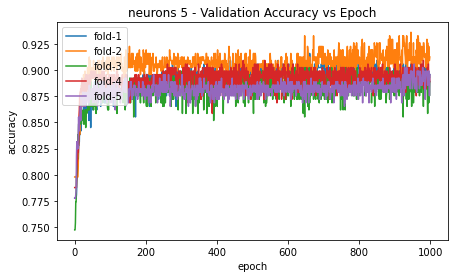

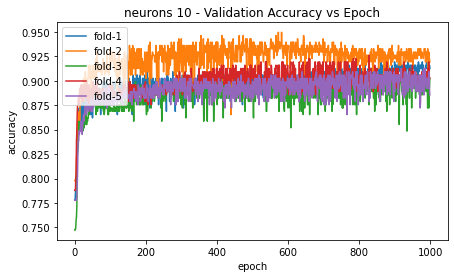

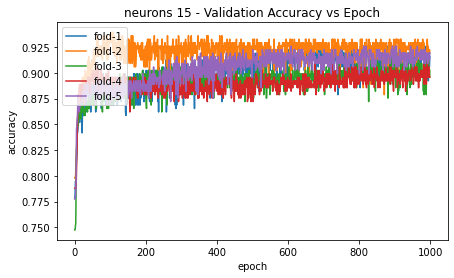

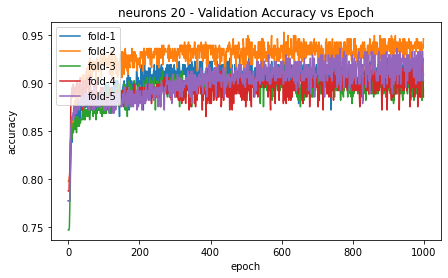

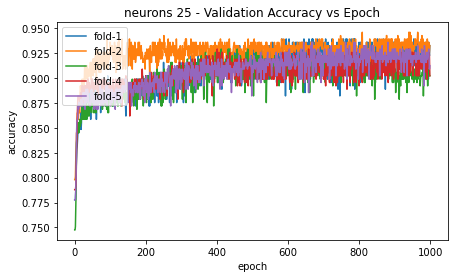

In [38]:
plt.figure(figsize=(7,4))
plt.plot(histories['neurons-5-fold-0'].history['val_accuracy'])
plt.plot(histories['neurons-5-fold-1'].history['val_accuracy'])
plt.plot(histories['neurons-5-fold-2'].history['val_accuracy'])
plt.plot(histories['neurons-5-fold-3'].history['val_accuracy'])
plt.plot(histories['neurons-5-fold-4'].history['val_accuracy'])
plt.title('neurons 5 - Validation Accuracy vs Epoch')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['fold-1','fold-2','fold-3','fold-4','fold-5'], loc='upper left')
plt.show()

plt.figure(figsize=(7,4))
plt.plot(histories['neurons-10-fold-0'].history['val_accuracy'])
plt.plot(histories['neurons-10-fold-1'].history['val_accuracy'])
plt.plot(histories['neurons-10-fold-2'].history['val_accuracy'])
plt.plot(histories['neurons-10-fold-3'].history['val_accuracy'])
plt.plot(histories['neurons-10-fold-4'].history['val_accuracy'])
plt.title('neurons 10 - Validation Accuracy vs Epoch')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['fold-1','fold-2','fold-3','fold-4','fold-5'], loc='upper left')
plt.show()

plt.figure(figsize=(7,4))
plt.plot(histories['neurons-15-fold-0'].history['val_accuracy'])
plt.plot(histories['neurons-15-fold-1'].history['val_accuracy'])
plt.plot(histories['neurons-15-fold-2'].history['val_accuracy'])
plt.plot(histories['neurons-15-fold-3'].history['val_accuracy'])
plt.plot(histories['neurons-15-fold-4'].history['val_accuracy'])
plt.title('neurons 15 - Validation Accuracy vs Epoch')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['fold-1','fold-2','fold-3','fold-4','fold-5'], loc='upper left')
plt.show()

plt.figure(figsize=(7,4))
plt.plot(histories['neurons-20-fold-0'].history['val_accuracy'])
plt.plot(histories['neurons-20-fold-1'].history['val_accuracy'])
plt.plot(histories['neurons-20-fold-2'].history['val_accuracy'])
plt.plot(histories['neurons-20-fold-3'].history['val_accuracy'])
plt.plot(histories['neurons-20-fold-4'].history['val_accuracy'])
plt.title('neurons 20 - Validation Accuracy vs Epoch')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['fold-1','fold-2','fold-3','fold-4','fold-5'], loc='upper left')
plt.show()

plt.figure(figsize=(7,4))
plt.plot(histories['neurons-25-fold-0'].history['val_accuracy'])
plt.plot(histories['neurons-25-fold-1'].history['val_accuracy'])
plt.plot(histories['neurons-25-fold-2'].history['val_accuracy'])
plt.plot(histories['neurons-25-fold-3'].history['val_accuracy'])
plt.plot(histories['neurons-25-fold-4'].history['val_accuracy'])
plt.title('neurons 25 - Validation Accuracy vs Epoch')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['fold-1','fold-2','fold-3','fold-4','fold-5'], loc='upper left')
plt.show()

In [39]:
best_acc = mean_acc[0]
index = 0
for i in range(0,len(mean_acc)):
    print("For {} neurons mean validation accuracy is: ".format(neurons[i]) + str(mean_acc[i]))
    if(mean_acc[i] > best_acc):
        best_acc = mean_acc[i]
        index = i
print("Best mean validation accuracy: " + str(best_acc) + " from neuron size {}".format(neurons[index]))

optimal_neurons = neurons[index]

For 5 neurons mean validation accuracy is: 0.8962962985038757
For 10 neurons mean validation accuracy is: 0.9043771028518677
For 15 neurons mean validation accuracy is: 0.9104377031326294
For 20 neurons mean validation accuracy is: 0.9070707201957703
For 25 neurons mean validation accuracy is: 0.91649831533432
Best mean validation accuracy: 0.91649831533432 from neuron size 25


In [4]:
batch_size = 4
num_neurons = 25

l2 = tf.keras.regularizers.l2(l2=1e-6)
# create the model
model = Sequential([
    Dense(num_neurons, activation='relu', kernel_regularizer=l2),
    Dense(NUM_CLASSES, activation='softmax')
])

opt = tf.keras.optimizers.SGD(lr=0.01)

model.compile(optimizer=opt,
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# train the model
histories['qn3'] =model.fit(X_train, Y_train,
                            epochs=epochs,
                            verbose = 2,
                            batch_size = batch_size,
                            validation_data = (X_test, y_test))

Epoch 1/1000
372/372 - 1s - loss: 0.6513 - accuracy: 0.7782 - val_loss: 0.5825 - val_accuracy: 0.7790
Epoch 2/1000
372/372 - 1s - loss: 0.5618 - accuracy: 0.7782 - val_loss: 0.5182 - val_accuracy: 0.7790
Epoch 3/1000
372/372 - 1s - loss: 0.5075 - accuracy: 0.7816 - val_loss: 0.4724 - val_accuracy: 0.8009
Epoch 4/1000
372/372 - 1s - loss: 0.4647 - accuracy: 0.8031 - val_loss: 0.4297 - val_accuracy: 0.8245
Epoch 5/1000
372/372 - 1s - loss: 0.4304 - accuracy: 0.8239 - val_loss: 0.3998 - val_accuracy: 0.8354
Epoch 6/1000
372/372 - 1s - loss: 0.4003 - accuracy: 0.8434 - val_loss: 0.3812 - val_accuracy: 0.8495
Epoch 7/1000
372/372 - 1s - loss: 0.3798 - accuracy: 0.8562 - val_loss: 0.3599 - val_accuracy: 0.8746
Epoch 8/1000
372/372 - 1s - loss: 0.3631 - accuracy: 0.8569 - val_loss: 0.3427 - val_accuracy: 0.8793
Epoch 9/1000
372/372 - 1s - loss: 0.3483 - accuracy: 0.8683 - val_loss: 0.3341 - val_accuracy: 0.8746
Epoch 10/1000
372/372 - 1s - loss: 0.3362 - accuracy: 0.8743 - val_loss: 0.3292 - 

Epoch 81/1000
372/372 - 0s - loss: 0.2262 - accuracy: 0.8992 - val_loss: 0.2425 - val_accuracy: 0.9013
Epoch 82/1000
372/372 - 0s - loss: 0.2256 - accuracy: 0.9019 - val_loss: 0.2375 - val_accuracy: 0.9091
Epoch 83/1000
372/372 - 0s - loss: 0.2251 - accuracy: 0.9005 - val_loss: 0.2477 - val_accuracy: 0.8997
Epoch 84/1000
372/372 - 0s - loss: 0.2254 - accuracy: 0.8992 - val_loss: 0.2412 - val_accuracy: 0.9060
Epoch 85/1000
372/372 - 0s - loss: 0.2249 - accuracy: 0.9052 - val_loss: 0.2352 - val_accuracy: 0.9091
Epoch 86/1000
372/372 - 0s - loss: 0.2247 - accuracy: 0.9019 - val_loss: 0.2485 - val_accuracy: 0.8918
Epoch 87/1000
372/372 - 0s - loss: 0.2246 - accuracy: 0.8992 - val_loss: 0.2330 - val_accuracy: 0.9154
Epoch 88/1000
372/372 - 0s - loss: 0.2219 - accuracy: 0.9046 - val_loss: 0.2403 - val_accuracy: 0.9028
Epoch 89/1000
372/372 - 0s - loss: 0.2222 - accuracy: 0.9012 - val_loss: 0.2417 - val_accuracy: 0.9013
Epoch 90/1000
372/372 - 0s - loss: 0.2221 - accuracy: 0.8999 - val_loss: 

Epoch 160/1000
372/372 - 0s - loss: 0.2058 - accuracy: 0.9052 - val_loss: 0.2309 - val_accuracy: 0.9107
Epoch 161/1000
372/372 - 0s - loss: 0.2013 - accuracy: 0.9120 - val_loss: 0.2230 - val_accuracy: 0.9107
Epoch 162/1000
372/372 - 0s - loss: 0.2028 - accuracy: 0.9106 - val_loss: 0.2330 - val_accuracy: 0.8997
Epoch 163/1000
372/372 - 0s - loss: 0.2046 - accuracy: 0.9073 - val_loss: 0.2274 - val_accuracy: 0.9107
Epoch 164/1000
372/372 - 0s - loss: 0.1978 - accuracy: 0.9106 - val_loss: 0.2210 - val_accuracy: 0.9122
Epoch 165/1000
372/372 - 0s - loss: 0.2034 - accuracy: 0.9079 - val_loss: 0.2298 - val_accuracy: 0.9060
Epoch 166/1000
372/372 - 0s - loss: 0.2041 - accuracy: 0.9106 - val_loss: 0.2221 - val_accuracy: 0.9169
Epoch 167/1000
372/372 - 0s - loss: 0.2018 - accuracy: 0.9093 - val_loss: 0.2229 - val_accuracy: 0.9075
Epoch 168/1000
372/372 - 0s - loss: 0.2012 - accuracy: 0.9099 - val_loss: 0.2324 - val_accuracy: 0.9044
Epoch 169/1000
372/372 - 0s - loss: 0.2006 - accuracy: 0.9147 - 

Epoch 239/1000
372/372 - 0s - loss: 0.1882 - accuracy: 0.9106 - val_loss: 0.2134 - val_accuracy: 0.9138
Epoch 240/1000
372/372 - 0s - loss: 0.1888 - accuracy: 0.9153 - val_loss: 0.2184 - val_accuracy: 0.9091
Epoch 241/1000
372/372 - 0s - loss: 0.1889 - accuracy: 0.9140 - val_loss: 0.2152 - val_accuracy: 0.9122
Epoch 242/1000
372/372 - 0s - loss: 0.1896 - accuracy: 0.9147 - val_loss: 0.2189 - val_accuracy: 0.9169
Epoch 243/1000
372/372 - 0s - loss: 0.1896 - accuracy: 0.9220 - val_loss: 0.2186 - val_accuracy: 0.9138
Epoch 244/1000
372/372 - 0s - loss: 0.1865 - accuracy: 0.9140 - val_loss: 0.2201 - val_accuracy: 0.9138
Epoch 245/1000
372/372 - 0s - loss: 0.1867 - accuracy: 0.9173 - val_loss: 0.2207 - val_accuracy: 0.9028
Epoch 246/1000
372/372 - 0s - loss: 0.1880 - accuracy: 0.9207 - val_loss: 0.2192 - val_accuracy: 0.9169
Epoch 247/1000
372/372 - 0s - loss: 0.1871 - accuracy: 0.9167 - val_loss: 0.2221 - val_accuracy: 0.9044
Epoch 248/1000
372/372 - 0s - loss: 0.1855 - accuracy: 0.9194 - 

Epoch 318/1000
372/372 - 0s - loss: 0.1758 - accuracy: 0.9234 - val_loss: 0.2180 - val_accuracy: 0.9013
Epoch 319/1000
372/372 - 0s - loss: 0.1744 - accuracy: 0.9200 - val_loss: 0.2150 - val_accuracy: 0.9185
Epoch 320/1000
372/372 - 0s - loss: 0.1732 - accuracy: 0.9281 - val_loss: 0.2097 - val_accuracy: 0.9107
Epoch 321/1000
372/372 - 0s - loss: 0.1711 - accuracy: 0.9241 - val_loss: 0.2208 - val_accuracy: 0.9216
Epoch 322/1000
372/372 - 0s - loss: 0.1738 - accuracy: 0.9241 - val_loss: 0.2150 - val_accuracy: 0.9232
Epoch 323/1000
372/372 - 0s - loss: 0.1751 - accuracy: 0.9234 - val_loss: 0.2115 - val_accuracy: 0.9154
Epoch 324/1000
372/372 - 0s - loss: 0.1738 - accuracy: 0.9180 - val_loss: 0.2180 - val_accuracy: 0.9091
Epoch 325/1000
372/372 - 0s - loss: 0.1752 - accuracy: 0.9254 - val_loss: 0.2143 - val_accuracy: 0.9154
Epoch 326/1000
372/372 - 0s - loss: 0.1714 - accuracy: 0.9214 - val_loss: 0.2197 - val_accuracy: 0.9044
Epoch 327/1000
372/372 - 0s - loss: 0.1737 - accuracy: 0.9234 - 

Epoch 397/1000
372/372 - 0s - loss: 0.1627 - accuracy: 0.9288 - val_loss: 0.2116 - val_accuracy: 0.9122
Epoch 398/1000
372/372 - 0s - loss: 0.1660 - accuracy: 0.9288 - val_loss: 0.2103 - val_accuracy: 0.9169
Epoch 399/1000
372/372 - 0s - loss: 0.1632 - accuracy: 0.9308 - val_loss: 0.2169 - val_accuracy: 0.9216
Epoch 400/1000
372/372 - 0s - loss: 0.1645 - accuracy: 0.9308 - val_loss: 0.2092 - val_accuracy: 0.9154
Epoch 401/1000
372/372 - 0s - loss: 0.1638 - accuracy: 0.9274 - val_loss: 0.2150 - val_accuracy: 0.9122
Epoch 402/1000
372/372 - 0s - loss: 0.1624 - accuracy: 0.9261 - val_loss: 0.2155 - val_accuracy: 0.9107
Epoch 403/1000
372/372 - 0s - loss: 0.1637 - accuracy: 0.9328 - val_loss: 0.2155 - val_accuracy: 0.9279
Epoch 404/1000
372/372 - 0s - loss: 0.1630 - accuracy: 0.9301 - val_loss: 0.2086 - val_accuracy: 0.9138
Epoch 405/1000
372/372 - 0s - loss: 0.1621 - accuracy: 0.9254 - val_loss: 0.2251 - val_accuracy: 0.9154
Epoch 406/1000
372/372 - 0s - loss: 0.1634 - accuracy: 0.9335 - 

Epoch 476/1000
372/372 - 0s - loss: 0.1565 - accuracy: 0.9335 - val_loss: 0.2139 - val_accuracy: 0.9169
Epoch 477/1000
372/372 - 0s - loss: 0.1538 - accuracy: 0.9335 - val_loss: 0.2116 - val_accuracy: 0.9169
Epoch 478/1000
372/372 - 0s - loss: 0.1543 - accuracy: 0.9335 - val_loss: 0.2096 - val_accuracy: 0.9169
Epoch 479/1000
372/372 - 0s - loss: 0.1527 - accuracy: 0.9321 - val_loss: 0.2160 - val_accuracy: 0.9122
Epoch 480/1000
372/372 - 0s - loss: 0.1569 - accuracy: 0.9321 - val_loss: 0.2083 - val_accuracy: 0.9185
Epoch 481/1000
372/372 - 0s - loss: 0.1508 - accuracy: 0.9362 - val_loss: 0.2144 - val_accuracy: 0.9154
Epoch 482/1000
372/372 - 0s - loss: 0.1541 - accuracy: 0.9321 - val_loss: 0.2131 - val_accuracy: 0.9169
Epoch 483/1000
372/372 - 0s - loss: 0.1555 - accuracy: 0.9341 - val_loss: 0.2086 - val_accuracy: 0.9201
Epoch 484/1000
372/372 - 0s - loss: 0.1554 - accuracy: 0.9335 - val_loss: 0.2277 - val_accuracy: 0.9201
Epoch 485/1000
372/372 - 0s - loss: 0.1552 - accuracy: 0.9321 - 

Epoch 555/1000
372/372 - 0s - loss: 0.1491 - accuracy: 0.9328 - val_loss: 0.2086 - val_accuracy: 0.9216
Epoch 556/1000
372/372 - 0s - loss: 0.1495 - accuracy: 0.9328 - val_loss: 0.2083 - val_accuracy: 0.9248
Epoch 557/1000
372/372 - 0s - loss: 0.1453 - accuracy: 0.9375 - val_loss: 0.2166 - val_accuracy: 0.9138
Epoch 558/1000
372/372 - 0s - loss: 0.1485 - accuracy: 0.9355 - val_loss: 0.2131 - val_accuracy: 0.9154
Epoch 559/1000
372/372 - 0s - loss: 0.1507 - accuracy: 0.9328 - val_loss: 0.2230 - val_accuracy: 0.9185
Epoch 560/1000
372/372 - 0s - loss: 0.1480 - accuracy: 0.9335 - val_loss: 0.2073 - val_accuracy: 0.9201
Epoch 561/1000
372/372 - 1s - loss: 0.1477 - accuracy: 0.9341 - val_loss: 0.2176 - val_accuracy: 0.9201
Epoch 562/1000
372/372 - 1s - loss: 0.1474 - accuracy: 0.9368 - val_loss: 0.2215 - val_accuracy: 0.9216
Epoch 563/1000
372/372 - 0s - loss: 0.1482 - accuracy: 0.9328 - val_loss: 0.2049 - val_accuracy: 0.9201
Epoch 564/1000
372/372 - 0s - loss: 0.1485 - accuracy: 0.9328 - 

Epoch 634/1000
372/372 - 0s - loss: 0.1415 - accuracy: 0.9388 - val_loss: 0.2204 - val_accuracy: 0.9185
Epoch 635/1000
372/372 - 0s - loss: 0.1422 - accuracy: 0.9382 - val_loss: 0.2093 - val_accuracy: 0.9169
Epoch 636/1000
372/372 - 0s - loss: 0.1411 - accuracy: 0.9388 - val_loss: 0.2073 - val_accuracy: 0.9201
Epoch 637/1000
372/372 - 0s - loss: 0.1396 - accuracy: 0.9429 - val_loss: 0.2085 - val_accuracy: 0.9154
Epoch 638/1000
372/372 - 0s - loss: 0.1391 - accuracy: 0.9429 - val_loss: 0.2126 - val_accuracy: 0.9201
Epoch 639/1000
372/372 - 0s - loss: 0.1392 - accuracy: 0.9422 - val_loss: 0.2170 - val_accuracy: 0.9263
Epoch 640/1000
372/372 - 0s - loss: 0.1403 - accuracy: 0.9388 - val_loss: 0.2089 - val_accuracy: 0.9232
Epoch 641/1000
372/372 - 0s - loss: 0.1380 - accuracy: 0.9442 - val_loss: 0.2099 - val_accuracy: 0.9216
Epoch 642/1000
372/372 - 0s - loss: 0.1401 - accuracy: 0.9388 - val_loss: 0.2462 - val_accuracy: 0.9154
Epoch 643/1000
372/372 - 0s - loss: 0.1395 - accuracy: 0.9415 - 

Epoch 713/1000
372/372 - 1s - loss: 0.1335 - accuracy: 0.9442 - val_loss: 0.2146 - val_accuracy: 0.9295
Epoch 714/1000
372/372 - 0s - loss: 0.1342 - accuracy: 0.9409 - val_loss: 0.2128 - val_accuracy: 0.9248
Epoch 715/1000
372/372 - 0s - loss: 0.1344 - accuracy: 0.9476 - val_loss: 0.2114 - val_accuracy: 0.9248
Epoch 716/1000
372/372 - 0s - loss: 0.1312 - accuracy: 0.9469 - val_loss: 0.2362 - val_accuracy: 0.9248
Epoch 717/1000
372/372 - 0s - loss: 0.1333 - accuracy: 0.9435 - val_loss: 0.2091 - val_accuracy: 0.9248
Epoch 718/1000
372/372 - 0s - loss: 0.1326 - accuracy: 0.9429 - val_loss: 0.2085 - val_accuracy: 0.9232
Epoch 719/1000
372/372 - 0s - loss: 0.1326 - accuracy: 0.9395 - val_loss: 0.2098 - val_accuracy: 0.9201
Epoch 720/1000
372/372 - 0s - loss: 0.1336 - accuracy: 0.9429 - val_loss: 0.2083 - val_accuracy: 0.9216
Epoch 721/1000
372/372 - 0s - loss: 0.1329 - accuracy: 0.9435 - val_loss: 0.2138 - val_accuracy: 0.9263
Epoch 722/1000
372/372 - 0s - loss: 0.1327 - accuracy: 0.9462 - 

Epoch 792/1000
372/372 - 1s - loss: 0.1241 - accuracy: 0.9496 - val_loss: 0.2078 - val_accuracy: 0.9248
Epoch 793/1000
372/372 - 1s - loss: 0.1233 - accuracy: 0.9503 - val_loss: 0.2155 - val_accuracy: 0.9232
Epoch 794/1000
372/372 - 1s - loss: 0.1249 - accuracy: 0.9476 - val_loss: 0.2194 - val_accuracy: 0.9216
Epoch 795/1000
372/372 - 1s - loss: 0.1231 - accuracy: 0.9496 - val_loss: 0.2200 - val_accuracy: 0.9216
Epoch 796/1000
372/372 - 1s - loss: 0.1256 - accuracy: 0.9489 - val_loss: 0.2050 - val_accuracy: 0.9216
Epoch 797/1000
372/372 - 1s - loss: 0.1270 - accuracy: 0.9476 - val_loss: 0.2088 - val_accuracy: 0.9263
Epoch 798/1000
372/372 - 1s - loss: 0.1273 - accuracy: 0.9462 - val_loss: 0.2171 - val_accuracy: 0.9248
Epoch 799/1000
372/372 - 1s - loss: 0.1242 - accuracy: 0.9476 - val_loss: 0.2249 - val_accuracy: 0.9201
Epoch 800/1000
372/372 - 1s - loss: 0.1270 - accuracy: 0.9523 - val_loss: 0.2088 - val_accuracy: 0.9248
Epoch 801/1000
372/372 - 1s - loss: 0.1241 - accuracy: 0.9469 - 

Epoch 871/1000
372/372 - 1s - loss: 0.1181 - accuracy: 0.9489 - val_loss: 0.2194 - val_accuracy: 0.9295
Epoch 872/1000
372/372 - 0s - loss: 0.1158 - accuracy: 0.9550 - val_loss: 0.2077 - val_accuracy: 0.9248
Epoch 873/1000
372/372 - 0s - loss: 0.1186 - accuracy: 0.9503 - val_loss: 0.2122 - val_accuracy: 0.9263
Epoch 874/1000
372/372 - 1s - loss: 0.1206 - accuracy: 0.9489 - val_loss: 0.2230 - val_accuracy: 0.9232
Epoch 875/1000
372/372 - 0s - loss: 0.1180 - accuracy: 0.9523 - val_loss: 0.2379 - val_accuracy: 0.9138
Epoch 876/1000
372/372 - 0s - loss: 0.1162 - accuracy: 0.9516 - val_loss: 0.2120 - val_accuracy: 0.9232
Epoch 877/1000
372/372 - 1s - loss: 0.1205 - accuracy: 0.9462 - val_loss: 0.2140 - val_accuracy: 0.9248
Epoch 878/1000
372/372 - 1s - loss: 0.1206 - accuracy: 0.9523 - val_loss: 0.2056 - val_accuracy: 0.9263
Epoch 879/1000
372/372 - 0s - loss: 0.1165 - accuracy: 0.9543 - val_loss: 0.2219 - val_accuracy: 0.9263
Epoch 880/1000
372/372 - 0s - loss: 0.1202 - accuracy: 0.9530 - 

Epoch 950/1000
372/372 - 0s - loss: 0.1133 - accuracy: 0.9563 - val_loss: 0.2114 - val_accuracy: 0.9263
Epoch 951/1000
372/372 - 0s - loss: 0.1122 - accuracy: 0.9550 - val_loss: 0.2191 - val_accuracy: 0.9232
Epoch 952/1000
372/372 - 0s - loss: 0.1139 - accuracy: 0.9509 - val_loss: 0.2475 - val_accuracy: 0.9248
Epoch 953/1000
372/372 - 0s - loss: 0.1150 - accuracy: 0.9496 - val_loss: 0.2173 - val_accuracy: 0.9248
Epoch 954/1000
372/372 - 0s - loss: 0.1150 - accuracy: 0.9530 - val_loss: 0.2197 - val_accuracy: 0.9279
Epoch 955/1000
372/372 - 0s - loss: 0.1141 - accuracy: 0.9516 - val_loss: 0.2109 - val_accuracy: 0.9279
Epoch 956/1000
372/372 - 0s - loss: 0.1127 - accuracy: 0.9503 - val_loss: 0.2586 - val_accuracy: 0.9169
Epoch 957/1000
372/372 - 0s - loss: 0.1125 - accuracy: 0.9570 - val_loss: 0.2117 - val_accuracy: 0.9279
Epoch 958/1000
372/372 - 0s - loss: 0.1136 - accuracy: 0.9530 - val_loss: 0.2071 - val_accuracy: 0.9279
Epoch 959/1000
372/372 - 0s - loss: 0.1108 - accuracy: 0.9523 - 

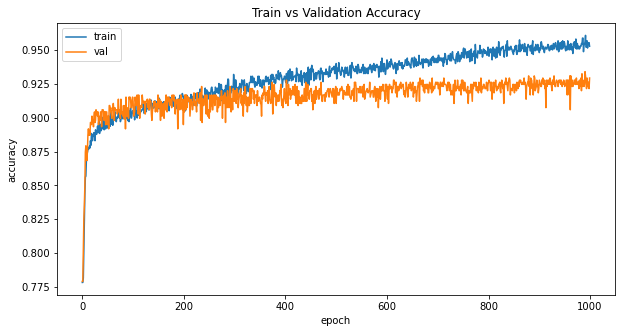

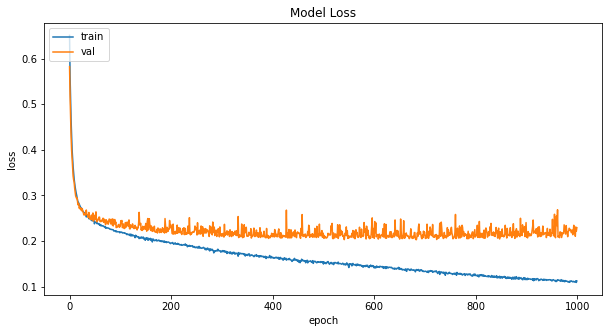

In [5]:
plt.figure(figsize=(10,5))
plt.plot(histories['qn3'].history['accuracy'])
plt.plot(histories['qn3'].history['val_accuracy'])
plt.title('Train vs Validation Accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

plt.figure(figsize=(10,5))
plt.plot(histories['qn3'].history['loss'])
plt.plot(histories['qn3'].history['val_loss'])
plt.title('Model Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

## Part A - Question 4

In [8]:
NUM_CLASSES = 3

epochs = 1000
batch_size = 4
num_neurons = 25
no_folds = 5

In [7]:
no_data = len(X_train)
idx = np.arange(no_data)
np.random.shuffle(idx)
X_train, Y_train = X_train[idx], Y_train[idx]
nf = no_data//no_folds

print(nf)

297


In [10]:
models = []
mean_acc = []
decay_acc = []
histories = {}
decays = [0,1e-3,1e-6,1e-9,1e-12]

print("Batch size: " + str(batch_size) + " epochs: " + str(epochs) + " number of neurons: " + str(num_neurons))

for decay in decays:
    for fold in range(no_folds):
        start, end = fold*nf, (fold+1)*nf
        x_val, y_val = X_train[start:end], Y_train[start:end]
        x_train  = np.append(X_train[:start], X_train[end:], axis=0)
        y_train = np.append(Y_train[:start], Y_train[end:], axis=0) 
        
        print("{} decay rate and fold {}".format(decay,fold))
        
        l2 = tf.keras.regularizers.l2(l2=decay)

        model = Sequential([
            Dense(num_neurons, activation='relu',kernel_regularizer=l2),
            Dense(NUM_CLASSES, activation='softmax')])
        
        opt = tf.keras.optimizers.SGD(lr=0.01)

        model.compile(optimizer= opt, 
                      loss='sparse_categorical_crossentropy',
                      metrics=['accuracy'])

        histories['decay-{}-fold-{}'.format(decay,fold)] = model.fit(x_train, y_train,
                        epochs=epochs,
                        verbose=2,
                        batch_size=batch_size,
                        validation_data=(x_val, y_val))

        decay_acc.append(histories['decay-{}-fold-{}'.format(decay,fold)].history['val_accuracy'][epochs-1])
        
        models.append(model)
            
        print('fold %d test accuracy %g'%(fold, decay_acc[fold]))

    for fold in range(no_folds):
        print('fold %d test accuracy %g'%(fold, decay_acc[fold]))
    print('* mean accuracy = %g *'% np.mean(decay_acc))
    mean_acc.append(np.mean(decay_acc))
    decay_acc = []

Batch size: 4 epochs: 1000 number of neurons: 25
0 decay rate and fold 0
Epoch 1/1000
298/298 - 0s - loss: 0.6845 - accuracy: 0.7288 - val_loss: 0.5914 - val_accuracy: 0.7778
Epoch 2/1000
298/298 - 0s - loss: 0.5620 - accuracy: 0.7792 - val_loss: 0.5476 - val_accuracy: 0.7778
Epoch 3/1000
298/298 - 0s - loss: 0.5169 - accuracy: 0.7809 - val_loss: 0.5053 - val_accuracy: 0.7879
Epoch 4/1000
298/298 - 0s - loss: 0.4779 - accuracy: 0.7960 - val_loss: 0.4710 - val_accuracy: 0.8047
Epoch 5/1000
298/298 - 0s - loss: 0.4448 - accuracy: 0.8178 - val_loss: 0.4413 - val_accuracy: 0.8047
Epoch 6/1000
298/298 - 0s - loss: 0.4169 - accuracy: 0.8430 - val_loss: 0.4202 - val_accuracy: 0.8148
Epoch 7/1000
298/298 - 0s - loss: 0.3966 - accuracy: 0.8489 - val_loss: 0.4000 - val_accuracy: 0.8316
Epoch 8/1000
298/298 - 0s - loss: 0.3776 - accuracy: 0.8573 - val_loss: 0.3882 - val_accuracy: 0.8519
Epoch 9/1000
298/298 - 0s - loss: 0.3649 - accuracy: 0.8615 - val_loss: 0.3739 - val_accuracy: 0.8552
Epoch 10/

Epoch 80/1000
298/298 - 0s - loss: 0.2276 - accuracy: 0.8984 - val_loss: 0.2457 - val_accuracy: 0.8923
Epoch 81/1000
298/298 - 0s - loss: 0.2293 - accuracy: 0.9051 - val_loss: 0.2452 - val_accuracy: 0.8923
Epoch 82/1000
298/298 - 0s - loss: 0.2266 - accuracy: 0.9009 - val_loss: 0.2500 - val_accuracy: 0.8855
Epoch 83/1000
298/298 - 0s - loss: 0.2275 - accuracy: 0.9060 - val_loss: 0.2449 - val_accuracy: 0.8889
Epoch 84/1000
298/298 - 0s - loss: 0.2286 - accuracy: 0.9051 - val_loss: 0.2597 - val_accuracy: 0.8855
Epoch 85/1000
298/298 - 0s - loss: 0.2267 - accuracy: 0.9060 - val_loss: 0.2459 - val_accuracy: 0.8923
Epoch 86/1000
298/298 - 0s - loss: 0.2222 - accuracy: 0.9034 - val_loss: 0.2553 - val_accuracy: 0.8855
Epoch 87/1000
298/298 - 0s - loss: 0.2287 - accuracy: 0.9001 - val_loss: 0.2423 - val_accuracy: 0.8855
Epoch 88/1000
298/298 - 0s - loss: 0.2264 - accuracy: 0.9051 - val_loss: 0.2497 - val_accuracy: 0.8754
Epoch 89/1000
298/298 - 0s - loss: 0.2240 - accuracy: 0.9026 - val_loss: 

Epoch 159/1000
298/298 - 0s - loss: 0.2041 - accuracy: 0.9076 - val_loss: 0.2406 - val_accuracy: 0.8822
Epoch 160/1000
298/298 - 0s - loss: 0.2058 - accuracy: 0.9118 - val_loss: 0.2246 - val_accuracy: 0.8923
Epoch 161/1000
298/298 - 0s - loss: 0.2042 - accuracy: 0.9127 - val_loss: 0.2214 - val_accuracy: 0.8956
Epoch 162/1000
298/298 - 0s - loss: 0.2039 - accuracy: 0.9127 - val_loss: 0.2301 - val_accuracy: 0.8822
Epoch 163/1000
298/298 - 0s - loss: 0.2022 - accuracy: 0.9118 - val_loss: 0.2519 - val_accuracy: 0.8754
Epoch 164/1000
298/298 - 0s - loss: 0.2021 - accuracy: 0.9135 - val_loss: 0.2255 - val_accuracy: 0.8923
Epoch 165/1000
298/298 - 0s - loss: 0.2007 - accuracy: 0.9093 - val_loss: 0.2237 - val_accuracy: 0.8889
Epoch 166/1000
298/298 - 0s - loss: 0.2010 - accuracy: 0.9127 - val_loss: 0.2222 - val_accuracy: 0.8923
Epoch 167/1000
298/298 - 0s - loss: 0.2005 - accuracy: 0.9160 - val_loss: 0.2219 - val_accuracy: 0.8990
Epoch 168/1000
298/298 - 0s - loss: 0.2014 - accuracy: 0.9144 - 

Epoch 238/1000
298/298 - 0s - loss: 0.1855 - accuracy: 0.9202 - val_loss: 0.2104 - val_accuracy: 0.9057
Epoch 239/1000
298/298 - 0s - loss: 0.1868 - accuracy: 0.9135 - val_loss: 0.2127 - val_accuracy: 0.8990
Epoch 240/1000
298/298 - 0s - loss: 0.1857 - accuracy: 0.9211 - val_loss: 0.2168 - val_accuracy: 0.8889
Epoch 241/1000
298/298 - 0s - loss: 0.1856 - accuracy: 0.9144 - val_loss: 0.2158 - val_accuracy: 0.9057
Epoch 242/1000
298/298 - 0s - loss: 0.1860 - accuracy: 0.9202 - val_loss: 0.2093 - val_accuracy: 0.8923
Epoch 243/1000
298/298 - 0s - loss: 0.1853 - accuracy: 0.9211 - val_loss: 0.2176 - val_accuracy: 0.9024
Epoch 244/1000
298/298 - 0s - loss: 0.1819 - accuracy: 0.9219 - val_loss: 0.2065 - val_accuracy: 0.8990
Epoch 245/1000
298/298 - 0s - loss: 0.1835 - accuracy: 0.9177 - val_loss: 0.2165 - val_accuracy: 0.8889
Epoch 246/1000
298/298 - 0s - loss: 0.1825 - accuracy: 0.9135 - val_loss: 0.2113 - val_accuracy: 0.9057
Epoch 247/1000
298/298 - 0s - loss: 0.1843 - accuracy: 0.9211 - 

Epoch 317/1000
298/298 - 0s - loss: 0.1706 - accuracy: 0.9236 - val_loss: 0.2036 - val_accuracy: 0.9091
Epoch 318/1000
298/298 - 0s - loss: 0.1722 - accuracy: 0.9219 - val_loss: 0.2017 - val_accuracy: 0.9057
Epoch 319/1000
298/298 - 0s - loss: 0.1690 - accuracy: 0.9286 - val_loss: 0.1959 - val_accuracy: 0.9158
Epoch 320/1000
298/298 - 0s - loss: 0.1717 - accuracy: 0.9236 - val_loss: 0.2021 - val_accuracy: 0.9091
Epoch 321/1000
298/298 - 0s - loss: 0.1710 - accuracy: 0.9244 - val_loss: 0.2040 - val_accuracy: 0.9057
Epoch 322/1000
298/298 - 0s - loss: 0.1675 - accuracy: 0.9295 - val_loss: 0.2120 - val_accuracy: 0.8923
Epoch 323/1000
298/298 - 0s - loss: 0.1703 - accuracy: 0.9244 - val_loss: 0.2016 - val_accuracy: 0.9057
Epoch 324/1000
298/298 - 0s - loss: 0.1695 - accuracy: 0.9244 - val_loss: 0.2062 - val_accuracy: 0.9057
Epoch 325/1000
298/298 - 0s - loss: 0.1689 - accuracy: 0.9228 - val_loss: 0.2004 - val_accuracy: 0.9057
Epoch 326/1000
298/298 - 0s - loss: 0.1684 - accuracy: 0.9312 - 

Epoch 396/1000
298/298 - 0s - loss: 0.1604 - accuracy: 0.9295 - val_loss: 0.2016 - val_accuracy: 0.9091
Epoch 397/1000
298/298 - 0s - loss: 0.1603 - accuracy: 0.9312 - val_loss: 0.2025 - val_accuracy: 0.9192
Epoch 398/1000
298/298 - 0s - loss: 0.1608 - accuracy: 0.9295 - val_loss: 0.1925 - val_accuracy: 0.9226
Epoch 399/1000
298/298 - 0s - loss: 0.1586 - accuracy: 0.9320 - val_loss: 0.2035 - val_accuracy: 0.9125
Epoch 400/1000
298/298 - 0s - loss: 0.1603 - accuracy: 0.9328 - val_loss: 0.1903 - val_accuracy: 0.9226
Epoch 401/1000
298/298 - 0s - loss: 0.1568 - accuracy: 0.9404 - val_loss: 0.2038 - val_accuracy: 0.9057
Epoch 402/1000
298/298 - 0s - loss: 0.1566 - accuracy: 0.9345 - val_loss: 0.2107 - val_accuracy: 0.9158
Epoch 403/1000
298/298 - 0s - loss: 0.1574 - accuracy: 0.9278 - val_loss: 0.2011 - val_accuracy: 0.9057
Epoch 404/1000
298/298 - 0s - loss: 0.1564 - accuracy: 0.9345 - val_loss: 0.1946 - val_accuracy: 0.9259
Epoch 405/1000
298/298 - 0s - loss: 0.1567 - accuracy: 0.9337 - 

Epoch 475/1000
298/298 - 0s - loss: 0.1526 - accuracy: 0.9387 - val_loss: 0.1961 - val_accuracy: 0.9091
Epoch 476/1000
298/298 - 0s - loss: 0.1461 - accuracy: 0.9404 - val_loss: 0.2135 - val_accuracy: 0.9226
Epoch 477/1000
298/298 - 0s - loss: 0.1513 - accuracy: 0.9395 - val_loss: 0.1851 - val_accuracy: 0.9192
Epoch 478/1000
298/298 - 0s - loss: 0.1502 - accuracy: 0.9370 - val_loss: 0.1838 - val_accuracy: 0.9158
Epoch 479/1000
298/298 - 0s - loss: 0.1479 - accuracy: 0.9337 - val_loss: 0.1856 - val_accuracy: 0.9091
Epoch 480/1000
298/298 - 0s - loss: 0.1482 - accuracy: 0.9421 - val_loss: 0.1940 - val_accuracy: 0.8990
Epoch 481/1000
298/298 - 0s - loss: 0.1473 - accuracy: 0.9421 - val_loss: 0.1948 - val_accuracy: 0.9293
Epoch 482/1000
298/298 - 0s - loss: 0.1498 - accuracy: 0.9370 - val_loss: 0.1961 - val_accuracy: 0.9158
Epoch 483/1000
298/298 - 0s - loss: 0.1475 - accuracy: 0.9370 - val_loss: 0.1956 - val_accuracy: 0.9293
Epoch 484/1000
298/298 - 0s - loss: 0.1498 - accuracy: 0.9404 - 

Epoch 554/1000
298/298 - 0s - loss: 0.1418 - accuracy: 0.9387 - val_loss: 0.2091 - val_accuracy: 0.9259
Epoch 555/1000
298/298 - 0s - loss: 0.1442 - accuracy: 0.9421 - val_loss: 0.1832 - val_accuracy: 0.9226
Epoch 556/1000
298/298 - 0s - loss: 0.1439 - accuracy: 0.9387 - val_loss: 0.1883 - val_accuracy: 0.9091
Epoch 557/1000
298/298 - 0s - loss: 0.1415 - accuracy: 0.9437 - val_loss: 0.1864 - val_accuracy: 0.9192
Epoch 558/1000
298/298 - 0s - loss: 0.1412 - accuracy: 0.9412 - val_loss: 0.1887 - val_accuracy: 0.9259
Epoch 559/1000
298/298 - 0s - loss: 0.1425 - accuracy: 0.9429 - val_loss: 0.1847 - val_accuracy: 0.9192
Epoch 560/1000
298/298 - 0s - loss: 0.1446 - accuracy: 0.9387 - val_loss: 0.1879 - val_accuracy: 0.9192
Epoch 561/1000
298/298 - 0s - loss: 0.1449 - accuracy: 0.9404 - val_loss: 0.1916 - val_accuracy: 0.9192
Epoch 562/1000
298/298 - 0s - loss: 0.1441 - accuracy: 0.9379 - val_loss: 0.1906 - val_accuracy: 0.9125
Epoch 563/1000
298/298 - 0s - loss: 0.1448 - accuracy: 0.9387 - 

Epoch 633/1000
298/298 - 0s - loss: 0.1378 - accuracy: 0.9429 - val_loss: 0.1858 - val_accuracy: 0.9226
Epoch 634/1000
298/298 - 0s - loss: 0.1372 - accuracy: 0.9379 - val_loss: 0.1924 - val_accuracy: 0.9327
Epoch 635/1000
298/298 - 0s - loss: 0.1288 - accuracy: 0.9521 - val_loss: 0.1871 - val_accuracy: 0.9192
Epoch 636/1000
298/298 - 0s - loss: 0.1381 - accuracy: 0.9479 - val_loss: 0.1895 - val_accuracy: 0.9158
Epoch 637/1000
298/298 - 0s - loss: 0.1356 - accuracy: 0.9479 - val_loss: 0.1928 - val_accuracy: 0.9125
Epoch 638/1000
298/298 - 0s - loss: 0.1344 - accuracy: 0.9488 - val_loss: 0.1916 - val_accuracy: 0.9259
Epoch 639/1000
298/298 - 0s - loss: 0.1349 - accuracy: 0.9395 - val_loss: 0.1996 - val_accuracy: 0.9091
Epoch 640/1000
298/298 - 0s - loss: 0.1339 - accuracy: 0.9471 - val_loss: 0.1822 - val_accuracy: 0.9293
Epoch 641/1000
298/298 - 0s - loss: 0.1358 - accuracy: 0.9429 - val_loss: 0.1865 - val_accuracy: 0.9293
Epoch 642/1000
298/298 - 0s - loss: 0.1370 - accuracy: 0.9496 - 

Epoch 712/1000
298/298 - 0s - loss: 0.1303 - accuracy: 0.9496 - val_loss: 0.1844 - val_accuracy: 0.9226
Epoch 713/1000
298/298 - 0s - loss: 0.1291 - accuracy: 0.9479 - val_loss: 0.2096 - val_accuracy: 0.9259
Epoch 714/1000
298/298 - 0s - loss: 0.1316 - accuracy: 0.9530 - val_loss: 0.1790 - val_accuracy: 0.9259
Epoch 715/1000
298/298 - 0s - loss: 0.1328 - accuracy: 0.9437 - val_loss: 0.1857 - val_accuracy: 0.9327
Epoch 716/1000
298/298 - 0s - loss: 0.1293 - accuracy: 0.9488 - val_loss: 0.1830 - val_accuracy: 0.9226
Epoch 717/1000
298/298 - 0s - loss: 0.1328 - accuracy: 0.9429 - val_loss: 0.1758 - val_accuracy: 0.9192
Epoch 718/1000
298/298 - 0s - loss: 0.1306 - accuracy: 0.9471 - val_loss: 0.1896 - val_accuracy: 0.9293
Epoch 719/1000
298/298 - 0s - loss: 0.1284 - accuracy: 0.9505 - val_loss: 0.1908 - val_accuracy: 0.9226
Epoch 720/1000
298/298 - 0s - loss: 0.1292 - accuracy: 0.9521 - val_loss: 0.2066 - val_accuracy: 0.9091
Epoch 721/1000
298/298 - 0s - loss: 0.1319 - accuracy: 0.9437 - 

Epoch 791/1000
298/298 - 0s - loss: 0.1255 - accuracy: 0.9521 - val_loss: 0.1905 - val_accuracy: 0.9327
Epoch 792/1000
298/298 - 0s - loss: 0.1247 - accuracy: 0.9496 - val_loss: 0.1868 - val_accuracy: 0.9259
Epoch 793/1000
298/298 - 0s - loss: 0.1259 - accuracy: 0.9488 - val_loss: 0.1813 - val_accuracy: 0.9226
Epoch 794/1000
298/298 - 0s - loss: 0.1261 - accuracy: 0.9496 - val_loss: 0.1821 - val_accuracy: 0.9293
Epoch 795/1000
298/298 - 0s - loss: 0.1274 - accuracy: 0.9454 - val_loss: 0.1820 - val_accuracy: 0.9226
Epoch 796/1000
298/298 - 0s - loss: 0.1274 - accuracy: 0.9547 - val_loss: 0.1863 - val_accuracy: 0.9259
Epoch 797/1000
298/298 - 0s - loss: 0.1260 - accuracy: 0.9463 - val_loss: 0.1916 - val_accuracy: 0.9259
Epoch 798/1000
298/298 - 0s - loss: 0.1254 - accuracy: 0.9538 - val_loss: 0.1757 - val_accuracy: 0.9293
Epoch 799/1000
298/298 - 0s - loss: 0.1228 - accuracy: 0.9463 - val_loss: 0.1806 - val_accuracy: 0.9327
Epoch 800/1000
298/298 - 0s - loss: 0.1242 - accuracy: 0.9521 - 

Epoch 870/1000
298/298 - 0s - loss: 0.1223 - accuracy: 0.9505 - val_loss: 0.1825 - val_accuracy: 0.9226
Epoch 871/1000
298/298 - 0s - loss: 0.1203 - accuracy: 0.9538 - val_loss: 0.1800 - val_accuracy: 0.9226
Epoch 872/1000
298/298 - 0s - loss: 0.1195 - accuracy: 0.9521 - val_loss: 0.1886 - val_accuracy: 0.9226
Epoch 873/1000
298/298 - 0s - loss: 0.1212 - accuracy: 0.9547 - val_loss: 0.1849 - val_accuracy: 0.9259
Epoch 874/1000
298/298 - 0s - loss: 0.1206 - accuracy: 0.9538 - val_loss: 0.1858 - val_accuracy: 0.9226
Epoch 875/1000
298/298 - 0s - loss: 0.1192 - accuracy: 0.9496 - val_loss: 0.1988 - val_accuracy: 0.9259
Epoch 876/1000
298/298 - 0s - loss: 0.1223 - accuracy: 0.9547 - val_loss: 0.1798 - val_accuracy: 0.9293
Epoch 877/1000
298/298 - 0s - loss: 0.1207 - accuracy: 0.9513 - val_loss: 0.1843 - val_accuracy: 0.9259
Epoch 878/1000
298/298 - 0s - loss: 0.1198 - accuracy: 0.9547 - val_loss: 0.1774 - val_accuracy: 0.9293
Epoch 879/1000
298/298 - 0s - loss: 0.1192 - accuracy: 0.9538 - 

Epoch 949/1000
298/298 - 0s - loss: 0.1190 - accuracy: 0.9530 - val_loss: 0.1822 - val_accuracy: 0.9327
Epoch 950/1000
298/298 - 0s - loss: 0.1205 - accuracy: 0.9563 - val_loss: 0.1814 - val_accuracy: 0.9293
Epoch 951/1000
298/298 - 0s - loss: 0.1186 - accuracy: 0.9538 - val_loss: 0.1864 - val_accuracy: 0.9259
Epoch 952/1000
298/298 - 0s - loss: 0.1157 - accuracy: 0.9538 - val_loss: 0.1898 - val_accuracy: 0.9259
Epoch 953/1000
298/298 - 0s - loss: 0.1171 - accuracy: 0.9530 - val_loss: 0.1878 - val_accuracy: 0.9293
Epoch 954/1000
298/298 - 0s - loss: 0.1177 - accuracy: 0.9563 - val_loss: 0.1834 - val_accuracy: 0.9259
Epoch 955/1000
298/298 - 0s - loss: 0.1181 - accuracy: 0.9505 - val_loss: 0.1831 - val_accuracy: 0.9226
Epoch 956/1000
298/298 - 0s - loss: 0.1177 - accuracy: 0.9513 - val_loss: 0.1822 - val_accuracy: 0.9293
Epoch 957/1000
298/298 - 0s - loss: 0.1190 - accuracy: 0.9521 - val_loss: 0.1850 - val_accuracy: 0.9293
Epoch 958/1000
298/298 - 0s - loss: 0.1159 - accuracy: 0.9572 - 

Epoch 28/1000
298/298 - 0s - loss: 0.2852 - accuracy: 0.8808 - val_loss: 0.2416 - val_accuracy: 0.8855
Epoch 29/1000
298/298 - 0s - loss: 0.2852 - accuracy: 0.8783 - val_loss: 0.2393 - val_accuracy: 0.8788
Epoch 30/1000
298/298 - 0s - loss: 0.2813 - accuracy: 0.8816 - val_loss: 0.2344 - val_accuracy: 0.8788
Epoch 31/1000
298/298 - 0s - loss: 0.2823 - accuracy: 0.8799 - val_loss: 0.2370 - val_accuracy: 0.8855
Epoch 32/1000
298/298 - 0s - loss: 0.2784 - accuracy: 0.8841 - val_loss: 0.2326 - val_accuracy: 0.8990
Epoch 33/1000
298/298 - 0s - loss: 0.2768 - accuracy: 0.8808 - val_loss: 0.2458 - val_accuracy: 0.8923
Epoch 34/1000
298/298 - 0s - loss: 0.2769 - accuracy: 0.8816 - val_loss: 0.2312 - val_accuracy: 0.8889
Epoch 35/1000
298/298 - 0s - loss: 0.2747 - accuracy: 0.8816 - val_loss: 0.2305 - val_accuracy: 0.8889
Epoch 36/1000
298/298 - 0s - loss: 0.2743 - accuracy: 0.8875 - val_loss: 0.2291 - val_accuracy: 0.8923
Epoch 37/1000
298/298 - 0s - loss: 0.2731 - accuracy: 0.8833 - val_loss: 

Epoch 108/1000
298/298 - 0s - loss: 0.2312 - accuracy: 0.8984 - val_loss: 0.1842 - val_accuracy: 0.9091
Epoch 109/1000
298/298 - 0s - loss: 0.2355 - accuracy: 0.8942 - val_loss: 0.1907 - val_accuracy: 0.9192
Epoch 110/1000
298/298 - 0s - loss: 0.2321 - accuracy: 0.9009 - val_loss: 0.1975 - val_accuracy: 0.9226
Epoch 111/1000
298/298 - 0s - loss: 0.2295 - accuracy: 0.9018 - val_loss: 0.1920 - val_accuracy: 0.9158
Epoch 112/1000
298/298 - 0s - loss: 0.2308 - accuracy: 0.8984 - val_loss: 0.1997 - val_accuracy: 0.9057
Epoch 113/1000
298/298 - 0s - loss: 0.2328 - accuracy: 0.8967 - val_loss: 0.1877 - val_accuracy: 0.9226
Epoch 114/1000
298/298 - 0s - loss: 0.2327 - accuracy: 0.8908 - val_loss: 0.1839 - val_accuracy: 0.9091
Epoch 115/1000
298/298 - 0s - loss: 0.2317 - accuracy: 0.8934 - val_loss: 0.1989 - val_accuracy: 0.9125
Epoch 116/1000
298/298 - 0s - loss: 0.2316 - accuracy: 0.8959 - val_loss: 0.1848 - val_accuracy: 0.9158
Epoch 117/1000
298/298 - 0s - loss: 0.2308 - accuracy: 0.8967 - 

Epoch 187/1000
298/298 - 0s - loss: 0.2132 - accuracy: 0.9026 - val_loss: 0.1911 - val_accuracy: 0.9192
Epoch 188/1000
298/298 - 0s - loss: 0.2126 - accuracy: 0.9051 - val_loss: 0.1763 - val_accuracy: 0.9192
Epoch 189/1000
298/298 - 0s - loss: 0.2126 - accuracy: 0.9034 - val_loss: 0.1828 - val_accuracy: 0.9259
Epoch 190/1000
298/298 - 0s - loss: 0.2116 - accuracy: 0.9068 - val_loss: 0.1896 - val_accuracy: 0.9192
Epoch 191/1000
298/298 - 0s - loss: 0.2106 - accuracy: 0.9144 - val_loss: 0.1832 - val_accuracy: 0.9226
Epoch 192/1000
298/298 - 0s - loss: 0.2125 - accuracy: 0.9068 - val_loss: 0.1821 - val_accuracy: 0.9192
Epoch 193/1000
298/298 - 0s - loss: 0.2111 - accuracy: 0.9102 - val_loss: 0.1880 - val_accuracy: 0.9125
Epoch 194/1000
298/298 - 0s - loss: 0.2112 - accuracy: 0.9068 - val_loss: 0.1740 - val_accuracy: 0.9125
Epoch 195/1000
298/298 - 0s - loss: 0.2118 - accuracy: 0.9093 - val_loss: 0.1715 - val_accuracy: 0.9158
Epoch 196/1000
298/298 - 0s - loss: 0.2076 - accuracy: 0.9102 - 

Epoch 266/1000
298/298 - 0s - loss: 0.1915 - accuracy: 0.9270 - val_loss: 0.1726 - val_accuracy: 0.9259
Epoch 267/1000
298/298 - 0s - loss: 0.1922 - accuracy: 0.9228 - val_loss: 0.1748 - val_accuracy: 0.9259
Epoch 268/1000
298/298 - 0s - loss: 0.1904 - accuracy: 0.9253 - val_loss: 0.1668 - val_accuracy: 0.9226
Epoch 269/1000
298/298 - 0s - loss: 0.1945 - accuracy: 0.9202 - val_loss: 0.1736 - val_accuracy: 0.9327
Epoch 270/1000
298/298 - 0s - loss: 0.1909 - accuracy: 0.9186 - val_loss: 0.1865 - val_accuracy: 0.9158
Epoch 271/1000
298/298 - 0s - loss: 0.1925 - accuracy: 0.9160 - val_loss: 0.1713 - val_accuracy: 0.9293
Epoch 272/1000
298/298 - 0s - loss: 0.1920 - accuracy: 0.9194 - val_loss: 0.1713 - val_accuracy: 0.9327
Epoch 273/1000
298/298 - 0s - loss: 0.1898 - accuracy: 0.9169 - val_loss: 0.1737 - val_accuracy: 0.9293
Epoch 274/1000
298/298 - 0s - loss: 0.1919 - accuracy: 0.9219 - val_loss: 0.1787 - val_accuracy: 0.9226
Epoch 275/1000
298/298 - 0s - loss: 0.1916 - accuracy: 0.9169 - 

Epoch 345/1000
298/298 - 0s - loss: 0.1817 - accuracy: 0.9320 - val_loss: 0.1826 - val_accuracy: 0.9226
Epoch 346/1000
298/298 - 0s - loss: 0.1794 - accuracy: 0.9278 - val_loss: 0.1821 - val_accuracy: 0.9192
Epoch 347/1000
298/298 - 0s - loss: 0.1781 - accuracy: 0.9244 - val_loss: 0.1641 - val_accuracy: 0.9293
Epoch 348/1000
298/298 - 0s - loss: 0.1770 - accuracy: 0.9286 - val_loss: 0.1629 - val_accuracy: 0.9327
Epoch 349/1000
298/298 - 0s - loss: 0.1817 - accuracy: 0.9270 - val_loss: 0.1654 - val_accuracy: 0.9360
Epoch 350/1000
298/298 - 0s - loss: 0.1803 - accuracy: 0.9253 - val_loss: 0.1711 - val_accuracy: 0.9360
Epoch 351/1000
298/298 - 0s - loss: 0.1800 - accuracy: 0.9270 - val_loss: 0.1712 - val_accuracy: 0.9327
Epoch 352/1000
298/298 - 0s - loss: 0.1803 - accuracy: 0.9278 - val_loss: 0.1801 - val_accuracy: 0.9192
Epoch 353/1000
298/298 - 0s - loss: 0.1793 - accuracy: 0.9295 - val_loss: 0.1736 - val_accuracy: 0.9327
Epoch 354/1000
298/298 - 0s - loss: 0.1787 - accuracy: 0.9312 - 

Epoch 424/1000
298/298 - 0s - loss: 0.1699 - accuracy: 0.9345 - val_loss: 0.1716 - val_accuracy: 0.9259
Epoch 425/1000
298/298 - 0s - loss: 0.1716 - accuracy: 0.9345 - val_loss: 0.1669 - val_accuracy: 0.9327
Epoch 426/1000
298/298 - 0s - loss: 0.1695 - accuracy: 0.9303 - val_loss: 0.1737 - val_accuracy: 0.9327
Epoch 427/1000
298/298 - 0s - loss: 0.1686 - accuracy: 0.9320 - val_loss: 0.1654 - val_accuracy: 0.9360
Epoch 428/1000
298/298 - 0s - loss: 0.1691 - accuracy: 0.9370 - val_loss: 0.1873 - val_accuracy: 0.9192
Epoch 429/1000
298/298 - 0s - loss: 0.1693 - accuracy: 0.9320 - val_loss: 0.1706 - val_accuracy: 0.9293
Epoch 430/1000
298/298 - 0s - loss: 0.1693 - accuracy: 0.9320 - val_loss: 0.1661 - val_accuracy: 0.9428
Epoch 431/1000
298/298 - 0s - loss: 0.1691 - accuracy: 0.9278 - val_loss: 0.1753 - val_accuracy: 0.9226
Epoch 432/1000
298/298 - 0s - loss: 0.1681 - accuracy: 0.9337 - val_loss: 0.1807 - val_accuracy: 0.9226
Epoch 433/1000
298/298 - 0s - loss: 0.1680 - accuracy: 0.9312 - 

Epoch 503/1000
298/298 - 0s - loss: 0.1623 - accuracy: 0.9328 - val_loss: 0.1607 - val_accuracy: 0.9428
Epoch 504/1000
298/298 - 0s - loss: 0.1613 - accuracy: 0.9370 - val_loss: 0.1617 - val_accuracy: 0.9394
Epoch 505/1000
298/298 - 0s - loss: 0.1626 - accuracy: 0.9337 - val_loss: 0.1715 - val_accuracy: 0.9259
Epoch 506/1000
298/298 - 0s - loss: 0.1618 - accuracy: 0.9345 - val_loss: 0.1600 - val_accuracy: 0.9428
Epoch 507/1000
298/298 - 0s - loss: 0.1605 - accuracy: 0.9337 - val_loss: 0.1645 - val_accuracy: 0.9394
Epoch 508/1000
298/298 - 0s - loss: 0.1607 - accuracy: 0.9320 - val_loss: 0.1681 - val_accuracy: 0.9360
Epoch 509/1000
298/298 - 0s - loss: 0.1614 - accuracy: 0.9320 - val_loss: 0.1630 - val_accuracy: 0.9394
Epoch 510/1000
298/298 - 0s - loss: 0.1611 - accuracy: 0.9328 - val_loss: 0.1667 - val_accuracy: 0.9327
Epoch 511/1000
298/298 - 0s - loss: 0.1621 - accuracy: 0.9395 - val_loss: 0.1726 - val_accuracy: 0.9259
Epoch 512/1000
298/298 - 0s - loss: 0.1609 - accuracy: 0.9362 - 

Epoch 582/1000
298/298 - 0s - loss: 0.1535 - accuracy: 0.9412 - val_loss: 0.1616 - val_accuracy: 0.9428
Epoch 583/1000
298/298 - 0s - loss: 0.1548 - accuracy: 0.9370 - val_loss: 0.1600 - val_accuracy: 0.9394
Epoch 584/1000
298/298 - 0s - loss: 0.1561 - accuracy: 0.9328 - val_loss: 0.1608 - val_accuracy: 0.9394
Epoch 585/1000
298/298 - 0s - loss: 0.1541 - accuracy: 0.9421 - val_loss: 0.1636 - val_accuracy: 0.9360
Epoch 586/1000
298/298 - 0s - loss: 0.1524 - accuracy: 0.9370 - val_loss: 0.1599 - val_accuracy: 0.9428
Epoch 587/1000
298/298 - 0s - loss: 0.1549 - accuracy: 0.9370 - val_loss: 0.1613 - val_accuracy: 0.9360
Epoch 588/1000
298/298 - 0s - loss: 0.1551 - accuracy: 0.9362 - val_loss: 0.1808 - val_accuracy: 0.9293
Epoch 589/1000
298/298 - 0s - loss: 0.1518 - accuracy: 0.9387 - val_loss: 0.1577 - val_accuracy: 0.9461
Epoch 590/1000
298/298 - 0s - loss: 0.1547 - accuracy: 0.9337 - val_loss: 0.1615 - val_accuracy: 0.9394
Epoch 591/1000
298/298 - 0s - loss: 0.1535 - accuracy: 0.9370 - 

Epoch 661/1000
298/298 - 0s - loss: 0.1491 - accuracy: 0.9421 - val_loss: 0.1851 - val_accuracy: 0.9125
Epoch 662/1000
298/298 - 0s - loss: 0.1456 - accuracy: 0.9395 - val_loss: 0.1634 - val_accuracy: 0.9327
Epoch 663/1000
298/298 - 0s - loss: 0.1493 - accuracy: 0.9379 - val_loss: 0.1590 - val_accuracy: 0.9428
Epoch 664/1000
298/298 - 0s - loss: 0.1468 - accuracy: 0.9387 - val_loss: 0.1665 - val_accuracy: 0.9327
Epoch 665/1000
298/298 - 0s - loss: 0.1455 - accuracy: 0.9429 - val_loss: 0.1561 - val_accuracy: 0.9461
Epoch 666/1000
298/298 - 0s - loss: 0.1465 - accuracy: 0.9421 - val_loss: 0.1680 - val_accuracy: 0.9360
Epoch 667/1000
298/298 - 0s - loss: 0.1472 - accuracy: 0.9404 - val_loss: 0.1811 - val_accuracy: 0.9293
Epoch 668/1000
298/298 - 0s - loss: 0.1467 - accuracy: 0.9370 - val_loss: 0.1762 - val_accuracy: 0.9293
Epoch 669/1000
298/298 - 0s - loss: 0.1456 - accuracy: 0.9404 - val_loss: 0.1710 - val_accuracy: 0.9327
Epoch 670/1000
298/298 - 0s - loss: 0.1478 - accuracy: 0.9370 - 

Epoch 740/1000
298/298 - 0s - loss: 0.1409 - accuracy: 0.9412 - val_loss: 0.1964 - val_accuracy: 0.9226
Epoch 741/1000
298/298 - 0s - loss: 0.1447 - accuracy: 0.9454 - val_loss: 0.1702 - val_accuracy: 0.9428
Epoch 742/1000
298/298 - 0s - loss: 0.1388 - accuracy: 0.9496 - val_loss: 0.1820 - val_accuracy: 0.9293
Epoch 743/1000
298/298 - 0s - loss: 0.1422 - accuracy: 0.9421 - val_loss: 0.1659 - val_accuracy: 0.9394
Epoch 744/1000
298/298 - 0s - loss: 0.1425 - accuracy: 0.9412 - val_loss: 0.1627 - val_accuracy: 0.9428
Epoch 745/1000
298/298 - 0s - loss: 0.1428 - accuracy: 0.9479 - val_loss: 0.1854 - val_accuracy: 0.9259
Epoch 746/1000
298/298 - 0s - loss: 0.1399 - accuracy: 0.9471 - val_loss: 0.1771 - val_accuracy: 0.9360
Epoch 747/1000
298/298 - 0s - loss: 0.1410 - accuracy: 0.9437 - val_loss: 0.2019 - val_accuracy: 0.9192
Epoch 748/1000
298/298 - 0s - loss: 0.1393 - accuracy: 0.9446 - val_loss: 0.1633 - val_accuracy: 0.9394
Epoch 749/1000
298/298 - 0s - loss: 0.1411 - accuracy: 0.9412 - 

Epoch 819/1000
298/298 - 0s - loss: 0.1370 - accuracy: 0.9471 - val_loss: 0.1666 - val_accuracy: 0.9394
Epoch 820/1000
298/298 - 0s - loss: 0.1358 - accuracy: 0.9488 - val_loss: 0.1701 - val_accuracy: 0.9360
Epoch 821/1000
298/298 - 0s - loss: 0.1355 - accuracy: 0.9454 - val_loss: 0.1830 - val_accuracy: 0.9226
Epoch 822/1000
298/298 - 0s - loss: 0.1364 - accuracy: 0.9412 - val_loss: 0.1655 - val_accuracy: 0.9394
Epoch 823/1000
298/298 - 0s - loss: 0.1375 - accuracy: 0.9538 - val_loss: 0.1728 - val_accuracy: 0.9327
Epoch 824/1000
298/298 - 0s - loss: 0.1370 - accuracy: 0.9479 - val_loss: 0.1613 - val_accuracy: 0.9428
Epoch 825/1000
298/298 - 0s - loss: 0.1360 - accuracy: 0.9496 - val_loss: 0.1686 - val_accuracy: 0.9360
Epoch 826/1000
298/298 - 0s - loss: 0.1385 - accuracy: 0.9496 - val_loss: 0.1754 - val_accuracy: 0.9226
Epoch 827/1000
298/298 - 0s - loss: 0.1343 - accuracy: 0.9421 - val_loss: 0.1648 - val_accuracy: 0.9428
Epoch 828/1000
298/298 - 0s - loss: 0.1372 - accuracy: 0.9488 - 

Epoch 898/1000
298/298 - 0s - loss: 0.1314 - accuracy: 0.9505 - val_loss: 0.1638 - val_accuracy: 0.9428
Epoch 899/1000
298/298 - 0s - loss: 0.1348 - accuracy: 0.9496 - val_loss: 0.1744 - val_accuracy: 0.9360
Epoch 900/1000
298/298 - 0s - loss: 0.1322 - accuracy: 0.9538 - val_loss: 0.1622 - val_accuracy: 0.9461
Epoch 901/1000
298/298 - 0s - loss: 0.1322 - accuracy: 0.9488 - val_loss: 0.1716 - val_accuracy: 0.9394
Epoch 902/1000
298/298 - 0s - loss: 0.1333 - accuracy: 0.9496 - val_loss: 0.1690 - val_accuracy: 0.9360
Epoch 903/1000
298/298 - 0s - loss: 0.1318 - accuracy: 0.9437 - val_loss: 0.1630 - val_accuracy: 0.9428
Epoch 904/1000
298/298 - 0s - loss: 0.1328 - accuracy: 0.9505 - val_loss: 0.1635 - val_accuracy: 0.9394
Epoch 905/1000
298/298 - 0s - loss: 0.1372 - accuracy: 0.9471 - val_loss: 0.1684 - val_accuracy: 0.9428
Epoch 906/1000
298/298 - 0s - loss: 0.1334 - accuracy: 0.9395 - val_loss: 0.1646 - val_accuracy: 0.9428
Epoch 907/1000
298/298 - 0s - loss: 0.1304 - accuracy: 0.9454 - 

Epoch 977/1000
298/298 - 0s - loss: 0.1299 - accuracy: 0.9530 - val_loss: 0.1672 - val_accuracy: 0.9428
Epoch 978/1000
298/298 - 0s - loss: 0.1324 - accuracy: 0.9479 - val_loss: 0.1682 - val_accuracy: 0.9428
Epoch 979/1000
298/298 - 0s - loss: 0.1285 - accuracy: 0.9505 - val_loss: 0.1677 - val_accuracy: 0.9428
Epoch 980/1000
298/298 - 0s - loss: 0.1291 - accuracy: 0.9496 - val_loss: 0.1709 - val_accuracy: 0.9360
Epoch 981/1000
298/298 - 0s - loss: 0.1297 - accuracy: 0.9505 - val_loss: 0.1662 - val_accuracy: 0.9428
Epoch 982/1000
298/298 - 0s - loss: 0.1305 - accuracy: 0.9496 - val_loss: 0.1647 - val_accuracy: 0.9360
Epoch 983/1000
298/298 - 0s - loss: 0.1277 - accuracy: 0.9488 - val_loss: 0.1659 - val_accuracy: 0.9428
Epoch 984/1000
298/298 - 0s - loss: 0.1313 - accuracy: 0.9513 - val_loss: 0.1784 - val_accuracy: 0.9360
Epoch 985/1000
298/298 - 0s - loss: 0.1270 - accuracy: 0.9505 - val_loss: 0.1725 - val_accuracy: 0.9327
Epoch 986/1000
298/298 - 0s - loss: 0.1304 - accuracy: 0.9437 - 

Epoch 56/1000
298/298 - 0s - loss: 0.2217 - accuracy: 0.9068 - val_loss: 0.2817 - val_accuracy: 0.8788
Epoch 57/1000
298/298 - 0s - loss: 0.2213 - accuracy: 0.9060 - val_loss: 0.3051 - val_accuracy: 0.8620
Epoch 58/1000
298/298 - 0s - loss: 0.2218 - accuracy: 0.9093 - val_loss: 0.2943 - val_accuracy: 0.8721
Epoch 59/1000
298/298 - 0s - loss: 0.2213 - accuracy: 0.9051 - val_loss: 0.2851 - val_accuracy: 0.8754
Epoch 60/1000
298/298 - 0s - loss: 0.2198 - accuracy: 0.9051 - val_loss: 0.2800 - val_accuracy: 0.8754
Epoch 61/1000
298/298 - 0s - loss: 0.2180 - accuracy: 0.9034 - val_loss: 0.3136 - val_accuracy: 0.8620
Epoch 62/1000
298/298 - 0s - loss: 0.2170 - accuracy: 0.9068 - val_loss: 0.2750 - val_accuracy: 0.8889
Epoch 63/1000
298/298 - 0s - loss: 0.2173 - accuracy: 0.9068 - val_loss: 0.2816 - val_accuracy: 0.8721
Epoch 64/1000
298/298 - 0s - loss: 0.2189 - accuracy: 0.9060 - val_loss: 0.2794 - val_accuracy: 0.8754
Epoch 65/1000
298/298 - 0s - loss: 0.2181 - accuracy: 0.9009 - val_loss: 

Epoch 136/1000
298/298 - 0s - loss: 0.1876 - accuracy: 0.9244 - val_loss: 0.2742 - val_accuracy: 0.8822
Epoch 137/1000
298/298 - 0s - loss: 0.1873 - accuracy: 0.9169 - val_loss: 0.2934 - val_accuracy: 0.8822
Epoch 138/1000
298/298 - 0s - loss: 0.1864 - accuracy: 0.9186 - val_loss: 0.2703 - val_accuracy: 0.8822
Epoch 139/1000
298/298 - 0s - loss: 0.1863 - accuracy: 0.9202 - val_loss: 0.2608 - val_accuracy: 0.8923
Epoch 140/1000
298/298 - 0s - loss: 0.1884 - accuracy: 0.9144 - val_loss: 0.2709 - val_accuracy: 0.8855
Epoch 141/1000
298/298 - 0s - loss: 0.1864 - accuracy: 0.9169 - val_loss: 0.2600 - val_accuracy: 0.8956
Epoch 142/1000
298/298 - 0s - loss: 0.1867 - accuracy: 0.9144 - val_loss: 0.2759 - val_accuracy: 0.8822
Epoch 143/1000
298/298 - 0s - loss: 0.1860 - accuracy: 0.9194 - val_loss: 0.2787 - val_accuracy: 0.8754
Epoch 144/1000
298/298 - 0s - loss: 0.1842 - accuracy: 0.9202 - val_loss: 0.2614 - val_accuracy: 0.8923
Epoch 145/1000
298/298 - 0s - loss: 0.1871 - accuracy: 0.9186 - 

Epoch 215/1000
298/298 - 0s - loss: 0.1711 - accuracy: 0.9295 - val_loss: 0.2749 - val_accuracy: 0.8855
Epoch 216/1000
298/298 - 0s - loss: 0.1708 - accuracy: 0.9286 - val_loss: 0.2875 - val_accuracy: 0.8855
Epoch 217/1000
298/298 - 0s - loss: 0.1709 - accuracy: 0.9261 - val_loss: 0.2548 - val_accuracy: 0.9057
Epoch 218/1000
298/298 - 0s - loss: 0.1691 - accuracy: 0.9286 - val_loss: 0.2586 - val_accuracy: 0.8956
Epoch 219/1000
298/298 - 0s - loss: 0.1700 - accuracy: 0.9295 - val_loss: 0.2574 - val_accuracy: 0.9057
Epoch 220/1000
298/298 - 0s - loss: 0.1705 - accuracy: 0.9244 - val_loss: 0.2566 - val_accuracy: 0.9091
Epoch 221/1000
298/298 - 0s - loss: 0.1700 - accuracy: 0.9270 - val_loss: 0.2787 - val_accuracy: 0.8855
Epoch 222/1000
298/298 - 0s - loss: 0.1716 - accuracy: 0.9312 - val_loss: 0.2630 - val_accuracy: 0.9024
Epoch 223/1000
298/298 - 0s - loss: 0.1703 - accuracy: 0.9286 - val_loss: 0.2591 - val_accuracy: 0.9057
Epoch 224/1000
298/298 - 0s - loss: 0.1683 - accuracy: 0.9261 - 

Epoch 294/1000
298/298 - 0s - loss: 0.1573 - accuracy: 0.9320 - val_loss: 0.2536 - val_accuracy: 0.8956
Epoch 295/1000
298/298 - 0s - loss: 0.1585 - accuracy: 0.9320 - val_loss: 0.2527 - val_accuracy: 0.9057
Epoch 296/1000
298/298 - 0s - loss: 0.1567 - accuracy: 0.9353 - val_loss: 0.2653 - val_accuracy: 0.9057
Epoch 297/1000
298/298 - 0s - loss: 0.1563 - accuracy: 0.9362 - val_loss: 0.2542 - val_accuracy: 0.9024
Epoch 298/1000
298/298 - 0s - loss: 0.1570 - accuracy: 0.9320 - val_loss: 0.2585 - val_accuracy: 0.9091
Epoch 299/1000
298/298 - 0s - loss: 0.1567 - accuracy: 0.9362 - val_loss: 0.2578 - val_accuracy: 0.9125
Epoch 300/1000
298/298 - 0s - loss: 0.1574 - accuracy: 0.9312 - val_loss: 0.2504 - val_accuracy: 0.9024
Epoch 301/1000
298/298 - 0s - loss: 0.1588 - accuracy: 0.9362 - val_loss: 0.2567 - val_accuracy: 0.9024
Epoch 302/1000
298/298 - 0s - loss: 0.1567 - accuracy: 0.9353 - val_loss: 0.2496 - val_accuracy: 0.8956
Epoch 303/1000
298/298 - 0s - loss: 0.1590 - accuracy: 0.9337 - 

Epoch 373/1000
298/298 - 0s - loss: 0.1470 - accuracy: 0.9395 - val_loss: 0.2771 - val_accuracy: 0.8923
Epoch 374/1000
298/298 - 0s - loss: 0.1458 - accuracy: 0.9429 - val_loss: 0.3171 - val_accuracy: 0.8788
Epoch 375/1000
298/298 - 0s - loss: 0.1482 - accuracy: 0.9412 - val_loss: 0.2598 - val_accuracy: 0.8990
Epoch 376/1000
298/298 - 0s - loss: 0.1455 - accuracy: 0.9421 - val_loss: 0.2621 - val_accuracy: 0.9125
Epoch 377/1000
298/298 - 0s - loss: 0.1463 - accuracy: 0.9395 - val_loss: 0.2472 - val_accuracy: 0.9091
Epoch 378/1000
298/298 - 0s - loss: 0.1483 - accuracy: 0.9379 - val_loss: 0.2430 - val_accuracy: 0.9057
Epoch 379/1000
298/298 - 0s - loss: 0.1451 - accuracy: 0.9404 - val_loss: 0.2743 - val_accuracy: 0.9091
Epoch 380/1000
298/298 - 0s - loss: 0.1433 - accuracy: 0.9379 - val_loss: 0.2529 - val_accuracy: 0.8990
Epoch 381/1000
298/298 - 0s - loss: 0.1439 - accuracy: 0.9387 - val_loss: 0.2528 - val_accuracy: 0.9024
Epoch 382/1000
298/298 - 0s - loss: 0.1477 - accuracy: 0.9395 - 

Epoch 452/1000
298/298 - 0s - loss: 0.1391 - accuracy: 0.9437 - val_loss: 0.2661 - val_accuracy: 0.9024
Epoch 453/1000
298/298 - 0s - loss: 0.1378 - accuracy: 0.9404 - val_loss: 0.2514 - val_accuracy: 0.9125
Epoch 454/1000
298/298 - 0s - loss: 0.1361 - accuracy: 0.9505 - val_loss: 0.2902 - val_accuracy: 0.8923
Epoch 455/1000
298/298 - 0s - loss: 0.1398 - accuracy: 0.9429 - val_loss: 0.2566 - val_accuracy: 0.8990
Epoch 456/1000
298/298 - 0s - loss: 0.1353 - accuracy: 0.9429 - val_loss: 0.2622 - val_accuracy: 0.8990
Epoch 457/1000
298/298 - 0s - loss: 0.1371 - accuracy: 0.9412 - val_loss: 0.2461 - val_accuracy: 0.9125
Epoch 458/1000
298/298 - 0s - loss: 0.1354 - accuracy: 0.9454 - val_loss: 0.2530 - val_accuracy: 0.9192
Epoch 459/1000
298/298 - 0s - loss: 0.1366 - accuracy: 0.9471 - val_loss: 0.2458 - val_accuracy: 0.9024
Epoch 460/1000
298/298 - 0s - loss: 0.1384 - accuracy: 0.9421 - val_loss: 0.2525 - val_accuracy: 0.9091
Epoch 461/1000
298/298 - 0s - loss: 0.1351 - accuracy: 0.9454 - 

Epoch 531/1000
298/298 - 0s - loss: 0.1309 - accuracy: 0.9521 - val_loss: 0.2499 - val_accuracy: 0.9091
Epoch 532/1000
298/298 - 0s - loss: 0.1281 - accuracy: 0.9479 - val_loss: 0.2557 - val_accuracy: 0.9024
Epoch 533/1000
298/298 - 0s - loss: 0.1298 - accuracy: 0.9463 - val_loss: 0.2739 - val_accuracy: 0.8956
Epoch 534/1000
298/298 - 0s - loss: 0.1306 - accuracy: 0.9446 - val_loss: 0.2486 - val_accuracy: 0.9091
Epoch 535/1000
298/298 - 0s - loss: 0.1299 - accuracy: 0.9479 - val_loss: 0.2820 - val_accuracy: 0.8923
Epoch 536/1000
298/298 - 0s - loss: 0.1301 - accuracy: 0.9530 - val_loss: 0.2716 - val_accuracy: 0.9024
Epoch 537/1000
298/298 - 0s - loss: 0.1281 - accuracy: 0.9479 - val_loss: 0.2447 - val_accuracy: 0.8990
Epoch 538/1000
298/298 - 0s - loss: 0.1288 - accuracy: 0.9437 - val_loss: 0.2711 - val_accuracy: 0.9057
Epoch 539/1000
298/298 - 0s - loss: 0.1284 - accuracy: 0.9454 - val_loss: 0.2465 - val_accuracy: 0.9057
Epoch 540/1000
298/298 - 0s - loss: 0.1302 - accuracy: 0.9454 - 

Epoch 610/1000
298/298 - 0s - loss: 0.1231 - accuracy: 0.9463 - val_loss: 0.2590 - val_accuracy: 0.9057
Epoch 611/1000
298/298 - 0s - loss: 0.1198 - accuracy: 0.9521 - val_loss: 0.2739 - val_accuracy: 0.9125
Epoch 612/1000
298/298 - 0s - loss: 0.1220 - accuracy: 0.9479 - val_loss: 0.2583 - val_accuracy: 0.9024
Epoch 613/1000
298/298 - 0s - loss: 0.1193 - accuracy: 0.9538 - val_loss: 0.2777 - val_accuracy: 0.8990
Epoch 614/1000
298/298 - 0s - loss: 0.1197 - accuracy: 0.9505 - val_loss: 0.2655 - val_accuracy: 0.9024
Epoch 615/1000
298/298 - 0s - loss: 0.1199 - accuracy: 0.9496 - val_loss: 0.2600 - val_accuracy: 0.9057
Epoch 616/1000
298/298 - 0s - loss: 0.1226 - accuracy: 0.9496 - val_loss: 0.2782 - val_accuracy: 0.8956
Epoch 617/1000
298/298 - 0s - loss: 0.1214 - accuracy: 0.9555 - val_loss: 0.2527 - val_accuracy: 0.9091
Epoch 618/1000
298/298 - 0s - loss: 0.1203 - accuracy: 0.9530 - val_loss: 0.2973 - val_accuracy: 0.8889
Epoch 619/1000
298/298 - 0s - loss: 0.1209 - accuracy: 0.9521 - 

Epoch 689/1000
298/298 - 0s - loss: 0.1132 - accuracy: 0.9488 - val_loss: 0.2953 - val_accuracy: 0.8990
Epoch 690/1000
298/298 - 0s - loss: 0.1164 - accuracy: 0.9521 - val_loss: 0.2670 - val_accuracy: 0.8990
Epoch 691/1000
298/298 - 0s - loss: 0.1155 - accuracy: 0.9547 - val_loss: 0.2748 - val_accuracy: 0.9057
Epoch 692/1000
298/298 - 0s - loss: 0.1143 - accuracy: 0.9563 - val_loss: 0.3223 - val_accuracy: 0.8956
Epoch 693/1000
298/298 - 0s - loss: 0.1162 - accuracy: 0.9538 - val_loss: 0.2959 - val_accuracy: 0.8956
Epoch 694/1000
298/298 - 0s - loss: 0.1133 - accuracy: 0.9580 - val_loss: 0.3039 - val_accuracy: 0.9024
Epoch 695/1000
298/298 - 0s - loss: 0.1139 - accuracy: 0.9513 - val_loss: 0.2950 - val_accuracy: 0.8956
Epoch 696/1000
298/298 - 0s - loss: 0.1125 - accuracy: 0.9572 - val_loss: 0.2566 - val_accuracy: 0.9091
Epoch 697/1000
298/298 - 0s - loss: 0.1140 - accuracy: 0.9555 - val_loss: 0.2960 - val_accuracy: 0.8990
Epoch 698/1000
298/298 - 0s - loss: 0.1142 - accuracy: 0.9589 - 

Epoch 768/1000
298/298 - 0s - loss: 0.1090 - accuracy: 0.9580 - val_loss: 0.2706 - val_accuracy: 0.9024
Epoch 769/1000
298/298 - 0s - loss: 0.1088 - accuracy: 0.9580 - val_loss: 0.2717 - val_accuracy: 0.8990
Epoch 770/1000
298/298 - 0s - loss: 0.1077 - accuracy: 0.9555 - val_loss: 0.2772 - val_accuracy: 0.8990
Epoch 771/1000
298/298 - 0s - loss: 0.1100 - accuracy: 0.9605 - val_loss: 0.2779 - val_accuracy: 0.8990
Epoch 772/1000
298/298 - 0s - loss: 0.1096 - accuracy: 0.9538 - val_loss: 0.2613 - val_accuracy: 0.9125
Epoch 773/1000
298/298 - 0s - loss: 0.1071 - accuracy: 0.9597 - val_loss: 0.2728 - val_accuracy: 0.8990
Epoch 774/1000
298/298 - 0s - loss: 0.1054 - accuracy: 0.9521 - val_loss: 0.2828 - val_accuracy: 0.8990
Epoch 775/1000
298/298 - 0s - loss: 0.1073 - accuracy: 0.9580 - val_loss: 0.2844 - val_accuracy: 0.8990
Epoch 776/1000
298/298 - 0s - loss: 0.1081 - accuracy: 0.9555 - val_loss: 0.2664 - val_accuracy: 0.9024
Epoch 777/1000
298/298 - 0s - loss: 0.1093 - accuracy: 0.9530 - 

Epoch 847/1000
298/298 - 0s - loss: 0.1042 - accuracy: 0.9572 - val_loss: 0.2879 - val_accuracy: 0.8990
Epoch 848/1000
298/298 - 0s - loss: 0.1044 - accuracy: 0.9614 - val_loss: 0.2842 - val_accuracy: 0.8990
Epoch 849/1000
298/298 - 0s - loss: 0.0994 - accuracy: 0.9572 - val_loss: 0.3391 - val_accuracy: 0.8889
Epoch 850/1000
298/298 - 0s - loss: 0.1054 - accuracy: 0.9597 - val_loss: 0.2742 - val_accuracy: 0.9024
Epoch 851/1000
298/298 - 0s - loss: 0.1024 - accuracy: 0.9572 - val_loss: 0.2992 - val_accuracy: 0.9024
Epoch 852/1000
298/298 - 0s - loss: 0.1017 - accuracy: 0.9614 - val_loss: 0.2730 - val_accuracy: 0.8990
Epoch 853/1000
298/298 - 0s - loss: 0.1031 - accuracy: 0.9605 - val_loss: 0.3076 - val_accuracy: 0.9057
Epoch 854/1000
298/298 - 0s - loss: 0.1018 - accuracy: 0.9572 - val_loss: 0.2802 - val_accuracy: 0.8990
Epoch 855/1000
298/298 - 0s - loss: 0.1055 - accuracy: 0.9572 - val_loss: 0.2862 - val_accuracy: 0.8990
Epoch 856/1000
298/298 - 0s - loss: 0.1039 - accuracy: 0.9605 - 

Epoch 926/1000
298/298 - 0s - loss: 0.0990 - accuracy: 0.9580 - val_loss: 0.2721 - val_accuracy: 0.9057
Epoch 927/1000
298/298 - 0s - loss: 0.1003 - accuracy: 0.9580 - val_loss: 0.2747 - val_accuracy: 0.8990
Epoch 928/1000
298/298 - 0s - loss: 0.0982 - accuracy: 0.9597 - val_loss: 0.2952 - val_accuracy: 0.8990
Epoch 929/1000
298/298 - 0s - loss: 0.0989 - accuracy: 0.9647 - val_loss: 0.2765 - val_accuracy: 0.8990
Epoch 930/1000
298/298 - 0s - loss: 0.0978 - accuracy: 0.9597 - val_loss: 0.3075 - val_accuracy: 0.8990
Epoch 931/1000
298/298 - 0s - loss: 0.1007 - accuracy: 0.9639 - val_loss: 0.2881 - val_accuracy: 0.8990
Epoch 932/1000
298/298 - 0s - loss: 0.0991 - accuracy: 0.9656 - val_loss: 0.2684 - val_accuracy: 0.9024
Epoch 933/1000
298/298 - 0s - loss: 0.0999 - accuracy: 0.9572 - val_loss: 0.2792 - val_accuracy: 0.9024
Epoch 934/1000
298/298 - 0s - loss: 0.0977 - accuracy: 0.9622 - val_loss: 0.3360 - val_accuracy: 0.8990
Epoch 935/1000
298/298 - 0s - loss: 0.0980 - accuracy: 0.9639 - 

Epoch 5/1000
298/298 - 0s - loss: 0.5190 - accuracy: 0.7926 - val_loss: 0.4835 - val_accuracy: 0.7946
Epoch 6/1000
298/298 - 0s - loss: 0.4860 - accuracy: 0.7993 - val_loss: 0.4488 - val_accuracy: 0.8148
Epoch 7/1000
298/298 - 0s - loss: 0.4581 - accuracy: 0.8069 - val_loss: 0.4209 - val_accuracy: 0.8215
Epoch 8/1000
298/298 - 0s - loss: 0.4316 - accuracy: 0.8212 - val_loss: 0.3992 - val_accuracy: 0.8485
Epoch 9/1000
298/298 - 0s - loss: 0.4109 - accuracy: 0.8346 - val_loss: 0.3808 - val_accuracy: 0.8653
Epoch 10/1000
298/298 - 0s - loss: 0.3927 - accuracy: 0.8371 - val_loss: 0.3829 - val_accuracy: 0.8788
Epoch 11/1000
298/298 - 0s - loss: 0.3804 - accuracy: 0.8472 - val_loss: 0.3490 - val_accuracy: 0.8822
Epoch 12/1000
298/298 - 0s - loss: 0.3652 - accuracy: 0.8514 - val_loss: 0.3383 - val_accuracy: 0.8855
Epoch 13/1000
298/298 - 0s - loss: 0.3543 - accuracy: 0.8556 - val_loss: 0.3325 - val_accuracy: 0.8889
Epoch 14/1000
298/298 - 0s - loss: 0.3446 - accuracy: 0.8631 - val_loss: 0.323

Epoch 85/1000
298/298 - 0s - loss: 0.2234 - accuracy: 0.9051 - val_loss: 0.2521 - val_accuracy: 0.8923
Epoch 86/1000
298/298 - 0s - loss: 0.2218 - accuracy: 0.9018 - val_loss: 0.2490 - val_accuracy: 0.8956
Epoch 87/1000
298/298 - 0s - loss: 0.2227 - accuracy: 0.9051 - val_loss: 0.2469 - val_accuracy: 0.8956
Epoch 88/1000
298/298 - 0s - loss: 0.2203 - accuracy: 0.9026 - val_loss: 0.2603 - val_accuracy: 0.8855
Epoch 89/1000
298/298 - 0s - loss: 0.2223 - accuracy: 0.9034 - val_loss: 0.2464 - val_accuracy: 0.8990
Epoch 90/1000
298/298 - 0s - loss: 0.2199 - accuracy: 0.9034 - val_loss: 0.2469 - val_accuracy: 0.8990
Epoch 91/1000
298/298 - 0s - loss: 0.2189 - accuracy: 0.9085 - val_loss: 0.2557 - val_accuracy: 0.8990
Epoch 92/1000
298/298 - 0s - loss: 0.2203 - accuracy: 0.9018 - val_loss: 0.2493 - val_accuracy: 0.8990
Epoch 93/1000
298/298 - 0s - loss: 0.2172 - accuracy: 0.9026 - val_loss: 0.2522 - val_accuracy: 0.9024
Epoch 94/1000
298/298 - 0s - loss: 0.2181 - accuracy: 0.9043 - val_loss: 

Epoch 164/1000
298/298 - 0s - loss: 0.1933 - accuracy: 0.9110 - val_loss: 0.2379 - val_accuracy: 0.8990
Epoch 165/1000
298/298 - 0s - loss: 0.1954 - accuracy: 0.9076 - val_loss: 0.2443 - val_accuracy: 0.8923
Epoch 166/1000
298/298 - 0s - loss: 0.1951 - accuracy: 0.9102 - val_loss: 0.2463 - val_accuracy: 0.9024
Epoch 167/1000
298/298 - 0s - loss: 0.1928 - accuracy: 0.9102 - val_loss: 0.2533 - val_accuracy: 0.8923
Epoch 168/1000
298/298 - 0s - loss: 0.1948 - accuracy: 0.9127 - val_loss: 0.2429 - val_accuracy: 0.8990
Epoch 169/1000
298/298 - 0s - loss: 0.1948 - accuracy: 0.9102 - val_loss: 0.2375 - val_accuracy: 0.8990
Epoch 170/1000
298/298 - 0s - loss: 0.1948 - accuracy: 0.9085 - val_loss: 0.2390 - val_accuracy: 0.8956
Epoch 171/1000
298/298 - 0s - loss: 0.1941 - accuracy: 0.9110 - val_loss: 0.2371 - val_accuracy: 0.8923
Epoch 172/1000
298/298 - 0s - loss: 0.1923 - accuracy: 0.9110 - val_loss: 0.2553 - val_accuracy: 0.8923
Epoch 173/1000
298/298 - 0s - loss: 0.1944 - accuracy: 0.9076 - 

Epoch 243/1000
298/298 - 0s - loss: 0.1789 - accuracy: 0.9202 - val_loss: 0.2373 - val_accuracy: 0.9091
Epoch 244/1000
298/298 - 0s - loss: 0.1756 - accuracy: 0.9261 - val_loss: 0.2417 - val_accuracy: 0.9024
Epoch 245/1000
298/298 - 0s - loss: 0.1816 - accuracy: 0.9177 - val_loss: 0.2465 - val_accuracy: 0.8956
Epoch 246/1000
298/298 - 0s - loss: 0.1808 - accuracy: 0.9219 - val_loss: 0.2426 - val_accuracy: 0.8956
Epoch 247/1000
298/298 - 0s - loss: 0.1796 - accuracy: 0.9202 - val_loss: 0.2338 - val_accuracy: 0.9125
Epoch 248/1000
298/298 - 0s - loss: 0.1793 - accuracy: 0.9211 - val_loss: 0.2433 - val_accuracy: 0.8923
Epoch 249/1000
298/298 - 0s - loss: 0.1829 - accuracy: 0.9127 - val_loss: 0.2355 - val_accuracy: 0.9091
Epoch 250/1000
298/298 - 0s - loss: 0.1806 - accuracy: 0.9211 - val_loss: 0.2462 - val_accuracy: 0.8956
Epoch 251/1000
298/298 - 0s - loss: 0.1812 - accuracy: 0.9160 - val_loss: 0.2372 - val_accuracy: 0.9125
Epoch 252/1000
298/298 - 0s - loss: 0.1785 - accuracy: 0.9160 - 

Epoch 322/1000
298/298 - 0s - loss: 0.1731 - accuracy: 0.9177 - val_loss: 0.2363 - val_accuracy: 0.9192
Epoch 323/1000
298/298 - 0s - loss: 0.1721 - accuracy: 0.9202 - val_loss: 0.2488 - val_accuracy: 0.8956
Epoch 324/1000
298/298 - 0s - loss: 0.1725 - accuracy: 0.9202 - val_loss: 0.2376 - val_accuracy: 0.9091
Epoch 325/1000
298/298 - 0s - loss: 0.1719 - accuracy: 0.9194 - val_loss: 0.2398 - val_accuracy: 0.8923
Epoch 326/1000
298/298 - 0s - loss: 0.1730 - accuracy: 0.9202 - val_loss: 0.2441 - val_accuracy: 0.8956
Epoch 327/1000
298/298 - 0s - loss: 0.1680 - accuracy: 0.9219 - val_loss: 0.2664 - val_accuracy: 0.8788
Epoch 328/1000
298/298 - 0s - loss: 0.1720 - accuracy: 0.9194 - val_loss: 0.2387 - val_accuracy: 0.9024
Epoch 329/1000
298/298 - 0s - loss: 0.1721 - accuracy: 0.9186 - val_loss: 0.2375 - val_accuracy: 0.9158
Epoch 330/1000
298/298 - 0s - loss: 0.1719 - accuracy: 0.9219 - val_loss: 0.2333 - val_accuracy: 0.9024
Epoch 331/1000
298/298 - 0s - loss: 0.1715 - accuracy: 0.9202 - 

Epoch 401/1000
298/298 - 0s - loss: 0.1622 - accuracy: 0.9261 - val_loss: 0.2350 - val_accuracy: 0.9024
Epoch 402/1000
298/298 - 0s - loss: 0.1623 - accuracy: 0.9286 - val_loss: 0.2277 - val_accuracy: 0.9192
Epoch 403/1000
298/298 - 0s - loss: 0.1624 - accuracy: 0.9236 - val_loss: 0.2418 - val_accuracy: 0.8889
Epoch 404/1000
298/298 - 0s - loss: 0.1657 - accuracy: 0.9219 - val_loss: 0.2358 - val_accuracy: 0.8990
Epoch 405/1000
298/298 - 0s - loss: 0.1610 - accuracy: 0.9228 - val_loss: 0.2322 - val_accuracy: 0.9192
Epoch 406/1000
298/298 - 0s - loss: 0.1625 - accuracy: 0.9303 - val_loss: 0.2277 - val_accuracy: 0.9192
Epoch 407/1000
298/298 - 0s - loss: 0.1636 - accuracy: 0.9261 - val_loss: 0.2288 - val_accuracy: 0.9158
Epoch 408/1000
298/298 - 0s - loss: 0.1636 - accuracy: 0.9261 - val_loss: 0.2312 - val_accuracy: 0.9125
Epoch 409/1000
298/298 - 0s - loss: 0.1597 - accuracy: 0.9278 - val_loss: 0.2301 - val_accuracy: 0.9226
Epoch 410/1000
298/298 - 0s - loss: 0.1641 - accuracy: 0.9261 - 

Epoch 480/1000
298/298 - 0s - loss: 0.1552 - accuracy: 0.9303 - val_loss: 0.2336 - val_accuracy: 0.9192
Epoch 481/1000
298/298 - 0s - loss: 0.1574 - accuracy: 0.9253 - val_loss: 0.2305 - val_accuracy: 0.9091
Epoch 482/1000
298/298 - 0s - loss: 0.1556 - accuracy: 0.9295 - val_loss: 0.2293 - val_accuracy: 0.9024
Epoch 483/1000
298/298 - 0s - loss: 0.1552 - accuracy: 0.9303 - val_loss: 0.2323 - val_accuracy: 0.9024
Epoch 484/1000
298/298 - 0s - loss: 0.1535 - accuracy: 0.9286 - val_loss: 0.2267 - val_accuracy: 0.9091
Epoch 485/1000
298/298 - 0s - loss: 0.1546 - accuracy: 0.9244 - val_loss: 0.2396 - val_accuracy: 0.8990
Epoch 486/1000
298/298 - 0s - loss: 0.1556 - accuracy: 0.9320 - val_loss: 0.2356 - val_accuracy: 0.8889
Epoch 487/1000
298/298 - 0s - loss: 0.1540 - accuracy: 0.9320 - val_loss: 0.2265 - val_accuracy: 0.9158
Epoch 488/1000
298/298 - 0s - loss: 0.1562 - accuracy: 0.9261 - val_loss: 0.2296 - val_accuracy: 0.9226
Epoch 489/1000
298/298 - 0s - loss: 0.1542 - accuracy: 0.9295 - 

Epoch 559/1000
298/298 - 0s - loss: 0.1493 - accuracy: 0.9286 - val_loss: 0.2310 - val_accuracy: 0.9024
Epoch 560/1000
298/298 - 0s - loss: 0.1478 - accuracy: 0.9387 - val_loss: 0.2256 - val_accuracy: 0.8956
Epoch 561/1000
298/298 - 0s - loss: 0.1485 - accuracy: 0.9345 - val_loss: 0.2257 - val_accuracy: 0.9125
Epoch 562/1000
298/298 - 0s - loss: 0.1482 - accuracy: 0.9345 - val_loss: 0.2280 - val_accuracy: 0.9057
Epoch 563/1000
298/298 - 0s - loss: 0.1453 - accuracy: 0.9353 - val_loss: 0.2335 - val_accuracy: 0.8889
Epoch 564/1000
298/298 - 0s - loss: 0.1462 - accuracy: 0.9312 - val_loss: 0.2273 - val_accuracy: 0.9192
Epoch 565/1000
298/298 - 0s - loss: 0.1487 - accuracy: 0.9337 - val_loss: 0.2230 - val_accuracy: 0.9158
Epoch 566/1000
298/298 - 0s - loss: 0.1467 - accuracy: 0.9337 - val_loss: 0.2225 - val_accuracy: 0.9192
Epoch 567/1000
298/298 - 0s - loss: 0.1498 - accuracy: 0.9353 - val_loss: 0.2237 - val_accuracy: 0.9158
Epoch 568/1000
298/298 - 0s - loss: 0.1470 - accuracy: 0.9328 - 

Epoch 638/1000
298/298 - 0s - loss: 0.1415 - accuracy: 0.9328 - val_loss: 0.2213 - val_accuracy: 0.9125
Epoch 639/1000
298/298 - 0s - loss: 0.1403 - accuracy: 0.9379 - val_loss: 0.2213 - val_accuracy: 0.9091
Epoch 640/1000
298/298 - 0s - loss: 0.1396 - accuracy: 0.9421 - val_loss: 0.2271 - val_accuracy: 0.9158
Epoch 641/1000
298/298 - 0s - loss: 0.1403 - accuracy: 0.9362 - val_loss: 0.2208 - val_accuracy: 0.9158
Epoch 642/1000
298/298 - 0s - loss: 0.1421 - accuracy: 0.9370 - val_loss: 0.2238 - val_accuracy: 0.9057
Epoch 643/1000
298/298 - 0s - loss: 0.1408 - accuracy: 0.9395 - val_loss: 0.2279 - val_accuracy: 0.9125
Epoch 644/1000
298/298 - 0s - loss: 0.1375 - accuracy: 0.9404 - val_loss: 0.2255 - val_accuracy: 0.9091
Epoch 645/1000
298/298 - 0s - loss: 0.1406 - accuracy: 0.9362 - val_loss: 0.2277 - val_accuracy: 0.9024
Epoch 646/1000
298/298 - 0s - loss: 0.1396 - accuracy: 0.9387 - val_loss: 0.2333 - val_accuracy: 0.9024
Epoch 647/1000
298/298 - 0s - loss: 0.1395 - accuracy: 0.9395 - 

Epoch 717/1000
298/298 - 0s - loss: 0.1328 - accuracy: 0.9353 - val_loss: 0.2275 - val_accuracy: 0.8990
Epoch 718/1000
298/298 - 0s - loss: 0.1349 - accuracy: 0.9446 - val_loss: 0.2499 - val_accuracy: 0.8788
Epoch 719/1000
298/298 - 0s - loss: 0.1341 - accuracy: 0.9404 - val_loss: 0.2235 - val_accuracy: 0.9192
Epoch 720/1000
298/298 - 0s - loss: 0.1317 - accuracy: 0.9471 - val_loss: 0.2372 - val_accuracy: 0.8923
Epoch 721/1000
298/298 - 0s - loss: 0.1324 - accuracy: 0.9362 - val_loss: 0.2244 - val_accuracy: 0.9125
Epoch 722/1000
298/298 - 0s - loss: 0.1340 - accuracy: 0.9421 - val_loss: 0.2179 - val_accuracy: 0.9158
Epoch 723/1000
298/298 - 0s - loss: 0.1334 - accuracy: 0.9395 - val_loss: 0.2196 - val_accuracy: 0.9091
Epoch 724/1000
298/298 - 0s - loss: 0.1339 - accuracy: 0.9446 - val_loss: 0.2239 - val_accuracy: 0.9125
Epoch 725/1000
298/298 - 0s - loss: 0.1347 - accuracy: 0.9412 - val_loss: 0.2219 - val_accuracy: 0.9024
Epoch 726/1000
298/298 - 0s - loss: 0.1336 - accuracy: 0.9395 - 

Epoch 796/1000
298/298 - 0s - loss: 0.1293 - accuracy: 0.9463 - val_loss: 0.2161 - val_accuracy: 0.9158
Epoch 797/1000
298/298 - 0s - loss: 0.1276 - accuracy: 0.9488 - val_loss: 0.2312 - val_accuracy: 0.9057
Epoch 798/1000
298/298 - 0s - loss: 0.1309 - accuracy: 0.9395 - val_loss: 0.2318 - val_accuracy: 0.9192
Epoch 799/1000
298/298 - 0s - loss: 0.1282 - accuracy: 0.9429 - val_loss: 0.2277 - val_accuracy: 0.9091
Epoch 800/1000
298/298 - 0s - loss: 0.1311 - accuracy: 0.9404 - val_loss: 0.2313 - val_accuracy: 0.9293
Epoch 801/1000
298/298 - 0s - loss: 0.1273 - accuracy: 0.9429 - val_loss: 0.2340 - val_accuracy: 0.8855
Epoch 802/1000
298/298 - 0s - loss: 0.1312 - accuracy: 0.9412 - val_loss: 0.2312 - val_accuracy: 0.9057
Epoch 803/1000
298/298 - 0s - loss: 0.1308 - accuracy: 0.9429 - val_loss: 0.2244 - val_accuracy: 0.9158
Epoch 804/1000
298/298 - 0s - loss: 0.1287 - accuracy: 0.9429 - val_loss: 0.2474 - val_accuracy: 0.9091
Epoch 805/1000
298/298 - 0s - loss: 0.1305 - accuracy: 0.9437 - 

Epoch 875/1000
298/298 - 0s - loss: 0.1269 - accuracy: 0.9412 - val_loss: 0.2280 - val_accuracy: 0.9192
Epoch 876/1000
298/298 - 0s - loss: 0.1252 - accuracy: 0.9454 - val_loss: 0.2262 - val_accuracy: 0.9192
Epoch 877/1000
298/298 - 0s - loss: 0.1264 - accuracy: 0.9463 - val_loss: 0.2266 - val_accuracy: 0.9192
Epoch 878/1000
298/298 - 0s - loss: 0.1256 - accuracy: 0.9446 - val_loss: 0.2373 - val_accuracy: 0.9091
Epoch 879/1000
298/298 - 0s - loss: 0.1248 - accuracy: 0.9429 - val_loss: 0.2423 - val_accuracy: 0.9091
Epoch 880/1000
298/298 - 0s - loss: 0.1259 - accuracy: 0.9387 - val_loss: 0.2271 - val_accuracy: 0.9024
Epoch 881/1000
298/298 - 0s - loss: 0.1252 - accuracy: 0.9471 - val_loss: 0.2280 - val_accuracy: 0.9091
Epoch 882/1000
298/298 - 0s - loss: 0.1267 - accuracy: 0.9446 - val_loss: 0.2306 - val_accuracy: 0.9024
Epoch 883/1000
298/298 - 0s - loss: 0.1226 - accuracy: 0.9454 - val_loss: 0.2423 - val_accuracy: 0.8855
Epoch 884/1000
298/298 - 0s - loss: 0.1232 - accuracy: 0.9471 - 

Epoch 954/1000
298/298 - 0s - loss: 0.1210 - accuracy: 0.9496 - val_loss: 0.2217 - val_accuracy: 0.9057
Epoch 955/1000
298/298 - 0s - loss: 0.1202 - accuracy: 0.9479 - val_loss: 0.2288 - val_accuracy: 0.9024
Epoch 956/1000
298/298 - 0s - loss: 0.1232 - accuracy: 0.9454 - val_loss: 0.2208 - val_accuracy: 0.9125
Epoch 957/1000
298/298 - 0s - loss: 0.1201 - accuracy: 0.9488 - val_loss: 0.2250 - val_accuracy: 0.9158
Epoch 958/1000
298/298 - 0s - loss: 0.1182 - accuracy: 0.9421 - val_loss: 0.2330 - val_accuracy: 0.9057
Epoch 959/1000
298/298 - 0s - loss: 0.1189 - accuracy: 0.9479 - val_loss: 0.2445 - val_accuracy: 0.9125
Epoch 960/1000
298/298 - 0s - loss: 0.1181 - accuracy: 0.9505 - val_loss: 0.2335 - val_accuracy: 0.9226
Epoch 961/1000
298/298 - 0s - loss: 0.1212 - accuracy: 0.9463 - val_loss: 0.2225 - val_accuracy: 0.9024
Epoch 962/1000
298/298 - 0s - loss: 0.1185 - accuracy: 0.9471 - val_loss: 0.2506 - val_accuracy: 0.8754
Epoch 963/1000
298/298 - 0s - loss: 0.1202 - accuracy: 0.9479 - 

Epoch 33/1000
298/298 - 0s - loss: 0.2577 - accuracy: 0.8925 - val_loss: 0.2797 - val_accuracy: 0.8822
Epoch 34/1000
298/298 - 0s - loss: 0.2545 - accuracy: 0.8976 - val_loss: 0.2884 - val_accuracy: 0.8754
Epoch 35/1000
298/298 - 0s - loss: 0.2533 - accuracy: 0.8917 - val_loss: 0.2812 - val_accuracy: 0.8822
Epoch 36/1000
298/298 - 0s - loss: 0.2525 - accuracy: 0.8959 - val_loss: 0.2840 - val_accuracy: 0.8855
Epoch 37/1000
298/298 - 0s - loss: 0.2526 - accuracy: 0.8967 - val_loss: 0.2787 - val_accuracy: 0.8822
Epoch 38/1000
298/298 - 0s - loss: 0.2488 - accuracy: 0.9018 - val_loss: 0.2776 - val_accuracy: 0.8822
Epoch 39/1000
298/298 - 0s - loss: 0.2507 - accuracy: 0.8908 - val_loss: 0.2789 - val_accuracy: 0.8855
Epoch 40/1000
298/298 - 0s - loss: 0.2481 - accuracy: 0.8950 - val_loss: 0.2791 - val_accuracy: 0.8822
Epoch 41/1000
298/298 - 0s - loss: 0.2479 - accuracy: 0.8976 - val_loss: 0.2767 - val_accuracy: 0.8788
Epoch 42/1000
298/298 - 0s - loss: 0.2465 - accuracy: 0.8925 - val_loss: 

Epoch 113/1000
298/298 - 0s - loss: 0.2147 - accuracy: 0.9068 - val_loss: 0.2581 - val_accuracy: 0.8855
Epoch 114/1000
298/298 - 0s - loss: 0.2164 - accuracy: 0.9001 - val_loss: 0.2606 - val_accuracy: 0.8855
Epoch 115/1000
298/298 - 0s - loss: 0.2117 - accuracy: 0.9076 - val_loss: 0.2740 - val_accuracy: 0.8721
Epoch 116/1000
298/298 - 0s - loss: 0.2145 - accuracy: 0.9076 - val_loss: 0.2593 - val_accuracy: 0.8754
Epoch 117/1000
298/298 - 0s - loss: 0.2152 - accuracy: 0.8976 - val_loss: 0.2599 - val_accuracy: 0.8855
Epoch 118/1000
298/298 - 0s - loss: 0.2129 - accuracy: 0.9043 - val_loss: 0.2671 - val_accuracy: 0.8788
Epoch 119/1000
298/298 - 0s - loss: 0.2087 - accuracy: 0.9076 - val_loss: 0.2900 - val_accuracy: 0.8788
Epoch 120/1000
298/298 - 0s - loss: 0.2146 - accuracy: 0.9043 - val_loss: 0.2635 - val_accuracy: 0.8822
Epoch 121/1000
298/298 - 0s - loss: 0.2101 - accuracy: 0.9051 - val_loss: 0.2586 - val_accuracy: 0.8855
Epoch 122/1000
298/298 - 0s - loss: 0.2078 - accuracy: 0.9068 - 

Epoch 192/1000
298/298 - 0s - loss: 0.1985 - accuracy: 0.9068 - val_loss: 0.2519 - val_accuracy: 0.8889
Epoch 193/1000
298/298 - 0s - loss: 0.2009 - accuracy: 0.9135 - val_loss: 0.2539 - val_accuracy: 0.8889
Epoch 194/1000
298/298 - 0s - loss: 0.1985 - accuracy: 0.9110 - val_loss: 0.2642 - val_accuracy: 0.8855
Epoch 195/1000
298/298 - 0s - loss: 0.1996 - accuracy: 0.9043 - val_loss: 0.2522 - val_accuracy: 0.8855
Epoch 196/1000
298/298 - 0s - loss: 0.1982 - accuracy: 0.9110 - val_loss: 0.2545 - val_accuracy: 0.8788
Epoch 197/1000
298/298 - 0s - loss: 0.2005 - accuracy: 0.9051 - val_loss: 0.2515 - val_accuracy: 0.8822
Epoch 198/1000
298/298 - 0s - loss: 0.1983 - accuracy: 0.9110 - val_loss: 0.2701 - val_accuracy: 0.8721
Epoch 199/1000
298/298 - 0s - loss: 0.2001 - accuracy: 0.9127 - val_loss: 0.2662 - val_accuracy: 0.8788
Epoch 200/1000
298/298 - 0s - loss: 0.1994 - accuracy: 0.9127 - val_loss: 0.2552 - val_accuracy: 0.8889
Epoch 201/1000
298/298 - 0s - loss: 0.1980 - accuracy: 0.9102 - 

Epoch 271/1000
298/298 - 0s - loss: 0.1861 - accuracy: 0.9160 - val_loss: 0.3136 - val_accuracy: 0.8687
Epoch 272/1000
298/298 - 0s - loss: 0.1891 - accuracy: 0.9102 - val_loss: 0.2558 - val_accuracy: 0.8822
Epoch 273/1000
298/298 - 0s - loss: 0.1865 - accuracy: 0.9160 - val_loss: 0.2583 - val_accuracy: 0.8855
Epoch 274/1000
298/298 - 0s - loss: 0.1874 - accuracy: 0.9160 - val_loss: 0.2623 - val_accuracy: 0.8788
Epoch 275/1000
298/298 - 0s - loss: 0.1862 - accuracy: 0.9118 - val_loss: 0.2715 - val_accuracy: 0.8855
Epoch 276/1000
298/298 - 0s - loss: 0.1893 - accuracy: 0.9102 - val_loss: 0.2460 - val_accuracy: 0.8923
Epoch 277/1000
298/298 - 0s - loss: 0.1874 - accuracy: 0.9144 - val_loss: 0.2468 - val_accuracy: 0.8923
Epoch 278/1000
298/298 - 0s - loss: 0.1871 - accuracy: 0.9118 - val_loss: 0.2469 - val_accuracy: 0.8889
Epoch 279/1000
298/298 - 0s - loss: 0.1874 - accuracy: 0.9144 - val_loss: 0.2484 - val_accuracy: 0.8889
Epoch 280/1000
298/298 - 0s - loss: 0.1875 - accuracy: 0.9127 - 

Epoch 350/1000
298/298 - 0s - loss: 0.1689 - accuracy: 0.9261 - val_loss: 0.2601 - val_accuracy: 0.8889
Epoch 351/1000
298/298 - 0s - loss: 0.1752 - accuracy: 0.9219 - val_loss: 0.2463 - val_accuracy: 0.8889
Epoch 352/1000
298/298 - 0s - loss: 0.1724 - accuracy: 0.9228 - val_loss: 0.2410 - val_accuracy: 0.9057
Epoch 353/1000
298/298 - 0s - loss: 0.1746 - accuracy: 0.9202 - val_loss: 0.2542 - val_accuracy: 0.8923
Epoch 354/1000
298/298 - 0s - loss: 0.1696 - accuracy: 0.9253 - val_loss: 0.2460 - val_accuracy: 0.8956
Epoch 355/1000
298/298 - 0s - loss: 0.1707 - accuracy: 0.9286 - val_loss: 0.2377 - val_accuracy: 0.9057
Epoch 356/1000
298/298 - 0s - loss: 0.1738 - accuracy: 0.9194 - val_loss: 0.2551 - val_accuracy: 0.8855
Epoch 357/1000
298/298 - 0s - loss: 0.1723 - accuracy: 0.9270 - val_loss: 0.2392 - val_accuracy: 0.9024
Epoch 358/1000
298/298 - 0s - loss: 0.1737 - accuracy: 0.9244 - val_loss: 0.2413 - val_accuracy: 0.8956
Epoch 359/1000
298/298 - 0s - loss: 0.1697 - accuracy: 0.9228 - 

Epoch 429/1000
298/298 - 0s - loss: 0.1587 - accuracy: 0.9312 - val_loss: 0.2579 - val_accuracy: 0.8923
Epoch 430/1000
298/298 - 0s - loss: 0.1589 - accuracy: 0.9328 - val_loss: 0.2491 - val_accuracy: 0.9057
Epoch 431/1000
298/298 - 0s - loss: 0.1567 - accuracy: 0.9312 - val_loss: 0.2491 - val_accuracy: 0.8923
Epoch 432/1000
298/298 - 0s - loss: 0.1582 - accuracy: 0.9370 - val_loss: 0.2545 - val_accuracy: 0.8990
Epoch 433/1000
298/298 - 0s - loss: 0.1587 - accuracy: 0.9337 - val_loss: 0.2378 - val_accuracy: 0.9125
Epoch 434/1000
298/298 - 0s - loss: 0.1578 - accuracy: 0.9295 - val_loss: 0.2376 - val_accuracy: 0.9091
Epoch 435/1000
298/298 - 0s - loss: 0.1562 - accuracy: 0.9312 - val_loss: 0.2460 - val_accuracy: 0.9057
Epoch 436/1000
298/298 - 0s - loss: 0.1585 - accuracy: 0.9395 - val_loss: 0.2412 - val_accuracy: 0.9024
Epoch 437/1000
298/298 - 0s - loss: 0.1587 - accuracy: 0.9320 - val_loss: 0.2355 - val_accuracy: 0.9091
Epoch 438/1000
298/298 - 0s - loss: 0.1562 - accuracy: 0.9353 - 

Epoch 508/1000
298/298 - 0s - loss: 0.1481 - accuracy: 0.9345 - val_loss: 0.2385 - val_accuracy: 0.9259
Epoch 509/1000
298/298 - 0s - loss: 0.1453 - accuracy: 0.9395 - val_loss: 0.2454 - val_accuracy: 0.9125
Epoch 510/1000
298/298 - 0s - loss: 0.1473 - accuracy: 0.9395 - val_loss: 0.2457 - val_accuracy: 0.9057
Epoch 511/1000
298/298 - 0s - loss: 0.1479 - accuracy: 0.9412 - val_loss: 0.2353 - val_accuracy: 0.9125
Epoch 512/1000
298/298 - 0s - loss: 0.1458 - accuracy: 0.9379 - val_loss: 0.2348 - val_accuracy: 0.9192
Epoch 513/1000
298/298 - 0s - loss: 0.1442 - accuracy: 0.9429 - val_loss: 0.2343 - val_accuracy: 0.9226
Epoch 514/1000
298/298 - 0s - loss: 0.1442 - accuracy: 0.9387 - val_loss: 0.2403 - val_accuracy: 0.9125
Epoch 515/1000
298/298 - 0s - loss: 0.1438 - accuracy: 0.9387 - val_loss: 0.2476 - val_accuracy: 0.9024
Epoch 516/1000
298/298 - 0s - loss: 0.1468 - accuracy: 0.9370 - val_loss: 0.2573 - val_accuracy: 0.8956
Epoch 517/1000
298/298 - 0s - loss: 0.1458 - accuracy: 0.9437 - 

Epoch 587/1000
298/298 - 0s - loss: 0.1370 - accuracy: 0.9463 - val_loss: 0.2503 - val_accuracy: 0.8956
Epoch 588/1000
298/298 - 0s - loss: 0.1389 - accuracy: 0.9429 - val_loss: 0.2386 - val_accuracy: 0.9192
Epoch 589/1000
298/298 - 0s - loss: 0.1394 - accuracy: 0.9446 - val_loss: 0.2483 - val_accuracy: 0.9125
Epoch 590/1000
298/298 - 0s - loss: 0.1391 - accuracy: 0.9404 - val_loss: 0.2392 - val_accuracy: 0.9192
Epoch 591/1000
298/298 - 0s - loss: 0.1327 - accuracy: 0.9395 - val_loss: 0.2638 - val_accuracy: 0.8855
Epoch 592/1000
298/298 - 0s - loss: 0.1380 - accuracy: 0.9379 - val_loss: 0.2382 - val_accuracy: 0.9192
Epoch 593/1000
298/298 - 0s - loss: 0.1349 - accuracy: 0.9437 - val_loss: 0.2424 - val_accuracy: 0.9158
Epoch 594/1000
298/298 - 0s - loss: 0.1364 - accuracy: 0.9463 - val_loss: 0.2488 - val_accuracy: 0.9057
Epoch 595/1000
298/298 - 0s - loss: 0.1358 - accuracy: 0.9446 - val_loss: 0.2373 - val_accuracy: 0.9293
Epoch 596/1000
298/298 - 0s - loss: 0.1334 - accuracy: 0.9463 - 

Epoch 666/1000
298/298 - 0s - loss: 0.1297 - accuracy: 0.9454 - val_loss: 0.2388 - val_accuracy: 0.9226
Epoch 667/1000
298/298 - 0s - loss: 0.1278 - accuracy: 0.9463 - val_loss: 0.2409 - val_accuracy: 0.9192
Epoch 668/1000
298/298 - 0s - loss: 0.1299 - accuracy: 0.9446 - val_loss: 0.2461 - val_accuracy: 0.9091
Epoch 669/1000
298/298 - 0s - loss: 0.1297 - accuracy: 0.9421 - val_loss: 0.2453 - val_accuracy: 0.9125
Epoch 670/1000
298/298 - 0s - loss: 0.1282 - accuracy: 0.9454 - val_loss: 0.2582 - val_accuracy: 0.8956
Epoch 671/1000
298/298 - 0s - loss: 0.1324 - accuracy: 0.9454 - val_loss: 0.2398 - val_accuracy: 0.9192
Epoch 672/1000
298/298 - 0s - loss: 0.1295 - accuracy: 0.9404 - val_loss: 0.2449 - val_accuracy: 0.9091
Epoch 673/1000
298/298 - 0s - loss: 0.1276 - accuracy: 0.9446 - val_loss: 0.2582 - val_accuracy: 0.8990
Epoch 674/1000
298/298 - 0s - loss: 0.1299 - accuracy: 0.9471 - val_loss: 0.2392 - val_accuracy: 0.9226
Epoch 675/1000
298/298 - 0s - loss: 0.1289 - accuracy: 0.9471 - 

Epoch 745/1000
298/298 - 0s - loss: 0.1239 - accuracy: 0.9471 - val_loss: 0.2463 - val_accuracy: 0.9192
Epoch 746/1000
298/298 - 0s - loss: 0.1226 - accuracy: 0.9496 - val_loss: 0.2441 - val_accuracy: 0.9158
Epoch 747/1000
298/298 - 0s - loss: 0.1230 - accuracy: 0.9521 - val_loss: 0.2414 - val_accuracy: 0.9192
Epoch 748/1000
298/298 - 0s - loss: 0.1218 - accuracy: 0.9454 - val_loss: 0.2547 - val_accuracy: 0.9024
Epoch 749/1000
298/298 - 0s - loss: 0.1208 - accuracy: 0.9513 - val_loss: 0.2546 - val_accuracy: 0.9024
Epoch 750/1000
298/298 - 0s - loss: 0.1252 - accuracy: 0.9437 - val_loss: 0.2435 - val_accuracy: 0.9192
Epoch 751/1000
298/298 - 0s - loss: 0.1250 - accuracy: 0.9454 - val_loss: 0.2453 - val_accuracy: 0.9125
Epoch 752/1000
298/298 - 0s - loss: 0.1223 - accuracy: 0.9429 - val_loss: 0.2500 - val_accuracy: 0.9091
Epoch 753/1000
298/298 - 0s - loss: 0.1247 - accuracy: 0.9463 - val_loss: 0.2481 - val_accuracy: 0.9091
Epoch 754/1000
298/298 - 0s - loss: 0.1245 - accuracy: 0.9395 - 

Epoch 824/1000
298/298 - 0s - loss: 0.1190 - accuracy: 0.9488 - val_loss: 0.2607 - val_accuracy: 0.9024
Epoch 825/1000
298/298 - 0s - loss: 0.1181 - accuracy: 0.9496 - val_loss: 0.2770 - val_accuracy: 0.9057
Epoch 826/1000
298/298 - 0s - loss: 0.1181 - accuracy: 0.9488 - val_loss: 0.2508 - val_accuracy: 0.9259
Epoch 827/1000
298/298 - 0s - loss: 0.1179 - accuracy: 0.9547 - val_loss: 0.2496 - val_accuracy: 0.9226
Epoch 828/1000
298/298 - 0s - loss: 0.1165 - accuracy: 0.9530 - val_loss: 0.3020 - val_accuracy: 0.8923
Epoch 829/1000
298/298 - 0s - loss: 0.1151 - accuracy: 0.9479 - val_loss: 0.3171 - val_accuracy: 0.8889
Epoch 830/1000
298/298 - 0s - loss: 0.1165 - accuracy: 0.9496 - val_loss: 0.2494 - val_accuracy: 0.9259
Epoch 831/1000
298/298 - 0s - loss: 0.1157 - accuracy: 0.9530 - val_loss: 0.2502 - val_accuracy: 0.9293
Epoch 832/1000
298/298 - 0s - loss: 0.1175 - accuracy: 0.9496 - val_loss: 0.2535 - val_accuracy: 0.9158
Epoch 833/1000
298/298 - 0s - loss: 0.1169 - accuracy: 0.9521 - 

Epoch 903/1000
298/298 - 0s - loss: 0.1116 - accuracy: 0.9589 - val_loss: 0.2610 - val_accuracy: 0.9091
Epoch 904/1000
298/298 - 0s - loss: 0.1125 - accuracy: 0.9513 - val_loss: 0.2544 - val_accuracy: 0.9125
Epoch 905/1000
298/298 - 0s - loss: 0.1082 - accuracy: 0.9505 - val_loss: 0.2773 - val_accuracy: 0.8990
Epoch 906/1000
298/298 - 0s - loss: 0.1104 - accuracy: 0.9471 - val_loss: 0.2552 - val_accuracy: 0.9226
Epoch 907/1000
298/298 - 0s - loss: 0.1134 - accuracy: 0.9505 - val_loss: 0.2916 - val_accuracy: 0.8923
Epoch 908/1000
298/298 - 0s - loss: 0.1145 - accuracy: 0.9572 - val_loss: 0.2623 - val_accuracy: 0.9125
Epoch 909/1000
298/298 - 0s - loss: 0.1124 - accuracy: 0.9496 - val_loss: 0.2646 - val_accuracy: 0.9024
Epoch 910/1000
298/298 - 0s - loss: 0.1095 - accuracy: 0.9555 - val_loss: 0.2640 - val_accuracy: 0.9057
Epoch 911/1000
298/298 - 0s - loss: 0.1092 - accuracy: 0.9563 - val_loss: 0.2959 - val_accuracy: 0.8990
Epoch 912/1000
298/298 - 0s - loss: 0.1096 - accuracy: 0.9538 - 

Epoch 982/1000
298/298 - 0s - loss: 0.1114 - accuracy: 0.9479 - val_loss: 0.2697 - val_accuracy: 0.9091
Epoch 983/1000
298/298 - 0s - loss: 0.1084 - accuracy: 0.9563 - val_loss: 0.2886 - val_accuracy: 0.8956
Epoch 984/1000
298/298 - 0s - loss: 0.1054 - accuracy: 0.9563 - val_loss: 0.2862 - val_accuracy: 0.9125
Epoch 985/1000
298/298 - 0s - loss: 0.1064 - accuracy: 0.9563 - val_loss: 0.2607 - val_accuracy: 0.9259
Epoch 986/1000
298/298 - 0s - loss: 0.1060 - accuracy: 0.9555 - val_loss: 0.2718 - val_accuracy: 0.9057
Epoch 987/1000
298/298 - 0s - loss: 0.1067 - accuracy: 0.9496 - val_loss: 0.2897 - val_accuracy: 0.8923
Epoch 988/1000
298/298 - 0s - loss: 0.1078 - accuracy: 0.9547 - val_loss: 0.2697 - val_accuracy: 0.9057
Epoch 989/1000
298/298 - 0s - loss: 0.1063 - accuracy: 0.9622 - val_loss: 0.2624 - val_accuracy: 0.9158
Epoch 990/1000
298/298 - 0s - loss: 0.1075 - accuracy: 0.9555 - val_loss: 0.2672 - val_accuracy: 0.9226
Epoch 991/1000
298/298 - 0s - loss: 0.1079 - accuracy: 0.9555 - 

Epoch 60/1000
298/298 - 0s - loss: 0.2695 - accuracy: 0.8992 - val_loss: 0.3038 - val_accuracy: 0.8653
Epoch 61/1000
298/298 - 0s - loss: 0.2704 - accuracy: 0.9009 - val_loss: 0.3039 - val_accuracy: 0.8754
Epoch 62/1000
298/298 - 0s - loss: 0.2695 - accuracy: 0.9043 - val_loss: 0.3331 - val_accuracy: 0.8451
Epoch 63/1000
298/298 - 0s - loss: 0.2693 - accuracy: 0.8992 - val_loss: 0.3192 - val_accuracy: 0.8687
Epoch 64/1000
298/298 - 0s - loss: 0.2684 - accuracy: 0.8950 - val_loss: 0.2918 - val_accuracy: 0.8788
Epoch 65/1000
298/298 - 0s - loss: 0.2684 - accuracy: 0.8976 - val_loss: 0.2982 - val_accuracy: 0.8822
Epoch 66/1000
298/298 - 0s - loss: 0.2667 - accuracy: 0.9076 - val_loss: 0.2951 - val_accuracy: 0.8822
Epoch 67/1000
298/298 - 0s - loss: 0.2667 - accuracy: 0.9034 - val_loss: 0.3039 - val_accuracy: 0.8754
Epoch 68/1000
298/298 - 0s - loss: 0.2669 - accuracy: 0.9051 - val_loss: 0.2922 - val_accuracy: 0.8889
Epoch 69/1000
298/298 - 0s - loss: 0.2654 - accuracy: 0.8967 - val_loss: 

Epoch 140/1000
298/298 - 0s - loss: 0.2457 - accuracy: 0.9085 - val_loss: 0.2825 - val_accuracy: 0.8855
Epoch 141/1000
298/298 - 0s - loss: 0.2469 - accuracy: 0.9127 - val_loss: 0.2866 - val_accuracy: 0.8923
Epoch 142/1000
298/298 - 0s - loss: 0.2476 - accuracy: 0.9110 - val_loss: 0.2778 - val_accuracy: 0.8822
Epoch 143/1000
298/298 - 0s - loss: 0.2425 - accuracy: 0.9102 - val_loss: 0.2829 - val_accuracy: 0.8889
Epoch 144/1000
298/298 - 0s - loss: 0.2429 - accuracy: 0.9169 - val_loss: 0.2895 - val_accuracy: 0.8721
Epoch 145/1000
298/298 - 0s - loss: 0.2425 - accuracy: 0.9076 - val_loss: 0.2973 - val_accuracy: 0.8653
Epoch 146/1000
298/298 - 0s - loss: 0.2446 - accuracy: 0.9144 - val_loss: 0.2718 - val_accuracy: 0.8923
Epoch 147/1000
298/298 - 0s - loss: 0.2442 - accuracy: 0.9093 - val_loss: 0.2720 - val_accuracy: 0.8956
Epoch 148/1000
298/298 - 0s - loss: 0.2461 - accuracy: 0.8992 - val_loss: 0.2769 - val_accuracy: 0.8855
Epoch 149/1000
298/298 - 0s - loss: 0.2446 - accuracy: 0.9060 - 

Epoch 219/1000
298/298 - 0s - loss: 0.2312 - accuracy: 0.9160 - val_loss: 0.2661 - val_accuracy: 0.8855
Epoch 220/1000
298/298 - 0s - loss: 0.2368 - accuracy: 0.9118 - val_loss: 0.2618 - val_accuracy: 0.8855
Epoch 221/1000
298/298 - 0s - loss: 0.2354 - accuracy: 0.9160 - val_loss: 0.2629 - val_accuracy: 0.8889
Epoch 222/1000
298/298 - 0s - loss: 0.2343 - accuracy: 0.9127 - val_loss: 0.2681 - val_accuracy: 0.8956
Epoch 223/1000
298/298 - 0s - loss: 0.2340 - accuracy: 0.9135 - val_loss: 0.2720 - val_accuracy: 0.8889
Epoch 224/1000
298/298 - 0s - loss: 0.2356 - accuracy: 0.9118 - val_loss: 0.2644 - val_accuracy: 0.8855
Epoch 225/1000
298/298 - 0s - loss: 0.2341 - accuracy: 0.9152 - val_loss: 0.2625 - val_accuracy: 0.8956
Epoch 226/1000
298/298 - 0s - loss: 0.2295 - accuracy: 0.9152 - val_loss: 0.2715 - val_accuracy: 0.8889
Epoch 227/1000
298/298 - 0s - loss: 0.2348 - accuracy: 0.9085 - val_loss: 0.2815 - val_accuracy: 0.8990
Epoch 228/1000
298/298 - 0s - loss: 0.2305 - accuracy: 0.9152 - 

Epoch 298/1000
298/298 - 0s - loss: 0.2232 - accuracy: 0.9194 - val_loss: 0.2620 - val_accuracy: 0.8956
Epoch 299/1000
298/298 - 0s - loss: 0.2217 - accuracy: 0.9135 - val_loss: 0.2874 - val_accuracy: 0.9057
Epoch 300/1000
298/298 - 0s - loss: 0.2297 - accuracy: 0.9102 - val_loss: 0.2625 - val_accuracy: 0.8956
Epoch 301/1000
298/298 - 0s - loss: 0.2263 - accuracy: 0.9160 - val_loss: 0.2596 - val_accuracy: 0.9024
Epoch 302/1000
298/298 - 0s - loss: 0.2298 - accuracy: 0.9144 - val_loss: 0.2677 - val_accuracy: 0.8923
Epoch 303/1000
298/298 - 0s - loss: 0.2266 - accuracy: 0.9152 - val_loss: 0.2582 - val_accuracy: 0.8923
Epoch 304/1000
298/298 - 0s - loss: 0.2248 - accuracy: 0.9186 - val_loss: 0.2578 - val_accuracy: 0.8889
Epoch 305/1000
298/298 - 0s - loss: 0.2260 - accuracy: 0.9152 - val_loss: 0.2831 - val_accuracy: 0.8754
Epoch 306/1000
298/298 - 0s - loss: 0.2270 - accuracy: 0.9169 - val_loss: 0.2815 - val_accuracy: 0.8788
Epoch 307/1000
298/298 - 0s - loss: 0.2245 - accuracy: 0.9236 - 

Epoch 377/1000
298/298 - 0s - loss: 0.2210 - accuracy: 0.9211 - val_loss: 0.2688 - val_accuracy: 0.8956
Epoch 378/1000
298/298 - 0s - loss: 0.2225 - accuracy: 0.9152 - val_loss: 0.2633 - val_accuracy: 0.8923
Epoch 379/1000
298/298 - 0s - loss: 0.2264 - accuracy: 0.9177 - val_loss: 0.2575 - val_accuracy: 0.8990
Epoch 380/1000
298/298 - 0s - loss: 0.2222 - accuracy: 0.9160 - val_loss: 0.2562 - val_accuracy: 0.8923
Epoch 381/1000
298/298 - 0s - loss: 0.2219 - accuracy: 0.9186 - val_loss: 0.2538 - val_accuracy: 0.8956
Epoch 382/1000
298/298 - 0s - loss: 0.2200 - accuracy: 0.9152 - val_loss: 0.2639 - val_accuracy: 0.8956
Epoch 383/1000
298/298 - 0s - loss: 0.2277 - accuracy: 0.9118 - val_loss: 0.2571 - val_accuracy: 0.8923
Epoch 384/1000
298/298 - 0s - loss: 0.2226 - accuracy: 0.9169 - val_loss: 0.2667 - val_accuracy: 0.8956
Epoch 385/1000
298/298 - 0s - loss: 0.2231 - accuracy: 0.9110 - val_loss: 0.2650 - val_accuracy: 0.8923
Epoch 386/1000
298/298 - 0s - loss: 0.2257 - accuracy: 0.9202 - 

Epoch 456/1000
298/298 - 0s - loss: 0.2204 - accuracy: 0.9160 - val_loss: 0.2592 - val_accuracy: 0.8990
Epoch 457/1000
298/298 - 0s - loss: 0.2205 - accuracy: 0.9135 - val_loss: 0.2564 - val_accuracy: 0.8923
Epoch 458/1000
298/298 - 0s - loss: 0.2171 - accuracy: 0.9144 - val_loss: 0.2533 - val_accuracy: 0.8956
Epoch 459/1000
298/298 - 0s - loss: 0.2204 - accuracy: 0.9169 - val_loss: 0.2615 - val_accuracy: 0.9024
Epoch 460/1000
298/298 - 0s - loss: 0.2122 - accuracy: 0.9211 - val_loss: 0.2585 - val_accuracy: 0.9024
Epoch 461/1000
298/298 - 0s - loss: 0.2196 - accuracy: 0.9261 - val_loss: 0.2551 - val_accuracy: 0.8855
Epoch 462/1000
298/298 - 0s - loss: 0.2206 - accuracy: 0.9177 - val_loss: 0.2503 - val_accuracy: 0.8923
Epoch 463/1000
298/298 - 0s - loss: 0.2183 - accuracy: 0.9211 - val_loss: 0.2445 - val_accuracy: 0.8923
Epoch 464/1000
298/298 - 0s - loss: 0.2186 - accuracy: 0.9202 - val_loss: 0.2531 - val_accuracy: 0.8923
Epoch 465/1000
298/298 - 0s - loss: 0.2165 - accuracy: 0.9186 - 

Epoch 535/1000
298/298 - 0s - loss: 0.2134 - accuracy: 0.9152 - val_loss: 0.3066 - val_accuracy: 0.8822
Epoch 536/1000
298/298 - 0s - loss: 0.2187 - accuracy: 0.9194 - val_loss: 0.2645 - val_accuracy: 0.9024
Epoch 537/1000
298/298 - 0s - loss: 0.2190 - accuracy: 0.9177 - val_loss: 0.2667 - val_accuracy: 0.8990
Epoch 538/1000
298/298 - 0s - loss: 0.2110 - accuracy: 0.9219 - val_loss: 0.2739 - val_accuracy: 0.8956
Epoch 539/1000
298/298 - 0s - loss: 0.2179 - accuracy: 0.9186 - val_loss: 0.2624 - val_accuracy: 0.8923
Epoch 540/1000
298/298 - 0s - loss: 0.2204 - accuracy: 0.9160 - val_loss: 0.2750 - val_accuracy: 0.8822
Epoch 541/1000
298/298 - 0s - loss: 0.2144 - accuracy: 0.9160 - val_loss: 0.2507 - val_accuracy: 0.9091
Epoch 542/1000
298/298 - 0s - loss: 0.2216 - accuracy: 0.9144 - val_loss: 0.2432 - val_accuracy: 0.8990
Epoch 543/1000
298/298 - 0s - loss: 0.2153 - accuracy: 0.9160 - val_loss: 0.2673 - val_accuracy: 0.8956
Epoch 544/1000
298/298 - 0s - loss: 0.2161 - accuracy: 0.9194 - 

Epoch 614/1000
298/298 - 0s - loss: 0.2119 - accuracy: 0.9270 - val_loss: 0.2507 - val_accuracy: 0.8956
Epoch 615/1000
298/298 - 0s - loss: 0.2102 - accuracy: 0.9228 - val_loss: 0.2557 - val_accuracy: 0.8990
Epoch 616/1000
298/298 - 0s - loss: 0.2138 - accuracy: 0.9219 - val_loss: 0.2505 - val_accuracy: 0.8923
Epoch 617/1000
298/298 - 0s - loss: 0.2184 - accuracy: 0.9186 - val_loss: 0.2469 - val_accuracy: 0.8990
Epoch 618/1000
298/298 - 0s - loss: 0.2110 - accuracy: 0.9219 - val_loss: 0.2488 - val_accuracy: 0.8956
Epoch 619/1000
298/298 - 0s - loss: 0.2102 - accuracy: 0.9270 - val_loss: 0.2488 - val_accuracy: 0.8990
Epoch 620/1000
298/298 - 0s - loss: 0.2148 - accuracy: 0.9194 - val_loss: 0.2798 - val_accuracy: 0.8889
Epoch 621/1000
298/298 - 0s - loss: 0.2162 - accuracy: 0.9244 - val_loss: 0.2466 - val_accuracy: 0.8923
Epoch 622/1000
298/298 - 0s - loss: 0.2178 - accuracy: 0.9211 - val_loss: 0.2494 - val_accuracy: 0.8956
Epoch 623/1000
298/298 - 0s - loss: 0.2163 - accuracy: 0.9194 - 

Epoch 693/1000
298/298 - 0s - loss: 0.2122 - accuracy: 0.9278 - val_loss: 0.2536 - val_accuracy: 0.8855
Epoch 694/1000
298/298 - 0s - loss: 0.2146 - accuracy: 0.9202 - val_loss: 0.2492 - val_accuracy: 0.8923
Epoch 695/1000
298/298 - 0s - loss: 0.2127 - accuracy: 0.9236 - val_loss: 0.2421 - val_accuracy: 0.8990
Epoch 696/1000
298/298 - 0s - loss: 0.2152 - accuracy: 0.9169 - val_loss: 0.2587 - val_accuracy: 0.8889
Epoch 697/1000
298/298 - 0s - loss: 0.2109 - accuracy: 0.9228 - val_loss: 0.2632 - val_accuracy: 0.8990
Epoch 698/1000
298/298 - 0s - loss: 0.2155 - accuracy: 0.9152 - val_loss: 0.2463 - val_accuracy: 0.8990
Epoch 699/1000
298/298 - 0s - loss: 0.2136 - accuracy: 0.9244 - val_loss: 0.2759 - val_accuracy: 0.8990
Epoch 700/1000
298/298 - 0s - loss: 0.2121 - accuracy: 0.9202 - val_loss: 0.2421 - val_accuracy: 0.8990
Epoch 701/1000
298/298 - 0s - loss: 0.2107 - accuracy: 0.9186 - val_loss: 0.2639 - val_accuracy: 0.8956
Epoch 702/1000
298/298 - 0s - loss: 0.2130 - accuracy: 0.9169 - 

Epoch 772/1000
298/298 - 0s - loss: 0.2141 - accuracy: 0.9194 - val_loss: 0.2498 - val_accuracy: 0.9024
Epoch 773/1000
298/298 - 0s - loss: 0.2097 - accuracy: 0.9261 - val_loss: 0.2495 - val_accuracy: 0.9024
Epoch 774/1000
298/298 - 0s - loss: 0.2074 - accuracy: 0.9270 - val_loss: 0.2473 - val_accuracy: 0.8990
Epoch 775/1000
298/298 - 0s - loss: 0.2111 - accuracy: 0.9320 - val_loss: 0.2503 - val_accuracy: 0.8990
Epoch 776/1000
298/298 - 0s - loss: 0.2132 - accuracy: 0.9219 - val_loss: 0.2633 - val_accuracy: 0.8923
Epoch 777/1000
298/298 - 0s - loss: 0.2136 - accuracy: 0.9270 - val_loss: 0.2445 - val_accuracy: 0.8990
Epoch 778/1000
298/298 - 0s - loss: 0.2076 - accuracy: 0.9244 - val_loss: 0.2555 - val_accuracy: 0.8956
Epoch 779/1000
298/298 - 0s - loss: 0.2115 - accuracy: 0.9261 - val_loss: 0.2470 - val_accuracy: 0.8956
Epoch 780/1000
298/298 - 0s - loss: 0.2120 - accuracy: 0.9177 - val_loss: 0.2703 - val_accuracy: 0.9024
Epoch 781/1000
298/298 - 0s - loss: 0.2112 - accuracy: 0.9228 - 

Epoch 851/1000
298/298 - 0s - loss: 0.2098 - accuracy: 0.9253 - val_loss: 0.2437 - val_accuracy: 0.8956
Epoch 852/1000
298/298 - 0s - loss: 0.2089 - accuracy: 0.9228 - val_loss: 0.2595 - val_accuracy: 0.8990
Epoch 853/1000
298/298 - 0s - loss: 0.2112 - accuracy: 0.9228 - val_loss: 0.2430 - val_accuracy: 0.8956
Epoch 854/1000
298/298 - 0s - loss: 0.2109 - accuracy: 0.9228 - val_loss: 0.2622 - val_accuracy: 0.8990
Epoch 855/1000
298/298 - 0s - loss: 0.2093 - accuracy: 0.9278 - val_loss: 0.2735 - val_accuracy: 0.8956
Epoch 856/1000
298/298 - 0s - loss: 0.2178 - accuracy: 0.9152 - val_loss: 0.2625 - val_accuracy: 0.8990
Epoch 857/1000
298/298 - 0s - loss: 0.2123 - accuracy: 0.9253 - val_loss: 0.2492 - val_accuracy: 0.9024
Epoch 858/1000
298/298 - 0s - loss: 0.2059 - accuracy: 0.9345 - val_loss: 0.2724 - val_accuracy: 0.8855
Epoch 859/1000
298/298 - 0s - loss: 0.2097 - accuracy: 0.9236 - val_loss: 0.2756 - val_accuracy: 0.8923
Epoch 860/1000
298/298 - 0s - loss: 0.2095 - accuracy: 0.9194 - 

Epoch 930/1000
298/298 - 0s - loss: 0.2083 - accuracy: 0.9219 - val_loss: 0.2466 - val_accuracy: 0.9057
Epoch 931/1000
298/298 - 0s - loss: 0.2155 - accuracy: 0.9236 - val_loss: 0.2419 - val_accuracy: 0.8956
Epoch 932/1000
298/298 - 0s - loss: 0.2131 - accuracy: 0.9194 - val_loss: 0.2466 - val_accuracy: 0.8956
Epoch 933/1000
298/298 - 0s - loss: 0.2085 - accuracy: 0.9253 - val_loss: 0.2553 - val_accuracy: 0.9024
Epoch 934/1000
298/298 - 0s - loss: 0.2124 - accuracy: 0.9219 - val_loss: 0.2763 - val_accuracy: 0.8990
Epoch 935/1000
298/298 - 0s - loss: 0.2161 - accuracy: 0.9186 - val_loss: 0.2569 - val_accuracy: 0.8956
Epoch 936/1000
298/298 - 0s - loss: 0.2094 - accuracy: 0.9270 - val_loss: 0.2475 - val_accuracy: 0.8990
Epoch 937/1000
298/298 - 0s - loss: 0.2105 - accuracy: 0.9236 - val_loss: 0.2398 - val_accuracy: 0.8956
Epoch 938/1000
298/298 - 0s - loss: 0.2134 - accuracy: 0.9253 - val_loss: 0.2693 - val_accuracy: 0.9024
Epoch 939/1000
298/298 - 0s - loss: 0.2133 - accuracy: 0.9118 - 

Epoch 9/1000
298/298 - 0s - loss: 0.4009 - accuracy: 0.8573 - val_loss: 0.3791 - val_accuracy: 0.8653
Epoch 10/1000
298/298 - 0s - loss: 0.3866 - accuracy: 0.8615 - val_loss: 0.3754 - val_accuracy: 0.8653
Epoch 11/1000
298/298 - 0s - loss: 0.3764 - accuracy: 0.8724 - val_loss: 0.3478 - val_accuracy: 0.8586
Epoch 12/1000
298/298 - 0s - loss: 0.3690 - accuracy: 0.8657 - val_loss: 0.3437 - val_accuracy: 0.8822
Epoch 13/1000
298/298 - 0s - loss: 0.3621 - accuracy: 0.8623 - val_loss: 0.3344 - val_accuracy: 0.8788
Epoch 14/1000
298/298 - 0s - loss: 0.3561 - accuracy: 0.8766 - val_loss: 0.3240 - val_accuracy: 0.8889
Epoch 15/1000
298/298 - 0s - loss: 0.3479 - accuracy: 0.8774 - val_loss: 0.3515 - val_accuracy: 0.8620
Epoch 16/1000
298/298 - 0s - loss: 0.3458 - accuracy: 0.8707 - val_loss: 0.3122 - val_accuracy: 0.8889
Epoch 17/1000
298/298 - 0s - loss: 0.3408 - accuracy: 0.8699 - val_loss: 0.3100 - val_accuracy: 0.8855
Epoch 18/1000
298/298 - 0s - loss: 0.3378 - accuracy: 0.8732 - val_loss: 0

Epoch 89/1000
298/298 - 0s - loss: 0.2677 - accuracy: 0.8950 - val_loss: 0.2337 - val_accuracy: 0.9192
Epoch 90/1000
298/298 - 0s - loss: 0.2705 - accuracy: 0.8917 - val_loss: 0.2180 - val_accuracy: 0.9192
Epoch 91/1000
298/298 - 0s - loss: 0.2675 - accuracy: 0.8908 - val_loss: 0.2172 - val_accuracy: 0.9057
Epoch 92/1000
298/298 - 0s - loss: 0.2677 - accuracy: 0.8942 - val_loss: 0.2212 - val_accuracy: 0.9293
Epoch 93/1000
298/298 - 0s - loss: 0.2677 - accuracy: 0.8934 - val_loss: 0.2246 - val_accuracy: 0.9192
Epoch 94/1000
298/298 - 0s - loss: 0.2673 - accuracy: 0.8950 - val_loss: 0.2304 - val_accuracy: 0.8923
Epoch 95/1000
298/298 - 0s - loss: 0.2672 - accuracy: 0.8959 - val_loss: 0.2180 - val_accuracy: 0.9192
Epoch 96/1000
298/298 - 0s - loss: 0.2680 - accuracy: 0.8892 - val_loss: 0.2232 - val_accuracy: 0.9024
Epoch 97/1000
298/298 - 0s - loss: 0.2688 - accuracy: 0.8900 - val_loss: 0.2295 - val_accuracy: 0.9226
Epoch 98/1000
298/298 - 0s - loss: 0.2641 - accuracy: 0.9009 - val_loss: 

Epoch 168/1000
298/298 - 0s - loss: 0.2475 - accuracy: 0.9001 - val_loss: 0.2089 - val_accuracy: 0.9259
Epoch 169/1000
298/298 - 0s - loss: 0.2459 - accuracy: 0.9068 - val_loss: 0.2002 - val_accuracy: 0.9192
Epoch 170/1000
298/298 - 0s - loss: 0.2458 - accuracy: 0.9009 - val_loss: 0.2065 - val_accuracy: 0.9259
Epoch 171/1000
298/298 - 0s - loss: 0.2435 - accuracy: 0.9043 - val_loss: 0.2122 - val_accuracy: 0.9158
Epoch 172/1000
298/298 - 0s - loss: 0.2433 - accuracy: 0.9068 - val_loss: 0.2271 - val_accuracy: 0.9226
Epoch 173/1000
298/298 - 0s - loss: 0.2453 - accuracy: 0.9043 - val_loss: 0.2156 - val_accuracy: 0.9192
Epoch 174/1000
298/298 - 0s - loss: 0.2413 - accuracy: 0.9026 - val_loss: 0.2136 - val_accuracy: 0.9226
Epoch 175/1000
298/298 - 0s - loss: 0.2419 - accuracy: 0.9093 - val_loss: 0.2005 - val_accuracy: 0.9192
Epoch 176/1000
298/298 - 0s - loss: 0.2453 - accuracy: 0.8992 - val_loss: 0.1973 - val_accuracy: 0.9293
Epoch 177/1000
298/298 - 0s - loss: 0.2442 - accuracy: 0.9093 - 

Epoch 247/1000
298/298 - 0s - loss: 0.2307 - accuracy: 0.9118 - val_loss: 0.2062 - val_accuracy: 0.9192
Epoch 248/1000
298/298 - 0s - loss: 0.2290 - accuracy: 0.9118 - val_loss: 0.1972 - val_accuracy: 0.9293
Epoch 249/1000
298/298 - 0s - loss: 0.2299 - accuracy: 0.9127 - val_loss: 0.2061 - val_accuracy: 0.9259
Epoch 250/1000
298/298 - 0s - loss: 0.2308 - accuracy: 0.9144 - val_loss: 0.1975 - val_accuracy: 0.9327
Epoch 251/1000
298/298 - 0s - loss: 0.2263 - accuracy: 0.9186 - val_loss: 0.2157 - val_accuracy: 0.9091
Epoch 252/1000
298/298 - 0s - loss: 0.2312 - accuracy: 0.9177 - val_loss: 0.1964 - val_accuracy: 0.9360
Epoch 253/1000
298/298 - 0s - loss: 0.2271 - accuracy: 0.9211 - val_loss: 0.2094 - val_accuracy: 0.9327
Epoch 254/1000
298/298 - 0s - loss: 0.2269 - accuracy: 0.9152 - val_loss: 0.1892 - val_accuracy: 0.9360
Epoch 255/1000
298/298 - 0s - loss: 0.2289 - accuracy: 0.9068 - val_loss: 0.2085 - val_accuracy: 0.9226
Epoch 256/1000
298/298 - 0s - loss: 0.2290 - accuracy: 0.9186 - 

Epoch 326/1000
298/298 - 0s - loss: 0.2203 - accuracy: 0.9186 - val_loss: 0.2011 - val_accuracy: 0.9394
Epoch 327/1000
298/298 - 0s - loss: 0.2189 - accuracy: 0.9211 - val_loss: 0.2216 - val_accuracy: 0.9158
Epoch 328/1000
298/298 - 0s - loss: 0.2200 - accuracy: 0.9177 - val_loss: 0.1901 - val_accuracy: 0.9360
Epoch 329/1000
298/298 - 0s - loss: 0.2217 - accuracy: 0.9202 - val_loss: 0.1928 - val_accuracy: 0.9192
Epoch 330/1000
298/298 - 0s - loss: 0.2217 - accuracy: 0.9118 - val_loss: 0.2021 - val_accuracy: 0.9293
Epoch 331/1000
298/298 - 0s - loss: 0.2178 - accuracy: 0.9261 - val_loss: 0.2267 - val_accuracy: 0.9125
Epoch 332/1000
298/298 - 0s - loss: 0.2207 - accuracy: 0.9177 - val_loss: 0.1979 - val_accuracy: 0.9360
Epoch 333/1000
298/298 - 0s - loss: 0.2218 - accuracy: 0.9160 - val_loss: 0.2029 - val_accuracy: 0.9158
Epoch 334/1000
298/298 - 0s - loss: 0.2203 - accuracy: 0.9261 - val_loss: 0.1929 - val_accuracy: 0.9428
Epoch 335/1000
298/298 - 0s - loss: 0.2205 - accuracy: 0.9219 - 

Epoch 405/1000
298/298 - 0s - loss: 0.2124 - accuracy: 0.9236 - val_loss: 0.1954 - val_accuracy: 0.9327
Epoch 406/1000
298/298 - 0s - loss: 0.2126 - accuracy: 0.9236 - val_loss: 0.1991 - val_accuracy: 0.9259
Epoch 407/1000
298/298 - 0s - loss: 0.2140 - accuracy: 0.9219 - val_loss: 0.2018 - val_accuracy: 0.9394
Epoch 408/1000
298/298 - 0s - loss: 0.2139 - accuracy: 0.9270 - val_loss: 0.2391 - val_accuracy: 0.9125
Epoch 409/1000
298/298 - 0s - loss: 0.2120 - accuracy: 0.9295 - val_loss: 0.1920 - val_accuracy: 0.9259
Epoch 410/1000
298/298 - 0s - loss: 0.2159 - accuracy: 0.9244 - val_loss: 0.2365 - val_accuracy: 0.9158
Epoch 411/1000
298/298 - 0s - loss: 0.2143 - accuracy: 0.9228 - val_loss: 0.1858 - val_accuracy: 0.9192
Epoch 412/1000
298/298 - 0s - loss: 0.2111 - accuracy: 0.9295 - val_loss: 0.2043 - val_accuracy: 0.9226
Epoch 413/1000
298/298 - 0s - loss: 0.2093 - accuracy: 0.9295 - val_loss: 0.2244 - val_accuracy: 0.9091
Epoch 414/1000
298/298 - 0s - loss: 0.2142 - accuracy: 0.9219 - 

Epoch 484/1000
298/298 - 0s - loss: 0.2086 - accuracy: 0.9295 - val_loss: 0.2014 - val_accuracy: 0.9293
Epoch 485/1000
298/298 - 0s - loss: 0.2084 - accuracy: 0.9261 - val_loss: 0.2226 - val_accuracy: 0.9091
Epoch 486/1000
298/298 - 0s - loss: 0.2063 - accuracy: 0.9228 - val_loss: 0.2062 - val_accuracy: 0.9226
Epoch 487/1000
298/298 - 0s - loss: 0.2077 - accuracy: 0.9286 - val_loss: 0.1937 - val_accuracy: 0.9360
Epoch 488/1000
298/298 - 0s - loss: 0.2092 - accuracy: 0.9286 - val_loss: 0.2100 - val_accuracy: 0.9192
Epoch 489/1000
298/298 - 0s - loss: 0.2095 - accuracy: 0.9295 - val_loss: 0.1970 - val_accuracy: 0.9293
Epoch 490/1000
298/298 - 0s - loss: 0.2118 - accuracy: 0.9219 - val_loss: 0.1856 - val_accuracy: 0.9394
Epoch 491/1000
298/298 - 0s - loss: 0.2054 - accuracy: 0.9253 - val_loss: 0.2123 - val_accuracy: 0.9158
Epoch 492/1000
298/298 - 0s - loss: 0.2100 - accuracy: 0.9219 - val_loss: 0.2215 - val_accuracy: 0.9192
Epoch 493/1000
298/298 - 0s - loss: 0.2080 - accuracy: 0.9286 - 

Epoch 563/1000
298/298 - 0s - loss: 0.2026 - accuracy: 0.9278 - val_loss: 0.1910 - val_accuracy: 0.9360
Epoch 564/1000
298/298 - 0s - loss: 0.2025 - accuracy: 0.9286 - val_loss: 0.1949 - val_accuracy: 0.9360
Epoch 565/1000
298/298 - 0s - loss: 0.2071 - accuracy: 0.9295 - val_loss: 0.1975 - val_accuracy: 0.9259
Epoch 566/1000
298/298 - 0s - loss: 0.2066 - accuracy: 0.9244 - val_loss: 0.1886 - val_accuracy: 0.9360
Epoch 567/1000
298/298 - 0s - loss: 0.2021 - accuracy: 0.9278 - val_loss: 0.2016 - val_accuracy: 0.9192
Epoch 568/1000
298/298 - 0s - loss: 0.2070 - accuracy: 0.9270 - val_loss: 0.1897 - val_accuracy: 0.9327
Epoch 569/1000
298/298 - 0s - loss: 0.2024 - accuracy: 0.9303 - val_loss: 0.2069 - val_accuracy: 0.9192
Epoch 570/1000
298/298 - 0s - loss: 0.2073 - accuracy: 0.9286 - val_loss: 0.2222 - val_accuracy: 0.9125
Epoch 571/1000
298/298 - 0s - loss: 0.2059 - accuracy: 0.9295 - val_loss: 0.1877 - val_accuracy: 0.9293
Epoch 572/1000
298/298 - 0s - loss: 0.2052 - accuracy: 0.9286 - 

Epoch 642/1000
298/298 - 0s - loss: 0.2029 - accuracy: 0.9295 - val_loss: 0.1951 - val_accuracy: 0.9259
Epoch 643/1000
298/298 - 0s - loss: 0.2012 - accuracy: 0.9320 - val_loss: 0.1922 - val_accuracy: 0.9394
Epoch 644/1000
298/298 - 0s - loss: 0.1994 - accuracy: 0.9286 - val_loss: 0.1912 - val_accuracy: 0.9293
Epoch 645/1000
298/298 - 0s - loss: 0.2022 - accuracy: 0.9312 - val_loss: 0.1864 - val_accuracy: 0.9293
Epoch 646/1000
298/298 - 0s - loss: 0.2039 - accuracy: 0.9320 - val_loss: 0.1960 - val_accuracy: 0.9259
Epoch 647/1000
298/298 - 0s - loss: 0.1946 - accuracy: 0.9362 - val_loss: 0.1917 - val_accuracy: 0.9327
Epoch 648/1000
298/298 - 0s - loss: 0.1997 - accuracy: 0.9337 - val_loss: 0.1938 - val_accuracy: 0.9293
Epoch 649/1000
298/298 - 0s - loss: 0.1979 - accuracy: 0.9353 - val_loss: 0.2644 - val_accuracy: 0.8956
Epoch 650/1000
298/298 - 0s - loss: 0.2057 - accuracy: 0.9211 - val_loss: 0.1933 - val_accuracy: 0.9327
Epoch 651/1000
298/298 - 0s - loss: 0.2020 - accuracy: 0.9337 - 

Epoch 721/1000
298/298 - 0s - loss: 0.1989 - accuracy: 0.9303 - val_loss: 0.2089 - val_accuracy: 0.9259
Epoch 722/1000
298/298 - 0s - loss: 0.1946 - accuracy: 0.9278 - val_loss: 0.1964 - val_accuracy: 0.9327
Epoch 723/1000
298/298 - 0s - loss: 0.1962 - accuracy: 0.9328 - val_loss: 0.2015 - val_accuracy: 0.9293
Epoch 724/1000
298/298 - 0s - loss: 0.1999 - accuracy: 0.9278 - val_loss: 0.2076 - val_accuracy: 0.9226
Epoch 725/1000
298/298 - 0s - loss: 0.1978 - accuracy: 0.9353 - val_loss: 0.1919 - val_accuracy: 0.9428
Epoch 726/1000
298/298 - 0s - loss: 0.1987 - accuracy: 0.9278 - val_loss: 0.1988 - val_accuracy: 0.9293
Epoch 727/1000
298/298 - 0s - loss: 0.1964 - accuracy: 0.9404 - val_loss: 0.1882 - val_accuracy: 0.9360
Epoch 728/1000
298/298 - 0s - loss: 0.1983 - accuracy: 0.9337 - val_loss: 0.1929 - val_accuracy: 0.9293
Epoch 729/1000
298/298 - 0s - loss: 0.1996 - accuracy: 0.9278 - val_loss: 0.1915 - val_accuracy: 0.9360
Epoch 730/1000
298/298 - 0s - loss: 0.1989 - accuracy: 0.9320 - 

Epoch 800/1000
298/298 - 0s - loss: 0.1946 - accuracy: 0.9328 - val_loss: 0.2115 - val_accuracy: 0.9192
Epoch 801/1000
298/298 - 0s - loss: 0.1962 - accuracy: 0.9253 - val_loss: 0.1947 - val_accuracy: 0.9226
Epoch 802/1000
298/298 - 0s - loss: 0.1963 - accuracy: 0.9295 - val_loss: 0.1900 - val_accuracy: 0.9360
Epoch 803/1000
298/298 - 0s - loss: 0.2022 - accuracy: 0.9303 - val_loss: 0.1996 - val_accuracy: 0.9327
Epoch 804/1000
298/298 - 0s - loss: 0.1950 - accuracy: 0.9328 - val_loss: 0.2082 - val_accuracy: 0.9158
Epoch 805/1000
298/298 - 0s - loss: 0.1968 - accuracy: 0.9345 - val_loss: 0.1980 - val_accuracy: 0.9360
Epoch 806/1000
298/298 - 0s - loss: 0.1973 - accuracy: 0.9303 - val_loss: 0.1999 - val_accuracy: 0.9259
Epoch 807/1000
298/298 - 0s - loss: 0.1946 - accuracy: 0.9270 - val_loss: 0.2107 - val_accuracy: 0.9259
Epoch 808/1000
298/298 - 0s - loss: 0.2000 - accuracy: 0.9320 - val_loss: 0.1912 - val_accuracy: 0.9394
Epoch 809/1000
298/298 - 0s - loss: 0.1955 - accuracy: 0.9278 - 

Epoch 879/1000
298/298 - 0s - loss: 0.1873 - accuracy: 0.9353 - val_loss: 0.2104 - val_accuracy: 0.9158
Epoch 880/1000
298/298 - 0s - loss: 0.1957 - accuracy: 0.9387 - val_loss: 0.2060 - val_accuracy: 0.9293
Epoch 881/1000
298/298 - 0s - loss: 0.1966 - accuracy: 0.9312 - val_loss: 0.2040 - val_accuracy: 0.9192
Epoch 882/1000
298/298 - 0s - loss: 0.1968 - accuracy: 0.9312 - val_loss: 0.2238 - val_accuracy: 0.9259
Epoch 883/1000
298/298 - 0s - loss: 0.1945 - accuracy: 0.9244 - val_loss: 0.2011 - val_accuracy: 0.9226
Epoch 884/1000
298/298 - 0s - loss: 0.1966 - accuracy: 0.9328 - val_loss: 0.1884 - val_accuracy: 0.9394
Epoch 885/1000
298/298 - 0s - loss: 0.1937 - accuracy: 0.9295 - val_loss: 0.2073 - val_accuracy: 0.9226
Epoch 886/1000
298/298 - 0s - loss: 0.1961 - accuracy: 0.9295 - val_loss: 0.2025 - val_accuracy: 0.9293
Epoch 887/1000
298/298 - 0s - loss: 0.1932 - accuracy: 0.9303 - val_loss: 0.1986 - val_accuracy: 0.9461
Epoch 888/1000
298/298 - 0s - loss: 0.1964 - accuracy: 0.9337 - 

Epoch 958/1000
298/298 - 0s - loss: 0.1926 - accuracy: 0.9345 - val_loss: 0.1947 - val_accuracy: 0.9327
Epoch 959/1000
298/298 - 0s - loss: 0.1953 - accuracy: 0.9353 - val_loss: 0.2058 - val_accuracy: 0.9327
Epoch 960/1000
298/298 - 0s - loss: 0.1888 - accuracy: 0.9312 - val_loss: 0.1924 - val_accuracy: 0.9360
Epoch 961/1000
298/298 - 0s - loss: 0.1932 - accuracy: 0.9387 - val_loss: 0.1907 - val_accuracy: 0.9360
Epoch 962/1000
298/298 - 0s - loss: 0.1906 - accuracy: 0.9295 - val_loss: 0.1972 - val_accuracy: 0.9293
Epoch 963/1000
298/298 - 0s - loss: 0.1907 - accuracy: 0.9395 - val_loss: 0.2034 - val_accuracy: 0.9360
Epoch 964/1000
298/298 - 0s - loss: 0.1928 - accuracy: 0.9345 - val_loss: 0.1879 - val_accuracy: 0.9394
Epoch 965/1000
298/298 - 0s - loss: 0.1912 - accuracy: 0.9404 - val_loss: 0.2031 - val_accuracy: 0.9259
Epoch 966/1000
298/298 - 0s - loss: 0.1930 - accuracy: 0.9295 - val_loss: 0.1968 - val_accuracy: 0.9360
Epoch 967/1000
298/298 - 0s - loss: 0.1957 - accuracy: 0.9362 - 

Epoch 37/1000
298/298 - 0s - loss: 0.2851 - accuracy: 0.8925 - val_loss: 0.3505 - val_accuracy: 0.8620
Epoch 38/1000
298/298 - 0s - loss: 0.2833 - accuracy: 0.8925 - val_loss: 0.3450 - val_accuracy: 0.8620
Epoch 39/1000
298/298 - 0s - loss: 0.2812 - accuracy: 0.8908 - val_loss: 0.3539 - val_accuracy: 0.8620
Epoch 40/1000
298/298 - 0s - loss: 0.2798 - accuracy: 0.8967 - val_loss: 0.3326 - val_accuracy: 0.8687
Epoch 41/1000
298/298 - 0s - loss: 0.2812 - accuracy: 0.8942 - val_loss: 0.3384 - val_accuracy: 0.8586
Epoch 42/1000
298/298 - 0s - loss: 0.2790 - accuracy: 0.8984 - val_loss: 0.3546 - val_accuracy: 0.8653
Epoch 43/1000
298/298 - 0s - loss: 0.2788 - accuracy: 0.8950 - val_loss: 0.3351 - val_accuracy: 0.8721
Epoch 44/1000
298/298 - 0s - loss: 0.2777 - accuracy: 0.8942 - val_loss: 0.3280 - val_accuracy: 0.8721
Epoch 45/1000
298/298 - 0s - loss: 0.2761 - accuracy: 0.8942 - val_loss: 0.3345 - val_accuracy: 0.8687
Epoch 46/1000
298/298 - 0s - loss: 0.2751 - accuracy: 0.8992 - val_loss: 

Epoch 117/1000
298/298 - 0s - loss: 0.2417 - accuracy: 0.9051 - val_loss: 0.3032 - val_accuracy: 0.8889
Epoch 118/1000
298/298 - 0s - loss: 0.2416 - accuracy: 0.9068 - val_loss: 0.3106 - val_accuracy: 0.8754
Epoch 119/1000
298/298 - 0s - loss: 0.2396 - accuracy: 0.9144 - val_loss: 0.3299 - val_accuracy: 0.8620
Epoch 120/1000
298/298 - 0s - loss: 0.2417 - accuracy: 0.9076 - val_loss: 0.3382 - val_accuracy: 0.8653
Epoch 121/1000
298/298 - 0s - loss: 0.2378 - accuracy: 0.9085 - val_loss: 0.3048 - val_accuracy: 0.8923
Epoch 122/1000
298/298 - 0s - loss: 0.2404 - accuracy: 0.9127 - val_loss: 0.3142 - val_accuracy: 0.8754
Epoch 123/1000
298/298 - 0s - loss: 0.2416 - accuracy: 0.9060 - val_loss: 0.3238 - val_accuracy: 0.8754
Epoch 124/1000
298/298 - 0s - loss: 0.2386 - accuracy: 0.9110 - val_loss: 0.3005 - val_accuracy: 0.8855
Epoch 125/1000
298/298 - 0s - loss: 0.2394 - accuracy: 0.9152 - val_loss: 0.3030 - val_accuracy: 0.8788
Epoch 126/1000
298/298 - 0s - loss: 0.2391 - accuracy: 0.9085 - 

Epoch 196/1000
298/298 - 0s - loss: 0.2235 - accuracy: 0.9169 - val_loss: 0.3038 - val_accuracy: 0.8956
Epoch 197/1000
298/298 - 0s - loss: 0.2266 - accuracy: 0.9144 - val_loss: 0.3058 - val_accuracy: 0.8788
Epoch 198/1000
298/298 - 0s - loss: 0.2233 - accuracy: 0.9228 - val_loss: 0.3023 - val_accuracy: 0.8754
Epoch 199/1000
298/298 - 0s - loss: 0.2230 - accuracy: 0.9202 - val_loss: 0.3013 - val_accuracy: 0.8855
Epoch 200/1000
298/298 - 0s - loss: 0.2249 - accuracy: 0.9110 - val_loss: 0.2948 - val_accuracy: 0.8956
Epoch 201/1000
298/298 - 0s - loss: 0.2231 - accuracy: 0.9186 - val_loss: 0.2982 - val_accuracy: 0.8956
Epoch 202/1000
298/298 - 0s - loss: 0.2221 - accuracy: 0.9135 - val_loss: 0.3242 - val_accuracy: 0.8687
Epoch 203/1000
298/298 - 0s - loss: 0.2215 - accuracy: 0.9186 - val_loss: 0.3488 - val_accuracy: 0.8552
Epoch 204/1000
298/298 - 0s - loss: 0.2206 - accuracy: 0.9186 - val_loss: 0.3034 - val_accuracy: 0.8822
Epoch 205/1000
298/298 - 0s - loss: 0.2223 - accuracy: 0.9211 - 

Epoch 275/1000
298/298 - 0s - loss: 0.2121 - accuracy: 0.9211 - val_loss: 0.2917 - val_accuracy: 0.9057
Epoch 276/1000
298/298 - 0s - loss: 0.2121 - accuracy: 0.9253 - val_loss: 0.3170 - val_accuracy: 0.8788
Epoch 277/1000
298/298 - 0s - loss: 0.2120 - accuracy: 0.9169 - val_loss: 0.3155 - val_accuracy: 0.8788
Epoch 278/1000
298/298 - 0s - loss: 0.2120 - accuracy: 0.9261 - val_loss: 0.2925 - val_accuracy: 0.8923
Epoch 279/1000
298/298 - 0s - loss: 0.2122 - accuracy: 0.9186 - val_loss: 0.3084 - val_accuracy: 0.8754
Epoch 280/1000
298/298 - 0s - loss: 0.2124 - accuracy: 0.9270 - val_loss: 0.2993 - val_accuracy: 0.8923
Epoch 281/1000
298/298 - 0s - loss: 0.2101 - accuracy: 0.9228 - val_loss: 0.2977 - val_accuracy: 0.8990
Epoch 282/1000
298/298 - 0s - loss: 0.2100 - accuracy: 0.9253 - val_loss: 0.2844 - val_accuracy: 0.8956
Epoch 283/1000
298/298 - 0s - loss: 0.2097 - accuracy: 0.9211 - val_loss: 0.2893 - val_accuracy: 0.8822
Epoch 284/1000
298/298 - 0s - loss: 0.2089 - accuracy: 0.9202 - 

Epoch 354/1000
298/298 - 0s - loss: 0.1994 - accuracy: 0.9353 - val_loss: 0.2863 - val_accuracy: 0.9024
Epoch 355/1000
298/298 - 0s - loss: 0.2028 - accuracy: 0.9270 - val_loss: 0.3202 - val_accuracy: 0.8788
Epoch 356/1000
298/298 - 0s - loss: 0.2032 - accuracy: 0.9244 - val_loss: 0.2898 - val_accuracy: 0.9024
Epoch 357/1000
298/298 - 0s - loss: 0.2026 - accuracy: 0.9286 - val_loss: 0.2910 - val_accuracy: 0.8990
Epoch 358/1000
298/298 - 0s - loss: 0.2040 - accuracy: 0.9278 - val_loss: 0.3033 - val_accuracy: 0.8990
Epoch 359/1000
298/298 - 0s - loss: 0.2022 - accuracy: 0.9295 - val_loss: 0.2772 - val_accuracy: 0.8956
Epoch 360/1000
298/298 - 0s - loss: 0.2015 - accuracy: 0.9295 - val_loss: 0.2878 - val_accuracy: 0.9091
Epoch 361/1000
298/298 - 0s - loss: 0.2058 - accuracy: 0.9261 - val_loss: 0.3083 - val_accuracy: 0.8923
Epoch 362/1000
298/298 - 0s - loss: 0.2057 - accuracy: 0.9244 - val_loss: 0.2789 - val_accuracy: 0.8990
Epoch 363/1000
298/298 - 0s - loss: 0.2029 - accuracy: 0.9244 - 

Epoch 433/1000
298/298 - 0s - loss: 0.1946 - accuracy: 0.9270 - val_loss: 0.2925 - val_accuracy: 0.9057
Epoch 434/1000
298/298 - 0s - loss: 0.1979 - accuracy: 0.9328 - val_loss: 0.2796 - val_accuracy: 0.8923
Epoch 435/1000
298/298 - 0s - loss: 0.1943 - accuracy: 0.9320 - val_loss: 0.2900 - val_accuracy: 0.8990
Epoch 436/1000
298/298 - 0s - loss: 0.1962 - accuracy: 0.9270 - val_loss: 0.2806 - val_accuracy: 0.9057
Epoch 437/1000
298/298 - 0s - loss: 0.1991 - accuracy: 0.9303 - val_loss: 0.2921 - val_accuracy: 0.9024
Epoch 438/1000
298/298 - 0s - loss: 0.1977 - accuracy: 0.9253 - val_loss: 0.2927 - val_accuracy: 0.8889
Epoch 439/1000
298/298 - 0s - loss: 0.1982 - accuracy: 0.9303 - val_loss: 0.3149 - val_accuracy: 0.8754
Epoch 440/1000
298/298 - 0s - loss: 0.1979 - accuracy: 0.9345 - val_loss: 0.3047 - val_accuracy: 0.8956
Epoch 441/1000
298/298 - 0s - loss: 0.1946 - accuracy: 0.9337 - val_loss: 0.2915 - val_accuracy: 0.8788
Epoch 442/1000
298/298 - 0s - loss: 0.2008 - accuracy: 0.9337 - 

Epoch 512/1000
298/298 - 0s - loss: 0.1965 - accuracy: 0.9303 - val_loss: 0.2890 - val_accuracy: 0.9091
Epoch 513/1000
298/298 - 0s - loss: 0.1989 - accuracy: 0.9194 - val_loss: 0.2888 - val_accuracy: 0.9091
Epoch 514/1000
298/298 - 0s - loss: 0.1940 - accuracy: 0.9312 - val_loss: 0.3023 - val_accuracy: 0.8990
Epoch 515/1000
298/298 - 0s - loss: 0.1932 - accuracy: 0.9379 - val_loss: 0.2823 - val_accuracy: 0.9091
Epoch 516/1000
298/298 - 0s - loss: 0.1927 - accuracy: 0.9370 - val_loss: 0.2937 - val_accuracy: 0.9024
Epoch 517/1000
298/298 - 0s - loss: 0.1922 - accuracy: 0.9320 - val_loss: 0.2894 - val_accuracy: 0.8923
Epoch 518/1000
298/298 - 0s - loss: 0.1922 - accuracy: 0.9362 - val_loss: 0.2774 - val_accuracy: 0.8923
Epoch 519/1000
298/298 - 0s - loss: 0.1930 - accuracy: 0.9337 - val_loss: 0.2870 - val_accuracy: 0.8956
Epoch 520/1000
298/298 - 0s - loss: 0.1922 - accuracy: 0.9312 - val_loss: 0.2952 - val_accuracy: 0.8990
Epoch 521/1000
298/298 - 0s - loss: 0.1941 - accuracy: 0.9370 - 

Epoch 591/1000
298/298 - 0s - loss: 0.1897 - accuracy: 0.9370 - val_loss: 0.3201 - val_accuracy: 0.8855
Epoch 592/1000
298/298 - 0s - loss: 0.1918 - accuracy: 0.9295 - val_loss: 0.2897 - val_accuracy: 0.8990
Epoch 593/1000
298/298 - 0s - loss: 0.1910 - accuracy: 0.9362 - val_loss: 0.2903 - val_accuracy: 0.8990
Epoch 594/1000
298/298 - 0s - loss: 0.1870 - accuracy: 0.9379 - val_loss: 0.3122 - val_accuracy: 0.8586
Epoch 595/1000
298/298 - 0s - loss: 0.1922 - accuracy: 0.9345 - val_loss: 0.3158 - val_accuracy: 0.8956
Epoch 596/1000
298/298 - 0s - loss: 0.1883 - accuracy: 0.9312 - val_loss: 0.3181 - val_accuracy: 0.8822
Epoch 597/1000
298/298 - 0s - loss: 0.1861 - accuracy: 0.9328 - val_loss: 0.3241 - val_accuracy: 0.8855
Epoch 598/1000
298/298 - 0s - loss: 0.1891 - accuracy: 0.9421 - val_loss: 0.2841 - val_accuracy: 0.9057
Epoch 599/1000
298/298 - 0s - loss: 0.1885 - accuracy: 0.9387 - val_loss: 0.3128 - val_accuracy: 0.8956
Epoch 600/1000
298/298 - 0s - loss: 0.1884 - accuracy: 0.9362 - 

Epoch 670/1000
298/298 - 0s - loss: 0.1849 - accuracy: 0.9387 - val_loss: 0.3202 - val_accuracy: 0.8822
Epoch 671/1000
298/298 - 0s - loss: 0.1867 - accuracy: 0.9370 - val_loss: 0.3002 - val_accuracy: 0.9024
Epoch 672/1000
298/298 - 0s - loss: 0.1874 - accuracy: 0.9337 - val_loss: 0.2876 - val_accuracy: 0.8990
Epoch 673/1000
298/298 - 0s - loss: 0.1854 - accuracy: 0.9404 - val_loss: 0.3242 - val_accuracy: 0.8788
Epoch 674/1000
298/298 - 0s - loss: 0.1892 - accuracy: 0.9337 - val_loss: 0.3188 - val_accuracy: 0.8855
Epoch 675/1000
298/298 - 0s - loss: 0.1872 - accuracy: 0.9362 - val_loss: 0.3011 - val_accuracy: 0.9024
Epoch 676/1000
298/298 - 0s - loss: 0.1903 - accuracy: 0.9379 - val_loss: 0.3214 - val_accuracy: 0.8923
Epoch 677/1000
298/298 - 0s - loss: 0.1860 - accuracy: 0.9328 - val_loss: 0.2771 - val_accuracy: 0.8990
Epoch 678/1000
298/298 - 0s - loss: 0.1854 - accuracy: 0.9328 - val_loss: 0.3007 - val_accuracy: 0.9091
Epoch 679/1000
298/298 - 0s - loss: 0.1876 - accuracy: 0.9337 - 

Epoch 749/1000
298/298 - 0s - loss: 0.1857 - accuracy: 0.9295 - val_loss: 0.3225 - val_accuracy: 0.8721
Epoch 750/1000
298/298 - 0s - loss: 0.1855 - accuracy: 0.9370 - val_loss: 0.3260 - val_accuracy: 0.8889
Epoch 751/1000
298/298 - 0s - loss: 0.1887 - accuracy: 0.9353 - val_loss: 0.2814 - val_accuracy: 0.8990
Epoch 752/1000
298/298 - 0s - loss: 0.1859 - accuracy: 0.9320 - val_loss: 0.3002 - val_accuracy: 0.9024
Epoch 753/1000
298/298 - 0s - loss: 0.1869 - accuracy: 0.9345 - val_loss: 0.2755 - val_accuracy: 0.9057
Epoch 754/1000
298/298 - 0s - loss: 0.1859 - accuracy: 0.9337 - val_loss: 0.3112 - val_accuracy: 0.8855
Epoch 755/1000
298/298 - 0s - loss: 0.1854 - accuracy: 0.9370 - val_loss: 0.3109 - val_accuracy: 0.8956
Epoch 756/1000
298/298 - 0s - loss: 0.1842 - accuracy: 0.9370 - val_loss: 0.3102 - val_accuracy: 0.8956
Epoch 757/1000
298/298 - 0s - loss: 0.1859 - accuracy: 0.9345 - val_loss: 0.2855 - val_accuracy: 0.9024
Epoch 758/1000
298/298 - 0s - loss: 0.1851 - accuracy: 0.9312 - 

Epoch 828/1000
298/298 - 0s - loss: 0.1847 - accuracy: 0.9320 - val_loss: 0.3193 - val_accuracy: 0.8687
Epoch 829/1000
298/298 - 0s - loss: 0.1824 - accuracy: 0.9370 - val_loss: 0.3143 - val_accuracy: 0.8889
Epoch 830/1000
298/298 - 0s - loss: 0.1837 - accuracy: 0.9395 - val_loss: 0.2768 - val_accuracy: 0.9024
Epoch 831/1000
298/298 - 0s - loss: 0.1815 - accuracy: 0.9337 - val_loss: 0.2824 - val_accuracy: 0.9125
Epoch 832/1000
298/298 - 0s - loss: 0.1835 - accuracy: 0.9379 - val_loss: 0.2701 - val_accuracy: 0.9057
Epoch 833/1000
298/298 - 0s - loss: 0.1870 - accuracy: 0.9370 - val_loss: 0.2848 - val_accuracy: 0.9125
Epoch 834/1000
298/298 - 0s - loss: 0.1794 - accuracy: 0.9404 - val_loss: 0.2924 - val_accuracy: 0.8990
Epoch 835/1000
298/298 - 0s - loss: 0.1794 - accuracy: 0.9362 - val_loss: 0.2765 - val_accuracy: 0.9024
Epoch 836/1000
298/298 - 0s - loss: 0.1811 - accuracy: 0.9379 - val_loss: 0.2907 - val_accuracy: 0.9024
Epoch 837/1000
298/298 - 0s - loss: 0.1837 - accuracy: 0.9337 - 

Epoch 907/1000
298/298 - 0s - loss: 0.1795 - accuracy: 0.9404 - val_loss: 0.3267 - val_accuracy: 0.8754
Epoch 908/1000
298/298 - 0s - loss: 0.1839 - accuracy: 0.9362 - val_loss: 0.2839 - val_accuracy: 0.9024
Epoch 909/1000
298/298 - 0s - loss: 0.1842 - accuracy: 0.9362 - val_loss: 0.2834 - val_accuracy: 0.8889
Epoch 910/1000
298/298 - 0s - loss: 0.1779 - accuracy: 0.9395 - val_loss: 0.2995 - val_accuracy: 0.8687
Epoch 911/1000
298/298 - 0s - loss: 0.1807 - accuracy: 0.9337 - val_loss: 0.3057 - val_accuracy: 0.8889
Epoch 912/1000
298/298 - 0s - loss: 0.1824 - accuracy: 0.9387 - val_loss: 0.3099 - val_accuracy: 0.8855
Epoch 913/1000
298/298 - 0s - loss: 0.1807 - accuracy: 0.9362 - val_loss: 0.3260 - val_accuracy: 0.8923
Epoch 914/1000
298/298 - 0s - loss: 0.1804 - accuracy: 0.9345 - val_loss: 0.3237 - val_accuracy: 0.8855
Epoch 915/1000
298/298 - 0s - loss: 0.1777 - accuracy: 0.9395 - val_loss: 0.2692 - val_accuracy: 0.9057
Epoch 916/1000
298/298 - 0s - loss: 0.1832 - accuracy: 0.9379 - 

Epoch 986/1000
298/298 - 0s - loss: 0.1790 - accuracy: 0.9412 - val_loss: 0.2974 - val_accuracy: 0.8956
Epoch 987/1000
298/298 - 0s - loss: 0.1791 - accuracy: 0.9412 - val_loss: 0.2672 - val_accuracy: 0.9158
Epoch 988/1000
298/298 - 0s - loss: 0.1776 - accuracy: 0.9437 - val_loss: 0.3614 - val_accuracy: 0.8855
Epoch 989/1000
298/298 - 0s - loss: 0.1803 - accuracy: 0.9362 - val_loss: 0.2741 - val_accuracy: 0.9158
Epoch 990/1000
298/298 - 0s - loss: 0.1756 - accuracy: 0.9387 - val_loss: 0.3029 - val_accuracy: 0.8754
Epoch 991/1000
298/298 - 0s - loss: 0.1800 - accuracy: 0.9362 - val_loss: 0.2973 - val_accuracy: 0.9024
Epoch 992/1000
298/298 - 0s - loss: 0.1760 - accuracy: 0.9412 - val_loss: 0.2859 - val_accuracy: 0.9024
Epoch 993/1000
298/298 - 0s - loss: 0.1816 - accuracy: 0.9395 - val_loss: 0.3212 - val_accuracy: 0.8889
Epoch 994/1000
298/298 - 0s - loss: 0.1753 - accuracy: 0.9379 - val_loss: 0.3359 - val_accuracy: 0.8586
Epoch 995/1000
298/298 - 0s - loss: 0.1790 - accuracy: 0.9353 - 

Epoch 65/1000
298/298 - 0s - loss: 0.2630 - accuracy: 0.8967 - val_loss: 0.2952 - val_accuracy: 0.8889
Epoch 66/1000
298/298 - 0s - loss: 0.2648 - accuracy: 0.8976 - val_loss: 0.2876 - val_accuracy: 0.8923
Epoch 67/1000
298/298 - 0s - loss: 0.2644 - accuracy: 0.8959 - val_loss: 0.2866 - val_accuracy: 0.8889
Epoch 68/1000
298/298 - 0s - loss: 0.2624 - accuracy: 0.8942 - val_loss: 0.2818 - val_accuracy: 0.8990
Epoch 69/1000
298/298 - 0s - loss: 0.2617 - accuracy: 0.9018 - val_loss: 0.2939 - val_accuracy: 0.8855
Epoch 70/1000
298/298 - 0s - loss: 0.2611 - accuracy: 0.9018 - val_loss: 0.2830 - val_accuracy: 0.8923
Epoch 71/1000
298/298 - 0s - loss: 0.2613 - accuracy: 0.9009 - val_loss: 0.2841 - val_accuracy: 0.8923
Epoch 72/1000
298/298 - 0s - loss: 0.2592 - accuracy: 0.8984 - val_loss: 0.2853 - val_accuracy: 0.8956
Epoch 73/1000
298/298 - 0s - loss: 0.2599 - accuracy: 0.8976 - val_loss: 0.2902 - val_accuracy: 0.8956
Epoch 74/1000
298/298 - 0s - loss: 0.2609 - accuracy: 0.8992 - val_loss: 

298/298 - 0s - loss: 0.2371 - accuracy: 0.9051 - val_loss: 0.2732 - val_accuracy: 0.8990
Epoch 145/1000
298/298 - 0s - loss: 0.2400 - accuracy: 0.9034 - val_loss: 0.2751 - val_accuracy: 0.8923
Epoch 146/1000
298/298 - 0s - loss: 0.2384 - accuracy: 0.9018 - val_loss: 0.2854 - val_accuracy: 0.8855
Epoch 147/1000
298/298 - 0s - loss: 0.2401 - accuracy: 0.9051 - val_loss: 0.2754 - val_accuracy: 0.8923
Epoch 148/1000
298/298 - 0s - loss: 0.2384 - accuracy: 0.9068 - val_loss: 0.2747 - val_accuracy: 0.8956
Epoch 149/1000
298/298 - 0s - loss: 0.2394 - accuracy: 0.9068 - val_loss: 0.2760 - val_accuracy: 0.8923
Epoch 150/1000
298/298 - 0s - loss: 0.2363 - accuracy: 0.9068 - val_loss: 0.2960 - val_accuracy: 0.8889
Epoch 151/1000
298/298 - 0s - loss: 0.2412 - accuracy: 0.9009 - val_loss: 0.2990 - val_accuracy: 0.8855
Epoch 152/1000
298/298 - 0s - loss: 0.2402 - accuracy: 0.9043 - val_loss: 0.2733 - val_accuracy: 0.8855
Epoch 153/1000
298/298 - 0s - loss: 0.2388 - accuracy: 0.9026 - val_loss: 0.273

Epoch 223/1000
298/298 - 0s - loss: 0.2297 - accuracy: 0.9076 - val_loss: 0.2698 - val_accuracy: 0.9057
Epoch 224/1000
298/298 - 0s - loss: 0.2253 - accuracy: 0.9118 - val_loss: 0.2726 - val_accuracy: 0.8889
Epoch 225/1000
298/298 - 0s - loss: 0.2265 - accuracy: 0.9135 - val_loss: 0.2686 - val_accuracy: 0.8956
Epoch 226/1000
298/298 - 0s - loss: 0.2253 - accuracy: 0.9085 - val_loss: 0.2739 - val_accuracy: 0.8990
Epoch 227/1000
298/298 - 0s - loss: 0.2309 - accuracy: 0.9060 - val_loss: 0.2750 - val_accuracy: 0.8855
Epoch 228/1000
298/298 - 0s - loss: 0.2274 - accuracy: 0.9127 - val_loss: 0.2701 - val_accuracy: 0.8956
Epoch 229/1000
298/298 - 0s - loss: 0.2287 - accuracy: 0.9102 - val_loss: 0.2719 - val_accuracy: 0.8923
Epoch 230/1000
298/298 - 0s - loss: 0.2284 - accuracy: 0.9085 - val_loss: 0.2705 - val_accuracy: 0.8923
Epoch 231/1000
298/298 - 0s - loss: 0.2248 - accuracy: 0.9160 - val_loss: 0.2704 - val_accuracy: 0.8990
Epoch 232/1000
298/298 - 0s - loss: 0.2248 - accuracy: 0.9102 - 

Epoch 302/1000
298/298 - 0s - loss: 0.2181 - accuracy: 0.9194 - val_loss: 0.2752 - val_accuracy: 0.8889
Epoch 303/1000
298/298 - 0s - loss: 0.2180 - accuracy: 0.9211 - val_loss: 0.2788 - val_accuracy: 0.8923
Epoch 304/1000
298/298 - 0s - loss: 0.2158 - accuracy: 0.9194 - val_loss: 0.2905 - val_accuracy: 0.8822
Epoch 305/1000
298/298 - 0s - loss: 0.2168 - accuracy: 0.9160 - val_loss: 0.2667 - val_accuracy: 0.9024
Epoch 306/1000
298/298 - 0s - loss: 0.2203 - accuracy: 0.9110 - val_loss: 0.2687 - val_accuracy: 0.8990
Epoch 307/1000
298/298 - 0s - loss: 0.2155 - accuracy: 0.9253 - val_loss: 0.2990 - val_accuracy: 0.8754
Epoch 308/1000
298/298 - 0s - loss: 0.2170 - accuracy: 0.9160 - val_loss: 0.2659 - val_accuracy: 0.8990
Epoch 309/1000
298/298 - 0s - loss: 0.2156 - accuracy: 0.9160 - val_loss: 0.2675 - val_accuracy: 0.8990
Epoch 310/1000
298/298 - 0s - loss: 0.2146 - accuracy: 0.9110 - val_loss: 0.2797 - val_accuracy: 0.8923
Epoch 311/1000
298/298 - 0s - loss: 0.2163 - accuracy: 0.9160 - 

Epoch 381/1000
298/298 - 0s - loss: 0.2110 - accuracy: 0.9202 - val_loss: 0.2822 - val_accuracy: 0.8956
Epoch 382/1000
298/298 - 0s - loss: 0.2126 - accuracy: 0.9244 - val_loss: 0.2667 - val_accuracy: 0.9057
Epoch 383/1000
298/298 - 0s - loss: 0.2098 - accuracy: 0.9202 - val_loss: 0.2663 - val_accuracy: 0.8990
Epoch 384/1000
298/298 - 0s - loss: 0.2162 - accuracy: 0.9177 - val_loss: 0.2695 - val_accuracy: 0.9024
Epoch 385/1000
298/298 - 0s - loss: 0.2124 - accuracy: 0.9211 - val_loss: 0.3004 - val_accuracy: 0.8822
Epoch 386/1000
298/298 - 0s - loss: 0.2146 - accuracy: 0.9177 - val_loss: 0.2812 - val_accuracy: 0.8923
Epoch 387/1000
298/298 - 0s - loss: 0.2087 - accuracy: 0.9194 - val_loss: 0.2665 - val_accuracy: 0.8956
Epoch 388/1000
298/298 - 0s - loss: 0.2087 - accuracy: 0.9219 - val_loss: 0.3258 - val_accuracy: 0.8687
Epoch 389/1000
298/298 - 0s - loss: 0.2132 - accuracy: 0.9169 - val_loss: 0.2697 - val_accuracy: 0.9024
Epoch 390/1000
298/298 - 0s - loss: 0.2100 - accuracy: 0.9219 - 

Epoch 460/1000
298/298 - 0s - loss: 0.2104 - accuracy: 0.9244 - val_loss: 0.2716 - val_accuracy: 0.9057
Epoch 461/1000
298/298 - 0s - loss: 0.2063 - accuracy: 0.9253 - val_loss: 0.2700 - val_accuracy: 0.8990
Epoch 462/1000
298/298 - 0s - loss: 0.2062 - accuracy: 0.9160 - val_loss: 0.3078 - val_accuracy: 0.8855
Epoch 463/1000
298/298 - 0s - loss: 0.2115 - accuracy: 0.9202 - val_loss: 0.2692 - val_accuracy: 0.8923
Epoch 464/1000
298/298 - 0s - loss: 0.2062 - accuracy: 0.9236 - val_loss: 0.2687 - val_accuracy: 0.9024
Epoch 465/1000
298/298 - 0s - loss: 0.2064 - accuracy: 0.9169 - val_loss: 0.2723 - val_accuracy: 0.8923
Epoch 466/1000
298/298 - 0s - loss: 0.2054 - accuracy: 0.9236 - val_loss: 0.3032 - val_accuracy: 0.8721
Epoch 467/1000
298/298 - 0s - loss: 0.2059 - accuracy: 0.9286 - val_loss: 0.2639 - val_accuracy: 0.9091
Epoch 468/1000
298/298 - 0s - loss: 0.2062 - accuracy: 0.9236 - val_loss: 0.2736 - val_accuracy: 0.8990
Epoch 469/1000
298/298 - 0s - loss: 0.2071 - accuracy: 0.9219 - 

Epoch 539/1000
298/298 - 0s - loss: 0.2016 - accuracy: 0.9312 - val_loss: 0.2634 - val_accuracy: 0.9091
Epoch 540/1000
298/298 - 0s - loss: 0.2015 - accuracy: 0.9303 - val_loss: 0.2679 - val_accuracy: 0.8990
Epoch 541/1000
298/298 - 0s - loss: 0.2045 - accuracy: 0.9186 - val_loss: 0.2766 - val_accuracy: 0.8889
Epoch 542/1000
298/298 - 0s - loss: 0.1982 - accuracy: 0.9370 - val_loss: 0.2699 - val_accuracy: 0.8990
Epoch 543/1000
298/298 - 0s - loss: 0.2021 - accuracy: 0.9236 - val_loss: 0.2662 - val_accuracy: 0.9057
Epoch 544/1000
298/298 - 0s - loss: 0.2006 - accuracy: 0.9312 - val_loss: 0.2611 - val_accuracy: 0.9158
Epoch 545/1000
298/298 - 0s - loss: 0.1984 - accuracy: 0.9278 - val_loss: 0.2602 - val_accuracy: 0.9024
Epoch 546/1000
298/298 - 0s - loss: 0.1985 - accuracy: 0.9219 - val_loss: 0.2659 - val_accuracy: 0.8990
Epoch 547/1000
298/298 - 0s - loss: 0.2001 - accuracy: 0.9244 - val_loss: 0.2666 - val_accuracy: 0.9158
Epoch 548/1000
298/298 - 0s - loss: 0.2039 - accuracy: 0.9219 - 

Epoch 618/1000
298/298 - 0s - loss: 0.1985 - accuracy: 0.9286 - val_loss: 0.2619 - val_accuracy: 0.9024
Epoch 619/1000
298/298 - 0s - loss: 0.1982 - accuracy: 0.9278 - val_loss: 0.2678 - val_accuracy: 0.8923
Epoch 620/1000
298/298 - 0s - loss: 0.1964 - accuracy: 0.9261 - val_loss: 0.2722 - val_accuracy: 0.8990
Epoch 621/1000
298/298 - 0s - loss: 0.1945 - accuracy: 0.9261 - val_loss: 0.2969 - val_accuracy: 0.8889
Epoch 622/1000
298/298 - 0s - loss: 0.1954 - accuracy: 0.9353 - val_loss: 0.2694 - val_accuracy: 0.9024
Epoch 623/1000
298/298 - 0s - loss: 0.1999 - accuracy: 0.9261 - val_loss: 0.2588 - val_accuracy: 0.9057
Epoch 624/1000
298/298 - 0s - loss: 0.1940 - accuracy: 0.9261 - val_loss: 0.2630 - val_accuracy: 0.9091
Epoch 625/1000
298/298 - 0s - loss: 0.1949 - accuracy: 0.9312 - val_loss: 0.2705 - val_accuracy: 0.8956
Epoch 626/1000
298/298 - 0s - loss: 0.1970 - accuracy: 0.9295 - val_loss: 0.2599 - val_accuracy: 0.9057
Epoch 627/1000
298/298 - 0s - loss: 0.1962 - accuracy: 0.9286 - 

Epoch 697/1000
298/298 - 0s - loss: 0.1912 - accuracy: 0.9320 - val_loss: 0.2648 - val_accuracy: 0.9158
Epoch 698/1000
298/298 - 0s - loss: 0.1936 - accuracy: 0.9286 - val_loss: 0.2624 - val_accuracy: 0.9158
Epoch 699/1000
298/298 - 0s - loss: 0.1882 - accuracy: 0.9353 - val_loss: 0.2623 - val_accuracy: 0.9226
Epoch 700/1000
298/298 - 0s - loss: 0.1887 - accuracy: 0.9295 - val_loss: 0.2796 - val_accuracy: 0.8990
Epoch 701/1000
298/298 - 0s - loss: 0.1936 - accuracy: 0.9278 - val_loss: 0.2603 - val_accuracy: 0.8990
Epoch 702/1000
298/298 - 0s - loss: 0.1932 - accuracy: 0.9303 - val_loss: 0.2593 - val_accuracy: 0.9091
Epoch 703/1000
298/298 - 0s - loss: 0.1871 - accuracy: 0.9362 - val_loss: 0.2675 - val_accuracy: 0.8956
Epoch 704/1000
298/298 - 0s - loss: 0.1907 - accuracy: 0.9345 - val_loss: 0.2973 - val_accuracy: 0.8754
Epoch 705/1000
298/298 - 0s - loss: 0.1956 - accuracy: 0.9270 - val_loss: 0.2708 - val_accuracy: 0.9024
Epoch 706/1000
298/298 - 0s - loss: 0.1887 - accuracy: 0.9337 - 

Epoch 776/1000
298/298 - 0s - loss: 0.1858 - accuracy: 0.9295 - val_loss: 0.2691 - val_accuracy: 0.8923
Epoch 777/1000
298/298 - 0s - loss: 0.1883 - accuracy: 0.9295 - val_loss: 0.2647 - val_accuracy: 0.9091
Epoch 778/1000
298/298 - 0s - loss: 0.1869 - accuracy: 0.9295 - val_loss: 0.2625 - val_accuracy: 0.9192
Epoch 779/1000
298/298 - 0s - loss: 0.1890 - accuracy: 0.9395 - val_loss: 0.2712 - val_accuracy: 0.9057
Epoch 780/1000
298/298 - 0s - loss: 0.1882 - accuracy: 0.9337 - val_loss: 0.2637 - val_accuracy: 0.9158
Epoch 781/1000
298/298 - 0s - loss: 0.1850 - accuracy: 0.9328 - val_loss: 0.2762 - val_accuracy: 0.9091
Epoch 782/1000
298/298 - 0s - loss: 0.1873 - accuracy: 0.9303 - val_loss: 0.2560 - val_accuracy: 0.9091
Epoch 783/1000
298/298 - 0s - loss: 0.1884 - accuracy: 0.9362 - val_loss: 0.2591 - val_accuracy: 0.8990
Epoch 784/1000
298/298 - 0s - loss: 0.1863 - accuracy: 0.9345 - val_loss: 0.2548 - val_accuracy: 0.9125
Epoch 785/1000
298/298 - 0s - loss: 0.1880 - accuracy: 0.9345 - 

Epoch 855/1000
298/298 - 0s - loss: 0.1817 - accuracy: 0.9387 - val_loss: 0.2625 - val_accuracy: 0.9057
Epoch 856/1000
298/298 - 0s - loss: 0.1807 - accuracy: 0.9412 - val_loss: 0.2582 - val_accuracy: 0.9091
Epoch 857/1000
298/298 - 0s - loss: 0.1816 - accuracy: 0.9387 - val_loss: 0.2613 - val_accuracy: 0.9226
Epoch 858/1000
298/298 - 0s - loss: 0.1830 - accuracy: 0.9295 - val_loss: 0.2594 - val_accuracy: 0.9293
Epoch 859/1000
298/298 - 0s - loss: 0.1835 - accuracy: 0.9345 - val_loss: 0.2627 - val_accuracy: 0.8923
Epoch 860/1000
298/298 - 0s - loss: 0.1837 - accuracy: 0.9320 - val_loss: 0.2698 - val_accuracy: 0.8923
Epoch 861/1000
298/298 - 0s - loss: 0.1819 - accuracy: 0.9353 - val_loss: 0.2623 - val_accuracy: 0.9024
Epoch 862/1000
298/298 - 0s - loss: 0.1815 - accuracy: 0.9395 - val_loss: 0.2597 - val_accuracy: 0.9125
Epoch 863/1000
298/298 - 0s - loss: 0.1872 - accuracy: 0.9353 - val_loss: 0.2511 - val_accuracy: 0.9057
Epoch 864/1000
298/298 - 0s - loss: 0.1870 - accuracy: 0.9312 - 

Epoch 934/1000
298/298 - 0s - loss: 0.1795 - accuracy: 0.9404 - val_loss: 0.2715 - val_accuracy: 0.8956
Epoch 935/1000
298/298 - 0s - loss: 0.1817 - accuracy: 0.9463 - val_loss: 0.2727 - val_accuracy: 0.8956
Epoch 936/1000
298/298 - 0s - loss: 0.1820 - accuracy: 0.9353 - val_loss: 0.2968 - val_accuracy: 0.8923
Epoch 937/1000
298/298 - 0s - loss: 0.1812 - accuracy: 0.9286 - val_loss: 0.2604 - val_accuracy: 0.9192
Epoch 938/1000
298/298 - 0s - loss: 0.1813 - accuracy: 0.9395 - val_loss: 0.2774 - val_accuracy: 0.8923
Epoch 939/1000
298/298 - 0s - loss: 0.1775 - accuracy: 0.9353 - val_loss: 0.2631 - val_accuracy: 0.9091
Epoch 940/1000
298/298 - 0s - loss: 0.1790 - accuracy: 0.9345 - val_loss: 0.2881 - val_accuracy: 0.8990
Epoch 941/1000
298/298 - 0s - loss: 0.1874 - accuracy: 0.9345 - val_loss: 0.2674 - val_accuracy: 0.9057
Epoch 942/1000
298/298 - 0s - loss: 0.1825 - accuracy: 0.9337 - val_loss: 0.2612 - val_accuracy: 0.9125
Epoch 943/1000
298/298 - 0s - loss: 0.1767 - accuracy: 0.9395 - 

Epoch 13/1000
298/298 - 0s - loss: 0.3593 - accuracy: 0.8699 - val_loss: 0.3583 - val_accuracy: 0.8687
Epoch 14/1000
298/298 - 0s - loss: 0.3523 - accuracy: 0.8699 - val_loss: 0.3526 - val_accuracy: 0.8687
Epoch 15/1000
298/298 - 0s - loss: 0.3468 - accuracy: 0.8732 - val_loss: 0.3486 - val_accuracy: 0.8687
Epoch 16/1000
298/298 - 0s - loss: 0.3395 - accuracy: 0.8757 - val_loss: 0.3418 - val_accuracy: 0.8788
Epoch 17/1000
298/298 - 0s - loss: 0.3359 - accuracy: 0.8791 - val_loss: 0.3417 - val_accuracy: 0.8788
Epoch 18/1000
298/298 - 0s - loss: 0.3306 - accuracy: 0.8783 - val_loss: 0.3345 - val_accuracy: 0.8788
Epoch 19/1000
298/298 - 0s - loss: 0.3256 - accuracy: 0.8799 - val_loss: 0.3348 - val_accuracy: 0.8721
Epoch 20/1000
298/298 - 0s - loss: 0.3215 - accuracy: 0.8850 - val_loss: 0.3377 - val_accuracy: 0.8788
Epoch 21/1000
298/298 - 0s - loss: 0.3193 - accuracy: 0.8850 - val_loss: 0.3292 - val_accuracy: 0.8754
Epoch 22/1000
298/298 - 0s - loss: 0.3160 - accuracy: 0.8850 - val_loss: 

Epoch 93/1000
298/298 - 0s - loss: 0.2530 - accuracy: 0.9026 - val_loss: 0.3017 - val_accuracy: 0.8855
Epoch 94/1000
298/298 - 0s - loss: 0.2542 - accuracy: 0.8976 - val_loss: 0.3117 - val_accuracy: 0.8822
Epoch 95/1000
298/298 - 0s - loss: 0.2551 - accuracy: 0.8984 - val_loss: 0.2940 - val_accuracy: 0.8855
Epoch 96/1000
298/298 - 0s - loss: 0.2519 - accuracy: 0.9110 - val_loss: 0.2911 - val_accuracy: 0.8788
Epoch 97/1000
298/298 - 0s - loss: 0.2515 - accuracy: 0.9034 - val_loss: 0.2943 - val_accuracy: 0.8788
Epoch 98/1000
298/298 - 1s - loss: 0.2502 - accuracy: 0.9051 - val_loss: 0.2957 - val_accuracy: 0.8855
Epoch 99/1000
298/298 - 1s - loss: 0.2542 - accuracy: 0.8984 - val_loss: 0.2899 - val_accuracy: 0.8855
Epoch 100/1000
298/298 - 0s - loss: 0.2495 - accuracy: 0.9102 - val_loss: 0.3132 - val_accuracy: 0.8822
Epoch 101/1000
298/298 - 0s - loss: 0.2517 - accuracy: 0.8976 - val_loss: 0.3062 - val_accuracy: 0.8687
Epoch 102/1000
298/298 - 0s - loss: 0.2494 - accuracy: 0.9043 - val_los

Epoch 172/1000
298/298 - 0s - loss: 0.2377 - accuracy: 0.9118 - val_loss: 0.2774 - val_accuracy: 0.8788
Epoch 173/1000
298/298 - 0s - loss: 0.2347 - accuracy: 0.9093 - val_loss: 0.2790 - val_accuracy: 0.8822
Epoch 174/1000
298/298 - 0s - loss: 0.2330 - accuracy: 0.9102 - val_loss: 0.2733 - val_accuracy: 0.8923
Epoch 175/1000
298/298 - 0s - loss: 0.2355 - accuracy: 0.9043 - val_loss: 0.2730 - val_accuracy: 0.8923
Epoch 176/1000
298/298 - 0s - loss: 0.2342 - accuracy: 0.9144 - val_loss: 0.2755 - val_accuracy: 0.8889
Epoch 177/1000
298/298 - 0s - loss: 0.2366 - accuracy: 0.9118 - val_loss: 0.2773 - val_accuracy: 0.8822
Epoch 178/1000
298/298 - 0s - loss: 0.2328 - accuracy: 0.9118 - val_loss: 0.2781 - val_accuracy: 0.8788
Epoch 179/1000
298/298 - 0s - loss: 0.2333 - accuracy: 0.9076 - val_loss: 0.2764 - val_accuracy: 0.8889
Epoch 180/1000
298/298 - 0s - loss: 0.2330 - accuracy: 0.9085 - val_loss: 0.2801 - val_accuracy: 0.8855
Epoch 181/1000
298/298 - 0s - loss: 0.2316 - accuracy: 0.9076 - 

Epoch 251/1000
298/298 - 0s - loss: 0.2258 - accuracy: 0.9202 - val_loss: 0.2661 - val_accuracy: 0.8923
Epoch 252/1000
298/298 - 0s - loss: 0.2207 - accuracy: 0.9194 - val_loss: 0.2744 - val_accuracy: 0.8788
Epoch 253/1000
298/298 - 0s - loss: 0.2232 - accuracy: 0.9177 - val_loss: 0.2641 - val_accuracy: 0.8923
Epoch 254/1000
298/298 - 0s - loss: 0.2208 - accuracy: 0.9236 - val_loss: 0.3091 - val_accuracy: 0.8788
Epoch 255/1000
298/298 - 0s - loss: 0.2225 - accuracy: 0.9169 - val_loss: 0.2631 - val_accuracy: 0.8990
Epoch 256/1000
298/298 - 0s - loss: 0.2211 - accuracy: 0.9219 - val_loss: 0.2796 - val_accuracy: 0.8889
Epoch 257/1000
298/298 - 0s - loss: 0.2218 - accuracy: 0.9127 - val_loss: 0.2683 - val_accuracy: 0.8889
Epoch 258/1000
298/298 - 0s - loss: 0.2220 - accuracy: 0.9211 - val_loss: 0.2795 - val_accuracy: 0.8788
Epoch 259/1000
298/298 - 0s - loss: 0.2233 - accuracy: 0.9135 - val_loss: 0.2800 - val_accuracy: 0.8923
Epoch 260/1000
298/298 - 0s - loss: 0.2220 - accuracy: 0.9177 - 

Epoch 330/1000
298/298 - 0s - loss: 0.2167 - accuracy: 0.9270 - val_loss: 0.2597 - val_accuracy: 0.8956
Epoch 331/1000
298/298 - 0s - loss: 0.2146 - accuracy: 0.9236 - val_loss: 0.2670 - val_accuracy: 0.8889
Epoch 332/1000
298/298 - 0s - loss: 0.2152 - accuracy: 0.9160 - val_loss: 0.2602 - val_accuracy: 0.8990
Epoch 333/1000
298/298 - 0s - loss: 0.2137 - accuracy: 0.9261 - val_loss: 0.2707 - val_accuracy: 0.8889
Epoch 334/1000
298/298 - 0s - loss: 0.2167 - accuracy: 0.9211 - val_loss: 0.2674 - val_accuracy: 0.8889
Epoch 335/1000
298/298 - 0s - loss: 0.2179 - accuracy: 0.9202 - val_loss: 0.2675 - val_accuracy: 0.8923
Epoch 336/1000
298/298 - 0s - loss: 0.2101 - accuracy: 0.9261 - val_loss: 0.2726 - val_accuracy: 0.8788
Epoch 337/1000
298/298 - 0s - loss: 0.2134 - accuracy: 0.9253 - val_loss: 0.2802 - val_accuracy: 0.9024
Epoch 338/1000
298/298 - 0s - loss: 0.2164 - accuracy: 0.9219 - val_loss: 0.2645 - val_accuracy: 0.8990
Epoch 339/1000
298/298 - 0s - loss: 0.2127 - accuracy: 0.9228 - 

Epoch 409/1000
298/298 - 0s - loss: 0.2097 - accuracy: 0.9261 - val_loss: 0.2810 - val_accuracy: 0.8788
Epoch 410/1000
298/298 - 0s - loss: 0.2071 - accuracy: 0.9295 - val_loss: 0.2845 - val_accuracy: 0.8822
Epoch 411/1000
298/298 - 0s - loss: 0.2048 - accuracy: 0.9244 - val_loss: 0.2628 - val_accuracy: 0.8956
Epoch 412/1000
298/298 - 0s - loss: 0.2094 - accuracy: 0.9261 - val_loss: 0.2617 - val_accuracy: 0.8990
Epoch 413/1000
298/298 - 0s - loss: 0.2065 - accuracy: 0.9286 - val_loss: 0.2595 - val_accuracy: 0.9024
Epoch 414/1000
298/298 - 0s - loss: 0.2133 - accuracy: 0.9253 - val_loss: 0.2561 - val_accuracy: 0.9024
Epoch 415/1000
298/298 - 0s - loss: 0.2075 - accuracy: 0.9270 - val_loss: 0.2511 - val_accuracy: 0.9024
Epoch 416/1000
298/298 - 0s - loss: 0.2079 - accuracy: 0.9278 - val_loss: 0.3121 - val_accuracy: 0.8788
Epoch 417/1000
298/298 - 0s - loss: 0.2098 - accuracy: 0.9202 - val_loss: 0.2612 - val_accuracy: 0.8923
Epoch 418/1000
298/298 - 0s - loss: 0.2071 - accuracy: 0.9295 - 

Epoch 488/1000
298/298 - 0s - loss: 0.2049 - accuracy: 0.9320 - val_loss: 0.2520 - val_accuracy: 0.9057
Epoch 489/1000
298/298 - 0s - loss: 0.2075 - accuracy: 0.9244 - val_loss: 0.2520 - val_accuracy: 0.9158
Epoch 490/1000
298/298 - 0s - loss: 0.2037 - accuracy: 0.9320 - val_loss: 0.2619 - val_accuracy: 0.8956
Epoch 491/1000
298/298 - 0s - loss: 0.1991 - accuracy: 0.9253 - val_loss: 0.2564 - val_accuracy: 0.9024
Epoch 492/1000
298/298 - 0s - loss: 0.2021 - accuracy: 0.9295 - val_loss: 0.2712 - val_accuracy: 0.9024
Epoch 493/1000
298/298 - 0s - loss: 0.2038 - accuracy: 0.9270 - val_loss: 0.2672 - val_accuracy: 0.8822
Epoch 494/1000
298/298 - 0s - loss: 0.2055 - accuracy: 0.9312 - val_loss: 0.2549 - val_accuracy: 0.9057
Epoch 495/1000
298/298 - 0s - loss: 0.2060 - accuracy: 0.9261 - val_loss: 0.2622 - val_accuracy: 0.9024
Epoch 496/1000
298/298 - 0s - loss: 0.2049 - accuracy: 0.9370 - val_loss: 0.2609 - val_accuracy: 0.8956
Epoch 497/1000
298/298 - 0s - loss: 0.2056 - accuracy: 0.9278 - 

Epoch 567/1000
298/298 - 0s - loss: 0.2034 - accuracy: 0.9270 - val_loss: 0.2751 - val_accuracy: 0.8855
Epoch 568/1000
298/298 - 0s - loss: 0.2026 - accuracy: 0.9253 - val_loss: 0.2566 - val_accuracy: 0.9091
Epoch 569/1000
298/298 - 0s - loss: 0.2034 - accuracy: 0.9295 - val_loss: 0.2602 - val_accuracy: 0.9024
Epoch 570/1000
298/298 - 0s - loss: 0.2030 - accuracy: 0.9286 - val_loss: 0.2714 - val_accuracy: 0.8990
Epoch 571/1000
298/298 - 0s - loss: 0.2037 - accuracy: 0.9312 - val_loss: 0.2501 - val_accuracy: 0.9125
Epoch 572/1000
298/298 - 0s - loss: 0.1998 - accuracy: 0.9303 - val_loss: 0.2798 - val_accuracy: 0.8822
Epoch 573/1000
298/298 - 0s - loss: 0.2049 - accuracy: 0.9320 - val_loss: 0.2491 - val_accuracy: 0.9125
Epoch 574/1000
298/298 - 0s - loss: 0.2042 - accuracy: 0.9270 - val_loss: 0.2660 - val_accuracy: 0.8956
Epoch 575/1000
298/298 - 0s - loss: 0.2003 - accuracy: 0.9278 - val_loss: 0.2619 - val_accuracy: 0.8990
Epoch 576/1000
298/298 - 0s - loss: 0.2048 - accuracy: 0.9261 - 

Epoch 646/1000
298/298 - 0s - loss: 0.1965 - accuracy: 0.9270 - val_loss: 0.2528 - val_accuracy: 0.8990
Epoch 647/1000
298/298 - 0s - loss: 0.1992 - accuracy: 0.9303 - val_loss: 0.2549 - val_accuracy: 0.8990
Epoch 648/1000
298/298 - 0s - loss: 0.1978 - accuracy: 0.9387 - val_loss: 0.2808 - val_accuracy: 0.8889
Epoch 649/1000
298/298 - 0s - loss: 0.1944 - accuracy: 0.9353 - val_loss: 0.2648 - val_accuracy: 0.8923
Epoch 650/1000
298/298 - 0s - loss: 0.1975 - accuracy: 0.9328 - val_loss: 0.2538 - val_accuracy: 0.8990
Epoch 651/1000
298/298 - 0s - loss: 0.1962 - accuracy: 0.9303 - val_loss: 0.2819 - val_accuracy: 0.8788
Epoch 652/1000
298/298 - 0s - loss: 0.1994 - accuracy: 0.9303 - val_loss: 0.2720 - val_accuracy: 0.8855
Epoch 653/1000
298/298 - 0s - loss: 0.2037 - accuracy: 0.9228 - val_loss: 0.2647 - val_accuracy: 0.8990
Epoch 654/1000
298/298 - 0s - loss: 0.1974 - accuracy: 0.9295 - val_loss: 0.2784 - val_accuracy: 0.8788
Epoch 655/1000
298/298 - 0s - loss: 0.2063 - accuracy: 0.9286 - 

Epoch 725/1000
298/298 - 0s - loss: 0.1958 - accuracy: 0.9236 - val_loss: 0.2702 - val_accuracy: 0.8855
Epoch 726/1000
298/298 - 0s - loss: 0.1980 - accuracy: 0.9295 - val_loss: 0.2694 - val_accuracy: 0.8855
Epoch 727/1000
298/298 - 0s - loss: 0.1925 - accuracy: 0.9362 - val_loss: 0.2618 - val_accuracy: 0.8990
Epoch 728/1000
298/298 - 0s - loss: 0.1984 - accuracy: 0.9270 - val_loss: 0.2499 - val_accuracy: 0.9158
Epoch 729/1000
298/298 - 0s - loss: 0.1972 - accuracy: 0.9379 - val_loss: 0.2573 - val_accuracy: 0.8956
Epoch 730/1000
298/298 - 0s - loss: 0.1971 - accuracy: 0.9312 - val_loss: 0.3255 - val_accuracy: 0.8788
Epoch 731/1000
298/298 - 0s - loss: 0.1963 - accuracy: 0.9278 - val_loss: 0.2562 - val_accuracy: 0.8990
Epoch 732/1000
298/298 - 0s - loss: 0.1976 - accuracy: 0.9312 - val_loss: 0.2498 - val_accuracy: 0.9024
Epoch 733/1000
298/298 - 0s - loss: 0.1941 - accuracy: 0.9320 - val_loss: 0.2548 - val_accuracy: 0.9192
Epoch 734/1000
298/298 - 0s - loss: 0.1975 - accuracy: 0.9370 - 

Epoch 804/1000
298/298 - 0s - loss: 0.1956 - accuracy: 0.9253 - val_loss: 0.2800 - val_accuracy: 0.8822
Epoch 805/1000
298/298 - 0s - loss: 0.1952 - accuracy: 0.9337 - val_loss: 0.2627 - val_accuracy: 0.8990
Epoch 806/1000
298/298 - 0s - loss: 0.1944 - accuracy: 0.9312 - val_loss: 0.2531 - val_accuracy: 0.8990
Epoch 807/1000
298/298 - 0s - loss: 0.2006 - accuracy: 0.9295 - val_loss: 0.2542 - val_accuracy: 0.9024
Epoch 808/1000
298/298 - 0s - loss: 0.1946 - accuracy: 0.9278 - val_loss: 0.2645 - val_accuracy: 0.8923
Epoch 809/1000
298/298 - 0s - loss: 0.1949 - accuracy: 0.9303 - val_loss: 0.2581 - val_accuracy: 0.8889
Epoch 810/1000
298/298 - 0s - loss: 0.1978 - accuracy: 0.9312 - val_loss: 0.2581 - val_accuracy: 0.9024
Epoch 811/1000
298/298 - 0s - loss: 0.1940 - accuracy: 0.9320 - val_loss: 0.3253 - val_accuracy: 0.8788
Epoch 812/1000
298/298 - 0s - loss: 0.1939 - accuracy: 0.9295 - val_loss: 0.2535 - val_accuracy: 0.9024
Epoch 813/1000
298/298 - 0s - loss: 0.1953 - accuracy: 0.9295 - 

Epoch 883/1000
298/298 - 0s - loss: 0.1927 - accuracy: 0.9328 - val_loss: 0.2801 - val_accuracy: 0.8754
Epoch 884/1000
298/298 - 0s - loss: 0.1880 - accuracy: 0.9353 - val_loss: 0.2548 - val_accuracy: 0.9024
Epoch 885/1000
298/298 - 0s - loss: 0.1929 - accuracy: 0.9303 - val_loss: 0.2433 - val_accuracy: 0.9158
Epoch 886/1000
298/298 - 0s - loss: 0.1932 - accuracy: 0.9404 - val_loss: 0.2441 - val_accuracy: 0.9057
Epoch 887/1000
298/298 - 0s - loss: 0.1938 - accuracy: 0.9261 - val_loss: 0.2537 - val_accuracy: 0.8956
Epoch 888/1000
298/298 - 0s - loss: 0.1857 - accuracy: 0.9312 - val_loss: 0.2482 - val_accuracy: 0.9192
Epoch 889/1000
298/298 - 0s - loss: 0.1940 - accuracy: 0.9328 - val_loss: 0.2499 - val_accuracy: 0.9125
Epoch 890/1000
298/298 - 0s - loss: 0.1915 - accuracy: 0.9320 - val_loss: 0.2953 - val_accuracy: 0.8754
Epoch 891/1000
298/298 - 0s - loss: 0.1928 - accuracy: 0.9370 - val_loss: 0.2472 - val_accuracy: 0.9057
Epoch 892/1000
298/298 - 0s - loss: 0.1970 - accuracy: 0.9286 - 

Epoch 962/1000
298/298 - 0s - loss: 0.1942 - accuracy: 0.9370 - val_loss: 0.2484 - val_accuracy: 0.9091
Epoch 963/1000
298/298 - 0s - loss: 0.1902 - accuracy: 0.9395 - val_loss: 0.2676 - val_accuracy: 0.8855
Epoch 964/1000
298/298 - 0s - loss: 0.1967 - accuracy: 0.9337 - val_loss: 0.2946 - val_accuracy: 0.8754
Epoch 965/1000
298/298 - 0s - loss: 0.1889 - accuracy: 0.9345 - val_loss: 0.2415 - val_accuracy: 0.9192
Epoch 966/1000
298/298 - 0s - loss: 0.1904 - accuracy: 0.9404 - val_loss: 0.2514 - val_accuracy: 0.8990
Epoch 967/1000
298/298 - 0s - loss: 0.1921 - accuracy: 0.9353 - val_loss: 0.2420 - val_accuracy: 0.9057
Epoch 968/1000
298/298 - 0s - loss: 0.1899 - accuracy: 0.9320 - val_loss: 0.2545 - val_accuracy: 0.9057
Epoch 969/1000
298/298 - 0s - loss: 0.1924 - accuracy: 0.9337 - val_loss: 0.2643 - val_accuracy: 0.8855
Epoch 970/1000
298/298 - 0s - loss: 0.1895 - accuracy: 0.9370 - val_loss: 0.2447 - val_accuracy: 0.9125
Epoch 971/1000
298/298 - 0s - loss: 0.1906 - accuracy: 0.9328 - 

Epoch 39/1000
298/298 - 0s - loss: 0.2507 - accuracy: 0.8917 - val_loss: 0.2810 - val_accuracy: 0.8822
Epoch 40/1000
298/298 - 0s - loss: 0.2500 - accuracy: 0.8908 - val_loss: 0.2801 - val_accuracy: 0.8788
Epoch 41/1000
298/298 - 0s - loss: 0.2491 - accuracy: 0.8984 - val_loss: 0.2902 - val_accuracy: 0.8687
Epoch 42/1000
298/298 - 0s - loss: 0.2462 - accuracy: 0.8950 - val_loss: 0.2823 - val_accuracy: 0.8855
Epoch 43/1000
298/298 - 0s - loss: 0.2503 - accuracy: 0.8976 - val_loss: 0.2767 - val_accuracy: 0.8889
Epoch 44/1000
298/298 - 0s - loss: 0.2473 - accuracy: 0.8942 - val_loss: 0.2864 - val_accuracy: 0.8721
Epoch 45/1000
298/298 - 0s - loss: 0.2459 - accuracy: 0.8976 - val_loss: 0.2760 - val_accuracy: 0.8822
Epoch 46/1000
298/298 - 0s - loss: 0.2451 - accuracy: 0.8976 - val_loss: 0.3026 - val_accuracy: 0.8653
Epoch 47/1000
298/298 - 0s - loss: 0.2450 - accuracy: 0.8934 - val_loss: 0.2746 - val_accuracy: 0.8889
Epoch 48/1000
298/298 - 0s - loss: 0.2434 - accuracy: 0.8883 - val_loss: 

Epoch 119/1000
298/298 - 0s - loss: 0.2157 - accuracy: 0.9118 - val_loss: 0.2381 - val_accuracy: 0.8923
Epoch 120/1000
298/298 - 0s - loss: 0.2142 - accuracy: 0.9076 - val_loss: 0.2441 - val_accuracy: 0.9057
Epoch 121/1000
298/298 - 0s - loss: 0.2123 - accuracy: 0.9110 - val_loss: 0.2678 - val_accuracy: 0.8721
Epoch 122/1000
298/298 - 0s - loss: 0.2125 - accuracy: 0.9118 - val_loss: 0.2398 - val_accuracy: 0.8990
Epoch 123/1000
298/298 - 0s - loss: 0.2117 - accuracy: 0.9127 - val_loss: 0.2475 - val_accuracy: 0.9024
Epoch 124/1000
298/298 - 0s - loss: 0.2125 - accuracy: 0.9110 - val_loss: 0.2436 - val_accuracy: 0.8855
Epoch 125/1000
298/298 - 0s - loss: 0.2101 - accuracy: 0.9152 - val_loss: 0.2417 - val_accuracy: 0.8990
Epoch 126/1000
298/298 - 0s - loss: 0.2131 - accuracy: 0.9026 - val_loss: 0.2354 - val_accuracy: 0.8923
Epoch 127/1000
298/298 - 0s - loss: 0.2121 - accuracy: 0.9085 - val_loss: 0.2409 - val_accuracy: 0.8990
Epoch 128/1000
298/298 - 0s - loss: 0.2123 - accuracy: 0.9110 - 

Epoch 198/1000
298/298 - 0s - loss: 0.1958 - accuracy: 0.9127 - val_loss: 0.2179 - val_accuracy: 0.9091
Epoch 199/1000
298/298 - 0s - loss: 0.1883 - accuracy: 0.9228 - val_loss: 0.2569 - val_accuracy: 0.8822
Epoch 200/1000
298/298 - 0s - loss: 0.1907 - accuracy: 0.9244 - val_loss: 0.2174 - val_accuracy: 0.9057
Epoch 201/1000
298/298 - 0s - loss: 0.1939 - accuracy: 0.9186 - val_loss: 0.2287 - val_accuracy: 0.9091
Epoch 202/1000
298/298 - 0s - loss: 0.1902 - accuracy: 0.9194 - val_loss: 0.2165 - val_accuracy: 0.8990
Epoch 203/1000
298/298 - 0s - loss: 0.1934 - accuracy: 0.9202 - val_loss: 0.2150 - val_accuracy: 0.8990
Epoch 204/1000
298/298 - 0s - loss: 0.1899 - accuracy: 0.9202 - val_loss: 0.2162 - val_accuracy: 0.9057
Epoch 205/1000
298/298 - 0s - loss: 0.1924 - accuracy: 0.9186 - val_loss: 0.2146 - val_accuracy: 0.8990
Epoch 206/1000
298/298 - 0s - loss: 0.1920 - accuracy: 0.9177 - val_loss: 0.2238 - val_accuracy: 0.9158
Epoch 207/1000
298/298 - 0s - loss: 0.1910 - accuracy: 0.9177 - 

Epoch 277/1000
298/298 - 0s - loss: 0.1752 - accuracy: 0.9253 - val_loss: 0.2072 - val_accuracy: 0.9158
Epoch 278/1000
298/298 - 0s - loss: 0.1724 - accuracy: 0.9295 - val_loss: 0.2117 - val_accuracy: 0.9125
Epoch 279/1000
298/298 - 0s - loss: 0.1764 - accuracy: 0.9278 - val_loss: 0.2097 - val_accuracy: 0.9125
Epoch 280/1000
298/298 - 0s - loss: 0.1787 - accuracy: 0.9286 - val_loss: 0.2056 - val_accuracy: 0.9125
Epoch 281/1000
298/298 - 0s - loss: 0.1753 - accuracy: 0.9320 - val_loss: 0.2150 - val_accuracy: 0.9125
Epoch 282/1000
298/298 - 0s - loss: 0.1751 - accuracy: 0.9244 - val_loss: 0.2163 - val_accuracy: 0.9125
Epoch 283/1000
298/298 - 0s - loss: 0.1770 - accuracy: 0.9295 - val_loss: 0.2164 - val_accuracy: 0.9125
Epoch 284/1000
298/298 - 0s - loss: 0.1768 - accuracy: 0.9270 - val_loss: 0.2259 - val_accuracy: 0.8990
Epoch 285/1000
298/298 - 0s - loss: 0.1770 - accuracy: 0.9286 - val_loss: 0.2081 - val_accuracy: 0.9125
Epoch 286/1000
298/298 - 0s - loss: 0.1717 - accuracy: 0.9328 - 

Epoch 356/1000
298/298 - 0s - loss: 0.1653 - accuracy: 0.9312 - val_loss: 0.2059 - val_accuracy: 0.9125
Epoch 357/1000
298/298 - 0s - loss: 0.1641 - accuracy: 0.9387 - val_loss: 0.2061 - val_accuracy: 0.9192
Epoch 358/1000
298/298 - 0s - loss: 0.1654 - accuracy: 0.9362 - val_loss: 0.2009 - val_accuracy: 0.9226
Epoch 359/1000
298/298 - 0s - loss: 0.1655 - accuracy: 0.9345 - val_loss: 0.1974 - val_accuracy: 0.9192
Epoch 360/1000
298/298 - 0s - loss: 0.1623 - accuracy: 0.9345 - val_loss: 0.2028 - val_accuracy: 0.9125
Epoch 361/1000
298/298 - 0s - loss: 0.1644 - accuracy: 0.9312 - val_loss: 0.2031 - val_accuracy: 0.9158
Epoch 362/1000
298/298 - 0s - loss: 0.1651 - accuracy: 0.9387 - val_loss: 0.1954 - val_accuracy: 0.9192
Epoch 363/1000
298/298 - 0s - loss: 0.1638 - accuracy: 0.9328 - val_loss: 0.1940 - val_accuracy: 0.9158
Epoch 364/1000
298/298 - 0s - loss: 0.1615 - accuracy: 0.9429 - val_loss: 0.2093 - val_accuracy: 0.9158
Epoch 365/1000
298/298 - 0s - loss: 0.1632 - accuracy: 0.9353 - 

Epoch 435/1000
298/298 - 0s - loss: 0.1558 - accuracy: 0.9362 - val_loss: 0.1866 - val_accuracy: 0.9293
Epoch 436/1000
298/298 - 0s - loss: 0.1532 - accuracy: 0.9412 - val_loss: 0.1887 - val_accuracy: 0.9259
Epoch 437/1000
298/298 - 0s - loss: 0.1534 - accuracy: 0.9395 - val_loss: 0.2087 - val_accuracy: 0.9125
Epoch 438/1000
298/298 - 0s - loss: 0.1517 - accuracy: 0.9353 - val_loss: 0.1885 - val_accuracy: 0.9293
Epoch 439/1000
298/298 - 0s - loss: 0.1536 - accuracy: 0.9471 - val_loss: 0.2283 - val_accuracy: 0.9125
Epoch 440/1000
298/298 - 0s - loss: 0.1523 - accuracy: 0.9421 - val_loss: 0.2117 - val_accuracy: 0.9125
Epoch 441/1000
298/298 - 0s - loss: 0.1535 - accuracy: 0.9387 - val_loss: 0.2172 - val_accuracy: 0.9057
Epoch 442/1000
298/298 - 0s - loss: 0.1552 - accuracy: 0.9370 - val_loss: 0.2084 - val_accuracy: 0.9091
Epoch 443/1000
298/298 - 0s - loss: 0.1499 - accuracy: 0.9362 - val_loss: 0.1951 - val_accuracy: 0.9192
Epoch 444/1000
298/298 - 0s - loss: 0.1535 - accuracy: 0.9395 - 

Epoch 514/1000
298/298 - 0s - loss: 0.1470 - accuracy: 0.9429 - val_loss: 0.1914 - val_accuracy: 0.9293
Epoch 515/1000
298/298 - 0s - loss: 0.1487 - accuracy: 0.9446 - val_loss: 0.1863 - val_accuracy: 0.9293
Epoch 516/1000
298/298 - 0s - loss: 0.1472 - accuracy: 0.9454 - val_loss: 0.1926 - val_accuracy: 0.9293
Epoch 517/1000
298/298 - 0s - loss: 0.1471 - accuracy: 0.9463 - val_loss: 0.1995 - val_accuracy: 0.9293
Epoch 518/1000
298/298 - 0s - loss: 0.1475 - accuracy: 0.9412 - val_loss: 0.1969 - val_accuracy: 0.9259
Epoch 519/1000
298/298 - 0s - loss: 0.1489 - accuracy: 0.9437 - val_loss: 0.2004 - val_accuracy: 0.9158
Epoch 520/1000
298/298 - 0s - loss: 0.1481 - accuracy: 0.9387 - val_loss: 0.1892 - val_accuracy: 0.9327
Epoch 521/1000
298/298 - 0s - loss: 0.1514 - accuracy: 0.9421 - val_loss: 0.1903 - val_accuracy: 0.9192
Epoch 522/1000
298/298 - 0s - loss: 0.1469 - accuracy: 0.9429 - val_loss: 0.1877 - val_accuracy: 0.9360
Epoch 523/1000
298/298 - 0s - loss: 0.1477 - accuracy: 0.9395 - 

Epoch 593/1000
298/298 - 0s - loss: 0.1415 - accuracy: 0.9471 - val_loss: 0.1891 - val_accuracy: 0.9327
Epoch 594/1000
298/298 - 0s - loss: 0.1411 - accuracy: 0.9437 - val_loss: 0.2085 - val_accuracy: 0.9091
Epoch 595/1000
298/298 - 0s - loss: 0.1426 - accuracy: 0.9387 - val_loss: 0.1851 - val_accuracy: 0.9327
Epoch 596/1000
298/298 - 0s - loss: 0.1409 - accuracy: 0.9471 - val_loss: 0.1789 - val_accuracy: 0.9293
Epoch 597/1000
298/298 - 0s - loss: 0.1408 - accuracy: 0.9404 - val_loss: 0.1869 - val_accuracy: 0.9293
Epoch 598/1000
298/298 - 0s - loss: 0.1417 - accuracy: 0.9437 - val_loss: 0.1838 - val_accuracy: 0.9327
Epoch 599/1000
298/298 - 0s - loss: 0.1408 - accuracy: 0.9463 - val_loss: 0.1795 - val_accuracy: 0.9360
Epoch 600/1000
298/298 - 0s - loss: 0.1384 - accuracy: 0.9488 - val_loss: 0.1870 - val_accuracy: 0.9293
Epoch 601/1000
298/298 - 0s - loss: 0.1408 - accuracy: 0.9488 - val_loss: 0.1964 - val_accuracy: 0.9293
Epoch 602/1000
298/298 - 0s - loss: 0.1410 - accuracy: 0.9496 - 

Epoch 672/1000
298/298 - 0s - loss: 0.1347 - accuracy: 0.9454 - val_loss: 0.1791 - val_accuracy: 0.9360
Epoch 673/1000
298/298 - 0s - loss: 0.1365 - accuracy: 0.9488 - val_loss: 0.1850 - val_accuracy: 0.9259
Epoch 674/1000
298/298 - 0s - loss: 0.1372 - accuracy: 0.9421 - val_loss: 0.1786 - val_accuracy: 0.9327
Epoch 675/1000
298/298 - 0s - loss: 0.1363 - accuracy: 0.9454 - val_loss: 0.1824 - val_accuracy: 0.9293
Epoch 676/1000
298/298 - 0s - loss: 0.1383 - accuracy: 0.9454 - val_loss: 0.1842 - val_accuracy: 0.9293
Epoch 677/1000
298/298 - 0s - loss: 0.1383 - accuracy: 0.9429 - val_loss: 0.1773 - val_accuracy: 0.9360
Epoch 678/1000
298/298 - 0s - loss: 0.1371 - accuracy: 0.9479 - val_loss: 0.1867 - val_accuracy: 0.9259
Epoch 679/1000
298/298 - 0s - loss: 0.1351 - accuracy: 0.9446 - val_loss: 0.1857 - val_accuracy: 0.9125
Epoch 680/1000
298/298 - 0s - loss: 0.1369 - accuracy: 0.9429 - val_loss: 0.1933 - val_accuracy: 0.9327
Epoch 681/1000
298/298 - 0s - loss: 0.1377 - accuracy: 0.9362 - 

Epoch 751/1000
298/298 - 0s - loss: 0.1333 - accuracy: 0.9463 - val_loss: 0.1797 - val_accuracy: 0.9327
Epoch 752/1000
298/298 - 0s - loss: 0.1359 - accuracy: 0.9479 - val_loss: 0.1842 - val_accuracy: 0.9360
Epoch 753/1000
298/298 - 0s - loss: 0.1334 - accuracy: 0.9471 - val_loss: 0.1860 - val_accuracy: 0.9259
Epoch 754/1000
298/298 - 0s - loss: 0.1316 - accuracy: 0.9530 - val_loss: 0.1757 - val_accuracy: 0.9327
Epoch 755/1000
298/298 - 0s - loss: 0.1338 - accuracy: 0.9479 - val_loss: 0.2034 - val_accuracy: 0.9327
Epoch 756/1000
298/298 - 0s - loss: 0.1320 - accuracy: 0.9496 - val_loss: 0.1989 - val_accuracy: 0.9226
Epoch 757/1000
298/298 - 0s - loss: 0.1352 - accuracy: 0.9505 - val_loss: 0.1852 - val_accuracy: 0.9360
Epoch 758/1000
298/298 - 0s - loss: 0.1332 - accuracy: 0.9463 - val_loss: 0.2029 - val_accuracy: 0.9293
Epoch 759/1000
298/298 - 0s - loss: 0.1317 - accuracy: 0.9513 - val_loss: 0.1793 - val_accuracy: 0.9293
Epoch 760/1000
298/298 - 0s - loss: 0.1330 - accuracy: 0.9479 - 

Epoch 830/1000
298/298 - 0s - loss: 0.1315 - accuracy: 0.9479 - val_loss: 0.1803 - val_accuracy: 0.9360
Epoch 831/1000
298/298 - 0s - loss: 0.1291 - accuracy: 0.9412 - val_loss: 0.2033 - val_accuracy: 0.9293
Epoch 832/1000
298/298 - 0s - loss: 0.1318 - accuracy: 0.9429 - val_loss: 0.1763 - val_accuracy: 0.9293
Epoch 833/1000
298/298 - 0s - loss: 0.1326 - accuracy: 0.9454 - val_loss: 0.1851 - val_accuracy: 0.9293
Epoch 834/1000
298/298 - 0s - loss: 0.1314 - accuracy: 0.9454 - val_loss: 0.1761 - val_accuracy: 0.9327
Epoch 835/1000
298/298 - 0s - loss: 0.1290 - accuracy: 0.9521 - val_loss: 0.1766 - val_accuracy: 0.9327
Epoch 836/1000
298/298 - 0s - loss: 0.1328 - accuracy: 0.9463 - val_loss: 0.1730 - val_accuracy: 0.9293
Epoch 837/1000
298/298 - 0s - loss: 0.1329 - accuracy: 0.9429 - val_loss: 0.1838 - val_accuracy: 0.9226
Epoch 838/1000
298/298 - 0s - loss: 0.1312 - accuracy: 0.9387 - val_loss: 0.1797 - val_accuracy: 0.9360
Epoch 839/1000
298/298 - 0s - loss: 0.1301 - accuracy: 0.9454 - 

Epoch 909/1000
298/298 - 0s - loss: 0.1274 - accuracy: 0.9496 - val_loss: 0.1835 - val_accuracy: 0.9158
Epoch 910/1000
298/298 - 0s - loss: 0.1269 - accuracy: 0.9538 - val_loss: 0.1999 - val_accuracy: 0.9360
Epoch 911/1000
298/298 - 0s - loss: 0.1290 - accuracy: 0.9521 - val_loss: 0.1768 - val_accuracy: 0.9293
Epoch 912/1000
298/298 - 0s - loss: 0.1281 - accuracy: 0.9521 - val_loss: 0.1723 - val_accuracy: 0.9259
Epoch 913/1000
298/298 - 0s - loss: 0.1267 - accuracy: 0.9463 - val_loss: 0.1861 - val_accuracy: 0.9360
Epoch 914/1000
298/298 - 0s - loss: 0.1272 - accuracy: 0.9505 - val_loss: 0.1859 - val_accuracy: 0.9259
Epoch 915/1000
298/298 - 0s - loss: 0.1270 - accuracy: 0.9471 - val_loss: 0.1732 - val_accuracy: 0.9327
Epoch 916/1000
298/298 - 0s - loss: 0.1260 - accuracy: 0.9547 - val_loss: 0.1728 - val_accuracy: 0.9327
Epoch 917/1000
298/298 - 0s - loss: 0.1287 - accuracy: 0.9429 - val_loss: 0.1753 - val_accuracy: 0.9293
Epoch 918/1000
298/298 - 0s - loss: 0.1283 - accuracy: 0.9496 - 

Epoch 988/1000
298/298 - 0s - loss: 0.1267 - accuracy: 0.9488 - val_loss: 0.1785 - val_accuracy: 0.9259
Epoch 989/1000
298/298 - 0s - loss: 0.1231 - accuracy: 0.9597 - val_loss: 0.1893 - val_accuracy: 0.9327
Epoch 990/1000
298/298 - 0s - loss: 0.1239 - accuracy: 0.9488 - val_loss: 0.1773 - val_accuracy: 0.9360
Epoch 991/1000
298/298 - 0s - loss: 0.1266 - accuracy: 0.9496 - val_loss: 0.1908 - val_accuracy: 0.9394
Epoch 992/1000
298/298 - 0s - loss: 0.1229 - accuracy: 0.9463 - val_loss: 0.1862 - val_accuracy: 0.9293
Epoch 993/1000
298/298 - 0s - loss: 0.1245 - accuracy: 0.9513 - val_loss: 0.1804 - val_accuracy: 0.9394
Epoch 994/1000
298/298 - 0s - loss: 0.1237 - accuracy: 0.9429 - val_loss: 0.2097 - val_accuracy: 0.9360
Epoch 995/1000
298/298 - 0s - loss: 0.1231 - accuracy: 0.9505 - val_loss: 0.1838 - val_accuracy: 0.9259
Epoch 996/1000
298/298 - 0s - loss: 0.1199 - accuracy: 0.9454 - val_loss: 0.1884 - val_accuracy: 0.9158
Epoch 997/1000
298/298 - 0s - loss: 0.1262 - accuracy: 0.9479 - 

Epoch 67/1000
298/298 - 0s - loss: 0.2510 - accuracy: 0.8900 - val_loss: 0.2023 - val_accuracy: 0.9226
Epoch 68/1000
298/298 - 0s - loss: 0.2492 - accuracy: 0.8883 - val_loss: 0.1951 - val_accuracy: 0.9158
Epoch 69/1000
298/298 - 0s - loss: 0.2501 - accuracy: 0.8917 - val_loss: 0.2120 - val_accuracy: 0.9226
Epoch 70/1000
298/298 - 0s - loss: 0.2504 - accuracy: 0.8850 - val_loss: 0.2112 - val_accuracy: 0.9024
Epoch 71/1000
298/298 - 0s - loss: 0.2488 - accuracy: 0.8925 - val_loss: 0.2006 - val_accuracy: 0.9158
Epoch 72/1000
298/298 - 0s - loss: 0.2474 - accuracy: 0.8917 - val_loss: 0.2090 - val_accuracy: 0.9259
Epoch 73/1000
298/298 - 0s - loss: 0.2492 - accuracy: 0.8858 - val_loss: 0.1964 - val_accuracy: 0.9125
Epoch 74/1000
298/298 - 0s - loss: 0.2460 - accuracy: 0.8925 - val_loss: 0.2211 - val_accuracy: 0.9091
Epoch 75/1000
298/298 - 0s - loss: 0.2492 - accuracy: 0.8841 - val_loss: 0.1944 - val_accuracy: 0.9226
Epoch 76/1000
298/298 - 0s - loss: 0.2446 - accuracy: 0.8883 - val_loss: 

298/298 - 0s - loss: 0.2240 - accuracy: 0.9018 - val_loss: 0.1919 - val_accuracy: 0.9192
Epoch 147/1000
298/298 - 0s - loss: 0.2254 - accuracy: 0.8934 - val_loss: 0.1850 - val_accuracy: 0.9259
Epoch 148/1000
298/298 - 0s - loss: 0.2248 - accuracy: 0.8942 - val_loss: 0.1885 - val_accuracy: 0.9259
Epoch 149/1000
298/298 - 0s - loss: 0.2242 - accuracy: 0.8925 - val_loss: 0.1826 - val_accuracy: 0.9259
Epoch 150/1000
298/298 - 0s - loss: 0.2255 - accuracy: 0.8976 - val_loss: 0.1869 - val_accuracy: 0.9293
Epoch 151/1000
298/298 - 0s - loss: 0.2244 - accuracy: 0.8992 - val_loss: 0.1803 - val_accuracy: 0.9293
Epoch 152/1000
298/298 - 0s - loss: 0.2222 - accuracy: 0.8959 - val_loss: 0.2069 - val_accuracy: 0.9024
Epoch 153/1000
298/298 - 0s - loss: 0.2264 - accuracy: 0.8976 - val_loss: 0.1888 - val_accuracy: 0.9226
Epoch 154/1000
298/298 - 0s - loss: 0.2251 - accuracy: 0.8908 - val_loss: 0.1798 - val_accuracy: 0.9226
Epoch 155/1000
298/298 - 0s - loss: 0.2224 - accuracy: 0.9009 - val_loss: 0.178

Epoch 225/1000
298/298 - 0s - loss: 0.2064 - accuracy: 0.9068 - val_loss: 0.1724 - val_accuracy: 0.9293
Epoch 226/1000
298/298 - 0s - loss: 0.2084 - accuracy: 0.9076 - val_loss: 0.1888 - val_accuracy: 0.9125
Epoch 227/1000
298/298 - 0s - loss: 0.2080 - accuracy: 0.9060 - val_loss: 0.1726 - val_accuracy: 0.9327
Epoch 228/1000
298/298 - 0s - loss: 0.2039 - accuracy: 0.9102 - val_loss: 0.1819 - val_accuracy: 0.9327
Epoch 229/1000
298/298 - 0s - loss: 0.2046 - accuracy: 0.9144 - val_loss: 0.1733 - val_accuracy: 0.9293
Epoch 230/1000
298/298 - 0s - loss: 0.2062 - accuracy: 0.9068 - val_loss: 0.1754 - val_accuracy: 0.9360
Epoch 231/1000
298/298 - 0s - loss: 0.2049 - accuracy: 0.9060 - val_loss: 0.1724 - val_accuracy: 0.9192
Epoch 232/1000
298/298 - 0s - loss: 0.2034 - accuracy: 0.9009 - val_loss: 0.2116 - val_accuracy: 0.8990
Epoch 233/1000
298/298 - 0s - loss: 0.2053 - accuracy: 0.9085 - val_loss: 0.1779 - val_accuracy: 0.9158
Epoch 234/1000
298/298 - 0s - loss: 0.2046 - accuracy: 0.9110 - 

Epoch 304/1000
298/298 - 0s - loss: 0.1849 - accuracy: 0.9186 - val_loss: 0.1620 - val_accuracy: 0.9327
Epoch 305/1000
298/298 - 0s - loss: 0.1861 - accuracy: 0.9186 - val_loss: 0.1736 - val_accuracy: 0.9259
Epoch 306/1000
298/298 - 0s - loss: 0.1865 - accuracy: 0.9228 - val_loss: 0.1683 - val_accuracy: 0.9327
Epoch 307/1000
298/298 - 0s - loss: 0.1845 - accuracy: 0.9228 - val_loss: 0.2197 - val_accuracy: 0.9024
Epoch 308/1000
298/298 - 0s - loss: 0.1863 - accuracy: 0.9244 - val_loss: 0.1697 - val_accuracy: 0.9293
Epoch 309/1000
298/298 - 0s - loss: 0.1858 - accuracy: 0.9194 - val_loss: 0.1655 - val_accuracy: 0.9327
Epoch 310/1000
298/298 - 0s - loss: 0.1843 - accuracy: 0.9211 - val_loss: 0.1675 - val_accuracy: 0.9293
Epoch 311/1000
298/298 - 0s - loss: 0.1838 - accuracy: 0.9219 - val_loss: 0.1647 - val_accuracy: 0.9360
Epoch 312/1000
298/298 - 0s - loss: 0.1856 - accuracy: 0.9135 - val_loss: 0.1637 - val_accuracy: 0.9327
Epoch 313/1000
298/298 - 0s - loss: 0.1827 - accuracy: 0.9211 - 

Epoch 383/1000
298/298 - 0s - loss: 0.1683 - accuracy: 0.9320 - val_loss: 0.1605 - val_accuracy: 0.9327
Epoch 384/1000
298/298 - 0s - loss: 0.1684 - accuracy: 0.9286 - val_loss: 0.1596 - val_accuracy: 0.9360
Epoch 385/1000
298/298 - 0s - loss: 0.1659 - accuracy: 0.9295 - val_loss: 0.1891 - val_accuracy: 0.9125
Epoch 386/1000
298/298 - 0s - loss: 0.1690 - accuracy: 0.9328 - val_loss: 0.1584 - val_accuracy: 0.9327
Epoch 387/1000
298/298 - 0s - loss: 0.1670 - accuracy: 0.9312 - val_loss: 0.1577 - val_accuracy: 0.9327
Epoch 388/1000
298/298 - 0s - loss: 0.1677 - accuracy: 0.9303 - val_loss: 0.1506 - val_accuracy: 0.9360
Epoch 389/1000
298/298 - 0s - loss: 0.1642 - accuracy: 0.9353 - val_loss: 0.1686 - val_accuracy: 0.9293
Epoch 390/1000
298/298 - 0s - loss: 0.1670 - accuracy: 0.9253 - val_loss: 0.1834 - val_accuracy: 0.9158
Epoch 391/1000
298/298 - 0s - loss: 0.1654 - accuracy: 0.9320 - val_loss: 0.1573 - val_accuracy: 0.9327
Epoch 392/1000
298/298 - 0s - loss: 0.1614 - accuracy: 0.9261 - 

Epoch 462/1000
298/298 - 0s - loss: 0.1565 - accuracy: 0.9337 - val_loss: 0.1463 - val_accuracy: 0.9394
Epoch 463/1000
298/298 - 0s - loss: 0.1560 - accuracy: 0.9328 - val_loss: 0.1543 - val_accuracy: 0.9327
Epoch 464/1000
298/298 - 0s - loss: 0.1564 - accuracy: 0.9370 - val_loss: 0.1596 - val_accuracy: 0.9327
Epoch 465/1000
298/298 - 0s - loss: 0.1516 - accuracy: 0.9395 - val_loss: 0.1458 - val_accuracy: 0.9360
Epoch 466/1000
298/298 - 0s - loss: 0.1534 - accuracy: 0.9387 - val_loss: 0.1696 - val_accuracy: 0.9192
Epoch 467/1000
298/298 - 0s - loss: 0.1511 - accuracy: 0.9345 - val_loss: 0.1624 - val_accuracy: 0.9327
Epoch 468/1000
298/298 - 0s - loss: 0.1554 - accuracy: 0.9379 - val_loss: 0.1701 - val_accuracy: 0.9259
Epoch 469/1000
298/298 - 0s - loss: 0.1511 - accuracy: 0.9370 - val_loss: 0.1522 - val_accuracy: 0.9428
Epoch 470/1000
298/298 - 0s - loss: 0.1527 - accuracy: 0.9387 - val_loss: 0.1996 - val_accuracy: 0.9091
Epoch 471/1000
298/298 - 0s - loss: 0.1536 - accuracy: 0.9353 - 

Epoch 541/1000
298/298 - 0s - loss: 0.1443 - accuracy: 0.9429 - val_loss: 0.1452 - val_accuracy: 0.9327
Epoch 542/1000
298/298 - 0s - loss: 0.1439 - accuracy: 0.9429 - val_loss: 0.1525 - val_accuracy: 0.9360
Epoch 543/1000
298/298 - 0s - loss: 0.1435 - accuracy: 0.9404 - val_loss: 0.1857 - val_accuracy: 0.9158
Epoch 544/1000
298/298 - 0s - loss: 0.1427 - accuracy: 0.9412 - val_loss: 0.1520 - val_accuracy: 0.9394
Epoch 545/1000
298/298 - 0s - loss: 0.1441 - accuracy: 0.9379 - val_loss: 0.1544 - val_accuracy: 0.9394
Epoch 546/1000
298/298 - 0s - loss: 0.1455 - accuracy: 0.9345 - val_loss: 0.1801 - val_accuracy: 0.9226
Epoch 547/1000
298/298 - 0s - loss: 0.1396 - accuracy: 0.9362 - val_loss: 0.2092 - val_accuracy: 0.9024
Epoch 548/1000
298/298 - 0s - loss: 0.1452 - accuracy: 0.9387 - val_loss: 0.1446 - val_accuracy: 0.9495
Epoch 549/1000
298/298 - 0s - loss: 0.1427 - accuracy: 0.9429 - val_loss: 0.1818 - val_accuracy: 0.9091
Epoch 550/1000
298/298 - 0s - loss: 0.1423 - accuracy: 0.9370 - 

Epoch 620/1000
298/298 - 0s - loss: 0.1335 - accuracy: 0.9463 - val_loss: 0.1604 - val_accuracy: 0.9226
Epoch 621/1000
298/298 - 0s - loss: 0.1368 - accuracy: 0.9429 - val_loss: 0.1648 - val_accuracy: 0.9259
Epoch 622/1000
298/298 - 0s - loss: 0.1361 - accuracy: 0.9437 - val_loss: 0.1462 - val_accuracy: 0.9428
Epoch 623/1000
298/298 - 0s - loss: 0.1354 - accuracy: 0.9404 - val_loss: 0.1517 - val_accuracy: 0.9259
Epoch 624/1000
298/298 - 0s - loss: 0.1351 - accuracy: 0.9387 - val_loss: 0.1467 - val_accuracy: 0.9394
Epoch 625/1000
298/298 - 0s - loss: 0.1353 - accuracy: 0.9471 - val_loss: 0.1476 - val_accuracy: 0.9394
Epoch 626/1000
298/298 - 0s - loss: 0.1359 - accuracy: 0.9387 - val_loss: 0.1478 - val_accuracy: 0.9360
Epoch 627/1000
298/298 - 0s - loss: 0.1348 - accuracy: 0.9437 - val_loss: 0.1471 - val_accuracy: 0.9461
Epoch 628/1000
298/298 - 0s - loss: 0.1315 - accuracy: 0.9437 - val_loss: 0.1517 - val_accuracy: 0.9394
Epoch 629/1000
298/298 - 0s - loss: 0.1327 - accuracy: 0.9421 - 

Epoch 699/1000
298/298 - 0s - loss: 0.1290 - accuracy: 0.9479 - val_loss: 0.1408 - val_accuracy: 0.9461
Epoch 700/1000
298/298 - 0s - loss: 0.1265 - accuracy: 0.9505 - val_loss: 0.1596 - val_accuracy: 0.9293
Epoch 701/1000
298/298 - 0s - loss: 0.1265 - accuracy: 0.9488 - val_loss: 0.1649 - val_accuracy: 0.9259
Epoch 702/1000
298/298 - 0s - loss: 0.1275 - accuracy: 0.9496 - val_loss: 0.1420 - val_accuracy: 0.9428
Epoch 703/1000
298/298 - 0s - loss: 0.1286 - accuracy: 0.9496 - val_loss: 0.1756 - val_accuracy: 0.9259
Epoch 704/1000
298/298 - 0s - loss: 0.1295 - accuracy: 0.9412 - val_loss: 0.1550 - val_accuracy: 0.9327
Epoch 705/1000
298/298 - 0s - loss: 0.1285 - accuracy: 0.9496 - val_loss: 0.1468 - val_accuracy: 0.9259
Epoch 706/1000
298/298 - 0s - loss: 0.1277 - accuracy: 0.9437 - val_loss: 0.1567 - val_accuracy: 0.9394
Epoch 707/1000
298/298 - 0s - loss: 0.1265 - accuracy: 0.9454 - val_loss: 0.1549 - val_accuracy: 0.9259
Epoch 708/1000
298/298 - 0s - loss: 0.1281 - accuracy: 0.9488 - 

Epoch 778/1000
298/298 - 0s - loss: 0.1186 - accuracy: 0.9488 - val_loss: 0.1743 - val_accuracy: 0.9259
Epoch 779/1000
298/298 - 0s - loss: 0.1238 - accuracy: 0.9471 - val_loss: 0.1424 - val_accuracy: 0.9428
Epoch 780/1000
298/298 - 0s - loss: 0.1197 - accuracy: 0.9547 - val_loss: 0.1821 - val_accuracy: 0.9226
Epoch 781/1000
298/298 - 0s - loss: 0.1232 - accuracy: 0.9521 - val_loss: 0.1517 - val_accuracy: 0.9360
Epoch 782/1000
298/298 - 0s - loss: 0.1213 - accuracy: 0.9505 - val_loss: 0.1435 - val_accuracy: 0.9327
Epoch 783/1000
298/298 - 0s - loss: 0.1211 - accuracy: 0.9513 - val_loss: 0.1391 - val_accuracy: 0.9461
Epoch 784/1000
298/298 - 0s - loss: 0.1243 - accuracy: 0.9488 - val_loss: 0.1848 - val_accuracy: 0.9192
Epoch 785/1000
298/298 - 0s - loss: 0.1222 - accuracy: 0.9513 - val_loss: 0.1595 - val_accuracy: 0.9293
Epoch 786/1000
298/298 - 0s - loss: 0.1217 - accuracy: 0.9429 - val_loss: 0.1387 - val_accuracy: 0.9428
Epoch 787/1000
298/298 - 0s - loss: 0.1204 - accuracy: 0.9496 - 

Epoch 857/1000
298/298 - 0s - loss: 0.1187 - accuracy: 0.9530 - val_loss: 0.1571 - val_accuracy: 0.9293
Epoch 858/1000
298/298 - 0s - loss: 0.1144 - accuracy: 0.9530 - val_loss: 0.1446 - val_accuracy: 0.9461
Epoch 859/1000
298/298 - 0s - loss: 0.1170 - accuracy: 0.9589 - val_loss: 0.1444 - val_accuracy: 0.9428
Epoch 860/1000
298/298 - 0s - loss: 0.1184 - accuracy: 0.9513 - val_loss: 0.1658 - val_accuracy: 0.9327
Epoch 861/1000
298/298 - 0s - loss: 0.1189 - accuracy: 0.9496 - val_loss: 0.1424 - val_accuracy: 0.9428
Epoch 862/1000
298/298 - 0s - loss: 0.1182 - accuracy: 0.9538 - val_loss: 0.1421 - val_accuracy: 0.9428
Epoch 863/1000
298/298 - 0s - loss: 0.1157 - accuracy: 0.9454 - val_loss: 0.1441 - val_accuracy: 0.9360
Epoch 864/1000
298/298 - 0s - loss: 0.1157 - accuracy: 0.9505 - val_loss: 0.1452 - val_accuracy: 0.9428
Epoch 865/1000
298/298 - 0s - loss: 0.1172 - accuracy: 0.9563 - val_loss: 0.1610 - val_accuracy: 0.9327
Epoch 866/1000
298/298 - 0s - loss: 0.1185 - accuracy: 0.9505 - 

Epoch 936/1000
298/298 - 0s - loss: 0.1120 - accuracy: 0.9505 - val_loss: 0.1430 - val_accuracy: 0.9461
Epoch 937/1000
298/298 - 0s - loss: 0.1119 - accuracy: 0.9513 - val_loss: 0.1456 - val_accuracy: 0.9428
Epoch 938/1000
298/298 - 0s - loss: 0.1113 - accuracy: 0.9563 - val_loss: 0.1468 - val_accuracy: 0.9360
Epoch 939/1000
298/298 - 0s - loss: 0.1129 - accuracy: 0.9471 - val_loss: 0.1494 - val_accuracy: 0.9394
Epoch 940/1000
298/298 - 0s - loss: 0.1136 - accuracy: 0.9580 - val_loss: 0.1676 - val_accuracy: 0.9259
Epoch 941/1000
298/298 - 0s - loss: 0.1137 - accuracy: 0.9530 - val_loss: 0.1402 - val_accuracy: 0.9428
Epoch 942/1000
298/298 - 0s - loss: 0.1132 - accuracy: 0.9563 - val_loss: 0.1600 - val_accuracy: 0.9259
Epoch 943/1000
298/298 - 0s - loss: 0.1119 - accuracy: 0.9538 - val_loss: 0.1433 - val_accuracy: 0.9495
Epoch 944/1000
298/298 - 0s - loss: 0.1118 - accuracy: 0.9589 - val_loss: 0.1702 - val_accuracy: 0.9327
Epoch 945/1000
298/298 - 0s - loss: 0.1144 - accuracy: 0.9555 - 

Epoch 15/1000
298/298 - 0s - loss: 0.3317 - accuracy: 0.8715 - val_loss: 0.3637 - val_accuracy: 0.8485
Epoch 16/1000
298/298 - 0s - loss: 0.3258 - accuracy: 0.8690 - val_loss: 0.3606 - val_accuracy: 0.8519
Epoch 17/1000
298/298 - 0s - loss: 0.3179 - accuracy: 0.8757 - val_loss: 0.3654 - val_accuracy: 0.8552
Epoch 18/1000
298/298 - 0s - loss: 0.3135 - accuracy: 0.8715 - val_loss: 0.3567 - val_accuracy: 0.8519
Epoch 19/1000
298/298 - 0s - loss: 0.3069 - accuracy: 0.8757 - val_loss: 0.3612 - val_accuracy: 0.8552
Epoch 20/1000
298/298 - 0s - loss: 0.3019 - accuracy: 0.8682 - val_loss: 0.3498 - val_accuracy: 0.8552
Epoch 21/1000
298/298 - 0s - loss: 0.2979 - accuracy: 0.8799 - val_loss: 0.3548 - val_accuracy: 0.8586
Epoch 22/1000
298/298 - 0s - loss: 0.2948 - accuracy: 0.8799 - val_loss: 0.3347 - val_accuracy: 0.8519
Epoch 23/1000
298/298 - 0s - loss: 0.2906 - accuracy: 0.8783 - val_loss: 0.3310 - val_accuracy: 0.8519
Epoch 24/1000
298/298 - 0s - loss: 0.2871 - accuracy: 0.8816 - val_loss: 

Epoch 95/1000
298/298 - 0s - loss: 0.2248 - accuracy: 0.9026 - val_loss: 0.2941 - val_accuracy: 0.8754
Epoch 96/1000
298/298 - 0s - loss: 0.2229 - accuracy: 0.9018 - val_loss: 0.3182 - val_accuracy: 0.8653
Epoch 97/1000
298/298 - 0s - loss: 0.2233 - accuracy: 0.8976 - val_loss: 0.2776 - val_accuracy: 0.8788
Epoch 98/1000
298/298 - 0s - loss: 0.2206 - accuracy: 0.9001 - val_loss: 0.2980 - val_accuracy: 0.8754
Epoch 99/1000
298/298 - 0s - loss: 0.2185 - accuracy: 0.8992 - val_loss: 0.2995 - val_accuracy: 0.8788
Epoch 100/1000
298/298 - 0s - loss: 0.2214 - accuracy: 0.9009 - val_loss: 0.2885 - val_accuracy: 0.8754
Epoch 101/1000
298/298 - 0s - loss: 0.2218 - accuracy: 0.9018 - val_loss: 0.2839 - val_accuracy: 0.8754
Epoch 102/1000
298/298 - 0s - loss: 0.2223 - accuracy: 0.8984 - val_loss: 0.2948 - val_accuracy: 0.8754
Epoch 103/1000
298/298 - 0s - loss: 0.2191 - accuracy: 0.9085 - val_loss: 0.2780 - val_accuracy: 0.8788
Epoch 104/1000
298/298 - 0s - loss: 0.2198 - accuracy: 0.9034 - val_l

Epoch 174/1000
298/298 - 0s - loss: 0.1993 - accuracy: 0.9177 - val_loss: 0.2675 - val_accuracy: 0.8956
Epoch 175/1000
298/298 - 0s - loss: 0.2001 - accuracy: 0.9085 - val_loss: 0.2807 - val_accuracy: 0.8788
Epoch 176/1000
298/298 - 0s - loss: 0.2008 - accuracy: 0.9085 - val_loss: 0.2892 - val_accuracy: 0.8687
Epoch 177/1000
298/298 - 0s - loss: 0.2006 - accuracy: 0.9118 - val_loss: 0.2759 - val_accuracy: 0.8923
Epoch 178/1000
298/298 - 0s - loss: 0.1972 - accuracy: 0.9118 - val_loss: 0.2667 - val_accuracy: 0.8956
Epoch 179/1000
298/298 - 0s - loss: 0.1995 - accuracy: 0.9085 - val_loss: 0.2756 - val_accuracy: 0.8855
Epoch 180/1000
298/298 - 0s - loss: 0.1994 - accuracy: 0.9110 - val_loss: 0.2824 - val_accuracy: 0.8788
Epoch 181/1000
298/298 - 0s - loss: 0.1986 - accuracy: 0.9110 - val_loss: 0.2828 - val_accuracy: 0.8788
Epoch 182/1000
298/298 - 0s - loss: 0.1998 - accuracy: 0.9085 - val_loss: 0.2889 - val_accuracy: 0.8754
Epoch 183/1000
298/298 - 0s - loss: 0.1986 - accuracy: 0.9102 - 

Epoch 253/1000
298/298 - 0s - loss: 0.1811 - accuracy: 0.9278 - val_loss: 0.2724 - val_accuracy: 0.8990
Epoch 254/1000
298/298 - 0s - loss: 0.1812 - accuracy: 0.9169 - val_loss: 0.2767 - val_accuracy: 0.8923
Epoch 255/1000
298/298 - 0s - loss: 0.1827 - accuracy: 0.9186 - val_loss: 0.2632 - val_accuracy: 0.9024
Epoch 256/1000
298/298 - 0s - loss: 0.1835 - accuracy: 0.9236 - val_loss: 0.2911 - val_accuracy: 0.8721
Epoch 257/1000
298/298 - 0s - loss: 0.1793 - accuracy: 0.9211 - val_loss: 0.2620 - val_accuracy: 0.8889
Epoch 258/1000
298/298 - 0s - loss: 0.1823 - accuracy: 0.9194 - val_loss: 0.2700 - val_accuracy: 0.8990
Epoch 259/1000
298/298 - 0s - loss: 0.1819 - accuracy: 0.9244 - val_loss: 0.2599 - val_accuracy: 0.8956
Epoch 260/1000
298/298 - 0s - loss: 0.1795 - accuracy: 0.9135 - val_loss: 0.2770 - val_accuracy: 0.8721
Epoch 261/1000
298/298 - 0s - loss: 0.1776 - accuracy: 0.9278 - val_loss: 0.2655 - val_accuracy: 0.8990
Epoch 262/1000
298/298 - 0s - loss: 0.1803 - accuracy: 0.9186 - 

Epoch 332/1000
298/298 - 0s - loss: 0.1693 - accuracy: 0.9278 - val_loss: 0.2614 - val_accuracy: 0.9024
Epoch 333/1000
298/298 - 0s - loss: 0.1679 - accuracy: 0.9278 - val_loss: 0.3131 - val_accuracy: 0.8620
Epoch 334/1000
298/298 - 0s - loss: 0.1691 - accuracy: 0.9270 - val_loss: 0.2685 - val_accuracy: 0.8990
Epoch 335/1000
298/298 - 0s - loss: 0.1694 - accuracy: 0.9328 - val_loss: 0.2602 - val_accuracy: 0.9024
Epoch 336/1000
298/298 - 0s - loss: 0.1686 - accuracy: 0.9253 - val_loss: 0.2638 - val_accuracy: 0.8990
Epoch 337/1000
298/298 - 0s - loss: 0.1692 - accuracy: 0.9270 - val_loss: 0.2596 - val_accuracy: 0.8956
Epoch 338/1000
298/298 - 0s - loss: 0.1701 - accuracy: 0.9236 - val_loss: 0.2583 - val_accuracy: 0.8990
Epoch 339/1000
298/298 - 0s - loss: 0.1693 - accuracy: 0.9236 - val_loss: 0.2756 - val_accuracy: 0.8990
Epoch 340/1000
298/298 - 0s - loss: 0.1695 - accuracy: 0.9286 - val_loss: 0.2753 - val_accuracy: 0.9024
Epoch 341/1000
298/298 - 0s - loss: 0.1645 - accuracy: 0.9236 - 

Epoch 411/1000
298/298 - 0s - loss: 0.1566 - accuracy: 0.9270 - val_loss: 0.2596 - val_accuracy: 0.8990
Epoch 412/1000
298/298 - 0s - loss: 0.1553 - accuracy: 0.9362 - val_loss: 0.2793 - val_accuracy: 0.8923
Epoch 413/1000
298/298 - 0s - loss: 0.1544 - accuracy: 0.9345 - val_loss: 0.2538 - val_accuracy: 0.9057
Epoch 414/1000
298/298 - 0s - loss: 0.1566 - accuracy: 0.9362 - val_loss: 0.2593 - val_accuracy: 0.9091
Epoch 415/1000
298/298 - 0s - loss: 0.1591 - accuracy: 0.9337 - val_loss: 0.2673 - val_accuracy: 0.9057
Epoch 416/1000
298/298 - 0s - loss: 0.1564 - accuracy: 0.9337 - val_loss: 0.2734 - val_accuracy: 0.8956
Epoch 417/1000
298/298 - 0s - loss: 0.1579 - accuracy: 0.9362 - val_loss: 0.2546 - val_accuracy: 0.8956
Epoch 418/1000
298/298 - 0s - loss: 0.1565 - accuracy: 0.9370 - val_loss: 0.2528 - val_accuracy: 0.8822
Epoch 419/1000
298/298 - 0s - loss: 0.1523 - accuracy: 0.9362 - val_loss: 0.2975 - val_accuracy: 0.8788
Epoch 420/1000
298/298 - 0s - loss: 0.1546 - accuracy: 0.9370 - 

Epoch 490/1000
298/298 - 0s - loss: 0.1477 - accuracy: 0.9446 - val_loss: 0.2726 - val_accuracy: 0.8889
Epoch 491/1000
298/298 - 0s - loss: 0.1425 - accuracy: 0.9404 - val_loss: 0.2419 - val_accuracy: 0.9024
Epoch 492/1000
298/298 - 0s - loss: 0.1487 - accuracy: 0.9379 - val_loss: 0.2438 - val_accuracy: 0.9024
Epoch 493/1000
298/298 - 0s - loss: 0.1471 - accuracy: 0.9404 - val_loss: 0.2494 - val_accuracy: 0.9057
Epoch 494/1000
298/298 - 0s - loss: 0.1457 - accuracy: 0.9387 - val_loss: 0.2504 - val_accuracy: 0.8990
Epoch 495/1000
298/298 - 0s - loss: 0.1449 - accuracy: 0.9404 - val_loss: 0.2630 - val_accuracy: 0.9057
Epoch 496/1000
298/298 - 0s - loss: 0.1476 - accuracy: 0.9412 - val_loss: 0.2482 - val_accuracy: 0.8923
Epoch 497/1000
298/298 - 0s - loss: 0.1463 - accuracy: 0.9412 - val_loss: 0.2748 - val_accuracy: 0.8956
Epoch 498/1000
298/298 - 0s - loss: 0.1431 - accuracy: 0.9379 - val_loss: 0.2440 - val_accuracy: 0.9091
Epoch 499/1000
298/298 - 0s - loss: 0.1442 - accuracy: 0.9404 - 

Epoch 569/1000
298/298 - 0s - loss: 0.1371 - accuracy: 0.9479 - val_loss: 0.2439 - val_accuracy: 0.9024
Epoch 570/1000
298/298 - 0s - loss: 0.1384 - accuracy: 0.9437 - val_loss: 0.2499 - val_accuracy: 0.8956
Epoch 571/1000
298/298 - 0s - loss: 0.1361 - accuracy: 0.9429 - val_loss: 0.2432 - val_accuracy: 0.9024
Epoch 572/1000
298/298 - 0s - loss: 0.1374 - accuracy: 0.9387 - val_loss: 0.2636 - val_accuracy: 0.9057
Epoch 573/1000
298/298 - 0s - loss: 0.1378 - accuracy: 0.9421 - val_loss: 0.2475 - val_accuracy: 0.9057
Epoch 574/1000
298/298 - 0s - loss: 0.1332 - accuracy: 0.9421 - val_loss: 0.2678 - val_accuracy: 0.8855
Epoch 575/1000
298/298 - 0s - loss: 0.1337 - accuracy: 0.9429 - val_loss: 0.2433 - val_accuracy: 0.8990
Epoch 576/1000
298/298 - 0s - loss: 0.1359 - accuracy: 0.9412 - val_loss: 0.2923 - val_accuracy: 0.9024
Epoch 577/1000
298/298 - 0s - loss: 0.1399 - accuracy: 0.9446 - val_loss: 0.2547 - val_accuracy: 0.9057
Epoch 578/1000
298/298 - 0s - loss: 0.1377 - accuracy: 0.9446 - 

Epoch 648/1000
298/298 - 0s - loss: 0.1298 - accuracy: 0.9437 - val_loss: 0.3033 - val_accuracy: 0.8855
Epoch 649/1000
298/298 - 0s - loss: 0.1272 - accuracy: 0.9446 - val_loss: 0.2423 - val_accuracy: 0.8956
Epoch 650/1000
298/298 - 0s - loss: 0.1300 - accuracy: 0.9488 - val_loss: 0.2370 - val_accuracy: 0.9057
Epoch 651/1000
298/298 - 0s - loss: 0.1298 - accuracy: 0.9488 - val_loss: 0.2526 - val_accuracy: 0.9091
Epoch 652/1000
298/298 - 0s - loss: 0.1280 - accuracy: 0.9479 - val_loss: 0.2603 - val_accuracy: 0.9091
Epoch 653/1000
298/298 - 0s - loss: 0.1277 - accuracy: 0.9412 - val_loss: 0.2370 - val_accuracy: 0.9024
Epoch 654/1000
298/298 - 0s - loss: 0.1291 - accuracy: 0.9496 - val_loss: 0.2550 - val_accuracy: 0.8990
Epoch 655/1000
298/298 - 0s - loss: 0.1285 - accuracy: 0.9513 - val_loss: 0.2635 - val_accuracy: 0.9057
Epoch 656/1000
298/298 - 0s - loss: 0.1299 - accuracy: 0.9395 - val_loss: 0.3009 - val_accuracy: 0.8990
Epoch 657/1000
298/298 - 0s - loss: 0.1311 - accuracy: 0.9496 - 

Epoch 727/1000
298/298 - 0s - loss: 0.1234 - accuracy: 0.9513 - val_loss: 0.2828 - val_accuracy: 0.8990
Epoch 728/1000
298/298 - 0s - loss: 0.1218 - accuracy: 0.9488 - val_loss: 0.2559 - val_accuracy: 0.9057
Epoch 729/1000
298/298 - 0s - loss: 0.1226 - accuracy: 0.9538 - val_loss: 0.2515 - val_accuracy: 0.8889
Epoch 730/1000
298/298 - 0s - loss: 0.1209 - accuracy: 0.9505 - val_loss: 0.2428 - val_accuracy: 0.9259
Epoch 731/1000
298/298 - 0s - loss: 0.1228 - accuracy: 0.9530 - val_loss: 0.2609 - val_accuracy: 0.9057
Epoch 732/1000
298/298 - 0s - loss: 0.1219 - accuracy: 0.9521 - val_loss: 0.2409 - val_accuracy: 0.9192
Epoch 733/1000
298/298 - 0s - loss: 0.1235 - accuracy: 0.9505 - val_loss: 0.2466 - val_accuracy: 0.9192
Epoch 734/1000
298/298 - 0s - loss: 0.1200 - accuracy: 0.9505 - val_loss: 0.2667 - val_accuracy: 0.9024
Epoch 735/1000
298/298 - 0s - loss: 0.1197 - accuracy: 0.9513 - val_loss: 0.2422 - val_accuracy: 0.9125
Epoch 736/1000
298/298 - 0s - loss: 0.1192 - accuracy: 0.9530 - 

Epoch 806/1000
298/298 - 0s - loss: 0.1153 - accuracy: 0.9580 - val_loss: 0.2523 - val_accuracy: 0.9226
Epoch 807/1000
298/298 - 0s - loss: 0.1159 - accuracy: 0.9488 - val_loss: 0.2512 - val_accuracy: 0.9125
Epoch 808/1000
298/298 - 0s - loss: 0.1160 - accuracy: 0.9547 - val_loss: 0.2856 - val_accuracy: 0.8956
Epoch 809/1000
298/298 - 0s - loss: 0.1150 - accuracy: 0.9547 - val_loss: 0.2569 - val_accuracy: 0.9091
Epoch 810/1000
298/298 - 0s - loss: 0.1130 - accuracy: 0.9547 - val_loss: 0.2555 - val_accuracy: 0.9125
Epoch 811/1000
298/298 - 0s - loss: 0.1146 - accuracy: 0.9547 - val_loss: 0.2475 - val_accuracy: 0.9024
Epoch 812/1000
298/298 - 0s - loss: 0.1136 - accuracy: 0.9555 - val_loss: 0.2497 - val_accuracy: 0.9158
Epoch 813/1000
298/298 - 0s - loss: 0.1155 - accuracy: 0.9513 - val_loss: 0.2481 - val_accuracy: 0.9125
Epoch 814/1000
298/298 - 0s - loss: 0.1143 - accuracy: 0.9471 - val_loss: 0.2528 - val_accuracy: 0.9158
Epoch 815/1000
298/298 - 0s - loss: 0.1141 - accuracy: 0.9505 - 

Epoch 885/1000
298/298 - 0s - loss: 0.1087 - accuracy: 0.9614 - val_loss: 0.2474 - val_accuracy: 0.9192
Epoch 886/1000
298/298 - 0s - loss: 0.1085 - accuracy: 0.9521 - val_loss: 0.2544 - val_accuracy: 0.9091
Epoch 887/1000
298/298 - 0s - loss: 0.1072 - accuracy: 0.9496 - val_loss: 0.2881 - val_accuracy: 0.8956
Epoch 888/1000
298/298 - 0s - loss: 0.1106 - accuracy: 0.9563 - val_loss: 0.3058 - val_accuracy: 0.8788
Epoch 889/1000
298/298 - 0s - loss: 0.1084 - accuracy: 0.9589 - val_loss: 0.2505 - val_accuracy: 0.9125
Epoch 890/1000
298/298 - 0s - loss: 0.1106 - accuracy: 0.9521 - val_loss: 0.2569 - val_accuracy: 0.9024
Epoch 891/1000
298/298 - 0s - loss: 0.1103 - accuracy: 0.9547 - val_loss: 0.2640 - val_accuracy: 0.9091
Epoch 892/1000
298/298 - 0s - loss: 0.1112 - accuracy: 0.9563 - val_loss: 0.2590 - val_accuracy: 0.9057
Epoch 893/1000
298/298 - 0s - loss: 0.1084 - accuracy: 0.9563 - val_loss: 0.2506 - val_accuracy: 0.9125
Epoch 894/1000
298/298 - 0s - loss: 0.1116 - accuracy: 0.9547 - 

Epoch 964/1000
298/298 - 0s - loss: 0.1050 - accuracy: 0.9614 - val_loss: 0.2644 - val_accuracy: 0.9057
Epoch 965/1000
298/298 - 0s - loss: 0.1067 - accuracy: 0.9530 - val_loss: 0.2521 - val_accuracy: 0.8956
Epoch 966/1000
298/298 - 0s - loss: 0.1056 - accuracy: 0.9572 - val_loss: 0.2819 - val_accuracy: 0.9024
Epoch 967/1000
298/298 - 0s - loss: 0.1031 - accuracy: 0.9597 - val_loss: 0.2876 - val_accuracy: 0.8923
Epoch 968/1000
298/298 - 0s - loss: 0.1043 - accuracy: 0.9580 - val_loss: 0.2627 - val_accuracy: 0.9125
Epoch 969/1000
298/298 - 0s - loss: 0.1032 - accuracy: 0.9563 - val_loss: 0.2610 - val_accuracy: 0.9057
Epoch 970/1000
298/298 - 0s - loss: 0.1051 - accuracy: 0.9555 - val_loss: 0.2547 - val_accuracy: 0.9158
Epoch 971/1000
298/298 - 0s - loss: 0.1023 - accuracy: 0.9614 - val_loss: 0.2827 - val_accuracy: 0.8990
Epoch 972/1000
298/298 - 0s - loss: 0.1038 - accuracy: 0.9605 - val_loss: 0.2608 - val_accuracy: 0.8990
Epoch 973/1000
298/298 - 0s - loss: 0.1048 - accuracy: 0.9563 - 

Epoch 43/1000
298/298 - 0s - loss: 0.2492 - accuracy: 0.8950 - val_loss: 0.2673 - val_accuracy: 0.8923
Epoch 44/1000
298/298 - 0s - loss: 0.2465 - accuracy: 0.8959 - val_loss: 0.2709 - val_accuracy: 0.8822
Epoch 45/1000
298/298 - 0s - loss: 0.2469 - accuracy: 0.8942 - val_loss: 0.2712 - val_accuracy: 0.8889
Epoch 46/1000
298/298 - 0s - loss: 0.2477 - accuracy: 0.8942 - val_loss: 0.2653 - val_accuracy: 0.8956
Epoch 47/1000
298/298 - 0s - loss: 0.2443 - accuracy: 0.8967 - val_loss: 0.2718 - val_accuracy: 0.8956
Epoch 48/1000
298/298 - 0s - loss: 0.2448 - accuracy: 0.8925 - val_loss: 0.2643 - val_accuracy: 0.9024
Epoch 49/1000
298/298 - 0s - loss: 0.2425 - accuracy: 0.8950 - val_loss: 0.2652 - val_accuracy: 0.9024
Epoch 50/1000
298/298 - 0s - loss: 0.2427 - accuracy: 0.8976 - val_loss: 0.2616 - val_accuracy: 0.8990
Epoch 51/1000
298/298 - 0s - loss: 0.2409 - accuracy: 0.8934 - val_loss: 0.2623 - val_accuracy: 0.8923
Epoch 52/1000
298/298 - 0s - loss: 0.2404 - accuracy: 0.8959 - val_loss: 

Epoch 123/1000
298/298 - 0s - loss: 0.2079 - accuracy: 0.9018 - val_loss: 0.2491 - val_accuracy: 0.8855
Epoch 124/1000
298/298 - 0s - loss: 0.2049 - accuracy: 0.9043 - val_loss: 0.2484 - val_accuracy: 0.8889
Epoch 125/1000
298/298 - 0s - loss: 0.2077 - accuracy: 0.9026 - val_loss: 0.2534 - val_accuracy: 0.8822
Epoch 126/1000
298/298 - 0s - loss: 0.2073 - accuracy: 0.9051 - val_loss: 0.2468 - val_accuracy: 0.8923
Epoch 127/1000
298/298 - 0s - loss: 0.2068 - accuracy: 0.9093 - val_loss: 0.2472 - val_accuracy: 0.8889
Epoch 128/1000
298/298 - 0s - loss: 0.2024 - accuracy: 0.9110 - val_loss: 0.2494 - val_accuracy: 0.8855
Epoch 129/1000
298/298 - 0s - loss: 0.2061 - accuracy: 0.9102 - val_loss: 0.2498 - val_accuracy: 0.8855
Epoch 130/1000
298/298 - 0s - loss: 0.2047 - accuracy: 0.9051 - val_loss: 0.2472 - val_accuracy: 0.8889
Epoch 131/1000
298/298 - 0s - loss: 0.2002 - accuracy: 0.9093 - val_loss: 0.2532 - val_accuracy: 0.8956
Epoch 132/1000
298/298 - 0s - loss: 0.2041 - accuracy: 0.9009 - 

Epoch 202/1000
298/298 - 0s - loss: 0.1820 - accuracy: 0.9169 - val_loss: 0.2396 - val_accuracy: 0.8990
Epoch 203/1000
298/298 - 0s - loss: 0.1801 - accuracy: 0.9219 - val_loss: 0.2407 - val_accuracy: 0.9057
Epoch 204/1000
298/298 - 0s - loss: 0.1831 - accuracy: 0.9118 - val_loss: 0.2331 - val_accuracy: 0.8956
Epoch 205/1000
298/298 - 0s - loss: 0.1811 - accuracy: 0.9186 - val_loss: 0.2379 - val_accuracy: 0.8822
Epoch 206/1000
298/298 - 0s - loss: 0.1811 - accuracy: 0.9169 - val_loss: 0.2349 - val_accuracy: 0.9091
Epoch 207/1000
298/298 - 0s - loss: 0.1825 - accuracy: 0.9186 - val_loss: 0.2335 - val_accuracy: 0.8956
Epoch 208/1000
298/298 - 0s - loss: 0.1802 - accuracy: 0.9186 - val_loss: 0.2391 - val_accuracy: 0.9024
Epoch 209/1000
298/298 - 0s - loss: 0.1793 - accuracy: 0.9177 - val_loss: 0.2496 - val_accuracy: 0.8956
Epoch 210/1000
298/298 - 0s - loss: 0.1800 - accuracy: 0.9152 - val_loss: 0.2356 - val_accuracy: 0.8923
Epoch 211/1000
298/298 - 0s - loss: 0.1789 - accuracy: 0.9169 - 

Epoch 281/1000
298/298 - 0s - loss: 0.1632 - accuracy: 0.9244 - val_loss: 0.2334 - val_accuracy: 0.9192
Epoch 282/1000
298/298 - 0s - loss: 0.1638 - accuracy: 0.9261 - val_loss: 0.2384 - val_accuracy: 0.9057
Epoch 283/1000
298/298 - 0s - loss: 0.1614 - accuracy: 0.9253 - val_loss: 0.2452 - val_accuracy: 0.8990
Epoch 284/1000
298/298 - 0s - loss: 0.1632 - accuracy: 0.9303 - val_loss: 0.2327 - val_accuracy: 0.9125
Epoch 285/1000
298/298 - 0s - loss: 0.1621 - accuracy: 0.9270 - val_loss: 0.2306 - val_accuracy: 0.9091
Epoch 286/1000
298/298 - 0s - loss: 0.1624 - accuracy: 0.9312 - val_loss: 0.2337 - val_accuracy: 0.9125
Epoch 287/1000
298/298 - 0s - loss: 0.1630 - accuracy: 0.9202 - val_loss: 0.2329 - val_accuracy: 0.8923
Epoch 288/1000
298/298 - 0s - loss: 0.1625 - accuracy: 0.9253 - val_loss: 0.2334 - val_accuracy: 0.9125
Epoch 289/1000
298/298 - 0s - loss: 0.1637 - accuracy: 0.9236 - val_loss: 0.2327 - val_accuracy: 0.8990
Epoch 290/1000
298/298 - 0s - loss: 0.1625 - accuracy: 0.9278 - 

Epoch 360/1000
298/298 - 0s - loss: 0.1520 - accuracy: 0.9312 - val_loss: 0.2284 - val_accuracy: 0.9091
Epoch 361/1000
298/298 - 0s - loss: 0.1501 - accuracy: 0.9320 - val_loss: 0.2249 - val_accuracy: 0.9259
Epoch 362/1000
298/298 - 0s - loss: 0.1513 - accuracy: 0.9337 - val_loss: 0.2249 - val_accuracy: 0.9125
Epoch 363/1000
298/298 - 0s - loss: 0.1503 - accuracy: 0.9312 - val_loss: 0.2258 - val_accuracy: 0.9057
Epoch 364/1000
298/298 - 0s - loss: 0.1505 - accuracy: 0.9328 - val_loss: 0.2317 - val_accuracy: 0.9125
Epoch 365/1000
298/298 - 0s - loss: 0.1492 - accuracy: 0.9362 - val_loss: 0.2292 - val_accuracy: 0.9192
Epoch 366/1000
298/298 - 0s - loss: 0.1511 - accuracy: 0.9353 - val_loss: 0.2250 - val_accuracy: 0.9091
Epoch 367/1000
298/298 - 0s - loss: 0.1493 - accuracy: 0.9312 - val_loss: 0.2248 - val_accuracy: 0.9158
Epoch 368/1000
298/298 - 0s - loss: 0.1520 - accuracy: 0.9345 - val_loss: 0.2221 - val_accuracy: 0.9158
Epoch 369/1000
298/298 - 0s - loss: 0.1485 - accuracy: 0.9353 - 

Epoch 439/1000
298/298 - 0s - loss: 0.1428 - accuracy: 0.9404 - val_loss: 0.2225 - val_accuracy: 0.9192
Epoch 440/1000
298/298 - 0s - loss: 0.1372 - accuracy: 0.9479 - val_loss: 0.2307 - val_accuracy: 0.9259
Epoch 441/1000
298/298 - 0s - loss: 0.1366 - accuracy: 0.9421 - val_loss: 0.2369 - val_accuracy: 0.9125
Epoch 442/1000
298/298 - 0s - loss: 0.1402 - accuracy: 0.9379 - val_loss: 0.2235 - val_accuracy: 0.9158
Epoch 443/1000
298/298 - 0s - loss: 0.1426 - accuracy: 0.9379 - val_loss: 0.2220 - val_accuracy: 0.9057
Epoch 444/1000
298/298 - 0s - loss: 0.1416 - accuracy: 0.9362 - val_loss: 0.2409 - val_accuracy: 0.8990
Epoch 445/1000
298/298 - 0s - loss: 0.1411 - accuracy: 0.9387 - val_loss: 0.2243 - val_accuracy: 0.9158
Epoch 446/1000
298/298 - 0s - loss: 0.1412 - accuracy: 0.9370 - val_loss: 0.2194 - val_accuracy: 0.9024
Epoch 447/1000
298/298 - 0s - loss: 0.1400 - accuracy: 0.9463 - val_loss: 0.2210 - val_accuracy: 0.9057
Epoch 448/1000
298/298 - 0s - loss: 0.1397 - accuracy: 0.9412 - 

Epoch 518/1000
298/298 - 0s - loss: 0.1343 - accuracy: 0.9429 - val_loss: 0.2210 - val_accuracy: 0.9091
Epoch 519/1000
298/298 - 0s - loss: 0.1334 - accuracy: 0.9446 - val_loss: 0.2189 - val_accuracy: 0.9091
Epoch 520/1000
298/298 - 0s - loss: 0.1334 - accuracy: 0.9496 - val_loss: 0.2186 - val_accuracy: 0.9158
Epoch 521/1000
298/298 - 0s - loss: 0.1354 - accuracy: 0.9395 - val_loss: 0.2264 - val_accuracy: 0.9192
Epoch 522/1000
298/298 - 0s - loss: 0.1321 - accuracy: 0.9387 - val_loss: 0.2247 - val_accuracy: 0.9259
Epoch 523/1000
298/298 - 0s - loss: 0.1341 - accuracy: 0.9446 - val_loss: 0.2342 - val_accuracy: 0.9024
Epoch 524/1000
298/298 - 0s - loss: 0.1343 - accuracy: 0.9404 - val_loss: 0.2330 - val_accuracy: 0.9057
Epoch 525/1000
298/298 - 0s - loss: 0.1335 - accuracy: 0.9404 - val_loss: 0.2233 - val_accuracy: 0.9192
Epoch 526/1000
298/298 - 0s - loss: 0.1339 - accuracy: 0.9421 - val_loss: 0.2228 - val_accuracy: 0.9057
Epoch 527/1000
298/298 - 0s - loss: 0.1336 - accuracy: 0.9496 - 

Epoch 597/1000
298/298 - 0s - loss: 0.1250 - accuracy: 0.9429 - val_loss: 0.2212 - val_accuracy: 0.9192
Epoch 598/1000
298/298 - 0s - loss: 0.1319 - accuracy: 0.9463 - val_loss: 0.2192 - val_accuracy: 0.9125
Epoch 599/1000
298/298 - 0s - loss: 0.1282 - accuracy: 0.9479 - val_loss: 0.2210 - val_accuracy: 0.9226
Epoch 600/1000
298/298 - 0s - loss: 0.1254 - accuracy: 0.9471 - val_loss: 0.2203 - val_accuracy: 0.9192
Epoch 601/1000
298/298 - 0s - loss: 0.1303 - accuracy: 0.9404 - val_loss: 0.2215 - val_accuracy: 0.9057
Epoch 602/1000
298/298 - 0s - loss: 0.1289 - accuracy: 0.9429 - val_loss: 0.2220 - val_accuracy: 0.9091
Epoch 603/1000
298/298 - 0s - loss: 0.1279 - accuracy: 0.9446 - val_loss: 0.2220 - val_accuracy: 0.9125
Epoch 604/1000
298/298 - 0s - loss: 0.1270 - accuracy: 0.9429 - val_loss: 0.2228 - val_accuracy: 0.9158
Epoch 605/1000
298/298 - 0s - loss: 0.1235 - accuracy: 0.9547 - val_loss: 0.2177 - val_accuracy: 0.9158
Epoch 606/1000
298/298 - 0s - loss: 0.1263 - accuracy: 0.9446 - 

Epoch 676/1000
298/298 - 0s - loss: 0.1248 - accuracy: 0.9446 - val_loss: 0.2238 - val_accuracy: 0.9024
Epoch 677/1000
298/298 - 0s - loss: 0.1229 - accuracy: 0.9488 - val_loss: 0.2402 - val_accuracy: 0.9226
Epoch 678/1000
298/298 - 0s - loss: 0.1237 - accuracy: 0.9488 - val_loss: 0.2253 - val_accuracy: 0.9259
Epoch 679/1000
298/298 - 0s - loss: 0.1234 - accuracy: 0.9530 - val_loss: 0.2170 - val_accuracy: 0.9226
Epoch 680/1000
298/298 - 0s - loss: 0.1236 - accuracy: 0.9471 - val_loss: 0.2542 - val_accuracy: 0.8889
Epoch 681/1000
298/298 - 0s - loss: 0.1238 - accuracy: 0.9505 - val_loss: 0.2248 - val_accuracy: 0.9091
Epoch 682/1000
298/298 - 0s - loss: 0.1237 - accuracy: 0.9479 - val_loss: 0.2152 - val_accuracy: 0.9192
Epoch 683/1000
298/298 - 0s - loss: 0.1228 - accuracy: 0.9521 - val_loss: 0.2185 - val_accuracy: 0.9226
Epoch 684/1000
298/298 - 0s - loss: 0.1252 - accuracy: 0.9471 - val_loss: 0.2195 - val_accuracy: 0.9226
Epoch 685/1000
298/298 - 0s - loss: 0.1228 - accuracy: 0.9488 - 

Epoch 755/1000
298/298 - 0s - loss: 0.1177 - accuracy: 0.9521 - val_loss: 0.2114 - val_accuracy: 0.9158
Epoch 756/1000
298/298 - 0s - loss: 0.1186 - accuracy: 0.9471 - val_loss: 0.2201 - val_accuracy: 0.9125
Epoch 757/1000
298/298 - 0s - loss: 0.1193 - accuracy: 0.9471 - val_loss: 0.2170 - val_accuracy: 0.9057
Epoch 758/1000
298/298 - 0s - loss: 0.1193 - accuracy: 0.9479 - val_loss: 0.2147 - val_accuracy: 0.9158
Epoch 759/1000
298/298 - 0s - loss: 0.1176 - accuracy: 0.9555 - val_loss: 0.2148 - val_accuracy: 0.9192
Epoch 760/1000
298/298 - 0s - loss: 0.1119 - accuracy: 0.9513 - val_loss: 0.2326 - val_accuracy: 0.9226
Epoch 761/1000
298/298 - 0s - loss: 0.1177 - accuracy: 0.9505 - val_loss: 0.2388 - val_accuracy: 0.8990
Epoch 762/1000
298/298 - 0s - loss: 0.1185 - accuracy: 0.9479 - val_loss: 0.2212 - val_accuracy: 0.9192
Epoch 763/1000
298/298 - 0s - loss: 0.1203 - accuracy: 0.9446 - val_loss: 0.2175 - val_accuracy: 0.9091
Epoch 764/1000
298/298 - 0s - loss: 0.1191 - accuracy: 0.9521 - 

Epoch 834/1000
298/298 - 0s - loss: 0.1154 - accuracy: 0.9563 - val_loss: 0.2244 - val_accuracy: 0.9125
Epoch 835/1000
298/298 - 0s - loss: 0.1132 - accuracy: 0.9488 - val_loss: 0.2226 - val_accuracy: 0.9226
Epoch 836/1000
298/298 - 0s - loss: 0.1151 - accuracy: 0.9471 - val_loss: 0.2190 - val_accuracy: 0.9125
Epoch 837/1000
298/298 - 0s - loss: 0.1119 - accuracy: 0.9496 - val_loss: 0.2236 - val_accuracy: 0.9158
Epoch 838/1000
298/298 - 0s - loss: 0.1174 - accuracy: 0.9454 - val_loss: 0.2177 - val_accuracy: 0.9125
Epoch 839/1000
298/298 - 0s - loss: 0.1137 - accuracy: 0.9521 - val_loss: 0.2166 - val_accuracy: 0.9091
Epoch 840/1000
298/298 - 0s - loss: 0.1119 - accuracy: 0.9530 - val_loss: 0.2234 - val_accuracy: 0.9125
Epoch 841/1000
298/298 - 0s - loss: 0.1138 - accuracy: 0.9463 - val_loss: 0.2210 - val_accuracy: 0.8990
Epoch 842/1000
298/298 - 0s - loss: 0.1134 - accuracy: 0.9479 - val_loss: 0.2222 - val_accuracy: 0.9125
Epoch 843/1000
298/298 - 0s - loss: 0.1110 - accuracy: 0.9488 - 

Epoch 913/1000
298/298 - 0s - loss: 0.1111 - accuracy: 0.9563 - val_loss: 0.2288 - val_accuracy: 0.9192
Epoch 914/1000
298/298 - 0s - loss: 0.1116 - accuracy: 0.9521 - val_loss: 0.2327 - val_accuracy: 0.9192
Epoch 915/1000
298/298 - 0s - loss: 0.1120 - accuracy: 0.9530 - val_loss: 0.2346 - val_accuracy: 0.9057
Epoch 916/1000
298/298 - 0s - loss: 0.1065 - accuracy: 0.9547 - val_loss: 0.2214 - val_accuracy: 0.9057
Epoch 917/1000
298/298 - 0s - loss: 0.1113 - accuracy: 0.9530 - val_loss: 0.2210 - val_accuracy: 0.9226
Epoch 918/1000
298/298 - 0s - loss: 0.1105 - accuracy: 0.9538 - val_loss: 0.2212 - val_accuracy: 0.9091
Epoch 919/1000
298/298 - 0s - loss: 0.1103 - accuracy: 0.9530 - val_loss: 0.2174 - val_accuracy: 0.9226
Epoch 920/1000
298/298 - 0s - loss: 0.1085 - accuracy: 0.9521 - val_loss: 0.2147 - val_accuracy: 0.9091
Epoch 921/1000
298/298 - 0s - loss: 0.1083 - accuracy: 0.9513 - val_loss: 0.2240 - val_accuracy: 0.9226
Epoch 922/1000
298/298 - 0s - loss: 0.1106 - accuracy: 0.9555 - 

Epoch 992/1000
298/298 - 0s - loss: 0.1052 - accuracy: 0.9547 - val_loss: 0.2303 - val_accuracy: 0.9024
Epoch 993/1000
298/298 - 0s - loss: 0.1052 - accuracy: 0.9572 - val_loss: 0.2244 - val_accuracy: 0.9226
Epoch 994/1000
298/298 - 0s - loss: 0.1055 - accuracy: 0.9580 - val_loss: 0.2227 - val_accuracy: 0.8990
Epoch 995/1000
298/298 - 0s - loss: 0.1078 - accuracy: 0.9505 - val_loss: 0.2247 - val_accuracy: 0.9226
Epoch 996/1000
298/298 - 0s - loss: 0.1070 - accuracy: 0.9471 - val_loss: 0.2164 - val_accuracy: 0.9125
Epoch 997/1000
298/298 - 0s - loss: 0.1078 - accuracy: 0.9513 - val_loss: 0.2294 - val_accuracy: 0.9293
Epoch 998/1000
298/298 - 0s - loss: 0.1084 - accuracy: 0.9597 - val_loss: 0.2250 - val_accuracy: 0.9226
Epoch 999/1000
298/298 - 0s - loss: 0.1042 - accuracy: 0.9563 - val_loss: 0.2152 - val_accuracy: 0.9125
Epoch 1000/1000
298/298 - 0s - loss: 0.1055 - accuracy: 0.9555 - val_loss: 0.2502 - val_accuracy: 0.8923
fold 3 test accuracy 0.892256
1e-06 decay rate and fold 4
Epoch

Epoch 71/1000
298/298 - 0s - loss: 0.2282 - accuracy: 0.9001 - val_loss: 0.2681 - val_accuracy: 0.8822
Epoch 72/1000
298/298 - 0s - loss: 0.2264 - accuracy: 0.9085 - val_loss: 0.2725 - val_accuracy: 0.8788
Epoch 73/1000
298/298 - 0s - loss: 0.2262 - accuracy: 0.9009 - val_loss: 0.2805 - val_accuracy: 0.8923
Epoch 74/1000
298/298 - 0s - loss: 0.2273 - accuracy: 0.9026 - val_loss: 0.2729 - val_accuracy: 0.8822
Epoch 75/1000
298/298 - 0s - loss: 0.2249 - accuracy: 0.9018 - val_loss: 0.2745 - val_accuracy: 0.8956
Epoch 76/1000
298/298 - 0s - loss: 0.2216 - accuracy: 0.9110 - val_loss: 0.2929 - val_accuracy: 0.8822
Epoch 77/1000
298/298 - 0s - loss: 0.2244 - accuracy: 0.9051 - val_loss: 0.2705 - val_accuracy: 0.8788
Epoch 78/1000
298/298 - 0s - loss: 0.2241 - accuracy: 0.9060 - val_loss: 0.2815 - val_accuracy: 0.8855
Epoch 79/1000
298/298 - 0s - loss: 0.2222 - accuracy: 0.9093 - val_loss: 0.2860 - val_accuracy: 0.8855
Epoch 80/1000
298/298 - 0s - loss: 0.2229 - accuracy: 0.9043 - val_loss: 

298/298 - 0s - loss: 0.2030 - accuracy: 0.9076 - val_loss: 0.2734 - val_accuracy: 0.8855
Epoch 151/1000
298/298 - 0s - loss: 0.2035 - accuracy: 0.9135 - val_loss: 0.2668 - val_accuracy: 0.8822
Epoch 152/1000
298/298 - 0s - loss: 0.2031 - accuracy: 0.9152 - val_loss: 0.2653 - val_accuracy: 0.8788
Epoch 153/1000
298/298 - 0s - loss: 0.2043 - accuracy: 0.9152 - val_loss: 0.2580 - val_accuracy: 0.8855
Epoch 154/1000
298/298 - 0s - loss: 0.2049 - accuracy: 0.9102 - val_loss: 0.2611 - val_accuracy: 0.8855
Epoch 155/1000
298/298 - 0s - loss: 0.2053 - accuracy: 0.9085 - val_loss: 0.2575 - val_accuracy: 0.8822
Epoch 156/1000
298/298 - 0s - loss: 0.1978 - accuracy: 0.9177 - val_loss: 0.2818 - val_accuracy: 0.8889
Epoch 157/1000
298/298 - 0s - loss: 0.2033 - accuracy: 0.9102 - val_loss: 0.2543 - val_accuracy: 0.8889
Epoch 158/1000
298/298 - 0s - loss: 0.2024 - accuracy: 0.9060 - val_loss: 0.2712 - val_accuracy: 0.8889
Epoch 159/1000
298/298 - 0s - loss: 0.2023 - accuracy: 0.9118 - val_loss: 0.253

Epoch 229/1000
298/298 - 0s - loss: 0.1890 - accuracy: 0.9202 - val_loss: 0.2428 - val_accuracy: 0.8956
Epoch 230/1000
298/298 - 0s - loss: 0.1888 - accuracy: 0.9169 - val_loss: 0.2458 - val_accuracy: 0.8956
Epoch 231/1000
298/298 - 0s - loss: 0.1895 - accuracy: 0.9135 - val_loss: 0.2437 - val_accuracy: 0.8889
Epoch 232/1000
298/298 - 0s - loss: 0.1880 - accuracy: 0.9177 - val_loss: 0.2470 - val_accuracy: 0.8855
Epoch 233/1000
298/298 - 0s - loss: 0.1869 - accuracy: 0.9169 - val_loss: 0.2452 - val_accuracy: 0.8923
Epoch 234/1000
298/298 - 0s - loss: 0.1896 - accuracy: 0.9152 - val_loss: 0.2472 - val_accuracy: 0.8923
Epoch 235/1000
298/298 - 0s - loss: 0.1889 - accuracy: 0.9169 - val_loss: 0.2467 - val_accuracy: 0.8889
Epoch 236/1000
298/298 - 0s - loss: 0.1863 - accuracy: 0.9127 - val_loss: 0.2519 - val_accuracy: 0.8822
Epoch 237/1000
298/298 - 0s - loss: 0.1879 - accuracy: 0.9118 - val_loss: 0.2442 - val_accuracy: 0.8990
Epoch 238/1000
298/298 - 0s - loss: 0.1883 - accuracy: 0.9169 - 

Epoch 308/1000
298/298 - 0s - loss: 0.1724 - accuracy: 0.9236 - val_loss: 0.2403 - val_accuracy: 0.8990
Epoch 309/1000
298/298 - 0s - loss: 0.1732 - accuracy: 0.9270 - val_loss: 0.2438 - val_accuracy: 0.8956
Epoch 310/1000
298/298 - 0s - loss: 0.1742 - accuracy: 0.9160 - val_loss: 0.2367 - val_accuracy: 0.8956
Epoch 311/1000
298/298 - 0s - loss: 0.1744 - accuracy: 0.9236 - val_loss: 0.2389 - val_accuracy: 0.8990
Epoch 312/1000
298/298 - 0s - loss: 0.1733 - accuracy: 0.9253 - val_loss: 0.2427 - val_accuracy: 0.8956
Epoch 313/1000
298/298 - 0s - loss: 0.1743 - accuracy: 0.9278 - val_loss: 0.2347 - val_accuracy: 0.8956
Epoch 314/1000
298/298 - 0s - loss: 0.1711 - accuracy: 0.9228 - val_loss: 0.2600 - val_accuracy: 0.8754
Epoch 315/1000
298/298 - 0s - loss: 0.1709 - accuracy: 0.9194 - val_loss: 0.2521 - val_accuracy: 0.8923
Epoch 316/1000
298/298 - 0s - loss: 0.1733 - accuracy: 0.9286 - val_loss: 0.2384 - val_accuracy: 0.8923
Epoch 317/1000
298/298 - 0s - loss: 0.1734 - accuracy: 0.9228 - 

Epoch 387/1000
298/298 - 0s - loss: 0.1612 - accuracy: 0.9320 - val_loss: 0.2313 - val_accuracy: 0.8923
Epoch 388/1000
298/298 - 0s - loss: 0.1567 - accuracy: 0.9362 - val_loss: 0.2481 - val_accuracy: 0.9024
Epoch 389/1000
298/298 - 0s - loss: 0.1647 - accuracy: 0.9278 - val_loss: 0.2297 - val_accuracy: 0.8956
Epoch 390/1000
298/298 - 0s - loss: 0.1637 - accuracy: 0.9244 - val_loss: 0.2341 - val_accuracy: 0.9024
Epoch 391/1000
298/298 - 0s - loss: 0.1621 - accuracy: 0.9328 - val_loss: 0.2623 - val_accuracy: 0.8822
Epoch 392/1000
298/298 - 0s - loss: 0.1616 - accuracy: 0.9353 - val_loss: 0.2433 - val_accuracy: 0.8923
Epoch 393/1000
298/298 - 0s - loss: 0.1625 - accuracy: 0.9286 - val_loss: 0.2336 - val_accuracy: 0.8990
Epoch 394/1000
298/298 - 0s - loss: 0.1604 - accuracy: 0.9320 - val_loss: 0.2351 - val_accuracy: 0.8990
Epoch 395/1000
298/298 - 0s - loss: 0.1628 - accuracy: 0.9328 - val_loss: 0.2301 - val_accuracy: 0.8990
Epoch 396/1000
298/298 - 0s - loss: 0.1627 - accuracy: 0.9270 - 

Epoch 466/1000
298/298 - 0s - loss: 0.1533 - accuracy: 0.9404 - val_loss: 0.2344 - val_accuracy: 0.8956
Epoch 467/1000
298/298 - 0s - loss: 0.1522 - accuracy: 0.9353 - val_loss: 0.2375 - val_accuracy: 0.8855
Epoch 468/1000
298/298 - 0s - loss: 0.1517 - accuracy: 0.9379 - val_loss: 0.2392 - val_accuracy: 0.8855
Epoch 469/1000
298/298 - 0s - loss: 0.1521 - accuracy: 0.9429 - val_loss: 0.2412 - val_accuracy: 0.8788
Epoch 470/1000
298/298 - 0s - loss: 0.1505 - accuracy: 0.9337 - val_loss: 0.2433 - val_accuracy: 0.8923
Epoch 471/1000
298/298 - 0s - loss: 0.1548 - accuracy: 0.9328 - val_loss: 0.2259 - val_accuracy: 0.9091
Epoch 472/1000
298/298 - 0s - loss: 0.1511 - accuracy: 0.9362 - val_loss: 0.2261 - val_accuracy: 0.9091
Epoch 473/1000
298/298 - 0s - loss: 0.1505 - accuracy: 0.9370 - val_loss: 0.2254 - val_accuracy: 0.9091
Epoch 474/1000
298/298 - 0s - loss: 0.1540 - accuracy: 0.9345 - val_loss: 0.2319 - val_accuracy: 0.9057
Epoch 475/1000
298/298 - 0s - loss: 0.1516 - accuracy: 0.9328 - 

Epoch 545/1000
298/298 - 0s - loss: 0.1471 - accuracy: 0.9446 - val_loss: 0.2278 - val_accuracy: 0.9091
Epoch 546/1000
298/298 - 0s - loss: 0.1442 - accuracy: 0.9404 - val_loss: 0.2320 - val_accuracy: 0.9057
Epoch 547/1000
298/298 - 0s - loss: 0.1470 - accuracy: 0.9370 - val_loss: 0.2352 - val_accuracy: 0.8990
Epoch 548/1000
298/298 - 0s - loss: 0.1460 - accuracy: 0.9421 - val_loss: 0.2273 - val_accuracy: 0.9024
Epoch 549/1000
298/298 - 0s - loss: 0.1476 - accuracy: 0.9379 - val_loss: 0.2279 - val_accuracy: 0.9125
Epoch 550/1000
298/298 - 0s - loss: 0.1422 - accuracy: 0.9328 - val_loss: 0.2318 - val_accuracy: 0.9024
Epoch 551/1000
298/298 - 0s - loss: 0.1429 - accuracy: 0.9370 - val_loss: 0.2302 - val_accuracy: 0.9091
Epoch 552/1000
298/298 - 0s - loss: 0.1482 - accuracy: 0.9379 - val_loss: 0.2305 - val_accuracy: 0.9024
Epoch 553/1000
298/298 - 0s - loss: 0.1466 - accuracy: 0.9395 - val_loss: 0.2295 - val_accuracy: 0.9091
Epoch 554/1000
298/298 - 0s - loss: 0.1477 - accuracy: 0.9404 - 

Epoch 624/1000
298/298 - 0s - loss: 0.1392 - accuracy: 0.9479 - val_loss: 0.2334 - val_accuracy: 0.9125
Epoch 625/1000
298/298 - 0s - loss: 0.1390 - accuracy: 0.9429 - val_loss: 0.2364 - val_accuracy: 0.9024
Epoch 626/1000
298/298 - 0s - loss: 0.1416 - accuracy: 0.9362 - val_loss: 0.2279 - val_accuracy: 0.9125
Epoch 627/1000
298/298 - 0s - loss: 0.1399 - accuracy: 0.9437 - val_loss: 0.2353 - val_accuracy: 0.8990
Epoch 628/1000
298/298 - 0s - loss: 0.1375 - accuracy: 0.9437 - val_loss: 0.2317 - val_accuracy: 0.9091
Epoch 629/1000
298/298 - 0s - loss: 0.1386 - accuracy: 0.9496 - val_loss: 0.2318 - val_accuracy: 0.9057
Epoch 630/1000
298/298 - 0s - loss: 0.1416 - accuracy: 0.9404 - val_loss: 0.2315 - val_accuracy: 0.9024
Epoch 631/1000
298/298 - 0s - loss: 0.1389 - accuracy: 0.9412 - val_loss: 0.2295 - val_accuracy: 0.9158
Epoch 632/1000
298/298 - 0s - loss: 0.1395 - accuracy: 0.9421 - val_loss: 0.2367 - val_accuracy: 0.8990
Epoch 633/1000
298/298 - 0s - loss: 0.1393 - accuracy: 0.9395 - 

Epoch 703/1000
298/298 - 0s - loss: 0.1357 - accuracy: 0.9463 - val_loss: 0.2342 - val_accuracy: 0.9024
Epoch 704/1000
298/298 - 0s - loss: 0.1373 - accuracy: 0.9421 - val_loss: 0.2307 - val_accuracy: 0.9158
Epoch 705/1000
298/298 - 0s - loss: 0.1383 - accuracy: 0.9429 - val_loss: 0.2337 - val_accuracy: 0.9057
Epoch 706/1000
298/298 - 0s - loss: 0.1344 - accuracy: 0.9429 - val_loss: 0.2286 - val_accuracy: 0.9057
Epoch 707/1000
298/298 - 0s - loss: 0.1328 - accuracy: 0.9463 - val_loss: 0.2431 - val_accuracy: 0.8990
Epoch 708/1000
298/298 - 0s - loss: 0.1373 - accuracy: 0.9429 - val_loss: 0.2461 - val_accuracy: 0.8956
Epoch 709/1000
298/298 - 0s - loss: 0.1359 - accuracy: 0.9446 - val_loss: 0.2325 - val_accuracy: 0.9057
Epoch 710/1000
298/298 - 0s - loss: 0.1355 - accuracy: 0.9496 - val_loss: 0.2379 - val_accuracy: 0.9057
Epoch 711/1000
298/298 - 0s - loss: 0.1341 - accuracy: 0.9479 - val_loss: 0.2362 - val_accuracy: 0.9024
Epoch 712/1000
298/298 - 0s - loss: 0.1376 - accuracy: 0.9421 - 

Epoch 782/1000
298/298 - 0s - loss: 0.1329 - accuracy: 0.9387 - val_loss: 0.2491 - val_accuracy: 0.8956
Epoch 783/1000
298/298 - 0s - loss: 0.1352 - accuracy: 0.9454 - val_loss: 0.2314 - val_accuracy: 0.9091
Epoch 784/1000
298/298 - 0s - loss: 0.1302 - accuracy: 0.9412 - val_loss: 0.2393 - val_accuracy: 0.9057
Epoch 785/1000
298/298 - 0s - loss: 0.1319 - accuracy: 0.9446 - val_loss: 0.2423 - val_accuracy: 0.8990
Epoch 786/1000
298/298 - 0s - loss: 0.1327 - accuracy: 0.9454 - val_loss: 0.2287 - val_accuracy: 0.9158
Epoch 787/1000
298/298 - 0s - loss: 0.1318 - accuracy: 0.9471 - val_loss: 0.2343 - val_accuracy: 0.9091
Epoch 788/1000
298/298 - 0s - loss: 0.1333 - accuracy: 0.9479 - val_loss: 0.2365 - val_accuracy: 0.9091
Epoch 789/1000
298/298 - 0s - loss: 0.1341 - accuracy: 0.9479 - val_loss: 0.2306 - val_accuracy: 0.9192
Epoch 790/1000
298/298 - 0s - loss: 0.1314 - accuracy: 0.9429 - val_loss: 0.2314 - val_accuracy: 0.9125
Epoch 791/1000
298/298 - 0s - loss: 0.1336 - accuracy: 0.9446 - 

Epoch 861/1000
298/298 - 0s - loss: 0.1286 - accuracy: 0.9488 - val_loss: 0.2369 - val_accuracy: 0.9024
Epoch 862/1000
298/298 - 0s - loss: 0.1280 - accuracy: 0.9463 - val_loss: 0.2451 - val_accuracy: 0.8956
Epoch 863/1000
298/298 - 0s - loss: 0.1314 - accuracy: 0.9463 - val_loss: 0.2328 - val_accuracy: 0.9057
Epoch 864/1000
298/298 - 1s - loss: 0.1290 - accuracy: 0.9496 - val_loss: 0.2337 - val_accuracy: 0.9057
Epoch 865/1000
298/298 - 0s - loss: 0.1310 - accuracy: 0.9446 - val_loss: 0.2316 - val_accuracy: 0.9158
Epoch 866/1000
298/298 - 0s - loss: 0.1275 - accuracy: 0.9454 - val_loss: 0.2305 - val_accuracy: 0.9125
Epoch 867/1000
298/298 - 1s - loss: 0.1295 - accuracy: 0.9496 - val_loss: 0.2394 - val_accuracy: 0.8990
Epoch 868/1000
298/298 - 1s - loss: 0.1264 - accuracy: 0.9488 - val_loss: 0.2392 - val_accuracy: 0.8990
Epoch 869/1000
298/298 - 0s - loss: 0.1284 - accuracy: 0.9471 - val_loss: 0.2479 - val_accuracy: 0.8889
Epoch 870/1000
298/298 - 0s - loss: 0.1281 - accuracy: 0.9454 - 

Epoch 940/1000
298/298 - 1s - loss: 0.1225 - accuracy: 0.9530 - val_loss: 0.2335 - val_accuracy: 0.9125
Epoch 941/1000
298/298 - 0s - loss: 0.1274 - accuracy: 0.9471 - val_loss: 0.2311 - val_accuracy: 0.9091
Epoch 942/1000
298/298 - 1s - loss: 0.1271 - accuracy: 0.9463 - val_loss: 0.2280 - val_accuracy: 0.9158
Epoch 943/1000
298/298 - 1s - loss: 0.1257 - accuracy: 0.9496 - val_loss: 0.2351 - val_accuracy: 0.9125
Epoch 944/1000
298/298 - 1s - loss: 0.1263 - accuracy: 0.9513 - val_loss: 0.2283 - val_accuracy: 0.9057
Epoch 945/1000
298/298 - 1s - loss: 0.1262 - accuracy: 0.9530 - val_loss: 0.2259 - val_accuracy: 0.9091
Epoch 946/1000
298/298 - 1s - loss: 0.1254 - accuracy: 0.9505 - val_loss: 0.2269 - val_accuracy: 0.9125
Epoch 947/1000
298/298 - 1s - loss: 0.1279 - accuracy: 0.9412 - val_loss: 0.2312 - val_accuracy: 0.9091
Epoch 948/1000
298/298 - 1s - loss: 0.1293 - accuracy: 0.9454 - val_loss: 0.2330 - val_accuracy: 0.9057
Epoch 949/1000
298/298 - 1s - loss: 0.1232 - accuracy: 0.9496 - 

Epoch 17/1000
298/298 - 1s - loss: 0.2877 - accuracy: 0.8799 - val_loss: 0.3214 - val_accuracy: 0.8653
Epoch 18/1000
298/298 - 1s - loss: 0.2845 - accuracy: 0.8808 - val_loss: 0.3106 - val_accuracy: 0.8855
Epoch 19/1000
298/298 - 1s - loss: 0.2820 - accuracy: 0.8825 - val_loss: 0.3165 - val_accuracy: 0.8552
Epoch 20/1000
298/298 - 1s - loss: 0.2795 - accuracy: 0.8808 - val_loss: 0.3037 - val_accuracy: 0.8855
Epoch 21/1000
298/298 - 1s - loss: 0.2762 - accuracy: 0.8892 - val_loss: 0.2998 - val_accuracy: 0.8822
Epoch 22/1000
298/298 - 1s - loss: 0.2728 - accuracy: 0.8850 - val_loss: 0.3114 - val_accuracy: 0.8519
Epoch 23/1000
298/298 - 1s - loss: 0.2732 - accuracy: 0.8833 - val_loss: 0.3002 - val_accuracy: 0.8721
Epoch 24/1000
298/298 - 0s - loss: 0.2700 - accuracy: 0.8866 - val_loss: 0.2917 - val_accuracy: 0.8788
Epoch 25/1000
298/298 - 1s - loss: 0.2669 - accuracy: 0.8875 - val_loss: 0.3118 - val_accuracy: 0.8620
Epoch 26/1000
298/298 - 1s - loss: 0.2664 - accuracy: 0.8925 - val_loss: 

Epoch 97/1000
298/298 - 1s - loss: 0.2220 - accuracy: 0.9043 - val_loss: 0.2469 - val_accuracy: 0.8923
Epoch 98/1000
298/298 - 1s - loss: 0.2185 - accuracy: 0.9135 - val_loss: 0.2494 - val_accuracy: 0.8923
Epoch 99/1000
298/298 - 1s - loss: 0.2178 - accuracy: 0.9068 - val_loss: 0.2417 - val_accuracy: 0.8889
Epoch 100/1000
298/298 - 1s - loss: 0.2196 - accuracy: 0.9085 - val_loss: 0.2454 - val_accuracy: 0.8855
Epoch 101/1000
298/298 - 1s - loss: 0.2165 - accuracy: 0.9093 - val_loss: 0.2450 - val_accuracy: 0.8889
Epoch 102/1000
298/298 - 1s - loss: 0.2180 - accuracy: 0.9102 - val_loss: 0.2409 - val_accuracy: 0.8855
Epoch 103/1000
298/298 - 0s - loss: 0.2191 - accuracy: 0.9110 - val_loss: 0.2394 - val_accuracy: 0.8889
Epoch 104/1000
298/298 - 1s - loss: 0.2181 - accuracy: 0.9102 - val_loss: 0.2435 - val_accuracy: 0.8889
Epoch 105/1000
298/298 - 0s - loss: 0.2193 - accuracy: 0.9018 - val_loss: 0.2417 - val_accuracy: 0.8923
Epoch 106/1000
298/298 - 0s - loss: 0.2187 - accuracy: 0.9085 - val

Epoch 176/1000
298/298 - 0s - loss: 0.2026 - accuracy: 0.9152 - val_loss: 0.2249 - val_accuracy: 0.8956
Epoch 177/1000
298/298 - 1s - loss: 0.2000 - accuracy: 0.9219 - val_loss: 0.2312 - val_accuracy: 0.8855
Epoch 178/1000
298/298 - 1s - loss: 0.2015 - accuracy: 0.9169 - val_loss: 0.2310 - val_accuracy: 0.9024
Epoch 179/1000
298/298 - 1s - loss: 0.2028 - accuracy: 0.9186 - val_loss: 0.2264 - val_accuracy: 0.8923
Epoch 180/1000
298/298 - 1s - loss: 0.2010 - accuracy: 0.9194 - val_loss: 0.2281 - val_accuracy: 0.8956
Epoch 181/1000
298/298 - 1s - loss: 0.2020 - accuracy: 0.9152 - val_loss: 0.2276 - val_accuracy: 0.8889
Epoch 182/1000
298/298 - 1s - loss: 0.2008 - accuracy: 0.9093 - val_loss: 0.2263 - val_accuracy: 0.8956
Epoch 183/1000
298/298 - 1s - loss: 0.2017 - accuracy: 0.9186 - val_loss: 0.2299 - val_accuracy: 0.8956
Epoch 184/1000
298/298 - 0s - loss: 0.1995 - accuracy: 0.9160 - val_loss: 0.2371 - val_accuracy: 0.8990
Epoch 185/1000
298/298 - 1s - loss: 0.2009 - accuracy: 0.9186 - 

Epoch 255/1000
298/298 - 1s - loss: 0.1903 - accuracy: 0.9219 - val_loss: 0.2206 - val_accuracy: 0.8956
Epoch 256/1000
298/298 - 1s - loss: 0.1887 - accuracy: 0.9286 - val_loss: 0.2341 - val_accuracy: 0.8923
Epoch 257/1000
298/298 - 1s - loss: 0.1860 - accuracy: 0.9228 - val_loss: 0.2274 - val_accuracy: 0.9024
Epoch 258/1000
298/298 - 1s - loss: 0.1903 - accuracy: 0.9177 - val_loss: 0.2244 - val_accuracy: 0.8956
Epoch 259/1000
298/298 - 1s - loss: 0.1882 - accuracy: 0.9211 - val_loss: 0.2456 - val_accuracy: 0.8721
Epoch 260/1000
298/298 - 1s - loss: 0.1908 - accuracy: 0.9194 - val_loss: 0.2273 - val_accuracy: 0.8923
Epoch 261/1000
298/298 - 1s - loss: 0.1904 - accuracy: 0.9169 - val_loss: 0.2295 - val_accuracy: 0.8990
Epoch 262/1000
298/298 - 1s - loss: 0.1911 - accuracy: 0.9152 - val_loss: 0.2254 - val_accuracy: 0.9024
Epoch 263/1000
298/298 - 1s - loss: 0.1897 - accuracy: 0.9228 - val_loss: 0.2216 - val_accuracy: 0.9024
Epoch 264/1000
298/298 - 1s - loss: 0.1903 - accuracy: 0.9236 - 

Epoch 334/1000
298/298 - 1s - loss: 0.1816 - accuracy: 0.9295 - val_loss: 0.2243 - val_accuracy: 0.9057
Epoch 335/1000
298/298 - 1s - loss: 0.1830 - accuracy: 0.9194 - val_loss: 0.2208 - val_accuracy: 0.8956
Epoch 336/1000
298/298 - 1s - loss: 0.1811 - accuracy: 0.9244 - val_loss: 0.2274 - val_accuracy: 0.8956
Epoch 337/1000
298/298 - 1s - loss: 0.1798 - accuracy: 0.9186 - val_loss: 0.2324 - val_accuracy: 0.8990
Epoch 338/1000
298/298 - 1s - loss: 0.1821 - accuracy: 0.9270 - val_loss: 0.2400 - val_accuracy: 0.8788
Epoch 339/1000
298/298 - 1s - loss: 0.1789 - accuracy: 0.9278 - val_loss: 0.2320 - val_accuracy: 0.8923
Epoch 340/1000
298/298 - 1s - loss: 0.1814 - accuracy: 0.9211 - val_loss: 0.2233 - val_accuracy: 0.8990
Epoch 341/1000
298/298 - 1s - loss: 0.1824 - accuracy: 0.9219 - val_loss: 0.2233 - val_accuracy: 0.8923
Epoch 342/1000
298/298 - 1s - loss: 0.1827 - accuracy: 0.9186 - val_loss: 0.2222 - val_accuracy: 0.8923
Epoch 343/1000
298/298 - 1s - loss: 0.1824 - accuracy: 0.9228 - 

Epoch 413/1000
298/298 - 1s - loss: 0.1732 - accuracy: 0.9219 - val_loss: 0.2367 - val_accuracy: 0.8956
Epoch 414/1000
298/298 - 1s - loss: 0.1754 - accuracy: 0.9312 - val_loss: 0.2322 - val_accuracy: 0.9024
Epoch 415/1000
298/298 - 1s - loss: 0.1750 - accuracy: 0.9253 - val_loss: 0.2292 - val_accuracy: 0.8889
Epoch 416/1000
298/298 - 1s - loss: 0.1723 - accuracy: 0.9270 - val_loss: 0.2297 - val_accuracy: 0.9024
Epoch 417/1000
298/298 - 1s - loss: 0.1765 - accuracy: 0.9303 - val_loss: 0.2351 - val_accuracy: 0.8956
Epoch 418/1000
298/298 - 1s - loss: 0.1747 - accuracy: 0.9303 - val_loss: 0.2314 - val_accuracy: 0.8956
Epoch 419/1000
298/298 - 1s - loss: 0.1753 - accuracy: 0.9244 - val_loss: 0.2220 - val_accuracy: 0.8990
Epoch 420/1000
298/298 - 1s - loss: 0.1738 - accuracy: 0.9244 - val_loss: 0.2315 - val_accuracy: 0.9024
Epoch 421/1000
298/298 - 1s - loss: 0.1749 - accuracy: 0.9261 - val_loss: 0.2300 - val_accuracy: 0.9024
Epoch 422/1000
298/298 - 1s - loss: 0.1726 - accuracy: 0.9228 - 

Epoch 492/1000
298/298 - 0s - loss: 0.1724 - accuracy: 0.9286 - val_loss: 0.2425 - val_accuracy: 0.8889
Epoch 493/1000
298/298 - 0s - loss: 0.1692 - accuracy: 0.9345 - val_loss: 0.2338 - val_accuracy: 0.9057
Epoch 494/1000
298/298 - 0s - loss: 0.1700 - accuracy: 0.9320 - val_loss: 0.2224 - val_accuracy: 0.8990
Epoch 495/1000
298/298 - 0s - loss: 0.1697 - accuracy: 0.9261 - val_loss: 0.2314 - val_accuracy: 0.9024
Epoch 496/1000
298/298 - 0s - loss: 0.1691 - accuracy: 0.9211 - val_loss: 0.2264 - val_accuracy: 0.8990
Epoch 497/1000
298/298 - 0s - loss: 0.1710 - accuracy: 0.9295 - val_loss: 0.2306 - val_accuracy: 0.9057
Epoch 498/1000
298/298 - 0s - loss: 0.1680 - accuracy: 0.9337 - val_loss: 0.2285 - val_accuracy: 0.9024
Epoch 499/1000
298/298 - 0s - loss: 0.1712 - accuracy: 0.9278 - val_loss: 0.2292 - val_accuracy: 0.9024
Epoch 500/1000
298/298 - 0s - loss: 0.1686 - accuracy: 0.9303 - val_loss: 0.2321 - val_accuracy: 0.9057
Epoch 501/1000
298/298 - 0s - loss: 0.1715 - accuracy: 0.9286 - 

Epoch 571/1000
298/298 - 0s - loss: 0.1646 - accuracy: 0.9320 - val_loss: 0.2239 - val_accuracy: 0.9024
Epoch 572/1000
298/298 - 0s - loss: 0.1640 - accuracy: 0.9320 - val_loss: 0.2335 - val_accuracy: 0.9057
Epoch 573/1000
298/298 - 0s - loss: 0.1638 - accuracy: 0.9362 - val_loss: 0.2431 - val_accuracy: 0.9024
Epoch 574/1000
298/298 - 0s - loss: 0.1644 - accuracy: 0.9286 - val_loss: 0.2280 - val_accuracy: 0.8956
Epoch 575/1000
298/298 - 0s - loss: 0.1636 - accuracy: 0.9379 - val_loss: 0.2305 - val_accuracy: 0.9024
Epoch 576/1000
298/298 - 0s - loss: 0.1626 - accuracy: 0.9328 - val_loss: 0.2326 - val_accuracy: 0.9057
Epoch 577/1000
298/298 - 0s - loss: 0.1615 - accuracy: 0.9303 - val_loss: 0.2385 - val_accuracy: 0.8990
Epoch 578/1000
298/298 - 0s - loss: 0.1621 - accuracy: 0.9328 - val_loss: 0.2297 - val_accuracy: 0.8990
Epoch 579/1000
298/298 - 0s - loss: 0.1583 - accuracy: 0.9395 - val_loss: 0.2437 - val_accuracy: 0.8788
Epoch 580/1000
298/298 - 0s - loss: 0.1638 - accuracy: 0.9253 - 

Epoch 650/1000
298/298 - 0s - loss: 0.1595 - accuracy: 0.9328 - val_loss: 0.2341 - val_accuracy: 0.8990
Epoch 651/1000
298/298 - 0s - loss: 0.1607 - accuracy: 0.9353 - val_loss: 0.2312 - val_accuracy: 0.9057
Epoch 652/1000
298/298 - 0s - loss: 0.1572 - accuracy: 0.9320 - val_loss: 0.2321 - val_accuracy: 0.9057
Epoch 653/1000
298/298 - 0s - loss: 0.1583 - accuracy: 0.9345 - val_loss: 0.2352 - val_accuracy: 0.9057
Epoch 654/1000
298/298 - 0s - loss: 0.1574 - accuracy: 0.9337 - val_loss: 0.2340 - val_accuracy: 0.9091
Epoch 655/1000
298/298 - 0s - loss: 0.1582 - accuracy: 0.9362 - val_loss: 0.2473 - val_accuracy: 0.8956
Epoch 656/1000
298/298 - 0s - loss: 0.1590 - accuracy: 0.9353 - val_loss: 0.2354 - val_accuracy: 0.8923
Epoch 657/1000
298/298 - 0s - loss: 0.1556 - accuracy: 0.9320 - val_loss: 0.2271 - val_accuracy: 0.9024
Epoch 658/1000
298/298 - 0s - loss: 0.1547 - accuracy: 0.9370 - val_loss: 0.2387 - val_accuracy: 0.8889
Epoch 659/1000
298/298 - 0s - loss: 0.1557 - accuracy: 0.9337 - 

Epoch 729/1000
298/298 - 0s - loss: 0.1504 - accuracy: 0.9421 - val_loss: 0.2377 - val_accuracy: 0.8923
Epoch 730/1000
298/298 - 0s - loss: 0.1532 - accuracy: 0.9353 - val_loss: 0.2599 - val_accuracy: 0.8956
Epoch 731/1000
298/298 - 0s - loss: 0.1553 - accuracy: 0.9337 - val_loss: 0.2345 - val_accuracy: 0.9125
Epoch 732/1000
298/298 - 0s - loss: 0.1499 - accuracy: 0.9379 - val_loss: 0.2488 - val_accuracy: 0.9125
Epoch 733/1000
298/298 - 0s - loss: 0.1533 - accuracy: 0.9370 - val_loss: 0.2399 - val_accuracy: 0.9057
Epoch 734/1000
298/298 - 0s - loss: 0.1528 - accuracy: 0.9370 - val_loss: 0.2254 - val_accuracy: 0.9158
Epoch 735/1000
298/298 - 0s - loss: 0.1535 - accuracy: 0.9345 - val_loss: 0.2304 - val_accuracy: 0.9091
Epoch 736/1000
298/298 - 0s - loss: 0.1502 - accuracy: 0.9320 - val_loss: 0.2310 - val_accuracy: 0.8956
Epoch 737/1000
298/298 - 0s - loss: 0.1533 - accuracy: 0.9379 - val_loss: 0.2426 - val_accuracy: 0.9024
Epoch 738/1000
298/298 - 0s - loss: 0.1518 - accuracy: 0.9345 - 

Epoch 808/1000
298/298 - 0s - loss: 0.1485 - accuracy: 0.9379 - val_loss: 0.2591 - val_accuracy: 0.8923
Epoch 809/1000
298/298 - 0s - loss: 0.1491 - accuracy: 0.9370 - val_loss: 0.2375 - val_accuracy: 0.8956
Epoch 810/1000
298/298 - 0s - loss: 0.1501 - accuracy: 0.9395 - val_loss: 0.2297 - val_accuracy: 0.9057
Epoch 811/1000
298/298 - 0s - loss: 0.1506 - accuracy: 0.9370 - val_loss: 0.2283 - val_accuracy: 0.8990
Epoch 812/1000
298/298 - 0s - loss: 0.1484 - accuracy: 0.9379 - val_loss: 0.2401 - val_accuracy: 0.8956
Epoch 813/1000
298/298 - 0s - loss: 0.1464 - accuracy: 0.9345 - val_loss: 0.2510 - val_accuracy: 0.8990
Epoch 814/1000
298/298 - 0s - loss: 0.1494 - accuracy: 0.9353 - val_loss: 0.2300 - val_accuracy: 0.9125
Epoch 815/1000
298/298 - 0s - loss: 0.1451 - accuracy: 0.9370 - val_loss: 0.2306 - val_accuracy: 0.9091
Epoch 816/1000
298/298 - 0s - loss: 0.1500 - accuracy: 0.9370 - val_loss: 0.2332 - val_accuracy: 0.9091
Epoch 817/1000
298/298 - 0s - loss: 0.1491 - accuracy: 0.9353 - 

Epoch 887/1000
298/298 - 0s - loss: 0.1439 - accuracy: 0.9412 - val_loss: 0.2320 - val_accuracy: 0.9057
Epoch 888/1000
298/298 - 0s - loss: 0.1436 - accuracy: 0.9429 - val_loss: 0.2282 - val_accuracy: 0.9125
Epoch 889/1000
298/298 - 0s - loss: 0.1445 - accuracy: 0.9337 - val_loss: 0.2316 - val_accuracy: 0.9057
Epoch 890/1000
298/298 - 0s - loss: 0.1442 - accuracy: 0.9387 - val_loss: 0.2341 - val_accuracy: 0.8956
Epoch 891/1000
298/298 - 0s - loss: 0.1414 - accuracy: 0.9404 - val_loss: 0.2357 - val_accuracy: 0.9024
Epoch 892/1000
298/298 - 0s - loss: 0.1446 - accuracy: 0.9353 - val_loss: 0.2373 - val_accuracy: 0.9091
Epoch 893/1000
298/298 - 0s - loss: 0.1406 - accuracy: 0.9353 - val_loss: 0.2356 - val_accuracy: 0.9091
Epoch 894/1000
298/298 - 0s - loss: 0.1446 - accuracy: 0.9421 - val_loss: 0.2279 - val_accuracy: 0.9125
Epoch 895/1000
298/298 - 0s - loss: 0.1413 - accuracy: 0.9421 - val_loss: 0.2319 - val_accuracy: 0.9057
Epoch 896/1000
298/298 - 0s - loss: 0.1406 - accuracy: 0.9446 - 

Epoch 966/1000
298/298 - 0s - loss: 0.1372 - accuracy: 0.9479 - val_loss: 0.2285 - val_accuracy: 0.9125
Epoch 967/1000
298/298 - 0s - loss: 0.1406 - accuracy: 0.9395 - val_loss: 0.2280 - val_accuracy: 0.9091
Epoch 968/1000
298/298 - 0s - loss: 0.1406 - accuracy: 0.9395 - val_loss: 0.2260 - val_accuracy: 0.9158
Epoch 969/1000
298/298 - 0s - loss: 0.1403 - accuracy: 0.9379 - val_loss: 0.2394 - val_accuracy: 0.9057
Epoch 970/1000
298/298 - 0s - loss: 0.1392 - accuracy: 0.9412 - val_loss: 0.2399 - val_accuracy: 0.9057
Epoch 971/1000
298/298 - 0s - loss: 0.1393 - accuracy: 0.9429 - val_loss: 0.2286 - val_accuracy: 0.9125
Epoch 972/1000
298/298 - 0s - loss: 0.1369 - accuracy: 0.9421 - val_loss: 0.2323 - val_accuracy: 0.9091
Epoch 973/1000
298/298 - 0s - loss: 0.1391 - accuracy: 0.9370 - val_loss: 0.2356 - val_accuracy: 0.9024
Epoch 974/1000
298/298 - 0s - loss: 0.1383 - accuracy: 0.9421 - val_loss: 0.2314 - val_accuracy: 0.9057
Epoch 975/1000
298/298 - 0s - loss: 0.1381 - accuracy: 0.9437 - 

Epoch 45/1000
298/298 - 0s - loss: 0.2627 - accuracy: 0.8858 - val_loss: 0.2202 - val_accuracy: 0.9091
Epoch 46/1000
298/298 - 0s - loss: 0.2622 - accuracy: 0.8858 - val_loss: 0.2404 - val_accuracy: 0.8990
Epoch 47/1000
298/298 - 0s - loss: 0.2594 - accuracy: 0.8883 - val_loss: 0.2167 - val_accuracy: 0.9024
Epoch 48/1000
298/298 - 0s - loss: 0.2610 - accuracy: 0.8816 - val_loss: 0.2163 - val_accuracy: 0.8990
Epoch 49/1000
298/298 - 0s - loss: 0.2603 - accuracy: 0.8783 - val_loss: 0.2153 - val_accuracy: 0.9091
Epoch 50/1000
298/298 - 0s - loss: 0.2589 - accuracy: 0.8866 - val_loss: 0.2150 - val_accuracy: 0.9091
Epoch 51/1000
298/298 - 0s - loss: 0.2580 - accuracy: 0.8833 - val_loss: 0.2194 - val_accuracy: 0.9057
Epoch 52/1000
298/298 - 0s - loss: 0.2588 - accuracy: 0.8841 - val_loss: 0.2193 - val_accuracy: 0.9158
Epoch 53/1000
298/298 - 0s - loss: 0.2555 - accuracy: 0.8883 - val_loss: 0.2266 - val_accuracy: 0.9024
Epoch 54/1000
298/298 - 0s - loss: 0.2556 - accuracy: 0.8850 - val_loss: 

Epoch 125/1000
298/298 - 0s - loss: 0.2202 - accuracy: 0.9034 - val_loss: 0.1807 - val_accuracy: 0.9394
Epoch 126/1000
298/298 - 0s - loss: 0.2206 - accuracy: 0.8992 - val_loss: 0.1777 - val_accuracy: 0.9158
Epoch 127/1000
298/298 - 0s - loss: 0.2208 - accuracy: 0.8984 - val_loss: 0.1936 - val_accuracy: 0.9327
Epoch 128/1000
298/298 - 0s - loss: 0.2203 - accuracy: 0.8984 - val_loss: 0.1945 - val_accuracy: 0.9226
Epoch 129/1000
298/298 - 0s - loss: 0.2185 - accuracy: 0.9043 - val_loss: 0.1818 - val_accuracy: 0.9327
Epoch 130/1000
298/298 - 0s - loss: 0.2196 - accuracy: 0.8992 - val_loss: 0.1816 - val_accuracy: 0.9327
Epoch 131/1000
298/298 - 0s - loss: 0.2179 - accuracy: 0.9051 - val_loss: 0.1844 - val_accuracy: 0.9259
Epoch 132/1000
298/298 - 0s - loss: 0.2192 - accuracy: 0.9034 - val_loss: 0.1882 - val_accuracy: 0.9226
Epoch 133/1000
298/298 - 0s - loss: 0.2153 - accuracy: 0.8992 - val_loss: 0.1804 - val_accuracy: 0.9293
Epoch 134/1000
298/298 - 0s - loss: 0.2189 - accuracy: 0.9001 - 

Epoch 204/1000
298/298 - 0s - loss: 0.1944 - accuracy: 0.9160 - val_loss: 0.1646 - val_accuracy: 0.9293
Epoch 205/1000
298/298 - 0s - loss: 0.1942 - accuracy: 0.9202 - val_loss: 0.1815 - val_accuracy: 0.9158
Epoch 206/1000
298/298 - 0s - loss: 0.1926 - accuracy: 0.9169 - val_loss: 0.1699 - val_accuracy: 0.9259
Epoch 207/1000
298/298 - 0s - loss: 0.1952 - accuracy: 0.9169 - val_loss: 0.1842 - val_accuracy: 0.9125
Epoch 208/1000
298/298 - 0s - loss: 0.1944 - accuracy: 0.9160 - val_loss: 0.1764 - val_accuracy: 0.9192
Epoch 209/1000
298/298 - 0s - loss: 0.1934 - accuracy: 0.9160 - val_loss: 0.1679 - val_accuracy: 0.9259
Epoch 210/1000
298/298 - 0s - loss: 0.1950 - accuracy: 0.9160 - val_loss: 0.1804 - val_accuracy: 0.9158
Epoch 211/1000
298/298 - 0s - loss: 0.1921 - accuracy: 0.9169 - val_loss: 0.2046 - val_accuracy: 0.9091
Epoch 212/1000
298/298 - 0s - loss: 0.1921 - accuracy: 0.9219 - val_loss: 0.2107 - val_accuracy: 0.8956
Epoch 213/1000
298/298 - 0s - loss: 0.1911 - accuracy: 0.9169 - 

Epoch 283/1000
298/298 - 0s - loss: 0.1738 - accuracy: 0.9219 - val_loss: 0.1635 - val_accuracy: 0.9293
Epoch 284/1000
298/298 - 0s - loss: 0.1730 - accuracy: 0.9253 - val_loss: 0.1919 - val_accuracy: 0.9024
Epoch 285/1000
298/298 - 0s - loss: 0.1753 - accuracy: 0.9236 - val_loss: 0.1671 - val_accuracy: 0.9226
Epoch 286/1000
298/298 - 0s - loss: 0.1717 - accuracy: 0.9295 - val_loss: 0.1796 - val_accuracy: 0.9125
Epoch 287/1000
298/298 - 0s - loss: 0.1743 - accuracy: 0.9295 - val_loss: 0.1572 - val_accuracy: 0.9327
Epoch 288/1000
298/298 - 0s - loss: 0.1738 - accuracy: 0.9286 - val_loss: 0.1798 - val_accuracy: 0.9158
Epoch 289/1000
298/298 - 0s - loss: 0.1721 - accuracy: 0.9337 - val_loss: 0.1735 - val_accuracy: 0.9125
Epoch 290/1000
298/298 - 0s - loss: 0.1706 - accuracy: 0.9312 - val_loss: 0.1700 - val_accuracy: 0.9192
Epoch 291/1000
298/298 - 0s - loss: 0.1728 - accuracy: 0.9261 - val_loss: 0.1603 - val_accuracy: 0.9259
Epoch 292/1000
298/298 - 0s - loss: 0.1730 - accuracy: 0.9261 - 

Epoch 362/1000
298/298 - 0s - loss: 0.1606 - accuracy: 0.9345 - val_loss: 0.1501 - val_accuracy: 0.9327
Epoch 363/1000
298/298 - 0s - loss: 0.1593 - accuracy: 0.9345 - val_loss: 0.1611 - val_accuracy: 0.9192
Epoch 364/1000
298/298 - 0s - loss: 0.1574 - accuracy: 0.9395 - val_loss: 0.1578 - val_accuracy: 0.9259
Epoch 365/1000
298/298 - 0s - loss: 0.1591 - accuracy: 0.9353 - val_loss: 0.1549 - val_accuracy: 0.9394
Epoch 366/1000
298/298 - 0s - loss: 0.1606 - accuracy: 0.9328 - val_loss: 0.1575 - val_accuracy: 0.9327
Epoch 367/1000
298/298 - 0s - loss: 0.1594 - accuracy: 0.9345 - val_loss: 0.1584 - val_accuracy: 0.9226
Epoch 368/1000
298/298 - 0s - loss: 0.1575 - accuracy: 0.9353 - val_loss: 0.1564 - val_accuracy: 0.9293
Epoch 369/1000
298/298 - 0s - loss: 0.1571 - accuracy: 0.9362 - val_loss: 0.1548 - val_accuracy: 0.9360
Epoch 370/1000
298/298 - 0s - loss: 0.1589 - accuracy: 0.9370 - val_loss: 0.1690 - val_accuracy: 0.9158
Epoch 371/1000
298/298 - 0s - loss: 0.1582 - accuracy: 0.9345 - 

Epoch 441/1000
298/298 - 0s - loss: 0.1418 - accuracy: 0.9463 - val_loss: 0.2404 - val_accuracy: 0.9158
Epoch 442/1000
298/298 - 0s - loss: 0.1515 - accuracy: 0.9320 - val_loss: 0.1703 - val_accuracy: 0.9125
Epoch 443/1000
298/298 - 0s - loss: 0.1423 - accuracy: 0.9412 - val_loss: 0.1734 - val_accuracy: 0.9226
Epoch 444/1000
298/298 - 0s - loss: 0.1475 - accuracy: 0.9446 - val_loss: 0.1655 - val_accuracy: 0.9192
Epoch 445/1000
298/298 - 0s - loss: 0.1470 - accuracy: 0.9370 - val_loss: 0.1698 - val_accuracy: 0.9158
Epoch 446/1000
298/298 - 0s - loss: 0.1446 - accuracy: 0.9429 - val_loss: 0.1576 - val_accuracy: 0.9226
Epoch 447/1000
298/298 - 0s - loss: 0.1479 - accuracy: 0.9446 - val_loss: 0.1588 - val_accuracy: 0.9125
Epoch 448/1000
298/298 - 0s - loss: 0.1456 - accuracy: 0.9404 - val_loss: 0.1435 - val_accuracy: 0.9259
Epoch 449/1000
298/298 - 0s - loss: 0.1445 - accuracy: 0.9387 - val_loss: 0.1510 - val_accuracy: 0.9327
Epoch 450/1000
298/298 - 0s - loss: 0.1449 - accuracy: 0.9429 - 

Epoch 520/1000
298/298 - 0s - loss: 0.1380 - accuracy: 0.9421 - val_loss: 0.1494 - val_accuracy: 0.9293
Epoch 521/1000
298/298 - 0s - loss: 0.1413 - accuracy: 0.9429 - val_loss: 0.1549 - val_accuracy: 0.9293
Epoch 522/1000
298/298 - 0s - loss: 0.1369 - accuracy: 0.9395 - val_loss: 0.1546 - val_accuracy: 0.9259
Epoch 523/1000
298/298 - 0s - loss: 0.1380 - accuracy: 0.9395 - val_loss: 0.1643 - val_accuracy: 0.9158
Epoch 524/1000
298/298 - 0s - loss: 0.1382 - accuracy: 0.9446 - val_loss: 0.1647 - val_accuracy: 0.9226
Epoch 525/1000
298/298 - 0s - loss: 0.1383 - accuracy: 0.9404 - val_loss: 0.1552 - val_accuracy: 0.9259
Epoch 526/1000
298/298 - 0s - loss: 0.1383 - accuracy: 0.9404 - val_loss: 0.1457 - val_accuracy: 0.9327
Epoch 527/1000
298/298 - 0s - loss: 0.1366 - accuracy: 0.9429 - val_loss: 0.1550 - val_accuracy: 0.9293
Epoch 528/1000
298/298 - 0s - loss: 0.1373 - accuracy: 0.9429 - val_loss: 0.1538 - val_accuracy: 0.9293
Epoch 529/1000
298/298 - 0s - loss: 0.1373 - accuracy: 0.9412 - 

Epoch 599/1000
298/298 - 0s - loss: 0.1309 - accuracy: 0.9471 - val_loss: 0.1468 - val_accuracy: 0.9360
Epoch 600/1000
298/298 - 0s - loss: 0.1287 - accuracy: 0.9488 - val_loss: 0.1506 - val_accuracy: 0.9293
Epoch 601/1000
298/298 - 0s - loss: 0.1287 - accuracy: 0.9471 - val_loss: 0.1513 - val_accuracy: 0.9293
Epoch 602/1000
298/298 - 0s - loss: 0.1327 - accuracy: 0.9488 - val_loss: 0.1442 - val_accuracy: 0.9394
Epoch 603/1000
298/298 - 0s - loss: 0.1302 - accuracy: 0.9479 - val_loss: 0.1503 - val_accuracy: 0.9360
Epoch 604/1000
298/298 - 0s - loss: 0.1327 - accuracy: 0.9421 - val_loss: 0.1450 - val_accuracy: 0.9360
Epoch 605/1000
298/298 - 0s - loss: 0.1280 - accuracy: 0.9446 - val_loss: 0.1532 - val_accuracy: 0.9293
Epoch 606/1000
298/298 - 0s - loss: 0.1302 - accuracy: 0.9446 - val_loss: 0.1833 - val_accuracy: 0.9158
Epoch 607/1000
298/298 - 0s - loss: 0.1294 - accuracy: 0.9454 - val_loss: 0.1468 - val_accuracy: 0.9428
Epoch 608/1000
298/298 - 0s - loss: 0.1312 - accuracy: 0.9496 - 

Epoch 678/1000
298/298 - 0s - loss: 0.1255 - accuracy: 0.9471 - val_loss: 0.1531 - val_accuracy: 0.9327
Epoch 679/1000
298/298 - 0s - loss: 0.1229 - accuracy: 0.9471 - val_loss: 0.1456 - val_accuracy: 0.9394
Epoch 680/1000
298/298 - 0s - loss: 0.1255 - accuracy: 0.9479 - val_loss: 0.1589 - val_accuracy: 0.9259
Epoch 681/1000
298/298 - 0s - loss: 0.1247 - accuracy: 0.9488 - val_loss: 0.1551 - val_accuracy: 0.9259
Epoch 682/1000
298/298 - 0s - loss: 0.1254 - accuracy: 0.9513 - val_loss: 0.1468 - val_accuracy: 0.9394
Epoch 683/1000
298/298 - 0s - loss: 0.1236 - accuracy: 0.9429 - val_loss: 0.1473 - val_accuracy: 0.9360
Epoch 684/1000
298/298 - 0s - loss: 0.1269 - accuracy: 0.9488 - val_loss: 0.1527 - val_accuracy: 0.9327
Epoch 685/1000
298/298 - 0s - loss: 0.1225 - accuracy: 0.9479 - val_loss: 0.1467 - val_accuracy: 0.9360
Epoch 686/1000
298/298 - 0s - loss: 0.1249 - accuracy: 0.9479 - val_loss: 0.1511 - val_accuracy: 0.9360
Epoch 687/1000
298/298 - 0s - loss: 0.1212 - accuracy: 0.9488 - 

Epoch 757/1000
298/298 - 0s - loss: 0.1209 - accuracy: 0.9521 - val_loss: 0.1516 - val_accuracy: 0.9360
Epoch 758/1000
298/298 - 0s - loss: 0.1192 - accuracy: 0.9505 - val_loss: 0.1461 - val_accuracy: 0.9394
Epoch 759/1000
298/298 - 0s - loss: 0.1203 - accuracy: 0.9513 - val_loss: 0.1562 - val_accuracy: 0.9259
Epoch 760/1000
298/298 - 0s - loss: 0.1186 - accuracy: 0.9505 - val_loss: 0.1488 - val_accuracy: 0.9461
Epoch 761/1000
298/298 - 0s - loss: 0.1194 - accuracy: 0.9505 - val_loss: 0.1531 - val_accuracy: 0.9394
Epoch 762/1000
298/298 - 0s - loss: 0.1196 - accuracy: 0.9412 - val_loss: 0.1461 - val_accuracy: 0.9461
Epoch 763/1000
298/298 - 0s - loss: 0.1170 - accuracy: 0.9530 - val_loss: 0.1821 - val_accuracy: 0.9192
Epoch 764/1000
298/298 - 0s - loss: 0.1214 - accuracy: 0.9496 - val_loss: 0.1463 - val_accuracy: 0.9394
Epoch 765/1000
298/298 - 0s - loss: 0.1177 - accuracy: 0.9555 - val_loss: 0.1510 - val_accuracy: 0.9327
Epoch 766/1000
298/298 - 0s - loss: 0.1187 - accuracy: 0.9479 - 

Epoch 836/1000
298/298 - 0s - loss: 0.1161 - accuracy: 0.9513 - val_loss: 0.1468 - val_accuracy: 0.9428
Epoch 837/1000
298/298 - 0s - loss: 0.1153 - accuracy: 0.9505 - val_loss: 0.1551 - val_accuracy: 0.9360
Epoch 838/1000
298/298 - 0s - loss: 0.1163 - accuracy: 0.9488 - val_loss: 0.1540 - val_accuracy: 0.9360
Epoch 839/1000
298/298 - 0s - loss: 0.1143 - accuracy: 0.9547 - val_loss: 0.1906 - val_accuracy: 0.9125
Epoch 840/1000
298/298 - 0s - loss: 0.1145 - accuracy: 0.9513 - val_loss: 0.1606 - val_accuracy: 0.9293
Epoch 841/1000
298/298 - 0s - loss: 0.1147 - accuracy: 0.9538 - val_loss: 0.1825 - val_accuracy: 0.9192
Epoch 842/1000
298/298 - 0s - loss: 0.1159 - accuracy: 0.9513 - val_loss: 0.1548 - val_accuracy: 0.9327
Epoch 843/1000
298/298 - 0s - loss: 0.1146 - accuracy: 0.9479 - val_loss: 0.1581 - val_accuracy: 0.9360
Epoch 844/1000
298/298 - 0s - loss: 0.1179 - accuracy: 0.9496 - val_loss: 0.1543 - val_accuracy: 0.9293
Epoch 845/1000
298/298 - 0s - loss: 0.1137 - accuracy: 0.9538 - 

Epoch 915/1000
298/298 - 0s - loss: 0.1112 - accuracy: 0.9547 - val_loss: 0.1661 - val_accuracy: 0.9259
Epoch 916/1000
298/298 - 0s - loss: 0.1120 - accuracy: 0.9521 - val_loss: 0.1599 - val_accuracy: 0.9327
Epoch 917/1000
298/298 - 0s - loss: 0.1140 - accuracy: 0.9463 - val_loss: 0.1484 - val_accuracy: 0.9428
Epoch 918/1000
298/298 - 0s - loss: 0.1098 - accuracy: 0.9555 - val_loss: 0.1570 - val_accuracy: 0.9293
Epoch 919/1000
298/298 - 0s - loss: 0.1122 - accuracy: 0.9530 - val_loss: 0.1531 - val_accuracy: 0.9360
Epoch 920/1000
298/298 - 0s - loss: 0.1110 - accuracy: 0.9488 - val_loss: 0.1592 - val_accuracy: 0.9327
Epoch 921/1000
298/298 - 0s - loss: 0.1065 - accuracy: 0.9555 - val_loss: 0.1525 - val_accuracy: 0.9394
Epoch 922/1000
298/298 - 0s - loss: 0.1090 - accuracy: 0.9555 - val_loss: 0.1612 - val_accuracy: 0.9327
Epoch 923/1000
298/298 - 0s - loss: 0.1107 - accuracy: 0.9479 - val_loss: 0.1504 - val_accuracy: 0.9461
Epoch 924/1000
298/298 - 0s - loss: 0.1122 - accuracy: 0.9547 - 

Epoch 994/1000
298/298 - 0s - loss: 0.1082 - accuracy: 0.9530 - val_loss: 0.1507 - val_accuracy: 0.9327
Epoch 995/1000
298/298 - 0s - loss: 0.1095 - accuracy: 0.9530 - val_loss: 0.1607 - val_accuracy: 0.9327
Epoch 996/1000
298/298 - 0s - loss: 0.1046 - accuracy: 0.9538 - val_loss: 0.2021 - val_accuracy: 0.9192
Epoch 997/1000
298/298 - 0s - loss: 0.1101 - accuracy: 0.9521 - val_loss: 0.1506 - val_accuracy: 0.9428
Epoch 998/1000
298/298 - 0s - loss: 0.1069 - accuracy: 0.9538 - val_loss: 0.1674 - val_accuracy: 0.9360
Epoch 999/1000
298/298 - 0s - loss: 0.1082 - accuracy: 0.9513 - val_loss: 0.1544 - val_accuracy: 0.9428
Epoch 1000/1000
298/298 - 0s - loss: 0.1053 - accuracy: 0.9547 - val_loss: 0.1774 - val_accuracy: 0.9293
fold 1 test accuracy 0.929293
1e-09 decay rate and fold 2
Epoch 1/1000
298/298 - 0s - loss: 0.6871 - accuracy: 0.7506 - val_loss: 0.6476 - val_accuracy: 0.7475
Epoch 2/1000
298/298 - 0s - loss: 0.5650 - accuracy: 0.7859 - val_loss: 0.5874 - val_accuracy: 0.7475
Epoch 3/1

Epoch 73/1000
298/298 - 0s - loss: 0.2231 - accuracy: 0.9018 - val_loss: 0.2910 - val_accuracy: 0.8754
Epoch 74/1000
298/298 - 0s - loss: 0.2192 - accuracy: 0.9009 - val_loss: 0.2757 - val_accuracy: 0.8923
Epoch 75/1000
298/298 - 0s - loss: 0.2227 - accuracy: 0.9034 - val_loss: 0.2804 - val_accuracy: 0.8754
Epoch 76/1000
298/298 - 0s - loss: 0.2188 - accuracy: 0.9018 - val_loss: 0.2774 - val_accuracy: 0.8788
Epoch 77/1000
298/298 - 0s - loss: 0.2203 - accuracy: 0.9068 - val_loss: 0.2774 - val_accuracy: 0.8754
Epoch 78/1000
298/298 - 0s - loss: 0.2160 - accuracy: 0.8976 - val_loss: 0.2973 - val_accuracy: 0.8687
Epoch 79/1000
298/298 - 0s - loss: 0.2188 - accuracy: 0.9060 - val_loss: 0.3148 - val_accuracy: 0.8586
Epoch 80/1000
298/298 - 0s - loss: 0.2181 - accuracy: 0.9051 - val_loss: 0.2987 - val_accuracy: 0.8653
Epoch 81/1000
298/298 - 0s - loss: 0.2175 - accuracy: 0.9076 - val_loss: 0.2798 - val_accuracy: 0.8754
Epoch 82/1000
298/298 - 0s - loss: 0.2187 - accuracy: 0.9043 - val_loss: 

298/298 - 0s - loss: 0.1946 - accuracy: 0.9102 - val_loss: 0.2690 - val_accuracy: 0.8889
Epoch 153/1000
298/298 - 0s - loss: 0.1977 - accuracy: 0.9135 - val_loss: 0.2622 - val_accuracy: 0.9024
Epoch 154/1000
298/298 - 0s - loss: 0.1973 - accuracy: 0.9118 - val_loss: 0.2758 - val_accuracy: 0.8788
Epoch 155/1000
298/298 - 0s - loss: 0.1918 - accuracy: 0.9211 - val_loss: 0.2698 - val_accuracy: 0.8923
Epoch 156/1000
298/298 - 0s - loss: 0.1967 - accuracy: 0.9144 - val_loss: 0.2618 - val_accuracy: 0.9024
Epoch 157/1000
298/298 - 0s - loss: 0.1950 - accuracy: 0.9127 - val_loss: 0.2596 - val_accuracy: 0.8923
Epoch 158/1000
298/298 - 0s - loss: 0.1953 - accuracy: 0.9169 - val_loss: 0.2847 - val_accuracy: 0.8788
Epoch 159/1000
298/298 - 0s - loss: 0.1948 - accuracy: 0.9118 - val_loss: 0.2596 - val_accuracy: 0.8923
Epoch 160/1000
298/298 - 0s - loss: 0.1955 - accuracy: 0.9169 - val_loss: 0.2596 - val_accuracy: 0.9057
Epoch 161/1000
298/298 - 0s - loss: 0.1933 - accuracy: 0.9169 - val_loss: 0.272

Epoch 231/1000
298/298 - 0s - loss: 0.1791 - accuracy: 0.9202 - val_loss: 0.2649 - val_accuracy: 0.8956
Epoch 232/1000
298/298 - 0s - loss: 0.1793 - accuracy: 0.9236 - val_loss: 0.2489 - val_accuracy: 0.9024
Epoch 233/1000
298/298 - 0s - loss: 0.1805 - accuracy: 0.9270 - val_loss: 0.2588 - val_accuracy: 0.9057
Epoch 234/1000
298/298 - 0s - loss: 0.1788 - accuracy: 0.9244 - val_loss: 0.2681 - val_accuracy: 0.8822
Epoch 235/1000
298/298 - 0s - loss: 0.1759 - accuracy: 0.9337 - val_loss: 0.2512 - val_accuracy: 0.9125
Epoch 236/1000
298/298 - 0s - loss: 0.1759 - accuracy: 0.9253 - val_loss: 0.2623 - val_accuracy: 0.9057
Epoch 237/1000
298/298 - 0s - loss: 0.1783 - accuracy: 0.9236 - val_loss: 0.2508 - val_accuracy: 0.8923
Epoch 238/1000
298/298 - 0s - loss: 0.1790 - accuracy: 0.9295 - val_loss: 0.2520 - val_accuracy: 0.9057
Epoch 239/1000
298/298 - 0s - loss: 0.1812 - accuracy: 0.9244 - val_loss: 0.2552 - val_accuracy: 0.9125
Epoch 240/1000
298/298 - 0s - loss: 0.1772 - accuracy: 0.9236 - 

Epoch 310/1000
298/298 - 0s - loss: 0.1655 - accuracy: 0.9295 - val_loss: 0.2519 - val_accuracy: 0.9091
Epoch 311/1000
298/298 - 0s - loss: 0.1641 - accuracy: 0.9286 - val_loss: 0.2452 - val_accuracy: 0.9057
Epoch 312/1000
298/298 - 0s - loss: 0.1666 - accuracy: 0.9328 - val_loss: 0.2683 - val_accuracy: 0.8990
Epoch 313/1000
298/298 - 0s - loss: 0.1652 - accuracy: 0.9312 - val_loss: 0.2585 - val_accuracy: 0.9024
Epoch 314/1000
298/298 - 0s - loss: 0.1619 - accuracy: 0.9345 - val_loss: 0.2949 - val_accuracy: 0.8721
Epoch 315/1000
298/298 - 0s - loss: 0.1637 - accuracy: 0.9370 - val_loss: 0.2612 - val_accuracy: 0.9024
Epoch 316/1000
298/298 - 0s - loss: 0.1616 - accuracy: 0.9370 - val_loss: 0.2685 - val_accuracy: 0.9057
Epoch 317/1000
298/298 - 0s - loss: 0.1649 - accuracy: 0.9295 - val_loss: 0.2454 - val_accuracy: 0.9091
Epoch 318/1000
298/298 - 0s - loss: 0.1633 - accuracy: 0.9303 - val_loss: 0.2611 - val_accuracy: 0.9024
Epoch 319/1000
298/298 - 0s - loss: 0.1608 - accuracy: 0.9328 - 

Epoch 389/1000
298/298 - 0s - loss: 0.1520 - accuracy: 0.9387 - val_loss: 0.2565 - val_accuracy: 0.9091
Epoch 390/1000
298/298 - 0s - loss: 0.1493 - accuracy: 0.9421 - val_loss: 0.2454 - val_accuracy: 0.9192
Epoch 391/1000
298/298 - 0s - loss: 0.1510 - accuracy: 0.9362 - val_loss: 0.2486 - val_accuracy: 0.9125
Epoch 392/1000
298/298 - 0s - loss: 0.1490 - accuracy: 0.9286 - val_loss: 0.3213 - val_accuracy: 0.8519
Epoch 393/1000
298/298 - 0s - loss: 0.1528 - accuracy: 0.9353 - val_loss: 0.2805 - val_accuracy: 0.8855
Epoch 394/1000
298/298 - 0s - loss: 0.1480 - accuracy: 0.9345 - val_loss: 0.2476 - val_accuracy: 0.8990
Epoch 395/1000
298/298 - 0s - loss: 0.1488 - accuracy: 0.9412 - val_loss: 0.2462 - val_accuracy: 0.9091
Epoch 396/1000
298/298 - 0s - loss: 0.1512 - accuracy: 0.9353 - val_loss: 0.2769 - val_accuracy: 0.8956
Epoch 397/1000
298/298 - 0s - loss: 0.1520 - accuracy: 0.9370 - val_loss: 0.2553 - val_accuracy: 0.9057
Epoch 398/1000
298/298 - 0s - loss: 0.1523 - accuracy: 0.9387 - 

Epoch 468/1000
298/298 - 0s - loss: 0.1420 - accuracy: 0.9429 - val_loss: 0.2652 - val_accuracy: 0.9057
Epoch 469/1000
298/298 - 0s - loss: 0.1413 - accuracy: 0.9387 - val_loss: 0.2749 - val_accuracy: 0.9091
Epoch 470/1000
298/298 - 0s - loss: 0.1406 - accuracy: 0.9387 - val_loss: 0.2460 - val_accuracy: 0.8956
Epoch 471/1000
298/298 - 0s - loss: 0.1433 - accuracy: 0.9421 - val_loss: 0.2607 - val_accuracy: 0.8889
Epoch 472/1000
298/298 - 0s - loss: 0.1428 - accuracy: 0.9370 - val_loss: 0.2574 - val_accuracy: 0.8855
Epoch 473/1000
298/298 - 0s - loss: 0.1415 - accuracy: 0.9446 - val_loss: 0.2476 - val_accuracy: 0.8956
Epoch 474/1000
298/298 - 0s - loss: 0.1414 - accuracy: 0.9412 - val_loss: 0.2485 - val_accuracy: 0.9057
Epoch 475/1000
298/298 - 0s - loss: 0.1423 - accuracy: 0.9446 - val_loss: 0.2729 - val_accuracy: 0.8956
Epoch 476/1000
298/298 - 0s - loss: 0.1393 - accuracy: 0.9421 - val_loss: 0.2801 - val_accuracy: 0.8956
Epoch 477/1000
298/298 - 0s - loss: 0.1433 - accuracy: 0.9404 - 

Epoch 547/1000
298/298 - 0s - loss: 0.1328 - accuracy: 0.9446 - val_loss: 0.2399 - val_accuracy: 0.9091
Epoch 548/1000
298/298 - 0s - loss: 0.1359 - accuracy: 0.9429 - val_loss: 0.2695 - val_accuracy: 0.9024
Epoch 549/1000
298/298 - 0s - loss: 0.1336 - accuracy: 0.9454 - val_loss: 0.2421 - val_accuracy: 0.9091
Epoch 550/1000
298/298 - 0s - loss: 0.1329 - accuracy: 0.9488 - val_loss: 0.2843 - val_accuracy: 0.8788
Epoch 551/1000
298/298 - 0s - loss: 0.1338 - accuracy: 0.9488 - val_loss: 0.2423 - val_accuracy: 0.9024
Epoch 552/1000
298/298 - 0s - loss: 0.1333 - accuracy: 0.9454 - val_loss: 0.2743 - val_accuracy: 0.8822
Epoch 553/1000
298/298 - 0s - loss: 0.1338 - accuracy: 0.9488 - val_loss: 0.2534 - val_accuracy: 0.9057
Epoch 554/1000
298/298 - 0s - loss: 0.1337 - accuracy: 0.9471 - val_loss: 0.2648 - val_accuracy: 0.9024
Epoch 555/1000
298/298 - 0s - loss: 0.1339 - accuracy: 0.9513 - val_loss: 0.2420 - val_accuracy: 0.9057
Epoch 556/1000
298/298 - 0s - loss: 0.1358 - accuracy: 0.9446 - 

Epoch 626/1000
298/298 - 0s - loss: 0.1282 - accuracy: 0.9479 - val_loss: 0.2572 - val_accuracy: 0.8990
Epoch 627/1000
298/298 - 0s - loss: 0.1267 - accuracy: 0.9437 - val_loss: 0.2543 - val_accuracy: 0.8956
Epoch 628/1000
298/298 - 0s - loss: 0.1241 - accuracy: 0.9463 - val_loss: 0.2544 - val_accuracy: 0.9125
Epoch 629/1000
298/298 - 0s - loss: 0.1235 - accuracy: 0.9547 - val_loss: 0.2711 - val_accuracy: 0.8855
Epoch 630/1000
298/298 - 0s - loss: 0.1277 - accuracy: 0.9437 - val_loss: 0.2585 - val_accuracy: 0.8956
Epoch 631/1000
298/298 - 0s - loss: 0.1268 - accuracy: 0.9454 - val_loss: 0.2397 - val_accuracy: 0.9158
Epoch 632/1000
298/298 - 0s - loss: 0.1252 - accuracy: 0.9463 - val_loss: 0.2618 - val_accuracy: 0.9057
Epoch 633/1000
298/298 - 0s - loss: 0.1246 - accuracy: 0.9538 - val_loss: 0.2840 - val_accuracy: 0.8889
Epoch 634/1000
298/298 - 0s - loss: 0.1220 - accuracy: 0.9530 - val_loss: 0.2902 - val_accuracy: 0.8889
Epoch 635/1000
298/298 - 0s - loss: 0.1208 - accuracy: 0.9471 - 

Epoch 705/1000
298/298 - 0s - loss: 0.1211 - accuracy: 0.9513 - val_loss: 0.2514 - val_accuracy: 0.8956
Epoch 706/1000
298/298 - 0s - loss: 0.1200 - accuracy: 0.9505 - val_loss: 0.2992 - val_accuracy: 0.8923
Epoch 707/1000
298/298 - 0s - loss: 0.1188 - accuracy: 0.9505 - val_loss: 0.2445 - val_accuracy: 0.9024
Epoch 708/1000
298/298 - 0s - loss: 0.1196 - accuracy: 0.9513 - val_loss: 0.2782 - val_accuracy: 0.8990
Epoch 709/1000
298/298 - 0s - loss: 0.1197 - accuracy: 0.9530 - val_loss: 0.2451 - val_accuracy: 0.9192
Epoch 710/1000
298/298 - 0s - loss: 0.1192 - accuracy: 0.9555 - val_loss: 0.2495 - val_accuracy: 0.9024
Epoch 711/1000
298/298 - 0s - loss: 0.1184 - accuracy: 0.9580 - val_loss: 0.2553 - val_accuracy: 0.9192
Epoch 712/1000
298/298 - 0s - loss: 0.1196 - accuracy: 0.9563 - val_loss: 0.2484 - val_accuracy: 0.9158
Epoch 713/1000
298/298 - 0s - loss: 0.1201 - accuracy: 0.9496 - val_loss: 0.2839 - val_accuracy: 0.8889
Epoch 714/1000
298/298 - 0s - loss: 0.1176 - accuracy: 0.9521 - 

Epoch 784/1000
298/298 - 0s - loss: 0.1122 - accuracy: 0.9521 - val_loss: 0.2695 - val_accuracy: 0.8889
Epoch 785/1000
298/298 - 0s - loss: 0.1151 - accuracy: 0.9530 - val_loss: 0.2643 - val_accuracy: 0.9024
Epoch 786/1000
298/298 - 0s - loss: 0.1138 - accuracy: 0.9580 - val_loss: 0.2396 - val_accuracy: 0.9091
Epoch 787/1000
298/298 - 0s - loss: 0.1141 - accuracy: 0.9547 - val_loss: 0.2643 - val_accuracy: 0.8990
Epoch 788/1000
298/298 - 0s - loss: 0.1135 - accuracy: 0.9521 - val_loss: 0.2906 - val_accuracy: 0.8990
Epoch 789/1000
298/298 - 0s - loss: 0.1152 - accuracy: 0.9538 - val_loss: 0.2542 - val_accuracy: 0.9125
Epoch 790/1000
298/298 - 0s - loss: 0.1140 - accuracy: 0.9521 - val_loss: 0.2368 - val_accuracy: 0.9125
Epoch 791/1000
298/298 - 0s - loss: 0.1150 - accuracy: 0.9555 - val_loss: 0.2503 - val_accuracy: 0.9091
Epoch 792/1000
298/298 - 0s - loss: 0.1113 - accuracy: 0.9597 - val_loss: 0.2708 - val_accuracy: 0.8956
Epoch 793/1000
298/298 - 0s - loss: 0.1140 - accuracy: 0.9521 - 

Epoch 863/1000
298/298 - 0s - loss: 0.1084 - accuracy: 0.9605 - val_loss: 0.2748 - val_accuracy: 0.8956
Epoch 864/1000
298/298 - 0s - loss: 0.1077 - accuracy: 0.9580 - val_loss: 0.2516 - val_accuracy: 0.9057
Epoch 865/1000
298/298 - 0s - loss: 0.1088 - accuracy: 0.9580 - val_loss: 0.2401 - val_accuracy: 0.9057
Epoch 866/1000
298/298 - 0s - loss: 0.1097 - accuracy: 0.9563 - val_loss: 0.2366 - val_accuracy: 0.9091
Epoch 867/1000
298/298 - 0s - loss: 0.1058 - accuracy: 0.9572 - val_loss: 0.2556 - val_accuracy: 0.9125
Epoch 868/1000
298/298 - 0s - loss: 0.1061 - accuracy: 0.9538 - val_loss: 0.2379 - val_accuracy: 0.9158
Epoch 869/1000
298/298 - 0s - loss: 0.1076 - accuracy: 0.9547 - val_loss: 0.2776 - val_accuracy: 0.8956
Epoch 870/1000
298/298 - 0s - loss: 0.1094 - accuracy: 0.9538 - val_loss: 0.2471 - val_accuracy: 0.9091
Epoch 871/1000
298/298 - 0s - loss: 0.1066 - accuracy: 0.9614 - val_loss: 0.2431 - val_accuracy: 0.9091
Epoch 872/1000
298/298 - 0s - loss: 0.1079 - accuracy: 0.9597 - 

Epoch 942/1000
298/298 - 0s - loss: 0.1024 - accuracy: 0.9631 - val_loss: 0.2427 - val_accuracy: 0.9091
Epoch 943/1000
298/298 - 0s - loss: 0.1011 - accuracy: 0.9555 - val_loss: 0.2792 - val_accuracy: 0.8990
Epoch 944/1000
298/298 - 0s - loss: 0.1040 - accuracy: 0.9580 - val_loss: 0.2510 - val_accuracy: 0.9024
Epoch 945/1000
298/298 - 0s - loss: 0.1038 - accuracy: 0.9589 - val_loss: 0.2407 - val_accuracy: 0.9125
Epoch 946/1000
298/298 - 0s - loss: 0.1027 - accuracy: 0.9639 - val_loss: 0.2484 - val_accuracy: 0.9091
Epoch 947/1000
298/298 - 0s - loss: 0.1044 - accuracy: 0.9589 - val_loss: 0.2512 - val_accuracy: 0.9057
Epoch 948/1000
298/298 - 0s - loss: 0.1034 - accuracy: 0.9589 - val_loss: 0.2615 - val_accuracy: 0.9057
Epoch 949/1000
298/298 - 0s - loss: 0.1055 - accuracy: 0.9605 - val_loss: 0.2915 - val_accuracy: 0.8990
Epoch 950/1000
298/298 - 0s - loss: 0.1051 - accuracy: 0.9563 - val_loss: 0.2585 - val_accuracy: 0.9057
Epoch 951/1000
298/298 - 0s - loss: 0.1036 - accuracy: 0.9547 - 

Epoch 21/1000
298/298 - 0s - loss: 0.2822 - accuracy: 0.8858 - val_loss: 0.2957 - val_accuracy: 0.8889
Epoch 22/1000
298/298 - 0s - loss: 0.2808 - accuracy: 0.8833 - val_loss: 0.2923 - val_accuracy: 0.8788
Epoch 23/1000
298/298 - 0s - loss: 0.2777 - accuracy: 0.8808 - val_loss: 0.2891 - val_accuracy: 0.8822
Epoch 24/1000
298/298 - 0s - loss: 0.2745 - accuracy: 0.8808 - val_loss: 0.2908 - val_accuracy: 0.8822
Epoch 25/1000
298/298 - 0s - loss: 0.2725 - accuracy: 0.8866 - val_loss: 0.2891 - val_accuracy: 0.8788
Epoch 26/1000
298/298 - 0s - loss: 0.2716 - accuracy: 0.8825 - val_loss: 0.2841 - val_accuracy: 0.8923
Epoch 27/1000
298/298 - 0s - loss: 0.2692 - accuracy: 0.8875 - val_loss: 0.2877 - val_accuracy: 0.8721
Epoch 28/1000
298/298 - 0s - loss: 0.2672 - accuracy: 0.8917 - val_loss: 0.2835 - val_accuracy: 0.8822
Epoch 29/1000
298/298 - 0s - loss: 0.2638 - accuracy: 0.8858 - val_loss: 0.2839 - val_accuracy: 0.8889
Epoch 30/1000
298/298 - 0s - loss: 0.2622 - accuracy: 0.8934 - val_loss: 

Epoch 101/1000
298/298 - 0s - loss: 0.2196 - accuracy: 0.9001 - val_loss: 0.2573 - val_accuracy: 0.8889
Epoch 102/1000
298/298 - 0s - loss: 0.2184 - accuracy: 0.9060 - val_loss: 0.2611 - val_accuracy: 0.8889
Epoch 103/1000
298/298 - 0s - loss: 0.2166 - accuracy: 0.9060 - val_loss: 0.2697 - val_accuracy: 0.8855
Epoch 104/1000
298/298 - 0s - loss: 0.2177 - accuracy: 0.8984 - val_loss: 0.2581 - val_accuracy: 0.8889
Epoch 105/1000
298/298 - 0s - loss: 0.2144 - accuracy: 0.9034 - val_loss: 0.2852 - val_accuracy: 0.8822
Epoch 106/1000
298/298 - 0s - loss: 0.2153 - accuracy: 0.9034 - val_loss: 0.2648 - val_accuracy: 0.8788
Epoch 107/1000
298/298 - 0s - loss: 0.2185 - accuracy: 0.9001 - val_loss: 0.2617 - val_accuracy: 0.8855
Epoch 108/1000
298/298 - 0s - loss: 0.2151 - accuracy: 0.8992 - val_loss: 0.2586 - val_accuracy: 0.8855
Epoch 109/1000
298/298 - 0s - loss: 0.2146 - accuracy: 0.9068 - val_loss: 0.2571 - val_accuracy: 0.8889
Epoch 110/1000
298/298 - 0s - loss: 0.2152 - accuracy: 0.9009 - 

Epoch 180/1000
298/298 - 0s - loss: 0.1992 - accuracy: 0.9076 - val_loss: 0.2535 - val_accuracy: 0.8822
Epoch 181/1000
298/298 - 0s - loss: 0.2004 - accuracy: 0.9043 - val_loss: 0.2530 - val_accuracy: 0.8855
Epoch 182/1000
298/298 - 0s - loss: 0.2002 - accuracy: 0.9034 - val_loss: 0.2572 - val_accuracy: 0.8855
Epoch 183/1000
298/298 - 0s - loss: 0.1972 - accuracy: 0.9102 - val_loss: 0.2555 - val_accuracy: 0.8855
Epoch 184/1000
298/298 - 0s - loss: 0.1975 - accuracy: 0.9051 - val_loss: 0.2568 - val_accuracy: 0.8822
Epoch 185/1000
298/298 - 0s - loss: 0.1993 - accuracy: 0.9085 - val_loss: 0.2525 - val_accuracy: 0.8923
Epoch 186/1000
298/298 - 0s - loss: 0.1989 - accuracy: 0.9068 - val_loss: 0.2550 - val_accuracy: 0.8923
Epoch 187/1000
298/298 - 0s - loss: 0.1983 - accuracy: 0.9034 - val_loss: 0.2618 - val_accuracy: 0.8889
Epoch 188/1000
298/298 - 0s - loss: 0.1954 - accuracy: 0.9076 - val_loss: 0.2581 - val_accuracy: 0.8855
Epoch 189/1000
298/298 - 0s - loss: 0.1988 - accuracy: 0.9043 - 

Epoch 259/1000
298/298 - 0s - loss: 0.1859 - accuracy: 0.9144 - val_loss: 0.2548 - val_accuracy: 0.8990
Epoch 260/1000
298/298 - 0s - loss: 0.1816 - accuracy: 0.9177 - val_loss: 0.2604 - val_accuracy: 0.8855
Epoch 261/1000
298/298 - 0s - loss: 0.1814 - accuracy: 0.9177 - val_loss: 0.2473 - val_accuracy: 0.9024
Epoch 262/1000
298/298 - 0s - loss: 0.1811 - accuracy: 0.9177 - val_loss: 0.2528 - val_accuracy: 0.9024
Epoch 263/1000
298/298 - 0s - loss: 0.1848 - accuracy: 0.9177 - val_loss: 0.2552 - val_accuracy: 0.9024
Epoch 264/1000
298/298 - 0s - loss: 0.1853 - accuracy: 0.9135 - val_loss: 0.2486 - val_accuracy: 0.8956
Epoch 265/1000
298/298 - 0s - loss: 0.1838 - accuracy: 0.9160 - val_loss: 0.2528 - val_accuracy: 0.8990
Epoch 266/1000
298/298 - 0s - loss: 0.1817 - accuracy: 0.9169 - val_loss: 0.2487 - val_accuracy: 0.9024
Epoch 267/1000
298/298 - 0s - loss: 0.1831 - accuracy: 0.9144 - val_loss: 0.2491 - val_accuracy: 0.8990
Epoch 268/1000
298/298 - 0s - loss: 0.1831 - accuracy: 0.9202 - 

Epoch 338/1000
298/298 - 0s - loss: 0.1721 - accuracy: 0.9270 - val_loss: 0.2433 - val_accuracy: 0.9024
Epoch 339/1000
298/298 - 0s - loss: 0.1722 - accuracy: 0.9211 - val_loss: 0.2453 - val_accuracy: 0.8889
Epoch 340/1000
298/298 - 0s - loss: 0.1728 - accuracy: 0.9202 - val_loss: 0.2446 - val_accuracy: 0.9091
Epoch 341/1000
298/298 - 0s - loss: 0.1699 - accuracy: 0.9228 - val_loss: 0.2533 - val_accuracy: 0.8855
Epoch 342/1000
298/298 - 0s - loss: 0.1694 - accuracy: 0.9278 - val_loss: 0.2506 - val_accuracy: 0.8956
Epoch 343/1000
298/298 - 0s - loss: 0.1711 - accuracy: 0.9202 - val_loss: 0.2589 - val_accuracy: 0.9024
Epoch 344/1000
298/298 - 0s - loss: 0.1711 - accuracy: 0.9228 - val_loss: 0.2454 - val_accuracy: 0.8990
Epoch 345/1000
298/298 - 0s - loss: 0.1678 - accuracy: 0.9236 - val_loss: 0.2440 - val_accuracy: 0.8923
Epoch 346/1000
298/298 - 0s - loss: 0.1700 - accuracy: 0.9261 - val_loss: 0.2467 - val_accuracy: 0.8923
Epoch 347/1000
298/298 - 0s - loss: 0.1681 - accuracy: 0.9236 - 

Epoch 417/1000
298/298 - 0s - loss: 0.1620 - accuracy: 0.9328 - val_loss: 0.2424 - val_accuracy: 0.8855
Epoch 418/1000
298/298 - 0s - loss: 0.1609 - accuracy: 0.9337 - val_loss: 0.2460 - val_accuracy: 0.8889
Epoch 419/1000
298/298 - 0s - loss: 0.1578 - accuracy: 0.9312 - val_loss: 0.2442 - val_accuracy: 0.8923
Epoch 420/1000
298/298 - 0s - loss: 0.1603 - accuracy: 0.9362 - val_loss: 0.2415 - val_accuracy: 0.8956
Epoch 421/1000
298/298 - 0s - loss: 0.1598 - accuracy: 0.9286 - val_loss: 0.2445 - val_accuracy: 0.8923
Epoch 422/1000
298/298 - 0s - loss: 0.1596 - accuracy: 0.9295 - val_loss: 0.2434 - val_accuracy: 0.9024
Epoch 423/1000
298/298 - 0s - loss: 0.1616 - accuracy: 0.9345 - val_loss: 0.2426 - val_accuracy: 0.8956
Epoch 424/1000
298/298 - 0s - loss: 0.1604 - accuracy: 0.9278 - val_loss: 0.2424 - val_accuracy: 0.8923
Epoch 425/1000
298/298 - 0s - loss: 0.1597 - accuracy: 0.9270 - val_loss: 0.2463 - val_accuracy: 0.8990
Epoch 426/1000
298/298 - 0s - loss: 0.1592 - accuracy: 0.9295 - 

Epoch 496/1000
298/298 - 0s - loss: 0.1546 - accuracy: 0.9312 - val_loss: 0.2451 - val_accuracy: 0.8788
Epoch 497/1000
298/298 - 0s - loss: 0.1510 - accuracy: 0.9295 - val_loss: 0.2419 - val_accuracy: 0.8956
Epoch 498/1000
298/298 - 0s - loss: 0.1542 - accuracy: 0.9395 - val_loss: 0.2520 - val_accuracy: 0.8855
Epoch 499/1000
298/298 - 0s - loss: 0.1545 - accuracy: 0.9353 - val_loss: 0.2398 - val_accuracy: 0.8923
Epoch 500/1000
298/298 - 0s - loss: 0.1502 - accuracy: 0.9328 - val_loss: 0.2557 - val_accuracy: 0.8822
Epoch 501/1000
298/298 - 0s - loss: 0.1540 - accuracy: 0.9337 - val_loss: 0.2478 - val_accuracy: 0.8855
Epoch 502/1000
298/298 - 0s - loss: 0.1547 - accuracy: 0.9328 - val_loss: 0.2403 - val_accuracy: 0.8990
Epoch 503/1000
298/298 - 0s - loss: 0.1531 - accuracy: 0.9312 - val_loss: 0.2440 - val_accuracy: 0.8923
Epoch 504/1000
298/298 - 0s - loss: 0.1528 - accuracy: 0.9387 - val_loss: 0.2442 - val_accuracy: 0.8923
Epoch 505/1000
298/298 - 0s - loss: 0.1540 - accuracy: 0.9278 - 

Epoch 575/1000
298/298 - 0s - loss: 0.1457 - accuracy: 0.9345 - val_loss: 0.2462 - val_accuracy: 0.8889
Epoch 576/1000
298/298 - 0s - loss: 0.1490 - accuracy: 0.9362 - val_loss: 0.2372 - val_accuracy: 0.9057
Epoch 577/1000
298/298 - 0s - loss: 0.1455 - accuracy: 0.9395 - val_loss: 0.2361 - val_accuracy: 0.9024
Epoch 578/1000
298/298 - 0s - loss: 0.1478 - accuracy: 0.9379 - val_loss: 0.2389 - val_accuracy: 0.8956
Epoch 579/1000
298/298 - 0s - loss: 0.1420 - accuracy: 0.9362 - val_loss: 0.2411 - val_accuracy: 0.8923
Epoch 580/1000
298/298 - 0s - loss: 0.1451 - accuracy: 0.9395 - val_loss: 0.2412 - val_accuracy: 0.8889
Epoch 581/1000
298/298 - 0s - loss: 0.1458 - accuracy: 0.9379 - val_loss: 0.2373 - val_accuracy: 0.8956
Epoch 582/1000
298/298 - 0s - loss: 0.1470 - accuracy: 0.9387 - val_loss: 0.2378 - val_accuracy: 0.9091
Epoch 583/1000
298/298 - 0s - loss: 0.1478 - accuracy: 0.9320 - val_loss: 0.2446 - val_accuracy: 0.8855
Epoch 584/1000
298/298 - 0s - loss: 0.1465 - accuracy: 0.9404 - 

Epoch 654/1000
298/298 - 0s - loss: 0.1404 - accuracy: 0.9387 - val_loss: 0.2419 - val_accuracy: 0.8956
Epoch 655/1000
298/298 - 0s - loss: 0.1431 - accuracy: 0.9412 - val_loss: 0.2439 - val_accuracy: 0.9057
Epoch 656/1000
298/298 - 0s - loss: 0.1411 - accuracy: 0.9463 - val_loss: 0.2343 - val_accuracy: 0.9091
Epoch 657/1000
298/298 - 0s - loss: 0.1420 - accuracy: 0.9345 - val_loss: 0.2357 - val_accuracy: 0.9024
Epoch 658/1000
298/298 - 0s - loss: 0.1412 - accuracy: 0.9387 - val_loss: 0.2400 - val_accuracy: 0.8923
Epoch 659/1000
298/298 - 0s - loss: 0.1405 - accuracy: 0.9412 - val_loss: 0.2341 - val_accuracy: 0.9091
Epoch 660/1000
298/298 - 0s - loss: 0.1396 - accuracy: 0.9404 - val_loss: 0.2437 - val_accuracy: 0.9024
Epoch 661/1000
298/298 - 0s - loss: 0.1403 - accuracy: 0.9387 - val_loss: 0.2546 - val_accuracy: 0.8822
Epoch 662/1000
298/298 - 0s - loss: 0.1381 - accuracy: 0.9362 - val_loss: 0.2465 - val_accuracy: 0.9125
Epoch 663/1000
298/298 - 0s - loss: 0.1379 - accuracy: 0.9387 - 

Epoch 733/1000
298/298 - 0s - loss: 0.1380 - accuracy: 0.9429 - val_loss: 0.2403 - val_accuracy: 0.9158
Epoch 734/1000
298/298 - 0s - loss: 0.1354 - accuracy: 0.9446 - val_loss: 0.2448 - val_accuracy: 0.8923
Epoch 735/1000
298/298 - 0s - loss: 0.1339 - accuracy: 0.9454 - val_loss: 0.2378 - val_accuracy: 0.8956
Epoch 736/1000
298/298 - 0s - loss: 0.1341 - accuracy: 0.9421 - val_loss: 0.2407 - val_accuracy: 0.8889
Epoch 737/1000
298/298 - 0s - loss: 0.1369 - accuracy: 0.9395 - val_loss: 0.2368 - val_accuracy: 0.9091
Epoch 738/1000
298/298 - 0s - loss: 0.1382 - accuracy: 0.9379 - val_loss: 0.2409 - val_accuracy: 0.9024
Epoch 739/1000
298/298 - 0s - loss: 0.1376 - accuracy: 0.9412 - val_loss: 0.2375 - val_accuracy: 0.9057
Epoch 740/1000
298/298 - 0s - loss: 0.1370 - accuracy: 0.9421 - val_loss: 0.2426 - val_accuracy: 0.8956
Epoch 741/1000
298/298 - 0s - loss: 0.1367 - accuracy: 0.9454 - val_loss: 0.2383 - val_accuracy: 0.9024
Epoch 742/1000
298/298 - 0s - loss: 0.1362 - accuracy: 0.9454 - 

Epoch 812/1000
298/298 - 0s - loss: 0.1318 - accuracy: 0.9437 - val_loss: 0.2549 - val_accuracy: 0.8822
Epoch 813/1000
298/298 - 0s - loss: 0.1328 - accuracy: 0.9395 - val_loss: 0.2473 - val_accuracy: 0.9024
Epoch 814/1000
298/298 - 0s - loss: 0.1321 - accuracy: 0.9471 - val_loss: 0.2353 - val_accuracy: 0.9057
Epoch 815/1000
298/298 - 0s - loss: 0.1324 - accuracy: 0.9463 - val_loss: 0.2381 - val_accuracy: 0.9192
Epoch 816/1000
298/298 - 0s - loss: 0.1337 - accuracy: 0.9429 - val_loss: 0.2455 - val_accuracy: 0.8956
Epoch 817/1000
298/298 - 0s - loss: 0.1323 - accuracy: 0.9437 - val_loss: 0.2427 - val_accuracy: 0.9158
Epoch 818/1000
298/298 - 0s - loss: 0.1340 - accuracy: 0.9412 - val_loss: 0.2442 - val_accuracy: 0.9125
Epoch 819/1000
298/298 - 0s - loss: 0.1308 - accuracy: 0.9421 - val_loss: 0.2412 - val_accuracy: 0.9091
Epoch 820/1000
298/298 - 0s - loss: 0.1324 - accuracy: 0.9446 - val_loss: 0.2420 - val_accuracy: 0.8923
Epoch 821/1000
298/298 - 0s - loss: 0.1298 - accuracy: 0.9488 - 

Epoch 891/1000
298/298 - 0s - loss: 0.1299 - accuracy: 0.9488 - val_loss: 0.2419 - val_accuracy: 0.9125
Epoch 892/1000
298/298 - 0s - loss: 0.1288 - accuracy: 0.9421 - val_loss: 0.2444 - val_accuracy: 0.8956
Epoch 893/1000
298/298 - 0s - loss: 0.1295 - accuracy: 0.9395 - val_loss: 0.2432 - val_accuracy: 0.9024
Epoch 894/1000
298/298 - 0s - loss: 0.1264 - accuracy: 0.9429 - val_loss: 0.2429 - val_accuracy: 0.9091
Epoch 895/1000
298/298 - 0s - loss: 0.1290 - accuracy: 0.9463 - val_loss: 0.2368 - val_accuracy: 0.9125
Epoch 896/1000
298/298 - 0s - loss: 0.1293 - accuracy: 0.9454 - val_loss: 0.2428 - val_accuracy: 0.9158
Epoch 897/1000
298/298 - 0s - loss: 0.1289 - accuracy: 0.9437 - val_loss: 0.2459 - val_accuracy: 0.9024
Epoch 898/1000
298/298 - 0s - loss: 0.1274 - accuracy: 0.9395 - val_loss: 0.2573 - val_accuracy: 0.8754
Epoch 899/1000
298/298 - 0s - loss: 0.1297 - accuracy: 0.9463 - val_loss: 0.2435 - val_accuracy: 0.9125
Epoch 900/1000
298/298 - 0s - loss: 0.1272 - accuracy: 0.9488 - 

Epoch 970/1000
298/298 - 0s - loss: 0.1226 - accuracy: 0.9496 - val_loss: 0.2481 - val_accuracy: 0.9125
Epoch 971/1000
298/298 - 0s - loss: 0.1264 - accuracy: 0.9437 - val_loss: 0.2471 - val_accuracy: 0.9158
Epoch 972/1000
298/298 - 0s - loss: 0.1254 - accuracy: 0.9446 - val_loss: 0.2386 - val_accuracy: 0.9091
Epoch 973/1000
298/298 - 0s - loss: 0.1245 - accuracy: 0.9370 - val_loss: 0.2403 - val_accuracy: 0.9091
Epoch 974/1000
298/298 - 0s - loss: 0.1218 - accuracy: 0.9521 - val_loss: 0.2366 - val_accuracy: 0.9125
Epoch 975/1000
298/298 - 0s - loss: 0.1230 - accuracy: 0.9446 - val_loss: 0.2468 - val_accuracy: 0.9158
Epoch 976/1000
298/298 - 0s - loss: 0.1252 - accuracy: 0.9421 - val_loss: 0.2375 - val_accuracy: 0.9125
Epoch 977/1000
298/298 - 0s - loss: 0.1227 - accuracy: 0.9479 - val_loss: 0.2499 - val_accuracy: 0.9024
Epoch 978/1000
298/298 - 0s - loss: 0.1272 - accuracy: 0.9429 - val_loss: 0.2409 - val_accuracy: 0.9125
Epoch 979/1000
298/298 - 0s - loss: 0.1239 - accuracy: 0.9446 - 

Epoch 49/1000
298/298 - 0s - loss: 0.2409 - accuracy: 0.8959 - val_loss: 0.2767 - val_accuracy: 0.8788
Epoch 50/1000
298/298 - 0s - loss: 0.2388 - accuracy: 0.9001 - val_loss: 0.2769 - val_accuracy: 0.8822
Epoch 51/1000
298/298 - 0s - loss: 0.2383 - accuracy: 0.8992 - val_loss: 0.2817 - val_accuracy: 0.8788
Epoch 52/1000
298/298 - 0s - loss: 0.2367 - accuracy: 0.8934 - val_loss: 0.2753 - val_accuracy: 0.8788
Epoch 53/1000
298/298 - 0s - loss: 0.2350 - accuracy: 0.8984 - val_loss: 0.2948 - val_accuracy: 0.8754
Epoch 54/1000
298/298 - 0s - loss: 0.2356 - accuracy: 0.8992 - val_loss: 0.2899 - val_accuracy: 0.8754
Epoch 55/1000
298/298 - 0s - loss: 0.2365 - accuracy: 0.9060 - val_loss: 0.2735 - val_accuracy: 0.8788
Epoch 56/1000
298/298 - 0s - loss: 0.2343 - accuracy: 0.9001 - val_loss: 0.2726 - val_accuracy: 0.8721
Epoch 57/1000
298/298 - 0s - loss: 0.2328 - accuracy: 0.9043 - val_loss: 0.2850 - val_accuracy: 0.8788
Epoch 58/1000
298/298 - 0s - loss: 0.2345 - accuracy: 0.9018 - val_loss: 

Epoch 129/1000
298/298 - 0s - loss: 0.2066 - accuracy: 0.9102 - val_loss: 0.2649 - val_accuracy: 0.8788
Epoch 130/1000
298/298 - 0s - loss: 0.2054 - accuracy: 0.9093 - val_loss: 0.2644 - val_accuracy: 0.8788
Epoch 131/1000
298/298 - 0s - loss: 0.2043 - accuracy: 0.9135 - val_loss: 0.2806 - val_accuracy: 0.8822
Epoch 132/1000
298/298 - 0s - loss: 0.2058 - accuracy: 0.9051 - val_loss: 0.2641 - val_accuracy: 0.8788
Epoch 133/1000
298/298 - 0s - loss: 0.2059 - accuracy: 0.9118 - val_loss: 0.2600 - val_accuracy: 0.8788
Epoch 134/1000
298/298 - 0s - loss: 0.2046 - accuracy: 0.9043 - val_loss: 0.2643 - val_accuracy: 0.8855
Epoch 135/1000
298/298 - 0s - loss: 0.2077 - accuracy: 0.9093 - val_loss: 0.2570 - val_accuracy: 0.8923
Epoch 136/1000
298/298 - 0s - loss: 0.2042 - accuracy: 0.9144 - val_loss: 0.2573 - val_accuracy: 0.8822
Epoch 137/1000
298/298 - 0s - loss: 0.2043 - accuracy: 0.9127 - val_loss: 0.2558 - val_accuracy: 0.8889
Epoch 138/1000
298/298 - 0s - loss: 0.2048 - accuracy: 0.9110 - 

Epoch 208/1000
298/298 - 0s - loss: 0.1912 - accuracy: 0.9068 - val_loss: 0.2754 - val_accuracy: 0.8788
Epoch 209/1000
298/298 - 0s - loss: 0.1915 - accuracy: 0.9127 - val_loss: 0.2600 - val_accuracy: 0.8855
Epoch 210/1000
298/298 - 0s - loss: 0.1941 - accuracy: 0.9085 - val_loss: 0.2481 - val_accuracy: 0.8855
Epoch 211/1000
298/298 - 0s - loss: 0.1918 - accuracy: 0.9177 - val_loss: 0.2617 - val_accuracy: 0.8788
Epoch 212/1000
298/298 - 0s - loss: 0.1935 - accuracy: 0.9152 - val_loss: 0.2493 - val_accuracy: 0.8923
Epoch 213/1000
298/298 - 0s - loss: 0.1882 - accuracy: 0.9177 - val_loss: 0.2540 - val_accuracy: 0.8889
Epoch 214/1000
298/298 - 0s - loss: 0.1909 - accuracy: 0.9110 - val_loss: 0.2538 - val_accuracy: 0.8855
Epoch 215/1000
298/298 - 0s - loss: 0.1934 - accuracy: 0.9152 - val_loss: 0.2545 - val_accuracy: 0.8889
Epoch 216/1000
298/298 - 0s - loss: 0.1878 - accuracy: 0.9177 - val_loss: 0.2750 - val_accuracy: 0.8855
Epoch 217/1000
298/298 - 0s - loss: 0.1920 - accuracy: 0.9144 - 

Epoch 287/1000
298/298 - 0s - loss: 0.1830 - accuracy: 0.9144 - val_loss: 0.2446 - val_accuracy: 0.8923
Epoch 288/1000
298/298 - 0s - loss: 0.1820 - accuracy: 0.9228 - val_loss: 0.2466 - val_accuracy: 0.8923
Epoch 289/1000
298/298 - 0s - loss: 0.1825 - accuracy: 0.9160 - val_loss: 0.2490 - val_accuracy: 0.8923
Epoch 290/1000
298/298 - 0s - loss: 0.1804 - accuracy: 0.9236 - val_loss: 0.2439 - val_accuracy: 0.8889
Epoch 291/1000
298/298 - 0s - loss: 0.1844 - accuracy: 0.9169 - val_loss: 0.2431 - val_accuracy: 0.8956
Epoch 292/1000
298/298 - 0s - loss: 0.1810 - accuracy: 0.9194 - val_loss: 0.2702 - val_accuracy: 0.8822
Epoch 293/1000
298/298 - 0s - loss: 0.1821 - accuracy: 0.9186 - val_loss: 0.2562 - val_accuracy: 0.8889
Epoch 294/1000
298/298 - 0s - loss: 0.1782 - accuracy: 0.9160 - val_loss: 0.2489 - val_accuracy: 0.8990
Epoch 295/1000
298/298 - 0s - loss: 0.1813 - accuracy: 0.9186 - val_loss: 0.2417 - val_accuracy: 0.8990
Epoch 296/1000
298/298 - 0s - loss: 0.1803 - accuracy: 0.9169 - 

Epoch 366/1000
298/298 - 0s - loss: 0.1710 - accuracy: 0.9244 - val_loss: 0.2339 - val_accuracy: 0.8990
Epoch 367/1000
298/298 - 0s - loss: 0.1711 - accuracy: 0.9228 - val_loss: 0.2363 - val_accuracy: 0.9057
Epoch 368/1000
298/298 - 0s - loss: 0.1718 - accuracy: 0.9253 - val_loss: 0.2474 - val_accuracy: 0.8889
Epoch 369/1000
298/298 - 0s - loss: 0.1672 - accuracy: 0.9270 - val_loss: 0.2328 - val_accuracy: 0.9057
Epoch 370/1000
298/298 - 0s - loss: 0.1711 - accuracy: 0.9261 - val_loss: 0.2333 - val_accuracy: 0.8990
Epoch 371/1000
298/298 - 0s - loss: 0.1687 - accuracy: 0.9303 - val_loss: 0.2331 - val_accuracy: 0.9057
Epoch 372/1000
298/298 - 0s - loss: 0.1700 - accuracy: 0.9177 - val_loss: 0.2349 - val_accuracy: 0.8990
Epoch 373/1000
298/298 - 0s - loss: 0.1695 - accuracy: 0.9295 - val_loss: 0.2479 - val_accuracy: 0.8822
Epoch 374/1000
298/298 - 0s - loss: 0.1669 - accuracy: 0.9286 - val_loss: 0.2486 - val_accuracy: 0.8855
Epoch 375/1000
298/298 - 0s - loss: 0.1704 - accuracy: 0.9244 - 

Epoch 445/1000
298/298 - 0s - loss: 0.1592 - accuracy: 0.9328 - val_loss: 0.2312 - val_accuracy: 0.9125
Epoch 446/1000
298/298 - 0s - loss: 0.1585 - accuracy: 0.9320 - val_loss: 0.2308 - val_accuracy: 0.9091
Epoch 447/1000
298/298 - 0s - loss: 0.1583 - accuracy: 0.9337 - val_loss: 0.2387 - val_accuracy: 0.9057
Epoch 448/1000
298/298 - 0s - loss: 0.1567 - accuracy: 0.9353 - val_loss: 0.2283 - val_accuracy: 0.9091
Epoch 449/1000
298/298 - 0s - loss: 0.1574 - accuracy: 0.9312 - val_loss: 0.2360 - val_accuracy: 0.9057
Epoch 450/1000
298/298 - 0s - loss: 0.1597 - accuracy: 0.9328 - val_loss: 0.2273 - val_accuracy: 0.9057
Epoch 451/1000
298/298 - 0s - loss: 0.1575 - accuracy: 0.9370 - val_loss: 0.2277 - val_accuracy: 0.9158
Epoch 452/1000
298/298 - 0s - loss: 0.1563 - accuracy: 0.9320 - val_loss: 0.2295 - val_accuracy: 0.9091
Epoch 453/1000
298/298 - 0s - loss: 0.1595 - accuracy: 0.9337 - val_loss: 0.2267 - val_accuracy: 0.9091
Epoch 454/1000
298/298 - 0s - loss: 0.1572 - accuracy: 0.9362 - 

Epoch 524/1000
298/298 - 0s - loss: 0.1508 - accuracy: 0.9320 - val_loss: 0.2190 - val_accuracy: 0.9158
Epoch 525/1000
298/298 - 0s - loss: 0.1488 - accuracy: 0.9421 - val_loss: 0.2549 - val_accuracy: 0.8855
Epoch 526/1000
298/298 - 0s - loss: 0.1494 - accuracy: 0.9429 - val_loss: 0.2295 - val_accuracy: 0.9125
Epoch 527/1000
298/298 - 0s - loss: 0.1513 - accuracy: 0.9395 - val_loss: 0.2178 - val_accuracy: 0.9158
Epoch 528/1000
298/298 - 0s - loss: 0.1488 - accuracy: 0.9421 - val_loss: 0.2320 - val_accuracy: 0.8990
Epoch 529/1000
298/298 - 0s - loss: 0.1493 - accuracy: 0.9404 - val_loss: 0.2198 - val_accuracy: 0.9158
Epoch 530/1000
298/298 - 0s - loss: 0.1470 - accuracy: 0.9404 - val_loss: 0.2368 - val_accuracy: 0.8923
Epoch 531/1000
298/298 - 0s - loss: 0.1486 - accuracy: 0.9395 - val_loss: 0.2217 - val_accuracy: 0.9057
Epoch 532/1000
298/298 - 0s - loss: 0.1493 - accuracy: 0.9362 - val_loss: 0.2164 - val_accuracy: 0.9125
Epoch 533/1000
298/298 - 0s - loss: 0.1449 - accuracy: 0.9446 - 

Epoch 603/1000
298/298 - 0s - loss: 0.1388 - accuracy: 0.9412 - val_loss: 0.2141 - val_accuracy: 0.9192
Epoch 604/1000
298/298 - 0s - loss: 0.1383 - accuracy: 0.9479 - val_loss: 0.2170 - val_accuracy: 0.9158
Epoch 605/1000
298/298 - 0s - loss: 0.1367 - accuracy: 0.9479 - val_loss: 0.2165 - val_accuracy: 0.9158
Epoch 606/1000
298/298 - 0s - loss: 0.1379 - accuracy: 0.9463 - val_loss: 0.2219 - val_accuracy: 0.9158
Epoch 607/1000
298/298 - 0s - loss: 0.1418 - accuracy: 0.9446 - val_loss: 0.2149 - val_accuracy: 0.9158
Epoch 608/1000
298/298 - 0s - loss: 0.1400 - accuracy: 0.9446 - val_loss: 0.2151 - val_accuracy: 0.9091
Epoch 609/1000
298/298 - 0s - loss: 0.1381 - accuracy: 0.9404 - val_loss: 0.2379 - val_accuracy: 0.8956
Epoch 610/1000
298/298 - 0s - loss: 0.1387 - accuracy: 0.9437 - val_loss: 0.2197 - val_accuracy: 0.9226
Epoch 611/1000
298/298 - 0s - loss: 0.1393 - accuracy: 0.9429 - val_loss: 0.2223 - val_accuracy: 0.9125
Epoch 612/1000
298/298 - 0s - loss: 0.1401 - accuracy: 0.9429 - 

Epoch 682/1000
298/298 - 0s - loss: 0.1334 - accuracy: 0.9437 - val_loss: 0.2218 - val_accuracy: 0.9125
Epoch 683/1000
298/298 - 0s - loss: 0.1338 - accuracy: 0.9471 - val_loss: 0.2335 - val_accuracy: 0.9024
Epoch 684/1000
298/298 - 0s - loss: 0.1362 - accuracy: 0.9505 - val_loss: 0.2326 - val_accuracy: 0.8990
Epoch 685/1000
298/298 - 0s - loss: 0.1375 - accuracy: 0.9488 - val_loss: 0.2206 - val_accuracy: 0.9192
Epoch 686/1000
298/298 - 0s - loss: 0.1356 - accuracy: 0.9446 - val_loss: 0.2401 - val_accuracy: 0.9024
Epoch 687/1000
298/298 - 0s - loss: 0.1342 - accuracy: 0.9454 - val_loss: 0.2210 - val_accuracy: 0.9259
Epoch 688/1000
298/298 - 0s - loss: 0.1315 - accuracy: 0.9446 - val_loss: 0.2134 - val_accuracy: 0.9226
Epoch 689/1000
298/298 - 0s - loss: 0.1355 - accuracy: 0.9479 - val_loss: 0.2219 - val_accuracy: 0.9192
Epoch 690/1000
298/298 - 0s - loss: 0.1323 - accuracy: 0.9463 - val_loss: 0.2354 - val_accuracy: 0.9024
Epoch 691/1000
298/298 - 0s - loss: 0.1365 - accuracy: 0.9479 - 

Epoch 761/1000
298/298 - 0s - loss: 0.1276 - accuracy: 0.9496 - val_loss: 0.2252 - val_accuracy: 0.9158
Epoch 762/1000
298/298 - 0s - loss: 0.1304 - accuracy: 0.9446 - val_loss: 0.2506 - val_accuracy: 0.8923
Epoch 763/1000
298/298 - 0s - loss: 0.1320 - accuracy: 0.9463 - val_loss: 0.2152 - val_accuracy: 0.9259
Epoch 764/1000
298/298 - 0s - loss: 0.1297 - accuracy: 0.9471 - val_loss: 0.2156 - val_accuracy: 0.9259
Epoch 765/1000
298/298 - 0s - loss: 0.1276 - accuracy: 0.9513 - val_loss: 0.2305 - val_accuracy: 0.8990
Epoch 766/1000
298/298 - 0s - loss: 0.1277 - accuracy: 0.9479 - val_loss: 0.2189 - val_accuracy: 0.9192
Epoch 767/1000
298/298 - 0s - loss: 0.1296 - accuracy: 0.9530 - val_loss: 0.2393 - val_accuracy: 0.8990
Epoch 768/1000
298/298 - 0s - loss: 0.1288 - accuracy: 0.9513 - val_loss: 0.2156 - val_accuracy: 0.9259
Epoch 769/1000
298/298 - 0s - loss: 0.1293 - accuracy: 0.9496 - val_loss: 0.2516 - val_accuracy: 0.8956
Epoch 770/1000
298/298 - 0s - loss: 0.1290 - accuracy: 0.9488 - 

Epoch 840/1000
298/298 - 0s - loss: 0.1223 - accuracy: 0.9513 - val_loss: 0.2166 - val_accuracy: 0.9259
Epoch 841/1000
298/298 - 0s - loss: 0.1227 - accuracy: 0.9505 - val_loss: 0.2155 - val_accuracy: 0.9259
Epoch 842/1000
298/298 - 0s - loss: 0.1278 - accuracy: 0.9530 - val_loss: 0.2213 - val_accuracy: 0.9158
Epoch 843/1000
298/298 - 0s - loss: 0.1254 - accuracy: 0.9463 - val_loss: 0.2214 - val_accuracy: 0.9125
Epoch 844/1000
298/298 - 0s - loss: 0.1253 - accuracy: 0.9521 - val_loss: 0.2180 - val_accuracy: 0.9293
Epoch 845/1000
298/298 - 0s - loss: 0.1272 - accuracy: 0.9538 - val_loss: 0.2366 - val_accuracy: 0.8990
Epoch 846/1000
298/298 - 0s - loss: 0.1262 - accuracy: 0.9488 - val_loss: 0.2274 - val_accuracy: 0.9024
Epoch 847/1000
298/298 - 0s - loss: 0.1266 - accuracy: 0.9505 - val_loss: 0.2318 - val_accuracy: 0.9024
Epoch 848/1000
298/298 - 0s - loss: 0.1282 - accuracy: 0.9479 - val_loss: 0.2313 - val_accuracy: 0.9057
Epoch 849/1000
298/298 - 0s - loss: 0.1257 - accuracy: 0.9513 - 

Epoch 919/1000
298/298 - 0s - loss: 0.1253 - accuracy: 0.9488 - val_loss: 0.2182 - val_accuracy: 0.9192
Epoch 920/1000
298/298 - 0s - loss: 0.1229 - accuracy: 0.9488 - val_loss: 0.2289 - val_accuracy: 0.9057
Epoch 921/1000
298/298 - 0s - loss: 0.1226 - accuracy: 0.9521 - val_loss: 0.2328 - val_accuracy: 0.9024
Epoch 922/1000
298/298 - 0s - loss: 0.1265 - accuracy: 0.9530 - val_loss: 0.2221 - val_accuracy: 0.9125
Epoch 923/1000
298/298 - 0s - loss: 0.1241 - accuracy: 0.9530 - val_loss: 0.2258 - val_accuracy: 0.9192
Epoch 924/1000
298/298 - 0s - loss: 0.1195 - accuracy: 0.9505 - val_loss: 0.2232 - val_accuracy: 0.9259
Epoch 925/1000
298/298 - 0s - loss: 0.1214 - accuracy: 0.9563 - val_loss: 0.2196 - val_accuracy: 0.9259
Epoch 926/1000
298/298 - 0s - loss: 0.1236 - accuracy: 0.9496 - val_loss: 0.2213 - val_accuracy: 0.9226
Epoch 927/1000
298/298 - 0s - loss: 0.1256 - accuracy: 0.9446 - val_loss: 0.2249 - val_accuracy: 0.9293
Epoch 928/1000
298/298 - 0s - loss: 0.1222 - accuracy: 0.9496 - 

Epoch 998/1000
298/298 - 0s - loss: 0.1193 - accuracy: 0.9538 - val_loss: 0.2186 - val_accuracy: 0.9192
Epoch 999/1000
298/298 - 0s - loss: 0.1154 - accuracy: 0.9538 - val_loss: 0.2555 - val_accuracy: 0.8956
Epoch 1000/1000
298/298 - 0s - loss: 0.1165 - accuracy: 0.9547 - val_loss: 0.2420 - val_accuracy: 0.9091
fold 4 test accuracy 0.909091
fold 0 test accuracy 0.89899
fold 1 test accuracy 0.929293
fold 2 test accuracy 0.89899
fold 3 test accuracy 0.89899
fold 4 test accuracy 0.909091
* mean accuracy = 0.907071 *
1e-12 decay rate and fold 0
Epoch 1/1000
298/298 - 0s - loss: 0.7081 - accuracy: 0.7733 - val_loss: 0.6272 - val_accuracy: 0.7778
Epoch 2/1000
298/298 - 0s - loss: 0.5802 - accuracy: 0.7783 - val_loss: 0.5794 - val_accuracy: 0.7778
Epoch 3/1000
298/298 - 0s - loss: 0.5344 - accuracy: 0.7851 - val_loss: 0.5413 - val_accuracy: 0.7946
Epoch 4/1000
298/298 - 0s - loss: 0.4978 - accuracy: 0.7976 - val_loss: 0.5084 - val_accuracy: 0.7879
Epoch 5/1000
298/298 - 0s - loss: 0.4658 - ac

Epoch 76/1000
298/298 - 0s - loss: 0.2235 - accuracy: 0.9102 - val_loss: 0.2547 - val_accuracy: 0.8754
Epoch 77/1000
298/298 - 0s - loss: 0.2252 - accuracy: 0.9009 - val_loss: 0.2477 - val_accuracy: 0.8822
Epoch 78/1000
298/298 - 0s - loss: 0.2231 - accuracy: 0.9076 - val_loss: 0.2431 - val_accuracy: 0.8855
Epoch 79/1000
298/298 - 0s - loss: 0.2228 - accuracy: 0.9085 - val_loss: 0.2410 - val_accuracy: 0.8855
Epoch 80/1000
298/298 - 0s - loss: 0.2222 - accuracy: 0.9102 - val_loss: 0.2445 - val_accuracy: 0.8956
Epoch 81/1000
298/298 - 0s - loss: 0.2238 - accuracy: 0.9060 - val_loss: 0.2446 - val_accuracy: 0.8956
Epoch 82/1000
298/298 - 0s - loss: 0.2210 - accuracy: 0.9026 - val_loss: 0.2472 - val_accuracy: 0.8923
Epoch 83/1000
298/298 - 0s - loss: 0.2217 - accuracy: 0.9127 - val_loss: 0.2438 - val_accuracy: 0.8923
Epoch 84/1000
298/298 - 0s - loss: 0.2229 - accuracy: 0.9144 - val_loss: 0.2588 - val_accuracy: 0.8822
Epoch 85/1000
298/298 - 0s - loss: 0.2212 - accuracy: 0.9051 - val_loss: 

298/298 - 0s - loss: 0.1982 - accuracy: 0.9194 - val_loss: 0.2193 - val_accuracy: 0.8923
Epoch 156/1000
298/298 - 0s - loss: 0.1987 - accuracy: 0.9135 - val_loss: 0.2213 - val_accuracy: 0.8956
Epoch 157/1000
298/298 - 0s - loss: 0.1965 - accuracy: 0.9244 - val_loss: 0.2226 - val_accuracy: 0.8923
Epoch 158/1000
298/298 - 0s - loss: 0.1985 - accuracy: 0.9202 - val_loss: 0.2249 - val_accuracy: 0.8956
Epoch 159/1000
298/298 - 0s - loss: 0.1977 - accuracy: 0.9152 - val_loss: 0.2349 - val_accuracy: 0.8855
Epoch 160/1000
298/298 - 0s - loss: 0.1992 - accuracy: 0.9127 - val_loss: 0.2217 - val_accuracy: 0.8956
Epoch 161/1000
298/298 - 0s - loss: 0.1975 - accuracy: 0.9160 - val_loss: 0.2181 - val_accuracy: 0.8956
Epoch 162/1000
298/298 - 0s - loss: 0.1970 - accuracy: 0.9244 - val_loss: 0.2251 - val_accuracy: 0.8855
Epoch 163/1000
298/298 - 0s - loss: 0.1955 - accuracy: 0.9144 - val_loss: 0.2436 - val_accuracy: 0.8855
Epoch 164/1000
298/298 - 0s - loss: 0.1956 - accuracy: 0.9169 - val_loss: 0.221

Epoch 234/1000
298/298 - 0s - loss: 0.1800 - accuracy: 0.9244 - val_loss: 0.2116 - val_accuracy: 0.9024
Epoch 235/1000
298/298 - 0s - loss: 0.1796 - accuracy: 0.9236 - val_loss: 0.2253 - val_accuracy: 0.8990
Epoch 236/1000
298/298 - 0s - loss: 0.1787 - accuracy: 0.9253 - val_loss: 0.2105 - val_accuracy: 0.9024
Epoch 237/1000
298/298 - 0s - loss: 0.1792 - accuracy: 0.9253 - val_loss: 0.2259 - val_accuracy: 0.8990
Epoch 238/1000
298/298 - 0s - loss: 0.1807 - accuracy: 0.9219 - val_loss: 0.2084 - val_accuracy: 0.9091
Epoch 239/1000
298/298 - 0s - loss: 0.1821 - accuracy: 0.9186 - val_loss: 0.2099 - val_accuracy: 0.9091
Epoch 240/1000
298/298 - 0s - loss: 0.1811 - accuracy: 0.9228 - val_loss: 0.2119 - val_accuracy: 0.8990
Epoch 241/1000
298/298 - 0s - loss: 0.1801 - accuracy: 0.9169 - val_loss: 0.2140 - val_accuracy: 0.9057
Epoch 242/1000
298/298 - 0s - loss: 0.1808 - accuracy: 0.9236 - val_loss: 0.2058 - val_accuracy: 0.9024
Epoch 243/1000
298/298 - 0s - loss: 0.1799 - accuracy: 0.9211 - 

Epoch 313/1000
298/298 - 0s - loss: 0.1626 - accuracy: 0.9353 - val_loss: 0.1977 - val_accuracy: 0.9158
Epoch 314/1000
298/298 - 0s - loss: 0.1663 - accuracy: 0.9337 - val_loss: 0.2056 - val_accuracy: 0.9091
Epoch 315/1000
298/298 - 0s - loss: 0.1664 - accuracy: 0.9362 - val_loss: 0.1965 - val_accuracy: 0.9125
Epoch 316/1000
298/298 - 0s - loss: 0.1634 - accuracy: 0.9353 - val_loss: 0.1965 - val_accuracy: 0.9024
Epoch 317/1000
298/298 - 0s - loss: 0.1646 - accuracy: 0.9320 - val_loss: 0.1999 - val_accuracy: 0.9158
Epoch 318/1000
298/298 - 0s - loss: 0.1657 - accuracy: 0.9320 - val_loss: 0.1991 - val_accuracy: 0.9125
Epoch 319/1000
298/298 - 0s - loss: 0.1626 - accuracy: 0.9303 - val_loss: 0.1928 - val_accuracy: 0.9158
Epoch 320/1000
298/298 - 0s - loss: 0.1651 - accuracy: 0.9345 - val_loss: 0.1940 - val_accuracy: 0.9057
Epoch 321/1000
298/298 - 0s - loss: 0.1643 - accuracy: 0.9353 - val_loss: 0.1968 - val_accuracy: 0.9125
Epoch 322/1000
298/298 - 0s - loss: 0.1623 - accuracy: 0.9337 - 

Epoch 392/1000
298/298 - 0s - loss: 0.1562 - accuracy: 0.9270 - val_loss: 0.1992 - val_accuracy: 0.9158
Epoch 393/1000
298/298 - 0s - loss: 0.1557 - accuracy: 0.9303 - val_loss: 0.1945 - val_accuracy: 0.9158
Epoch 394/1000
298/298 - 0s - loss: 0.1540 - accuracy: 0.9362 - val_loss: 0.1905 - val_accuracy: 0.9057
Epoch 395/1000
298/298 - 0s - loss: 0.1549 - accuracy: 0.9320 - val_loss: 0.1990 - val_accuracy: 0.9226
Epoch 396/1000
298/298 - 0s - loss: 0.1568 - accuracy: 0.9328 - val_loss: 0.2027 - val_accuracy: 0.9192
Epoch 397/1000
298/298 - 0s - loss: 0.1569 - accuracy: 0.9320 - val_loss: 0.2062 - val_accuracy: 0.9192
Epoch 398/1000
298/298 - 0s - loss: 0.1563 - accuracy: 0.9328 - val_loss: 0.1902 - val_accuracy: 0.9125
Epoch 399/1000
298/298 - 0s - loss: 0.1546 - accuracy: 0.9337 - val_loss: 0.2054 - val_accuracy: 0.9158
Epoch 400/1000
298/298 - 0s - loss: 0.1561 - accuracy: 0.9387 - val_loss: 0.1922 - val_accuracy: 0.9192
Epoch 401/1000
298/298 - 0s - loss: 0.1525 - accuracy: 0.9379 - 

Epoch 471/1000
298/298 - 0s - loss: 0.1443 - accuracy: 0.9404 - val_loss: 0.2017 - val_accuracy: 0.9125
Epoch 472/1000
298/298 - 0s - loss: 0.1481 - accuracy: 0.9387 - val_loss: 0.1943 - val_accuracy: 0.9158
Epoch 473/1000
298/298 - 0s - loss: 0.1493 - accuracy: 0.9370 - val_loss: 0.2020 - val_accuracy: 0.9125
Epoch 474/1000
298/298 - 0s - loss: 0.1482 - accuracy: 0.9412 - val_loss: 0.2004 - val_accuracy: 0.9057
Epoch 475/1000
298/298 - 0s - loss: 0.1503 - accuracy: 0.9362 - val_loss: 0.1942 - val_accuracy: 0.9158
Epoch 476/1000
298/298 - 0s - loss: 0.1436 - accuracy: 0.9437 - val_loss: 0.2275 - val_accuracy: 0.9192
Epoch 477/1000
298/298 - 0s - loss: 0.1488 - accuracy: 0.9387 - val_loss: 0.1890 - val_accuracy: 0.9192
Epoch 478/1000
298/298 - 0s - loss: 0.1483 - accuracy: 0.9345 - val_loss: 0.1914 - val_accuracy: 0.9091
Epoch 479/1000
298/298 - 0s - loss: 0.1465 - accuracy: 0.9345 - val_loss: 0.1895 - val_accuracy: 0.9125
Epoch 480/1000
298/298 - 0s - loss: 0.1462 - accuracy: 0.9412 - 

Epoch 550/1000
298/298 - 0s - loss: 0.1432 - accuracy: 0.9412 - val_loss: 0.1894 - val_accuracy: 0.9259
Epoch 551/1000
298/298 - 0s - loss: 0.1430 - accuracy: 0.9404 - val_loss: 0.1923 - val_accuracy: 0.9125
Epoch 552/1000
298/298 - 0s - loss: 0.1430 - accuracy: 0.9370 - val_loss: 0.1879 - val_accuracy: 0.9293
Epoch 553/1000
298/298 - 0s - loss: 0.1420 - accuracy: 0.9387 - val_loss: 0.1918 - val_accuracy: 0.9259
Epoch 554/1000
298/298 - 0s - loss: 0.1404 - accuracy: 0.9362 - val_loss: 0.2295 - val_accuracy: 0.9259
Epoch 555/1000
298/298 - 0s - loss: 0.1398 - accuracy: 0.9404 - val_loss: 0.1963 - val_accuracy: 0.9259
Epoch 556/1000
298/298 - 0s - loss: 0.1433 - accuracy: 0.9353 - val_loss: 0.1949 - val_accuracy: 0.9158
Epoch 557/1000
298/298 - 0s - loss: 0.1402 - accuracy: 0.9395 - val_loss: 0.1926 - val_accuracy: 0.9192
Epoch 558/1000
298/298 - 0s - loss: 0.1411 - accuracy: 0.9446 - val_loss: 0.1950 - val_accuracy: 0.9259
Epoch 559/1000
298/298 - 0s - loss: 0.1416 - accuracy: 0.9387 - 

Epoch 629/1000
298/298 - 0s - loss: 0.1381 - accuracy: 0.9412 - val_loss: 0.1905 - val_accuracy: 0.9158
Epoch 630/1000
298/298 - 0s - loss: 0.1380 - accuracy: 0.9437 - val_loss: 0.1890 - val_accuracy: 0.9226
Epoch 631/1000
298/298 - 0s - loss: 0.1362 - accuracy: 0.9362 - val_loss: 0.1992 - val_accuracy: 0.9158
Epoch 632/1000
298/298 - 0s - loss: 0.1339 - accuracy: 0.9429 - val_loss: 0.1950 - val_accuracy: 0.9327
Epoch 633/1000
298/298 - 0s - loss: 0.1364 - accuracy: 0.9454 - val_loss: 0.2015 - val_accuracy: 0.9259
Epoch 634/1000
298/298 - 0s - loss: 0.1370 - accuracy: 0.9454 - val_loss: 0.1998 - val_accuracy: 0.9293
Epoch 635/1000
298/298 - 0s - loss: 0.1283 - accuracy: 0.9463 - val_loss: 0.2039 - val_accuracy: 0.9259
Epoch 636/1000
298/298 - 0s - loss: 0.1388 - accuracy: 0.9429 - val_loss: 0.1932 - val_accuracy: 0.9125
Epoch 637/1000
298/298 - 0s - loss: 0.1350 - accuracy: 0.9437 - val_loss: 0.2029 - val_accuracy: 0.9158
Epoch 638/1000
298/298 - 0s - loss: 0.1346 - accuracy: 0.9446 - 

Epoch 708/1000
298/298 - 0s - loss: 0.1301 - accuracy: 0.9479 - val_loss: 0.2089 - val_accuracy: 0.9259
Epoch 709/1000
298/298 - 0s - loss: 0.1339 - accuracy: 0.9421 - val_loss: 0.1914 - val_accuracy: 0.9293
Epoch 710/1000
298/298 - 0s - loss: 0.1356 - accuracy: 0.9437 - val_loss: 0.1945 - val_accuracy: 0.9158
Epoch 711/1000
298/298 - 0s - loss: 0.1309 - accuracy: 0.9547 - val_loss: 0.2319 - val_accuracy: 0.9226
Epoch 712/1000
298/298 - 0s - loss: 0.1321 - accuracy: 0.9454 - val_loss: 0.2029 - val_accuracy: 0.9125
Epoch 713/1000
298/298 - 0s - loss: 0.1314 - accuracy: 0.9479 - val_loss: 0.2328 - val_accuracy: 0.9226
Epoch 714/1000
298/298 - 0s - loss: 0.1340 - accuracy: 0.9463 - val_loss: 0.1893 - val_accuracy: 0.9259
Epoch 715/1000
298/298 - 0s - loss: 0.1349 - accuracy: 0.9421 - val_loss: 0.2100 - val_accuracy: 0.9293
Epoch 716/1000
298/298 - 0s - loss: 0.1323 - accuracy: 0.9479 - val_loss: 0.1945 - val_accuracy: 0.9226
Epoch 717/1000
298/298 - 0s - loss: 0.1343 - accuracy: 0.9429 - 

Epoch 787/1000
298/298 - 0s - loss: 0.1267 - accuracy: 0.9496 - val_loss: 0.1968 - val_accuracy: 0.9360
Epoch 788/1000
298/298 - 0s - loss: 0.1296 - accuracy: 0.9421 - val_loss: 0.1884 - val_accuracy: 0.9327
Epoch 789/1000
298/298 - 0s - loss: 0.1284 - accuracy: 0.9429 - val_loss: 0.2047 - val_accuracy: 0.9057
Epoch 790/1000
298/298 - 0s - loss: 0.1272 - accuracy: 0.9505 - val_loss: 0.1977 - val_accuracy: 0.9259
Epoch 791/1000
298/298 - 0s - loss: 0.1293 - accuracy: 0.9454 - val_loss: 0.2243 - val_accuracy: 0.9293
Epoch 792/1000
298/298 - 0s - loss: 0.1260 - accuracy: 0.9555 - val_loss: 0.2084 - val_accuracy: 0.9192
Epoch 793/1000
298/298 - 0s - loss: 0.1297 - accuracy: 0.9454 - val_loss: 0.1940 - val_accuracy: 0.9293
Epoch 794/1000
298/298 - 0s - loss: 0.1297 - accuracy: 0.9488 - val_loss: 0.1966 - val_accuracy: 0.9327
Epoch 795/1000
298/298 - 0s - loss: 0.1307 - accuracy: 0.9429 - val_loss: 0.1966 - val_accuracy: 0.9192
Epoch 796/1000
298/298 - 0s - loss: 0.1311 - accuracy: 0.9479 - 

Epoch 866/1000
298/298 - 0s - loss: 0.1267 - accuracy: 0.9463 - val_loss: 0.2017 - val_accuracy: 0.9125
Epoch 867/1000
298/298 - 0s - loss: 0.1256 - accuracy: 0.9463 - val_loss: 0.1904 - val_accuracy: 0.9226
Epoch 868/1000
298/298 - 0s - loss: 0.1272 - accuracy: 0.9454 - val_loss: 0.1979 - val_accuracy: 0.9259
Epoch 869/1000
298/298 - 0s - loss: 0.1233 - accuracy: 0.9530 - val_loss: 0.1969 - val_accuracy: 0.9327
Epoch 870/1000
298/298 - 0s - loss: 0.1256 - accuracy: 0.9496 - val_loss: 0.1887 - val_accuracy: 0.9226
Epoch 871/1000
298/298 - 0s - loss: 0.1250 - accuracy: 0.9429 - val_loss: 0.1899 - val_accuracy: 0.9293
Epoch 872/1000
298/298 - 0s - loss: 0.1246 - accuracy: 0.9479 - val_loss: 0.1970 - val_accuracy: 0.9259
Epoch 873/1000
298/298 - 0s - loss: 0.1269 - accuracy: 0.9479 - val_loss: 0.1923 - val_accuracy: 0.9226
Epoch 874/1000
298/298 - 0s - loss: 0.1240 - accuracy: 0.9538 - val_loss: 0.2029 - val_accuracy: 0.9327
Epoch 875/1000
298/298 - 0s - loss: 0.1237 - accuracy: 0.9488 - 

Epoch 945/1000
298/298 - 0s - loss: 0.1233 - accuracy: 0.9505 - val_loss: 0.2016 - val_accuracy: 0.9192
Epoch 946/1000
298/298 - 0s - loss: 0.1211 - accuracy: 0.9538 - val_loss: 0.2088 - val_accuracy: 0.9293
Epoch 947/1000
298/298 - 0s - loss: 0.1237 - accuracy: 0.9488 - val_loss: 0.2114 - val_accuracy: 0.9293
Epoch 948/1000
298/298 - 0s - loss: 0.1218 - accuracy: 0.9488 - val_loss: 0.1934 - val_accuracy: 0.9293
Epoch 949/1000
298/298 - 0s - loss: 0.1252 - accuracy: 0.9496 - val_loss: 0.2022 - val_accuracy: 0.9293
Epoch 950/1000
298/298 - 0s - loss: 0.1270 - accuracy: 0.9505 - val_loss: 0.1884 - val_accuracy: 0.9360
Epoch 951/1000
298/298 - 0s - loss: 0.1235 - accuracy: 0.9488 - val_loss: 0.1936 - val_accuracy: 0.9192
Epoch 952/1000
298/298 - 0s - loss: 0.1220 - accuracy: 0.9479 - val_loss: 0.2000 - val_accuracy: 0.9125
Epoch 953/1000
298/298 - 0s - loss: 0.1215 - accuracy: 0.9479 - val_loss: 0.1966 - val_accuracy: 0.9192
Epoch 954/1000
298/298 - 0s - loss: 0.1250 - accuracy: 0.9496 - 

Epoch 24/1000
298/298 - 0s - loss: 0.3028 - accuracy: 0.8690 - val_loss: 0.2494 - val_accuracy: 0.8923
Epoch 25/1000
298/298 - 0s - loss: 0.2999 - accuracy: 0.8774 - val_loss: 0.2589 - val_accuracy: 0.8990
Epoch 26/1000
298/298 - 0s - loss: 0.2955 - accuracy: 0.8808 - val_loss: 0.2425 - val_accuracy: 0.8923
Epoch 27/1000
298/298 - 0s - loss: 0.2935 - accuracy: 0.8816 - val_loss: 0.2741 - val_accuracy: 0.8754
Epoch 28/1000
298/298 - 0s - loss: 0.2916 - accuracy: 0.8757 - val_loss: 0.2379 - val_accuracy: 0.9024
Epoch 29/1000
298/298 - 0s - loss: 0.2913 - accuracy: 0.8783 - val_loss: 0.2369 - val_accuracy: 0.9057
Epoch 30/1000
298/298 - 0s - loss: 0.2870 - accuracy: 0.8841 - val_loss: 0.2311 - val_accuracy: 0.9024
Epoch 31/1000
298/298 - 0s - loss: 0.2877 - accuracy: 0.8774 - val_loss: 0.2349 - val_accuracy: 0.9091
Epoch 32/1000
298/298 - 0s - loss: 0.2837 - accuracy: 0.8883 - val_loss: 0.2286 - val_accuracy: 0.9057
Epoch 33/1000
298/298 - 0s - loss: 0.2821 - accuracy: 0.8791 - val_loss: 

Epoch 104/1000
298/298 - 0s - loss: 0.2328 - accuracy: 0.8934 - val_loss: 0.1917 - val_accuracy: 0.9259
Epoch 105/1000
298/298 - 0s - loss: 0.2339 - accuracy: 0.8908 - val_loss: 0.1898 - val_accuracy: 0.9226
Epoch 106/1000
298/298 - 0s - loss: 0.2313 - accuracy: 0.9009 - val_loss: 0.1899 - val_accuracy: 0.9327
Epoch 107/1000
298/298 - 0s - loss: 0.2320 - accuracy: 0.8976 - val_loss: 0.1912 - val_accuracy: 0.9226
Epoch 108/1000
298/298 - 0s - loss: 0.2284 - accuracy: 0.9009 - val_loss: 0.1855 - val_accuracy: 0.9192
Epoch 109/1000
298/298 - 0s - loss: 0.2318 - accuracy: 0.8917 - val_loss: 0.1912 - val_accuracy: 0.9259
Epoch 110/1000
298/298 - 0s - loss: 0.2291 - accuracy: 0.8950 - val_loss: 0.1956 - val_accuracy: 0.9226
Epoch 111/1000
298/298 - 0s - loss: 0.2268 - accuracy: 0.8976 - val_loss: 0.1946 - val_accuracy: 0.9158
Epoch 112/1000
298/298 - 0s - loss: 0.2277 - accuracy: 0.8959 - val_loss: 0.2000 - val_accuracy: 0.9158
Epoch 113/1000
298/298 - 0s - loss: 0.2291 - accuracy: 0.8950 - 

Epoch 183/1000
298/298 - 0s - loss: 0.2077 - accuracy: 0.9085 - val_loss: 0.1722 - val_accuracy: 0.9327
Epoch 184/1000
298/298 - 0s - loss: 0.2081 - accuracy: 0.9102 - val_loss: 0.1858 - val_accuracy: 0.9192
Epoch 185/1000
298/298 - 0s - loss: 0.2095 - accuracy: 0.9093 - val_loss: 0.1772 - val_accuracy: 0.9226
Epoch 186/1000
298/298 - 0s - loss: 0.2100 - accuracy: 0.9076 - val_loss: 0.1776 - val_accuracy: 0.9259
Epoch 187/1000
298/298 - 0s - loss: 0.2080 - accuracy: 0.9060 - val_loss: 0.1886 - val_accuracy: 0.9192
Epoch 188/1000
298/298 - 0s - loss: 0.2076 - accuracy: 0.9093 - val_loss: 0.1749 - val_accuracy: 0.9259
Epoch 189/1000
298/298 - 0s - loss: 0.2079 - accuracy: 0.9026 - val_loss: 0.1803 - val_accuracy: 0.9259
Epoch 190/1000
298/298 - 0s - loss: 0.2063 - accuracy: 0.9068 - val_loss: 0.1881 - val_accuracy: 0.9259
Epoch 191/1000
298/298 - 0s - loss: 0.2066 - accuracy: 0.9127 - val_loss: 0.1809 - val_accuracy: 0.9192
Epoch 192/1000
298/298 - 0s - loss: 0.2072 - accuracy: 0.9051 - 

Epoch 262/1000
298/298 - 0s - loss: 0.1917 - accuracy: 0.9177 - val_loss: 0.1690 - val_accuracy: 0.9226
Epoch 263/1000
298/298 - 0s - loss: 0.1927 - accuracy: 0.9261 - val_loss: 0.1639 - val_accuracy: 0.9327
Epoch 264/1000
298/298 - 0s - loss: 0.1907 - accuracy: 0.9228 - val_loss: 0.1675 - val_accuracy: 0.9259
Epoch 265/1000
298/298 - 0s - loss: 0.1898 - accuracy: 0.9169 - val_loss: 0.1846 - val_accuracy: 0.9259
Epoch 266/1000
298/298 - 0s - loss: 0.1893 - accuracy: 0.9219 - val_loss: 0.1674 - val_accuracy: 0.9259
Epoch 267/1000
298/298 - 0s - loss: 0.1883 - accuracy: 0.9253 - val_loss: 0.1724 - val_accuracy: 0.9259
Epoch 268/1000
298/298 - 0s - loss: 0.1862 - accuracy: 0.9253 - val_loss: 0.1648 - val_accuracy: 0.9259
Epoch 269/1000
298/298 - 0s - loss: 0.1912 - accuracy: 0.9244 - val_loss: 0.1704 - val_accuracy: 0.9226
Epoch 270/1000
298/298 - 0s - loss: 0.1878 - accuracy: 0.9244 - val_loss: 0.1763 - val_accuracy: 0.9192
Epoch 271/1000
298/298 - 0s - loss: 0.1885 - accuracy: 0.9228 - 

Epoch 341/1000
298/298 - 0s - loss: 0.1733 - accuracy: 0.9261 - val_loss: 0.1644 - val_accuracy: 0.9327
Epoch 342/1000
298/298 - 0s - loss: 0.1787 - accuracy: 0.9278 - val_loss: 0.1723 - val_accuracy: 0.9192
Epoch 343/1000
298/298 - 0s - loss: 0.1757 - accuracy: 0.9236 - val_loss: 0.1659 - val_accuracy: 0.9226
Epoch 344/1000
298/298 - 0s - loss: 0.1765 - accuracy: 0.9295 - val_loss: 0.1693 - val_accuracy: 0.9226
Epoch 345/1000
298/298 - 0s - loss: 0.1762 - accuracy: 0.9286 - val_loss: 0.1738 - val_accuracy: 0.9226
Epoch 346/1000
298/298 - 0s - loss: 0.1748 - accuracy: 0.9328 - val_loss: 0.1771 - val_accuracy: 0.9259
Epoch 347/1000
298/298 - 0s - loss: 0.1740 - accuracy: 0.9295 - val_loss: 0.1612 - val_accuracy: 0.9293
Epoch 348/1000
298/298 - 0s - loss: 0.1744 - accuracy: 0.9312 - val_loss: 0.1599 - val_accuracy: 0.9327
Epoch 349/1000
298/298 - 0s - loss: 0.1774 - accuracy: 0.9286 - val_loss: 0.1639 - val_accuracy: 0.9226
Epoch 350/1000
298/298 - 0s - loss: 0.1764 - accuracy: 0.9270 - 

Epoch 420/1000
298/298 - 0s - loss: 0.1629 - accuracy: 0.9303 - val_loss: 0.1638 - val_accuracy: 0.9192
Epoch 421/1000
298/298 - 0s - loss: 0.1673 - accuracy: 0.9270 - val_loss: 0.1670 - val_accuracy: 0.9226
Epoch 422/1000
298/298 - 0s - loss: 0.1654 - accuracy: 0.9362 - val_loss: 0.1640 - val_accuracy: 0.9226
Epoch 423/1000
298/298 - 0s - loss: 0.1643 - accuracy: 0.9303 - val_loss: 0.1578 - val_accuracy: 0.9293
Epoch 424/1000
298/298 - 0s - loss: 0.1655 - accuracy: 0.9295 - val_loss: 0.1673 - val_accuracy: 0.9192
Epoch 425/1000
298/298 - 0s - loss: 0.1661 - accuracy: 0.9362 - val_loss: 0.1620 - val_accuracy: 0.9192
Epoch 426/1000
298/298 - 0s - loss: 0.1648 - accuracy: 0.9320 - val_loss: 0.1643 - val_accuracy: 0.9226
Epoch 427/1000
298/298 - 0s - loss: 0.1632 - accuracy: 0.9362 - val_loss: 0.1590 - val_accuracy: 0.9259
Epoch 428/1000
298/298 - 0s - loss: 0.1629 - accuracy: 0.9353 - val_loss: 0.1818 - val_accuracy: 0.9192
Epoch 429/1000
298/298 - 0s - loss: 0.1653 - accuracy: 0.9286 - 

Epoch 499/1000
298/298 - 0s - loss: 0.1580 - accuracy: 0.9353 - val_loss: 0.1631 - val_accuracy: 0.9327
Epoch 500/1000
298/298 - 0s - loss: 0.1575 - accuracy: 0.9328 - val_loss: 0.1769 - val_accuracy: 0.9192
Epoch 501/1000
298/298 - 0s - loss: 0.1581 - accuracy: 0.9303 - val_loss: 0.1603 - val_accuracy: 0.9293
Epoch 502/1000
298/298 - 0s - loss: 0.1577 - accuracy: 0.9328 - val_loss: 0.1558 - val_accuracy: 0.9293
Epoch 503/1000
298/298 - 0s - loss: 0.1568 - accuracy: 0.9337 - val_loss: 0.1556 - val_accuracy: 0.9360
Epoch 504/1000
298/298 - 0s - loss: 0.1568 - accuracy: 0.9295 - val_loss: 0.1578 - val_accuracy: 0.9360
Epoch 505/1000
298/298 - 0s - loss: 0.1583 - accuracy: 0.9345 - val_loss: 0.1599 - val_accuracy: 0.9293
Epoch 506/1000
298/298 - 0s - loss: 0.1571 - accuracy: 0.9286 - val_loss: 0.1531 - val_accuracy: 0.9327
Epoch 507/1000
298/298 - 0s - loss: 0.1550 - accuracy: 0.9387 - val_loss: 0.1568 - val_accuracy: 0.9327
Epoch 508/1000
298/298 - 0s - loss: 0.1567 - accuracy: 0.9270 - 

Epoch 578/1000
298/298 - 0s - loss: 0.1474 - accuracy: 0.9379 - val_loss: 0.1681 - val_accuracy: 0.9226
Epoch 579/1000
298/298 - 0s - loss: 0.1456 - accuracy: 0.9437 - val_loss: 0.1712 - val_accuracy: 0.9259
Epoch 580/1000
298/298 - 0s - loss: 0.1452 - accuracy: 0.9412 - val_loss: 0.1565 - val_accuracy: 0.9293
Epoch 581/1000
298/298 - 0s - loss: 0.1466 - accuracy: 0.9379 - val_loss: 0.1662 - val_accuracy: 0.9158
Epoch 582/1000
298/298 - 0s - loss: 0.1482 - accuracy: 0.9412 - val_loss: 0.1542 - val_accuracy: 0.9327
Epoch 583/1000
298/298 - 0s - loss: 0.1483 - accuracy: 0.9387 - val_loss: 0.1549 - val_accuracy: 0.9360
Epoch 584/1000
298/298 - 0s - loss: 0.1508 - accuracy: 0.9337 - val_loss: 0.1535 - val_accuracy: 0.9293
Epoch 585/1000
298/298 - 0s - loss: 0.1475 - accuracy: 0.9437 - val_loss: 0.1573 - val_accuracy: 0.9360
Epoch 586/1000
298/298 - 0s - loss: 0.1482 - accuracy: 0.9362 - val_loss: 0.1570 - val_accuracy: 0.9293
Epoch 587/1000
298/298 - 0s - loss: 0.1502 - accuracy: 0.9379 - 

Epoch 657/1000
298/298 - 0s - loss: 0.1430 - accuracy: 0.9437 - val_loss: 0.1558 - val_accuracy: 0.9327
Epoch 658/1000
298/298 - 0s - loss: 0.1424 - accuracy: 0.9437 - val_loss: 0.1749 - val_accuracy: 0.9158
Epoch 659/1000
298/298 - 0s - loss: 0.1429 - accuracy: 0.9421 - val_loss: 0.1662 - val_accuracy: 0.9360
Epoch 660/1000
298/298 - 0s - loss: 0.1422 - accuracy: 0.9370 - val_loss: 0.1653 - val_accuracy: 0.9327
Epoch 661/1000
298/298 - 0s - loss: 0.1443 - accuracy: 0.9404 - val_loss: 0.1804 - val_accuracy: 0.9192
Epoch 662/1000
298/298 - 0s - loss: 0.1384 - accuracy: 0.9479 - val_loss: 0.1648 - val_accuracy: 0.9360
Epoch 663/1000
298/298 - 0s - loss: 0.1418 - accuracy: 0.9387 - val_loss: 0.1544 - val_accuracy: 0.9293
Epoch 664/1000
298/298 - 0s - loss: 0.1420 - accuracy: 0.9454 - val_loss: 0.1633 - val_accuracy: 0.9293
Epoch 665/1000
298/298 - 0s - loss: 0.1395 - accuracy: 0.9446 - val_loss: 0.1572 - val_accuracy: 0.9293
Epoch 666/1000
298/298 - 0s - loss: 0.1410 - accuracy: 0.9404 - 

Epoch 736/1000
298/298 - 0s - loss: 0.1369 - accuracy: 0.9471 - val_loss: 0.1568 - val_accuracy: 0.9394
Epoch 737/1000
298/298 - 0s - loss: 0.1380 - accuracy: 0.9454 - val_loss: 0.1559 - val_accuracy: 0.9360
Epoch 738/1000
298/298 - 0s - loss: 0.1409 - accuracy: 0.9437 - val_loss: 0.1555 - val_accuracy: 0.9428
Epoch 739/1000
298/298 - 0s - loss: 0.1363 - accuracy: 0.9513 - val_loss: 0.1656 - val_accuracy: 0.9293
Epoch 740/1000
298/298 - 0s - loss: 0.1362 - accuracy: 0.9471 - val_loss: 0.2011 - val_accuracy: 0.9158
Epoch 741/1000
298/298 - 0s - loss: 0.1396 - accuracy: 0.9429 - val_loss: 0.1603 - val_accuracy: 0.9293
Epoch 742/1000
298/298 - 0s - loss: 0.1352 - accuracy: 0.9395 - val_loss: 0.1768 - val_accuracy: 0.9226
Epoch 743/1000
298/298 - 0s - loss: 0.1363 - accuracy: 0.9437 - val_loss: 0.1598 - val_accuracy: 0.9428
Epoch 744/1000
298/298 - 0s - loss: 0.1389 - accuracy: 0.9471 - val_loss: 0.1593 - val_accuracy: 0.9327
Epoch 745/1000
298/298 - 0s - loss: 0.1374 - accuracy: 0.9488 - 

Epoch 815/1000
298/298 - 0s - loss: 0.1319 - accuracy: 0.9488 - val_loss: 0.1676 - val_accuracy: 0.9259
Epoch 816/1000
298/298 - 0s - loss: 0.1344 - accuracy: 0.9446 - val_loss: 0.1565 - val_accuracy: 0.9360
Epoch 817/1000
298/298 - 0s - loss: 0.1322 - accuracy: 0.9496 - val_loss: 0.1649 - val_accuracy: 0.9360
Epoch 818/1000
298/298 - 0s - loss: 0.1338 - accuracy: 0.9463 - val_loss: 0.1602 - val_accuracy: 0.9394
Epoch 819/1000
298/298 - 0s - loss: 0.1332 - accuracy: 0.9446 - val_loss: 0.1606 - val_accuracy: 0.9327
Epoch 820/1000
298/298 - 0s - loss: 0.1320 - accuracy: 0.9505 - val_loss: 0.1582 - val_accuracy: 0.9327
Epoch 821/1000
298/298 - 0s - loss: 0.1309 - accuracy: 0.9530 - val_loss: 0.1732 - val_accuracy: 0.9226
Epoch 822/1000
298/298 - 0s - loss: 0.1316 - accuracy: 0.9429 - val_loss: 0.1581 - val_accuracy: 0.9360
Epoch 823/1000
298/298 - 0s - loss: 0.1333 - accuracy: 0.9479 - val_loss: 0.1653 - val_accuracy: 0.9259
Epoch 824/1000
298/298 - 0s - loss: 0.1320 - accuracy: 0.9471 - 

Epoch 894/1000
298/298 - 0s - loss: 0.1292 - accuracy: 0.9513 - val_loss: 0.1569 - val_accuracy: 0.9360
Epoch 895/1000
298/298 - 0s - loss: 0.1263 - accuracy: 0.9521 - val_loss: 0.1763 - val_accuracy: 0.9327
Epoch 896/1000
298/298 - 0s - loss: 0.1255 - accuracy: 0.9505 - val_loss: 0.1644 - val_accuracy: 0.9428
Epoch 897/1000
298/298 - 0s - loss: 0.1268 - accuracy: 0.9505 - val_loss: 0.1684 - val_accuracy: 0.9293
Epoch 898/1000
298/298 - 0s - loss: 0.1268 - accuracy: 0.9563 - val_loss: 0.1591 - val_accuracy: 0.9360
Epoch 899/1000
298/298 - 0s - loss: 0.1296 - accuracy: 0.9454 - val_loss: 0.1663 - val_accuracy: 0.9327
Epoch 900/1000
298/298 - 0s - loss: 0.1299 - accuracy: 0.9505 - val_loss: 0.1594 - val_accuracy: 0.9360
Epoch 901/1000
298/298 - 0s - loss: 0.1279 - accuracy: 0.9521 - val_loss: 0.1611 - val_accuracy: 0.9327
Epoch 902/1000
298/298 - 0s - loss: 0.1270 - accuracy: 0.9505 - val_loss: 0.1627 - val_accuracy: 0.9293
Epoch 903/1000
298/298 - 0s - loss: 0.1274 - accuracy: 0.9513 - 

Epoch 973/1000
298/298 - 0s - loss: 0.1213 - accuracy: 0.9513 - val_loss: 0.1636 - val_accuracy: 0.9226
Epoch 974/1000
298/298 - 0s - loss: 0.1235 - accuracy: 0.9555 - val_loss: 0.1644 - val_accuracy: 0.9259
Epoch 975/1000
298/298 - 0s - loss: 0.1247 - accuracy: 0.9555 - val_loss: 0.1693 - val_accuracy: 0.9192
Epoch 976/1000
298/298 - 0s - loss: 0.1231 - accuracy: 0.9496 - val_loss: 0.1628 - val_accuracy: 0.9461
Epoch 977/1000
298/298 - 0s - loss: 0.1231 - accuracy: 0.9513 - val_loss: 0.1587 - val_accuracy: 0.9360
Epoch 978/1000
298/298 - 0s - loss: 0.1266 - accuracy: 0.9538 - val_loss: 0.1612 - val_accuracy: 0.9293
Epoch 979/1000
298/298 - 0s - loss: 0.1194 - accuracy: 0.9547 - val_loss: 0.1609 - val_accuracy: 0.9293
Epoch 980/1000
298/298 - 0s - loss: 0.1225 - accuracy: 0.9513 - val_loss: 0.1665 - val_accuracy: 0.9293
Epoch 981/1000
298/298 - 0s - loss: 0.1236 - accuracy: 0.9538 - val_loss: 0.1616 - val_accuracy: 0.9428
Epoch 982/1000
298/298 - 0s - loss: 0.1228 - accuracy: 0.9547 - 

Epoch 52/1000
298/298 - 0s - loss: 0.2321 - accuracy: 0.9009 - val_loss: 0.2849 - val_accuracy: 0.8754
Epoch 53/1000
298/298 - 0s - loss: 0.2311 - accuracy: 0.9034 - val_loss: 0.2828 - val_accuracy: 0.8754
Epoch 54/1000
298/298 - 0s - loss: 0.2316 - accuracy: 0.9018 - val_loss: 0.3069 - val_accuracy: 0.8586
Epoch 55/1000
298/298 - 0s - loss: 0.2315 - accuracy: 0.9051 - val_loss: 0.2972 - val_accuracy: 0.8721
Epoch 56/1000
298/298 - 0s - loss: 0.2282 - accuracy: 0.9034 - val_loss: 0.2856 - val_accuracy: 0.8721
Epoch 57/1000
298/298 - 0s - loss: 0.2286 - accuracy: 0.9051 - val_loss: 0.3084 - val_accuracy: 0.8586
Epoch 58/1000
298/298 - 0s - loss: 0.2287 - accuracy: 0.9043 - val_loss: 0.2949 - val_accuracy: 0.8754
Epoch 59/1000
298/298 - 0s - loss: 0.2286 - accuracy: 0.9060 - val_loss: 0.2885 - val_accuracy: 0.8721
Epoch 60/1000
298/298 - 0s - loss: 0.2268 - accuracy: 0.9026 - val_loss: 0.2838 - val_accuracy: 0.8822
Epoch 61/1000
298/298 - 0s - loss: 0.2253 - accuracy: 0.9034 - val_loss: 

Epoch 132/1000
298/298 - 0s - loss: 0.2071 - accuracy: 0.9194 - val_loss: 0.2674 - val_accuracy: 0.8788
Epoch 133/1000
298/298 - 0s - loss: 0.2053 - accuracy: 0.9043 - val_loss: 0.2694 - val_accuracy: 0.8822
Epoch 134/1000
298/298 - 0s - loss: 0.2080 - accuracy: 0.9093 - val_loss: 0.2667 - val_accuracy: 0.8855
Epoch 135/1000
298/298 - 0s - loss: 0.2068 - accuracy: 0.9034 - val_loss: 0.2822 - val_accuracy: 0.8754
Epoch 136/1000
298/298 - 0s - loss: 0.2046 - accuracy: 0.9118 - val_loss: 0.2778 - val_accuracy: 0.8687
Epoch 137/1000
298/298 - 0s - loss: 0.2054 - accuracy: 0.9093 - val_loss: 0.2898 - val_accuracy: 0.8721
Epoch 138/1000
298/298 - 0s - loss: 0.2049 - accuracy: 0.9076 - val_loss: 0.2711 - val_accuracy: 0.8822
Epoch 139/1000
298/298 - 0s - loss: 0.2051 - accuracy: 0.9068 - val_loss: 0.2650 - val_accuracy: 0.8990
Epoch 140/1000
298/298 - 0s - loss: 0.2069 - accuracy: 0.9085 - val_loss: 0.2761 - val_accuracy: 0.8687
Epoch 141/1000
298/298 - 0s - loss: 0.2045 - accuracy: 0.9076 - 

Epoch 211/1000
298/298 - 0s - loss: 0.1932 - accuracy: 0.9135 - val_loss: 0.2581 - val_accuracy: 0.8990
Epoch 212/1000
298/298 - 0s - loss: 0.1945 - accuracy: 0.9160 - val_loss: 0.2563 - val_accuracy: 0.9024
Epoch 213/1000
298/298 - 0s - loss: 0.1941 - accuracy: 0.9085 - val_loss: 0.2601 - val_accuracy: 0.8889
Epoch 214/1000
298/298 - 0s - loss: 0.1960 - accuracy: 0.9127 - val_loss: 0.2647 - val_accuracy: 0.8788
Epoch 215/1000
298/298 - 0s - loss: 0.1962 - accuracy: 0.9118 - val_loss: 0.2704 - val_accuracy: 0.8687
Epoch 216/1000
298/298 - 0s - loss: 0.1959 - accuracy: 0.9110 - val_loss: 0.2849 - val_accuracy: 0.8687
Epoch 217/1000
298/298 - 0s - loss: 0.1971 - accuracy: 0.9118 - val_loss: 0.2560 - val_accuracy: 0.8990
Epoch 218/1000
298/298 - 0s - loss: 0.1948 - accuracy: 0.9152 - val_loss: 0.2601 - val_accuracy: 0.8923
Epoch 219/1000
298/298 - 0s - loss: 0.1952 - accuracy: 0.9135 - val_loss: 0.2561 - val_accuracy: 0.9024
Epoch 220/1000
298/298 - 0s - loss: 0.1964 - accuracy: 0.9102 - 

Epoch 290/1000
298/298 - 0s - loss: 0.1846 - accuracy: 0.9152 - val_loss: 0.2500 - val_accuracy: 0.8990
Epoch 291/1000
298/298 - 0s - loss: 0.1869 - accuracy: 0.9160 - val_loss: 0.2556 - val_accuracy: 0.8990
Epoch 292/1000
298/298 - 0s - loss: 0.1849 - accuracy: 0.9160 - val_loss: 0.2821 - val_accuracy: 0.8822
Epoch 293/1000
298/298 - 0s - loss: 0.1862 - accuracy: 0.9160 - val_loss: 0.2648 - val_accuracy: 0.8923
Epoch 294/1000
298/298 - 0s - loss: 0.1847 - accuracy: 0.9152 - val_loss: 0.2534 - val_accuracy: 0.8990
Epoch 295/1000
298/298 - 0s - loss: 0.1868 - accuracy: 0.9194 - val_loss: 0.2492 - val_accuracy: 0.9091
Epoch 296/1000
298/298 - 0s - loss: 0.1841 - accuracy: 0.9202 - val_loss: 0.2659 - val_accuracy: 0.8923
Epoch 297/1000
298/298 - 0s - loss: 0.1833 - accuracy: 0.9228 - val_loss: 0.2534 - val_accuracy: 0.8990
Epoch 298/1000
298/298 - 0s - loss: 0.1848 - accuracy: 0.9228 - val_loss: 0.2580 - val_accuracy: 0.9057
Epoch 299/1000
298/298 - 0s - loss: 0.1834 - accuracy: 0.9186 - 

Epoch 369/1000
298/298 - 0s - loss: 0.1745 - accuracy: 0.9194 - val_loss: 0.2521 - val_accuracy: 0.9091
Epoch 370/1000
298/298 - 0s - loss: 0.1746 - accuracy: 0.9211 - val_loss: 0.2429 - val_accuracy: 0.9024
Epoch 371/1000
298/298 - 0s - loss: 0.1721 - accuracy: 0.9270 - val_loss: 0.2740 - val_accuracy: 0.8923
Epoch 372/1000
298/298 - 0s - loss: 0.1751 - accuracy: 0.9278 - val_loss: 0.2484 - val_accuracy: 0.8956
Epoch 373/1000
298/298 - 0s - loss: 0.1741 - accuracy: 0.9219 - val_loss: 0.2744 - val_accuracy: 0.8855
Epoch 374/1000
298/298 - 0s - loss: 0.1737 - accuracy: 0.9261 - val_loss: 0.2931 - val_accuracy: 0.8822
Epoch 375/1000
298/298 - 0s - loss: 0.1753 - accuracy: 0.9236 - val_loss: 0.2537 - val_accuracy: 0.9024
Epoch 376/1000
298/298 - 0s - loss: 0.1725 - accuracy: 0.9286 - val_loss: 0.2493 - val_accuracy: 0.9091
Epoch 377/1000
298/298 - 0s - loss: 0.1725 - accuracy: 0.9261 - val_loss: 0.2410 - val_accuracy: 0.8990
Epoch 378/1000
298/298 - 0s - loss: 0.1763 - accuracy: 0.9236 - 

Epoch 448/1000
298/298 - 0s - loss: 0.1644 - accuracy: 0.9270 - val_loss: 0.2456 - val_accuracy: 0.8855
Epoch 449/1000
298/298 - 0s - loss: 0.1615 - accuracy: 0.9295 - val_loss: 0.2718 - val_accuracy: 0.9057
Epoch 450/1000
298/298 - 0s - loss: 0.1629 - accuracy: 0.9320 - val_loss: 0.2693 - val_accuracy: 0.9057
Epoch 451/1000
298/298 - 0s - loss: 0.1629 - accuracy: 0.9303 - val_loss: 0.2422 - val_accuracy: 0.8990
Epoch 452/1000
298/298 - 0s - loss: 0.1638 - accuracy: 0.9278 - val_loss: 0.2522 - val_accuracy: 0.9057
Epoch 453/1000
298/298 - 0s - loss: 0.1632 - accuracy: 0.9312 - val_loss: 0.2477 - val_accuracy: 0.9125
Epoch 454/1000
298/298 - 0s - loss: 0.1613 - accuracy: 0.9295 - val_loss: 0.2943 - val_accuracy: 0.8788
Epoch 455/1000
298/298 - 0s - loss: 0.1652 - accuracy: 0.9236 - val_loss: 0.2464 - val_accuracy: 0.9024
Epoch 456/1000
298/298 - 0s - loss: 0.1605 - accuracy: 0.9337 - val_loss: 0.2434 - val_accuracy: 0.9125
Epoch 457/1000
298/298 - 0s - loss: 0.1630 - accuracy: 0.9286 - 

Epoch 527/1000
298/298 - 0s - loss: 0.1536 - accuracy: 0.9387 - val_loss: 0.2334 - val_accuracy: 0.9091
Epoch 528/1000
298/298 - 0s - loss: 0.1535 - accuracy: 0.9320 - val_loss: 0.2394 - val_accuracy: 0.9024
Epoch 529/1000
298/298 - 0s - loss: 0.1550 - accuracy: 0.9362 - val_loss: 0.2655 - val_accuracy: 0.9091
Epoch 530/1000
298/298 - 0s - loss: 0.1558 - accuracy: 0.9320 - val_loss: 0.2448 - val_accuracy: 0.9125
Epoch 531/1000
298/298 - 0s - loss: 0.1553 - accuracy: 0.9320 - val_loss: 0.2348 - val_accuracy: 0.9024
Epoch 532/1000
298/298 - 0s - loss: 0.1516 - accuracy: 0.9337 - val_loss: 0.2389 - val_accuracy: 0.9024
Epoch 533/1000
298/298 - 0s - loss: 0.1524 - accuracy: 0.9387 - val_loss: 0.2642 - val_accuracy: 0.8923
Epoch 534/1000
298/298 - 0s - loss: 0.1559 - accuracy: 0.9337 - val_loss: 0.2379 - val_accuracy: 0.9057
Epoch 535/1000
298/298 - 0s - loss: 0.1525 - accuracy: 0.9370 - val_loss: 0.2637 - val_accuracy: 0.9057
Epoch 536/1000
298/298 - 0s - loss: 0.1545 - accuracy: 0.9353 - 

Epoch 606/1000
298/298 - 0s - loss: 0.1454 - accuracy: 0.9328 - val_loss: 0.2383 - val_accuracy: 0.9024
Epoch 607/1000
298/298 - 0s - loss: 0.1478 - accuracy: 0.9370 - val_loss: 0.2641 - val_accuracy: 0.9091
Epoch 608/1000
298/298 - 0s - loss: 0.1470 - accuracy: 0.9379 - val_loss: 0.2528 - val_accuracy: 0.9125
Epoch 609/1000
298/298 - 0s - loss: 0.1447 - accuracy: 0.9421 - val_loss: 0.2923 - val_accuracy: 0.8754
Epoch 610/1000
298/298 - 0s - loss: 0.1485 - accuracy: 0.9395 - val_loss: 0.2428 - val_accuracy: 0.8923
Epoch 611/1000
298/298 - 0s - loss: 0.1469 - accuracy: 0.9387 - val_loss: 0.2442 - val_accuracy: 0.9125
Epoch 612/1000
298/298 - 0s - loss: 0.1473 - accuracy: 0.9337 - val_loss: 0.2422 - val_accuracy: 0.8923
Epoch 613/1000
298/298 - 0s - loss: 0.1472 - accuracy: 0.9362 - val_loss: 0.2545 - val_accuracy: 0.9091
Epoch 614/1000
298/298 - 0s - loss: 0.1462 - accuracy: 0.9404 - val_loss: 0.2416 - val_accuracy: 0.9057
Epoch 615/1000
298/298 - 0s - loss: 0.1454 - accuracy: 0.9337 - 

Epoch 685/1000
298/298 - 0s - loss: 0.1391 - accuracy: 0.9471 - val_loss: 0.2505 - val_accuracy: 0.8990
Epoch 686/1000
298/298 - 0s - loss: 0.1399 - accuracy: 0.9404 - val_loss: 0.2701 - val_accuracy: 0.8956
Epoch 687/1000
298/298 - 0s - loss: 0.1395 - accuracy: 0.9337 - val_loss: 0.2443 - val_accuracy: 0.8990
Epoch 688/1000
298/298 - 0s - loss: 0.1388 - accuracy: 0.9437 - val_loss: 0.2520 - val_accuracy: 0.8923
Epoch 689/1000
298/298 - 0s - loss: 0.1382 - accuracy: 0.9345 - val_loss: 0.2675 - val_accuracy: 0.8990
Epoch 690/1000
298/298 - 0s - loss: 0.1407 - accuracy: 0.9404 - val_loss: 0.2406 - val_accuracy: 0.8990
Epoch 691/1000
298/298 - 0s - loss: 0.1409 - accuracy: 0.9387 - val_loss: 0.2546 - val_accuracy: 0.9024
Epoch 692/1000
298/298 - 0s - loss: 0.1404 - accuracy: 0.9446 - val_loss: 0.2601 - val_accuracy: 0.8956
Epoch 693/1000
298/298 - 0s - loss: 0.1411 - accuracy: 0.9395 - val_loss: 0.2672 - val_accuracy: 0.8956
Epoch 694/1000
298/298 - 0s - loss: 0.1401 - accuracy: 0.9437 - 

Epoch 764/1000
298/298 - 0s - loss: 0.1347 - accuracy: 0.9454 - val_loss: 0.2403 - val_accuracy: 0.8990
Epoch 765/1000
298/298 - 0s - loss: 0.1331 - accuracy: 0.9421 - val_loss: 0.2403 - val_accuracy: 0.9057
Epoch 766/1000
298/298 - 0s - loss: 0.1317 - accuracy: 0.9496 - val_loss: 0.2386 - val_accuracy: 0.9057
Epoch 767/1000
298/298 - 0s - loss: 0.1298 - accuracy: 0.9446 - val_loss: 0.2556 - val_accuracy: 0.8822
Epoch 768/1000
298/298 - 0s - loss: 0.1339 - accuracy: 0.9488 - val_loss: 0.2499 - val_accuracy: 0.9024
Epoch 769/1000
298/298 - 0s - loss: 0.1327 - accuracy: 0.9446 - val_loss: 0.2444 - val_accuracy: 0.8956
Epoch 770/1000
298/298 - 0s - loss: 0.1315 - accuracy: 0.9471 - val_loss: 0.2387 - val_accuracy: 0.8990
Epoch 771/1000
298/298 - 0s - loss: 0.1353 - accuracy: 0.9446 - val_loss: 0.2429 - val_accuracy: 0.8956
Epoch 772/1000
298/298 - 0s - loss: 0.1326 - accuracy: 0.9471 - val_loss: 0.2300 - val_accuracy: 0.9125
Epoch 773/1000
298/298 - 0s - loss: 0.1311 - accuracy: 0.9437 - 

Epoch 843/1000
298/298 - 0s - loss: 0.1258 - accuracy: 0.9488 - val_loss: 0.2402 - val_accuracy: 0.8956
Epoch 844/1000
298/298 - 0s - loss: 0.1275 - accuracy: 0.9471 - val_loss: 0.2391 - val_accuracy: 0.8889
Epoch 845/1000
298/298 - 0s - loss: 0.1249 - accuracy: 0.9446 - val_loss: 0.2916 - val_accuracy: 0.8788
Epoch 846/1000
298/298 - 0s - loss: 0.1243 - accuracy: 0.9429 - val_loss: 0.2528 - val_accuracy: 0.8889
Epoch 847/1000
298/298 - 0s - loss: 0.1265 - accuracy: 0.9471 - val_loss: 0.2514 - val_accuracy: 0.8788
Epoch 848/1000
298/298 - 0s - loss: 0.1273 - accuracy: 0.9496 - val_loss: 0.2498 - val_accuracy: 0.8923
Epoch 849/1000
298/298 - 0s - loss: 0.1209 - accuracy: 0.9496 - val_loss: 0.2821 - val_accuracy: 0.8855
Epoch 850/1000
298/298 - 0s - loss: 0.1279 - accuracy: 0.9454 - val_loss: 0.2487 - val_accuracy: 0.9024
Epoch 851/1000
298/298 - 0s - loss: 0.1248 - accuracy: 0.9421 - val_loss: 0.2456 - val_accuracy: 0.8923
Epoch 852/1000
298/298 - 0s - loss: 0.1251 - accuracy: 0.9404 - 

Epoch 922/1000
298/298 - 0s - loss: 0.1168 - accuracy: 0.9530 - val_loss: 0.2472 - val_accuracy: 0.9024
Epoch 923/1000
298/298 - 0s - loss: 0.1216 - accuracy: 0.9521 - val_loss: 0.2392 - val_accuracy: 0.8923
Epoch 924/1000
298/298 - 0s - loss: 0.1191 - accuracy: 0.9513 - val_loss: 0.2457 - val_accuracy: 0.8923
Epoch 925/1000
298/298 - 0s - loss: 0.1197 - accuracy: 0.9488 - val_loss: 0.2564 - val_accuracy: 0.8956
Epoch 926/1000
298/298 - 0s - loss: 0.1186 - accuracy: 0.9471 - val_loss: 0.2394 - val_accuracy: 0.8889
Epoch 927/1000
298/298 - 0s - loss: 0.1203 - accuracy: 0.9479 - val_loss: 0.2321 - val_accuracy: 0.9091
Epoch 928/1000
298/298 - 0s - loss: 0.1191 - accuracy: 0.9471 - val_loss: 0.2509 - val_accuracy: 0.8990
Epoch 929/1000
298/298 - 0s - loss: 0.1195 - accuracy: 0.9505 - val_loss: 0.2358 - val_accuracy: 0.8923
Epoch 930/1000
298/298 - 0s - loss: 0.1185 - accuracy: 0.9496 - val_loss: 0.2524 - val_accuracy: 0.8956
Epoch 931/1000
298/298 - 0s - loss: 0.1205 - accuracy: 0.9496 - 

fold 2 test accuracy 0.892256
1e-12 decay rate and fold 3
Epoch 1/1000
298/298 - 0s - loss: 0.7298 - accuracy: 0.7179 - val_loss: 0.5862 - val_accuracy: 0.7879
Epoch 2/1000
298/298 - 0s - loss: 0.5662 - accuracy: 0.7809 - val_loss: 0.5434 - val_accuracy: 0.7879
Epoch 3/1000
298/298 - 0s - loss: 0.5306 - accuracy: 0.7935 - val_loss: 0.5132 - val_accuracy: 0.8081
Epoch 4/1000
298/298 - 0s - loss: 0.5017 - accuracy: 0.8060 - val_loss: 0.4847 - val_accuracy: 0.8249
Epoch 5/1000
298/298 - 0s - loss: 0.4737 - accuracy: 0.8170 - val_loss: 0.4594 - val_accuracy: 0.8215
Epoch 6/1000
298/298 - 0s - loss: 0.4515 - accuracy: 0.8153 - val_loss: 0.4358 - val_accuracy: 0.8249
Epoch 7/1000
298/298 - 0s - loss: 0.4328 - accuracy: 0.8203 - val_loss: 0.4156 - val_accuracy: 0.8283
Epoch 8/1000
298/298 - 0s - loss: 0.4133 - accuracy: 0.8346 - val_loss: 0.4012 - val_accuracy: 0.8418
Epoch 9/1000
298/298 - 0s - loss: 0.3985 - accuracy: 0.8380 - val_loss: 0.3873 - val_accuracy: 0.8519
Epoch 10/1000
298/298 - 

298/298 - 0s - loss: 0.2316 - accuracy: 0.8908 - val_loss: 0.2635 - val_accuracy: 0.8923
Epoch 81/1000
298/298 - 0s - loss: 0.2293 - accuracy: 0.8976 - val_loss: 0.2655 - val_accuracy: 0.8822
Epoch 82/1000
298/298 - 0s - loss: 0.2310 - accuracy: 0.8984 - val_loss: 0.2654 - val_accuracy: 0.8822
Epoch 83/1000
298/298 - 0s - loss: 0.2311 - accuracy: 0.8959 - val_loss: 0.2629 - val_accuracy: 0.8855
Epoch 84/1000
298/298 - 0s - loss: 0.2283 - accuracy: 0.9018 - val_loss: 0.2614 - val_accuracy: 0.8923
Epoch 85/1000
298/298 - 0s - loss: 0.2295 - accuracy: 0.8992 - val_loss: 0.2651 - val_accuracy: 0.8788
Epoch 86/1000
298/298 - 0s - loss: 0.2271 - accuracy: 0.8942 - val_loss: 0.2638 - val_accuracy: 0.8754
Epoch 87/1000
298/298 - 0s - loss: 0.2289 - accuracy: 0.9001 - val_loss: 0.2603 - val_accuracy: 0.8889
Epoch 88/1000
298/298 - 0s - loss: 0.2262 - accuracy: 0.8959 - val_loss: 0.2785 - val_accuracy: 0.8788
Epoch 89/1000
298/298 - 0s - loss: 0.2287 - accuracy: 0.8942 - val_loss: 0.2609 - val_a

298/298 - 0s - loss: 0.2090 - accuracy: 0.9043 - val_loss: 0.2689 - val_accuracy: 0.8855
Epoch 160/1000
298/298 - 0s - loss: 0.2087 - accuracy: 0.9093 - val_loss: 0.2631 - val_accuracy: 0.8889
Epoch 161/1000
298/298 - 0s - loss: 0.2078 - accuracy: 0.9076 - val_loss: 0.2703 - val_accuracy: 0.8822
Epoch 162/1000
298/298 - 0s - loss: 0.2078 - accuracy: 0.9001 - val_loss: 0.2598 - val_accuracy: 0.8923
Epoch 163/1000
298/298 - 0s - loss: 0.2103 - accuracy: 0.9051 - val_loss: 0.2654 - val_accuracy: 0.8923
Epoch 164/1000
298/298 - 0s - loss: 0.2049 - accuracy: 0.9026 - val_loss: 0.2561 - val_accuracy: 0.8889
Epoch 165/1000
298/298 - 0s - loss: 0.2073 - accuracy: 0.9009 - val_loss: 0.2629 - val_accuracy: 0.8923
Epoch 166/1000
298/298 - 0s - loss: 0.2072 - accuracy: 0.9018 - val_loss: 0.2676 - val_accuracy: 0.8956
Epoch 167/1000
298/298 - 0s - loss: 0.2047 - accuracy: 0.9060 - val_loss: 0.2751 - val_accuracy: 0.8889
Epoch 168/1000
298/298 - 0s - loss: 0.2060 - accuracy: 0.9001 - val_loss: 0.260

Epoch 238/1000
298/298 - 0s - loss: 0.1958 - accuracy: 0.9102 - val_loss: 0.2613 - val_accuracy: 0.8923
Epoch 239/1000
298/298 - 0s - loss: 0.1956 - accuracy: 0.9076 - val_loss: 0.2586 - val_accuracy: 0.8889
Epoch 240/1000
298/298 - 0s - loss: 0.1952 - accuracy: 0.9110 - val_loss: 0.2555 - val_accuracy: 0.8956
Epoch 241/1000
298/298 - 0s - loss: 0.1938 - accuracy: 0.9102 - val_loss: 0.2672 - val_accuracy: 0.8889
Epoch 242/1000
298/298 - 0s - loss: 0.1944 - accuracy: 0.9110 - val_loss: 0.2606 - val_accuracy: 0.8923
Epoch 243/1000
298/298 - 0s - loss: 0.1906 - accuracy: 0.9160 - val_loss: 0.2529 - val_accuracy: 0.8956
Epoch 244/1000
298/298 - 0s - loss: 0.1883 - accuracy: 0.9194 - val_loss: 0.2538 - val_accuracy: 0.8956
Epoch 245/1000
298/298 - 0s - loss: 0.1940 - accuracy: 0.9118 - val_loss: 0.2730 - val_accuracy: 0.8855
Epoch 246/1000
298/298 - 0s - loss: 0.1936 - accuracy: 0.9085 - val_loss: 0.2604 - val_accuracy: 0.8956
Epoch 247/1000
298/298 - 0s - loss: 0.1920 - accuracy: 0.9144 - 

Epoch 317/1000
298/298 - 0s - loss: 0.1885 - accuracy: 0.9118 - val_loss: 0.2677 - val_accuracy: 0.8923
Epoch 318/1000
298/298 - 0s - loss: 0.1892 - accuracy: 0.9135 - val_loss: 0.2528 - val_accuracy: 0.9158
Epoch 319/1000
298/298 - 0s - loss: 0.1839 - accuracy: 0.9169 - val_loss: 0.2597 - val_accuracy: 0.8923
Epoch 320/1000
298/298 - 0s - loss: 0.1865 - accuracy: 0.9177 - val_loss: 0.2627 - val_accuracy: 0.8889
Epoch 321/1000
298/298 - 0s - loss: 0.1848 - accuracy: 0.9144 - val_loss: 0.2526 - val_accuracy: 0.8990
Epoch 322/1000
298/298 - 0s - loss: 0.1875 - accuracy: 0.9118 - val_loss: 0.2556 - val_accuracy: 0.9192
Epoch 323/1000
298/298 - 0s - loss: 0.1866 - accuracy: 0.9160 - val_loss: 0.2739 - val_accuracy: 0.8822
Epoch 324/1000
298/298 - 0s - loss: 0.1861 - accuracy: 0.9110 - val_loss: 0.2563 - val_accuracy: 0.8990
Epoch 325/1000
298/298 - 0s - loss: 0.1852 - accuracy: 0.9144 - val_loss: 0.2626 - val_accuracy: 0.8923
Epoch 326/1000
298/298 - 0s - loss: 0.1878 - accuracy: 0.9093 - 

Epoch 396/1000
298/298 - 0s - loss: 0.1815 - accuracy: 0.9135 - val_loss: 0.2535 - val_accuracy: 0.8990
Epoch 397/1000
298/298 - 0s - loss: 0.1804 - accuracy: 0.9118 - val_loss: 0.2530 - val_accuracy: 0.9091
Epoch 398/1000
298/298 - 0s - loss: 0.1798 - accuracy: 0.9177 - val_loss: 0.2507 - val_accuracy: 0.8990
Epoch 399/1000
298/298 - 0s - loss: 0.1788 - accuracy: 0.9169 - val_loss: 0.2625 - val_accuracy: 0.8923
Epoch 400/1000
298/298 - 0s - loss: 0.1772 - accuracy: 0.9244 - val_loss: 0.2512 - val_accuracy: 0.9091
Epoch 401/1000
298/298 - 0s - loss: 0.1773 - accuracy: 0.9160 - val_loss: 0.2588 - val_accuracy: 0.8990
Epoch 402/1000
298/298 - 0s - loss: 0.1773 - accuracy: 0.9160 - val_loss: 0.2569 - val_accuracy: 0.9125
Epoch 403/1000
298/298 - 0s - loss: 0.1785 - accuracy: 0.9110 - val_loss: 0.2686 - val_accuracy: 0.8855
Epoch 404/1000
298/298 - 0s - loss: 0.1819 - accuracy: 0.9152 - val_loss: 0.2666 - val_accuracy: 0.8855
Epoch 405/1000
298/298 - 0s - loss: 0.1762 - accuracy: 0.9169 - 

Epoch 475/1000
298/298 - 0s - loss: 0.1746 - accuracy: 0.9177 - val_loss: 0.2523 - val_accuracy: 0.9125
Epoch 476/1000
298/298 - 0s - loss: 0.1727 - accuracy: 0.9186 - val_loss: 0.2520 - val_accuracy: 0.8990
Epoch 477/1000
298/298 - 0s - loss: 0.1720 - accuracy: 0.9194 - val_loss: 0.2570 - val_accuracy: 0.8923
Epoch 478/1000
298/298 - 0s - loss: 0.1699 - accuracy: 0.9202 - val_loss: 0.2819 - val_accuracy: 0.8956
Epoch 479/1000
298/298 - 0s - loss: 0.1700 - accuracy: 0.9186 - val_loss: 0.2788 - val_accuracy: 0.8956
Epoch 480/1000
298/298 - 0s - loss: 0.1690 - accuracy: 0.9261 - val_loss: 0.2631 - val_accuracy: 0.9057
Epoch 481/1000
298/298 - 0s - loss: 0.1746 - accuracy: 0.9160 - val_loss: 0.2563 - val_accuracy: 0.8923
Epoch 482/1000
298/298 - 0s - loss: 0.1726 - accuracy: 0.9202 - val_loss: 0.2572 - val_accuracy: 0.8923
Epoch 483/1000
298/298 - 0s - loss: 0.1732 - accuracy: 0.9211 - val_loss: 0.2552 - val_accuracy: 0.9024
Epoch 484/1000
298/298 - 0s - loss: 0.1689 - accuracy: 0.9211 - 

Epoch 554/1000
298/298 - 0s - loss: 0.1664 - accuracy: 0.9253 - val_loss: 0.2577 - val_accuracy: 0.9091
Epoch 555/1000
298/298 - 0s - loss: 0.1655 - accuracy: 0.9253 - val_loss: 0.2559 - val_accuracy: 0.8990
Epoch 556/1000
298/298 - 0s - loss: 0.1652 - accuracy: 0.9244 - val_loss: 0.2540 - val_accuracy: 0.8956
Epoch 557/1000
298/298 - 0s - loss: 0.1656 - accuracy: 0.9211 - val_loss: 0.2562 - val_accuracy: 0.8923
Epoch 558/1000
298/298 - 0s - loss: 0.1653 - accuracy: 0.9236 - val_loss: 0.2586 - val_accuracy: 0.8923
Epoch 559/1000
298/298 - 0s - loss: 0.1646 - accuracy: 0.9253 - val_loss: 0.2526 - val_accuracy: 0.9024
Epoch 560/1000
298/298 - 0s - loss: 0.1636 - accuracy: 0.9320 - val_loss: 0.2573 - val_accuracy: 0.8923
Epoch 561/1000
298/298 - 0s - loss: 0.1629 - accuracy: 0.9261 - val_loss: 0.2535 - val_accuracy: 0.8990
Epoch 562/1000
298/298 - 0s - loss: 0.1640 - accuracy: 0.9236 - val_loss: 0.2565 - val_accuracy: 0.8956
Epoch 563/1000
298/298 - 0s - loss: 0.1603 - accuracy: 0.9228 - 

Epoch 633/1000
298/298 - 0s - loss: 0.1543 - accuracy: 0.9278 - val_loss: 0.2536 - val_accuracy: 0.9125
Epoch 634/1000
298/298 - 0s - loss: 0.1537 - accuracy: 0.9345 - val_loss: 0.2537 - val_accuracy: 0.9057
Epoch 635/1000
298/298 - 0s - loss: 0.1524 - accuracy: 0.9312 - val_loss: 0.2610 - val_accuracy: 0.8956
Epoch 636/1000
298/298 - 0s - loss: 0.1549 - accuracy: 0.9328 - val_loss: 0.2607 - val_accuracy: 0.8923
Epoch 637/1000
298/298 - 0s - loss: 0.1518 - accuracy: 0.9312 - val_loss: 0.2494 - val_accuracy: 0.9091
Epoch 638/1000
298/298 - 0s - loss: 0.1544 - accuracy: 0.9303 - val_loss: 0.2538 - val_accuracy: 0.8923
Epoch 639/1000
298/298 - 0s - loss: 0.1537 - accuracy: 0.9353 - val_loss: 0.2573 - val_accuracy: 0.8923
Epoch 640/1000
298/298 - 0s - loss: 0.1512 - accuracy: 0.9303 - val_loss: 0.2540 - val_accuracy: 0.9125
Epoch 641/1000
298/298 - 0s - loss: 0.1536 - accuracy: 0.9278 - val_loss: 0.2527 - val_accuracy: 0.8923
Epoch 642/1000
298/298 - 0s - loss: 0.1542 - accuracy: 0.9337 - 

Epoch 712/1000
298/298 - 0s - loss: 0.1456 - accuracy: 0.9387 - val_loss: 0.2442 - val_accuracy: 0.9192
Epoch 713/1000
298/298 - 0s - loss: 0.1441 - accuracy: 0.9370 - val_loss: 0.2499 - val_accuracy: 0.9125
Epoch 714/1000
298/298 - 0s - loss: 0.1426 - accuracy: 0.9395 - val_loss: 0.2471 - val_accuracy: 0.9158
Epoch 715/1000
298/298 - 0s - loss: 0.1443 - accuracy: 0.9395 - val_loss: 0.2475 - val_accuracy: 0.9125
Epoch 716/1000
298/298 - 0s - loss: 0.1440 - accuracy: 0.9362 - val_loss: 0.2469 - val_accuracy: 0.9226
Epoch 717/1000
298/298 - 0s - loss: 0.1425 - accuracy: 0.9370 - val_loss: 0.2534 - val_accuracy: 0.9024
Epoch 718/1000
298/298 - 0s - loss: 0.1434 - accuracy: 0.9387 - val_loss: 0.2744 - val_accuracy: 0.8788
Epoch 719/1000
298/298 - 0s - loss: 0.1438 - accuracy: 0.9337 - val_loss: 0.2486 - val_accuracy: 0.9158
Epoch 720/1000
298/298 - 0s - loss: 0.1415 - accuracy: 0.9421 - val_loss: 0.2603 - val_accuracy: 0.8956
Epoch 721/1000
298/298 - 0s - loss: 0.1420 - accuracy: 0.9337 - 

Epoch 791/1000
298/298 - 0s - loss: 0.1364 - accuracy: 0.9404 - val_loss: 0.2466 - val_accuracy: 0.9091
Epoch 792/1000
298/298 - 0s - loss: 0.1333 - accuracy: 0.9412 - val_loss: 0.2499 - val_accuracy: 0.9192
Epoch 793/1000
298/298 - 0s - loss: 0.1331 - accuracy: 0.9471 - val_loss: 0.2616 - val_accuracy: 0.8956
Epoch 794/1000
298/298 - 0s - loss: 0.1344 - accuracy: 0.9421 - val_loss: 0.2553 - val_accuracy: 0.9091
Epoch 795/1000
298/298 - 0s - loss: 0.1379 - accuracy: 0.9395 - val_loss: 0.2475 - val_accuracy: 0.9125
Epoch 796/1000
298/298 - 0s - loss: 0.1360 - accuracy: 0.9454 - val_loss: 0.2484 - val_accuracy: 0.9057
Epoch 797/1000
298/298 - 0s - loss: 0.1350 - accuracy: 0.9404 - val_loss: 0.2526 - val_accuracy: 0.9057
Epoch 798/1000
298/298 - 0s - loss: 0.1369 - accuracy: 0.9379 - val_loss: 0.2493 - val_accuracy: 0.9125
Epoch 799/1000
298/298 - 0s - loss: 0.1342 - accuracy: 0.9429 - val_loss: 0.2515 - val_accuracy: 0.9057
Epoch 800/1000
298/298 - 0s - loss: 0.1358 - accuracy: 0.9404 - 

Epoch 870/1000
298/298 - 0s - loss: 0.1301 - accuracy: 0.9463 - val_loss: 0.2500 - val_accuracy: 0.9024
Epoch 871/1000
298/298 - 0s - loss: 0.1288 - accuracy: 0.9429 - val_loss: 0.2463 - val_accuracy: 0.9125
Epoch 872/1000
298/298 - 0s - loss: 0.1311 - accuracy: 0.9429 - val_loss: 0.2547 - val_accuracy: 0.8956
Epoch 873/1000
298/298 - 0s - loss: 0.1294 - accuracy: 0.9454 - val_loss: 0.2498 - val_accuracy: 0.9158
Epoch 874/1000
298/298 - 0s - loss: 0.1277 - accuracy: 0.9463 - val_loss: 0.2601 - val_accuracy: 0.9024
Epoch 875/1000
298/298 - 0s - loss: 0.1311 - accuracy: 0.9446 - val_loss: 0.2495 - val_accuracy: 0.9125
Epoch 876/1000
298/298 - 0s - loss: 0.1304 - accuracy: 0.9496 - val_loss: 0.2492 - val_accuracy: 0.9024
Epoch 877/1000
298/298 - 0s - loss: 0.1306 - accuracy: 0.9437 - val_loss: 0.2604 - val_accuracy: 0.9192
Epoch 878/1000
298/298 - 0s - loss: 0.1311 - accuracy: 0.9446 - val_loss: 0.2550 - val_accuracy: 0.9024
Epoch 879/1000
298/298 - 0s - loss: 0.1293 - accuracy: 0.9479 - 

Epoch 949/1000
298/298 - 0s - loss: 0.1263 - accuracy: 0.9471 - val_loss: 0.2456 - val_accuracy: 0.9192
Epoch 950/1000
298/298 - 0s - loss: 0.1241 - accuracy: 0.9421 - val_loss: 0.2564 - val_accuracy: 0.9057
Epoch 951/1000
298/298 - 0s - loss: 0.1255 - accuracy: 0.9429 - val_loss: 0.2706 - val_accuracy: 0.9226
Epoch 952/1000
298/298 - 0s - loss: 0.1250 - accuracy: 0.9454 - val_loss: 0.2566 - val_accuracy: 0.9158
Epoch 953/1000
298/298 - 0s - loss: 0.1258 - accuracy: 0.9538 - val_loss: 0.2512 - val_accuracy: 0.9057
Epoch 954/1000
298/298 - 0s - loss: 0.1248 - accuracy: 0.9463 - val_loss: 0.2477 - val_accuracy: 0.9091
Epoch 955/1000
298/298 - 0s - loss: 0.1241 - accuracy: 0.9463 - val_loss: 0.2475 - val_accuracy: 0.9158
Epoch 956/1000
298/298 - 0s - loss: 0.1274 - accuracy: 0.9353 - val_loss: 0.2526 - val_accuracy: 0.9057
Epoch 957/1000
298/298 - 0s - loss: 0.1251 - accuracy: 0.9446 - val_loss: 0.2501 - val_accuracy: 0.9125
Epoch 958/1000
298/298 - 0s - loss: 0.1213 - accuracy: 0.9479 - 

Epoch 28/1000
298/298 - 0s - loss: 0.2651 - accuracy: 0.8883 - val_loss: 0.2871 - val_accuracy: 0.8754
Epoch 29/1000
298/298 - 0s - loss: 0.2617 - accuracy: 0.8959 - val_loss: 0.2897 - val_accuracy: 0.8754
Epoch 30/1000
298/298 - 0s - loss: 0.2611 - accuracy: 0.8934 - val_loss: 0.2884 - val_accuracy: 0.8653
Epoch 31/1000
298/298 - 0s - loss: 0.2589 - accuracy: 0.8959 - val_loss: 0.2847 - val_accuracy: 0.8788
Epoch 32/1000
298/298 - 0s - loss: 0.2572 - accuracy: 0.8925 - val_loss: 0.2910 - val_accuracy: 0.8754
Epoch 33/1000
298/298 - 0s - loss: 0.2565 - accuracy: 0.8908 - val_loss: 0.2820 - val_accuracy: 0.8822
Epoch 34/1000
298/298 - 0s - loss: 0.2529 - accuracy: 0.8959 - val_loss: 0.2914 - val_accuracy: 0.8822
Epoch 35/1000
298/298 - 0s - loss: 0.2518 - accuracy: 0.8883 - val_loss: 0.2832 - val_accuracy: 0.8889
Epoch 36/1000
298/298 - 0s - loss: 0.2510 - accuracy: 0.9018 - val_loss: 0.2858 - val_accuracy: 0.8788
Epoch 37/1000
298/298 - 0s - loss: 0.2503 - accuracy: 0.8967 - val_loss: 

Epoch 108/1000
298/298 - 0s - loss: 0.2049 - accuracy: 0.9127 - val_loss: 0.2611 - val_accuracy: 0.8889
Epoch 109/1000
298/298 - 0s - loss: 0.2049 - accuracy: 0.9160 - val_loss: 0.2617 - val_accuracy: 0.8889
Epoch 110/1000
298/298 - 0s - loss: 0.2030 - accuracy: 0.9144 - val_loss: 0.2940 - val_accuracy: 0.8754
Epoch 111/1000
298/298 - 0s - loss: 0.2079 - accuracy: 0.9110 - val_loss: 0.2614 - val_accuracy: 0.8889
Epoch 112/1000
298/298 - 0s - loss: 0.2043 - accuracy: 0.9152 - val_loss: 0.2663 - val_accuracy: 0.8822
Epoch 113/1000
298/298 - 0s - loss: 0.2050 - accuracy: 0.9127 - val_loss: 0.2595 - val_accuracy: 0.8889
Epoch 114/1000
298/298 - 0s - loss: 0.2065 - accuracy: 0.9076 - val_loss: 0.2604 - val_accuracy: 0.8855
Epoch 115/1000
298/298 - 0s - loss: 0.2021 - accuracy: 0.9110 - val_loss: 0.2680 - val_accuracy: 0.8754
Epoch 116/1000
298/298 - 0s - loss: 0.2042 - accuracy: 0.9127 - val_loss: 0.2593 - val_accuracy: 0.8788
Epoch 117/1000
298/298 - 0s - loss: 0.2051 - accuracy: 0.9060 - 

Epoch 187/1000
298/298 - 0s - loss: 0.1848 - accuracy: 0.9211 - val_loss: 0.2509 - val_accuracy: 0.8923
Epoch 188/1000
298/298 - 0s - loss: 0.1848 - accuracy: 0.9177 - val_loss: 0.2549 - val_accuracy: 0.9057
Epoch 189/1000
298/298 - 0s - loss: 0.1856 - accuracy: 0.9160 - val_loss: 0.2536 - val_accuracy: 0.8990
Epoch 190/1000
298/298 - 0s - loss: 0.1856 - accuracy: 0.9202 - val_loss: 0.2566 - val_accuracy: 0.8889
Epoch 191/1000
298/298 - 0s - loss: 0.1861 - accuracy: 0.9152 - val_loss: 0.2607 - val_accuracy: 0.8956
Epoch 192/1000
298/298 - 0s - loss: 0.1845 - accuracy: 0.9194 - val_loss: 0.2505 - val_accuracy: 0.8923
Epoch 193/1000
298/298 - 0s - loss: 0.1862 - accuracy: 0.9152 - val_loss: 0.2516 - val_accuracy: 0.8889
Epoch 194/1000
298/298 - 0s - loss: 0.1838 - accuracy: 0.9169 - val_loss: 0.2567 - val_accuracy: 0.8923
Epoch 195/1000
298/298 - 0s - loss: 0.1848 - accuracy: 0.9135 - val_loss: 0.2494 - val_accuracy: 0.8956
Epoch 196/1000
298/298 - 0s - loss: 0.1841 - accuracy: 0.9160 - 

Epoch 266/1000
298/298 - 0s - loss: 0.1727 - accuracy: 0.9270 - val_loss: 0.2488 - val_accuracy: 0.9091
Epoch 267/1000
298/298 - 0s - loss: 0.1710 - accuracy: 0.9228 - val_loss: 0.2628 - val_accuracy: 0.8923
Epoch 268/1000
298/298 - 0s - loss: 0.1717 - accuracy: 0.9278 - val_loss: 0.2546 - val_accuracy: 0.8990
Epoch 269/1000
298/298 - 0s - loss: 0.1735 - accuracy: 0.9261 - val_loss: 0.2462 - val_accuracy: 0.9024
Epoch 270/1000
298/298 - 0s - loss: 0.1703 - accuracy: 0.9286 - val_loss: 0.2543 - val_accuracy: 0.8923
Epoch 271/1000
298/298 - 0s - loss: 0.1709 - accuracy: 0.9211 - val_loss: 0.2890 - val_accuracy: 0.8721
Epoch 272/1000
298/298 - 0s - loss: 0.1717 - accuracy: 0.9270 - val_loss: 0.2505 - val_accuracy: 0.8990
Epoch 273/1000
298/298 - 0s - loss: 0.1700 - accuracy: 0.9270 - val_loss: 0.2553 - val_accuracy: 0.9024
Epoch 274/1000
298/298 - 0s - loss: 0.1709 - accuracy: 0.9236 - val_loss: 0.2603 - val_accuracy: 0.8855
Epoch 275/1000
298/298 - 0s - loss: 0.1712 - accuracy: 0.9286 - 

Epoch 345/1000
298/298 - 0s - loss: 0.1589 - accuracy: 0.9337 - val_loss: 0.2586 - val_accuracy: 0.8923
Epoch 346/1000
298/298 - 0s - loss: 0.1609 - accuracy: 0.9312 - val_loss: 0.2474 - val_accuracy: 0.9125
Epoch 347/1000
298/298 - 0s - loss: 0.1621 - accuracy: 0.9312 - val_loss: 0.2470 - val_accuracy: 0.9125
Epoch 348/1000
298/298 - 0s - loss: 0.1607 - accuracy: 0.9228 - val_loss: 0.2684 - val_accuracy: 0.8855
Epoch 349/1000
298/298 - 0s - loss: 0.1603 - accuracy: 0.9337 - val_loss: 0.2513 - val_accuracy: 0.9091
Epoch 350/1000
298/298 - 0s - loss: 0.1572 - accuracy: 0.9337 - val_loss: 0.2536 - val_accuracy: 0.9057
Epoch 351/1000
298/298 - 0s - loss: 0.1623 - accuracy: 0.9270 - val_loss: 0.2485 - val_accuracy: 0.9158
Epoch 352/1000
298/298 - 0s - loss: 0.1606 - accuracy: 0.9312 - val_loss: 0.2427 - val_accuracy: 0.9057
Epoch 353/1000
298/298 - 0s - loss: 0.1626 - accuracy: 0.9295 - val_loss: 0.2522 - val_accuracy: 0.9057
Epoch 354/1000
298/298 - 0s - loss: 0.1591 - accuracy: 0.9337 - 

Epoch 424/1000
298/298 - 0s - loss: 0.1504 - accuracy: 0.9345 - val_loss: 0.2441 - val_accuracy: 0.9091
Epoch 425/1000
298/298 - 0s - loss: 0.1490 - accuracy: 0.9404 - val_loss: 0.2443 - val_accuracy: 0.9158
Epoch 426/1000
298/298 - 0s - loss: 0.1515 - accuracy: 0.9328 - val_loss: 0.2424 - val_accuracy: 0.9158
Epoch 427/1000
298/298 - 0s - loss: 0.1506 - accuracy: 0.9387 - val_loss: 0.2346 - val_accuracy: 0.9259
Epoch 428/1000
298/298 - 0s - loss: 0.1510 - accuracy: 0.9412 - val_loss: 0.2328 - val_accuracy: 0.9226
Epoch 429/1000
298/298 - 0s - loss: 0.1508 - accuracy: 0.9353 - val_loss: 0.2537 - val_accuracy: 0.8923
Epoch 430/1000
298/298 - 0s - loss: 0.1511 - accuracy: 0.9353 - val_loss: 0.2468 - val_accuracy: 0.9125
Epoch 431/1000
298/298 - 0s - loss: 0.1499 - accuracy: 0.9395 - val_loss: 0.2421 - val_accuracy: 0.8956
Epoch 432/1000
298/298 - 0s - loss: 0.1510 - accuracy: 0.9379 - val_loss: 0.2434 - val_accuracy: 0.9091
Epoch 433/1000
298/298 - 0s - loss: 0.1518 - accuracy: 0.9370 - 

Epoch 503/1000
298/298 - 0s - loss: 0.1451 - accuracy: 0.9387 - val_loss: 0.2439 - val_accuracy: 0.9091
Epoch 504/1000
298/298 - 0s - loss: 0.1445 - accuracy: 0.9429 - val_loss: 0.2373 - val_accuracy: 0.9226
Epoch 505/1000
298/298 - 0s - loss: 0.1437 - accuracy: 0.9395 - val_loss: 0.2281 - val_accuracy: 0.9226
Epoch 506/1000
298/298 - 0s - loss: 0.1407 - accuracy: 0.9479 - val_loss: 0.2355 - val_accuracy: 0.9226
Epoch 507/1000
298/298 - 0s - loss: 0.1435 - accuracy: 0.9412 - val_loss: 0.2286 - val_accuracy: 0.9192
Epoch 508/1000
298/298 - 0s - loss: 0.1443 - accuracy: 0.9387 - val_loss: 0.2324 - val_accuracy: 0.9259
Epoch 509/1000
298/298 - 0s - loss: 0.1418 - accuracy: 0.9421 - val_loss: 0.2301 - val_accuracy: 0.9125
Epoch 510/1000
298/298 - 0s - loss: 0.1430 - accuracy: 0.9412 - val_loss: 0.2372 - val_accuracy: 0.9158
Epoch 511/1000
298/298 - 0s - loss: 0.1436 - accuracy: 0.9429 - val_loss: 0.2288 - val_accuracy: 0.9158
Epoch 512/1000
298/298 - 0s - loss: 0.1421 - accuracy: 0.9404 - 

Epoch 582/1000
298/298 - 0s - loss: 0.1363 - accuracy: 0.9429 - val_loss: 0.2216 - val_accuracy: 0.9259
Epoch 583/1000
298/298 - 0s - loss: 0.1360 - accuracy: 0.9429 - val_loss: 0.2260 - val_accuracy: 0.9293
Epoch 584/1000
298/298 - 0s - loss: 0.1354 - accuracy: 0.9496 - val_loss: 0.2251 - val_accuracy: 0.9327
Epoch 585/1000
298/298 - 0s - loss: 0.1365 - accuracy: 0.9454 - val_loss: 0.2293 - val_accuracy: 0.9259
Epoch 586/1000
298/298 - 0s - loss: 0.1333 - accuracy: 0.9463 - val_loss: 0.2462 - val_accuracy: 0.9057
Epoch 587/1000
298/298 - 0s - loss: 0.1354 - accuracy: 0.9463 - val_loss: 0.2306 - val_accuracy: 0.9192
Epoch 588/1000
298/298 - 0s - loss: 0.1348 - accuracy: 0.9446 - val_loss: 0.2256 - val_accuracy: 0.9125
Epoch 589/1000
298/298 - 0s - loss: 0.1381 - accuracy: 0.9454 - val_loss: 0.2260 - val_accuracy: 0.9293
Epoch 590/1000
298/298 - 0s - loss: 0.1359 - accuracy: 0.9437 - val_loss: 0.2230 - val_accuracy: 0.9192
Epoch 591/1000
298/298 - 0s - loss: 0.1316 - accuracy: 0.9446 - 

Epoch 661/1000
298/298 - 0s - loss: 0.1292 - accuracy: 0.9488 - val_loss: 0.2289 - val_accuracy: 0.9125
Epoch 662/1000
298/298 - 0s - loss: 0.1290 - accuracy: 0.9446 - val_loss: 0.2254 - val_accuracy: 0.9192
Epoch 663/1000
298/298 - 0s - loss: 0.1271 - accuracy: 0.9505 - val_loss: 0.2177 - val_accuracy: 0.9192
Epoch 664/1000
298/298 - 0s - loss: 0.1277 - accuracy: 0.9437 - val_loss: 0.2236 - val_accuracy: 0.9192
Epoch 665/1000
298/298 - 0s - loss: 0.1300 - accuracy: 0.9471 - val_loss: 0.2198 - val_accuracy: 0.9259
Epoch 666/1000
298/298 - 0s - loss: 0.1273 - accuracy: 0.9496 - val_loss: 0.2196 - val_accuracy: 0.9327
Epoch 667/1000
298/298 - 0s - loss: 0.1274 - accuracy: 0.9471 - val_loss: 0.2177 - val_accuracy: 0.9327
Epoch 668/1000
298/298 - 0s - loss: 0.1297 - accuracy: 0.9429 - val_loss: 0.2192 - val_accuracy: 0.9293
Epoch 669/1000
298/298 - 0s - loss: 0.1291 - accuracy: 0.9454 - val_loss: 0.2220 - val_accuracy: 0.9226
Epoch 670/1000
298/298 - 0s - loss: 0.1279 - accuracy: 0.9488 - 

Epoch 740/1000
298/298 - 0s - loss: 0.1223 - accuracy: 0.9479 - val_loss: 0.2252 - val_accuracy: 0.9293
Epoch 741/1000
298/298 - 0s - loss: 0.1243 - accuracy: 0.9538 - val_loss: 0.2163 - val_accuracy: 0.9327
Epoch 742/1000
298/298 - 0s - loss: 0.1227 - accuracy: 0.9530 - val_loss: 0.2210 - val_accuracy: 0.9259
Epoch 743/1000
298/298 - 0s - loss: 0.1202 - accuracy: 0.9521 - val_loss: 0.2444 - val_accuracy: 0.9091
Epoch 744/1000
298/298 - 0s - loss: 0.1245 - accuracy: 0.9496 - val_loss: 0.2160 - val_accuracy: 0.9293
Epoch 745/1000
298/298 - 0s - loss: 0.1239 - accuracy: 0.9488 - val_loss: 0.2184 - val_accuracy: 0.9293
Epoch 746/1000
298/298 - 0s - loss: 0.1230 - accuracy: 0.9513 - val_loss: 0.2150 - val_accuracy: 0.9259
Epoch 747/1000
298/298 - 0s - loss: 0.1226 - accuracy: 0.9505 - val_loss: 0.2159 - val_accuracy: 0.9327
Epoch 748/1000
298/298 - 0s - loss: 0.1226 - accuracy: 0.9479 - val_loss: 0.2192 - val_accuracy: 0.9293
Epoch 749/1000
298/298 - 0s - loss: 0.1218 - accuracy: 0.9479 - 

Epoch 819/1000
298/298 - 0s - loss: 0.1179 - accuracy: 0.9513 - val_loss: 0.2405 - val_accuracy: 0.9091
Epoch 820/1000
298/298 - 0s - loss: 0.1212 - accuracy: 0.9513 - val_loss: 0.2158 - val_accuracy: 0.9360
Epoch 821/1000
298/298 - 0s - loss: 0.1184 - accuracy: 0.9530 - val_loss: 0.2246 - val_accuracy: 0.9192
Epoch 822/1000
298/298 - 0s - loss: 0.1195 - accuracy: 0.9505 - val_loss: 0.2155 - val_accuracy: 0.9293
Epoch 823/1000
298/298 - 0s - loss: 0.1183 - accuracy: 0.9521 - val_loss: 0.2199 - val_accuracy: 0.9360
Epoch 824/1000
298/298 - 0s - loss: 0.1202 - accuracy: 0.9513 - val_loss: 0.2178 - val_accuracy: 0.9259
Epoch 825/1000
298/298 - 0s - loss: 0.1193 - accuracy: 0.9513 - val_loss: 0.2317 - val_accuracy: 0.9226
Epoch 826/1000
298/298 - 0s - loss: 0.1196 - accuracy: 0.9513 - val_loss: 0.2165 - val_accuracy: 0.9327
Epoch 827/1000
298/298 - 0s - loss: 0.1190 - accuracy: 0.9521 - val_loss: 0.2159 - val_accuracy: 0.9360
Epoch 828/1000
298/298 - 0s - loss: 0.1175 - accuracy: 0.9513 - 

Epoch 898/1000
298/298 - 0s - loss: 0.1136 - accuracy: 0.9589 - val_loss: 0.2291 - val_accuracy: 0.9226
Epoch 899/1000
298/298 - 0s - loss: 0.1145 - accuracy: 0.9496 - val_loss: 0.2291 - val_accuracy: 0.9226
Epoch 900/1000
298/298 - 0s - loss: 0.1166 - accuracy: 0.9538 - val_loss: 0.2254 - val_accuracy: 0.9192
Epoch 901/1000
298/298 - 0s - loss: 0.1121 - accuracy: 0.9572 - val_loss: 0.2211 - val_accuracy: 0.9293
Epoch 902/1000
298/298 - 0s - loss: 0.1117 - accuracy: 0.9530 - val_loss: 0.2317 - val_accuracy: 0.9192
Epoch 903/1000
298/298 - 0s - loss: 0.1122 - accuracy: 0.9572 - val_loss: 0.2205 - val_accuracy: 0.9327
Epoch 904/1000
298/298 - 0s - loss: 0.1159 - accuracy: 0.9538 - val_loss: 0.2208 - val_accuracy: 0.9293
Epoch 905/1000
298/298 - 0s - loss: 0.1101 - accuracy: 0.9538 - val_loss: 0.2400 - val_accuracy: 0.9091
Epoch 906/1000
298/298 - 0s - loss: 0.1125 - accuracy: 0.9521 - val_loss: 0.2193 - val_accuracy: 0.9226
Epoch 907/1000
298/298 - 0s - loss: 0.1136 - accuracy: 0.9496 - 

Epoch 977/1000
298/298 - 0s - loss: 0.1103 - accuracy: 0.9521 - val_loss: 0.2202 - val_accuracy: 0.9293
Epoch 978/1000
298/298 - 0s - loss: 0.1112 - accuracy: 0.9521 - val_loss: 0.2268 - val_accuracy: 0.9293
Epoch 979/1000
298/298 - 0s - loss: 0.1094 - accuracy: 0.9505 - val_loss: 0.2272 - val_accuracy: 0.9327
Epoch 980/1000
298/298 - 0s - loss: 0.1107 - accuracy: 0.9572 - val_loss: 0.2305 - val_accuracy: 0.9259
Epoch 981/1000
298/298 - 0s - loss: 0.1113 - accuracy: 0.9555 - val_loss: 0.2442 - val_accuracy: 0.9192
Epoch 982/1000
298/298 - 0s - loss: 0.1147 - accuracy: 0.9463 - val_loss: 0.2196 - val_accuracy: 0.9360
Epoch 983/1000
298/298 - 0s - loss: 0.1107 - accuracy: 0.9505 - val_loss: 0.2343 - val_accuracy: 0.9158
Epoch 984/1000
298/298 - 0s - loss: 0.1087 - accuracy: 0.9580 - val_loss: 0.2326 - val_accuracy: 0.9259
Epoch 985/1000
298/298 - 0s - loss: 0.1089 - accuracy: 0.9589 - val_loss: 0.2212 - val_accuracy: 0.9394
Epoch 986/1000
298/298 - 0s - loss: 0.1083 - accuracy: 0.9513 - 

In [11]:
histories

{'decay-0-fold-0': <tensorflow.python.keras.callbacks.History at 0x1e0666f5be0>,
 'decay-0-fold-1': <tensorflow.python.keras.callbacks.History at 0x1e07db2f520>,
 'decay-0-fold-2': <tensorflow.python.keras.callbacks.History at 0x1e07c036400>,
 'decay-0-fold-3': <tensorflow.python.keras.callbacks.History at 0x1e07e21fc40>,
 'decay-0-fold-4': <tensorflow.python.keras.callbacks.History at 0x1e07e5693d0>,
 'decay-0.001-fold-0': <tensorflow.python.keras.callbacks.History at 0x1e07fd80b80>,
 'decay-0.001-fold-1': <tensorflow.python.keras.callbacks.History at 0x1e07e45aca0>,
 'decay-0.001-fold-2': <tensorflow.python.keras.callbacks.History at 0x1e0001ad1c0>,
 'decay-0.001-fold-3': <tensorflow.python.keras.callbacks.History at 0x1e0004f48b0>,
 'decay-0.001-fold-4': <tensorflow.python.keras.callbacks.History at 0x1e003e29a00>,
 'decay-1e-06-fold-0': <tensorflow.python.keras.callbacks.History at 0x1e0051475e0>,
 'decay-1e-06-fold-1': <tensorflow.python.keras.callbacks.History at 0x1e00548fd00>,


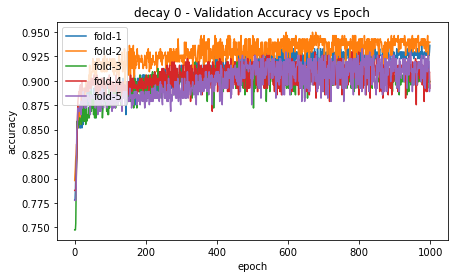

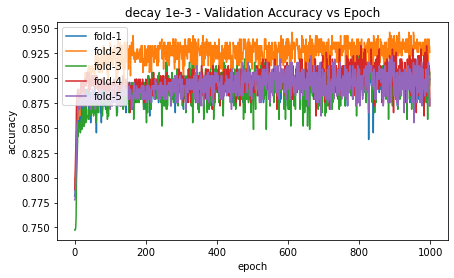

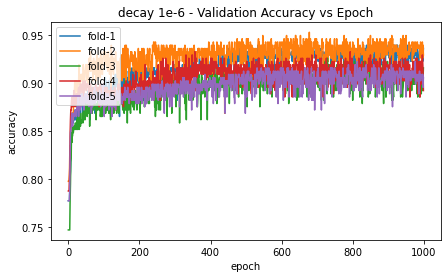

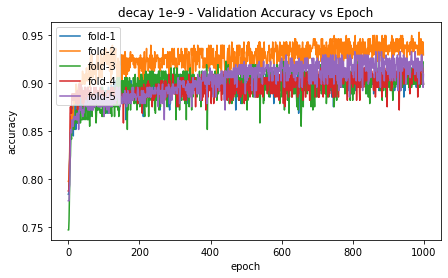

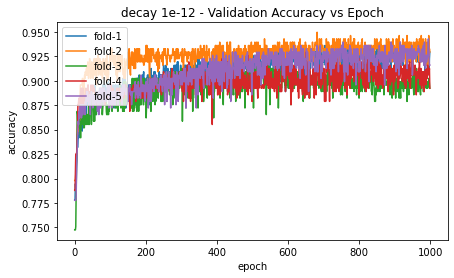

In [12]:
plt.figure(figsize=(7,4))
plt.plot(histories['decay-0-fold-0'].history['val_accuracy'])
plt.plot(histories['decay-0-fold-1'].history['val_accuracy'])
plt.plot(histories['decay-0-fold-2'].history['val_accuracy'])
plt.plot(histories['decay-0-fold-3'].history['val_accuracy'])
plt.plot(histories['decay-0-fold-4'].history['val_accuracy'])
plt.title('decay 0 - Validation Accuracy vs Epoch')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['fold-1','fold-2','fold-3','fold-4','fold-5'], loc='upper left')
plt.show()

plt.figure(figsize=(7,4))
plt.plot(histories['decay-0.001-fold-0'].history['val_accuracy'])
plt.plot(histories['decay-0.001-fold-1'].history['val_accuracy'])
plt.plot(histories['decay-0.001-fold-2'].history['val_accuracy'])
plt.plot(histories['decay-0.001-fold-3'].history['val_accuracy'])
plt.plot(histories['decay-0.001-fold-4'].history['val_accuracy'])
plt.title('decay 1e-3 - Validation Accuracy vs Epoch')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['fold-1','fold-2','fold-3','fold-4','fold-5'], loc='upper left')
plt.show()

plt.figure(figsize=(7,4))
plt.plot(histories['decay-1e-06-fold-0'].history['val_accuracy'])
plt.plot(histories['decay-1e-06-fold-1'].history['val_accuracy'])
plt.plot(histories['decay-1e-06-fold-2'].history['val_accuracy'])
plt.plot(histories['decay-1e-06-fold-3'].history['val_accuracy'])
plt.plot(histories['decay-1e-06-fold-4'].history['val_accuracy'])
plt.title('decay 1e-6 - Validation Accuracy vs Epoch')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['fold-1','fold-2','fold-3','fold-4','fold-5'], loc='upper left')
plt.show()

plt.figure(figsize=(7,4))
plt.plot(histories['decay-1e-09-fold-0'].history['val_accuracy'])
plt.plot(histories['decay-1e-09-fold-1'].history['val_accuracy'])
plt.plot(histories['decay-1e-09-fold-2'].history['val_accuracy'])
plt.plot(histories['decay-1e-09-fold-3'].history['val_accuracy'])
plt.plot(histories['decay-1e-09-fold-4'].history['val_accuracy'])
plt.title('decay 1e-9 - Validation Accuracy vs Epoch')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['fold-1','fold-2','fold-3','fold-4','fold-5'], loc='upper left')
plt.show()

plt.figure(figsize=(7,4))
plt.plot(histories['decay-1e-12-fold-0'].history['val_accuracy'])
plt.plot(histories['decay-1e-12-fold-1'].history['val_accuracy'])
plt.plot(histories['decay-1e-12-fold-2'].history['val_accuracy'])
plt.plot(histories['decay-1e-12-fold-3'].history['val_accuracy'])
plt.plot(histories['decay-1e-12-fold-4'].history['val_accuracy'])
plt.title('decay 1e-12 - Validation Accuracy vs Epoch')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['fold-1','fold-2','fold-3','fold-4','fold-5'], loc='upper left')
plt.show()

In [13]:
best_acc = mean_acc[0]
index = 0
for i in range(0,len(mean_acc)):
    print("For {} decay rate mean validation accuracy is: ".format(decays[i]) + str(mean_acc[i]))
    if(mean_acc[i] > best_acc):
        best_acc = mean_acc[i]
        index = i
print("Best mean validation accuracy: " + str(best_acc) + " from decay rate {}".format(decays[index]))

optimal_neurons = decays[index]

For 0 decay rate mean validation accuracy is: 0.9124579191207886
For 0.001 decay rate mean validation accuracy is: 0.8962962985038757
For 1e-06 decay rate mean validation accuracy is: 0.9158249139785767
For 1e-09 decay rate mean validation accuracy is: 0.9070707201957703
For 1e-12 decay rate mean validation accuracy is: 0.9117845058441162
Best mean validation accuracy: 0.9158249139785767 from decay rate 1e-06


In [14]:
NUM_CLASSES = 3

epochs = 1000
batch_size = 4
num_neurons = 25

l2 = tf.keras.regularizers.l2(l2=1e-6)

# create the model
model = Sequential([
    Dense(num_neurons, activation='relu',kernel_regularizer=l2),
    Dense(NUM_CLASSES, activation='softmax')
])

opt = tf.keras.optimizers.SGD(lr=0.01)

model.compile(optimizer=opt,
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# train the model
histories['qn4'] =model.fit(X_train, Y_train,
                            epochs=epochs,
                            verbose = 2,
                            batch_size = batch_size,
                            validation_data = (X_test, y_test))

Epoch 1/1000
372/372 - 1s - loss: 0.6924 - accuracy: 0.7776 - val_loss: 0.6296 - val_accuracy: 0.7790
Epoch 2/1000
372/372 - 0s - loss: 0.6041 - accuracy: 0.7782 - val_loss: 0.5689 - val_accuracy: 0.7790
Epoch 3/1000
372/372 - 0s - loss: 0.5451 - accuracy: 0.7782 - val_loss: 0.5086 - val_accuracy: 0.7790
Epoch 4/1000
372/372 - 0s - loss: 0.4893 - accuracy: 0.7910 - val_loss: 0.4552 - val_accuracy: 0.8009
Epoch 5/1000
372/372 - 0s - loss: 0.4440 - accuracy: 0.8172 - val_loss: 0.4135 - val_accuracy: 0.8386
Epoch 6/1000
372/372 - 0s - loss: 0.4086 - accuracy: 0.8360 - val_loss: 0.3830 - val_accuracy: 0.8433
Epoch 7/1000
372/372 - 0s - loss: 0.3833 - accuracy: 0.8454 - val_loss: 0.3614 - val_accuracy: 0.8636
Epoch 8/1000
372/372 - 0s - loss: 0.3655 - accuracy: 0.8481 - val_loss: 0.3438 - val_accuracy: 0.8715
Epoch 9/1000
372/372 - 0s - loss: 0.3501 - accuracy: 0.8582 - val_loss: 0.3285 - val_accuracy: 0.8730
Epoch 10/1000
372/372 - 0s - loss: 0.3379 - accuracy: 0.8629 - val_loss: 0.3193 - 

Epoch 81/1000
372/372 - 0s - loss: 0.2219 - accuracy: 0.8999 - val_loss: 0.2451 - val_accuracy: 0.8966
Epoch 82/1000
372/372 - 0s - loss: 0.2232 - accuracy: 0.8985 - val_loss: 0.2448 - val_accuracy: 0.8997
Epoch 83/1000
372/372 - 0s - loss: 0.2228 - accuracy: 0.9012 - val_loss: 0.2468 - val_accuracy: 0.8950
Epoch 84/1000
372/372 - 0s - loss: 0.2221 - accuracy: 0.8992 - val_loss: 0.2458 - val_accuracy: 0.8950
Epoch 85/1000
372/372 - 0s - loss: 0.2210 - accuracy: 0.8999 - val_loss: 0.2411 - val_accuracy: 0.9013
Epoch 86/1000
372/372 - 0s - loss: 0.2230 - accuracy: 0.9019 - val_loss: 0.2366 - val_accuracy: 0.9028
Epoch 87/1000
372/372 - 0s - loss: 0.2200 - accuracy: 0.8992 - val_loss: 0.2427 - val_accuracy: 0.8997
Epoch 88/1000
372/372 - 0s - loss: 0.2216 - accuracy: 0.9012 - val_loss: 0.2339 - val_accuracy: 0.9060
Epoch 89/1000
372/372 - 0s - loss: 0.2212 - accuracy: 0.9019 - val_loss: 0.2355 - val_accuracy: 0.9044
Epoch 90/1000
372/372 - 0s - loss: 0.2170 - accuracy: 0.9059 - val_loss: 

Epoch 160/1000
372/372 - 0s - loss: 0.1975 - accuracy: 0.9079 - val_loss: 0.2224 - val_accuracy: 0.9044
Epoch 161/1000
372/372 - 0s - loss: 0.1957 - accuracy: 0.9079 - val_loss: 0.2322 - val_accuracy: 0.9028
Epoch 162/1000
372/372 - 0s - loss: 0.1917 - accuracy: 0.9147 - val_loss: 0.2294 - val_accuracy: 0.9138
Epoch 163/1000
372/372 - 0s - loss: 0.1944 - accuracy: 0.9173 - val_loss: 0.2202 - val_accuracy: 0.9122
Epoch 164/1000
372/372 - 0s - loss: 0.1923 - accuracy: 0.9147 - val_loss: 0.2520 - val_accuracy: 0.8918
Epoch 165/1000
372/372 - 0s - loss: 0.1957 - accuracy: 0.9113 - val_loss: 0.2207 - val_accuracy: 0.9044
Epoch 166/1000
372/372 - 0s - loss: 0.1956 - accuracy: 0.9086 - val_loss: 0.2257 - val_accuracy: 0.9138
Epoch 167/1000
372/372 - 0s - loss: 0.1939 - accuracy: 0.9073 - val_loss: 0.2300 - val_accuracy: 0.9107
Epoch 168/1000
372/372 - 0s - loss: 0.1936 - accuracy: 0.9160 - val_loss: 0.2207 - val_accuracy: 0.9060
Epoch 169/1000
372/372 - 0s - loss: 0.1907 - accuracy: 0.9153 - 

Epoch 239/1000
372/372 - 0s - loss: 0.1758 - accuracy: 0.9220 - val_loss: 0.2177 - val_accuracy: 0.9138
Epoch 240/1000
372/372 - 0s - loss: 0.1756 - accuracy: 0.9254 - val_loss: 0.2195 - val_accuracy: 0.9107
Epoch 241/1000
372/372 - 0s - loss: 0.1754 - accuracy: 0.9281 - val_loss: 0.2323 - val_accuracy: 0.9075
Epoch 242/1000
372/372 - 0s - loss: 0.1742 - accuracy: 0.9261 - val_loss: 0.2255 - val_accuracy: 0.9075
Epoch 243/1000
372/372 - 0s - loss: 0.1755 - accuracy: 0.9241 - val_loss: 0.2169 - val_accuracy: 0.9091
Epoch 244/1000
372/372 - 0s - loss: 0.1741 - accuracy: 0.9254 - val_loss: 0.2190 - val_accuracy: 0.9075
Epoch 245/1000
372/372 - 0s - loss: 0.1724 - accuracy: 0.9294 - val_loss: 0.2135 - val_accuracy: 0.9154
Epoch 246/1000
372/372 - 0s - loss: 0.1732 - accuracy: 0.9281 - val_loss: 0.2114 - val_accuracy: 0.9201
Epoch 247/1000
372/372 - 0s - loss: 0.1746 - accuracy: 0.9254 - val_loss: 0.2143 - val_accuracy: 0.9138
Epoch 248/1000
372/372 - 0s - loss: 0.1688 - accuracy: 0.9288 - 

Epoch 318/1000
372/372 - 0s - loss: 0.1589 - accuracy: 0.9328 - val_loss: 0.2004 - val_accuracy: 0.9279
Epoch 319/1000
372/372 - 0s - loss: 0.1592 - accuracy: 0.9335 - val_loss: 0.2003 - val_accuracy: 0.9248
Epoch 320/1000
372/372 - 0s - loss: 0.1585 - accuracy: 0.9355 - val_loss: 0.2269 - val_accuracy: 0.9075
Epoch 321/1000
372/372 - 0s - loss: 0.1599 - accuracy: 0.9341 - val_loss: 0.2084 - val_accuracy: 0.9185
Epoch 322/1000
372/372 - 0s - loss: 0.1573 - accuracy: 0.9315 - val_loss: 0.2099 - val_accuracy: 0.9154
Epoch 323/1000
372/372 - 0s - loss: 0.1588 - accuracy: 0.9348 - val_loss: 0.2198 - val_accuracy: 0.9044
Epoch 324/1000
372/372 - 0s - loss: 0.1565 - accuracy: 0.9355 - val_loss: 0.2033 - val_accuracy: 0.9185
Epoch 325/1000
372/372 - 0s - loss: 0.1580 - accuracy: 0.9341 - val_loss: 0.2045 - val_accuracy: 0.9232
Epoch 326/1000
372/372 - 0s - loss: 0.1575 - accuracy: 0.9315 - val_loss: 0.2108 - val_accuracy: 0.9185
Epoch 327/1000
372/372 - 0s - loss: 0.1573 - accuracy: 0.9335 - 

Epoch 397/1000
372/372 - 0s - loss: 0.1449 - accuracy: 0.9335 - val_loss: 0.1987 - val_accuracy: 0.9357
Epoch 398/1000
372/372 - 0s - loss: 0.1474 - accuracy: 0.9382 - val_loss: 0.2025 - val_accuracy: 0.9232
Epoch 399/1000
372/372 - 0s - loss: 0.1470 - accuracy: 0.9402 - val_loss: 0.1992 - val_accuracy: 0.9232
Epoch 400/1000
372/372 - 0s - loss: 0.1472 - accuracy: 0.9368 - val_loss: 0.2002 - val_accuracy: 0.9326
Epoch 401/1000
372/372 - 0s - loss: 0.1446 - accuracy: 0.9368 - val_loss: 0.2205 - val_accuracy: 0.9091
Epoch 402/1000
372/372 - 0s - loss: 0.1476 - accuracy: 0.9429 - val_loss: 0.2031 - val_accuracy: 0.9326
Epoch 403/1000
372/372 - 0s - loss: 0.1478 - accuracy: 0.9382 - val_loss: 0.1986 - val_accuracy: 0.9373
Epoch 404/1000
372/372 - 0s - loss: 0.1445 - accuracy: 0.9429 - val_loss: 0.1982 - val_accuracy: 0.9326
Epoch 405/1000
372/372 - 0s - loss: 0.1428 - accuracy: 0.9375 - val_loss: 0.2270 - val_accuracy: 0.9044
Epoch 406/1000
372/372 - 0s - loss: 0.1457 - accuracy: 0.9395 - 

Epoch 476/1000
372/372 - 0s - loss: 0.1375 - accuracy: 0.9429 - val_loss: 0.2199 - val_accuracy: 0.9091
Epoch 477/1000
372/372 - 0s - loss: 0.1382 - accuracy: 0.9402 - val_loss: 0.1922 - val_accuracy: 0.9404
Epoch 478/1000
372/372 - 0s - loss: 0.1351 - accuracy: 0.9442 - val_loss: 0.1960 - val_accuracy: 0.9248
Epoch 479/1000
372/372 - 0s - loss: 0.1383 - accuracy: 0.9456 - val_loss: 0.2049 - val_accuracy: 0.9263
Epoch 480/1000
372/372 - 0s - loss: 0.1370 - accuracy: 0.9409 - val_loss: 0.1906 - val_accuracy: 0.9357
Epoch 481/1000
372/372 - 0s - loss: 0.1379 - accuracy: 0.9429 - val_loss: 0.1986 - val_accuracy: 0.9310
Epoch 482/1000
372/372 - 0s - loss: 0.1364 - accuracy: 0.9456 - val_loss: 0.1921 - val_accuracy: 0.9342
Epoch 483/1000
372/372 - 0s - loss: 0.1360 - accuracy: 0.9415 - val_loss: 0.2000 - val_accuracy: 0.9201
Epoch 484/1000
372/372 - 0s - loss: 0.1389 - accuracy: 0.9456 - val_loss: 0.1954 - val_accuracy: 0.9326
Epoch 485/1000
372/372 - 0s - loss: 0.1383 - accuracy: 0.9462 - 

Epoch 555/1000
372/372 - 0s - loss: 0.1315 - accuracy: 0.9489 - val_loss: 0.2094 - val_accuracy: 0.9201
Epoch 556/1000
372/372 - 0s - loss: 0.1315 - accuracy: 0.9449 - val_loss: 0.2087 - val_accuracy: 0.9248
Epoch 557/1000
372/372 - 0s - loss: 0.1322 - accuracy: 0.9429 - val_loss: 0.2014 - val_accuracy: 0.9201
Epoch 558/1000
372/372 - 0s - loss: 0.1296 - accuracy: 0.9435 - val_loss: 0.2082 - val_accuracy: 0.9216
Epoch 559/1000
372/372 - 0s - loss: 0.1277 - accuracy: 0.9435 - val_loss: 0.2001 - val_accuracy: 0.9248
Epoch 560/1000
372/372 - 0s - loss: 0.1320 - accuracy: 0.9462 - val_loss: 0.1951 - val_accuracy: 0.9279
Epoch 561/1000
372/372 - 0s - loss: 0.1292 - accuracy: 0.9483 - val_loss: 0.2068 - val_accuracy: 0.9201
Epoch 562/1000
372/372 - 0s - loss: 0.1301 - accuracy: 0.9429 - val_loss: 0.1962 - val_accuracy: 0.9310
Epoch 563/1000
372/372 - 0s - loss: 0.1308 - accuracy: 0.9476 - val_loss: 0.1952 - val_accuracy: 0.9295
Epoch 564/1000
372/372 - 0s - loss: 0.1301 - accuracy: 0.9456 - 

Epoch 634/1000
372/372 - 0s - loss: 0.1266 - accuracy: 0.9456 - val_loss: 0.2069 - val_accuracy: 0.9185
Epoch 635/1000
372/372 - 0s - loss: 0.1259 - accuracy: 0.9496 - val_loss: 0.2010 - val_accuracy: 0.9295
Epoch 636/1000
372/372 - 0s - loss: 0.1261 - accuracy: 0.9469 - val_loss: 0.2072 - val_accuracy: 0.9248
Epoch 637/1000
372/372 - 0s - loss: 0.1269 - accuracy: 0.9462 - val_loss: 0.2035 - val_accuracy: 0.9279
Epoch 638/1000
372/372 - 0s - loss: 0.1248 - accuracy: 0.9509 - val_loss: 0.2020 - val_accuracy: 0.9326
Epoch 639/1000
372/372 - 0s - loss: 0.1250 - accuracy: 0.9483 - val_loss: 0.2000 - val_accuracy: 0.9357
Epoch 640/1000
372/372 - 0s - loss: 0.1263 - accuracy: 0.9449 - val_loss: 0.2029 - val_accuracy: 0.9263
Epoch 641/1000
372/372 - 1s - loss: 0.1269 - accuracy: 0.9456 - val_loss: 0.1986 - val_accuracy: 0.9389
Epoch 642/1000
372/372 - 0s - loss: 0.1251 - accuracy: 0.9489 - val_loss: 0.2013 - val_accuracy: 0.9263
Epoch 643/1000
372/372 - 0s - loss: 0.1238 - accuracy: 0.9516 - 

Epoch 713/1000
372/372 - 0s - loss: 0.1212 - accuracy: 0.9570 - val_loss: 0.2245 - val_accuracy: 0.9169
Epoch 714/1000
372/372 - 0s - loss: 0.1189 - accuracy: 0.9543 - val_loss: 0.2095 - val_accuracy: 0.9216
Epoch 715/1000
372/372 - 0s - loss: 0.1206 - accuracy: 0.9509 - val_loss: 0.2103 - val_accuracy: 0.9310
Epoch 716/1000
372/372 - 0s - loss: 0.1223 - accuracy: 0.9503 - val_loss: 0.1943 - val_accuracy: 0.9310
Epoch 717/1000
372/372 - 0s - loss: 0.1225 - accuracy: 0.9536 - val_loss: 0.2041 - val_accuracy: 0.9248
Epoch 718/1000
372/372 - 0s - loss: 0.1220 - accuracy: 0.9462 - val_loss: 0.2035 - val_accuracy: 0.9342
Epoch 719/1000
372/372 - 0s - loss: 0.1220 - accuracy: 0.9530 - val_loss: 0.1985 - val_accuracy: 0.9310
Epoch 720/1000
372/372 - 0s - loss: 0.1228 - accuracy: 0.9483 - val_loss: 0.2027 - val_accuracy: 0.9279
Epoch 721/1000
372/372 - 0s - loss: 0.1213 - accuracy: 0.9530 - val_loss: 0.2008 - val_accuracy: 0.9326
Epoch 722/1000
372/372 - 0s - loss: 0.1211 - accuracy: 0.9523 - 

Epoch 792/1000
372/372 - 0s - loss: 0.1175 - accuracy: 0.9530 - val_loss: 0.2010 - val_accuracy: 0.9232
Epoch 793/1000
372/372 - 0s - loss: 0.1159 - accuracy: 0.9523 - val_loss: 0.2054 - val_accuracy: 0.9248
Epoch 794/1000
372/372 - 0s - loss: 0.1163 - accuracy: 0.9543 - val_loss: 0.2092 - val_accuracy: 0.9263
Epoch 795/1000
372/372 - 0s - loss: 0.1172 - accuracy: 0.9523 - val_loss: 0.2213 - val_accuracy: 0.9232
Epoch 796/1000
372/372 - 0s - loss: 0.1173 - accuracy: 0.9516 - val_loss: 0.1980 - val_accuracy: 0.9295
Epoch 797/1000
372/372 - 0s - loss: 0.1193 - accuracy: 0.9516 - val_loss: 0.1973 - val_accuracy: 0.9326
Epoch 798/1000
372/372 - 0s - loss: 0.1193 - accuracy: 0.9536 - val_loss: 0.2060 - val_accuracy: 0.9326
Epoch 799/1000
372/372 - 0s - loss: 0.1186 - accuracy: 0.9523 - val_loss: 0.2028 - val_accuracy: 0.9295
Epoch 800/1000
372/372 - 0s - loss: 0.1143 - accuracy: 0.9543 - val_loss: 0.2014 - val_accuracy: 0.9342
Epoch 801/1000
372/372 - 0s - loss: 0.1158 - accuracy: 0.9523 - 

Epoch 871/1000
372/372 - 0s - loss: 0.1124 - accuracy: 0.9503 - val_loss: 0.1999 - val_accuracy: 0.9326
Epoch 872/1000
372/372 - 0s - loss: 0.1141 - accuracy: 0.9523 - val_loss: 0.2032 - val_accuracy: 0.9295
Epoch 873/1000
372/372 - 0s - loss: 0.1153 - accuracy: 0.9530 - val_loss: 0.2315 - val_accuracy: 0.9263
Epoch 874/1000
372/372 - 0s - loss: 0.1154 - accuracy: 0.9509 - val_loss: 0.2121 - val_accuracy: 0.9232
Epoch 875/1000
372/372 - 0s - loss: 0.1129 - accuracy: 0.9516 - val_loss: 0.2023 - val_accuracy: 0.9263
Epoch 876/1000
372/372 - 0s - loss: 0.1154 - accuracy: 0.9496 - val_loss: 0.2069 - val_accuracy: 0.9232
Epoch 877/1000
372/372 - 0s - loss: 0.1141 - accuracy: 0.9583 - val_loss: 0.2293 - val_accuracy: 0.9310
Epoch 878/1000
372/372 - 0s - loss: 0.1158 - accuracy: 0.9523 - val_loss: 0.2027 - val_accuracy: 0.9279
Epoch 879/1000
372/372 - 0s - loss: 0.1129 - accuracy: 0.9536 - val_loss: 0.2235 - val_accuracy: 0.9279
Epoch 880/1000
372/372 - 0s - loss: 0.1132 - accuracy: 0.9550 - 

Epoch 950/1000
372/372 - 0s - loss: 0.1113 - accuracy: 0.9550 - val_loss: 0.2100 - val_accuracy: 0.9295
Epoch 951/1000
372/372 - 0s - loss: 0.1100 - accuracy: 0.9516 - val_loss: 0.2045 - val_accuracy: 0.9279
Epoch 952/1000
372/372 - 0s - loss: 0.1109 - accuracy: 0.9603 - val_loss: 0.2244 - val_accuracy: 0.9248
Epoch 953/1000
372/372 - 0s - loss: 0.1092 - accuracy: 0.9570 - val_loss: 0.2303 - val_accuracy: 0.9279
Epoch 954/1000
372/372 - 0s - loss: 0.1075 - accuracy: 0.9583 - val_loss: 0.2113 - val_accuracy: 0.9201
Epoch 955/1000
372/372 - 0s - loss: 0.1104 - accuracy: 0.9509 - val_loss: 0.2087 - val_accuracy: 0.9263
Epoch 956/1000
372/372 - 0s - loss: 0.1063 - accuracy: 0.9590 - val_loss: 0.2022 - val_accuracy: 0.9310
Epoch 957/1000
372/372 - 0s - loss: 0.1101 - accuracy: 0.9556 - val_loss: 0.2242 - val_accuracy: 0.9310
Epoch 958/1000
372/372 - 0s - loss: 0.1121 - accuracy: 0.9570 - val_loss: 0.2048 - val_accuracy: 0.9232
Epoch 959/1000
372/372 - 0s - loss: 0.1131 - accuracy: 0.9509 - 

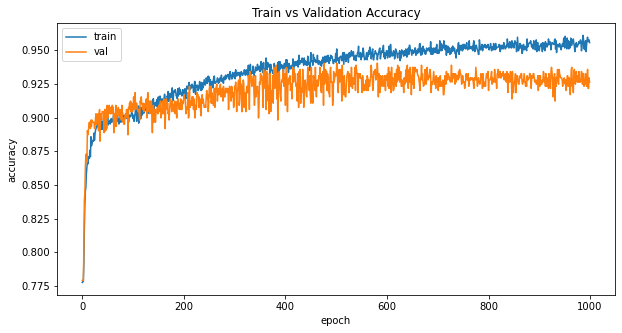

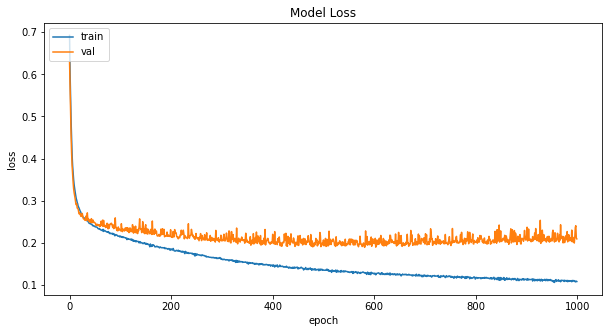

In [15]:
plt.figure(figsize=(10,5))
plt.plot(histories['qn4'].history['accuracy'])
plt.plot(histories['qn4'].history['val_accuracy'])
plt.title('Train vs Validation Accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

plt.figure(figsize=(10,5))
plt.plot(histories['qn4'].history['loss'])
plt.plot(histories['qn4'].history['val_loss'])
plt.title('Model Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

## Part A - Question 5

In [16]:
NUM_CLASSES = 3

epochs = 1000
batch_size = 32
num_neurons = 10

l2 = tf.keras.regularizers.l2(l2=1e-6)

# create the model
model = Sequential([
    Dense(num_neurons, activation='relu',kernel_regularizer=l2),
    Dense(num_neurons, activation='relu',kernel_regularizer=l2),
    Dense(NUM_CLASSES, activation='softmax')
])

opt = tf.keras.optimizers.SGD(lr=0.01)

model.compile(optimizer=opt,
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

print("Batch size: " + str(batch_size) + " epochs: " + str(epochs) + " number of neurons: " + str(num_neurons))

# train the model
history =model.fit(X_train, Y_train,
                   epochs=epochs,
                   verbose = 2,
                   batch_size = batch_size,
                   validation_data = (X_test, y_test))

Batch size: 32 epochs: 1000 number of neurons: 10
Epoch 1/1000
47/47 - 0s - loss: 0.8470 - accuracy: 0.7487 - val_loss: 0.7418 - val_accuracy: 0.7790
Epoch 2/1000
47/47 - 0s - loss: 0.7103 - accuracy: 0.7782 - val_loss: 0.6784 - val_accuracy: 0.7790
Epoch 3/1000
47/47 - 0s - loss: 0.6709 - accuracy: 0.7782 - val_loss: 0.6468 - val_accuracy: 0.7790
Epoch 4/1000
47/47 - 0s - loss: 0.6477 - accuracy: 0.7782 - val_loss: 0.6258 - val_accuracy: 0.7790
Epoch 5/1000
47/47 - 0s - loss: 0.6319 - accuracy: 0.7782 - val_loss: 0.6104 - val_accuracy: 0.7790
Epoch 6/1000
47/47 - 0s - loss: 0.6193 - accuracy: 0.7782 - val_loss: 0.5981 - val_accuracy: 0.7790
Epoch 7/1000
47/47 - 0s - loss: 0.6093 - accuracy: 0.7782 - val_loss: 0.5872 - val_accuracy: 0.7790
Epoch 8/1000
47/47 - 0s - loss: 0.5997 - accuracy: 0.7782 - val_loss: 0.5780 - val_accuracy: 0.7790
Epoch 9/1000
47/47 - 0s - loss: 0.5912 - accuracy: 0.7782 - val_loss: 0.5693 - val_accuracy: 0.7790
Epoch 10/1000
47/47 - 0s - loss: 0.5833 - accuracy

Epoch 82/1000
47/47 - 0s - loss: 0.2784 - accuracy: 0.8837 - val_loss: 0.2751 - val_accuracy: 0.8887
Epoch 83/1000
47/47 - 0s - loss: 0.2776 - accuracy: 0.8790 - val_loss: 0.2721 - val_accuracy: 0.8997
Epoch 84/1000
47/47 - 0s - loss: 0.2761 - accuracy: 0.8864 - val_loss: 0.2733 - val_accuracy: 0.8871
Epoch 85/1000
47/47 - 0s - loss: 0.2764 - accuracy: 0.8898 - val_loss: 0.2694 - val_accuracy: 0.8981
Epoch 86/1000
47/47 - 0s - loss: 0.2742 - accuracy: 0.8844 - val_loss: 0.2688 - val_accuracy: 0.9013
Epoch 87/1000
47/47 - 0s - loss: 0.2732 - accuracy: 0.8824 - val_loss: 0.2684 - val_accuracy: 0.9013
Epoch 88/1000
47/47 - 0s - loss: 0.2733 - accuracy: 0.8884 - val_loss: 0.2666 - val_accuracy: 0.9013
Epoch 89/1000
47/47 - 0s - loss: 0.2720 - accuracy: 0.8931 - val_loss: 0.2666 - val_accuracy: 0.8997
Epoch 90/1000
47/47 - 0s - loss: 0.2715 - accuracy: 0.8858 - val_loss: 0.2686 - val_accuracy: 0.8997
Epoch 91/1000
47/47 - 0s - loss: 0.2714 - accuracy: 0.8864 - val_loss: 0.2727 - val_accurac

Epoch 163/1000
47/47 - 0s - loss: 0.2426 - accuracy: 0.8952 - val_loss: 0.2445 - val_accuracy: 0.9122
Epoch 164/1000
47/47 - 0s - loss: 0.2426 - accuracy: 0.9005 - val_loss: 0.2557 - val_accuracy: 0.8966
Epoch 165/1000
47/47 - 0s - loss: 0.2427 - accuracy: 0.8931 - val_loss: 0.2494 - val_accuracy: 0.9028
Epoch 166/1000
47/47 - 0s - loss: 0.2428 - accuracy: 0.8952 - val_loss: 0.2487 - val_accuracy: 0.9013
Epoch 167/1000
47/47 - 0s - loss: 0.2424 - accuracy: 0.8965 - val_loss: 0.2460 - val_accuracy: 0.9028
Epoch 168/1000
47/47 - 0s - loss: 0.2418 - accuracy: 0.8965 - val_loss: 0.2490 - val_accuracy: 0.9013
Epoch 169/1000
47/47 - 0s - loss: 0.2407 - accuracy: 0.8978 - val_loss: 0.2507 - val_accuracy: 0.9013
Epoch 170/1000
47/47 - 0s - loss: 0.2418 - accuracy: 0.8978 - val_loss: 0.2448 - val_accuracy: 0.9028
Epoch 171/1000
47/47 - 0s - loss: 0.2409 - accuracy: 0.8965 - val_loss: 0.2468 - val_accuracy: 0.9013
Epoch 172/1000
47/47 - 0s - loss: 0.2415 - accuracy: 0.8945 - val_loss: 0.2472 - v

Epoch 244/1000
47/47 - 0s - loss: 0.2286 - accuracy: 0.9012 - val_loss: 0.2385 - val_accuracy: 0.9060
Epoch 245/1000
47/47 - 0s - loss: 0.2267 - accuracy: 0.8985 - val_loss: 0.2395 - val_accuracy: 0.9044
Epoch 246/1000
47/47 - 0s - loss: 0.2279 - accuracy: 0.8978 - val_loss: 0.2363 - val_accuracy: 0.9107
Epoch 247/1000
47/47 - 0s - loss: 0.2290 - accuracy: 0.9012 - val_loss: 0.2405 - val_accuracy: 0.9060
Epoch 248/1000
47/47 - 0s - loss: 0.2270 - accuracy: 0.9039 - val_loss: 0.2366 - val_accuracy: 0.9075
Epoch 249/1000
47/47 - 0s - loss: 0.2281 - accuracy: 0.8972 - val_loss: 0.2396 - val_accuracy: 0.9028
Epoch 250/1000
47/47 - 0s - loss: 0.2277 - accuracy: 0.8985 - val_loss: 0.2378 - val_accuracy: 0.9060
Epoch 251/1000
47/47 - 0s - loss: 0.2280 - accuracy: 0.8965 - val_loss: 0.2369 - val_accuracy: 0.9107
Epoch 252/1000
47/47 - 0s - loss: 0.2284 - accuracy: 0.8958 - val_loss: 0.2358 - val_accuracy: 0.9107
Epoch 253/1000
47/47 - 0s - loss: 0.2275 - accuracy: 0.9026 - val_loss: 0.2374 - v

Epoch 325/1000
47/47 - 0s - loss: 0.2186 - accuracy: 0.9032 - val_loss: 0.2367 - val_accuracy: 0.9044
Epoch 326/1000
47/47 - 0s - loss: 0.2196 - accuracy: 0.9019 - val_loss: 0.2398 - val_accuracy: 0.8981
Epoch 327/1000
47/47 - 0s - loss: 0.2200 - accuracy: 0.9059 - val_loss: 0.2338 - val_accuracy: 0.9044
Epoch 328/1000
47/47 - 0s - loss: 0.2183 - accuracy: 0.9005 - val_loss: 0.2333 - val_accuracy: 0.9122
Epoch 329/1000
47/47 - 0s - loss: 0.2192 - accuracy: 0.9059 - val_loss: 0.2304 - val_accuracy: 0.9122
Epoch 330/1000
47/47 - 0s - loss: 0.2185 - accuracy: 0.8958 - val_loss: 0.2420 - val_accuracy: 0.9013
Epoch 331/1000
47/47 - 0s - loss: 0.2182 - accuracy: 0.9012 - val_loss: 0.2331 - val_accuracy: 0.9060
Epoch 332/1000
47/47 - 0s - loss: 0.2182 - accuracy: 0.9039 - val_loss: 0.2305 - val_accuracy: 0.9122
Epoch 333/1000
47/47 - 0s - loss: 0.2187 - accuracy: 0.9019 - val_loss: 0.2323 - val_accuracy: 0.9075
Epoch 334/1000
47/47 - 0s - loss: 0.2185 - accuracy: 0.9046 - val_loss: 0.2386 - v

Epoch 406/1000
47/47 - 0s - loss: 0.2124 - accuracy: 0.9019 - val_loss: 0.2299 - val_accuracy: 0.9075
Epoch 407/1000
47/47 - 0s - loss: 0.2118 - accuracy: 0.9026 - val_loss: 0.2317 - val_accuracy: 0.9075
Epoch 408/1000
47/47 - 0s - loss: 0.2128 - accuracy: 0.9046 - val_loss: 0.2314 - val_accuracy: 0.9091
Epoch 409/1000
47/47 - 0s - loss: 0.2118 - accuracy: 0.9046 - val_loss: 0.2305 - val_accuracy: 0.9075
Epoch 410/1000
47/47 - 0s - loss: 0.2112 - accuracy: 0.9032 - val_loss: 0.2324 - val_accuracy: 0.9060
Epoch 411/1000
47/47 - 0s - loss: 0.2109 - accuracy: 0.9052 - val_loss: 0.2444 - val_accuracy: 0.9013
Epoch 412/1000
47/47 - 0s - loss: 0.2103 - accuracy: 0.9046 - val_loss: 0.2316 - val_accuracy: 0.9060
Epoch 413/1000
47/47 - 0s - loss: 0.2116 - accuracy: 0.9079 - val_loss: 0.2352 - val_accuracy: 0.9060
Epoch 414/1000
47/47 - 0s - loss: 0.2133 - accuracy: 0.9012 - val_loss: 0.2313 - val_accuracy: 0.9091
Epoch 415/1000
47/47 - 0s - loss: 0.2122 - accuracy: 0.9066 - val_loss: 0.2333 - v

Epoch 487/1000
47/47 - 0s - loss: 0.2061 - accuracy: 0.9073 - val_loss: 0.2292 - val_accuracy: 0.9075
Epoch 488/1000
47/47 - 0s - loss: 0.2068 - accuracy: 0.9099 - val_loss: 0.2344 - val_accuracy: 0.9028
Epoch 489/1000
47/47 - 0s - loss: 0.2077 - accuracy: 0.9079 - val_loss: 0.2260 - val_accuracy: 0.9154
Epoch 490/1000
47/47 - 0s - loss: 0.2053 - accuracy: 0.9093 - val_loss: 0.2283 - val_accuracy: 0.9060
Epoch 491/1000
47/47 - 0s - loss: 0.2065 - accuracy: 0.9106 - val_loss: 0.2294 - val_accuracy: 0.9028
Epoch 492/1000
47/47 - 0s - loss: 0.2077 - accuracy: 0.9059 - val_loss: 0.2330 - val_accuracy: 0.9028
Epoch 493/1000
47/47 - 0s - loss: 0.2063 - accuracy: 0.9066 - val_loss: 0.2313 - val_accuracy: 0.9060
Epoch 494/1000
47/47 - 0s - loss: 0.2064 - accuracy: 0.9059 - val_loss: 0.2304 - val_accuracy: 0.9075
Epoch 495/1000
47/47 - 0s - loss: 0.2050 - accuracy: 0.9066 - val_loss: 0.2373 - val_accuracy: 0.8934
Epoch 496/1000
47/47 - 0s - loss: 0.2078 - accuracy: 0.9079 - val_loss: 0.2273 - v

Epoch 568/1000
47/47 - 0s - loss: 0.1990 - accuracy: 0.9133 - val_loss: 0.2260 - val_accuracy: 0.9075
Epoch 569/1000
47/47 - 0s - loss: 0.1993 - accuracy: 0.9079 - val_loss: 0.2283 - val_accuracy: 0.9169
Epoch 570/1000
47/47 - 0s - loss: 0.2014 - accuracy: 0.9086 - val_loss: 0.2263 - val_accuracy: 0.9044
Epoch 571/1000
47/47 - 0s - loss: 0.1996 - accuracy: 0.9099 - val_loss: 0.2232 - val_accuracy: 0.9154
Epoch 572/1000
47/47 - 0s - loss: 0.1989 - accuracy: 0.9120 - val_loss: 0.2241 - val_accuracy: 0.9075
Epoch 573/1000
47/47 - 0s - loss: 0.1994 - accuracy: 0.9079 - val_loss: 0.2449 - val_accuracy: 0.9013
Epoch 574/1000
47/47 - 0s - loss: 0.2002 - accuracy: 0.9113 - val_loss: 0.2244 - val_accuracy: 0.9122
Epoch 575/1000
47/47 - 0s - loss: 0.1985 - accuracy: 0.9093 - val_loss: 0.2334 - val_accuracy: 0.9060
Epoch 576/1000
47/47 - 0s - loss: 0.2026 - accuracy: 0.9032 - val_loss: 0.2309 - val_accuracy: 0.9060
Epoch 577/1000
47/47 - 0s - loss: 0.2020 - accuracy: 0.9120 - val_loss: 0.2253 - v

Epoch 649/1000
47/47 - 0s - loss: 0.1939 - accuracy: 0.9147 - val_loss: 0.2420 - val_accuracy: 0.9075
Epoch 650/1000
47/47 - 0s - loss: 0.1966 - accuracy: 0.9113 - val_loss: 0.2380 - val_accuracy: 0.9075
Epoch 651/1000
47/47 - 0s - loss: 0.1972 - accuracy: 0.9120 - val_loss: 0.2318 - val_accuracy: 0.9107
Epoch 652/1000
47/47 - 0s - loss: 0.1954 - accuracy: 0.9099 - val_loss: 0.2228 - val_accuracy: 0.9060
Epoch 653/1000
47/47 - 0s - loss: 0.1964 - accuracy: 0.9106 - val_loss: 0.2313 - val_accuracy: 0.9060
Epoch 654/1000
47/47 - 0s - loss: 0.1926 - accuracy: 0.9153 - val_loss: 0.2318 - val_accuracy: 0.9013
Epoch 655/1000
47/47 - 0s - loss: 0.1946 - accuracy: 0.9106 - val_loss: 0.2208 - val_accuracy: 0.9060
Epoch 656/1000
47/47 - 0s - loss: 0.1946 - accuracy: 0.9167 - val_loss: 0.2227 - val_accuracy: 0.9138
Epoch 657/1000
47/47 - 0s - loss: 0.1935 - accuracy: 0.9126 - val_loss: 0.2241 - val_accuracy: 0.9154
Epoch 658/1000
47/47 - 0s - loss: 0.1950 - accuracy: 0.9093 - val_loss: 0.2231 - v

Epoch 730/1000
47/47 - 0s - loss: 0.1892 - accuracy: 0.9200 - val_loss: 0.2257 - val_accuracy: 0.9075
Epoch 731/1000
47/47 - 0s - loss: 0.1874 - accuracy: 0.9160 - val_loss: 0.2223 - val_accuracy: 0.9091
Epoch 732/1000
47/47 - 0s - loss: 0.1885 - accuracy: 0.9200 - val_loss: 0.2301 - val_accuracy: 0.9107
Epoch 733/1000
47/47 - 0s - loss: 0.1898 - accuracy: 0.9133 - val_loss: 0.2232 - val_accuracy: 0.9122
Epoch 734/1000
47/47 - 0s - loss: 0.1876 - accuracy: 0.9180 - val_loss: 0.2227 - val_accuracy: 0.9107
Epoch 735/1000
47/47 - 0s - loss: 0.1898 - accuracy: 0.9140 - val_loss: 0.2223 - val_accuracy: 0.9091
Epoch 736/1000
47/47 - 0s - loss: 0.1896 - accuracy: 0.9147 - val_loss: 0.2219 - val_accuracy: 0.9091
Epoch 737/1000
47/47 - 0s - loss: 0.1867 - accuracy: 0.9207 - val_loss: 0.2197 - val_accuracy: 0.9107
Epoch 738/1000
47/47 - 0s - loss: 0.1888 - accuracy: 0.9187 - val_loss: 0.2344 - val_accuracy: 0.9091
Epoch 739/1000
47/47 - 0s - loss: 0.1870 - accuracy: 0.9200 - val_loss: 0.2305 - v

Epoch 811/1000
47/47 - 0s - loss: 0.1837 - accuracy: 0.9214 - val_loss: 0.2194 - val_accuracy: 0.9154
Epoch 812/1000
47/47 - 0s - loss: 0.1832 - accuracy: 0.9180 - val_loss: 0.2232 - val_accuracy: 0.9013
Epoch 813/1000
47/47 - 0s - loss: 0.1832 - accuracy: 0.9160 - val_loss: 0.2150 - val_accuracy: 0.9122
Epoch 814/1000
47/47 - 0s - loss: 0.1806 - accuracy: 0.9180 - val_loss: 0.2248 - val_accuracy: 0.9138
Epoch 815/1000
47/47 - 0s - loss: 0.1830 - accuracy: 0.9227 - val_loss: 0.2169 - val_accuracy: 0.9107
Epoch 816/1000
47/47 - 0s - loss: 0.1825 - accuracy: 0.9194 - val_loss: 0.2159 - val_accuracy: 0.9075
Epoch 817/1000
47/47 - 0s - loss: 0.1798 - accuracy: 0.9214 - val_loss: 0.2185 - val_accuracy: 0.9216
Epoch 818/1000
47/47 - 0s - loss: 0.1831 - accuracy: 0.9180 - val_loss: 0.2175 - val_accuracy: 0.9138
Epoch 819/1000
47/47 - 0s - loss: 0.1813 - accuracy: 0.9234 - val_loss: 0.2162 - val_accuracy: 0.9122
Epoch 820/1000
47/47 - 0s - loss: 0.1814 - accuracy: 0.9187 - val_loss: 0.2151 - v

Epoch 892/1000
47/47 - 0s - loss: 0.1768 - accuracy: 0.9267 - val_loss: 0.2173 - val_accuracy: 0.9044
Epoch 893/1000
47/47 - 0s - loss: 0.1770 - accuracy: 0.9194 - val_loss: 0.2171 - val_accuracy: 0.9060
Epoch 894/1000
47/47 - 0s - loss: 0.1774 - accuracy: 0.9187 - val_loss: 0.2145 - val_accuracy: 0.9122
Epoch 895/1000
47/47 - 0s - loss: 0.1772 - accuracy: 0.9241 - val_loss: 0.2135 - val_accuracy: 0.9138
Epoch 896/1000
47/47 - 0s - loss: 0.1776 - accuracy: 0.9254 - val_loss: 0.2202 - val_accuracy: 0.9201
Epoch 897/1000
47/47 - 0s - loss: 0.1760 - accuracy: 0.9220 - val_loss: 0.2219 - val_accuracy: 0.9138
Epoch 898/1000
47/47 - 0s - loss: 0.1772 - accuracy: 0.9200 - val_loss: 0.2248 - val_accuracy: 0.9138
Epoch 899/1000
47/47 - 0s - loss: 0.1760 - accuracy: 0.9247 - val_loss: 0.2141 - val_accuracy: 0.9122
Epoch 900/1000
47/47 - 0s - loss: 0.1772 - accuracy: 0.9234 - val_loss: 0.2128 - val_accuracy: 0.9169
Epoch 901/1000
47/47 - 0s - loss: 0.1748 - accuracy: 0.9267 - val_loss: 0.2378 - v

Epoch 973/1000
47/47 - 0s - loss: 0.1693 - accuracy: 0.9267 - val_loss: 0.2152 - val_accuracy: 0.9107
Epoch 974/1000
47/47 - 0s - loss: 0.1693 - accuracy: 0.9281 - val_loss: 0.2356 - val_accuracy: 0.9060
Epoch 975/1000
47/47 - 0s - loss: 0.1689 - accuracy: 0.9267 - val_loss: 0.2128 - val_accuracy: 0.9232
Epoch 976/1000
47/47 - 0s - loss: 0.1714 - accuracy: 0.9288 - val_loss: 0.2122 - val_accuracy: 0.9216
Epoch 977/1000
47/47 - 0s - loss: 0.1708 - accuracy: 0.9261 - val_loss: 0.2157 - val_accuracy: 0.9107
Epoch 978/1000
47/47 - 0s - loss: 0.1674 - accuracy: 0.9274 - val_loss: 0.2216 - val_accuracy: 0.9201
Epoch 979/1000
47/47 - 0s - loss: 0.1718 - accuracy: 0.9234 - val_loss: 0.2203 - val_accuracy: 0.9107
Epoch 980/1000
47/47 - 0s - loss: 0.1694 - accuracy: 0.9308 - val_loss: 0.2113 - val_accuracy: 0.9154
Epoch 981/1000
47/47 - 0s - loss: 0.1689 - accuracy: 0.9315 - val_loss: 0.2128 - val_accuracy: 0.9107
Epoch 982/1000
47/47 - 0s - loss: 0.1685 - accuracy: 0.9281 - val_loss: 0.2285 - v

In [17]:
print(history.history.keys())

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


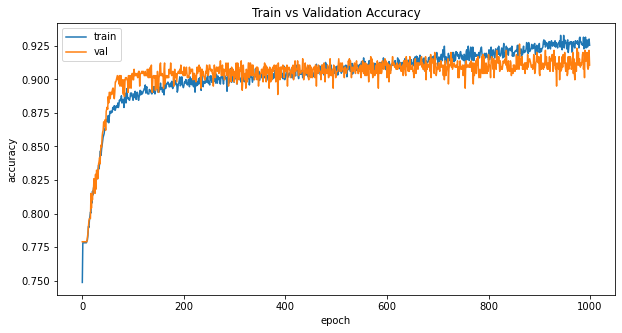

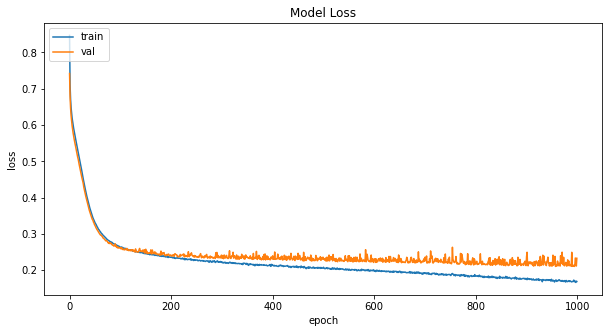

In [18]:
plt.figure(figsize=(10,5))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Train vs Validation Accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

plt.figure(figsize=(10,5))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()